In [1]:
# import all necessary libraries
!pip install mysql-connector-python
!pip install vaderSentiment
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
import pandas as pd
import numpy as np
import sklearn
from sklearn.preprocessing import MinMaxScaler
#import tensorflow
#import keras
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns
import scipy as sp
import tweepy
from tweepy import Stream
from tweepy import OAuthHandler
from tweepy.streaming import StreamListener
import time
import json
import re
import math
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
import pickle
from datetime import datetime
from datetime import timedelta
import requests
from requests.auth import AuthBase
import config
import tools
import mysql.connector
import urllib.parse
from mysql.connector import errorcode
import sqlite3
%matplotlib inline
pd.set_option('display.max_columns', 1000)
pd.set_option('display.max_rows', 1000)

In [4]:
# class definition for BearerTokenAuth, inherits from AuthBase
class BearerTokenAuth(AuthBase):
    """class which handles bearer token requests and authentification"""
    def __init__(self, consumer_key, consumer_secret):
        """initializes a BearerTokenAuth object"""
        self.bearer_token_url = "https://api.twitter.com/oauth2/token"
        self.consumer_key = consumer_key
        self.consumer_secret = consumer_secret
        self.bearer_token = self.get_bearer_token()

    def get_bearer_token(self):
        """requests bearer token"""
        response = requests.post(
            self.bearer_token_url,
            auth=(self.consumer_key, self.consumer_secret),
            data={'grant_type': 'client_credentials'},
            headers={'User-Agent': 'LabsRecentSearchQuickStartPython'})

        if response.status_code is not 200:
            raise Exception("Cannot get a Bearer token (HTTP %d): %s" %
                            (response.status_code, response.text))

        body = response.json()
        return body['access_token']

    def __call__(self, r):
        """sets headers"""
        r.headers['Authorization'] = f"Bearer %s" % self.bearer_token
        r.headers['User-Agent'] = 'LabsRecentSearchQuickStartPython'
        return r

In [5]:
# define a mysql connection to aws db
def aws_connect(db_name=None):
    """function which will connect us to aws database instance of our choosing"""
    connection = mysql.connector.connect(
    host = config.AWS_ENDPOINT,
    user = config.AWS_USER,
    passwd = config.AWS_PASSWORD,
    port = config.AWS_PORT,
    database = db_name)
    return connection

# create a connection with aws db
cnx = aws_connect()

# create a cursor over the mysql connection
cursor = cnx.cursor()

# function to create our AWS database
def create_database(cursor, database):
    """creates an aws instance"""
    try:
        cursor.execute(
            "CREATE DATABASE {} DEFAULT CHARACTER SET 'utf8'".format(database))
    except mysql.connector.Error as err:
        print("Failed creating database: {}".format(err))
        exit(1)
        
# name of our database
db_name = '$TSLA'

# check to see if the database already exists, and if it doesn't, create it
try:
    cursor.execute("USE {}".format(db_name))
except mysql.connector.Error as err:
    print("Database {} does not exists.".format(db_name))
    if err.errno == errorcode.ER_BAD_DB_ERROR:
        create_database(cursor, db_name)
        print("Database {} created successfully.".format(db_name))
        cnx.database = db_name
    else:
        print(err)
        exit(1)
        
# template for our db tables
TABLES = {}
TABLES['tweet_time_price1'] = (
    "CREATE TABLE tweet_time_price1 ("
    "  tweet varchar(250) NOT NULL,"
    "  id varchar(50) NOT NULL,"
    "  datetime datetime NOT NULL,"
    "  price varchar(10) NOT NULL"
    ") ENGINE=InnoDB")

# create tables according to above template
for table_name in TABLES:
    table_description = TABLES[table_name]
    try:
        print("Creating table {}: ".format(table_name), end='')
        cursor.execute(table_description)
    except mysql.connector.Error as err:
        if err.errno == errorcode.ER_TABLE_EXISTS_ERROR:
            print("already exists.")
        else:
            print(err.msg)
    else:
        print("OK")

# close connections to our cursors
cursor.close()
cnx.close()
# reopen a mysql connection
cnx = aws_connect('$TSLA')
# recreate a cursor over the mysql connection
cursor = cnx.cursor()
# insert statement to add a tweet
add_tweet = ("INSERT INTO tweet_time_price1"
               "(tweet, id, datetime, price)"
               "VALUES (%s, %s, %s, %s)")

Creating table tweet_time_price1: already exists.


In [6]:
# time intervals over which we'll query our tweets
initial_time = '2020-05-11 09:00:00'
final_time = '2020-05-15 23:00:00'
intervals = list(pd.date_range(initial_time, final_time, freq='T'))
intervals1 = [str(i).split() for i in intervals]
intervals2 = [i[0]+"T"+i[1]+"Z" for i in intervals1]
intervals2

['2020-05-11T09:00:00Z',
 '2020-05-11T09:01:00Z',
 '2020-05-11T09:02:00Z',
 '2020-05-11T09:03:00Z',
 '2020-05-11T09:04:00Z',
 '2020-05-11T09:05:00Z',
 '2020-05-11T09:06:00Z',
 '2020-05-11T09:07:00Z',
 '2020-05-11T09:08:00Z',
 '2020-05-11T09:09:00Z',
 '2020-05-11T09:10:00Z',
 '2020-05-11T09:11:00Z',
 '2020-05-11T09:12:00Z',
 '2020-05-11T09:13:00Z',
 '2020-05-11T09:14:00Z',
 '2020-05-11T09:15:00Z',
 '2020-05-11T09:16:00Z',
 '2020-05-11T09:17:00Z',
 '2020-05-11T09:18:00Z',
 '2020-05-11T09:19:00Z',
 '2020-05-11T09:20:00Z',
 '2020-05-11T09:21:00Z',
 '2020-05-11T09:22:00Z',
 '2020-05-11T09:23:00Z',
 '2020-05-11T09:24:00Z',
 '2020-05-11T09:25:00Z',
 '2020-05-11T09:26:00Z',
 '2020-05-11T09:27:00Z',
 '2020-05-11T09:28:00Z',
 '2020-05-11T09:29:00Z',
 '2020-05-11T09:30:00Z',
 '2020-05-11T09:31:00Z',
 '2020-05-11T09:32:00Z',
 '2020-05-11T09:33:00Z',
 '2020-05-11T09:34:00Z',
 '2020-05-11T09:35:00Z',
 '2020-05-11T09:36:00Z',
 '2020-05-11T09:37:00Z',
 '2020-05-11T09:38:00Z',
 '2020-05-11T09:39:00Z',


In [98]:
# constant search parameters
query = urllib.parse.quote(""""$TSLA" lang:en""")
max_results = "100"
headers = {"Accept-Encoding": "gzip"}

# Script starts here
for i in range(len(intervals2)-1):
    
    start = intervals2[i]
    end =  intervals2[i+1]
    url = f"https://api.twitter.com/labs/2/tweets/search?query={query}&max_results={max_results}&start_time={start}&end_time={end}"
    
    # first page of calls
    response = requests.get(url, auth=BearerTokenAuth(config.TWITTER_API_KEY, config.TWITTER_API_SECRET_KEY), headers=headers)
    if response.status_code is not 200:
        raise Exception(f"Request returned an error: %s, %s" % (response.status_code, response.text))
    parsed = json.loads(response.text)
    pretty_print = json.dumps(parsed, indent=2, sort_keys=True)
    print(pretty_print)
    # adds our parsed results to our database
    try:
        for j in parsed['data']:
            cursor.execute(add_tweet, (j['text'], j['id'], intervals2[i+1], 'null'))
            cnx.commit()
    except:
        continue
    time.sleep(5)

{
  "data": [
    {
      "id": "1259770218945089536",
      "text": "$TSLA $VTIQ $CLVS $NASDAQ $CCL $MGM $NDX $QQQ $DIA $M : the most socially trending symbols in descending order. ( #traderead Free alerts, Live trading , Investment insight ... https://t.co/AEjWYVbyWB)"
    }
  ],
  "meta": {
    "newest_id": "1259770218945089536",
    "oldest_id": "1259770218945089536",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1259770704679055360",
      "text": "RT @TiffanyPhoto1: \u20181.7 million\u2019 likes \n\n\u2018346k\u2019 retweets \n\n$TSLA $TSLAQ #TeslaSucks https://t.co/GNDLOc2oiQ"
    },
    {
      "id": "1259770675654467584",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    }
  ],
  "meta": {
    "newest_id": "1259770704679055360",
    "oldest_id": "1259770675654467584",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id

{
  "data": [
    {
      "id": "1259774410275328000",
      "text": "RT @AskDrStupid: Seems to be some confusion with some people as to whether @Tesla qualify in the latest phase of reopening - the answer is\u2026"
    },
    {
      "id": "1259774318550102016",
      "text": "Tesla\u2019s Elon Musk gets cursed-out by CA politician who\u2019s backed by Chevron https://t.co/rIu78bumL3 $TSLA #TeslaMotors"
    },
    {
      "id": "1259774290242744322",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    }
  ],
  "meta": {
    "newest_id": "1259774410275328000",
    "oldest_id": "1259774290242744322",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1259774602038980608",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting

{
  "data": [
    {
      "id": "1259777108181577733",
      "text": "RT @28delayslater: Let\u2019s play \u201cspot the EV company\u201d $TSLA https://t.co/Du5ixwVbMF"
    }
  ],
  "meta": {
    "newest_id": "1259777108181577733",
    "oldest_id": "1259777108181577733",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1259777440135688192",
      "text": "RT @g_schelle: $TSLA $TSLAQ\n\ud83d\udce2\ud83d\udce2\ud83d\udce2\nI always thought the inflated range of $TSLA cars was a PR thing. To claim to be the best. \nThat's a second\u2026"
    },
    {
      "id": "1259777424377679873",
      "text": "China Passenger Car Association Reports China Sold 3,635 Model 3 Vehicles in April, Down 64% vs March\n5:28:31am\nRelated Tickers: $TSLA"
    },
    {
      "id": "1259777380345942016",
      "text": "Watch \"Tao Te Ching by Lao Tzu (Complete)\" on YouTube\nhttps://t.co/D5kvmyl6Cs\n$XRT LOVE AND PEACE $GSK $HTZ $AAL $TSLA $MSFT $SPY $NFLX $AAPL $TGT $SHOP $JPM $BA $AMZN $GE $NIO $CH

{
  "data": [
    {
      "id": "1259780736208515072",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259780706047320070",
      "text": "$ZOM OVERSOLD! GONNA RUN PREMARKET\ud83d\udcb8\ud83d\udcc8\u2708\ud83d\uded2\ud83c\udf7e $spx $es_f #daytrading #investing #futures $spy $nasdaq $zb_f $nq_f $cl_f $GC_f $XOM $ibm $amzn $googl $AVGO $WFM $cvs $bac $td $WMT $COST $WFC $jnj $GE $GS $tsla $utx $fb $JPM $dis $MCD $mo $NKE $TGT $RHT $V $gc_f $BTC https://t.co/TfyTNIhlH3"
    },
    {
      "id": "1259780692755406851",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259780603945398273",
      "text": "RT @Johnnaaaaaaaaaa: Just my 2.5 cents: @elonmusk has every right

{
  "data": [
    {
      "id": "1259783227968913409",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    }
  ],
  "meta": {
    "newest_id": "1259783227968913409",
    "oldest_id": "1259783227968913409",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1259783548677971968",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    }
  ],
  "meta": {
    "newest_id": "1259783548677971968",
    "oldest_id": "1259783548677971968",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1259783760511479809",
      "text": "RT @p_ferragu: Every time I dig into #Tesla\u2019s autopilot efforts I wonder if I don\u2019t underestimate the potential... 2 things amaze me: the s\u2026"
    },
    {
      "id": "125

{
  "data": [
    {
      "id": "1259788523986726913",
      "text": "RT @TriggerTrades: Looking at $SPY $SPX $NDX $QQQ to judge market conditions, does not paint the whole picture.\n\nYou must look at the leade\u2026"
    },
    {
      "id": "1259788506152308743",
      "text": "@asemota Great insight Baba! I hold few TSLA shares but I always say I invested in Elon musk and his idea NOT the company (fully understand the risk). Once he is out of the Maths I will sell immediately\u2019"
    },
    {
      "id": "1259788460627505152",
      "text": "Well, didn't expect to wake up to this today in shares of $TSLA. I've never seen so much news in a weekend either. The entire media was talking about $TSLA."
    }
  ],
  "meta": {
    "newest_id": "1259788523986726913",
    "oldest_id": "1259788460627505152",
    "result_count": 3
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1259789046139813894",
      "text": "$TSLA $TSLAQ  May8\n$819.42(+5.0%) $787.01\u

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1259792407916404736",
      "text": "RT @TiffanyPhoto1: .@Tesla Fanboy? \n\nIt\u2019s best to keep them on their leash Elon  ... just saying \n\n$TSLA $TSLAQ https://t.co/i7AD98XWYH"
    },
    {
      "id": "1259792375184084992",
      "text": "RT @montana_skeptic: 1/ An Open Letter to Governor Greg Abbott (@GovAbbott), of the Great State of Texas. $TSLA"
    }
  ],
  "meta": {
    "newest_id": "1259792407916404736",
    "oldest_id": "1259792375184084992",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1259792764801298434",
      "text": "Tesla's China Sales Dropped 64% In April, Even As Wider Market Recovered, CPCA Says $TSLA https://t.co/iSXAHieRgu"
    },
    {
      "id": "1259792753761886213",
      "text": "@WallStCritic Love the @SeinfeldTV reference! Let\u2019s hear more : ) \nYou wouldn\u2019t be talking about $TSLA now would you ?"
    },
    {
      "id": "1259792741426507776",
      "t

{
  "data": [
    {
      "id": "1259795152849297414",
      "text": ".@lisaabramowicz1 @tomkeene @pimmfox Looking forward to this morning\u2019s conversation re: @elonmusk and $TSLA \nhttps://t.co/b2hgxqQHlq"
    },
    {
      "id": "1259795143026257921",
      "text": "Buckle up, we are in for some chop today... $tsla. Hopefully @AlamedaCounty comes to a quick resolution with @Tesla This dip will be another buying opportunity. I\u2019m avoiding the morning rush on this  and will wait and see where it goes."
    }
  ],
  "meta": {
    "newest_id": "1259795152849297414",
    "oldest_id": "1259795143026257921",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1259795552104886272",
      "text": "@socallfc @Atomos111 @DrewAdamTepper @elonmusk @LorenaSGonzalez TSLA is not listed on the DOW Jones Industrial Index, lol. It's not even on the S&amp;P500. It's only index is the Nasdaq 100.. \n\nMeaning, it has absolutely no affect on the DOW's value."
    },
    {
      "id": "125

{
  "data": [
    {
      "id": "1259797641434746881",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259797632223866880",
      "text": "TSLA is my favorite short selling candidate - possible Double Top weekly \ud83e\udd70 https://t.co/BhaN0ziSuY"
    },
    {
      "id": "1259797590230458371",
      "text": "@BradMunchen @maythefroth @teslashanghai basically says $tsla gf3 only has 30% local parts and still mostly depends on imported parts, where these countries have stopped their manufacturing due to covid, so gf3 can't produce / operate as planned due to shortage of parts"
    },
    {
      "id": "1259797557800251393",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    }
  ],
  "me

{
  "data": [
    {
      "id": "1259799751215788033",
      "text": "RT @OptionsMike: Good Morning!\n\nFutures turned small red overnight. \n\nOPEX for May this week\n\n$AMC up pre Amazon takeover talks Daily Mail\u2026"
    },
    {
      "id": "1259799695196553217",
      "text": "There is now way a BOD with any semblance of influence or control would allow Musk's tweets and actions over a 1 week factory opening delay. Again the $TSLA BOD insured now by Elon himself are shown to be pointless. $TSLAQ"
    }
  ],
  "meta": {
    "newest_id": "1259799751215788033",
    "oldest_id": "1259799695196553217",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1259800142355595265",
      "text": "RT @OptionsMike: Good Morning!\n\nFutures turned small red overnight. \n\nOPEX for May this week\n\n$AMC up pre Amazon takeover talks Daily Mail\u2026"
    },
    {
      "id": "1259800131827675143",
      "text": "FKKKK WHY DID YOU DROP ONLY NOW Tsla"
    },
    {
      "id": "12598001174

{
  "data": [
    {
      "id": "1259801662488752128",
      "text": "Callon Petroleum's Hedge Worked Out Nicely With a $252MM Gain! \n$cpe \n$aapl $amzn $agn $abbv $ba $bhc $brk $crm $cmg $dis $f $ge $hlf $iep $jnj $ko $ibm $pep $msft $lly  $nflx $tsla $tst $rad $wynn $snap $pfe $teva $azn $gsk $prgo $ms $gs $wfc $jpm $bac $c $mnk $googl $gm $btc https://t.co/AXltHrE0oE"
    },
    {
      "id": "1259801660567805952",
      "text": "$TSLA \nTesla Autopilot update for better speed limit sign recognition is coming soon\n\nJoey by Klender on May 10, 2020 https://t.co/CXXxS4WLSm"
    },
    {
      "id": "1259801638321168386",
      "text": "$i huge move upward coming \ud83d\ude80\ud83d\udcc8 $spy $spx $fb $tsla"
    },
    {
      "id": "1259801617186148352",
      "text": "In other news what's his impression on $TSLA sales in Europe \ud83d\ude02\ud83d\ude02 $TSLAQ https://t.co/Z9PBu3fhxG"
    },
    {
      "id": "1259801547137003521",
      "text": "Looking for the $803-$805 to confirm

{
  "data": [
    {
      "id": "1259804187434651648",
      "text": "RT @TESLAcharts: If $TSLA shut down Shanghai because of lack of customers and not lack of parts, look out below..."
    },
    {
      "id": "1259804120300638209",
      "text": "RT @BradMunchen: Any $TSLAQ bros out there who can read Chinese? This article just came out &amp; supposedly says that $TSLA's GF3 didn't start\u2026"
    }
  ],
  "meta": {
    "newest_id": "1259804187434651648",
    "oldest_id": "1259804120300638209",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1259804442280570886",
      "text": "RT @facts_tesla: Cybertruck's design is understandably getting lots of attention but the specs and pricing are more important to the future\u2026"
    },
    {
      "id": "1259804351452807169",
      "text": "RT @Hatchatorium: Back home. Powering the cockpit back up. SMH. Everything is so COLLLLD!!! Good hunting, today, you guys. $MARK it!!! $MVI\u2026"
    },
    {
      "id": "1259804276169285

{
  "data": [
    {
      "id": "1259806518855323649",
      "text": "Unlike valley titans Facebook and Google, Tesla wants to put its employees at risk in order to provide desperately needed cash flow. Where's the humanitarian offering help to trapped kids in Thailand cave? Sell your damn posessions &amp; provide to your safe-at-home workers. $TSLA https://t.co/wNVI8a1Y2z"
    },
    {
      "id": "1259806473191936000",
      "text": "RT @DeItaOne: GERMAN ECONOMY MINISTER ALTMAIER SAYS   ON $TSLA PLANT NEAR BERLIN, AS FAR AS I UNDERSTAND DON'T EXPECT MAJOR DELAYS"
    }
  ],
  "meta": {
    "newest_id": "1259806518855323649",
    "oldest_id": "1259806473191936000",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1259806865753608192",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259806769435598850",
      "t

{
  "data": [
    {
      "id": "1259808394606792704",
      "text": "RT @g_schelle: $TSLA $TSLAQ\n\ud83d\udce2\ud83d\udce2\ud83d\udce2\nI always thought the inflated range of $TSLA cars was a PR thing. To claim to be the best. \nThat's a second\u2026"
    },
    {
      "id": "1259808236229754886",
      "text": "TSLA Stock Down 3% in Pre-market, Tesla Highlights Plan to Get Back to Work  https://t.co/aQng4BugMQ"
    },
    {
      "id": "1259808232882790402",
      "text": "TSLA Stock Down 3% in Pre-market, Tesla Highlights Plan to Get Back to Work  https://t.co/FwXpwX9eFL"
    }
  ],
  "meta": {
    "newest_id": "1259808394606792704",
    "oldest_id": "1259808232882790402",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1259808701373976576",
      "text": "RT @ElliottForecast: $TSLA Rallied higher last month within an impulsive structure supported the stock above 1.618 fib ext area $800  #elli\u2026"
    },
    {
      "id": "1259808680469544960",
      "text": "@elonm

{
  "data": [
    {
      "id": "1259809968850636800",
      "text": "Put your debts and bills up for sale! https://t.co/VOEUjnISk5\n\n$AMZN $ETSY $BABA $WMT $TGT $KR $JPM $FB $WFC $GOO $TWTR   $agn $aapl $brk $crm $cmg $dis $f $QQQ  $ibm $LABU  $TSLA"
    },
    {
      "id": "1259809803024715776",
      "text": "US and Europe down a lot as weil (and lots of new EV competition coming to showrooms in Europe this year) and now weak Model3 sales in China.\n\n$TSLA has a horrible time ahead in Q2+ 2020... https://t.co/1R0Q0cEmnk"
    },
    {
      "id": "1259809791230140417",
      "text": "RT @orthereaboot: May 2020 will surpass August 2018 in crazy.\n\nFacts about what transpired re: @elonmusk &amp; $tsla have not yet come out. Acc\u2026"
    },
    {
      "id": "1259809763170422784",
      "text": "$TSLA As long the short term bounce fails below $887 then the stock can see further correction lower toward $620 #elliottwave #trading"
    }
  ],
  "meta": {
    "newest_id": "12598099688

{
  "data": [
    {
      "id": "1259812224614518784",
      "text": "RT @chigrl: Before I sign off, found a new podcast series on podbean from @TESLAcharts  called TC's chartcast...some great guests (not ever\u2026"
    },
    {
      "id": "1259812102149148672",
      "text": "@BradMunchen @DKurac Lol.  Clearly 1) the plane is not shut down for maintenance.  2) everyone, even $tsla, does light maintenance when plants are shut down for other reasons. B"
    },
    {
      "id": "1259812082968440832",
      "text": "RT @Johnnaaaaaaaaaa: Just my 2.5 cents: @elonmusk has every right to stand up for his company, employees, shareholders and customers. He\u2019s\u2026"
    },
    {
      "id": "1259812028060962818",
      "text": "With $CVNA being the world's most valuable car dealer by market cap (besides $TSLA of course) why not? https://t.co/W0jhBJyi1Y"
    },
    {
      "id": "1259812014706262016",
      "text": "TSLA Stock Down 3% in Pre-market, Tesla Highlights Plan to Get Back to Wo

{
  "data": [
    {
      "id": "1259813995810349057",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Moleculin Biotech did not solicit claims third parties made about a COVID-19 drug candidate that led to an SEC halt  https://t.co/oDf1Ii03pt"
    },
    {
      "id": "1259813991607603201",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Under Armour shares fall after wider-than-expected losses  https://t.co/7Oa31EQLNU"
    },
    {
      "id": "1259813987392409600",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Virgin Group may sell up to 25 million of its Virgin Galactic shares to bolster travel business hit by COVID-19  https://t.co/A8nSP0rgrB"
    },
    {
      "id": "1259813954555011079",
      "text": "@m0kbang @DeItaOne Haha true that, so today will be a day to buy $tsla \u201ccheap\u201d for a lifetime opportunity \ud83e\udd23"
    },
    {
      "id": "1259813766558093312",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by i

{
  "data": [
    {
      "id": "1259815495185895424",
      "text": "China Comes First In America\nMr. @POTUS  @realDonaldTrump \n\n$aapl $amzn $agn $abbv $ba $bhc $brk $crm $cmg $dis $f $ge $hlf $iep $jnj $ko $ibm $pep $msft $lly  $nflx $tsla $tst $rad $wynn $snap $pfe $teva $azn $gsk $prgo $ms $gs $wfc $jpm $bac $c $mnk $googl $gm $btc https://t.co/rb4gCn5NjG"
    },
    {
      "id": "1259815415947108352",
      "text": "$ITOX I'm too excited today. Gonna add 700k shares\ud83d\udcb8\n $AAPL $AMD $AMRN $AAL $BAC $AMZN $MSFT $BA $ABT $TSLA $X $NVDA $GE $DIS $CCL $UBER $DAL $NFLX $FB $T $F $MU $SQ $M $ZM $XOM $GILD $ROKU $UAL $JPM $ABBV $FCX $SNAP $BABA $WFC $RCL $BB $HSBC $LYG $TEVA $C $OXY $JNJ $LYFT $LK $ZM https://t.co/Vl3VNOqSpC"
    },
    {
      "id": "1259815408913317888",
      "text": "#SandyMunro states the $tsla Model Y is 'worth every penny' \n\nhttps://t.co/t7LV2GbZD3"
    },
    {
      "id": "1259815375056916480",
      "text": "RT @AskDrStupid: Seems to be some confu

{
  "data": [
    {
      "id": "1259817203278495745",
      "text": "RT @JCOviedo6: $TSLA IR had meetings with DB last week.\n\nThe company told investors that its \"backlog of orders for existing models at the\u2026"
    },
    {
      "id": "1259817082918600704",
      "text": "RT @orthereaboot: May 2020 will surpass August 2018 in crazy.\n\nFacts about what transpired re: @elonmusk &amp; $tsla have not yet come out. Acc\u2026"
    },
    {
      "id": "1259817076480446464",
      "text": "@coinaday1 I clicked like on the comment but want to reiterate that it is been amazing work. \n\nWhen $TSLA blows up this year it's gonna take a lot of people with them. Wait till they figure out how Gallipoli and the other turds have been paid to tout and leak."
    }
  ],
  "meta": {
    "newest_id": "1259817203278495745",
    "oldest_id": "1259817076480446464",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1259817485844353029",
      "text": "Remind me, what happens to ppl in Chi

{
  "data": [
    {
      "id": "1259818992333709312",
      "text": "RT @IGTV: Tesla's $TSLA Model 3 sales slumped by 64% MoM in April, according to China\u2019s Passenger Car Association (CPCA). The #COVID19 pand\u2026"
    },
    {
      "id": "1259818885370515457",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259818879506841600",
      "text": "RT @TNR_Gold: #Lithium Royalty companies, like #TNRGold, can provide very important hedge and the unique entry point into this #rEVolution\u2026"
    },
    {
      "id": "1259818825484242944",
      "text": "RT @thestinkmarket: Tesla $TSLA is planning to stop production of all electric cars and instead start producing diesel guzzling monster tru\u2026"
    }
  ],
  "meta": {
    "newest_id": "1259818992333709312",
    "oldest_id": "1259818825484242944",
    "result_count": 4


{
  "data": [
    {
      "id": "1259820521887338496",
      "text": "RT @TheReUpIsComing: $ALPP - Round two can go as high as $2.50 as this ticker becomes discovered by the masses. #chartsdontlie $BYND $AMZN\u2026"
    },
    {
      "id": "1259820490136399872",
      "text": "$TSLA SHARES DOWN 2.8% PREMARKET AFTER CPCA DATA SHOWED SLUMP IN CHINA SALES FOR MODEL 3 VEHICLES IN APRIL"
    },
    {
      "id": "1259820440643612675",
      "text": "@Jason @LorenaSGonzalez @elonmusk @Tesla I love how everyone is saying companies getting bailouts should be left to die when a main driver of TSLA\u2019s survival historically has been government subsidies. Great to listen to them when they\u2019re giving you money, but when you disagree with them, raise all hell. Makes sense."
    },
    {
      "id": "1259820347857219590",
      "text": "Tesla\u2019s stock falls 2.7% in premarket\u00a0trading https://t.co/0yDrJyrbLW"
    }
  ],
  "meta": {
    "newest_id": "1259820521887338496",
    "oldest_i

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1259822785876168704",
      "text": "RT @TheStreet: ICYMI: Here's your breakdown of @ElonMusk's battle in the Golden State $TSLA  https://t.co/TWQ9sVZXUZ"
    },
    {
      "id": "1259822689650425862",
      "text": "Economic Revival | South Korea Braces For A Second Wave: https://t.co/dPU8n3OIlX\n\n$AMC, $QDEL, $CAH, $AN, $UAA, $MAR, $TSLA &amp; more...\n\n#News #Headlines #Stocks #StockMarket #Equities #Finance #Investing #Trading #DayTrading #NYSE #NASDAQ #WallStreet https://t.co/7KfP6jycuQ"
    },
    {
      "id": "1259822666913058818",
      "text": "RT @AskDrStupid: Seems to be some confusion with some people as to whether @Tesla qualify in the latest phase of reopening - the answer is\u2026"
    },
    {
      "id": "1259822637443940355",
      "text": "$TSLA I don\u2019t care what people call this but I call this a middle finger pointing down https://t.co/n1SDzMjrGQ"
    }
  ],
  "meta": {
    "newest_

{
  "data": [
    {
      "id": "1259824547714367489",
      "text": "$NFLX still holding 434, if 434 fails and it holds under 431 id consider going short on it into 427, 423. \n$TSLA failed to hold over 800 and is at 798 currently. If it continues to hold under 800 and can't reclaim it then it can pull back to 785, 767. Needs over 823 to go long."
    },
    {
      "id": "1259824534787518464",
      "text": "RT @Alpsoy66: Tesla says it will resume operations. Here is the company's plan to bring employees back to work from. Worth checking the gui\u2026"
    },
    {
      "id": "1259824526076108801",
      "text": "Will Trump use Exec Order powers to \"create demand\" on an already depressed economy to force-stimulate consumer spending?\n\n$GM $F $FCAU $TSLA \n\nAnyone remember \u201cCash for Klunkers\u201d? https://t.co/8sTZhxAjy9"
    },
    {
      "id": "1259824347398713344",
      "text": "US Futures consolidating, watch $TSLA, $UAL, $MAR, $UAA, $AXP, $COTY, $M - https://t.co/9fb

{
  "data": [
    {
      "id": "1259825820773875712",
      "text": "$TSLA ok boys and girls and this is the last time you will ever see it below 800 in your lifetime... buy all the 1850 calls you can today as we are going to 1000$ this week"
    },
    {
      "id": "1259825682802110465",
      "text": "Good Morning Traders Some Tickers that have my interest this morning:\n$APOP\n$TSLA\n$SHOP\n$AMC\n$VTIQ\n$CYTK\n$CAH\n$ORA\n$MYOK\n$QDEL\n$NVDA\n$TTD\nTo name a few plays\nCurrently have 57 on MY list narrowing it down to the Final 12 for Clients Going to Be Fun\nJOIN US\nhttps://t.co/Lp58JbFkKW https://t.co/m4w1Omgy3s"
    },
    {
      "id": "1259825662946430977",
      "text": "RT @g_schelle: $TSLA $TSLAQ\n\ud83d\udce2\ud83d\udce2\ud83d\udce2\nI always thought the inflated range of $TSLA cars was a PR thing. To claim to be the best. \nThat's a second\u2026"
    },
    {
      "id": "1259825640477466628",
      "text": "TSLA Stock Down 3% in Pre-market, Tesla Highlights Plan to Bri

{
  "data": [
    {
      "id": "1259827284011372545",
      "text": "@CGrantWSJ have u ever done a deep dive into $SPCE - I think you might be more horrified w @richardbranson and @chamath than @elonmusk and $TSLA - it\u2019s like INSANE - would love to know your thoughts"
    },
    {
      "id": "1259827182161010689",
      "text": "RT @evdefender: Elon Musk's latest psychotic break began on April 29 as he flew a charter jet from Texas to use Fremont as a backdrop for a\u2026"
    },
    {
      "id": "1259827128041902080",
      "text": "RT @ShortingIsFun: On @CNBC right now @Lebeaucarnews has turned the #Tesla shilling to 11. \n\n-Selling the idea of another Gigafactory.\n-Ign\u2026"
    }
  ],
  "meta": {
    "newest_id": "1259827284011372545",
    "oldest_id": "1259827128041902080",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1259827590816202752",
      "text": "2/3 Musk's ease w spit'n in the face of CA sustainable energy crowd &amp; carelessness for his wrks' 

{
  "data": [
    {
      "id": "1259829099683622912",
      "text": "RT @squawksquare: BREAKING: GERMAN ECONOMY MINISTER ALTMAIER SAYS   ON $TSLA PLANT NEAR BERLIN, AS FAR AS I UNDERSTAND DON'T EXPECT MAJOR D\u2026"
    },
    {
      "id": "1259829078904967169",
      "text": "RT @DeItaOne: $TSLA SHARES DOWN 2.8% PREMARKET AFTER CPCA DATA SHOWED SLUMP IN CHINA SALES FOR MODEL 3 VEHICLES IN APRIL"
    },
    {
      "id": "1259829063113412608",
      "text": "RT @Hatchatorium: $MARK Okay. Per hedge funds just spoken to, expecting this to run into ER &amp; said they still think it will be Thursday. Av\u2026"
    },
    {
      "id": "1259828997179019265",
      "text": "RT @TheStreet: ICYMI: Here's your breakdown of @ElonMusk's battle in the Golden State $TSLA  https://t.co/TWQ9sVZXUZ"
    },
    {
      "id": "1259828866996146176",
      "text": "A learjet tied to a concrete pumping exec/investor who sits on the Bank of Austin Board (Keith Crawford) has made 23 SpaceX related flights 

{
  "data": [
    {
      "id": "1259830838990118912",
      "text": "RT @evdefender: Tesla is currently being allowed to trade without the location of the company's headquarters being public knowledge.\n\n$tsla\u2026"
    },
    {
      "id": "1259830780907397120",
      "text": "RT @TheStreet: ICYMI: Here's your breakdown of @ElonMusk's battle in the Golden State $TSLA  https://t.co/TWQ9sVZXUZ"
    },
    {
      "id": "1259830775500996608",
      "text": "RT @evdefender: We're expecting to see a white $70 million Gulfstream streaking lines over Texas this week on the hunt for politicians to b\u2026"
    },
    {
      "id": "1259830645309747200",
      "text": "$OXLC has an up coming ex dividend date on May 13th that will pay around 4% of the amount you\u2019ll hold at this price\ud83d\udcb0.\n\u201cGreat deal\u201d \n#OXLC $EPR #EPR $DOW #DOW $DIA #DIA $Nasdaq #Nasdaq $AMC #AMC $AMZN #AMZN $APPL #APPL $TSLA #TSLA $MAIN #MAIN $M #M $RT #RT $FX #FX"
    }
  ],
  "meta": {
    "newest

{
  "data": [
    {
      "id": "1259832624668971008",
      "text": "@NFritanga I am a fan because I have made a boat load of cash of of trading  tsla stock, last trade made me 5.2k! His tweets are fantastic lol"
    },
    {
      "id": "1259832622672470018",
      "text": "RT @SamAntar: A pandemic is a lousy time to double-down on a fraud, but it\u2019s the perfect opportunity to clean up your phony numbers, so you\u2026"
    },
    {
      "id": "1259832617358196736",
      "text": "@stuart_allsopp @TihoBrkan Other difference is that disruptive technologies and companies like $FB, $NFLX, $GOOG, $AMZN, $TSLA, $NVDA,$MSFT based in the US."
    },
    {
      "id": "1259832610035023873",
      "text": "RT @phoennix10: $TSLA -1/ @elonmusk, I hear Shanghai is still shutdown, True?\n\nI also hear that the Chinese Communist Party is extremely up\u2026"
    },
    {
      "id": "1259832586060382208",
      "text": "RT @SamAntar: If Crazy Eddie was still in business during the #coronavirus 

{
  "data": [
    {
      "id": "1259833862441615361",
      "text": "RT @BradMunchen: This Chinese EV, the New BYD Qin, just outsold the $TSLA Model 3 by 40% in April. I am dumbfounded. \n$TSLAQ https://t.co/5\u2026"
    },
    {
      "id": "1259833823568822273",
      "text": "RT @scriptstotrade: Follow gainers winners, with our gainers scanners from PM (4am) to AH(8pm).Get mobile notifications everytime new stock\u2026"
    },
    {
      "id": "1259833820448202756",
      "text": "RT @GerberKawasaki: And you\u2019re worried about a Tesla factory @AlamedaCounty ??? @GavinNewsom we have flights coming into LA everyday from t\u2026"
    },
    {
      "id": "1259833790559670272",
      "text": "Three things to know going into today...\n\n$TSLA sued to reopen CA factory, shares lower pre-market\n\n$AMC shares jump after sources say $AMZN is mulling a possible purchase\n\nSaudi Arabia says it will cut production by an additional 1M bpd\n\n$SPX $NDX $DJI\n\nhttps://t.co/onS7Zk4LUO"
    

{
  "data": [
    {
      "id": "1259835032761503755",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259835020883222529",
      "text": "@Kurt_Lindemann @LorenaSGonzalez If a leech attaches to your leg do you define that as a partnership? What if the leech becomes upset at your diet and threatens to leave, do you change your diet? The leech is $TSLA in this example of you failed to follow."
    },
    {
      "id": "1259835010854588417",
      "text": "Maybe even higher $TSLA $TSLAQ https://t.co/XorqMKMPEO"
    },
    {
      "id": "1259834998565339137",
      "text": "RT @InvestorVenture: @elonmusk @LorenaSGonzalez $TSLA @elonmusk WE STAND WITH YOU! WE STAND UNITED SIR! \ud83d\udcaa\n#ElonMusk \nhttps://t.co/uCZx4Be4LS"
    },
    {
      "id": "1259834993284612096",
      "text": "via GerberKawasaki: Elon comforting Gav

{
  "data": [
    {
      "id": "1259835855419686912",
      "text": "RT @phoennix10: $TSLA -1/ @elonmusk, I hear Shanghai is still shutdown, True?\n\nI also hear that the Chinese Communist Party is extremely up\u2026"
    },
    {
      "id": "1259835839783239681",
      "text": "@irishndude4 I wouldn\u2019t cut you losses just yet. Let\u2019s see if $790-$787 holds. If so uptrend still intact. If $TSLA closes below these levels I would then recommend moving on."
    },
    {
      "id": "1259835765883670528",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259835705414557696",
      "text": "@TroyTeslike Troy, aside from my views on China sales, I think your North America sales are way too high because suppliers will not come close to meeting TSLA's needs as they take time to restart. I would be surprised if they produced

{
  "data": [
    {
      "id": "1259836882806079490",
      "text": "via barronsonline: Tesla sold only 3,635 Model 3 sedans in China during April, compared with the roughly 10,000 sold in March. https://t.co/ExXOWdic5S $tsla"
    },
    {
      "id": "1259836853152370690",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259836841651388416",
      "text": "RT @squawksquare: Time for @realDonaldTrump to back up @elonmusk and Tesla and issue an order today for re-opening $TSLA to help save the d\u2026"
    },
    {
      "id": "1259836837868298240",
      "text": "*MNUCHIN: ONGOING TALKS ON STATE AID, WON'T BAILOUT PENSIONS\n*MNUCHIN SAYS HE AGREES WITH TESLA'S MUSK ON CALIFORNIA\n*MNUCHIN: CALIFORNIA SHOULD ACT TO ENSURE TESLA CAN OPERATE  $TSLA $TSLAQ"
    },
    {
      "id": "1259836791315628034",
      "text": "RT @vinc

{
  "data": [
    {
      "id": "1259838161963843584",
      "text": "$TSLA \nMnuchin Says California Should Act To Ensure Tesla Can Operate"
    },
    {
      "id": "1259838155412451330",
      "text": "RT @JCOviedo6: \ud83d\udea8\ud83d\udea8\ud83d\udea8\n\nHell has frozen over. Baillie Gifford dumped 1.75 mm shares of $TSLA in Q1 https://t.co/W1SfQYdJMh"
    },
    {
      "id": "1259838108125839361",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259838104984223747",
      "text": "RT @Hatchatorium: $MARK Okay. Per hedge funds just spoken to, expecting this to run into ER &amp; said they still think it will be Thursday. Av\u2026"
    },
    {
      "id": "1259838084331397122",
      "text": "RT @DeItaOne: AUTONATION CEO MIKE JOHNSON SAYS \"I SUPPORT ELON MUSK, TESLA SHOULD OPEN\"- CNBC INTERVIEW\n$TSLA"
    },
    {
  

{
  "data": [
    {
      "id": "1259839170689851399",
      "text": "Great Thread on $TSLA and China https://t.co/L0PSkdhdin"
    },
    {
      "id": "1259839115899666433",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259839024321134596",
      "text": "RT @JCOviedo6: \ud83d\udea8\ud83d\udea8\ud83d\udea8\n\nHell has frozen over. Baillie Gifford dumped 1.75 mm shares of $TSLA in Q1"
    },
    {
      "id": "1259838994378080262",
      "text": "Tesla Gigafactory Berlin construction still on track despite pandemic: official https://t.co/ENf5hyVYcn $TSLA #TeslaMotors"
    },
    {
      "id": "1259838960353804289",
      "text": "RT @JCOviedo6: \ud83d\udea8\ud83d\udea8\ud83d\udea8\n\nHell has frozen over. Baillie Gifford dumped 1.75 mm shares of $TSLA in Q1 https://t.co/W1SfQYdJMh"
    },
    {
      "id": "12598389492515

{
  "data": [
    {
      "id": "1259840347326349316",
      "text": "$ANIX about to explode to the $2s bids stacking. Good news last week more coming looks like\n\n$APT $INO $TNXP $BTC $IBIO $SLS $TRIL $SPOM $CODX $AIM $ALT $RTTR $HOTH $AYTU $AAPL $AMD $NYMT $FB $MRNA $GILD $AMZN $GOOG $TSLA"
    },
    {
      "id": "1259840336295231494",
      "text": "If isn't clear, the US Treasury has only one function...  $tsla $tslaQ https://t.co/GfrtBBKGqJ https://t.co/0cu3g5Ocw3"
    },
    {
      "id": "1259840311427284993",
      "text": "RT @DeItaOne: AUTONATION CEO MIKE JOHNSON SAYS \"I SUPPORT ELON MUSK, TESLA SHOULD OPEN\"- CNBC INTERVIEW\n$TSLA"
    },
    {
      "id": "1259840297166467074",
      "text": "@TSLA_b_GRN On 8,875 share volume"
    },
    {
      "id": "1259840283413557250",
      "text": "RT @tgara_f: $dis $play $ccl $nclh $rcl $lyv  @onlyyoontv @KellyCNBC @laurenthomas the reopening of Disney Shanghai feels like \u201cone small s\u2026"
    },
    {
      "id": "125984

{
  "data": [
    {
      "id": "1259841907515183107",
      "text": "RT @fly4dat: $TSLA weekly \ud83c\uddea\ud83c\uddfa UPDATE\n\n\u2663Europe has mostly opened up\n\u2666\ufe0fApril sales were bad for all\n\u2660#Tesla underperformed the BEV market YoY\u2026"
    },
    {
      "id": "1259841882605182982",
      "text": "$TSLA 710 PUTS 2020-05-15 $44K SPLIT\n\nView flow: https://t.co/SxqyJ8yU7n\n\n#options #trading"
    },
    {
      "id": "1259841858190151691",
      "text": "RT @aaaamhim: $ITOX 011? 52WKHIGH 26 cents! OVERSOLD #TECH Tiny float\ud83d\udcc8\ud83d\udcb8\n$SPY $SPX $QQQ $ES_F $NQ_F $RTY_F $ZB_F $GC_F $NDX $RUT $AAPL $NFLX\u2026"
    },
    {
      "id": "1259841845137465351",
      "text": "@montana_skeptic But what's CCP going to do here?\n\nIt doesn't make sense to just let TSLA China collapse, and I doubt its ready to give up its investment in Musk. \n\nIt will just dig its hooks into him deeper."
    },
    {
      "id": "1259841803504832514",
      "text": "RT @T

{
  "data": [
    {
      "id": "1259843149234667522",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259843148035088390",
      "text": "$TSLA 820 CALLS 2020-05-15 $179K BLOCK\n\nView flow: https://t.co/SxqyJ8yU7n\n\n#options #trading"
    },
    {
      "id": "1259843132839124994",
      "text": "FREE live financial breaking news on discord. Easy to search news. \n\nhttps://t.co/0p4xtYmqQj\n\n$spy $uso $aapl $qqq $dwt $uwt #oott $spx $tsla $ba $lulu $dow $cat $es_f $f $amd $msft $amzn $fb $nvda $dis $penn $amc #BREAKING #CoronavirusOutbreak #coronavirus #BREAKINGNEWS"
    },
    {
      "id": "1259843113050411008",
      "text": "$TSLA \n\nGOOD NEWS SEGMENT\nWATCH VIDEO\n\nhttps://t.co/lwusGBywlQ https://t.co/cUT3u1dvNG"
    },
    {
      "id": "1259843060491567105",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonm

{
  "data": [
    {
      "id": "1259844687998877698",
      "text": "Finally sold my $tsla shares. I just don't want to participate anymore on the success of such a rude and disturbed individual like @elonmusk."
    },
    {
      "id": "1259844679346069505",
      "text": "RT @vieiraUAE: Federal Reserve Urges to Buy Stocks at ANY PRICE! BAILOUT GUARANTEED! 5,000% PROFIT $TWLO $AAPL $TSLA $PYPL $SHOP $QQQ  http\u2026"
    },
    {
      "id": "1259844650606657541",
      "text": "RT @vincent13031925: Tesla Vehicles Displayed In Bank Of China Front Lobby\n\n$TSLA #Tesla \nhttps://t.co/QVQiSEfXwo"
    },
    {
      "id": "1259844647599386631",
      "text": "Federal Reserve Urges to Buy Stocks at ANY PRICE! BAILOUT GUARANTEED! 5,000% PROFIT $TWLO $AAPL $TSLA $PYPL $SHOP $QQQ  https://t.co/oFjcPHB5LJ"
    },
    {
      "id": "1259844584261201921",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u

{
  "data": [
    {
      "id": "1259846211198214150",
      "text": "This apparent collapse of $TSLA Model3 demand in China on the back of recent rumors around \u201cGiga\u201d China factory shut down in early May.  Interesting. https://t.co/A6RTLe2iFE"
    },
    {
      "id": "1259846182219776000",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259846150854717445",
      "text": "That is no longer true for China. Now, China product is being locally manufactured so the month to month variation should be far less. It should be similar to other OEMs.\n\nIn other words, @Tesla sales suck in China and it has nothing to do with old patterns.\n\n$TSLA"
    },
    {
      "id": "1259846110887190528",
      "text": "$TSLA BTO May 22 870 calls and BTC May 15 870 calls"
    },
    {
      "id": "1259846090888806409",
      "text":

{
  "data": [
    {
      "id": "1259847470449819657",
      "text": "Track crowd curated news &amp; tweets for multiple tickers $YNDX $T $TSLA https://t.co/nQG9WqArDH"
    },
    {
      "id": "1259847464103837701",
      "text": "@LorenaSGonzalez @Kurt_Lindemann So, $TSLA Manufacturing is more Dangerous than $CVX and $RDS facilities in Cal? I\u2019m Amazed at your Ignorance."
    },
    {
      "id": "1259847457485225984",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259847451600736257",
      "text": "Imagine if the #FED wasn't in this market, $TSLA would be down 100 points today and right now it's only down 16.. Hit a low of $785"
    },
    {
      "id": "1259847448379510787",
      "text": "Something fishy going on here. $TSLA https://t.co/otztJ8ukq6"
    },
    {
      "id": "1259847429140209665",
      "text": "G

{
  "data": [
    {
      "id": "1259848733510045704",
      "text": "RT @caetuscap: *MNUCHIN: ONGOING TALKS ON STATE AID, WON'T BAILOUT PENSIONS\n*MNUCHIN SAYS HE AGREES WITH TESLA'S MUSK ON CALIFORNIA\n*MNUCHI\u2026"
    },
    {
      "id": "1259848691390861315",
      "text": "Bought some $TSLA here, nice gap fill pot to 825"
    },
    {
      "id": "1259848687183892481",
      "text": "It's deal time, boys; work harder for your client $TSLA $TSLAQ $MS $GS $C https://t.co/M1gSIcGfye"
    },
    {
      "id": "1259848619336835072",
      "text": "RT @DeItaOne: AUTONATION CEO MIKE JOHNSON SAYS \"I SUPPORT ELON MUSK, TESLA SHOULD OPEN\"- CNBC INTERVIEW\n$TSLA"
    },
    {
      "id": "1259848545848475657",
      "text": "Happy Monday!\ud83d\udcb0\ud83e\udd11\n\n Up $444 on my Small Account!\ud83d\udcb0\n\nTraded: $BYND\n\nFrom the Pre-Market Plan Given to you all ONE hour before Market Open!!\n\nJoin The $500 Challenge!\n\nDM ME NOW!! \n\n$TSLA $SHOP $AMD $GOOG $FB $ROKU $UPS $AAL $

{
  "data": [
    {
      "id": "1259850200140656642",
      "text": "RT @DeItaOne: U.S. TREASURY'S MNUCHIN SAYS CALIFORNIA SHOULD DO WHAT IT NEEDS TO DO TO SOLVE HEALTH ISSUES TO ALLOW $TSLA TO REOPEN"
    },
    {
      "id": "1259850166313594882",
      "text": "RT @vincent13031925: Tesla Vehicles Displayed In Bank Of China Front Lobby\n\n$TSLA #Tesla \nhttps://t.co/QVQiSEfXwo"
    },
    {
      "id": "1259850147145682947",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259850134302666752",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259850109254320139",
      "text": "@CNBC Why the phuk is Mnuchin speaking on $tsla?"
    },
    {
      "id": "125985009

{
  "data": [
    {
      "id": "1259851725223100424",
      "text": "Teslas China Sales Dropped 64% In April, Even As Wider Market Recovered, CPCA Says $TSLA https://t.co/iWmac3L6SZ"
    },
    {
      "id": "1259851528749420544",
      "text": "@MarketMaker666 @Spartantrader7 I agree. Reminds me a lot of $TSLA in January-February. If $TWLO can reach the price of $202-$203, that will be a great short for multiple reasons."
    },
    {
      "id": "1259851510466392075",
      "text": "RT @Salt_Nole: The market cap on $TSLA right now is ~$420,000 per estimated 2020 vehicles delivered."
    }
  ],
  "meta": {
    "newest_id": "1259851725223100424",
    "oldest_id": "1259851510466392075",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1259851980022972416",
      "text": "$HDii $SBES $ADGS $SPOM all green \ud83d\udcb9\ud83d\ude80 When catalyst drop on any of them we are going for a ride up \ud83d\ude80\n\nReal deal mergers \n#2020bestpennystocks \n#stockstowatch \n#2020predi

{
  "data": [
    {
      "id": "1259853203862102016",
      "text": "It is already clear that $TSLA fraud is supported by the fraudulent and criminal Trump administration. $TSLAQ https://t.co/A5yShcuUq4"
    },
    {
      "id": "1259853193867132928",
      "text": "@InvestmentBee Thank u so much @InvestmentBee your feedback &amp; continued support is much appreciated\ud83d\udc4d\n\n@wheeliedealer &amp; I are thrilled to have gained sponsorship for the #TwinPetesInvesting #podcast w/ #SharePad @ShareScope\ud83d\ude0a\nAs this benefits the #investment community\ud83d\udc4f\nhttps://t.co/jXGawjuFsh https://t.co/KN6GVOJaQt"
    },
    {
      "id": "1259853165865943041",
      "text": "$TSLA doesn't  seem to matter what the news is, just grinds higher"
    },
    {
      "id": "1259853162007203841",
      "text": "Nothing says \n\n\u201cF*ck you Elon\u201d \n\nmore than this stock price. $TSLA"
    },
    {
      "id": "1259853114833764353",
      "text": "RT @DeItaOne: U.S. TREASURY'S M

{
  "data": [
    {
      "id": "1259854260168282117",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259854245836263424",
      "text": "The Ignorants' Revenge - Todays Free Movie On Air @ Wall Street Virtual Theatre\n$TSLA https://t.co/W30FnqUjvg"
    },
    {
      "id": "1259854157718212608",
      "text": "$HDii 0.03 break \ud83e\uddbe\ud83d\ude80 last call Cheappies it ain\u2019t going back down \ud83d\ude80\n\nReal deal mergers \n#2020bestpennystocks \n#stockstowatch \n#2020predictions \n\n$SPY $CTYX $SPX $TSLA $FONU $KWBT $RVDO $GRNF $ALPP $DCLT $OPTI $TGHI $ARCS $CERPQ $ZEC https://t.co/brEGT39bSw"
    },
    {
      "id": "1259854105293529092",
      "text": "RT @sbalatan: $TSLA - Oops.   When you build luxury cars in a tent, you should expect clown like quality like Steering Wheels falling off a\u2026"
    },
  

{
  "data": [
    {
      "id": "1259855277723189249",
      "text": "$TSLA \n\nTesla Giga Berlin Filed Application Aiming For Early Construction\n\nby Eva Fox May 11, 2020 https://t.co/iwMlij6Fh5"
    },
    {
      "id": "1259855255849914368",
      "text": "@SaraEisen $DIS $TSLA What if the Reopenings are a Success? What an Awful Prospect! What if the Businesses are Right? My Dreams of Big Government Solutions Fail! Sad."
    },
    {
      "id": "1259855251760390145",
      "text": "$VTIQ quickest return I\u2019ve ever seen. This is just getting started too. It\u2019s a joke $TSLA is trading over $800"
    },
    {
      "id": "1259855246815375360",
      "text": "$TSLA closing over $825 today"
    },
    {
      "id": "1259855199046434816",
      "text": "RT @JCOviedo6: Political blowback from @elonmusk's weekend meltdown continues.\n\nLorena was behind AB5. She's a very serious legislator who\u2026"
    },
    {
      "id": "1259855194696884225",
      "text": "RT @garyblack00: C

{
  "data": [
    {
      "id": "1259856265423073280",
      "text": "RT @vincent13031925: Tesla Vehicles Displayed In Bank Of China Front Lobby\n\n$TSLA #Tesla \nhttps://t.co/QVQiSEfXwo"
    },
    {
      "id": "1259856257017679874",
      "text": "RT @squawksquare: $TSLA printing higher highs and higher lows. Good sign today."
    },
    {
      "id": "1259856241133858818",
      "text": "RT @garyblack00: Reiterate $TSLA will move into $850-$900 range next few weeks:\n1) Fremont reopens 5/18\n2) Battery day w/o 6/1\n3) S&amp;P inclu\u2026"
    },
    {
      "id": "1259856237178564610",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259856195487240193",
      "text": "@realwillmeade \u201cMomentum\u201d names such as $TSLA are now up 20+ points off the lows this morning. Perma bears for the win!"
    },
    {
      "id"

{
  "data": [
    {
      "id": "1259857535080726528",
      "text": "$MARK LOOK AT THE JUNE CALLS!!! If this hits $1.50 they'll jump to dollar land!!! $MVIS $SHIP $TTOO $CODX $INO $MRNA $VXRT $TVIX $IBIO $GNMK $IMAC $TMDI $VBIV $ADXS $BNGO $WTRH $XSPA $NOVN $TSLA $BA $AYTU $GNUS $FTEK $RTTR"
    },
    {
      "id": "1259857528818675712",
      "text": "$TSLA Mnuchin telling on live tv, LET TESLA OPEN NOW!\n\nhttps://t.co/SHuurqmUCR"
    },
    {
      "id": "1259857461705662475",
      "text": "RT @jonnajarian: \u23f1\ufe0f60 Second Video $TSLA #OIL \ud83d\udee2\ufe0f $AMC \ud83c\udfa5 $AMZN $QDEL $CAH $COTY $YETI  3@3 and 4pm @jimiuorio see you then more @MarketRebel\u2026"
    },
    {
      "id": "1259857461068140556",
      "text": "Out $tsla here. Plus $5.09 per share \ud83d\ude0e"
    },
    {
      "id": "1259857425743699969",
      "text": "RT @TeslaNY: \u201cGerman Economy Minister Peter Altmaier said on Monday that he did not expect any major delays to the construction of T

{
  "data": [
    {
      "id": "1259858251413323784",
      "text": "Hot picks for the open: ***Market, TSLA, ZM, NVDA.      ***BYND, UBER. https://t.co/yiY8QXf2Ua"
    },
    {
      "id": "1259858200830062595",
      "text": "Stocks to watch for this week\n\n$MRO $BYDN $WORK $TSLA"
    },
    {
      "id": "1259858197583728640",
      "text": "Active options on Monday - $AAPL $AMD $TSLA $AAL $AMC $BYND $NVDA $SDC $MSFT $CSCO $BABA $BAC $WFC $DIS $AMZN $NFLX $FB $UBER $C $DAL $BA $ROKU $GE $ZM $DB $TLRY $ACB $SPCE $MRNA $F $JPM $TWTR $TWLO $MU $GILD $CCL $INO $WORK $UAL $WMT $XOM $JD $INTC $T \nhttps://t.co/ebDVqvsm23"
    },
    {
      "id": "1259858184841441283",
      "text": "RT @RedDogT3: I give ways to manage the trade $tsla held where it had to and u could have strategically added. https://t.co/GmuvyOTE86"
    },
    {
      "id": "1259858152360759296",
      "text": "$TSLA wants to run.. gets green it might not stop.  #muskwins"
    },
    {
      "id": "1259858122291712000"

{
  "data": [
    {
      "id": "1259859550083198980",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259859548489293828",
      "text": "AAPL is now the biggest joke of a stock move since TSLA"
    },
    {
      "id": "1259859514033086466",
      "text": "RT @orthereaboot: May 2020 will surpass August 2018 in crazy.\n\nFacts about what transpired re: @elonmusk &amp; $tsla have not yet come out. Acc\u2026"
    },
    {
      "id": "1259859491530641411",
      "text": "watching $tsla inching closer to green like https://t.co/JvaaVY6b8C"
    },
    {
      "id": "1259859491002159107",
      "text": "Guessing $TSLA hits a new ATH on this news. Lol.\nhttps://t.co/EvG3DZDSdd"
    },
    {
      "id": "1259859488292712452",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance an

{
  "data": [
    {
      "id": "1259860561585672199",
      "text": "$tsla is also part of the official FAANGM index. No worries about p/e though, it doesn\u2019t have one https://t.co/PZTMu6qFiM"
    },
    {
      "id": "1259860537288032257",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Stage Stores files for bankruptcy  https://t.co/QnrWo3QHCx"
    },
    {
      "id": "1259860493558259714",
      "text": "RT @TeslaNY: \u201cGerman Economy Minister Peter Altmaier said on Monday that he did not expect any major delays to the construction of Tesla\u2019s\u2026"
    },
    {
      "id": "1259860484553093121",
      "text": "RT @TopStockTips1: $INO $12 break sends this to new highs. Shorts covering now \n\n$APT $INO $TNXP $BTC $IBIO $SLS $TRIL $SPOM $CODX $AIM $AL\u2026"
    },
    {
      "id": "1259860470699364353",
      "text": "$TSLA 700 PUTS 2020-05-15 $39K BLOCK\n\nView flow: https://t.co/SxqyJ8yU7n\n\n#options #trading"
    },
    {
      "id": "1259860457311080448",
     

{
  "data": [
    {
      "id": "1259861547549184001",
      "text": "RT @TESLAcharts: If $TSLA shut down Shanghai because of lack of customers and not lack of parts, look out below..."
    },
    {
      "id": "1259861521754140672",
      "text": "It's really sad that just by parroting a couple of conservative talking points, this grifter was able to fool quite a few on the right into thinking he was one of us. \n\nWE are NOT drug addicts, public welfare addicts or directly tied to the CCP. He is. \n\n$TSLAQ $TSLA https://t.co/8qiEugAjNm"
    },
    {
      "id": "1259861491009892352",
      "text": "RT @squawksquare: Steve Mnuchin agress with $TSLA and Elon Musk. Just said on @CNBC @SquawkStreet"
    },
    {
      "id": "1259861486165463046",
      "text": "Elon, this is messed up. Why do you allow garbage like this out of your factory?\n@elonmusk $TSLAQ $TSLA https://t.co/Kvh3nNc6wc"
    },
    {
      "id": "1259861435552804865",
      "text": "RT @JCOviedo6: \ud83d\udea8\ud83d\ud

{
  "data": [
    {
      "id": "1259862576340533248",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259862553225768961",
      "text": "Update - Now we know the very bad news he was distracting from.\n$TSLA $TSLAQ\n\nhttps://t.co/D927KfBV7h https://t.co/FMDXX8s7G5"
    },
    {
      "id": "1259862548901498882",
      "text": "Every morning I post 3 plays in discord chat room for members...I passed on 2 and took 1. The one I took was a loser but the other two were winners. It happens! Here's the $TSLA play. Long off the 795 area. Was just at 815! Nice one https://t.co/x6mmRbllCm"
    },
    {
      "id": "1259862449840406529",
      "text": "RT @BradMunchen: This Chinese EV, the New BYD Qin, just outsold the $TSLA Model 3 by 40% in April. I am dumbfounded. \n$TSLAQ https://t.co/5\u2026"
    },
    {
      "id": "12598623

{
  "data": [
    {
      "id": "1259863533170208768",
      "text": "This statement by Elon sounds so much better than recent tweets. \u201cI will be on the line personally, helping wherever I can. However, if you feel uncomfortable coming back to work at this time, please do not feel obligated to do so.\u201d\n#tesla $tsla"
    },
    {
      "id": "1259863524655820800",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259863516439359488",
      "text": "@Dreamsky13 @LorenaSGonzalez @elonmusk It\u2019s unethical for an assemblywoman to tell individuals to f#ckoff and spend a day attacking Tesla,it\u2019s a conflict of interest, it shows how hypocritical she is, she claims Tsla are putting staff at risk when being funded by a company with one of the worst track records going"
    },
    {
      "id": "1259863511896748037",


{
  "data": [
    {
      "id": "1259864587672772608",
      "text": "RT @vincent13031925: Tesla Vehicles Displayed In Bank Of China Front Lobby\n\n$TSLA #Tesla \nhttps://t.co/QVQiSEfXwo"
    },
    {
      "id": "1259864569276743683",
      "text": "Why again are we buying $TSLA rn? Asking for a friend"
    },
    {
      "id": "1259864493527425024",
      "text": "RT @JCOviedo6: Jonas working overtime to get MS a piece of the $TSLA secondary. Out with another note this am. \n\nI've never seen an analyst\u2026"
    },
    {
      "id": "1259864480323825666",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259864453933412352",
      "text": "RT @Hatchatorium: $MARK This stock is giving me a lot of money and diarrhea. $MVIS $SHIP $TTOO $CODX $INO $MRNA $VXRT $TVIX $IBIO $GNMK $IM\u2026"
    }
  ],
  "meta": {
    "newest_id"

{
  "data": [
    {
      "id": "1259865591973904384",
      "text": "RT @ShortingIsFun: Are your China Execs going to have to take another Pay Cut after that poor April @ElonMusk? It was a really, really poor\u2026"
    },
    {
      "id": "1259865565876887554",
      "text": "$TSLA will never go below $800 again in my lifetime."
    },
    {
      "id": "1259865540727681024",
      "text": "RT @montana_skeptic: I don't know who this @StultusVox person is, and don't know whether this is reliable, but if it is, it goes along way\u2026"
    },
    {
      "id": "1259865505504124930",
      "text": "RT @PlugInFUD: watching $tsla inching closer to green like https://t.co/JvaaVY6b8C"
    },
    {
      "id": "1259865476160774145",
      "text": "$AAPL absolutely on Fire! Skyrocketing! $SPY $SPX $QQQ $ES $NQ $RTY $ZB  $GC  $NDX $RUT $AAPL $NFLX $AMZN $SHOP $CHWY $ZM $BA $TSLA $FB $MSFT $DIA $IWM $QCOM $GDX $DAX $BYND $TWTR $GLD $SLV $GE $BABA $TLT $LYFT $XLE $XOM $JPM $GS $GOOG $DIS $IBM #

{
  "data": [
    {
      "id": "1259866592726454272",
      "text": "RT @markbspiegel: And yet $TSLA sales still shit the bed.\n\nWere April buyers waiting for the May price cuts? Maybe, but those price-cut car\u2026"
    },
    {
      "id": "1259866551219437569",
      "text": "$TSLA gap downs are such a gift, filled the gap in less than 2 hours.."
    },
    {
      "id": "1259866544651112450",
      "text": "@Dare2BWell \nDoes anyone find it odd that places where you Spend Money are opening (like Disneyland) but places where yo go to Make Money to feed your family (like TSLA) are prohibited??"
    },
    {
      "id": "1259866531338481665",
      "text": "RT @SScalpings: It's really sad that just by parroting a couple of conservative talking points, this grifter was able to fool quite a few o\u2026"
    },
    {
      "id": "1259866525986549762",
      "text": "RT @g_schelle: $TSLA $TSLAQ\n\ud83d\udce2\ud83d\udce2\ud83d\udce2\nI always thought the inflated range of $TSLA cars was 

{
  "data": [
    {
      "id": "1259867263978668033",
      "text": "Once again @elonmusk fails to lower the stock price. What\u2019s next? \n\n(Wrong answers only)\n$TSLA"
    },
    {
      "id": "1259867252221870082",
      "text": "$SPY $QQQ $TLT $TSLA Learn to control your risk management to keep your account from blowing up.  The key to successful trading is to protect your capital more than anything.  Learn more techniques here: https://t.co/nbGDI7NYps #trading #elliottwave #stockmarketcrash2020"
    },
    {
      "id": "1259867174421893120",
      "text": "$AAPL $SPY $SPX $QQQ $USO $UCO $SCO $ES_F $NQ_F $RTY_F $ZB_F $GC_F $NDX $RUT $AAPL $NFLX $AMZN $SHOP $CHWY $ZM $BA $TSLA $FB $MSFT $DIA $IWM $QCOM $GDX $DAX $BYND $TWTR $GLD $SLV $GE_F $BABA $TLT $LYFT $VXX $TVIX $VIX $XLE $XOM $JPM $GS $GOOG $DIS $IBM \n\nhttps://t.co/ZwvmksobWR"
    },
    {
      "id": "1259867152078823426",
      "text": "$TSLA  Calls are paying... many you are missing out not being with us\nhttps://t.c

{
  "data": [
    {
      "id": "1259868346826338312",
      "text": "$TSLA   CHECK OUT THE PICTURES !!!!  \ud83d\ude35\ud83d\ude35\ud83d\ude35\ud83d\ude35\ud83d\ude35\n\nTesla China Introduces The 1st Multi-Purposes All-In-1 Experience Center In Shanghai\nby Eva Fox May 11, 2020\n\nhttps://t.co/ztiwios20M https://t.co/lTSiUInk9n"
    },
    {
      "id": "1259868336919322624",
      "text": "@Anthonyinkc I don't leave out facts in order to push anything.\nPeople should't buy this stock if they don't see a future for hydrogen trucks.\n\nLike tsla, I'm in this for the long haul. I don't care if it goes to $10, then I will just add to my position."
    },
    {
      "id": "1259868259312185344",
      "text": "@Tanja2024 @CNBC @elonmusk Lol all,your tsla stock \ud83d\ude2d\ud83e\udd23\n\nPlease post your sale"
    },
    {
      "id": "1259868204815527936",
      "text": "$TSLA almost at R3 after the flush to S2 on the Open. thanks for playing! https://t.co/bsu5HhW8DL https://t.co/EGUGAf

{
  "data": [
    {
      "id": "1259869273390026752",
      "text": "Trading with a small account but focusing on the large caps using options! Overall short on $SPY does anyone think this will ever pull back or grind through the 200SMA\n\n$MYOK $NFLX $NVDA $ROKU $SHOP $SPLK $STMP $TGT $TSLA $TTWO $ULTA $ZM https://t.co/atqjpciwuf"
    },
    {
      "id": "1259869268390395904",
      "text": "What in the heck is this market trading? If $TSLA ends the day green, I might have to retire from trading... The newsflow this weekend was horrible and yet, cash market opens and it rallies straight up all day."
    },
    {
      "id": "1259869255635365888",
      "text": "RT @vincent13031925: Tesla China Introduces The 1st Multi-Purposes All-In-1 Experience Center In Shanghai \ud83c\udde8\ud83c\uddf3 \nDetail info: https://t.co/6S8\u2026"
    },
    {
      "id": "1259869254876307456",
      "text": "RT @evdefender: If @elonmusk was a CEO in China refusing to obey government orders during the 

{
  "data": [
    {
      "id": "1259870869666639872",
      "text": "@RedDogT3 OK SPY 292 touch LOL BTFD rocked from open 290 tail and VIX bleed as clear tell of out come 99% AAPL add to are read as market tool &amp; Trade 313 gap tgt good push by TSLA News trade as Musk gives out gifts Tail print touch of 320. Time to be nimble trail tight on runners done"
    },
    {
      "id": "1259870744143691777",
      "text": "RT @vincent13031925: Tesla China Introduces The 1st Multi-Purposes All-In-1 Experience Center In Shanghai \ud83c\udde8\ud83c\uddf3 \nDetail info: https://t.co/6S8\u2026"
    },
    {
      "id": "1259870739236220928",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259870675222872068",
      "text": "@RobertLBurns61 Will it be a cult stock forever, though?  It\u2019s personal now with $TSLA!  Just kidding (k

{
  "data": [
    {
      "id": "1259871876861562887",
      "text": "Will Tesla Fremont open (at least partially) this week? $TSLA"
    },
    {
      "id": "1259871821727399938",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259871763162435585",
      "text": "TSLA 05/22/2020 P $560\n\nBid: 1.16 - ask: 1.84 - Open Interest: 134 - Volume: 1100 - IV: 107.72% - % Diff: 43.43%"
    },
    {
      "id": "1259871706048593920",
      "text": "Business Insider - US Treasury Secretary Steven Mnuchin says he agrees with Elon Musk that Tesla should be allowed to reopen its California factory (TSLA) https://t.co/TlOb4ul69w https://t.co/NjhEF0vbfu"
    },
    {
      "id": "1259871678487769088",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\

{
  "data": [
    {
      "id": "1259873388933402625",
      "text": "$SPY Held 290 &amp; bouncing into 292+\n$AAPL Reclaimed 209 &amp; running\n\n$SHOP Held 700, huge bounce to 720+\n\n$TSLA Steady climb,\n\nHope you all killed $SHOP &amp; $AAPL"
    },
    {
      "id": "1259873383409483779",
      "text": "$TSLA - Tesla FanBoy calls taking political donations from oil companies \u201callowing to poison her constituents.\u201d (He says, \u201cI\u2019m Shaking\u201d) \n\nHey Fan Boy, WHAT ABOUT ELON\u2019S DAILY USE OF A FOSSIL FUEL PRIVATE JET? Isn\u2019t that actual direct poisoning of your kid\u2019s breathing air?  $TSLA https://t.co/RdHrdaIXUg"
    },
    {
      "id": "1259873352241446913",
      "text": "RT @28delayslater: Once again @elonmusk fails to lower the stock price. What\u2019s next? \n\n(Wrong answers only)\n$TSLA"
    },
    {
      "id": "1259873336697421825",
      "text": "RT @vincent13031925: Tesla Fremont Factory \ud83c\udfed Gets Support From Treasury Secretary

{
  "data": [
    {
      "id": "1259874624160116738",
      "text": "RT @TeslaratiApp: Elon Musk preparing for the usual, exciting $TSLA week ahead https://t.co/qAR8uoNhRy https://t.co/zGNQynstPF"
    },
    {
      "id": "1259874604853714945",
      "text": "RT @vincent13031925: Tesla Vehicles Displayed In Bank Of China Front Lobby\n\n$TSLA #Tesla \nhttps://t.co/QVQiSEfXwo"
    },
    {
      "id": "1259874482354782209",
      "text": "just sold my $tsla position from this morning. probably stupid with the rest of the market pushing up but I feel dirty holding it too long."
    },
    {
      "id": "1259874476180885504",
      "text": "US Treasury Secretary Steven Mnuchin says he agrees with Elon Musk that Tesla should be allowed to reopen its California factory\u00a0(TSLA) https://t.co/cZxYyfshDf"
    },
    {
      "id": "1259874469738360833",
      "text": "Good! $TSLA\n\nhttps://t.co/BuLYY0lMdY"
    },
    {
      "id": "1259874450134179843",
      "text": "Do Car Sales actually 

{
  "data": [
    {
      "id": "1259875652515184641",
      "text": "RT @ONEWALLSTREET: $CERPQ *bankruptcy done*  \u2705 *Weimin Sun named CEO* \ud83d\udd25  *Ready for $Billion plus merger*\ud83d\udca5   $mark $apop $ctyx $ktov $tsla\u2026"
    },
    {
      "id": "1259875639064051712",
      "text": "Should Exxon control climate change policy?\n\nOf course not, climate scientists should be in charge.\n\nAnd Tesla should not control public health policy in response to a pandemic.\n\nPublic health professionals should be in charge.\n$TSLA\n#Alameda"
    },
    {
      "id": "1259875570453635072",
      "text": "RT @vincent13031925: Tesla Fremont Factory \ud83c\udfed Gets Support From Treasury Secretary Mnuchin @stevenmnuchin1 &amp; Bay Area Council To Reopen ASAP\u2026"
    },
    {
      "id": "1259875549599674369",
      "text": "RT @TMGStockTips: $GSFI Hit a new 2-day high of $0.72! Followers up over +53% from Friday's buy-call!\n\nhttps://t.co/CwIO3Gmbkf\n\n$gild $shop\u2026"
   

{
  "data": [
    {
      "id": "1259876637459374080",
      "text": "RT @vincent13031925: Tesla Fremont Factory \ud83c\udfed Gets Support From Treasury Secretary Mnuchin @stevenmnuchin1 &amp; Bay Area Council To Reopen ASAP\u2026"
    },
    {
      "id": "1259876633713930245",
      "text": "@tslaqpodcast there r too many TSLA fans r buying every deep. game is rigged."
    },
    {
      "id": "1259876623370711040",
      "text": "RT @BullPennyTrader: $MARK passed its 52 week high(1 yr  Mark) \n\nRemember guys WYNN is just the first one. Imagine once we get police, citi\u2026"
    },
    {
      "id": "1259876584670011392",
      "text": "RT @JCOviedo6: cc: @LorenaSGonzalez @ACSOSheriffs @Dare2BWell \n\nMusk is openly defying the Alameda County shelter in place order \n\n$TSLA"
    },
    {
      "id": "1259876577753661441",
      "text": "Apparently firing the VP of your company, and filing a ridiculous lawsuit against the government makes for a bullish case.\nOh yeah, and threateni

{
  "data": [
    {
      "id": "1259877873164288003",
      "text": "RT @vincent13031925: Tesla Fremont Factory \ud83c\udfed Gets Support From Treasury Secretary Mnuchin @stevenmnuchin1 &amp; Bay Area Council To Reopen ASAP\u2026"
    },
    {
      "id": "1259877853115682816",
      "text": "$TSLA broke trend but still holding Flag, with bearish scalp signal https://t.co/vrLdaP9bfd"
    },
    {
      "id": "1259877824497934338",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259877805040578561",
      "text": "BEAR BET in $TSLA May-15 puts at $815 strike price. $1.1M premium."
    },
    {
      "id": "1259877785725788160",
      "text": "@NetflixAndLamp @ShortingIsFun Because too many people hodling those $1000 $TSLA calls. Guy is above any law."
    },
    {
      "id": "1259877759960129542",
      "text": "RT @evdefe

{
  "data": [
    {
      "id": "1259879175680176128",
      "text": "$MARK $1.48 / $1.72 (+16.2%)\n\nGreat day overall.  Love it.  So easy.  \n\n$AAPL $AMD $AMZN $ATVI $AYX $BA $BYND $DOCU $ENPH $ETSY $FB $GOOG $HD $JPM $LULU $MSFT $MU $NFLX $NVDA $OKTA $PYPL $QQQ $IWM $RNG $SHOP $SPCE $SQ $TEAM $TSLA $TTD $TWTR $V $ZM"
    },
    {
      "id": "1259879069509914624",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259879037348073476",
      "text": "Holy cow, $TSLA defied county orders. $TSLAQ https://t.co/3J57gVkjOC"
    },
    {
      "id": "1259879000677253120",
      "text": "RT @GetScanz: Today\u2019s Most Volatile Gappers:\n\n\ud83d\udd3c Gap Up: $ACB $APOP $MYOK $AMC $ZKIN\n\ud83d\udd3d Gap Down: $TSLA $UAL $SPCE $MARA $PENN https://t.co/8\u2026"
    },
    {
      "id": "1259878980129189889",
      "text": "RT @Bra

{
  "data": [
    {
      "id": "1259880405345472513",
      "text": "RT @breadboxalerts: Huge win on $MARK from one of our premium room alerts!\n\nhttps://t.co/6ApU6Begvi \n\n$AAPL $AMD $AMZN $BA $BABA $BYND $C $\u2026"
    },
    {
      "id": "1259880374340972544",
      "text": "RT @evdefender: Elon Musk's latest psychotic break began on April 29 as he flew a charter jet from Texas to use Fremont as a backdrop for a\u2026"
    },
    {
      "id": "1259880370545332226",
      "text": "@elonmusk is trying to sue Germany now. Long live the $tsla lie. https://t.co/txmuoFdfOu"
    },
    {
      "id": "1259880367177097223",
      "text": "@casey71140513 @elonmusk @TSLA it's a river in South America. @Paul91701736"
    },
    {
      "id": "1259880360030212096",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259880331458445

{
  "data": [
    {
      "id": "1259881686235516928",
      "text": "@ray4tesla @teslacn \ud83e\udd23\ud83e\udd23 what a joke!\n2 reasons: First Chinese are not buying American Products because of the Donald Attack of covid.\nSecond: there are no parts anymore, or batteries. And that Is the despair of Elon the CEO of $tsla.\nBecause with 15k cars on Q2 it will be fun!"
    },
    {
      "id": "1259881676991344640",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259881650873344005",
      "text": "@ACSOSheriffs and @Dare2BWell have abdicated their responsibilities.  If they don't create or enforce guidelines as the governor instructed them to, then why do they exist at all? $tsla $tslaq https://t.co/DIKZWS27L4"
    },
    {
      "id": "1259881640165179395",
      "text": "RT @ABiggzHD: Happy Monday!\ud83d\udcb0\ud83e\udd

{
  "data": [
    {
      "id": "1259883175825870850",
      "text": "RT @SamAntar: Crazy Eddie Memoirs: I can understand people risking their own freedom to commit fraud, but forcing others to risk their live\u2026"
    },
    {
      "id": "1259883096805081090",
      "text": "I am only half-joking. Fremont might retain S&amp;X bc margins are so high...but this behavior may have cost them the Model 3. And it will probably benefit $TSLA greatly in the long run."
    },
    {
      "id": "1259883063984762880",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259883058951577601",
      "text": "RT @AmdeSR: Oh what a plott twist. The congresswoman who tried to attack @elonmusk received money from the oil industry? Well call me supri\u2026"
    },
    {
      "id": "1259883056850186246",
      "text": "RT @vincent13031925: Tesl

{
  "data": [
    {
      "id": "1259884446783848448",
      "text": "BULL BET in $TSLA May-15 calls at $820 strike price. $650K premium."
    },
    {
      "id": "1259884432116326401",
      "text": "Since $tsla share price is too high. Come on over to the next market disrupter $VTIQ"
    },
    {
      "id": "1259884414412054529",
      "text": "RT @vincent13031925: Tesla Fremont Factory \ud83c\udfed Gets Support From Treasury Secretary Mnuchin @stevenmnuchin1 &amp; Bay Area Council To Reopen ASAP\u2026"
    },
    {
      "id": "1259884351036297217",
      "text": "Tesla finds support as Bay Area Council urges Alameda County to reopen Fremont factory https://t.co/Mo3rq5dUl4 $TSLA #TeslaMotors"
    },
    {
      "id": "1259884320115884032",
      "text": "@hilinetrail @OutAmongStars @Paul91701736 @elonmusk @TSLA @freshjiva if you really understood accounting and manufacturing, you wouldn't be long $TSLA for anything other than a trade (which I have been on occasion)"
    },
    {
 

{
  "data": [
    {
      "id": "1259885449247670273",
      "text": "$TSLA - America is Free Again. https://t.co/u7I8K8Kuy1"
    },
    {
      "id": "1259885370969337857",
      "text": "RT @Mtass7: 3 sales and one registration to Tesla Motors Norway today. This means they have sold a total of 6 cars in Norway in May. $TSLAQ\u2026"
    },
    {
      "id": "1259885369643827202",
      "text": "The best guitarist of the last 50 years hands down. $spy $msft $aapl $tsla #Uruguay https://t.co/9AUctm6BL0"
    },
    {
      "id": "1259885362203131906",
      "text": "RT @NetflixAndLamp: Why isn\u2019t Elon being led out of the factory in handcuffs right now? $TSLA https://t.co/Jd4bkZJiQL"
    },
    {
      "id": "1259885355441913862",
      "text": "RT @ChrisDungeon: When it comes to delivering real $TSLA news, without spin, CNBC tells @lorakolodny to take a hike as second authorship.\u2026"
    },
    {
      "id": "1259885354980540424",
      "text": "It\u2019s okay for Exxon to contro

{
  "data": [
    {
      "id": "1259886356186247169",
      "text": "RT @orthereaboot: Of course the guidelines aren't being followed. $TSLA has no plan. The \"plan\" they released is littered with comments lik\u2026"
    },
    {
      "id": "1259886277140217863",
      "text": "@Paul91701736 @hilinetrail @Bobocr1 @OutAmongStars @elonmusk @TSLA @freshjiva It's not \"like they can't\" they just \"can't\" \ud83e\udd37\u200d\u2642\ufe0f"
    },
    {
      "id": "1259886241081950208",
      "text": "RT @gebbyart: $TSLA my new model Y performance.   Took delivery Saturday.   They had 15 deliveries that day in Mt Kisco NY. https://t.co/gQ\u2026"
    }
  ],
  "meta": {
    "newest_id": "1259886356186247169",
    "oldest_id": "1259886241081950208",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1259886717521330178",
      "text": "$MARK You guys want lambos. I want her. Laptop wallpaper needs to come to LIFE! $MVIS $SHIP $TTOO $CODX $INO $MRNA $VXRT $TVIX $IBIO $GNMK $IMAC $TM

{
  "data": [
    {
      "id": "1259887696727756804",
      "text": "$TSLA - Elon and the Trump administration are joined at the hip now.  Tesla has sold its liberal soul.  Democratic Socialists are shocked that Elon is actually a Wolf Capitalist in Sheeple clothing. https://t.co/aGROAPqpNd"
    },
    {
      "id": "1259887680994738181",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259887629358661642",
      "text": "$GAN &amp; $DKNG intraday charts look ready. Hot sector\n\n$AAPL $AMZN $NFLX $DIS $TSLA $TWTR $FB $GOOG $MSFT $NVDA $AMD $BA $SBUX $SPCE $LVGO $SNAP $X $WATT $ZM $NEM $CCL $TDOC $PLAY $MDB $WORK $UBER $BLDP $CRNC $FSLY $BYND $BABA $Z $LYFT $BILL $MU $SWKS $EA $IRBT $ON $LULU $ROKU $TSN https://t.co/S7YSABSE00"
    },
    {
      "id": "1259887618210365453",
      "text": "In 1,000 at $807. Looking for boun

{
  "data": [
    {
      "id": "1259888988829233152",
      "text": "@RBReich Just another Tesla Critic that will be a Fanboy of @elonmusk pretty soon. We've seen plenty of those during and after 2008. Matters change... $tsla #Tesla"
    },
    {
      "id": "1259888929299476481",
      "text": "RT @vincent13031925: Tesla Fremont Factory \ud83c\udfed Gets Support From Treasury Secretary Mnuchin @stevenmnuchin1 &amp; Bay Area Council To Reopen ASAP\u2026"
    },
    {
      "id": "1259888910798327809",
      "text": "RT @AlmingtonCap: The transition of Elon's public persona from \"hero brain genius\" to \"dipsh*t billionaire a$$hole\" has been a long time co\u2026"
    },
    {
      "id": "1259888889772126208",
      "text": "RT @TESLAcharts: If $TSLA shut down Shanghai because of lack of customers and not lack of parts, look out below..."
    },
    {
      "id": "1259888876027621381",
      "text": "RT @vincent13031925: Tesla Vehicles Displayed In Bank Of China Front Lobby\n\n$TSLA 

{
  "data": [
    {
      "id": "1259890443803938816",
      "text": "@RBReich @elonmusk You just can't believe that @elonmusk just made you famous. Now you're struggling to keep them likes and attention around you. Don't bother yourself, tesla is making profit even without selling cars :). #Tesla $tsla"
    },
    {
      "id": "1259890412786982919",
      "text": "Call Sweeps Over 500K (a/o12:56pmEST): $SPY $AMZN $AAPL $TSLA \ud83d\ude18 #StayGreen #BlackBoxStocks #stocks #stockstowatch #trading #DayTrading #WallStreet #StockMarket #money https://t.co/xCFwpzE6bh"
    },
    {
      "id": "1259890371745611782",
      "text": "RT @PlainSite: Alameda County should order Pacific Gas &amp; Electric to shut off power to $TSLA's Fremont factory until May 31 or whenever the\u2026"
    },
    {
      "id": "1259890323020566529",
      "text": "RT @PlainSite: Alameda County should order Pacific Gas &amp; Electric to shut off power to $TSLA's Fremont factory until May 31 or whenever the\u2026"


{
  "data": [
    {
      "id": "1259891483676573699",
      "text": "@Doggie_wumpus @LorenaSGonzalez @SacBeeEditBoard @elonmusk @Tesla @AGBecerra Just ask one of your fellow dogs ... \u270c\ufe0f\n\n$TSLA $TSLAQ \n\nhttps://t.co/MLdysdIM3f https://t.co/rYP7fPlEVz https://t.co/oiESWNafeV"
    },
    {
      "id": "1259891478630932490",
      "text": "RT @IPOEdge: The $TSLA of commercial vehicles? VectoIQ Acquisition Corp. shares have doubled (tickers: $VTIQ, $VTIQU $VTIQW) after announci\u2026"
    },
    {
      "id": "1259891359923736584",
      "text": "Unemployment rate vs. stocks                               $SPY $QQQ $DJIA $DIA #stockmarket #investing #finance #stocks #gold #silver $SLV $TWTR $GLD $AAPL $TSLA $AMZN $NFLX $INTC $AMD #economy https://t.co/Q2RNv8Zu1u"
    },
    {
      "id": "1259891270882918401",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotect

{
  "data": [
    {
      "id": "1259892761282502656",
      "text": "RT @Alpsoy66: Great!! $tsla"
    },
    {
      "id": "1259892758375997442",
      "text": "@teslaownersSV @elonmusk @thirdrowtesla \"On Monday, shift workers were seen streaming in and out of parking lots at the sprawling plant,\" CBS reported.\n\n$TSLA"
    },
    {
      "id": "1259892755825922048",
      "text": "@PatrickWalker56 ? on TSLA\nIs it an inside day so far bouncing off the 8ema?\nDown so far on volume equal to Thursday?"
    },
    {
      "id": "1259892743503044609",
      "text": "RT @TeslaOpinion: Destructive &amp; deadly fossil fuel pollution companies BUY political influence, including smear attacks on Tesla &amp; @elonmus\u2026"
    },
    {
      "id": "1259892724611907586",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "125989271351

{
  "data": [
    {
      "id": "1259893726861656071",
      "text": "RT @TOS_OPTION: Updated as of May 7, 2020:  Predictive modelling $SPY $AAPL $BA $NFLX $BIIB $GILD $IMMU $ZM $GOOGL $TSLA $AMD $NVDA $CMG $M\u2026"
    },
    {
      "id": "1259893712139649032",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259893636860280837",
      "text": "RT @vincent13031925: Added more $TSLA this morning at $796.40 &amp; $788.88"
    },
    {
      "id": "1259893591234605056",
      "text": "RT @vincent13031925: Tesla China Introduces The 1st Multi-Purposes All-In-1 Experience Center In Shanghai \ud83c\udde8\ud83c\uddf3 \nDetail info: https://t.co/6S8\u2026"
    },
    {
      "id": "1259893585576689667",
      "text": "@lopezlinette Because of people like you. $TSLA"
    },
    {
      "id": "1259893584855261186",
      "text": "@

{
  "data": [
    {
      "id": "1259895032267649025",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259895021945475074",
      "text": "I couldnt agree more with consensus that $MRNA is insnanely overvalued. But how can you short the co., when you consider its large weight in the $XBI\n\nEspecially considering the fact that it looks like $XBI may be breaking out today!\n\nIt's the $TSLA of biotech now. I'll stay away https://t.co/H61DXgKtGV"
    },
    {
      "id": "1259895011681775616",
      "text": "RT @g_schelle: $TSLA $TSLAQ\n\ud83d\udce2\ud83d\udce2\ud83d\udce2\nI always thought the inflated range of $TSLA cars was a PR thing. To claim to be the best. \nThat's a second\u2026"
    },
    {
      "id": "1259894986981675012",
      "text": "RT @orthereaboot: @elonmusk @thirdrowtesla narrator:\n\nFremont $TSLA is open

{
  "data": [
    {
      "id": "1259895784868401159",
      "text": "RT @PlainSite: Alameda County should order Pacific Gas &amp; Electric to shut off power to $TSLA's Fremont factory until May 31 or whenever the\u2026"
    },
    {
      "id": "1259895780913098752",
      "text": "BULL BET in $TSLA May-15 calls at $850 strike price. $550K premium."
    },
    {
      "id": "1259895753985720321",
      "text": "RT @ESCapResearch: Imagine being a current Tesla owner and watch the CEO turn your car into a political symbol and football for the MAGA cr\u2026"
    },
    {
      "id": "1259895621697236993",
      "text": "$DOCU top of the chart.  Time to exit\n\n$AAPL $AMD $AMZN $ATVI $AYX $BA $BYND $DOCU $ENPH $ETSY $FB $GOOG $HD $JPM $LULU $MSFT $MU $NFLX $NVDA $OKTA $PYPL $QQQ $IWM $RNG $SHOP $SPCE $SQ $TEAM $TSLA $TTD $TWTR $V $ZM"
    },
    {
      "id": "1259895605784166401",
      "text": "RT @AlmingtonCap: The transition of Elon's public persona from \"hero brain genius\" to \"dip

{
  "data": [
    {
      "id": "1259897018547351557",
      "text": "#BREAKING **Parking lot appears full at Tesla** \n\n$TSLA\n\nhttps://t.co/yQ1vTzrYFn"
    },
    {
      "id": "1259897010011897857",
      "text": "RT @MelaynaLokosky: ONLY reason @Tesla Fremont Factory is running against County COVID orders--@ElonMusk FEARS federal prison!\n\nFraud needs\u2026"
    },
    {
      "id": "1259896999618412544",
      "text": "Tesla..What Can You Say!! #tesla #tsla #stock #stockmarket #options #money #cars #tech #technology https://t.co/wxUCOF2eMS"
    },
    {
      "id": "1259896983520718849",
      "text": "RT @PlainSite: Omar Qazi just tried to smear a pro-environmental state legislator by highlighting her \"yes\" votes for *clamping down on* oi\u2026"
    },
    {
      "id": "1259896980643471361",
      "text": "RT @PlainSite: Omar Qazi just tried to smear a pro-environmental state legislator by highlighting her \"yes\" votes for *clamping down on* oi\u2026"
    },
    {
      "i

{
  "data": [
    {
      "id": "1259898306328776704",
      "text": "RT @montana_skeptic: 1/ The great and terrible things about $TSLA's \"free factory\" from the Communist Chinese Party.\n\nToday, Part 64: Worki\u2026"
    },
    {
      "id": "1259898287248703490",
      "text": "RT @PlainSite: Omar Qazi just tried to smear a pro-environmental state legislator by highlighting her \"yes\" votes for *clamping down on* oi\u2026"
    },
    {
      "id": "1259898281540321281",
      "text": "$TSLA Coronavirus live updates: Mnuchin backs Tesla in push to restart production\n\nhttps://t.co/EYtbpc4WHo"
    },
    {
      "id": "1259898231758217217",
      "text": "@PhenomenalPoto @elonmusk @PhenomenalPhoto Did you short TSLA?  dont lie, I know you did)))"
    },
    {
      "id": "1259898201261277188",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    

{
  "data": [
    {
      "id": "1259900047451291649",
      "text": "@LorenaSGonzalez Lol needto build up busines. Tsla will be welcome in all 50 states. Every other us automaker open as of today.  Elon didnt force ne1 back n they have a system in place that helps maximize saftey for workers.  Ur being silly. Wen business like tsla leave-neighborhoods shit the bed"
    },
    {
      "id": "1259900043156492289",
      "text": "RT @theinfamouspak1: #tsla watcha guys think panic sell cause of weekend news? Or rally? Most definitely watching today for plays"
    },
    {
      "id": "1259900017789284354",
      "text": "Great start to the week!  $FB short scalp from pre-determined lvl  - one and done. what a day for longs though - WOW! Keep #Grinding eryday!  new week, new mindset - #LetsGetAfterIt   #daytrading $QQQ $SPY $AAPL $TSLA $DIS $AMD https://t.co/AX4zh3gWKc"
    },
    {
      "id": "1259899915318280197",
      "text": "$TSLA NEW ARTICLE : Tesla Fights With Local Officials, Thr

{
  "data": [
    {
      "id": "1259901566410035200",
      "text": "@seyedoption Are you thinking about entering in tsla again?"
    },
    {
      "id": "1259901526497083393",
      "text": "Another set of winners. \ud83d\udcb0\ud83d\udcb0\n\nNo positions posted so the FURUS that are losing their members money don\u2019t steal my ideas \ud83e\udd11\ud83e\udd11\ud83e\udd11\ud83e\udd11\n\n$NFLX $ROKU $BYND $SPY $AMD $NVDA $IWM $GLD $SPCE $TSLA https://t.co/rZpLkkhOOe"
    },
    {
      "id": "1259901495153221632",
      "text": "RT @vincent13031925: Tesla Fremont Factory \ud83c\udfed Gets Support From Treasury Secretary Mnuchin @stevenmnuchin1 &amp; Bay Area Council To Reopen ASAP\u2026"
    }
  ],
  "meta": {
    "newest_id": "1259901566410035200",
    "oldest_id": "1259901495153221632",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1259901826763304968",
      "text": "Ok so Now Musk is sucking up to Trump and his minions, Trump and his minions are having a scrap with

{
  "data": [
    {
      "id": "1259902838685069312",
      "text": "If you want to join my discord room just click on the link in my profile.\n\n$AAPL $AMD $AMZN $ATVI $AYX $BA $BYND $DOCU $ENPH $ETSY $FB $GOOG $HD $JPM $LULU $MSFT $MU $NFLX $NVDA $OKTA $PYPL $QQQ $IWM $RNG $SHOP $SPCE $SQ $TEAM $TSLA $TTD $TWTR $V $ZM"
    },
    {
      "id": "1259902812705579009",
      "text": "Elon Musk's handlers are trying to humanize him again amid another #MuskMeltdown. Musk is engaging in illegal activity of ignoring Alameda County's COVID orders by opening $TSLA Fremont Factory. \n#ArrestElonMusk https://t.co/h5DIpxaJ8k"
    },
    {
      "id": "1259902766178328582",
      "text": "RT @ShortingIsFun: Doesn't look like @ElonMusk respects @AlamedaCounty or the great individuals at @ACSOSheriffs. \n\nHe does not respect the\u2026"
    },
    {
      "id": "1259902746163064834",
      "text": "\ud83d\udcc9 Today's Biggest Losers \ud83d\udcc9\n\ud83e\udd47Tesla Inc\n$TSLA \u00bb 812.28 \ud83d\

{
  "data": [
    {
      "id": "1259903955745865728",
      "text": "RT @BankTankOTC: $XTRM keep watch filings/news and companies twitter account. This is really heating up, and company is active now. \n\n$SPY\u2026"
    },
    {
      "id": "1259903893246541827",
      "text": "RT @art2i: Her F bomb disgrace\nfired up her\n- national publicity,\n- then limelight\u2019s notoriety,\nShe\u2019s darned...\n\nBest free marketing for $T\u2026"
    },
    {
      "id": "1259903878960754688",
      "text": "RT @jhall: @LorenaSGonzalez @SacBeeEditBoard @elonmusk Sometimes you have to look a little closer to see the truth.\n\n\"This ad space bought\u2026"
    },
    {
      "id": "1259903850602876929",
      "text": "RT @orthereaboot: @tslaqpodcast @ex_Tesla @agusnox Every day the $tsla converts don\u2019t come, I\u2019m more inclined to believe they can\u2019t.  Shoul\u2026"
    }
  ],
  "meta": {
    "newest_id": "1259903955745865728",
    "oldest_id": "1259903850602876929",
    "result_coun

{
  "data": [
    {
      "id": "1259905603780124677",
      "text": "@Couzin_Vinny So well said just SPY AAPL TSLA rocked it sure the VIX is a big tool on read. You add in the top 5 leaders to help along with QQQ IWM DIA XLF SPY as trend. Just to be of help!"
    },
    {
      "id": "1259905575112118273",
      "text": "$tsla weekly chart breakout above 858.5"
    },
    {
      "id": "1259905559320563713",
      "text": "RT @GerberKawasaki: Hey @russ1mitchell want to tour huge construction sites in LA. Where the Mayor won\u2019t stop construction of SoFi stadium\u2026"
    },
    {
      "id": "1259905522595069952",
      "text": "Nothing official from Tesla, but employees saying they\u2019re being texted and called about coming back to work .. not leaving an email trail.\n$TSLA https://t.co/Cweo9zKW4x"
    },
    {
      "id": "1259905516244996103",
      "text": "RT @GerberKawasaki: Hey @russ1mitchell want to tour huge construction sites in LA. Where the Mayor won\u2019t stop cons

{
  "data": [
    {
      "id": "1259906576531353600",
      "text": "What makes my discord group different?  I use machine learning to help us determine optimal trades\n\n$AAPL $AMD $AMZN $ATVI $AYX $BA $BYND $DOCU $ENPH $ETSY $FB $GOOG $HD $JPM $LULU $MSFT $MU $NFLX $NVDA $OKTA $PYPL $QQQ $IWM $RNG $SHOP $SPCE $SQ $TEAM $TSLA $TTD $TWTR $V $ZM https://t.co/TRK8YwFDAJ"
    },
    {
      "id": "1259906574115471361",
      "text": "nvidia setting new all time highs today and has very much completed its checkmark recovery (pre-crash high was $315) \n\nplus has been pretending to be TSLA the past week by going up every single day without fail https://t.co/WsAenux7dm"
    },
    {
      "id": "1259906546915356672",
      "text": "God bless America. #tesla $tsla https://t.co/pQNzEkJAaR"
    },
    {
      "id": "1259906513214140417",
      "text": "$tsla 1hr. Just needs a little push, and 875 is well within reach. Still holding 850c, added. gl https://t.co/iMpR5JCHDJ"
    },
    {
      "i

{
  "data": [
    {
      "id": "1259907864841379840",
      "text": "\ud83d\udcc8MONDAY'S MOST ACTIVELY-TRADED STOCKS\ud83d\udcc9\n\n$TSLA\n$AAPL\n$AMZN\n$MSFT\n$AMD\n$NVDA \n$BABA\n$BA\n$NFLX\n$JPM https://t.co/nfNM7rWj60"
    },
    {
      "id": "1259907754329849862",
      "text": "@MoxReports. Any take on $VTIQ? ~30m float, and from what I can tell early stages of interest among groups that have been driving up story stocks like $SPCE $TSLA $BYND etc. $NIO has 130K robinhood holders, this is a paltry 30K."
    },
    {
      "id": "1259907678673014784",
      "text": "Join with our discord chat room, Link in profile! \n$DECN $OPGN $CODX $HTBX $TNXP $BA $APRN $JNUG $PCTL $BIEI $NBY $UBER $WTRH $NOVN $TSLA $XSPA $INO $ASTC $MRNA $GPMT $SPXS $SPY $QQQ $NUGT $BURG $VXRT $TVIX $IBIO $ACB $TLRY $CLIR $BKYI $TOPS $NVAX $GME"
    },
    {
      "id": "1259907645965840392",
      "text": "@TicTocTick Check out the following:\n\nCRM !!! 190 next if not higher\nVIAC !!! long term is great b

{
  "data": [
    {
      "id": "1259909299343699969",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259909265671716864",
      "text": "$nclh $ccl $rcl when mr cramer blesses something 90% of time it does good. Already own $nclh but adding more \ud83d\ude4c #markets #economy #dollar #StocksToBuy $spy $amzn $tsla $bynd $ino $aapl $xrt $ual https://t.co/QzaMMkY7qN"
    },
    {
      "id": "1259909249733443586",
      "text": "RT @bgrahamdisciple: I\u2019ll bet a signed dollar that Alameda County is right now drafting a court filing seeking a TRO to shut down the $TSLA\u2026"
    },
    {
      "id": "1259909202799030272",
      "text": "#TSLA is probably the only Auto company forcing employees back to their SLAUGHTER HOUSE.\ud83d\udd2a\ud83e\udddf\u200d\u2642\ufe0f\ud83e\udddf  #TSLAQ https://t.co/VO7MOcITBo"
    },
    {

{
  "data": [
    {
      "id": "1259910640354942976",
      "text": "@SScalpings I think they are doing everything at this point. No volume all algo manipulation at their friends holdings.  Look at the big holders of the ponzi stocks like TSLA a lot of Blackrock in those names."
    },
    {
      "id": "1259910569978716160",
      "text": "@stevec22 @TESLAcharts @elonmusk Oh, there will be lots of flirting with Texas. And if Texas is idiotic enough to fling enough subsidies Elon's way, there may be a deal.\n\nThen things would become inconvenient. NYS would ask, \"What about Riverbend?\"\n\nGermany would ask, \"Hey, why has work stopped here?\"\n\n$tsla"
    },
    {
      "id": "1259910496012156928",
      "text": "RT @ElonsWorld: Bay Area Council urges Alameda County to reopen Tesla Fremont factory $TSLA https://t.co/RminwTx1NZ"
    },
    {
      "id": "1259910456392597504",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and 

{
  "data": [
    {
      "id": "1259912127961333768",
      "text": "RT @passthebeano: Didn't Musk say he was going to be working \"on the line,\" elbow to elbow, with his slaves? WTF? Get off Twitter and get b\u2026"
    },
    {
      "id": "1259912038962409474",
      "text": "RT @squawksquare: Well, didn't expect to wake up to this today in shares of $TSLA. I've never seen so much news in a weekend either. The en\u2026"
    },
    {
      "id": "1259912000303480836",
      "text": "$TSLA All these great people inviting TESLA, but no one is talking money!  Let's talk money!  Money first, then we talk! \ud83d\ude44\n\nMayor Eric Johnson @Johnson4Dallas\n\nDallas bound, I hope. \nSouthern Dallas, preferably. \nWe thi... https://t.co/64OYSnng8j"
    },
    {
      "id": "1259911974764384262",
      "text": "$TSLA holding well after paring losses. Looks like it\u2019s ready to hit green status."
    }
  ],
  "meta": {
    "newest_id": "1259912127961333768",
    "oldest_id": "1259911974

{
  "data": [
    {
      "id": "1259913566339117057",
      "text": "RT @squawksquare: BREAKING: $TSLA workers are back at Fremont according to photos taken at plant. Production roaring again."
    },
    {
      "id": "1259913562702647296",
      "text": "Elon Musk could save billions in taxes if Tesla moves its headquarters to Nevada or Texas $TSLA https://t.co/DdbqaRdz5c"
    },
    {
      "id": "1259913558831165441",
      "text": "as soon as the tax credits are gone he leaves......\nthis is the game.\nIts not a car company. Its not an AI company.\n\nIts a tax credit sucking machine. Like a business leech.\n$TSLA https://t.co/tg9bbQPEDN"
    },
    {
      "id": "1259913518045958147",
      "text": "RT @squawksquare: BREAKING: $TSLA workers are back at Fremont according to photos taken at plant. Production roaring again."
    },
    {
      "id": "1259913489210134534",
      "text": "RT @evdefender: .@elonmusk... Not in Fremont.\n\n$tsla https://t.co/q1YcQJVqpG"
    },
    {
    

{
  "data": [
    {
      "id": "1259914837468966912",
      "text": "What taxes exactly? $TSLA pays $800 a year to CA for franchise tax. It pays 0 income tax. TX has equally high Employer taxes. Someone help me out here. https://t.co/TWWZDA0doF"
    },
    {
      "id": "1259914805252513793",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259914780275609600",
      "text": "RT @squawksquare: BREAKING: $TSLA workers are back at Fremont according to photos taken at plant. Production roaring again."
    },
    {
      "id": "1259914768460263424",
      "text": "RT @squawksquare: Exactly why @elonmusk should tell CA to go f*k themselves. $TSLA"
    },
    {
      "id": "1259914754975584258",
      "text": "RT @fly4dat: \"What competition?\" Germany\ud83c\udde9\ud83c\uddea edition, vol Apr.\n\n1. I've made a huge error in my M

{
  "data": [
    {
      "id": "1259916175166889986",
      "text": "RT @vincent13031925: Three steps theory:\n\n1. Reopen Tesla Fremont with full capacity\n\n2. $TSLA Battery Day \n\n3. Join S&amp;P 500 this year"
    },
    {
      "id": "1259916166136582147",
      "text": "@jpr007 @Hein_The_Slayer @Gays4Tesla @davidein @elonmusk @TSLA @chamath @Tesla @vincent13031925 If you don't find uncritical worship of a leader cult-like behavior, I'll respectfully disagree with you."
    },
    {
      "id": "1259916086150983681",
      "text": "@HidalgoCounty @lsthart @elonmusk @JudgeCortez @GovAbbott @Tesla @john_jwitt CA hates Musk, immigrants  and clean air tech &amp; innovation.\nIf I were a corporate HQ paying taxes in CA I'd move.   Gonzalez is out of control. Why stay when not wanted? \n@gerberkawasaki @lincolnfresno @howardlindzon @stocktwits $TSLA \nhttps://t.co/wLAgMJR0zf"
    },
    {
      "id": "1259916070305050624",
      "text": "RT @TeslaOpinion: California ranked as the wors

{
  "data": [
    {
      "id": "1259917668703928321",
      "text": "$TSLA \n\n\"Oily money\nShell Oil Company and ExxonMobil: charity far and wide\"\n\nhttps://t.co/grNQ4hsMMQ https://t.co/Vhu0lOi9X0"
    },
    {
      "id": "1259917662068580352",
      "text": "RT @vincent13031925: Three steps theory:\n\n1. Reopen Tesla Fremont with full capacity\n\n2. $TSLA Battery Day \n\n3. Join S&amp;P 500 this year"
    },
    {
      "id": "1259917639637504001",
      "text": "RT @Salt_Nole: Elon Musk was above the law when he faked an LBO offer to take $TSLA private during trading hours, and remains above the law\u2026"
    },
    {
      "id": "1259917623476789248",
      "text": "@Catini101 @Reuters @uscongress sunk cost in TSLA racketeering back to 2015 NRG Independence EV subsidies are not recoverable."
    },
    {
      "id": "1259917623254495239",
      "text": "RT @TweeterTweaker: Judges love it when you file a lawsuit challenging the constitutionality of a law while you're simultane

{
  "data": [
    {
      "id": "1259918668059668480",
      "text": "@vincent13031925 @stevenmnuchin1 @elonmusk What I appreciate about Elon, is politics, aside he does what's right. That's why we see both parties agreeing and disagreeing with him at times. The ONLY reason I'd want him to stay in CA is to run for Governor. But running TSLA and Space X is more important."
    },
    {
      "id": "1259918521175207936",
      "text": "@bradsferguson @BagholderQuotes Fan of Elon Musk, fan of Tesla, not a fan of the current stock price. I'd be a huge buyer of $TSLA around $500-$550."
    },
    {
      "id": "1259918494696693762",
      "text": "RT @gebbyart: $TSLA my new model Y performance.   Took delivery Saturday.   They had 15 deliveries that day in Mt Kisco NY. https://t.co/gQ\u2026"
    }
  ],
  "meta": {
    "newest_id": "1259918668059668480",
    "oldest_id": "1259918494696693762",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1259918943331905536",
      "text": "g

{
  "data": [
    {
      "id": "1259920429705240578",
      "text": "Covered $tsla short. Plus $1.24 per share."
    },
    {
      "id": "1259920423166201856",
      "text": "RT @PlainSite: Alameda County should order Pacific Gas &amp; Electric to shut off power to $TSLA's Fremont factory until May 31 or whenever the\u2026"
    },
    {
      "id": "1259920394477322240",
      "text": "RT @tomi: Former $TSLA board member saying Musk reminds him of Trump, that Fremont's tents are \"state of the art facilities\", and that Musk\u2026"
    },
    {
      "id": "1259920391167832064",
      "text": "RT @scottbudman: Nothing official from Tesla, but employees saying they\u2019re being texted and called about coming back to work .. not leaving\u2026"
    },
    {
      "id": "1259920359110799360",
      "text": "Many Tesla buyers consider virtue signaling essential.\n\n$TSLA $TSLAQ https://t.co/ugp4PsjBj9"
    },
    {
      "id": "1259920344770662414",
      "text": "RT @vincent13031925: Ad

{
  "data": [
    {
      "id": "1259921651212464129",
      "text": "Don't miss our next FREE OPTION TRADE.  Sign up for our Daily Free Trades at https://t.co/dZx7NrRaUv $NVDA $TSLA $GS $ORCL $BAC $GOOGL $FB"
    },
    {
      "id": "1259921627380215808",
      "text": "RT @vincent13031925: Tesla Fremont Factory \ud83c\udfed Gets Support From Treasury Secretary Mnuchin @stevenmnuchin1 &amp; Bay Area Council To Reopen ASAP\u2026"
    },
    {
      "id": "1259921543267643392",
      "text": "RT @Hatchatorium: $MARK When you're sure you're right, it's easy to hold a stock overnight &amp; longer. I'm sure. $MVIS $SHIP $TTOO $CODX $INO\u2026"
    },
    {
      "id": "1259921535059529729",
      "text": "RT @jhall: @LorenaSGonzalez @SacBeeEditBoard @elonmusk How many asthma related deaths/medical visits/inhalers/ prescriptions does that $50,\u2026"
    },
    {
      "id": "1259921486955102211",
      "text": "@PPathole @elonmusk @Tesla I think the Chinese (state) value a human life a bi

{
  "data": [
    {
      "id": "1259923459150188544",
      "text": "Freightcar America is sitting on a 2.2 million square foot manufacturing facility in Alabama. Produced 11 railcars last quarter. Time for $TSLA to move!"
    },
    {
      "id": "1259923393782169604",
      "text": "$spy #es_f \n\nshorts a brief glimmer of hope\n\ndashed on the rocks of the bull \n\n$appl $tsla $tdoc $amd https://t.co/EAoY8Q0Eni"
    },
    {
      "id": "1259923365613244416",
      "text": "RT @AmdeSR: Oh what a plott twist. The congresswoman who tried to attack @elonmusk received money from the oil industry? Well call me supri\u2026"
    },
    {
      "id": "1259923252845182977",
      "text": "RT @p_ferragu: #Tesla rocks. Creating red tape to prevent people from going back to work is not the solution. Trusting a company that got a\u2026"
    }
  ],
  "meta": {
    "newest_id": "1259923459150188544",
    "oldest_id": "1259923252845182977",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id

{
  "data": [
    {
      "id": "1259925239108173824",
      "text": "Wait so are you saying Tesla\u2019s entire fate rests on the decision to open up just 10 days earlier than planned? Are things that bad at fraud boys car company? $TSLA $TSLAQ https://t.co/ALoTI9S3hP"
    },
    {
      "id": "1259925236402749442",
      "text": "This is what Quid Pro Quo looks like. \n\n@LorenaSGonzalez crossed ethical boundaries by accepting money from Big Oil in exchange for making this neutered deal.\n\nHow is this not corruption?\n\n$TSLA https://t.co/kvw9vbLgDz"
    },
    {
      "id": "1259925230203658243",
      "text": "@BobNBC @nbcbayarea Thanks for sharing.  Please ask yourself why 8 days were so important to TSLA?  Maybe they desperately need USD cash? And possibly this really isn't about 10000 long term jobs, coronavirus and freedom? #XaroXhoanDaxos #TSLAQ"
    },
    {
      "id": "1259925203519508482",
      "text": "Bearish on BTC\nBearish on TSLA\n\nBullish on Airlines\nBullish on O

{
  "data": [
    {
      "id": "1259926228246683649",
      "text": "RT @MarkGutman9: The future of $TSLA hinges on the next 8 days of production? \ud83e\uddd0 https://t.co/wCiXjIMJiV"
    },
    {
      "id": "1259926201075892228",
      "text": "RT @TESLAcharts: In this tweet, a $TSLA board member admits the company has opened Fremont illegally, clearly acknowledging that Governor N\u2026"
    },
    {
      "id": "1259926172684750848",
      "text": "RT @TweeterTweaker: Judges love it when you file a lawsuit challenging the constitutionality of a law while you're simultaneously breaking\u2026"
    },
    {
      "id": "1259926170616774664",
      "text": "RT @JoeSalowitz: @LimitlessT1 I held ZM calls over the weekend and cashed out at $167.50. \n\nBought AAPL calls midday and sold at $316.90.\u2026"
    },
    {
      "id": "1259926139574857730",
      "text": "RT @MarkGutman9: The future of $TSLA hinges on the next 8 days of production? \ud83e\uddd0 https://t.co/wCiXjIMJiV"
    },

{
  "data": [
    {
      "id": "1259927000875229184",
      "text": "\"If you enforce the law Tesla will die\" has been a favorite line of the Musk's for many years now. \n\nTo be fair, it has worked thus far on @NYGovCuomo @FBI @SF_SEC @SEC_Enforcement @HesterPeirce \n$TSLA\n$TSLAQ https://t.co/B8Kn00gIrF"
    },
    {
      "id": "1259926974870499328",
      "text": "Yes there are two kinds of Americans.\nWe already know which kind @elonmusk is. \nWhich type are you @AlamedaCounty @ACSOSheriffs @AlamedaCountyDA\n $TSLA $TSLAQ https://t.co/2iJNiXb6pK"
    },
    {
      "id": "1259926907828740097",
      "text": "@praetordon93 @elonmusk @RBReich Oh wow... $TSLA at $800, hurt so much."
    },
    {
      "id": "1259926896751661062",
      "text": "@dinopontino I'm not an account and I don't work for $TSLA. I don't need to explain anything. Read the 10-Q. If you don't like what you see, short the stock. Or just ride the wave like the rest of us longs and make some money."
    },
    {


{
  "data": [
    {
      "id": "1259927755455492096",
      "text": "RT @DeItaOne: $TSLA HAS ALREADY STARTED MAKING CARS AGAIN AT ITS CALIFORNIA FACTORY: VERGE"
    },
    {
      "id": "1259927753794584576",
      "text": "RT @GerberKawasaki: God bless America. #tesla $tsla"
    },
    {
      "id": "1259927745678544896",
      "text": "oooh gov newsom is being asked about $TSLA right now!!!"
    },
    {
      "id": "1259927697733685249",
      "text": "RT @WallStJesus: REPEAT BULL BET IN $TSLA"
    },
    {
      "id": "1259927690540449796",
      "text": "RT @DeItaOne: $TSLA HAS ALREADY STARTED MAKING CARS AGAIN AT ITS CALIFORNIA FACTORY: VERGE"
    },
    {
      "id": "1259927680709013506",
      "text": "RT @vincent13031925: Three steps theory:\n\n1. Reopen Tesla Fremont with full capacity\n\n2. $TSLA Battery Day \n\n3. Join S&amp;P 500 this year"
    },
    {
      "id": "1259927671640899592",
      "text": "$TSLA - THIS IS AN OUTRIGHT LIE.  Fremont has been open since yesterd

{
  "data": [
    {
      "id": "1259928467551944707",
      "text": "Nobody gives a shit about this $TSLA news.  He's not leaving--lets stop already.  Just give Musk his rattle and a pacifier."
    },
    {
      "id": "1259928464729096192",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259928426565206016",
      "text": "$spy $gspc $aapl $nflx $goog $tsla ANGI Homeservices stock surges after Wells Fargo boosts target  https://t.co/Aj9oPJ3N3d"
    },
    {
      "id": "1259928400497651718",
      "text": "$TSLA 900 calls @ 5.3"
    },
    {
      "id": "1259928396857049101",
      "text": "RT @LiveSquawk: $TSLA | Tesla Has Already Started Making Cars Again At Its California Factory \u2013 Verge\nhttps://t.co/chBEplocpD"
    },
    {
      "id": "1259928371288436736",
      "text": "RT @vincent13031925: Tesla China Introd

{
  "data": [
    {
      "id": "1259929265367375879",
      "text": "@FusionptCapital only adding $TSLA jan 2022 $20-50 100 puts lol \nI leave the neurosurgery to you #ChopraChops https://t.co/WUd8wqwNMJ"
    },
    {
      "id": "1259929252302069761",
      "text": "In which a weird guy in a cowboy hat urges Governor Newsom to change the entire California CoV strategy so that the weird guy's brother can continue to fraud. $TSLA https://t.co/iednwDeQ4L"
    },
    {
      "id": "1259929249210937350",
      "text": "RT @TESLAcharts: In this tweet, a $TSLA board member admits the company has opened Fremont illegally, clearly acknowledging that Governor N\u2026"
    },
    {
      "id": "1259929246685855751",
      "text": "RT @RedDogT3: Some news floating that $TSLA can Re-open CA.  Look out for it."
    },
    {
      "id": "1259929237714173953",
      "text": "TESLA CALIFORNIA PLANT MAY OPEN AS SOON AS NEXT WEEK -GOVERNOR GAVIN NEWSOM.\n#Tesla $TSLA"
    },
    {
      "id": "12599292

{
  "data": [
    {
      "id": "1259929996425965575",
      "text": "@kimbal @GavinNewsom @Tesla @CathieDWood said the company has a fortress balance sheet. Are you telling me you can\u2019t wait a week to open or the company does? \n\nOpen or don\u2019t open but this is pure bullshit. Either this is hyperbole or your financial filings are complete falsifications. $tsla"
    },
    {
      "id": "1259929985982148608",
      "text": "@squawksquare TSLA already opened fully today. not need that permission. if lawsuit win, county need to pay $ to TSLA."
    },
    {
      "id": "1259929961869324288",
      "text": "RT @RedDogT3: Some news floating that $TSLA can Re-open CA.  Look out for it."
    },
    {
      "id": "1259929959944065024",
      "text": "$TSLA come on baby RIP"
    },
    {
      "id": "1259929949722628103",
      "text": "Kimbal Musk rushing to his brother's aid. May 2020, Fremont, CA, colorized. $TSLA $TSLAQ https://t.co/uo8yH2Zgz3 https://t.co/SDSONZP0wM"
    },
    {

{
  "data": [
    {
      "id": "1259931024483430406",
      "text": "@KassyMeisel $TSLA $AAPL $COTY $DAL $CAT $UA $TLT were pretty good! Market was choppy today $SPY #trendless testing Dark Pool print levels."
    },
    {
      "id": "1259931019160858624",
      "text": "TESLA TELLS CALIFORNIA FACTORY EMPLOYEES FURLOUGH HAS ENDED AND THEY ARE BACK TO NORMAL EMPLOYMENT STATUS AS OF SUNDAY-COMPANY EMAIL.\n#TESLA $TSLA"
    },
    {
      "id": "1259931009136680960",
      "text": "RT @DeItaOne: $TSLA TELLS CALIFORNIA FACTORY EMPLOYEES FURLOUGH HAS ENDED AND THEY ARE BACK TO NORMAL EMPLOYMENT STATUS AS OF SUNDAY-COMPAN\u2026"
    },
    {
      "id": "1259930997107224576",
      "text": "RT @breakingmkts: $TSLA TELLS CALIFORNIA FACTORY EMPLOYEES FURLOUGH HAS ENDED AND THEY ARE BACK TO NORMAL EMPLOYMENT STATUS AS OF SUNDAY-CO\u2026"
    },
    {
      "id": "1259930992900542465",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oi

{
  "data": [
    {
      "id": "1259931526814412801",
      "text": "RT @TraderMentality: They just keep pouring into $TSLA\n\nSome big flow on the tape today https://t.co/3O6gp2m7B0"
    },
    {
      "id": "1259931508221059073",
      "text": "$TSLA 900c @ 7.90 from 5.71\n\n$SPY 292c @ 2.73 from 1.79\n\nAlways hold runners\n\nHolding extremely well today...\n\nWhat a day...."
    },
    {
      "id": "1259931506186817544",
      "text": "the primary catalyst that caused $TSLA to sell off following their strong earnings' report was Musk indicating that Fremont not re-opening was a \"serious risk\". All evidence indicates that risk is now off the table."
    },
    {
      "id": "1259931502126731264",
      "text": "RT @DeItaOne: $TSLA TELLS CALIFORNIA FACTORY EMPLOYEES FURLOUGH HAS ENDED AND THEY ARE BACK TO NORMAL EMPLOYMENT STATUS AS OF SUNDAY-COMPAN\u2026"
    },
    {
      "id": "1259931492420956161",
      "text": "RT @orthereaboot: @elonmusk @thirdrowtesla narrator:\n\nFremon

{
  "data": [
    {
      "id": "1259932031980634112",
      "text": "RT @DeItaOne: CALIFORNIA GOVERNOR WILL LOOK INTO $TSLA REOPENING IN POSSIBLE VIOLATION OF PUBLIC HEALTH ORDER -NEWSOM"
    },
    {
      "id": "1259932016012701697",
      "text": "it sure looks like 1K+ comin  - #TSLA chart https://t.co/k9XycWREnv"
    },
    {
      "id": "1259931974338134016",
      "text": "RT @TiffanyPhoto1: @teslectrics @LorenaSGonzalez @SierraClubCA @clcv @EHCSanDiego @lopezlinette Since you\u2019re in the reading mood here ya go\u2026"
    },
    {
      "id": "1259931972995919872",
      "text": "RT @Chris_Chmura: NEW: @GavinNewsom expects #COVID19 dispute w/ @Tesla to be settled in the next few days. He looks forward to \u201cmany decade\u2026"
    },
    {
      "id": "1259931966331371524",
      "text": "RT @DeItaOne: CALIFORNIA GOVERNOR WILL LOOK INTO $TSLA REOPENING IN POSSIBLE VIOLATION OF PUBLIC HEALTH ORDER -NEWSOM"
    },
    {
      "id": "1259931962979921920",
      "text": "RT @

{
  "data": [
    {
      "id": "1259932504364142593",
      "text": "@samcutler3 my man! I was charting for tomorrow (while watching tsla outta my left eye) and decided to go get a protein bar when it was at 813 and come back and see 824. Nice end cap to your day brother \ud83d\udc4c"
    },
    {
      "id": "1259932502459891712",
      "text": "RT @DeItaOne: CALIFORNIA GOVERNOR WILL LOOK INTO $TSLA REOPENING IN POSSIBLE VIOLATION OF PUBLIC HEALTH ORDER -NEWSOM"
    },
    {
      "id": "1259932487691747338",
      "text": "RT @squawksquare: Sold at $822 for a quick $15K. Made $17K today. Not bad. $TSLA"
    },
    {
      "id": "1259932459421937664",
      "text": "RT @EliteOptions2: $TSLA TELLS CALIFORNIA FACTORY EMPLOYEES FURLOUGH HAS ENDED AND THEY ARE BACK TO NORMAL EMPLOYMENT STATUS AS OF SUNDAY-C\u2026"
    },
    {
      "id": "1259932456775532545",
      "text": "@brodieferguson question \nIf voice analysis reveals the lies by @zachkirkhorn \nThe accounting fraud reveals the

{
  "data": [
    {
      "id": "1259933012961169408",
      "text": "RT @DeItaOne: CALIFORNIA GOVERNOR WILL LOOK INTO $TSLA REOPENING IN POSSIBLE VIOLATION OF PUBLIC HEALTH ORDER -NEWSOM"
    },
    {
      "id": "1259933000097083396",
      "text": "Kids are enjoying that $599 promo. \n\nAlgo has been issuing BUY signals since the start of the month and clients are enjoying it. \n\nhttps://t.co/Ea0ZUUg4H6\n\n#OOTT $AAPL $TSLA $GOOGL $NFLX \n\nCoverage until the end of August."
    },
    {
      "id": "1259932994833272832",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259932992736317440",
      "text": "RT @MarkGutman9: The future of $TSLA hinges on the next 8 days of production? \ud83e\uddd0"
    },
    {
      "id": "1259932990228123648",
      "text": "BREAKING: CALIFORNIA GOVERNOR WILL LOOK INTO $TSLA REOPENING IN 

{
  "data": [
    {
      "id": "1259933782326607873",
      "text": "I was told differently by a highly paid member of $TSLA's board of directors. https://t.co/2oKKnjCroG https://t.co/KAAag0DIsD"
    },
    {
      "id": "1259933768149762048",
      "text": "RT @DeItaOne: CALIFORNIA GOVERNOR WILL LOOK INTO $TSLA REOPENING IN POSSIBLE VIOLATION OF PUBLIC HEALTH ORDER -NEWSOM"
    },
    {
      "id": "1259933742807818241",
      "text": "RT @cheddar: BREAKING: Tesla tells furloughed California factory employees they will be back to normal employment status on Sunday. #Chedda\u2026"
    },
    {
      "id": "1259933736872837120",
      "text": "RT @DeItaOne: $TSLA TELLS CALIFORNIA FACTORY EMPLOYEES FURLOUGH HAS ENDED AND THEY ARE BACK TO NORMAL EMPLOYMENT STATUS AS OF SUNDAY-COMPAN\u2026"
    },
    {
      "id": "1259933731088928769",
      "text": "RT @PlugInFUD: CALIFORNIA GOVERNOR WILL LOOK INTO ALAMEDA COUNTY PROHIBITING $TSLA FROM REOPENING IN POSSIBLE VIOLATION OF ELON MUSK'S CON

{
  "data": [
    {
      "id": "1259934531311874054",
      "text": "RT @farrisbaba: @stevekavdc not my trade, but here you go $TSLA big intraday inverse head and shoulder https://t.co/c4kDKhIipu"
    },
    {
      "id": "1259934528736542720",
      "text": "Newsom Confirming; Workers At Fremont To Get It Prepared For Reopening On May 18th - No Worries, No Violations At All !\n$TSLA https://t.co/FwSc0TxCZM"
    },
    {
      "id": "1259934494896746497",
      "text": "$TSLA Seen it happen where they push it down from resistance before close and then ramp it for a morning gap up after close. Just saying.... https://t.co/45ZHIr7EAV"
    },
    {
      "id": "1259934475183468547",
      "text": "@Real_Futurist @van_essavan @langejanne @CodingMark @elonmusk @AwesomeJassim It will become the star that gets eaten by the tidal forces of a black hole.  Said black hole is $tsla.  Tesla will become a singularity. https://t.co/kR4VjwDUy6"
    },
    {
      "id": "1259934432263274498",
      "

{
  "data": [
    {
      "id": "1259935553052717057",
      "text": "RT @DeItaOne: $TSLA TELLS CALIFORNIA FACTORY EMPLOYEES FURLOUGH HAS ENDED AND THEY ARE BACK TO NORMAL EMPLOYMENT STATUS AS OF SUNDAY-COMPAN\u2026"
    },
    {
      "id": "1259935536044703752",
      "text": "$TSLA as of right now looks like bears are in control"
    },
    {
      "id": "1259935487457767424",
      "text": "#ForumEnergyMC Closes Non-Brokered Private Placement\n\ud83d\udc49https://t.co/xbiBv0zOEW\n$FMC.V $FDCFF \n\ud83d\udd17https://t.co/f14CNhd8wV\n\ud83d\udc49https://t.co/jBBpLXbSK7\n\u23f9\ufe0fhttps://t.co/B0JaQG3LId\n#news #energymetal #copper #EVs #cobalt #uranium \n@RioTinto @oranocanada @Tesla $RIO $tsla $CCO.TO $NXE.TO https://t.co/Ests5oLWqx"
    },
    {
      "id": "1259935458701819906",
      "text": "RT @GuerillaTrades: $BNGO is ready to rip. Nice flag on the daily chart. Expect some juicy news soon. Overnighter of course. Could go nuts\u2026"
    },
    {
      "id": "1259935455769800

{
  "data": [
    {
      "id": "1259936562726481924",
      "text": "RT @warrior16win: @SkyMarket $HDii next big otc runner \ud83d\udca5\n$0.03 break \ud83d\ude80 \n\ud83d\udca5last call Cheappies, just like buying all the $SPOM you want betwe\u2026"
    },
    {
      "id": "1259936513078497282",
      "text": "RECAP 5/11 Chatter:\n$KNDI - Delays 10-Q\n$AMC - No $AMZN talks (Deadline)\n$SMAR - Accounting issued (Bear Cave)\n$DIS + Buffett Interest\n$CRWD + T Rowe stake\n$NVAX + COVID Vaccine update Wed\n$GILD + EMA expansion\n$ZM - FTC Privacy\n$WYNN + Reopen May26\n$TSLA + Fremont Re-opening"
    },
    {
      "id": "1259936496058093569",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259936454987386880",
      "text": "@ElonMuskNewsOrg ok...Goldman says TSLA BUY, ex goldman staff says ignore the risk and re-open...let

{
  "data": [
    {
      "id": "1259937315566297091",
      "text": "You love to see it. Embrace your MAGA, you two-bit con artist. $TSLA @elonmusk @kimbal https://t.co/lw19foZCbn"
    },
    {
      "id": "1259937303830634498",
      "text": "RT @Chris_Chmura: NEW: @GavinNewsom expects #COVID19 dispute w/ @Tesla to be settled in the next few days. He looks forward to \u201cmany decade\u2026"
    },
    {
      "id": "1259937285455446018",
      "text": "RT @MarkGutman9: The future of $TSLA hinges on the next 8 days of production? \ud83e\uddd0"
    },
    {
      "id": "1259937265058529280",
      "text": ".@kimbal is showing me what it\u2018s like to be a panicked con man. $TSLA https://t.co/jHT1PMBEmQ"
    },
    {
      "id": "1259937245018099717",
      "text": "RT @OpenOutcrier: RECAP 5/11 Chatter:\n$KNDI - Delays 10-Q\n$AMC - No $AMZN talks (Deadline)\n$SMAR - Accounting issued (Bear Cave)\n$DIS + Buf\u2026"
    },
    {
      "id": "1259937234620502018",
      "text": "Today's 

{
  "data": [
    {
      "id": "1259938049456209928",
      "text": "RT @squawksquare: BREAKING: $TSLA workers are back at Fremont according to photos taken at plant. Production roaring again."
    },
    {
      "id": "1259938027566256130",
      "text": "$ZYNE The #WARZONESCRIPT is a top favorite among our clients. A ribbon will populate and identify some of the most important SUPPORT/RESISTANCE zones \n\nVisit us at\nhttps://t.co/A33UxhgoRb\n\n$AMC $MARK $APOP $UAVS $AGRT $BCRX $WTRH $ZKIN $SPY $TSLA $AMZN #trading #stocks https://t.co/oOIh8QmfyN"
    },
    {
      "id": "1259938022109437952",
      "text": "Grabbed some Weekly 600p $TSLA lottery tickets for 0.35 right before close...\n\nThese lottos should be pretty much mandatory at this point.. It could all blow up in spectacular fashion at any moment."
    },
    {
      "id": "1259938019819302914",
      "text": "RT @DeItaOne: CALIFORNIA GOVERNOR WILL LOOK INTO $TSLA REOPENING IN POSSIBLE VIOLATION OF PUBLIC HEALTH ORDER -NEW

{
  "data": [
    {
      "id": "1259939279087603712",
      "text": "RT @joealertz: $TSLA @elonmusk here is what Gov. Gavin Newsome has said about Tesla in a live conference few minutes ago! #Tesla @thirdrowt\u2026"
    },
    {
      "id": "1259939278282526724",
      "text": "RT @28delayslater: Can $TSLA go green now? https://t.co/V1F0HVfR7L"
    },
    {
      "id": "1259939256425824256",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259939242349862918",
      "text": "RT @Gfilche: going live (in 2 mins) to discuss Tesla's Fremont factory reopening &amp; potential HQ move to Texas .... i have strong opinions l\u2026"
    },
    {
      "id": "1259939206710865921",
      "text": "@DeItaOne Governor to look into TSLA reopening inline with guidelines from CA State and Federal"
    },
    {
      "id": "125993919318847488

{
  "data": [
    {
      "id": "1259940327433080834",
      "text": "$TSLA - Kimbal says to Make America Great Again.  Dumps on the home of Tesla.  Are you going to take this California?  The Musks are trashing your state! https://t.co/6I6w5sImvf"
    },
    {
      "id": "1259940318016729088",
      "text": "FREE $TSLA NOW \ud83d\udcaa\ud83d\ude37\u26a1\ufe0f #FreeAmericaNow https://t.co/gTV8zMOr0o"
    },
    {
      "id": "1259940265755766790",
      "text": "Getting a little better, I was able to guess that Tesla's Late Day Rally was going to end, now TSLA is around 811 https://t.co/arwCI4Ocna"
    },
    {
      "id": "1259940197942378500",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Dow ends lower, while tech-led rally extends Nasdaq winning streak to 6 sessions  https://t.co/Bo8DGrwVz7"
    },
    {
      "id": "1259940193647329281",
      "text": "$spy $gspc $aapl $nflx $goog $tsla GW Pharmaceuticals sells more of CBD-derived epilepsy drug than expected, stock rises  htt

{
  "data": [
    {
      "id": "1259941036052398081",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259940998051803139",
      "text": "@permabear_uk $uber $tsla thanks in advance permabear!"
    },
    {
      "id": "1259940986689662976",
      "text": "@Techgnostik @Equilibrium_420 @kimbal @PJHORNAK @GavinNewsom Techgnostik is one of a huge army of paid shills employed by $TSLA's reputation management company, the same one that works for MBS. If Musk cared about the environment he'd stop using his private jet like a bicycle."
    },
    {
      "id": "1259940845421301760",
      "text": "#tils $tsla \ud83d\udc4f\ud83d\udc4f I\u2019ll take that https://t.co/XigyFrs5aK"
    }
  ],
  "meta": {
    "newest_id": "1259941036052398081",
    "oldest_id": "1259940845421301760",
    "result_count": 4
  }
}
{
  "data": [
    {
  

{
  "data": [
    {
      "id": "1259942047001313281",
      "text": "RT @Alpsoy66: Germans r not messing around, Berlin Giga is poised to be a game changer in Europe $tsla"
    },
    {
      "id": "1259941960267247618",
      "text": "RT @ESCapResearch: Imagine being a current Tesla owner and watch the CEO turn your car into a political symbol and football for the MAGA cr\u2026"
    },
    {
      "id": "1259941904331845633",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259941864133873666",
      "text": "RT @PlainSite: Guess who asked CAEATFA for another $10 million tax break under penalty of perjury on March 17, 2020? Did anyone hear someth\u2026"
    }
  ],
  "meta": {
    "newest_id": "1259942047001313281",
    "oldest_id": "1259941864133873666",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "12599423

{
  "data": [
    {
      "id": "1259943601045491716",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Eventbrite revenue plunges amid widening losses because of COVID-19  https://t.co/7GAR1djLqg"
    },
    {
      "id": "1259943509148270595",
      "text": "RT @Alpsoy66: Germans r not messing around, Berlin Giga is poised to be a game changer in Europe $tsla https://t.co/M9VFHiG864"
    },
    {
      "id": "1259943500600111104",
      "text": "Todays Bullish Money Flow\n$TSLA $AAPL $BABA $FISV $GD https://t.co/IFt7qcayeW"
    },
    {
      "id": "1259943500184981504",
      "text": "RT @DeItaOne: CALIFORNIA GOVERNOR WILL LOOK INTO $TSLA REOPENING IN POSSIBLE VIOLATION OF PUBLIC HEALTH ORDER -NEWSOM"
    },
    {
      "id": "1259943492161122305",
      "text": "@TeslaPodcast @Tesla Wow. $TSLAQ losing billions. It's really kind of sad though. Just think how much they're gonna lose when $TSLA gets into the S&amp;P 500. It could be tens of billions."
    },
    {
      "id": "125994

{
  "data": [
    {
      "id": "1259944829766848512",
      "text": "RT @TweeterTweaker: Judges love it when you file a lawsuit challenging the constitutionality of a law while you're simultaneously breaking\u2026"
    },
    {
      "id": "1259944781024649217",
      "text": "@JulianBanks65 @Jonny0511 @kimbal @LorenaSGonzalez @GavinNewsom You $tslaq are just sore because you're losing money. Hope you keep betting with your $ and transfer more wealth to $tsla.  You're betting against innovation and a cleaner world. Shame on you!"
    },
    {
      "id": "1259944755552751621",
      "text": "Elon is gonna open a maquiladora in Matamoros and a minimum wage call center for tsla support in Edinburg and local leadership is gonna get hrnd up and be like \u2018the economy of the future is here, today, again \ud83d\ude0c\u2019"
    },
    {
      "id": "1259944749277917184",
      "text": "RT @joealertz: $TSLA @elonmusk here is what Gov. Gavin Newsome has said about Tesla in a live conferenc

{
  "data": [
    {
      "id": "1259945854116466688",
      "text": "BOOM \ud83d\udcb0\ud83d\udcb0 Come Join Pro\n$fb $aapl $amzn $nflx $googl $bidu $roku $spy $amd $nvda $tsla $ba $baba $shop For Daily Powerful Watchlist, Swing &amp; Day Option Trading Alerts -Monthly link in bio. https://t.co/elG25SitcZ"
    },
    {
      "id": "1259945828820508672",
      "text": "@elonmusk So TSLA calls? \ud83d\ude02"
    },
    {
      "id": "1259945827302125570",
      "text": "This is fantastic news \n\n@ACSOSheriffs @AlamedaCounty , this is your dare \n\ndo your duty and protect the citizens of your county \n\n$tsla $tslaq https://t.co/6QckmVY1Ha"
    },
    {
      "id": "1259945819748413440",
      "text": "BOOM \ud83d\udcb0\ud83d\udcb0 Come Join Pro\n$fb $aapl $amzn $nflx $googl $bidu $roku $spy $amd $nvda $tsla $ba $baba $shop For Daily Powerful Watchlist, Swing &amp; Day Option Trading Alerts -Monthly link in bio. https://t.co/SMeZatYwVf"
    },
    {
      "id": "1259945784600035330",
 

{
  "data": [
    {
      "id": "1259946855183667202",
      "text": "$tsla $tslaq Elon MUST have just gotten off a very bad phone call with Newsom.  There's no other reason he would do this and force the county to make a move."
    },
    {
      "id": "1259946836254736390",
      "text": "Fair enough, but please make sure the perp walk is televised. $TSLA https://t.co/4FwY0LwaoK"
    },
    {
      "id": "1259946786455781379",
      "text": "RT @montana_skeptic: You must override your State's local health authorities, &amp; endorse my brother's lawless behavior, or we will steer our\u2026"
    },
    {
      "id": "1259946776666218500",
      "text": "RT @OptionsGod1: $TSLA should see $900+ soon"
    },
    {
      "id": "1259946764959756288",
      "text": "What a time to be alive.  In the blink of an eye we're back to throwing darts in 2020\n\n$NVAX  $MGNX  $APOP  $YRCW  $CBAY  $TSLA"
    },
    {
      "id": "1259946751479422979",
      "text": "My living hero.  You impress me eve

{
  "data": [
    {
      "id": "1259947620270854144",
      "text": "via SumZero: Not *quite* how getting arrested works, but you do you... $TSLA $tsla"
    },
    {
      "id": "1259947619989762048",
      "text": "@elonmusk A leader who leads by example and takes full responsibility for the consequences. Love it!! #$TSLA"
    },
    {
      "id": "1259947607045976064",
      "text": "@TESLAcharts $tsla must be in bad shape"
    },
    {
      "id": "1259947604953137159",
      "text": "I strongly support you!!\ud83d\udcaa\ud83d\udcaa\ud83d\udcaa\ud83d\ude80\ud83d\ude80\ud83d\ude80\ud83d\ude80\ud83d\ude80\ud83d\ude80\ud83d\ude80\ud83d\ude80\ud83d\ude80\ud83d\ude80\ud83d\ude80\ud83d\ude80   $TSLA https://t.co/ejAdv0rGXS"
    },
    {
      "id": "1259947602440847361",
      "text": "@bluser12 $TSLA to DA MOON friend. Who needs laws anyway? $PRODUCTY"
    },
    {
      "id": "1259947580424781824",
      "text": "Elons knows he can just do whatever he wants when the people that run Cal

{
  "data": [
    {
      "id": "1259948390017794053",
      "text": "Elon Musk could save billions in taxes if Tesla moves its headquarters to Nevada or Texas $TSLA @tesla @elonmusk https://t.co/TqaUP5XATK"
    },
    {
      "id": "1259948383453749256",
      "text": "RT @eddiemac3356: Make no mistake, he wants to be arrested. \n\n$TSLA"
    },
    {
      "id": "1259948379162853376",
      "text": "$TSLA The reality is that this fraud has already restarted @Tesla operations in direct violation of County orders.\n\nNow, he is pretending like is just doing it. The man is con man through and through. https://t.co/46afXMZceL"
    },
    {
      "id": "1259948353074245633",
      "text": "RT @scottbudman: #Update: From Elon Musk: \"Tesla is restarting production today against Alameda County rules.\"\n\nHe says he'll be there, and\u2026"
    },
    {
      "id": "1259948301174009856",
      "text": "@elonmusk I need tsla to be up 10% tomorrow bra."
    },
    {
      "id": "12599482802151

{
  "data": [
    {
      "id": "1259949144069701633",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259949138931826688",
      "text": "RT @TESLAcharts: Hey @realDonaldTrump do you realize that @elonmusk\u2019s brother and $TSLA board member @kimbal hates you? Do you realize he i\u2026"
    },
    {
      "id": "1259949121928134656",
      "text": "Tesla, Inc. (TSLA) surprised the market with Q2 result. Bain capital changed the rating to Outperform, as Tesla, Inc. (TSLA) reported a net revenue that soared 7%."
    },
    {
      "id": "1259949082660880385",
      "text": "RT @DeItaOne: $TSLA HAS ALREADY STARTED MAKING CARS AGAIN AT ITS CALIFORNIA FACTORY: VERGE"
    },
    {
      "id": "1259949019238928386",
      "text": "RT @salsapantz: Elon is gonna open a maquiladora in Matamoros and a minimum wage call center for t

{
  "data": [
    {
      "id": "1259950144599941120",
      "text": "RT @scottbudman: #Update: From Elon Musk: \"Tesla is restarting production today against Alameda County rules.\"\n\nHe says he'll be there, and\u2026"
    },
    {
      "id": "1259950135309750272",
      "text": "Exactly!\n\nWhat\u2019s the rush? Tesla\u2019s financial statements show the company has sufficient liquidity to wait another week. The company has access to the debt and equity capital markets.\n\nIt doesn\u2019t make any sense unless....\n\n$TSLA\n$ElonQ https://t.co/jhAfIOQQIS"
    },
    {
      "id": "1259950085745541126",
      "text": "RT @scottbudman: #Update: From Elon Musk: \"Tesla is restarting production today against Alameda County rules.\"\n\nHe says he'll be there, and\u2026"
    },
    {
      "id": "1259950082297933829",
      "text": "$TSLA - You have been Musked.  You either need to shut down the Tesla plant ASAP or open up the rest of California. https://t.co/j9heaqZPWi"
    },
    {
   

{
  "data": [
    {
      "id": "1259950887268687884",
      "text": "RT @Progressiveinv2: Well well we\u2019ll, I wonder what @LorenaSGonzalez could have against Tesla? \ud83e\udd14 \n\nTypical politicians, she doesn\u2019t care ab\u2026"
    },
    {
      "id": "1259950871326023681",
      "text": "The best part of this $tsla fiasco is that the stock won't move an inch since its OPEX week. They could burn the factory down with @elonmusk inside and it would still close around $800 on Friday."
    },
    {
      "id": "1259950825146912769",
      "text": "RT @joealertz: $TSLA @elonmusk here is what Gov. Gavin Newsome has said about Tesla in a live conference few minutes ago! #Tesla @thirdrowt\u2026"
    },
    {
      "id": "1259950813918769153",
      "text": "RT @OptionsGod1: $TSLA should see $900+ soon"
    },
    {
      "id": "1259950797879730179",
      "text": "Arrest this fraud. $tsla https://t.co/LI0rvXOX87"
    },
    {
      "id": "1259950722495455234",
      "text": "@elon

{
  "data": [
    {
      "id": "1259951880983080960",
      "text": "Says everyone ...\n\n$TSLA $TSLAQ https://t.co/R170SVNqLB"
    },
    {
      "id": "1259951850171793412",
      "text": "@elonmusk Hey pull $TSLA from #California and then we can give the state back to #Mexico."
    },
    {
      "id": "1259951845746905090",
      "text": "At least $tslaq dreams will come true if Elon gets arrested, except stock not at zero \ud83d\ude02 $tsla"
    },
    {
      "id": "1259951842349457408",
      "text": "RT @vincent13031925: Tesla Battery \ud83d\udd0b Shows Impressive Performance After 174K Miles Of Use\n\n$TSLA #Tesla \nhttps://t.co/7B5PVjujOj"
    },
    {
      "id": "1259951777299877888",
      "text": "$TSLA the market can stay irrational longer than you can remain solvent. https://t.co/8onBUFwiKB"
    },
    {
      "id": "1259951769335013377",
      "text": "Tesla ignores local authorities to restart production in Fremont $TSLA https://t.co/sIAepEWWHb"
    },
    {
      "i

{
  "data": [
    {
      "id": "1259952665016049664",
      "text": "Elon is currently getting dunked on by every Blue Check Mark on Twitter! \ud83d\ude02\ud83e\udd23 $TSLA"
    },
    {
      "id": "1259952633898557448",
      "text": "#Options #maxpain chart for $TSLA. Free options app https://t.co/wPNDm22czd https://t.co/UPBFOA8177"
    },
    {
      "id": "1259952622234144769",
      "text": "Elon Musk is starting Tesla production back up going against the rules. $TSLA https://t.co/lPzbpiMF8p"
    },
    {
      "id": "1259952617167323137",
      "text": "I shall retweet myself. The Tesla $tsla BOD has another perfect opportunity to step up here. @elonmusk looks more and more like a laughingstock every day.\n\nHT @robyndenholm @larryellison @FutureJurvetson @kimbal @GraciasAntonio @IraEhrenpreis @hiromichimizuno https://t.co/a7IKc7ckiL"
    },
    {
      "id": "1259952598733467648",
      "text": "@maurodoehner Long $TSLA \ud83e\udd14?"
    },
    {
      "id": "1259952594350338

{
  "data": [
    {
      "id": "1259953655182249984",
      "text": "RT @evdefender: I think this warrants a disclosure of that currently undisclosed medical condition....\n\n$tsla https://t.co/qP3YF5DnYj"
    },
    {
      "id": "1259953652061442048",
      "text": "RT @PlugInFUD: gotta bring this oldie back on a day like today $tsla $tslaq #EatTheRich #AntiWork pls review @elonmusk https://t.co/wmViD7Z\u2026"
    },
    {
      "id": "1259953636886687745",
      "text": "$TSLA - Hey Larry Ellison., You are liable now that Elon has admitted to breaking the rules. I hope you have good insurance!  $TSLAQ https://t.co/G42FxZWZ7Q"
    },
    {
      "id": "1259953619127894021",
      "text": "RT @montana_skeptic: Future overlords?\n\nUh, Kimbal, that boat has sailed.\n\nTake a close look at the 10-17-18 Grant Contract for \"State-owne\u2026"
    },
    {
      "id": "1259953595274924032",
      "text": "RT @montana_skeptic: Nothing has held me back more in my understanding of the realit

{
  "data": [
    {
      "id": "1259954379349725184",
      "text": "Something odd is going on at $TSLA and I doubt it has anything to do with opening a factory\ud83e\udd14\ud83e\udd37\ud83c\udffb\u200d\u2642\ufe0f"
    },
    {
      "id": "1259954377651032065",
      "text": "RT @Gfilche: going live (in 2 mins) to discuss Tesla's Fremont factory reopening &amp; potential HQ move to Texas .... i have strong opinions l\u2026"
    },
    {
      "id": "1259954373213458439",
      "text": "\u2018If anyone is arrested, I ask that it only be me\u2019: Elon Musk confirms Tesla is restarting its factory against local rules \u2014\u00a0and says he\u2019s willing to be arrested\u00a0(TSLA) https://t.co/ixXzVLTDHD"
    },
    {
      "id": "1259954363868622855",
      "text": "RT @DeItaOne: CALIFORNIA GOVERNOR WILL LOOK INTO $TSLA REOPENING IN POSSIBLE VIOLATION OF PUBLIC HEALTH ORDER -NEWSOM"
    },
    {
      "id": "1259954357124169729",
      "text": "On these days, I know again why I've b

{
  "data": [
    {
      "id": "1259955173235056641",
      "text": "@elonmusk @ChillMichelle @Tesla Isn't there anything you don't lie about?\nBesides, a board member of $TSLA (guess who) just told us a different version."
    },
    {
      "id": "1259955157313470464",
      "text": "RT @Danstringer74: Pretty sure Larry Ellison is all cool with this $TSLA"
    },
    {
      "id": "1259955144915066881",
      "text": "RT @montana_skeptic: Nothing has held me back more in my understanding of the realities of $TSLA corporate governance than what I learned i\u2026"
    },
    {
      "id": "1259955129853362178",
      "text": "Texas mayors fighting for Tesla to locate their next big factory in their city. $TSLA https://t.co/BZEIjyUhih"
    },
    {
      "id": "1259955077608964096",
      "text": "It's too late for today but I think it's finally time for me to sell my TSLA. It's been a good ride, and for all I know I'm giving up a lot of upside, but that's never been enough of a reason

{
  "data": [
    {
      "id": "1259955922924904449",
      "text": "RT @Danstringer74: Defiantly making luxury electric cars is the hero this world deserves $TSLA"
    },
    {
      "id": "1259955880197361664",
      "text": "I'm speculating, but it is possible the county-mounties are headed to Fremont, and Musk was tipped off...\n\n$TSLA $TSLAQ https://t.co/PixBge63qp"
    },
    {
      "id": "1259955835360272384",
      "text": "RT @scottbudman: #Update: From Elon Musk: \"Tesla is restarting production today against Alameda County rules.\"\n\nHe says he'll be there, and\u2026"
    },
    {
      "id": "1259955828662112257",
      "text": "I would actually go back to work in financial services if it was to deliver a huge margin call to this guy. My term would be from the notice call to delivering the news of all the TSLA shares we liquidated. \n\n\"Enjoy those 2020 taxes Mr. Musk and have a good day.\"\n\n-ve salary req. https://t.co/2wmD0VG40Z"
    },
    {
      "id": "125995581

{
  "data": [
    {
      "id": "1259956945487826947",
      "text": "RT @montana_skeptic: Future overlords?\n\nUh, Kimbal, that boat has sailed.\n\nTake a close look at the 10-17-18 Grant Contract for \"State-owne\u2026"
    },
    {
      "id": "1259956939061989377",
      "text": "RT @28delayslater: Once again @elonmusk fails to lower the stock price. What\u2019s next? \n\n(Wrong answers only)\n$TSLA"
    },
    {
      "id": "1259956889955287040",
      "text": "RT @garyblack00: If @elonmusk gets arrested, CA can kiss goodbye 20,000 $TSLA jobs, and Elon\u2019s 34 million followers will revolt. And for wh\u2026"
    },
    {
      "id": "1259956870510501890",
      "text": "RT @JesseABeck: Elon, I love you, but you have to do things like asking to be arrested during stock market hours so I can make money off of\u2026"
    },
    {
      "id": "1259956848326848513",
      "text": "RT @longhorncapital: This is normal behaviour from any CEO operating a solvent, liquid company right....

{
  "data": [
    {
      "id": "1259957701427240963",
      "text": "YESSSSSS !! ARREST ME AS WELL !!\n\nas @LorenaSGonzalez would say:\n\nF*ck @AlamedaCounty !\n\n$TSLA \n\ncc @GavinNewsom https://t.co/UV7xbJ3Paa"
    },
    {
      "id": "1259957691209977857",
      "text": "Today must have been the last day to resume &amp; still hit the profitable Q2, 2020 mark without any additional demand and/or SW levers from @elonmusk \n\nHere we come S&amp;P500 $TSLA\ud83d\udcaa\n\n@thirdrowtesla @28delayslater @ValueAnalyst1 @teslanal @jpr007 https://t.co/etu54D9gU4"
    },
    {
      "id": "1259957673681981441",
      "text": "RT @ghost_scot: Mr president @realDonaldTrump , when the Musk brothers come to you asking for bailout money soon, please remember that they\u2026"
    },
    {
      "id": "1259957669307260928",
      "text": "@elonmusk This is the Alameda County Covid-19 Hotline:  COVID19compliance@acgov.org    I suggest we all tell them that Tesla is clearly an ESSENTIAL business in

{
  "data": [
    {
      "id": "1259958703186477056",
      "text": "Elon Musk's stubbornness and willingness to defy local authorities should automatically tell you how bad $TSLA is doing right now. In the long run, Elon Musk's brash behavior will inevitably start to erode all that goodwill value the company has."
    },
    {
      "id": "1259958694567165952",
      "text": "Just a quick heads-up @ElonMusk. The Santa Rita and Alameda County jails have #COVID19 positive inmates.\n\nIf you are arrested, released, then return to the factory, you could be spreading it to ALL of your factory employees. $TSLA $TSLAQ\n\nhttps://t.co/6JULaXfUPh"
    },
    {
      "id": "1259958689403777024",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Is Restarting Production Today With CEO Elon Musk In The Frontline \ud83d\udcaa\ud83c\udffb\n\n$TSLA #Tesla #Fremont  https://\u2026"
    },
    {
      "id": "1259958659729195011",
      "text": "@markbspiegel $tsla now Green AH"
    },
  

{
  "data": [
    {
      "id": "1259959416524353536",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Is Restarting Production Today With CEO Elon Musk In The Frontline \ud83d\udcaa\ud83c\udffb\n\n$TSLA #Tesla #Fremont  https://\u2026"
    },
    {
      "id": "1259959404222312450",
      "text": "RT @TeslaPodcast: $TSLA short interest for April 30th published: 17.2M shares.\n\nFrom 04/15 to 04/30:\n\u2022 Short interest \u2b07\ufe0f 2.9M shares (-14.5\u2026"
    },
    {
      "id": "1259959399772237826",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Is Restarting Production Today With CEO Elon Musk In The Frontline \ud83d\udcaa\ud83c\udffb\n\n$TSLA #Tesla #Fremont  https://\u2026"
    },
    {
      "id": "1259959364460445697",
      "text": "\ud83d\ude0e Most Popular Stocks \ud83d\ude0e\n\ud83e\udd47Apple Inc.\n$AAPL \u00bb 315.01 \ud83d\udd3c4.88\u25aa\ufe0f\ufe0f1.57%\n\ud83e\udd48Tesla Inc\n$TSLA \u00bb 811.29 \ud83d\udd3d8.13\u25aa\ufe0f\ufe0f0.9

{
  "data": [
    {
      "id": "1259960467365089280",
      "text": "RT @passthebeano: Isn't there a law against forcing your employees to break the law?\n\n$TSLA $TSLAQ"
    },
    {
      "id": "1259960455864426496",
      "text": "RT @Investingcom: *TESLA CEO ELON MUSK TWEETS COMPANY IS RESTARTING PRODUCTION, DEFYING CALIFORNIA RULES\n\n*MUSK TWEETS: \"IF ANYONE IS ARRES\u2026"
    },
    {
      "id": "1259960420963618817",
      "text": "@ThePivotKing can you throw up a $TSLA chart just for the hell of it? \ud83d\ude01"
    },
    {
      "id": "1259960413485064192",
      "text": "RT @montana_skeptic: Future overlords?\n\nUh, Kimbal, that boat has sailed.\n\nTake a close look at the 10-17-18 Grant Contract for \"State-owne\u2026"
    },
    {
      "id": "1259960399543382017",
      "text": "$TSLA - Yes!  The dunking of the Nerdy Tesla Cult https://t.co/fAlORlv07T"
    },
    {
      "id": "1259960394019418119",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Is R

{
  "data": [
    {
      "id": "1259961225422737415",
      "text": "*answer seriously*\n\nif elon got arrested for operating the plant without permission (and presumably bailed out that evening etc but he just gets to make his point), the reaction to $tsla would be"
    },
    {
      "id": "1259961220079276044",
      "text": "RT @scottbudman: #Update: From Elon Musk: \"Tesla is restarting production today against Alameda County rules.\"\n\nHe says he'll be there, and\u2026"
    },
    {
      "id": "1259961217252286466",
      "text": "@elonmusk #Tesla Book Value per Share. $TSLA Tesla's book value per share for the quarter that ended in Mar. 2020 was $46.10. During the past 12 months #StockMarket #EV #California"
    },
    {
      "id": "1259961171278475264",
      "text": "RT @KeithNaughton: ARRESTING DEVELOPMENT: @ElonMusk Says @Tesla Will Defy California County &amp; Reopen Car Plant Amid Pandemic. 'If anyone is\u2026"
    },
    {
      "id": "1259961128924266496",
      "tex

{
  "data": [
    {
      "id": "1259961976018669569",
      "text": "via AZ_Value: This dude is really panicking.\n\nMust be getting really hard to play working capital games when you're no longer generating receivables and the payables won't go away. $TSLA $tsla"
    },
    {
      "id": "1259961972042330112",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259961968678576134",
      "text": "RT @Investingcom: *TESLA CEO ELON MUSK TWEETS COMPANY IS RESTARTING PRODUCTION, DEFYING CALIFORNIA RULES\n\n*MUSK TWEETS: \"IF ANYONE IS ARRES\u2026"
    },
    {
      "id": "1259961942942285825",
      "text": "RT @Investingcom: *TESLA CEO ELON MUSK TWEETS COMPANY IS RESTARTING PRODUCTION, DEFYING CALIFORNIA RULES\n\n*MUSK TWEETS: \"IF ANYONE IS ARRES\u2026"
    },
    {
      "id": "1259961939893026817",
      "text": "RT @montana

{
  "data": [
    {
      "id": "1259962703701061632",
      "text": "A brief intermission in our coverage to remind you that the Tesla Board's D&amp;O insurance is self-funded using margin loans on $TSLA stock by a guy the SEC moved to permanently ban from public markets."
    },
    {
      "id": "1259962702350422017",
      "text": "$TSLA could have waited another week, but wanted the PR value"
    },
    {
      "id": "1259962676727484427",
      "text": "RT @fly4dat: Not sure D&amp;O would cover willful misconduct anyway.\n\n$TSLA $TSLAQ"
    },
    {
      "id": "1259962649242210305",
      "text": "RT @zeroshorts: This guy has \"insured\" the entire $TSLA Board of Directors for all liability and negligence.  $TSLAQ https://t.co/0gebXRkPP6"
    },
    {
      "id": "1259962619093450752",
      "text": "RT @freshjiva: We're winning. They're losing. Ignore all other noise and keep your eyes on the prize: batteries &amp; profitability. On the lat\u2026"
    },
    {
      "id": "125

{
  "data": [
    {
      "id": "1259963451981434880",
      "text": "RIP $tsla stock. Thanks #ElonMusk"
    },
    {
      "id": "1259963432184369152",
      "text": "RT @gebbyart: $TSLA my new model Y performance.   Took delivery Saturday.   They had 15 deliveries that day in Mt Kisco NY. https://t.co/gQ\u2026"
    },
    {
      "id": "1259963391969497092",
      "text": "@YALiberty @elonmusk's businesses siphon money from the state while losing billions. The 'freedom' message may suit him now but he'd lock us in cages if he thought it would get $TSLA's stock price up."
    },
    {
      "id": "1259963367218765825",
      "text": "@orthereaboot @markbspiegel I'm not pro union but they exist because of companies like Tesla.  $TSLA"
    },
    {
      "id": "1259963342850068482",
      "text": "RT @PlaidModelS: @thirdrowtesla I\u2019ve never been more proud to be a TSLA shareholder. Strong work @elonmusk"
    },
    {
      "id": "1259963310339833856",
      "text": "I sold my shares

{
  "data": [
    {
      "id": "1259964486334758913",
      "text": "RT @truth_tesla: @johnny306s @danahull @SEC_Enforcement After $20,000,000,000 of TSLA short selling losses the TSLAQ scammers are still not\u2026"
    },
    {
      "id": "1259964448221134850",
      "text": "Nobody Likes Elon Or $TSLA - Elon Says\n\nPart 420 In The Saga... https://t.co/0wz0W0u0t0"
    },
    {
      "id": "1259964422459494401",
      "text": "RT @yoloption: $TSLA $TSLAQ Admitting guilt, thank god everybody on the Board is covered by Musk D&amp;O LLC. Show them Elon! Dare them to arre\u2026"
    },
    {
      "id": "1259964340557447169",
      "text": "RT @evdefender: This was tweeted at 1:36 PM.  He wasn't on the line then.  He isn't on the line now.\n\nWhy wasn't @elonmusk the first one in\u2026"
    },
    {
      "id": "1259964331288125440",
      "text": "RT @jhall: Focus on these guys @RBReich. \n\nLet $tsla and those trying to eliminate this pollution from our kids lungs to do their work. ht

{
  "data": [
    {
      "id": "1259965248699801602",
      "text": "RT @squawksquare: Steve Mnuchin agress with $TSLA and Elon Musk. Just said on @CNBC @SquawkStreet"
    },
    {
      "id": "1259965234074267648",
      "text": "@davidein seems to have a better Account Receivables explanation than $TSLA.\n\n@Badger24 and @montana_skeptic have a better Balance Sheet draft than $TSLAQ.\n\nThe blue top girl is called not fascist. https://t.co/YdclQRKiw2"
    },
    {
      "id": "1259965219960287232",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259965190096867328",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259965178134663168",
      "text": "Magic 8 ba

{
  "data": [
    {
      "id": "1259966221077958656",
      "text": "RT @DeItaOne: $TSLA TELLS CALIFORNIA FACTORY EMPLOYEES FURLOUGH HAS ENDED AND THEY ARE BACK TO NORMAL EMPLOYMENT STATUS AS OF SUNDAY-COMPAN\u2026"
    },
    {
      "id": "1259966194477600772",
      "text": "RT @Alpsoy66: There r moments that define a man. This is one. $tsla"
    },
    {
      "id": "1259966194410389504",
      "text": "\u2018@GavinNewsom California can lead the USA in safe manufacturing processes \u201c $TSLA knows how \u201c, from ventalators during pandemic to Tesla Vehicles.   #MadeinCalifornia"
    },
    {
      "id": "1259966172071591936",
      "text": "RT @markbspiegel: I know one thing for sure:\n\n$TSLA is the most amazing freak show in the history of modern American business!\n\nHell, Musk\u2026"
    },
    {
      "id": "1259966137091141637",
      "text": "via Keubiko: With all due respect, Musk looks like he\u2019s been drinking enough milkshakes as it is. $tsla"
    },
    {
      

{
  "data": [
    {
      "id": "1259966992947142656",
      "text": "I have a feeling Elon was a honey badger in a prior life because this honey badger don\u2019t care. \ud83e\udda1\ud83d\ude02 $TSLA https://t.co/5G1iYK1wAM https://t.co/8g6YCKWUeZ"
    },
    {
      "id": "1259966983518519297",
      "text": "$HHT OVERSOLD!! BOUNCING AFTERHOURS HUGE NEWS.\ud83d\udcc8\ud83c\udf7e\ud83d\udcb8\n $AAPL $AMD $AMRN $AAL $BAC $AMZN $MSFT $BA $ABT $TSLA $X $NVDA $GE $DIS $CCL $UBER $DAL $NFLX $FB $T $F $MU $SQ $M $ZM $XOM $GILD $ROKU $UAL $JPM $ABBV $FCX $SNAP $BABA $WFC $RCL $BB $HSBC $LYG $TEVA $C $OXY $JNJ $LYFT $LK $ZM https://t.co/hftoply1D5"
    },
    {
      "id": "1259966961439526912",
      "text": "RT @LollapaloozaE: @jimcramer @elon Thanks for your thoughts Jim. Here is one of mine.  Why couldn't $TSLA wait 8 more days?  With 8.1 bill\u2026"
    },
    {
      "id": "1259966958193147905",
      "text": "RT @evdefender: A brief intermission in our coverage to remind you that the T

{
  "data": [
    {
      "id": "1259967930214813703",
      "text": "RT @talesftf: At the beginning of May I thought this \u201coffer\u201d marked (NSFW text \ud83d\udc47) the top in terms of $TSLA / $TSLAQ Twitter weirdness, but\u2026"
    },
    {
      "id": "1259967924766486528",
      "text": "@orthereaboot @montana_skeptic @markbspiegel At $TSLA, the workers are simply a means to an end.\n\nNothing more."
    },
    {
      "id": "1259967903497105418",
      "text": "RT @LizClaman: ALERT: #LizClamanLive #futurestrading begins in 10 mins 6pET, we'll get you the opening trade levels and talk @tesla @elonmu\u2026"
    },
    {
      "id": "1259967835306110976",
      "text": "@elonmusk Live view of $TSLA Board of Directors realizing they no longer have liability insurance. https://t.co/Hjckauvvg9"
    },
    {
      "id": "1259967800619216901",
      "text": "RT @Johnnaaaaaaaaaa: Punishing @elonmusk for standing up for his employees and what he notes are our basic Constitutional ri

{
  "data": [
    {
      "id": "1259969505511518208",
      "text": "RT @evdefender: He isn't live streaming from the factory because he isn't there.  \n\nThey've had to make special preparations to try and pro\u2026"
    },
    {
      "id": "1259969470006808577",
      "text": "5-11-20 Stock Indexes: Dow down 109 Points, S&amp;P500 flat, Nasdaq up 71 Points, Vix down 1.4%\n\n$MSFT $JNJ $GLD $RCL $BTC $AMZN $NVDA $LTC $AMD $V $UNH $DAL $PCG $RCL $BIIB $BKNG $SFIX $LUV $AAPL $ETH $COST $BBBY $BA #NDAQ $FB $T $F $TWTR $MCD $DPZ $SPY $BABA $BIDU $TSLA $JD https://t.co/UfSCwMKZqG"
    },
    {
      "id": "1259969453913255937",
      "text": "RT @ABiggzHD: Pre-Market Notes on $BYND, $AMC &amp; $TSLA were on POINT\ud83d\udc4c \n\nTargets \ud83c\udfaf Hit and then some!\n\nPosted during Premarket in discord &amp; r\u2026"
    },
    {
      "id": "1259969442907291648",
      "text": "RT @squawksquare: BREAKING: $TSLA workers are back at Fremont according to photos taken at plant. Productio

{
  "data": [
    {
      "id": "1259970533690466304",
      "text": "@Totalyscrewedup @flcnhvy @elonmusk @bradd_libby Its no imagination.  Obviously, you have no idea why $TSLA generated $16M net profit.  I can give you a hit.  Definitely not by selling cars and solar panels.  Do your own DD first before you start assuming I am making false assertions."
    },
    {
      "id": "1259970504699469824",
      "text": "RT @Progressiveinv2: Well well we\u2019ll, I wonder what @LorenaSGonzalez could have against Tesla? \ud83e\udd14 \n\nTypical politicians, she doesn\u2019t care ab\u2026"
    },
    {
      "id": "1259970330757480448",
      "text": "RT @evdefender: He isn't live streaming from the factory because he isn't there.  \n\nThey've had to make special preparations to try and pro\u2026"
    },
    {
      "id": "1259970321010044933",
      "text": "RT @evdefender: He isn't live streaming from the factory because he isn't there.  \n\nThey've had to make special preparations to try a

{
  "data": [
    {
      "id": "1259971772985651200",
      "text": "RT @BagholderQuotes: \u201cAt this point I would gladly give away every penny in my trading account if it meant $TSLA would collapse under its o\u2026"
    },
    {
      "id": "1259971772914511874",
      "text": "RT @freshjiva: We're winning. They're losing. Ignore all other noise and keep your eyes on the prize: batteries &amp; profitability. On the lat\u2026"
    },
    {
      "id": "1259971688415936515",
      "text": "RT @montana_skeptic: 2/ Help me tote up all the subsidies, direct &amp; indirect, $TSLA has received from US, various US states, and various fo\u2026"
    },
    {
      "id": "1259971661497057280",
      "text": "RT @KawasakiKR11: FYI, here's the headline Elon doesn't want you to see.\n\n$TSLA $TSLAQ #Tesla #ElonMusk\nhttps://t.co/yso2AloNlC"
    },
    {
      "id": "1259971660645412864",
      "text": "@jimcramer Please retweet this to @LorenaSGonzalez\nand @LorenaAD80 to remind her who she wo

{
  "data": [
    {
      "id": "1259973291772534786",
      "text": "RT @NetflixAndLamp: Rule of law is what made America great. Rule of law is what makes capitalism great. If we let people selectively negoti\u2026"
    },
    {
      "id": "1259973259329540096",
      "text": "RT @BagholderQuotes: \u201cAt this point I would gladly give away every penny in my trading account if it meant $TSLA would collapse under its o\u2026"
    },
    {
      "id": "1259973259182903296",
      "text": "$TSLA Elon Musk could save billions in taxes if Tesla moves its headquarters https://t.co/TY4Z1pWcpA"
    },
    {
      "id": "1259973250685128705",
      "text": "$TSLA Tesla's Musk says ready for arrest as he reopens California plant against local order https://t.co/AZwLWnmxmv"
    },
    {
      "id": "1259973241122238465",
      "text": "RT @Duckingmoney: Man we had a day today:\n$twlo for 4 pts\n$amd for 70%\n$nvda for 40%\n$shop for 5 pts\n$cmg for 7 pts\n$ino for ER run\n$spy ca\u2026"
    },

{
  "data": [
    {
      "id": "1259974544154071040",
      "text": "@DrewAdamTepper @LaurenRow5 @thirdrowtesla Buy $tsla then. Thats your compensation."
    },
    {
      "id": "1259974482636279808",
      "text": "RT @scriptstotrade: $TVIX $AMD $NFLX $FB #SMARTVWAP from Yesterday\u2019s Close, High and Low. This is our NEW fully automated Anchored/Smart VW\u2026"
    },
    {
      "id": "1259974442932932615",
      "text": "$TVIX $AMD $NFLX $FB #SMARTVWAP from Yesterday\u2019s Close, High and Low. This is our NEW fully automated Anchored/Smart VWAP (With 9 options available) \nVisit us at\nhttps://t.co/XQ99qdgSKf\n\n$AMC $MARK $APOP $UAVs $SPY $TSLA $AMZN #trading #stockstowatch https://t.co/2PYkKSo0e1"
    },
    {
      "id": "1259974442328834048",
      "text": "That\u2019s some balls! I love it. #Tesla $TSLA. https://t.co/PtAxxG4j9d"
    },
    {
      "id": "1259974437731921920",
      "text": "RT @joealertz: $TSLA @elonmusk here is what Gov. Gavin Newsome has said about Tesl

{
  "data": [
    {
      "id": "1259976070234877955",
      "text": "RT @blane9171: Live look at the insurance companies that jacked up their prices for $tsla D&amp;O and didn\u2019t win the bid. https://t.co/rap6Apa5\u2026"
    },
    {
      "id": "1259976065730183172",
      "text": "RT @cheddar: BREAKING: Tesla tells furloughed California factory employees they will be back to normal employment status on Sunday. #Chedda\u2026"
    },
    {
      "id": "1259976054917095424",
      "text": "RT @MadMraket: $VIX  L&amp;L \n\nto $15 !\n\nGood for stks!!\n\nLet's sing :\nNOT TO late to buy stks !\n\n$AAPL $MSFT $EW $DXCM $CRWD \n\n$TSLA $SHOP $TW\u2026"
    },
    {
      "id": "1259976034734219266",
      "text": "@QTRResearch Elon Musk uses cuck against Alameda. It's super effective! $TSLA https://t.co/5BbWUwMwBZ"
    },
    {
      "id": "1259976030820982784",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\

{
  "data": [
    {
      "id": "1259977015899365376",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Is Restarting Production Today With CEO Elon Musk In The Frontline \ud83d\udcaa\ud83c\udffb\n\n$TSLA #Tesla #Fremont  https://\u2026"
    },
    {
      "id": "1259976922316124162",
      "text": "RT @SheepleAnalytic: @TeslaCharts They are going to let them get the funding. They are protecting $TSLA as best they can. Painfully obvious\u2026"
    },
    {
      "id": "1259976838996205568",
      "text": "RT @ShortingIsFun: Just a quick heads-up @ElonMusk. The Santa Rita and Alameda County jails have #COVID19 positive inmates.\n\nIf you are arr\u2026"
    }
  ],
  "meta": {
    "newest_id": "1259977015899365376",
    "oldest_id": "1259976838996205568",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1259977261031337988",
      "text": "RT @PlainSite: We just received about 150 police reports from Storey County, NV regarding the $TSLA factory.\n\nLet's start w

{
  "data": [
    {
      "id": "1259978840849309696",
      "text": "RT @fly4dat: Fun fact: Porsche Taycan outsold not-anymore-supply-constrained #Tesla 3SX combined in Norway\ud83c\uddf3\ud83c\uddf4 this quarter by 60%.\n\n$TSLA $T\u2026"
    },
    {
      "id": "1259978737413742593",
      "text": "RT @montana_skeptic: Hey, @elonmusk, please stop lying.\n\nWhy do you lie, lie, lie, lie, and then lie some more?\n\nCalifornia, please, I beg\u2026"
    },
    {
      "id": "1259978727901061121",
      "text": "RT @VickiBryanBondA: This is laughable since $TSLA has collected $billions in subsidies from California &amp; yet remains persistently unprofit\u2026"
    },
    {
      "id": "1259978660024594435",
      "text": "Everyone passing the puck, why is the entire state of CA so afraid of @elonmusk and $TSLA? $TSLAQ https://t.co/S6XzFnNiuI"
    },
    {
      "id": "1259978650079936512",
      "text": "RT @modern_rock: Elon being Elon \ud83e\udd23\ud83e\udd23 $TSLA https://t.co/CvEqwZ

{
  "data": [
    {
      "id": "1259980255479169028",
      "text": "$TSLAq\u2019s worst insult of $TSLA is that we\u2019re fans of the company &amp; CEO"
    },
    {
      "id": "1259980246771777547",
      "text": "$TSLA Tesla/SpaceX Board Member Antonio Gracias in route to San Jose"
    },
    {
      "id": "1259980245349908481",
      "text": "@ACSOSheriffs @elonmusk @Tesla @FremontPD @Dare2BWell Antonio Gracias' jet is approaching for the drop off at San Jose at 5:02 PM.  You can intercept there.\n\n$tsla https://t.co/mERGsWOB5q"
    },
    {
      "id": "1259980244427124738",
      "text": "RT @LiveSquawk: $TSLA | Alameda County Have Notified Tesla That They Can Only Maintain Minimum Basic Operation At Fremont Factory Until We\u2026"
    },
    {
      "id": "1259980181093134343",
      "text": "Including Sheltering-In-Place ordinances during a pandemic apparently. $TSLA #COVID19 https://t.co/UVoEQ5TmoX"
    },
    {
      "id": "1259980162105593856",
      "text": "@elonmusk  

{
  "data": [
    {
      "id": "1259981844747112449",
      "text": "Don't miss our next FREE OPTION TRADE.  Sign up for our Daily Free Trades at https://t.co/VO2znOjxNC $NVDA $TSLA $GS $C $WFC $GOOGL $FB"
    },
    {
      "id": "1259981812207505408",
      "text": "RT @4xRevenue: Let\u2019s be clear, this is about saving Musk\u2019s pyramid, not global warming.\n\nHe\u2019s willfully endangering his employees for perso\u2026"
    },
    {
      "id": "1259981796449583104",
      "text": "RT @montana_skeptic: Future overlords?\n\nUh, Kimbal, that boat has sailed.\n\nTake a close look at the 10-17-18 Grant Contract for \"State-owne\u2026"
    },
    {
      "id": "1259981729957326849",
      "text": "Also true or false -- Musk would be a better corporate officer if he would stop getting high and tweeting his opinions that #TSLA is overvalued as a way to manipulate the stock price."
    },
    {
      "id": "1259981679495544832",
      "text": "@ACSOSheriffs @tweetmyinbox @elonmusk @T

{
  "data": [
    {
      "id": "1259983613979918336",
      "text": "@gasman2020 Uh did you buy the wrong stock? You tweeted $TSLA but bought TLSA"
    },
    {
      "id": "1259983496833110021",
      "text": "$TSLA Tesla CEO Elon Musk escalated his standoff with county officials in California on Monday as he announced that the automaker would be \"restarting production today against Alameda County rules.\""
    }
  ],
  "meta": {
    "newest_id": "1259983613979918336",
    "oldest_id": "1259983496833110021",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1259983842699620353",
      "text": "RT @LiveSquawk: $TSLA | Alameda County Have Notified Tesla That They Can Only Maintain Minimum Basic Operation At Fremont Factory Until We\u2026"
    },
    {
      "id": "1259983776471490562",
      "text": "$TSLA has its site-specific plan reday to go--but @AlamedaCounty and its interim Health Officer (for whom the County is a 2nd job behind being a doc) has NOT FOUND the time to 

{
  "data": [
    {
      "id": "1259985625815670784",
      "text": "this is good for TSLA because Elon cannot tweet from jail https://t.co/1ptodX0zNJ"
    },
    {
      "id": "1259985581427195905",
      "text": "$TSLA TELLS CALIFORNIA FACTORY EMPLOYEES FURLOUGH HAS ENDED AND THEY ARE BACK TO NORMAL EMPLOYMENT STATUS AS OF SUNDAY-COMPANY EMAIL"
    },
    {
      "id": "1259985555733073921",
      "text": "RT @WallStJesus: REPEAT BULL BET IN $TSLA"
    },
    {
      "id": "1259985483670700033",
      "text": "RT @PlainSite: Guess who asked CAEATFA for another $10 million tax break under penalty of perjury on March 17, 2020? Did anyone hear someth\u2026"
    },
    {
      "id": "1259985447473774592",
      "text": "RT @vincent13031925: Tesla Fremont Factory \ud83c\udfed Gets Support From Treasury Secretary Mnuchin @stevenmnuchin1 &amp; Bay Area Council To Reopen ASAP\u2026"
    },
    {
      "id": "1259985440649752576",
      "text": "'If anyone is arrested, I ask that it only be 

{
  "data": [
    {
      "id": "1259987143658700800",
      "text": "@ACSOSheriffs live on the scene at Fremont.\n\n$TSLA $TSLAQ https://t.co/3ep8jfU0BO"
    },
    {
      "id": "1259987076906246145",
      "text": "RT @ChrisCormpilas: Damn... Good on you Elon. \ud83d\udc4d $tsla #tesla #ElonMusk https://t.co/f9nTrxGfWT"
    },
    {
      "id": "1259987056509382657",
      "text": "$URI inside day, $120 breakout and $113.50 breakdown spot\n\n$TSLA $824, $835, $857, $863, $870 (breakout), $900+ happens and downside $800, $767 key spots\n\nEnjoy your evening! \n\n$SPX $SPY $TDOC $TSLA $NFLX $NVDA $AMZN $AAPL $BYND $TWLO $SHOP $ROKU"
    },
    {
      "id": "1259987044220243968",
      "text": "What Happened Today in the Stock Market? | May 11\n\nhttps://t.co/mVyQtobwIe\n\n$ZM $MRNA $AMD $AAPL $AMZN $GOOG $TSLA #stocks #trading #investing"
    },
    {
      "id": "1259987041414271049",
      "text": "Here TSLA goes!!!"
    },
    {
      "id": "1259986972543561729",
      "text": "@a

{
  "data": [
    {
      "id": "1259988612348694528",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259988569927475200",
      "text": "$TSLA Tesla fan boys and Elon Musk haters are equally annoying"
    },
    {
      "id": "1259988502923509760",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259988463014699009",
      "text": "I'm organizing a large protest to help the workers at FREMONT!\ud83d\udcaa\ud83d\udc4a\ud83d\ude24\n\nPlease let me know who is interested, we will also need volunteers to bring snacks to share.\n\n#TSLA the only car company slaughtering employees!! #TSLAQ \ud83d\ude21\ud83e\udd2c"
    },
    {
      "id": "1259988426360840192",
    

{
  "data": [
    {
      "id": "1259990122889609218",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259990104636088320",
      "text": "RT @PlainSite: Does anyone know of a NASA contractor with undisclosed close ties to the Chinese government? Hmm... $TSLA https://t.co/6xlTz\u2026"
    },
    {
      "id": "1259990092665552900",
      "text": "Elon Musk's Gulfstream departed Hawthorne at 4:27 PM, will arrive in San Jose at 5:18 PM\n\nHe has not been \"on the line with everyone else\" today.\n\n$tsla @elonmusk https://t.co/qP3YF5DnYj"
    },
    {
      "id": "1259990083970703366",
      "text": "RT @PlainSite: Does anyone know of a NASA contractor with undisclosed close ties to the Chinese government? Hmm... $TSLA https://t.co/6xlTz\u2026"
    },
    {
      "id": "1259990023757234177",
      "text": "\ud83d\udcc9 Today'

{
  "data": [
    {
      "id": "1259991398922752001",
      "text": "RT @BullPennyTrader: Both $MARK &amp; $KTOV looking really good here in AH. I freaking can\u2019t wait for tomorrow.\n\nTo all those that are long con\u2026"
    },
    {
      "id": "1259991311534473217",
      "text": "Antonio Gracias' \"CHIM CHIM AVIATION\" Gulfstream will arrive in San Jose from Chicago at 5:02 PM and is currently scheduled to depart back to Chicago at 6:00 PM.\n\n$tsla"
    },
    {
      "id": "1259991278101630981",
      "text": "They just keep pouring into $TSLA\n\nSome big flow on the tape today https://t.co/r6hc9VmWp6 https://t.co/Mt7eqv7GUL"
    },
    {
      "id": "1259991267469033475",
      "text": "Had a really good day.. ready to do it all again tomorrow.  \ud83e\udd73 $mark $visl $apop $uavs $rttr $ktov $vtiq $spy $tsla  $spx $fb $dia $qqq $dis $googl $aapl $tsla $ba $baba $shop $aal $spxl $spuu $ual https://t.co/6xgtvOmMXi"
    }
  ],
  "meta": {
    "newest_id": "12599913989227520

{
  "data": [
    {
      "id": "1259993309734490116",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1259993306315886593",
      "text": "RT @PlainSite: @GavinNewsom @GavinNewsom, a follow-up: was it appropriate or legal for $TSLA and CAEATFA to be using the same people at the\u2026"
    },
    {
      "id": "1259993265039761409",
      "text": "@GavinNewsom @GavinNewsom, a follow-up: was it appropriate or legal for $TSLA and CAEATFA to be using the same people at the same consulting company, Blue Sky Consulting Group, to apply for and review the applications for hundreds of millions of dollars in tax breaks? https://t.co/JHnN05sYY8"
    },
    {
      "id": "1259993192721723392",
      "text": "RT @evdefender: A brief intermission in our coverage to remind you that the Tesla Board's D&amp;O insurance is self-funded using 

{
  "data": [
    {
      "id": "1259994900856287233",
      "text": "RT @AdrianStreams: Hello! $TSLA I am a streamer live on Twitch now. I would like to interview a fan of Tesla and Elon Musk. Anyone down to\u2026"
    },
    {
      "id": "1259994859928080384",
      "text": "0511 solid day #daytrading 6 trades 2 win\n$AAPL +267%\n$BYND +100% (didn't alert) &amp; roll -42%\n$SPY +0%\n$SPCE -35%\n$TSLA -25%\n\n#swingtrading 1 trade 0 win\n$ERI c out +0% \n$IQ 0619 15p cutting -50% &amp; holding some\n$ZM 0522 185c\n$PENN 0619 22c\n$LULU 0522 252.5c\n\n#StockMarket #options"
    },
    {
      "id": "1259994852898430978",
      "text": "Hello! $TSLA I am a streamer live on Twitch now. I would like to interview a fan of Tesla and Elon Musk. Anyone down to talk live on twitch now?"
    },
    {
      "id": "1259994849576542208",
      "text": "Alameda County Sheriff's better call in FBI if they're serious about keeping Tesla at \"Minimum Basic Operations.\"\n\nJust think, if #Professiona

{
  "data": [
    {
      "id": "1259995936522031106",
      "text": "RT @garyblack00: Reiterate $TSLA will move into $850-$900 range next few weeks:\n1) Fremont reopens 5/18\n2) Battery day w/o 6/1\n3) S&amp;P inclu\u2026"
    },
    {
      "id": "1259995892377169920",
      "text": "RT @evdefender: Here is the gist from @elonmusk and the $TSLA Board if you are trying to catch up:\n\nGaming the options market to keep the e\u2026"
    },
    {
      "id": "1259995876707258368",
      "text": "@TheVoz4Real $tsla could use a good technical look"
    },
    {
      "id": "1259995769899188231",
      "text": "RT @LizClaman: Are California authorities going to arrest @Tesla CEO @ElonMusk as he reopens his car factory? And what will that do to $TSL\u2026"
    },
    {
      "id": "1259995724076290049",
      "text": "RT @nyinvesting: Elon Musk has said he is going to move future #Tesla operations to Nevada or Texas. The DEM congresswomen from the distric\u2026"
    },
    {
      "id": "125

{
  "data": [
    {
      "id": "1259997205508825094",
      "text": "RT @MelaynaLokosky: Alameda County Sheriff's better call in FBI if they're serious about keeping Tesla at \"Minimum Basic Operations.\"\n\nJust\u2026"
    },
    {
      "id": "1259997086461894659",
      "text": "What kind of animal is looking at the S&amp;P 500 or any of FAANG and thinking to themselves \"Oh yea this looks good\"? $ES_F $SPY $SPX $spxs $spxl $fb $aapl $amzn $nflx $goog $tsla $tslaq"
    },
    {
      "id": "1259997072129916929",
      "text": "$TSLA\n\n\"Verily I say unto you, this man was surely innocent...\" https://t.co/Hs6PbHpClH"
    },
    {
      "id": "1259997038739062785",
      "text": "RT @BSA19741: With its failure to enforce $tsla, @ACSOSheriffs and @FremontPD have effectively told every business in the county they are f\u2026"
    },
    {
      "id": "1259997008053469185",
      "text": "RT @Teslaconomics: This is one of the main reasons I am an investor in $TSLA. \n\n#Tesla https:/

{
  "data": [
    {
      "id": "1259998921235013632",
      "text": "RT @mydoghasagun: $TSLA\n\n\"Verily I say unto you, this man was surely innocent...\" https://t.co/Hs6PbHpClH"
    },
    {
      "id": "1259998914805067776",
      "text": "RT @timseymour: Has Elon Musk invented a forcefield? What else might be making him act like he\u2019s invincible? Which is more overvalued, $TSL\u2026"
    },
    {
      "id": "1259998851634737153",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Is Restarting Production Today With CEO Elon Musk In The Frontline \ud83d\udcaa\ud83c\udffb\n\n$TSLA #Tesla #Fremont  https://\u2026"
    },
    {
      "id": "1259998835176161280",
      "text": "@StultusVox @elonmusk It\u2019s hard to take your comments seriously when you have long dated TSLA puts"
    },
    {
      "id": "1259998786488692737",
      "text": "@Tweetermeyer $TSLA couldn't even comply with safety regulations pre-COVID... \n\nThere's no way they could comply with COVID re

{
  "data": [
    {
      "id": "1260000713574354944",
      "text": "$TSLA $790 support held strong. Needs to break $823 to go higher into $900's imo. https://t.co/ApOLvM0h3K"
    },
    {
      "id": "1260000647895830529",
      "text": "RT @nyinvesting: Elon Musk has said he is going to move future #Tesla operations to Nevada or Texas. The DEM congresswomen from the distric\u2026"
    },
    {
      "id": "1260000595571642369",
      "text": "RT @ElonsWorld: Bay Area Council urges Alameda County to reopen Tesla Fremont factory $TSLA https://t.co/RminwTx1NZ"
    },
    {
      "id": "1260000538483208193",
      "text": "RT @ValueDissenter: @Tweetermeyer The problem is that it wasn't one week.\n\nMay 18th was the earliest they could start. But that start date\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260000713574354944",
    "oldest_id": "1260000538483208193",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260000961998831618",
      "text": "RT @BullTradeFinder: 

{
  "data": [
    {
      "id": "1260002928137367552",
      "text": "RT @evdefender: Here is the gist from @elonmusk and the $TSLA Board if you are trying to catch up:\n\nGaming the options market to keep the e\u2026"
    },
    {
      "id": "1260002890816446464",
      "text": "Officials from the Bay Area county where Tesla reopened its factory say they're aware the company violated its lockdown rules and hope it will comply 'without further enforcement' (TSLA) https://t.co/uLBHJ0mGEs https://t.co/PQOrGWBLCW"
    },
    {
      "id": "1260002889147183105",
      "text": "Officials from the Bay Area county where Tesla reopened its factory say they're aware the company violated its lockdown rules and hope it will comply 'without further enforcement' (TSLA) https://t.co/TeVC0zcJGZ #bigbusiness #market https://t.co/RJzORcJ5V5"
    },
    {
      "id": "1260002888270483457",
      "text": "Officials from the Bay Area county where Tesla reopened its factory say they're aware the company v

{
  "data": [
    {
      "id": "1260004113774981121",
      "text": "RT @MelaynaLokosky: Tesla Fremont Factory parking lot suggests Elon Musk is operating beyond \"Minimum Basic Operations,\" again. $TSLA \n#Fra\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260004113774981121",
    "oldest_id": "1260004113774981121",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260004496991825922",
      "text": "RT @timseymour: Has Elon Musk invented a forcefield? What else might be making him act like he\u2019s invincible? Which is more overvalued, $TSL\u2026"
    },
    {
      "id": "1260004488623996931",
      "text": "RT @evdefender: Elon Musk's Gulfstream departed Hawthorne at 4:27 PM, will arrive in San Jose at 5:18 PM\n\nHe has not been \"on the line with\u2026"
    },
    {
      "id": "1260004484262043652",
      "text": "@stevenmarkryan I love TSLA but hate this economic atmosphere, a depression is still on the table"
    },
    {
      "id": "1260004470206926849",
    

{
  "data": [
    {
      "id": "1260005746370056195",
      "text": "RT @BSA19741: With its failure to enforce $tsla, @ACSOSheriffs and @FremontPD have effectively told every business in the county they are f\u2026"
    },
    {
      "id": "1260005604095033348",
      "text": "RT @CNBCFastMoney: Tesla taking on California as it fires up its factory in a breach of Bay Area rules. What's next for the stock? $TSLA ht\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260005746370056195",
    "oldest_id": "1260005604095033348",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260006009063555072",
      "text": "Another admission: I was net long $TSLA today for a while (for the Monday ramp). Didn\u2019t feel good at all."
    },
    {
      "id": "1260005907628527616",
      "text": "How many hours until a #Tesla employee is stung by a murder hornet at Elon's factory?\n\nWould be #so2020 $TSLA https://t.co/4ObSeMACjV"
    },
    {
      "id": "1260005823641784327",
      "text"

{
  "data": [
    {
      "id": "1260007661019357184",
      "text": "Pull the subsidies. Tesla has a $150 billion market cap. They don't need any more corporate welfare.\n\nTeach Musk that no one is above the law.\n\nAlso pass a law making it easier for CA auto workers to unionize. \n\n$TSLA\n$ElonQ https://t.co/dqENL4xZsg"
    },
    {
      "id": "1260007653234728961",
      "text": "RT @PlainSite: Judge Thomas S. Hixson has been assigned to Tesla Incorporated v. County of Alameda. $TSLA"
    },
    {
      "id": "1260007608913522688",
      "text": "Elon Musk is starting Tesla production back up going against the rules. $TSLA https://t.co/Q9DIoGeUtT"
    },
    {
      "id": "1260007602844430337",
      "text": "RT @evdefender: Sold a public company to the Chinese Communist Party under the table in 2019 \ud83d\udc47  $tsla https://t.co/lrfylHDy0E"
    },
    {
      "id": "1260007597802840066",
      "text": "RT @evdefender: Sold a public company to the Chinese Communist Party unde

{
  "data": [
    {
      "id": "1260008997181992960",
      "text": "RT @PlainSite: Thanks, @kimbal, for clearing up that $TSLA's lawsuit against @AlamedaCounty has no merit. As you quite reasonably point out\u2026"
    },
    {
      "id": "1260008967318560769",
      "text": "RT @evdefender: Elon Musk's Gulfstream departed Hawthorne at 4:27 PM, will arrive in San Jose at 5:18 PM\n\nHe has not been \"on the line with\u2026"
    },
    {
      "id": "1260008963669557248",
      "text": "@LorenaSGonzalez What's your problem. What about $B's of subsidies to gas lobby?You have your union agenda, plain &amp; simple. So, open GM / Ford in states worse hit than CA, but not TSLA in Fremont, which has far better Covid figures than even Germany. Just let some bureaucrat stifle TSLA? Heck no!"
    },
    {
      "id": "1260008953779380224",
      "text": "RT @vatmandu: Tesla: it's what you hoped a proud American upstart company would be \u2026 with a sober leader. But isn't \u2026 yet. $TSLA ht

{
  "data": [
    {
      "id": "1260010275173830656",
      "text": "RT @joealertz: $TSLA @elonmusk here is what Gov. Gavin Newsome has said about Tesla in a live conference few minutes ago! #Tesla @thirdrowt\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260010275173830656",
    "oldest_id": "1260010275173830656",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260010439842226176",
      "text": "Tesla https://t.co/XZJinIgON6 \ud83d\ude4b Bet with $BTC \ud83d\udd25 via \u27f6 https://t.co/aoQ2zVQcj4 \u221a https://t.co/GqgCyZZKFg"
    },
    {
      "id": "1260010436998524928",
      "text": "RT @sbalatan: $TSLA - Tesla needs a cash infusion fast.  The Musks have shown their cards with Elon\u2019s Freedom rant and Kimbal\u2019s attack on @\u2026"
    },
    {
      "id": "1260010436616835072",
      "text": "Trading Ideas: Tesla Climbs The Highside. (TSLA) https://t.co/lJcJ1pnGwo \ud83d\udcc8 FREE trade-of-week via \u2192 https://t.co/BCEHq7Ce2N https://t.co/cXmCDC28x

{
  "data": [
    {
      "id": "1260012563036692482",
      "text": "RT @evdefender: A brief intermission in our coverage to remind you that the Tesla Board's D&amp;O insurance is self-funded using margin loans o\u2026"
    },
    {
      "id": "1260012503083302913",
      "text": "Remember The Cockroaches! \nThey Always Fight To Survive! \n\n$aapl $amzn $agn $brk $ba $bhc $abbv $bhc $crm $cmg $dis $f $fb $ge $hlf $iep $ko $pep $shak $an $ms $gs $wfc $jpm $bac $c $tst $wmt $tgt $kr $msft $nflx $mcd $qsr $jnj $mrk $googl $pg $tsla $gm https://t.co/PIwi1Z3pBh"
    },
    {
      "id": "1260012453410140160",
      "text": "Seanergy Maritime Holdings Corp.\nNASDAQ: SHIP.  Technicals tell me it\u2019s ready to run. Chart is a work of art.  Volume is massive. Volume before price. Ready for liftoff!!!  \n$AAPL $TSLA $AAL $AMZN $CMCSA $EA $GOOGL $NTAP $NFLX $NVDA $PEP $XOM $XEL $ISRG $COST https://t.co/Xz0umErwRc"
    },
    {
      "id": "1260012430698020864",
      "text": "@calgarybourbon1

{
  "data": [
    {
      "id": "1260014262828687361",
      "text": "RT @PlugInFUD: gotta bring this oldie back on a day like today $tsla $tslaq #EatTheRich #AntiWork pls review @elonmusk https://t.co/wmViD7Z\u2026"
    },
    {
      "id": "1260014126056660993",
      "text": "RT @PlugInFUD: gotta bring this oldie back on a day like today $tsla $tslaq #EatTheRich #AntiWork pls review @elonmusk https://t.co/wmViD7Z\u2026"
    },
    {
      "id": "1260014121325457410",
      "text": "RT @TiffanyPhoto1: .\u2066@Tesla\u2069\u2019s Laid Off Janitors and Bus Drivers Say They Can\u2019t Afford Food and Medication - VICE \u2066@LaurenKGurley\u2069 \n\n$TSLAQ\u2026"
    },
    {
      "id": "1260014086617591808",
      "text": "$TSLA NEW ARTICLE : Elon Musk just put a new person in charge of production at Tesla\u2019s Fremont factory https://t.co/5UQL9w9SXd Get all the latest $TSLA related news here : https://t.co/E1O3FaBDHS https://t.co/Z2hUeutA3d"
    },
    {
      "id": "1260014077331398

{
  "data": [
    {
      "id": "1260016205877800969",
      "text": "@levie He needs to sell $TSLA to $AAPL and not have these antics risk his government funded work at SpaceX, his true passion."
    },
    {
      "id": "1260016131856666624",
      "text": "Musk puts head of paint shop in charge of production at the Fremont plant.\n\nThe paint shop has repeatedly violated Bay Area clean air laws in recent years. Seems like the perfect guy for the job given Tesla is now openly defying public health shelter in place orders.\n\n$TSLA https://t.co/MijRX8mCKc"
    }
  ],
  "meta": {
    "newest_id": "1260016205877800969",
    "oldest_id": "1260016131856666624",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260016583960743936",
      "text": "RT @JCOviedo6: Musk puts head of paint shop in charge of production at the Fremont plant.\n\nThe paint shop has repeatedly violated Bay Area\u2026"
    },
    {
      "id": "1260016539215912960",
      "text": "Hey Media covering Tesla

{
  "data": [
    {
      "id": "1260017706280955904",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Fed says it will start buying corporate-bond ETFs on Tuesday  https://t.co/X3BVQOz36z"
    },
    {
      "id": "1260017653894090753",
      "text": "RT @MelaynaLokosky: Hey Media covering Tesla, Fremont Factory in Alameda County: \nPlease re-interview @pac_watson, who has first hand knowl\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260017706280955904",
    "oldest_id": "1260017653894090753",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260018012494520321",
      "text": "$TSLA daily chart.  Still hanging in there.  Will have to see how this whole factory open standoff with Elon goes and how the market will react.  #beast $SPY $NIO $QQQ https://t.co/eXzma4Vj45"
    },
    {
      "id": "1260017942747475970",
      "text": "Bullshit. Elon Musk is far too busy to follow trends on the internet...\n\n$TSLA $TSLAQ https://t.co/qAZWTrczxm"
    },
    {
      "id": "1

{
  "data": [
    {
      "id": "1260019528731246594",
      "text": "Is Papa going to do a showdown with the cops tonight?\n\n@evdefender, any idea?\n\n$tsla $tslaq"
    },
    {
      "id": "1260019443452637190",
      "text": "RT @johngaltier45: @kimbal @elonmusk why is this decision (8 day delay in opening) going to decide the future of $TSLA? https://t.co/FhIVsr\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260019528731246594",
    "oldest_id": "1260019443452637190",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260019855224270850",
      "text": "During peak fraud a company will *promote* an unqualified person who will feel pressure to continue to commit fraud for the company. $TSLA \nMusk promoted Richard Miller, director of paint operations to head of production.\n#TheSociopathicBusinessModel\n#FraudFormula\n@TechCrunch https://t.co/B173MphSPs"
    },
    {
      "id": "1260019811305746434",
      "text": "via jimcramer: I think it is sad that you can't just 

{
  "data": [
    {
      "id": "1260021617188458503",
      "text": "RT @PhenomenalPoto: *Highest compensated public company CEO*\n*Highest compensated board in public markets*\n\nBut remember\n\n*Its definitely N\u2026"
    },
    {
      "id": "1260021615825313796",
      "text": "@chigrl $TSLA invested $2B in their Shanghai Gigafactory. Go ask Elon to stop."
    }
  ],
  "meta": {
    "newest_id": "1260021617188458503",
    "oldest_id": "1260021615825313796",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260021813448306689",
      "text": "RT @vincent13031925: As a $TSLA shareholder, you should be proud and appreciated to have the company CEO who fights so hard to get back to\u2026"
    },
    {
      "id": "1260021720657702914",
      "text": "RT @28delayslater: Once again @elonmusk fails to lower the stock price. What\u2019s next? \n\n(Wrong answers only)\n$TSLA"
    }
  ],
  "meta": {
    "newest_id": "1260021813448306689",
    "oldest_id": "1260021720657702914",

{
  "data": [
    {
      "id": "1260023733260914689",
      "text": "@DowdEdward Is $TSLA a Chinese equity? Asking for a friend."
    }
  ],
  "meta": {
    "newest_id": "1260023733260914689",
    "oldest_id": "1260023733260914689",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260024063470141440",
      "text": "RT @DIGERATI_IR: Digerati secures FCC approval to buy Nexogy https://t.co/Rfv12h5ihH $AMZN $HTSC $PCTL $EBAY $MITE $NFLX $IBIO $GE $T $TSLA\u2026"
    },
    {
      "id": "1260024051038187522",
      "text": "$TSLA https://t.co/iEChEFTarj\nTSLA is trading within a supply/demand zone between 806-818. A lot of news going on with TSLA , with the california governor Newsom trying to sue them for trying to re-open produ... https://t.co/Q4PH7NnkWB"
    },
    {
      "id": "1260023974974480384",
      "text": "Is \"bring your own toilet paper\" a bathroom policy or a cost-cutting measure?\n\n#ReflectionsFromLake\n\n$TSLA https://t.co/GV0NPzcfVb"
    },
    {
      

{
  "data": [
    {
      "id": "1260025644814962689",
      "text": "RT @Alpsoy66: There r moments that define a man. This is one. $tsla"
    },
    {
      "id": "1260025612917280769",
      "text": "RT @eddiemac3356: Good time for a failing US auto company to have pushed all their chips in the middle on China. I\u2019m sure the CCP will make\u2026"
    },
    {
      "id": "1260025593128603649",
      "text": "RT @evdefender: He isn't live streaming from the factory because he isn't there.  \n\nThey've had to make special preparations to try and pro\u2026"
    },
    {
      "id": "1260025561499365383",
      "text": "RT @Paul91701736: Back in December we showed you a couple of \"solar testing structures\" (houses) that had been erected at Fremont and then\u2026"
    },
    {
      "id": "1260025555702824960",
      "text": "Stocks: have never owned $TSLA, even though Musk is always smartest guy in any room. His cars are computers. Best way to invest? Semiconductors. Know how many c

{
  "data": [
    {
      "id": "1260026809116053504",
      "text": "RT @TeslaOpinion: If @elonmusk is arrested it will lead to \u2b06\ufe0fTesla awareness. Because Teslas are SO superior, awareness = increased demand.\u2026"
    },
    {
      "id": "1260026737406042114",
      "text": "Sure, I'll cheer on THIS Elon. It's sad that someone who has a media platform refuses to call out Elon Musk's escalating &amp; growing frauds causing harm or death. #Tesla $TSLA https://t.co/7tawamnhdz https://t.co/Yqjt4KCqtD"
    }
  ],
  "meta": {
    "newest_id": "1260026809116053504",
    "oldest_id": "1260026737406042114",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260027116252352512",
      "text": "Fraud pays, an now it\u2019s legal. Thanks @SEC_Enforcement thanks @FBI thanks @realDonaldTrump thanks @TheJusticeDept. $tsla $Tslaq"
    },
    {
      "id": "1260027108379615236",
      "text": "Gavin Newsom: Remove Lorena Gonzalez from 80th district - Sign the Petition! https://

{
  "data": [
    {
      "id": "1260029150032773120",
      "text": "Pedo guy...\n\n$TSLA $TSLAQ https://t.co/Mg4GgzOMFN"
    },
    {
      "id": "1260029019845615616",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260029150032773120",
    "oldest_id": "1260029019845615616",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260029373995823106",
      "text": "RT @eddiemac3356: Good time for a failing US auto company to have pushed all their chips in the middle on China. I\u2019m sure the CCP will make\u2026"
    },
    {
      "id": "1260029372242595841",
      "text": "The idea that Elon is a \u201crich billionaire\u201d misses the fact that Elon is just some dude with a bunch of stonks. \n\nSure, those stonks are theoretically worth billions but I feel like I hear about him buying TSLA more 

{
  "data": [
    {
      "id": "1260030890085740556",
      "text": "RT @evdefender: Elon Musk's Gulfstream departed Hawthorne at 4:27 PM, will arrive in San Jose at 5:18 PM\n\nHe has not been \"on the line with\u2026"
    },
    {
      "id": "1260030844355276800",
      "text": "The math is right. Tesla's own estimate of CO2 savings is only 3.6 mil tons. Every dollar of subsidies for $TSLA made @elonmusk rich, while taking much less than 10% of the CO2 out of the air that it could have if spent wisely. Musk is the Monorail salesman from The Simpsons. https://t.co/LmXJUMfuGK https://t.co/gYc34mnESc"
    },
    {
      "id": "1260030829918445569",
      "text": "RT @JCOviedo6: Musk puts head of paint shop in charge of production at the Fremont plant.\n\nThe paint shop has repeatedly violated Bay Area\u2026"
    },
    {
      "id": "1260030815393607681",
      "text": "RT @salsapantz: Elon is gonna open a maquiladora in Matamoros and a minimum wage call center for tsla support in Edin

{
  "data": [
    {
      "id": "1260032694492127239",
      "text": "@PhenomenalPoto @jimcramer @elon I made a request in the last year and did not receive any response. Why @FBI does not publish materials about $TSLA in the public domain, but extorts $25 to handle individual requests?"
    },
    {
      "id": "1260032637416030210",
      "text": "RT @TrueBubbleHead: #GamePlan for Tuesday\n*if strong, think $NVDA, $TGT, $CODX, $PFE long\n*if weak, think $BA, $WFC, $SNV short\n* #15ORB: $\u2026"
    },
    {
      "id": "1260032631040651268",
      "text": "Everyday something magical happens on $TSLA\n\nI\u2019ll never leave https://t.co/3GPcblmbfY"
    },
    {
      "id": "1260032504074924034",
      "text": "RT @PhenomenalPoto: *Highest compensated public company CEO*\n*Highest compensated board in public markets*\n\nBut remember\n\n*Its definitely N\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260032694492127239",
    "oldest_id": "1260032504074924034",
    "result_count": 4
 

{
  "data": [
    {
      "id": "1260035697471369216",
      "text": "https://t.co/yVRmw7xkbr The Latest: South Korea reports 27 new coronavirus cases $TSLA #TSLA #Health #Socialmedia #Onlinemedia"
    },
    {
      "id": "1260035686196891649",
      "text": "RT @Johnnaaaaaaaaaa: Punishing @elonmusk for standing up for his employees and what he notes are our basic Constitutional rights is the equ\u2026"
    },
    {
      "id": "1260035673429442561",
      "text": "The Latest: South Korea reports 27 new coronavirus cases $TSLA #TSLA #Health #Socialmedia #Onlinemedia https://t.co/mMn5PdsUjb"
    },
    {
      "id": "1260035626792935426",
      "text": "RT @jhall: Gavin Newsom: Remove Lorena Gonzalez from 80th district - Sign the Petition! https://t.co/nyTeXBXV3q \n$tsla @elonmusk"
    },
    {
      "id": "1260035508115173382",
      "text": "RT @evdefender: Here is the gist from @elonmusk and the $TSLA Board if you are trying to catch up:\n\nGaming the options market to keep the e\u2

{
  "data": [
    {
      "id": "1260037221534576646",
      "text": "RT @evdefender: 7:30 PM Update\n\nDrama queen @elonmusk landed 2 hours ago after using his employees as pawns during the coronavirus pandemic\u2026"
    },
    {
      "id": "1260037208020594688",
      "text": "RT @Johnnaaaaaaaaaa: Punishing @elonmusk for standing up for his employees and what he notes are our basic Constitutional rights is the equ\u2026"
    },
    {
      "id": "1260037106195300359",
      "text": "RT @InvestorSwan: 3/ Assuming total govt subsidies to @tesla to date are around $5 BILLION, each metric ton of CO2 saving has cost US taxpa\u2026"
    },
    {
      "id": "1260037088029954048",
      "text": "RT @evdefender: Update:  \n\nElon Musk's Gulfstream just parked at Hayward Executive airport north of Fremont at 5:17 PM, a first.\n\n$tsla htt\u2026"
    },
    {
      "id": "1260037055033167872",
      "text": "RT @InvestorSwan: 1/ Fact- Over the lifetime of @tesla, just looking at gasoline bur

{
  "data": [
    {
      "id": "1260039199912312832",
      "text": "\ud83d\udde3\ufe0f\ud83d\udce2For anyone that is interested in joining an educational trading group (We also provide alerts, watchlists, mentoring, etc.)\ud83e\udde0\ud83d\udc41\ufe0f\ud83d\udc47\n$worx\n#trading #investing $tsla $trnx $ugaz $jnug $amzn $fb $msft $mfa $spy $inpx $ba #robinhood #webull \n\nChat info: https://t.co/rZzxe9EjnC https://t.co/WI5FoL00xT"
    },
    {
      "id": "1260039158514495489",
      "text": "@NancyLeeGrahn @elonmusk I look at $TSLA less as an auto manufacturer but as a beta program rewarding paying customers which new tech while they work to build a fleet company, self driven - so you will never need to own a Tesla yourself. The TSLA buyer is helping feed big data to make their fleet work."
    },
    {
      "id": "1260039152814313475",
      "text": "@iusedtobenikola @daverandLA @_Nixo @CapRadioNews @telsa @elonmusk @SEC_Enforcement @ResidentSponge Conspicuously not in the writers

{
  "data": [
    {
      "id": "1260040746528321536",
      "text": "@Jkylebass @TESLAcharts @SECEnfDirectors $4.5 Billion... Barely the daily volume of $Baba. \n\nAlso, does this also include $TSLA now that it's a CCP asset?\n\n$TSLAQ"
    },
    {
      "id": "1260040730258608128",
      "text": "When you were planning on being nice to everyone on Twitter today but have to battle $TSLA FUD instead. https://t.co/CJickAd8KU"
    },
    {
      "id": "1260040725586042880",
      "text": "RT @vincent13031925: \u26a0\ufe0f\u26a0\ufe0fBreaking\u26a0\ufe0f\u26a0\ufe0f\n\nTesla Gigafactory 3 Shanghai China-Made Model 3 Order Skyrocket, 10 Orders in 1 minute\n\n$TSLA #Tesla\u2026"
    },
    {
      "id": "1260040624021086213",
      "text": "RT @smartertrader: Im confused. What wrong w California.   They won\u2019t let Tsla open but will let a plane from nyc come to San Fran w every\u2026"
    },
    {
      "id": "1260040565686747136",
      "text": "Im confused. What wrong w California.  

{
  "data": [
    {
      "id": "1260042163422760962",
      "text": "RT @realChaoZhou: Breaking News: Tesla Fremont Factory In Prepare To Reopen In Between Now and Next Week, SF Chronicle Reports.\u2764\ufe0f\u2764\ufe0f\ud83d\ude40\n\nMeanw\u2026"
    },
    {
      "id": "1260042106762035200",
      "text": "@TSLA_b_GRN US-China trade war: \"Be on the winning side!\""
    },
    {
      "id": "1260042054001967104",
      "text": "Don't miss our next FREE OPTION TRADE.  Sign up for our Daily Free Trades at https://t.co/Yl6XE3Zj6m $NVDA $TSLA $GS $PYPL $BAC $GOOGL $FB"
    },
    {
      "id": "1260042020376231937",
      "text": "Tesla Battery Shows Impressive Performance After 174K Miles Of Use $tsla $tslaq\n\nhttps://t.co/VdIGRpWjrp"
    }
  ],
  "meta": {
    "newest_id": "1260042163422760962",
    "oldest_id": "1260042020376231937",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260042348882325504",
      "text": "RT @evdefender: Elon Musk's Gulfstream departed Haw

{
  "data": [
    {
      "id": "1260045248128077824",
      "text": "Sadly, the $TSLAQ baggie quoted here has probably done just that. $TSLA $TSLAQQ https://t.co/lOAaoFVvGJ"
    },
    {
      "id": "1260045134344773633",
      "text": "RT @evdefender: 7:30 PM Update\n\nDrama queen @elonmusk landed 2 hours ago after using his employees as pawns during the coronavirus pandemic\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260045248128077824",
    "oldest_id": "1260045134344773633",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260045455854931969",
      "text": "RT @wind4me: @elonmusk @thirdrowtesla @we_are_jupiter $TSLA Vape coming from @TheBlincGroup @TILT_Holdings @GerberKawasaki ??? https://t.co\u2026"
    },
    {
      "id": "1260045446560583680",
      "text": "$GTE premrket gift INSIDERS LOADING\ud83d\udcb8\n$PLX $SPY $QQQ $IWM $DIA $UVXY $GOOG $GOOGL $UBSFY $T $TSLA $BKS $CIEN $SFIX $HOME $CLDR $insy $ljpc $ctrv $yriv $hk $cvm $prto $lgcy $rhe $lgcy $lgcy $s

{
  "data": [
    {
      "id": "1260047714689019905",
      "text": "#Tesla #Branding bots secured.\nThis happens after Elon Musk has an epic #MuskMeltdown. \nIt's fantastic because it let's @TheJusticeDept &amp; @FBI to know who to follow to help their case against Musk &amp; $TSLA. \n\n#TheSociopathicBusinessModel #FraudFormula #CaseStudy https://t.co/UVohgGTNZf"
    },
    {
      "id": "1260047702705856512",
      "text": "RT @evdefender: He isn't live streaming from the factory because he isn't there.  \n\nThey've had to make special preparations to try and pro\u2026"
    },
    {
      "id": "1260047697320411136",
      "text": "RT @evdefender: 7:30 PM Update\n\nDrama queen @elonmusk landed 2 hours ago after using his employees as pawns during the coronavirus pandemic\u2026"
    },
    {
      "id": "1260047652982489088",
      "text": "$GRNF I invested in $DCGD  Mid 2019. Back then I was new to OTC having invested for many years in $AAPL and $TSLA. After many months of DD &amp;

{
  "data": [
    {
      "id": "1260050030620262401",
      "text": "RT @evdefender: Elon Musk sends his employees in to violate order, but he stays far away.\n\n$tsla https://t.co/HkVCmeh3np"
    },
    {
      "id": "1260049918322003968",
      "text": "RT @ghost_scot: More evidence on the $TSLA/ $CVNA fraud to inflate Tesla's RVG. \nCarvana has multiple \"Pending sales\" for used SR+ Model 3s\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260050030620262401",
    "oldest_id": "1260049918322003968",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260050182655401990",
      "text": "RT @Pivotal_Capital: I wholeheartedly disagree. That would be a wonderful day. Long overdue, IMO. $tsla https://t.co/gD84xZpMKE"
    },
    {
      "id": "1260050075394457600",
      "text": "@LorenaSGonzalez United States Spend Ten Times More On Fossil Fuel Subsidies Than Education \n\nBecause of politicians like you a new International Monetary Fund (IMF) study shows that USD$5.2 trillio

{
  "data": [
    {
      "id": "1260052835800158213",
      "text": "Hmmm...\n\nKinda like the \"imo\" price warning that @ElonMusk did with $TSLA earlier in May, but this time with the whole equities market:\n\n$DIA\n$SPY\n$QQQ https://t.co/JHzWqKASNW"
    }
  ],
  "meta": {
    "newest_id": "1260052835800158213",
    "oldest_id": "1260052835800158213",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260053232228773888",
      "text": "Breaking News: Dr. Elon Musk plans to warn the Senate on Tuesday that if the U.S. doesn't open quickly, Americans will face \u201cneedless suffering, death and higher Jet A fuel prices.\u201d\n\n$TSLA $TSLAQ https://t.co/ploMaeOCrj"
    },
    {
      "id": "1260053180320296960",
      "text": "GOVERNOR,\n\nUnless you plan on making accounts receivable fraud an essential business in Texas, there is no need to waste our residents' dollars on trying to entice $Tsla.\n\nhttps://t.co/v6RPSoDoO3"
    },
    {
      "id": "1260053091568795649",

{
  "data": [
    {
      "id": "1260054922428440576",
      "text": "RT @LithiumIonBull: *NEW Lithium-ion Bull: Issue 59*\n\nWhich #Lithium Company Might @Tesla Buy?\n\n\ud83d\udc49https://t.co/jsoSHOeNRj\n\n$TSLA #BatteryDay\u2026"
    },
    {
      "id": "1260054897522733057",
      "text": "@TweeterTweaker @DowdEdward @JCOviedo6 Not gonna to happen.  $TSLA is already a Chinese equity. \ud83d\ude05"
    }
  ],
  "meta": {
    "newest_id": "1260054922428440576",
    "oldest_id": "1260054897522733057",
    "result_count": 2
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260055440823648261",
      "text": "@thirdrowtesla @Gfilche @elonmusk @markbspiegel Insert pink dildo into mouth kinda moment pucker up spiegel $TSLA VS $TSLAQ"
    },
    {
      "id": "1260055400939843589",
      "text": "RT @Gfilche: going live (in 2 mins) to discuss Tesla's Fremont factory reopening &amp; potential HQ move to Texas .... i have strong opinions l\u2026"
    },
    

{
  "data": [
    {
      "id": "1260058432842981378",
      "text": "@danahull Classes of people who may fear going back to work at $tsla due to data/news:\n\n1. Men\n2. Older workers\n3. Pregnant workers\n4. Workers w/ disabilities\n5. Anyone caring for or living w/ someone they fear passing covid to\n\n4 out of 5 of these are protected classes."
    },
    {
      "id": "1260058388236398592",
      "text": "RT @S_Padival: $TSLAQ \"reporters\" such as @lorakolodny @john__rosevear \n@danahull @CGrantWSJ @lopezlinette @RMac18 &amp; @russ1mitchell  are su\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260058432842981378",
    "oldest_id": "1260058388236398592",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260058814621061121",
      "text": "Hey @elonmusk What is one human life worth to you? Honest question. Is it a million dollars? A billion dollars? Because there is a very real possibility that you\u2019re about to find out? How many cars is one life worth? $TSLA #Te

{
  "data": [
    {
      "id": "1260061368562016256",
      "text": "RT @Mtass7: 3 sales and one registration to Tesla Motors Norway today. This means they have sold a total of 6 cars in Norway in May. $TSLAQ\u2026"
    },
    {
      "id": "1260061263209644034",
      "text": "RT @eddiemac3356: $TSLA has pushed every boundary, cut every corner, pushed every envelope, pulled every fast one, and committed myriad fra\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260061368562016256",
    "oldest_id": "1260061263209644034",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260061398031192064",
      "text": "RT @Johnnaaaaaaaaaa: Punishing @elonmusk for standing up for his employees and what he notes are our basic Constitutional rights is the equ\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260061398031192064",
    "oldest_id": "1260061398031192064",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260061860554051584",
      "text": "RT @montana_skeptic: 3/ 

{
  "data": [
    {
      "id": "1260064126036033537",
      "text": "RT @SkepticEverywh1: @TweeterTweaker @DowdEdward @JCOviedo6 Not gonna to happen.  $TSLA is already a Chinese equity. \ud83d\ude05"
    },
    {
      "id": "1260064083065409537",
      "text": "RT @g_schelle: $TSLA $TSLAQ\n\ud83d\udce2\ud83d\udce2\ud83d\udce2\nI always thought the inflated range of $TSLA cars was a PR thing. To claim to be the best. \nThat's a second\u2026"
    },
    {
      "id": "1260064055986753537",
      "text": "RT @markbspiegel: I know one thing for sure:\n\n$TSLA is the most amazing freak show in the history of modern American business!\n\nHell, Musk\u2026"
    },
    {
      "id": "1260064038127624192",
      "text": "RT @vincent13031925: As a $TSLA shareholder, you should be proud and appreciated to have the company CEO who fights so hard to get back to\u2026"
    },
    {
      "id": "1260063995068899328",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician 

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260066092220727296",
      "text": "RT @S_Padival: $TSLAQ \"reporters\" such as @lorakolodny @john__rosevear \n@danahull @CGrantWSJ @lopezlinette @RMac18 &amp; @russ1mitchell  are su\u2026"
    },
    {
      "id": "1260066045907202049",
      "text": "@Fxhedgers Now do $tsla"
    }
  ],
  "meta": {
    "newest_id": "1260066092220727296",
    "oldest_id": "1260066045907202049",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260066364930191361",
      "text": "RT @Lebeaucarnews: $TSLA CEO @elonmusk blasts shelter in place orders: \u201cTo say that they cannot leave their house and they will be arrested\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260066364930191361",
    "oldest_id": "1260066364930191361",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260066560586252288",
      "text": "RT @PlainSite: Given that the company is already a repeat offender (remember March?) and the

{
  "data": [
    {
      "id": "1260069824673329152",
      "text": "RT @28delayslater: I\u2019d watch \n\n$TSLA https://t.co/ZXOZgjTXSt"
    }
  ],
  "meta": {
    "newest_id": "1260069824673329152",
    "oldest_id": "1260069824673329152",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260070173169512449",
      "text": "@elonmusk @alandail Are you on drugs @elonmusk? This is what happens after you threaten and then sue. Legal gets involved and reviews everything slowing the process down.\n\nYou know that of course, just feeding your lemmings. \n\nIt\u2019s bizarre and disturbing behavior for a public company CEO.\n\n$tsla"
    },
    {
      "id": "1260070061630304259",
      "text": "@EdVanDerWalt Good $TSLA morning Eddie"
    },
    {
      "id": "1260070043079114752",
      "text": "RT @TESLAcharts: This photo was taken by @Paul91701736 today. I\u2019m sure this is inventory on the $TSLA balance sheet. https://t.co/YVoXBGaAvb"
    },
    {
      "id": "126007003177

{
  "data": [
    {
      "id": "1260072378534490114",
      "text": "RT @InvestorSwan: 1/ Fact- Over the lifetime of @tesla, just looking at gasoline burn vs electric use to power vehicles, $tsla saved 5 mill\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260072378534490114",
    "oldest_id": "1260072378534490114",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260072655572500480",
      "text": "RT @VGrinshpun: It is very easy to \"contradict\" order if it contradicts county own FAQ, according to which manufacturers involved with the\u2026"
    },
    {
      "id": "1260072586051858432",
      "text": "RT @TESLAcharts: How broke is $TSLA that he has to resort to this?"
    },
    {
      "id": "1260072562593165312",
      "text": "This is - cruel? 2nd opinion @montana_skeptic ?\n\n$TSLA $TSLAQ\n\nhttps://t.co/HHDzBb8JR3"
    },
    {
      "id": "1260072561532010496",
      "text": "RT @StageYourLife: $GRNF I invested in $DCGD  Mid 2019. Back then I was new to OTC ha

{
  "data": [
    {
      "id": "1260075816383209472",
      "text": "RT @vincent13031925: Tesla Fremont Factory \ud83c\udfed Gets Support From Treasury Secretary Mnuchin @stevenmnuchin1 &amp; Bay Area Council To Reopen ASAP\u2026"
    },
    {
      "id": "1260075809580085248",
      "text": "RT @ReutersBiz: Tesla Chief Executive Elon Musk says production resuming at the automaker\u2019s sole U.S. vehicle factory in California, defyin\u2026"
    },
    {
      "id": "1260075745637920768",
      "text": "RT @TeflonBust: Elon Musk attacks Alameda public official for \u201dslowing down the process\u201d after Tesla threatens to sue.\n\nElon knew it would\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260075816383209472",
    "oldest_id": "1260075745637920768",
    "result_count": 3
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260076989039423488",
      "text": "RT @t

{
  "data": [
    {
      "id": "1260080008292335617",
      "text": "@GregLambert29 cool, I'll just buy more then. I feel like I didn't get enough. Would you go back in time and buy hundreds of $TSLA shares for cheap if you could?"
    },
    {
      "id": "1260079840004157440",
      "text": "@jsin86524368 @ghost_scot If you unchecked FSD, how much *more* would they offer you? #fraudBrothers $TSLA + $CVNA - can\u2019t wait to short these guys when their momentum dries up"
    }
  ],
  "meta": {
    "newest_id": "1260080008292335617",
    "oldest_id": "1260079840004157440",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260080187791880192",
      "text": "https://t.co/sbiGALjtXN The Latest: Singapore loosens coronavirus restrictions $TSLA #TSLA #Health #Localgovernments #MLBbaseball"
    },
    {
      "id": "1260080167508078598",
      "text": "The Latest: Singapore loosens coronavirus restrictions $TSLA #TSLA #Health #Localgovernments #MLBbaseball https://t.co/mWZ3dIA

{
  "data": [
    {
      "id": "1260082918946414593",
      "text": "RT @mydoghasagun: $tsla\n\nFrom whence it came, so shall it return. https://t.co/lkfFzeIcZ4"
    },
    {
      "id": "1260082897614065664",
      "text": "RT @phoennix10: $TSLA - 1/Peoples Bank of China = The Central Bank of the Chinese Communist Party.\n\nTesla Shanghai is a 100% State Owned En\u2026"
    },
    {
      "id": "1260082871844270081",
      "text": "RT @28delayslater: $TSLAQ / media fantasy. People won\u2019t buy the best cars on the planet because the CEO opened the factory with support of\u2026"
    },
    {
      "id": "1260082808434970624",
      "text": "RT @thirdrowtesla: The idea that Elon is a \u201crich billionaire\u201d misses the fact that Elon is just some dude with a bunch of stonks. \n\nSure, t\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260082918946414593",
    "oldest_id": "1260082808434970624",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260083145036255232",
   

{
  "data": [
    {
      "id": "1260087050713231360",
      "text": "RT @ChrisDungeon: When you were planning on being nice to everyone on Twitter today but have to battle $TSLA FUD instead. https://t.co/CJic\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260087050713231360",
    "oldest_id": "1260087050713231360",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260087175615401984",
      "text": "When this Tesla fraud finally goes down, @elonmusk makes the quickest trip from billionaire to bankwupt ever. All of his fraudulent wealth is tied up in $TSLA stock. Nothing will be left for D&amp;O insurance let alone billions in other legal liabilities."
    }
  ],
  "meta": {
    "newest_id": "1260087175615401984",
    "oldest_id": "1260087175615401984",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260087312727367680",
      "text": "Debunking Attacks On Clean Energy Manufacturing Emissions https://t.co/evMcpuOBpL #TeamElon $TSLA #Tesla"
    }
  ],
  "meta

{
  "data": [
    {
      "id": "1260090773686583296",
      "text": "RT @ghost_scot: More evidence on the $TSLA/ $CVNA fraud to inflate Tesla's RVG. \nCarvana has multiple \"Pending sales\" for used SR+ Model 3s\u2026"
    },
    {
      "id": "1260090745421279234",
      "text": "To all the CEOs and BoDs of public companies. Since $TSLA crossed my path I will never take your financial statements at face value ever again.\nTo see how he gets away with things, I will look at your statements suspiciously to see what you're hiding.\nThey are not to be trusted."
    },
    {
      "id": "1260090639125032960",
      "text": "RT @phoennix10: $TSLA - 1/Peoples Bank of China = The Central Bank of the Chinese Communist Party.\n\nTesla Shanghai is a 100% State Owned En\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260090773686583296",
    "oldest_id": "1260090639125032960",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260090990586724353",
      "text": "@duli_boehelo All for

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260094577521954816",
      "text": "#GBPUSD hit all targets. 640USD PROFIT so far \ud83d\udd25\ud83d\udd25\n\nFor more Free signals : https://t.co/UEqP9xlXoZ\n\n#USDCAD #USOIL #NFLX #GBPUSD #EURJPY #XAUUSD #USDCHF #USDJPY #AMZN #AUDUSD #TSLA #EURUSD #BITCOIN #Forex #fx 790106019 https://t.co/7xgXOPdbbo"
    }
  ],
  "meta": {
    "newest_id": "1260094577521954816",
    "oldest_id": "1260094577521954816",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260094827946848256",
      "text": "@BeursWolf101 Funny thing is neither do all the other businesses wrapped up the #Tesla #tsla name seem to be taken into account either. Like Powerwall, grid energy storage, solar roofing, semi transport, energy bidding. Plus Tesla is growing @ 50% every year. #tslaq good luck, you\u2019ll need it."
    },
    {
      "id": "1260094702876889088",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Is Rest

{
  "data": [
    {
      "id": "1260098126179782657",
      "text": "RT @vincent13031925: Tesla Fremont Factory \ud83c\udfed Gets Support From Treasury Secretary Mnuchin @stevenmnuchin1 &amp; Bay Area Council To Reopen ASAP\u2026"
    },
    {
      "id": "1260098081388888065",
      "text": "@thirdrowtesla I\u2019m going to go out on a limb here and say Model 3 sales have opened Tesla up to many new people unable to deny the product\u2019s greatness once experienced. $TSLA investments follow suit."
    },
    {
      "id": "1260098045456207872",
      "text": "RT @iliketeslas: I dare @russ1mitchell to create one job. Just one. UNO Russ, please. $tsla"
    }
  ],
  "meta": {
    "newest_id": "1260098126179782657",
    "oldest_id": "1260098045456207872",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260098167489441795",
      "text": "$INVEST?\nSolid performing decisions?\n~ #EXCHANGE? ~\n#4A\n$12 Stock $KALA\n$32 $ZTO\n$48 $ARCT\n$67 $MRNA\n$206 $CLX\n$209 $QDEL\n$574 

{
  "data": [
    {
      "id": "1260101062469595137",
      "text": "@1478397vw @thirdrowtesla @GavinNewsom @elonmusk Given that tsla loses money on every car they make, staying shut down is a better outcome."
    }
  ],
  "meta": {
    "newest_id": "1260101062469595137",
    "oldest_id": "1260101062469595137",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260101314928877568",
      "text": "RT @Alpsoy66: Germans r not messing around, Berlin Giga is poised to be a game changer in Europe $tsla"
    }
  ],
  "meta": {
    "newest_id": "1260101314928877568",
    "oldest_id": "1260101314928877568",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260101478837915648",
      "text": "RT @vincent13031925: As a $TSLA shareholder, you should be proud and appreciated to have the company CEO who fights so hard to get back to\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260101478837915648",
    "oldest_id": "1260101478837915648",
    "result_count": 1
  }
}
{
  "m

{
  "data": [
    {
      "id": "1260107140120883201",
      "text": "RT @Alpsoy66: When an assemblywoman of a state starts to send such tweets about the CEO of a global company, it is time for that company to\u2026"
    },
    {
      "id": "1260107127529627651",
      "text": "RT @CheddarFlow: $TSLA Sep(18) 1000 calls for $1.4M in premium. Possible opening position"
    }
  ],
  "meta": {
    "newest_id": "1260107140120883201",
    "oldest_id": "1260107127529627651",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260107433667682305",
      "text": "RT @freshjiva: We're winning. They're losing. Ignore all other noise and keep your eyes on the prize: batteries &amp; profitability. On the lat\u2026"
    },
    {
      "id": "1260107333985636352",
      "text": "Officials from the Bay Area county where Tesla reopened its factory say they're aware the company violated its lockdown rules and hope it will comply 'without further enforcement' (TSLA) https://t.co/caXYTnK9vx"
  

{
  "data": [
    {
      "id": "1260110448172597251",
      "text": "Tesla Chief Executive Elon Musk says production resuming at the automaker\u2019s sole U.S. vehicle factory in California, defying an order to stay closed https://t.co/zv7c7ksrCA via @TinaBellon $TSLA https://t.co/TLIUha18wq"
    }
  ],
  "meta": {
    "newest_id": "1260110448172597251",
    "oldest_id": "1260110448172597251",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260110675407486977",
      "text": "Tesla Chief Executive Elon Musk says production resuming at the automaker\u2019s sole U.S. vehicle factory in California, defying an order to stay closed https://t.co/IririRmT1i\n via \n@TinaBellon\n $TSLA"
    },
    {
      "id": "1260110665122897922",
      "text": "RT @ReutersBiz: Tesla Chief Executive Elon Musk says production resuming at the automaker\u2019s sole U.S. vehicle factory in California, defyin\u2026"
    },
    {
      "id": "1260110578690985984",
      "text": "@Numenor33 @atm2112

{
  "data": [
    {
      "id": "1260113004764504070",
      "text": "@johncusack @NPR All other auto co's have dates set to reopen or are already open some 2 WEEKS AGO! Think about why only an Electric Car Co. is being singled out. Why is the media telling you to be outraged at him?\nMany of the comments to you are people whove been losing $$ shorting $TSLA for yrs"
    }
  ],
  "meta": {
    "newest_id": "1260113004764504070",
    "oldest_id": "1260113004764504070",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260113359992762374",
      "text": "$TSLA it\u2019s already happening. The media is starting the phase 2 off corona scare"
    }
  ],
  "meta": {
    "newest_id": "1260113359992762374",
    "oldest_id": "1260113359992762374",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260113674292748288",
      "text": "RT @TESLAcharts: I humbly submit that Jonas, Ives, Cramer, Wood, Clayton and Gerber, along with all the other enablers of Elon Musk on Wall\u

{
  "data": [
    {
      "id": "1260117158958260227",
      "text": "$TSLA #Tesla Morningstar | Tesla Is Making Progress on the Model 3 Rollout: Tesla has a chance to be the dominant electric vehicle firm and is a leader in autonomous vehicle technology, but we do not see it having mass-market volume for\u2026 https://t.co/WNC36q5PAg #equity #stocks https://t.co/KuvytVste8"
    }
  ],
  "meta": {
    "newest_id": "1260117158958260227",
    "oldest_id": "1260117158958260227",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260117457869705217",
      "text": "RT @Investingcom: *TESLA CEO ELON MUSK TWEETS COMPANY IS RESTARTING PRODUCTION, DEFYING CALIFORNIA RULES\n\n*MUSK TWEETS: \"IF ANYONE IS ARRES\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260117457869705217",
    "oldest_id": "1260117457869705217",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260117675675508739",
      "text": "RT @vincent13031925: As a $TSLA shareholder, you should be proud and a

{
  "data": [
    {
      "id": "1260123722549088256",
      "text": "RT @thirdrowtesla: The idea that Elon is a \u201crich billionaire\u201d misses the fact that Elon is just some dude with a bunch of stonks. \n\nSure, t\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260123722549088256",
    "oldest_id": "1260123722549088256",
    "result_count": 1
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260124137416273922",
      "text": "$MARK Please stop making predictions about what this is going to do based on 18k shares traded in early PM. It makes you an idiot. Thanks. $MVIS $SHIP $TTOO $CODX $INO $MRNA $VXRT $TVIX $IBIO $GNMK $IMAC $VBIV $ADXS $BNGO $WTRH $XSPA $NOVN $TSLA $BA $AYTU $GNUS $FTEK $RTTR $KTOV"
    },
    {
      "id": "1260124079492943874",
      "text": "RT @Alpsoy66: Utter comedy, California Governor proudly says that 70% of the business is now open while the largest manufacturing site of C\u2026"
    },
    {
      "id": "12601240764

{
  "data": [
    {
      "id": "1260129012820652032",
      "text": "RT @Badger24: Musk opening his factory in direct violation of Alameda County orders is another data point that $TSLA's financials can't be\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260129012820652032",
    "oldest_id": "1260129012820652032",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260129219763412993",
      "text": "RT @JasameSmith: I'm organizing a large protest to help the workers at FREMONT!\ud83d\udcaa\ud83d\udc4a\ud83d\ude24\n\nPlease let me know who is interested, we will also need\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260129219763412993",
    "oldest_id": "1260129219763412993",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260129471442702338",
      "text": "RT @thirdrowtesla: The idea that Elon is a \u201crich billionaire\u201d misses the fact that Elon is just some dude with a bunch of stonks. \n\nSure, t\u2026"
    }
  ],
  "meta": {
    "newest_id": "

{
  "data": [
    {
      "id": "1260133293686525952",
      "text": "RT @thirdrowtesla: \u201cWhy the hell did did we sell our TSLA\u201d \u2014 Saudi Arabia PIF"
    },
    {
      "id": "1260133202552860673",
      "text": "RT @RealMarianneR: Good morning @jimcramer. FYI, you keep tagging the wrong \u201cElon\u201d in your tweets, it\u2019s @elonmusk. Do you have $Tsla in you\u2026"
    },
    {
      "id": "1260133179668566016",
      "text": "RT @PlugInFUD: If you can't handle @elonmusk at his worst you don't deserve him at his best $tsla https://t.co/Mjj1lZGZkt"
    },
    {
      "id": "1260133158483353600",
      "text": "RT @Salt_Nole: The market cap on $TSLA right now is ~$420,000 per estimated 2020 vehicles delivered."
    }
  ],
  "meta": {
    "newest_id": "1260133293686525952",
    "oldest_id": "1260133158483353600",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260133498473545728",
      "text": "RT @JosephVVallace: @coffeetabletsla @thirdrowtesla Look up

{
  "data": [
    {
      "id": "1260136763374342145",
      "text": "RT @iliketeslas: I think $tslaq is a bit more than unhappy , either way shouldn\u2019t the police be notified of this ? $tsla https://t.co/wrAg0\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260136763374342145",
    "oldest_id": "1260136763374342145",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260137008229318658",
      "text": "@AceHood91 @fhhrgrg @maxharris9 @ACSOSheriffs @elonmusk @Tesla @FremontPD @Dare2BWell Are you an investor? How much in TSLA at what avg price? Would love to learn more @AceHood91. thanks"
    }
  ],
  "meta": {
    "newest_id": "1260137008229318658",
    "oldest_id": "1260137008229318658",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260137364254527488",
      "text": "$TSLA is looking to pit Municipal against State/Federal. I think Alameda County might be quickly re-evaluating their position. #stockstowatch https://t.co/VFZhulfXH1"
    },
    {
      "i

{
  "data": [
    {
      "id": "1260139632232144896",
      "text": "\"There is no dearth of manufacturing locations or states offering tax incentives if Tesla moves its massive operations and employee base. It would translate into a windfall for any potential new location.\"\n\n$TSLA\n\nhttps://t.co/csg03TPNGn"
    }
  ],
  "meta": {
    "newest_id": "1260139632232144896",
    "oldest_id": "1260139632232144896",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260139864525242369",
      "text": "RT @Commuternyc: Yeah let\u2019s wait until people does then it will be a felony $tsla $tslaq https://t.co/vXSDA02HP8"
    },
    {
      "id": "1260139821491773440",
      "text": "RT @Lebeaucarnew: BREAKING: Tesla announces production of ventilators remained constant in April\n\n$TSLA $TSLAQ\n#chartcrime (bigly) https://\u2026"
    },
    {
      "id": "1260139778353356801",
      "text": "RT @VGrinshpun: It is very easy to \"contradict\" order if it contradicts county own FAQ,

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260142298148585472",
      "text": "RT @phoennix10: $TSLA - 1/Peoples Bank of China = The Central Bank of the Chinese Communist Party.\n\nTesla Shanghai is a 100% State Owned En\u2026"
    },
    {
      "id": "1260142290879709184",
      "text": "RT @thirdrowtesla: The idea that Elon is a \u201crich billionaire\u201d misses the fact that Elon is just some dude with a bunch of stonks. \n\nSure, t\u2026"
    },
    {
      "id": "1260142287415361536",
      "text": "RT @jhall: @LorenaSGonzalez United States Spend Ten Times More On Fossil Fuel Subsidies Than Education \n\nBecause of politicians like you a\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260142298148585472",
    "oldest_id": "1260142287415361536",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260142523529519105",
      "text": "Seanergy Maritime Holdings Corp.\nNASDAQ: SHIP.  Technicals tell me it\u2019s ready to run. Chart is a wo

{
  "meta": {
    "result_count": 0
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260145854763147265",
      "text": "#XAUUSD hit all target.1700USD profit so far. 110 pips within a day \ud83d\udd25\ud83d\udd14 \n\nhurry get Free signals : https://t.co/dOfAlEbZcv\n\n#USDCAD #XAUSUD #EURJPY #TSLA #FB #USDJPY #AMZN #USDCHF #CRYPTO #NFLX #AUDUSD #EURCHF #BITCOIN #XAGUSD #AAPL 68550830 https://t.co/WG2NGknVWl"
    }
  ],
  "meta": {
    "newest_id": "1260145854763147265",
    "oldest_id": "1260145854763147265",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260146110154317824",
      "text": "RT @Badger24: Musk opening his factory in direct violation of Alameda County orders is another data point that $TSLA's financials can't be\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260146110154317824",
    "oldest_id": "1260146110154317824",
    "result_count": 1
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1

{
  "data": [
    {
      "id": "1260149787338379269",
      "text": "@Moneyma21279287 @jack But back then there were no AAPL, MSFT, GOOG, FB, NFLX, W, TSLA, BYND.\n\nYou know, these companies alone will single-handedly pull the world out of any recession/depression. At least that's what their stock charts \"predict\".\nROFL"
    },
    {
      "id": "1260149779507539970",
      "text": "RT @SimpleTesla: Ex-Tesla engineer tries to reinvent the home electrical panel for 21st century https://t.co/AtA6dqGkXt $TSLA #TeslaMotors"
    },
    {
      "id": "1260149760918519809",
      "text": "Ex-Tesla engineer tries to reinvent the home electrical panel for 21st century https://t.co/AtA6dqGkXt $TSLA #TeslaMotors"
    }
  ],
  "meta": {
    "newest_id": "1260149787338379269",
    "oldest_id": "1260149760918519809",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260149978619617280",
      "text": "$TTI up 14%. Higher highs, higher Lows.  Looking for .70 next wall. $XSPA $SDC  $C

{
  "data": [
    {
      "id": "1260152769991921664",
      "text": "@squawksquare It's just a misdemeanor, so no arrest, per the county. Seems to me a PR stunt big time for the $tsla pickup truck"
    },
    {
      "id": "1260152742087098369",
      "text": "RT @ghost_scot: More evidence on the $TSLA/ $CVNA fraud to inflate Tesla's RVG. \nCarvana has multiple \"Pending sales\" for used SR+ Model 3s\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260152769991921664",
    "oldest_id": "1260152742087098369",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260153198754570240",
      "text": "RT @Lebeaucarnews: $TSLA CEO @elonmusk blasts shelter in place orders: \u201cTo say that they cannot leave their house and they will be arrested\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260153198754570240",
    "oldest_id": "1260153198754570240",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260153459921354758",
      "text": "\"Tesla CEO Elon Musk on Monday co

{
  "data": [
    {
      "id": "1260156682224783365",
      "text": "@thirdrowtesla I\u2019ve never been more proud to say I\u2019m all in on TSLA as well."
    },
    {
      "id": "1260156653132935169",
      "text": "Musk and Tesla $TSLA Putting \u2018Major Pressure\u2019 On Alameda County, Say Wedbush Analysts https://t.co/mBDmuJWpnM https://t.co/GRM97vjbg7"
    }
  ],
  "meta": {
    "newest_id": "1260156682224783365",
    "oldest_id": "1260156653132935169",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260156946650476546",
      "text": "@DeItaOne Wow, he usually shits all over $tsla and @elonmusk. That's telling."
    },
    {
      "id": "1260156910076076033",
      "text": "New post in BuddySav's Trading Ideas - #Intra #Swing and #Mid-LongTerm View: $TSLA \nCALIFORNIA GOVERNOR WILL LOOK INTO $TSLA REOPENING IN POSSIBLE VIOLATION OF PUBLIC HEALTH ORDER -NEWSOM https://t.co/MWrWDtyYs5"
    }
  ],
  "meta": {
    "newest_id": "1260156946650476546",
    "oldest_id

{
  "data": [
    {
      "id": "1260159518220091393",
      "text": "@Teslarati Imagine this would have been $TSLA \ud83e\udd14"
    },
    {
      "id": "1260159485739335681",
      "text": "TSLA trending up pre-market https://t.co/jyL2X9djIE"
    },
    {
      "id": "1260159468727345152",
      "text": "RT @thirdrowtesla: \u201cWhy the hell did did we sell our TSLA\u201d \u2014 Saudi Arabia PIF"
    },
    {
      "id": "1260159440541581312",
      "text": "@AlexBerenson I might buy some $TSLA stock now just cause of this"
    },
    {
      "id": "1260159425714757637",
      "text": "@jimcramer @davidein what\u2019s your view on #TSLA and #ElonMusk ignoring county order on lock down? Is TSLA desperate because Q2 would be too desasterous if production is not resuming now?!?"
    },
    {
      "id": "1260159424100012034",
      "text": "I will continue to block anyone that trades TSLA stock even if they love the company. You only hear @vincent13031925 buying and buying more. Follow

{
  "data": [
    {
      "id": "1260162169569566722",
      "text": "RT @thirdrowtesla: TSLA trending up pre-market https://t.co/jyL2X9djIE"
    }
  ],
  "meta": {
    "newest_id": "1260162169569566722",
    "oldest_id": "1260162169569566722",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260162330161184769",
      "text": "thank you @ElonMusk for fighting &amp; risking every day for the better\n\nwe are proud to have lived your age\n\nwe'll always stand by you\n\nyou'r not alone\n\n$TSLA"
    }
  ],
  "meta": {
    "newest_id": "1260162330161184769",
    "oldest_id": "1260162330161184769",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260162725642145792",
      "text": "3 reasons $TSLA will struggle in 2020 https://t.co/rald08HE3W"
    },
    {
      "id": "1260162722810994689",
      "text": "@ARKInvest you should never sell TSLA shares ever. You are missing all of the compounded growth. You are smart enough to understand this."
    },
    {
      "id

{
  "data": [
    {
      "id": "1260164954965135361",
      "text": "RT @RedDogT3: $spx chart to go with my morning video $spy $qqq $nflx $tsla https://t.co/mhLjjT5DRG https://t.co/ddKE60ewp0"
    },
    {
      "id": "1260164940704464901",
      "text": "RT @LowFloatTradez: $TSLA $GOOG $AMD $DKNG $BYND $DXCM OPTION CALLS +++\n$INTV $BTCS LONG INTO INEVITABLE #BTC RALLY.. Bitcoin may be more i\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260164954965135361",
    "oldest_id": "1260164940704464901",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260165077753311232",
      "text": "@jimcramer But $TSLA should reopen their plant while Alameda County still has peak level daily infections, why?"
    }
  ],
  "meta": {
    "newest_id": "1260165077753311232",
    "oldest_id": "1260165077753311232",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260165570038808577",
      "text": "@BradMunchen Toyota CEO forcing workers to work while county still has peak leve

{
  "data": [
    {
      "id": "1260167554707972096",
      "text": "RT @garyblack00: With Fremont production starting this week, $TSLA has a good chance of hitting the 80,000 delivs needed to achieve 2Q GAAP\u2026"
    },
    {
      "id": "1260167439234535424",
      "text": "RT @tesla4k: If $TSLA goes down to $500 because of Q2 results, I am prepared to buy an additional 200 shares."
    },
    {
      "id": "1260167389427138563",
      "text": "RT @S_Padival: .@RBReich is either ill-informed or deliberately obtuse.\n\nUAW has screwed the Fremont auto workers so badly that even World\u2026"
    },
    {
      "id": "1260167385308250113",
      "text": "Join with us! https://t.co/ln3YuNbXyM\n\n$PLX $SPY $QQQ $IWM $DIA $UVXY $GOOG $GOOGL $UBSFY $T $TSLA $BKS $CIEN $SFIX $HOME $CLDR $insy $ljpc $ctrv $yriv $hk $cvm $prto $lgcy $rhe $lgcy $lgcy $soly $vtml $rvlt $alna $biol $uber $phun $kirk $abeo $bpth $tsla $mtfb $acb $Syk $UWT"
    }
  ],
  "meta": {
    "newest_id": "12601675547079

{
  "data": [
    {
      "id": "1260169589176049665",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260169578489004034",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260169568460382209",
      "text": "WHY, no one prosecute @elonmusk actions??? stock price manipulations, factory $tsla reopening without permission in California. \n\nHe is President? which can what he want..."
    },
    {
      "id": "1260169530086690816",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260169513980563456",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American

{
  "data": [
    {
      "id": "1260170583960059905",
      "text": "$TSLA - $829 right now in pre market.  Almost there as I had predicted yesterday that $830 to be likely seen today.  Here's my tweet from yesterday.\n\nhttps://t.co/HhkDdFsbhr"
    },
    {
      "id": "1260170578255806464",
      "text": "RT @TradeWithNinja: $TSLA 822.99 line in sand for week"
    },
    {
      "id": "1260170554654457856",
      "text": "Looks like my $841 target may hit without me riding the wave to it? We'll see what happens after markets open. $TSLA"
    },
    {
      "id": "1260170547390021632",
      "text": "RT @thirdrowtesla: TSLA trending up pre-market https://t.co/jyL2X9djIE"
    },
    {
      "id": "1260170545410293763",
      "text": "$HHT RELENTLESS BUYS IN AH!! merger NEWS. PREMARKET\ud83d\udcb8\n$SPY $SPX $QQQ $ES_F $NQ_F $RTY_F $ZB_F $GC_F $NDX $RUT $AAPL $NFLX $AMZN $TSLA $FB $MSFT $DIA $NDX $IWM $QCOM $GDX $DAX $BYND $TWTR $GLD $SLV $GE_F $BABA $TLT $LYFT $VXX $TVIX $VIX $XLE $XO

{
  "data": [
    {
      "id": "1260171558779146240",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260171551468593152",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260171507847835648",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260171499748700165",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260171433579286531",
      "text": "Tesla's $TSLA Musk says ready for arrest as he reopens #California plant against l

{
  "data": [
    {
      "id": "1260172854857011206",
      "text": "@Sandro_power The power is there for full review on the YouTube Chanel. $AAPL $SQ $SPY $TSLA"
    },
    {
      "id": "1260172803707490304",
      "text": "Good Morning Market Prep for 5/12/20!!!\n\nCharts Reviewed: $SPX, $SPY, $ES_F, $MES_F, $QQQ, $IWM, $AAPL, $TSLA, $NVDA, $TLRY, $INO, $DUK, $DDOG\n\nhttps://t.co/fpgNYOXIYH\n\n#stocks #options #stockmarket #futures #YouTube #video #tuesdayvibes  #TuesdayMotivation"
    },
    {
      "id": "1260172758450872321",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260172751094059010",
      "text": "RT @Trade_The_News: $TSLA Reportedly plans to start car manufacturing in Gr\u00fcnheide, Germany facility in summer of 2021 - press (Tesla Inc)\u2026"
    },
    {
      "id": "1260172729539534848",
      "text": "RT @Johnnaaaaaaaaaa

{
  "data": [
    {
      "id": "1260174380866338816",
      "text": "RT @Danstringer74: So turns out $TSLA IS a criminal enterprise after all. https://t.co/7NVyMTGv0I"
    },
    {
      "id": "1260174299333263361",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260174218475470849",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Cloudflare to offer $500 million of convertible bonds  https://t.co/XdPepU41fw"
    },
    {
      "id": "1260174213303934976",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Zillow's stock falls after plans to raise $1 billion in common stock, convertible debt offerings  https://t.co/tMevZjxAR2"
    },
    {
      "id": "1260174210460049409",
      "text": "RT @DanZanger: $TSLA - Fantastic gains of recent from the prior buys listed on the chart. https://t.co/es51xbznom"
    },
    {
      "id": "1260174209763794

{
  "data": [
    {
      "id": "1260175597608853504",
      "text": "You can agree or disagree with the rules that says $TSLA plant need to be closed for some more days. But the fact that Elon Musk is willing to break the law and reopen anyway should make customers and investors wonder what other laws he and #Tesla is breaking on a regular basis."
    },
    {
      "id": "1260175549319741440",
      "text": "RT @JPBroman: $MARK amazing pre market over $2.10 - $EMAN, this is the next thermal company to explode - same chart as $MARK 2 weeks ago -\u2026"
    },
    {
      "id": "1260175489228050434",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260175461671415811",
      "text": "RT @jhall: @LorenaSGonzalez United States Spend Ten Times More On Fossil Fuel Subsidies Than Education \n\nBecause of politicians like you a\u2026"
    }
  ],
  "met

{
  "data": [
    {
      "id": "1260176639717236737",
      "text": "RT @NextGenStock: $TLRY entertaining to see so called experts bashing based on losses like they did to $TSLA, others &amp; more recently $UPWK\u2026"
    },
    {
      "id": "1260176636600778752",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260176599678320641",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260176529490837504",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260176450503622656",
      "text": "Tesla Texas Factory Welcomed With Open Arms By Gov. Abbot @GregAbbott_TX &amp; Co

{
  "data": [
    {
      "id": "1260177827955122176",
      "text": "RT @WallStJesus: REPEAT BULL BET IN $TSLA"
    },
    {
      "id": "1260177783197663233",
      "text": "... If you don\u2019t want to close your $TSLA short positions now, you should at least reduce your deltas by selling off some downside.  Or close them for now and just wait until after S&amp;P inclusion to put them back on when TSLA gets to $1,000.  Just trying to help.  $tslaq"
    },
    {
      "id": "1260177782547591169",
      "text": "To $TSLAQ: There will come a time to short $TSLA again.  But now is not the time, with risk of S&amp;P inclusion high, and Y and China LR  orders just getting started and not adequately reflected in 2020/2021 estimates.  Not to mention Battery Day or the TX Cybertruck land purchase."
    },
    {
      "id": "1260177782526447616",
      "text": "Great read!! Thanks for the perspective. Click bait #journalism is terrible.  #tsla $tsla https://t.co/8BvAhv3wQj"
    },
    {
    

{
  "data": [
    {
      "id": "1260178886224220160",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260178847682658304",
      "text": "@elonmusk @KenJennings Stop tweeting Elon and get back to buying $TSLA in the premarket. Should be +5% by now."
    },
    {
      "id": "1260178823389290497",
      "text": "Love it. Let\u2019s continue the good work and get you green. $AAPL $SPY $AMZN $TSLA $SHOP $GHSI $SDC $MVIS $MARK $RTTR $ZOM $SLGG $DKNG $VTIQ https://t.co/uaC0h1JjVM"
    },
    {
      "id": "1260178752304287746",
      "text": "Tesla and Elon Musk receive warm welcome from Texas Governor, Judge and Mayor https://t.co/Go2JA7GjEi $TSLA #TeslaMotors"
    },
    {
      "id": "1260178726110629888",
      "text": "@elonmusk Class Action lawsuit secured. Anyone who catches #COVID19 that can be linked to .@Tesla factory\u2019s illegal openin

{
  "data": [
    {
      "id": "1260180157140262913",
      "text": "@garyblack00 Free advice is worth what you pay for it $tsla $tslaq"
    },
    {
      "id": "1260180132779573250",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260180107911548929",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260180076269907970",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260180048935628801",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    }
  ],
  "

{
  "data": [
    {
      "id": "1260181410213658624",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260181369612836865",
      "text": "$spy $gspc $aapl $nflx $goog $tsla UPDATE: Novavax stock rockets premarket on news of $384 million in funding for COVID-19 vaccine candidate  https://t.co/FBulVMRBUu"
    },
    {
      "id": "1260181365896687618",
      "text": "$spy $gspc $aapl $nflx $goog $tsla LabCorp's stock gains as at-home COVID-19 is expanded to the public  https://t.co/VcUa5v45JV"
    },
    {
      "id": "1260181360960049152",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Hilton Grand Vacations amends $1 billion credit facility to gain additional flexibility during pandemic  https://t.co/ph2IWtFFGT"
    },
    {
      "id": "1260181341154443264",
      "text": "Seanergy Maritime Holdings Corp.\nNASDAQ: SHIP.  Technicals tell me 

{
  "data": [
    {
      "id": "1260182870154457090",
      "text": "If they're $GRNF, $TSLA &amp; $RVDO friends? Absolutely! \n\nGo #Cannabis, go @elonmusk &amp; go @IncGrn! https://t.co/OoNBdywK59 https://t.co/G8gBmsRn6G https://t.co/iwT3GBJHQK"
    },
    {
      "id": "1260182858313891840",
      "text": "RT @JCOviedo6: Does that mean that Federal pensions can no longer own $TSLA?"
    },
    {
      "id": "1260182852471308292",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260182839347122176",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260182812092760064",
      "text": "RT @iliketeslas: I have to admit. I\u2019m shocked at the stock price being at 800$ given the incredible stuff and fud goin

{
  "data": [
    {
      "id": "1260184151682056193",
      "text": "RT @zurih: For 3 years since $TSLA IPO the stock price was &lt; 40$. Only after 3 years the real journey for #Tesla has started. Early bird in\u2026"
    },
    {
      "id": "1260184146917425153",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260184042064003073",
      "text": "RT @markbspiegel: Note to the sell-side &amp; @bailliegifford:\n\nThis man has OBVIOUS contempt for the law and we have shown you MULTIPLE instan\u2026"
    },
    {
      "id": "1260184007423045632",
      "text": "The fall of $TSLA will bring upon a golden age in short selling.\n\nHe won't be able to last another quarter.\n\nSeize the narrative for if the share price drops, he will be forced to push lies for another quarter.\n\nIt will break the company. \n@davidein @WallStCynic"
    },
    {
     

{
  "data": [
    {
      "id": "1260185656350785536",
      "text": "$AAPL held 313 overnight and is now right above 317. If 317 holds it can see up to 320, 324, 327.\n\n$TSLA held 808 overnight and is now above 823. If this 823 level can continue to hold today then it can see 838, 850, 875. Under 800 it can see 785, 767."
    },
    {
      "id": "1260185653419167745",
      "text": "@Keubiko @TESLAcharts @russ1mitchell @CGrantWSJ @lopezlinette @danahull @lorakolodny South Africa: Blood diamonds \n\nFremont: Blood Teslas\n\n[NB Not equating SA working conditions with those in CA. But Musk is clearly risking workers\u2019 lives for $TSLA profit]"
    },
    {
      "id": "1260185624730009606",
      "text": "Very well said, @Johnnaaaaaaaaaa ! #tsla #tslaq #butfreedom https://t.co/e1mpIi4BFa"
    },
    {
      "id": "1260185595843936256",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions 

{
  "data": [
    {
      "id": "1260186950721572865",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260186930983116800",
      "text": "RT @LizClaman: Are California authorities going to arrest @Tesla CEO @ElonMusk as he reopens his car factory? And what will that do to $TSL\u2026"
    },
    {
      "id": "1260186915585875969",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260186862586601472",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260186846514106377",
      "text": "RT @MelaynaLokosky: Hey Media covering Tesla, Fremont Factory in Alameda County: \nP

{
  "data": [
    {
      "id": "1260188176716566529",
      "text": "consumer price index falls as unemployment goes higher.  On today's call\n\n$TSLA opens up defying law\n\nCasinos are reporting losses\n\n$SPG looks to re-open\n\n$LOGI crushes with great outlook\n\n$TM gives bleak outlook \n\n$H cutting more employees \n\nRIP $HTZ\n\n$SPCE selling 12% holdings"
    },
    {
      "id": "1260188165492572161",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. \n\n$tsla \n\nIt\u2019s not about \u201cprotecting emplo\u2026"
    },
    {
      "id": "1260188159167442944",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260188071611363328",
      "text": "Good Morning Traders Some Ticker that have my interest this morning\n$CBAY\n$TSLA\n$SHOP\n$GNFT\n$GMDA\n$MGNX\n$GDOT\n$NVAX\

{
  "data": [
    {
      "id": "1260188975660011520",
      "text": "RT @TheStreet: .@ElonMusk isn't backing down in his fight with Alameda County. Here's what we know so far:  https://t.co/3QrUlAngqL  $TSLA"
    },
    {
      "id": "1260188916629504000",
      "text": "@elonmusk @markbspiegel @Tesla @TeslaPodcast \n\nstay stong elon - we believe in you.  and i even don't own #TSLA  stock. \n\nkeep thriving. \n\ntheir flickering lights can't cope with your roaring flame.\n\n#roaringflame"
    },
    {
      "id": "1260188859972845568",
      "text": "RT @ElliottForecast: Elliott Wave View: Tesla $TSLA Correcting Cycle from March Low https://t.co/b2rUijPrWd #elliottwave #trading https://t\u2026"
    },
    {
      "id": "1260188818055012353",
      "text": "RT @vincent13031925: Tesla Texas Factory Welcomed With Open Arms By Gov. Abbot @GregAbbott_TX &amp; County Judge\n\n$TSLA #Tesla #Texas  https://\u2026"
    },
    {
      "id": "1260188741777399809",
      "text": "RT @Johnnaaaaaa

{
  "data": [
    {
      "id": "1260190353942097922",
      "text": "RT @lovepeace3124: @elonmusk @KenJennings @elonmusk hey Elon this isn\u2019t you home county of South Africa where your father would legally ris\u2026"
    },
    {
      "id": "1260190353128411136",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260190350708178949",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260190337097707520",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260190311516700675",
      "text": "RT @DatMoshu: $HDii Good morning, run cometh \ud83d\udca5\n$0.03 break \ud83d\u

{
  "data": [
    {
      "id": "1260191440786853888",
      "text": "Tesla..What Can You Say!! #tesla #tsla #stock #stockmarket #options #money #cars #tech #technology https://t.co/ppaCVZdv8M"
    },
    {
      "id": "1260191439562080256",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260191421577015302",
      "text": "RT @jhall: @LorenaSGonzalez United States Spend Ten Times More On Fossil Fuel Subsidies Than Education \n\nBecause of politicians like you a\u2026"
    },
    {
      "id": "1260191401322545152",
      "text": "Some stocks have hit recent all time highs \nwe will be keeping a close eye on those stocks as well\n\nNVDA\nSHOP\nAMZN\nTSLA"
    },
    {
      "id": "1260191396331507712",
      "text": "@Sandro_power Finding real direction in the $spy and key stocks like $aapl $tsla in the market chop"
    },
    {
      "id": "126

{
  "data": [
    {
      "id": "1260192209409732610",
      "text": "Morning! 5- with Fitz\n\n1 - #markets paused; how long?\n2- Moderna's vaccine gets fast track status; buying $PFE\n3 - #Fed to buy corp bond ETFs\n4 - China tension rising - doh!?\n5 - @elonmusk opens $TSLA CA plant \n\nNet, net - path of least resistance still ^^\n\n#intowin #investing https://t.co/K9tIxkhYw2"
    },
    {
      "id": "1260192178971856896",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260192162794389505",
      "text": "My Favorite Gap Scan! Click Here for SCANNER ACCESS! https://t.co/Vj7OWyyAs5 $FTSI $CBAY $HSDT $GMDA $AKRX $CHAP $ACER $NNVC $MARK $YRCQ $GNFT $RAND $CRC $ADES $ATRO $UAVS $APOP $SQNS $GTE $AAPL $MSFT $TSLA $GOOGL $AMZN https://t.co/ufYKC3svYL"
    },
    {
      "id": "1260192160109871105",
      "text": "Year to date, Tesla shares $TSLA  

{
  "data": [
    {
      "id": "1260193246548054017",
      "text": "$TSLA Tesla CEO Elon Musk has confirmed that the company restarted production Monday at its Fremont factory, located in Alameda County, California, south of San Francisco. #SPY @CNBC @MARKETS #economy https://t.co/ikQ0kcyQ0t"
    },
    {
      "id": "1260193244899663873",
      "text": "$SPY +1 Needs over 294 to see 295,297+\n\n$TSLA +20 Calls should be looking good, Needs over 835 to see 850,870+\n\n$ROKU +1 Needs over 134 to see 137+\n\n$FB Hold 213, can retest 215+\n\n$AMZN Needs over 2240 to push\n\n$NFLX Needs back over 443 \n\n$NVDA ATH, Can run\n\nHAGD &amp; GL \ud83c\udfb2"
    },
    {
      "id": "1260193205959573505",
      "text": "$ATWT, Huge product being mandated in California. Read Newsletter: https://t.co/9SgKScxoss $GRNF $AMZN $MTCH $ROKU $EBAY $TSLA $PBIO $AMD $INTC $AAL $LUV $IBIO $IBO $DECN $SHOP $SMME $PCTL $GM $T $GOOGL $T $CBDD $PNAT $CBAY $MDCL $CGC $TLRY $ACB $PAUL $F $GE $FB $CANQF $HTSC $

{
  "data": [
    {
      "id": "1260194002302676992",
      "text": "Tuesday motivation!  take a look at some of the names I'm watching for swing trades today\nSTAY TUNED! I will be posting all my entry prices later this AM  so you can trade as I trade  #investing  #money #stockmarket #trading $PRPL $EVBG $LVGO $LOGI $MAC $GWPH $TSLA $LULU $UI https://t.co/xcIcdd9uIN"
    },
    {
      "id": "1260193982711242752",
      "text": "RT @BeastModeTrades: $SPY +1 Needs over 294 to see 295,297+\n\n$TSLA +20 Calls should be looking good, Needs over 835 to see 850,870+\n\n$ROKU\u2026"
    },
    {
      "id": "1260193951455350787",
      "text": "RT @GoingGreenPicks: $ATWT, Huge product being mandated in California. Read Newsletter: https://t.co/9SgKScxoss $GRNF $AMZN $MTCH $ROKU $EB\u2026"
    },
    {
      "id": "1260193904546234368",
      "text": "@ScottGottliebMD The easy solution is to install PPE vending machines like $TSLA."
    },
    {
      "id": "1260193901232545795",
      "text

{
  "data": [
    {
      "id": "1260195232102170627",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260195223608586241",
      "text": "RT @brianinvest: $TSLA I wonder if it\u2019s gonna break this 835.69 resistance."
    },
    {
      "id": "1260195180197675011",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260195126204342272",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260195124069441536",
      "text": "@MasiTrades Careful with AAPL. Already up very much since earnings. Will bet on TSLA today"
    },
    {
      "id": "1260195067521912832",
      "te

{
  "data": [
    {
      "id": "1260196685780791296",
      "text": "Million dollar trade on the hook? $MARK\n\nStream is now live, come and join!\nhttps://t.co/xFcHWbIGrn\n\n$MRNA $CBAY $NNVC $TSLA $CREX $VTIQ $CODX"
    },
    {
      "id": "1260196677769666560",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260196672870572032",
      "text": "RT @vincent13031925: Year to date, Tesla shares $TSLA  are up about 94%, while both the Dow Jones Industrial Average and the S&amp;P 500 have f\u2026"
    },
    {
      "id": "1260196667413925888",
      "text": "RT @eddiemac3356: If you own the equity of $TSLA, you own none of Tesla China. The CCP owns Tesla China. I suspect no bulls, and none of th\u2026"
    },
    {
      "id": "1260196663827795970",
      "text": "3 Big Stock Charts for Tuesday: NVIDIA, Salesforce, and Fortinet -- my article for

{
  "data": [
    {
      "id": "1260197513023365120",
      "text": "RT @scriptstotrade: $NNVC Do you want to know a stocks previous gaps behavior??\nOur #GAPUPSTATS tells you this info and more  in one second\u2026"
    },
    {
      "id": "1260197499979075587",
      "text": "RT @vincent13031925: Year to date, Tesla shares $TSLA  are up about 94%, while both the Dow Jones Industrial Average and the S&amp;P 500 have f\u2026"
    },
    {
      "id": "1260197467431329793",
      "text": "RT @TeslaAgnostic: Guy in charge of the outstanding $TSLA paintshop operations now in charge of overall production.\n\nWill his first action\u2026"
    },
    {
      "id": "1260197451929092098",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260197426201272322",
      "text": "$TSLA #TSLA 780s was a gift for 860 move incoming https://t.co/dOC5ArDyXe"
    },


{
  "data": [
    {
      "id": "1260198512718950400",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260198502707101696",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260198464207704064",
      "text": "Chamath Palihapitiya defends Elon Musk's decision to open Tesla production in defiance of local authorities $TSLA https://t.co/wt547LBdO8"
    },
    {
      "id": "1260198429734535175",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260198381663682563",
      "text": "RT @bgrahamdisciple: On the one hand, $TSLA seems like a powder keg of bad right now.  On th

{
  "data": [
    {
      "id": "1260199786378137601",
      "text": "\ud83d\udde3\ufe0f\ud83d\udce2For anyone that is interested in joining an educational trading group (We also provide alerts, watchlists, mentoring, etc.)\ud83e\udde0\ud83d\udc41\ufe0f\ud83d\udc47\n\n$tsla $spy $trnx $fb $f $snap $amzn $tlry $codx $sbux $amd $ba $luv $aal $ual $qqq $djia $msft $dis $nflx\n\nChat info: https://t.co/rZzxe9EjnC https://t.co/wvYiMfQXXc"
    },
    {
      "id": "1260199769764442112",
      "text": "RT @aaaamhim: $HHT RELENTLESS BUYS IN AH!! merger NEWS. PREMARKET\ud83d\udcb8\n$SPY $SPX $QQQ $ES_F $NQ_F $RTY_F $ZB_F $GC_F $NDX $RUT $AAPL $NFLX $AMZ\u2026"
    },
    {
      "id": "1260199769655427072",
      "text": "Someone tell Cramer to stop \ud83d\uded1 the daily pumping of Tesla $tsla $tslaq"
    },
    {
      "id": "1260199746209230849",
      "text": "RT @SheepleAnalytic: $TSLA stock rises in premarket trading on the realization that its CEO is truly above the law."
    },
    {
  

{
  "data": [
    {
      "id": "1260200541000306691",
      "text": "#RETAIL #daytrading across the world has seen a massive resurgence as a consequence of the Stay-at-Home #economy The late 90s may start to resonate over the summer.\n\n$aapl $goolg $msft $fb $ndx $qqq $spy $spx $vix $tsla"
    },
    {
      "id": "1260200540576854022",
      "text": "$RVDO is about to open near its 52 Wk Hi!!!!!!!! The float is estimated at 5.5M shares. The BINDING LOI has target assets of $11M with estimates of $1.2M a month in #CBD #Cannabis sales! https://t.co/G8gBmsRn6G is the company! 81% shorted!!\n\n$SPOM $SBES $ACB $TLRY $CGC $OGI $TSLA https://t.co/cS4QioOGeY"
    },
    {
      "id": "1260200492015202304",
      "text": "@davidfaber David... @jimcramer is just talking his book on $TSLA being able to be open....."
    },
    {
      "id": "1260200459337261057",
      "text": "RT @freshjiva: We're winning. They're losing. Ignore all other noise and keep your eyes on the prize: batteries &amp

{
  "data": [
    {
      "id": "1260201555589885952",
      "text": "RT @GoingGreenPicks: $ATWT, Huge product being mandated in California. Read Newsletter: https://t.co/9SgKScxoss $GRNF $AMZN $MTCH $ROKU $EB\u2026"
    },
    {
      "id": "1260201530684293121",
      "text": "Street is ignoring Musk warning on \u201cstock price too high\u201d #TSLA"
    },
    {
      "id": "1260201513441353728",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260201500493729795",
      "text": "@WajahatAli Agree. The CV shutdowns are collapsing his empire of green frauds putting his $Tsla share price wealth, i.e., exec stock option comp scheme at risk. \n\nHe chose to endanger his workers &amp; community &amp; Musked 100s of thousands of sustainable believers. https://t.co/AF8Mk9ficw"
    },
    {
      "id": "1260201388874891265",
      "text": "RT @Johnnaa

{
  "data": [
    {
      "id": "1260203063199006720",
      "text": "RT @SheepleAnalytic: $TSLA stock rises in premarket trading on the realization that its CEO is truly above the law."
    },
    {
      "id": "1260203015509880834",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f: BA BTO ATM  Calls_Bullish_Sck (SL 20 % )_Option.\n*To view and mana"
    },
    {
      "id": "1260202997528825857",
      "text": "RT @BullPennyTrader: $MARK IN THE 2.60s.... we may see 3+ today guys. If so that\u2019s AMAZING FOR ALL OF US.\n\n$UAVS $VISL $MVIS $DCAR $LUVU $C\u2026"
    },
    {
      "id": "1260202973239619584",
      "text": "We alerted $NVAX when it was only $18. Amazing win in our premium room for over 100% gain!\n\nhttps://t.co/6ApU6Begvi \n\n$AAPL $AMD $AMZN $BA $BYND $CGC $CODX $FEYE $GOOG $IWM $MARK $MSFT $NFLX $Q

{
  "data": [
    {
      "id": "1260204066346541057",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260204038240342019",
      "text": "$ERI  0515 25c .6\n\n$CSCO 0515 44C 1.2\n\n$FB 0515 220c avg .7 &amp; 0522 217.5c avg 2.6. Target 217\n\nsmall ac better focus on 0522 217.5c\n\n$TSLA equity looks good. target 870 next for bigger ac. I didn't trade it\n\n#optiontrading #stocktrading"
    },
    {
      "id": "1260204023677964289",
      "text": "GigaEnabler @jimcramer says we should \u201ctrust but verify\u201d &amp; allow $tsla to reopen.  \n\nTrust but verify you say. . . https://t.co/nXMzRC3z5S"
    },
    {
      "id": "1260203998696660992",
      "text": "RT @DowdEdward: And now you own the $TSLA fraud...\ud83e\udd26\u200d\u2642\ufe0f https://t.co/frDSgTm9yv"
    },
    {
      "id": "1260203992413421569",
      "text": "RT @DeItaOne: C

{
  "data": [
    {
      "id": "1260204831223906307",
      "text": "I guess TSLA is up on the news that Elon is going to jail. \ud83e\udd37\ud83c\udffb\u200d\u2642\ufe0f"
    },
    {
      "id": "1260204828845920256",
      "text": "To all the Liberal owners of $TSLA cars, ya'll been Musked! https://t.co/eFYeILVeMh"
    },
    {
      "id": "1260204817806311424",
      "text": "RT @DeItaOne: CALIFORNIA SHOULD LET $TSLA OPEN PLANT NOW - TRUMP"
    },
    {
      "id": "1260204817378574336",
      "text": "RT @orthereaboot: Musk keeps repeating this bc it\u2019s good propoganda, but it\u2019s simply false.\n\n$tsla- per Alameda county qualified health off\u2026"
    },
    {
      "id": "1260204779374084097",
      "text": "RT @breakingmkts: CALIFORNIA SHOULD LET $TSLA OPEN PLANT NOW - TRUMP"
    },
    {
      "id": "1260204770528133121",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions

{
  "data": [
    {
      "id": "1260205584063688705",
      "text": "Market feels a little weak.  Don't have much now and just watching.  Exited $TSLA for nice pop profit this morning...watching.  $SPY $QQQ"
    },
    {
      "id": "1260205575239020544",
      "text": "@LimitlessT1 SPOT ON with $TSLA!"
    },
    {
      "id": "1260205513440137217",
      "text": "RT @RampCapitalLLC: $TSLA +$150 since @elonmusk said the stock was too high"
    },
    {
      "id": "1260205507135983617",
      "text": "@realDonaldTrump @elonmusk $TSLA got a friend in Trump."
    },
    {
      "id": "1260205495710777345",
      "text": "RT @RampCapitalLLC: $TSLA +$150 since @elonmusk said the stock was too high"
    },
    {
      "id": "1260205488110579712",
      "text": "@CGrantWSJ This has to be such a mind fuck for those of a specific ideology - Musk is going against public health officials, Trump is supporting him, his customer base must love that! $TSLA"
    },
    {
      "id": "12602054640522

{
  "data": [
    {
      "id": "1260206560254533632",
      "text": "$TSLA I wish I had the patience to short this PIG https://t.co/R8YQeQoLk9"
    },
    {
      "id": "1260206529908822016",
      "text": "Back in at $822 for 1,000 shares of $TSLA. Looking for retest of $832."
    },
    {
      "id": "1260206511223123968",
      "text": "RT @DeItaOne: CALIFORNIA SHOULD LET $TSLA OPEN PLANT NOW - TRUMP"
    },
    {
      "id": "1260206471029161984",
      "text": "@ BUY!  $MATN \n17 cents now  PT $10 EOM\n\n1. Approval this WEEK for PHASE 2 drug to treat #COVID19 #coronavirus! Identical to $GILD + prevents pneumonia+fibrosis!\n\n2. #FDA Grants Pediatric #Disease #Designation!\n\n$mark $mrna $pfe $gild $fb $wfc $tsla $bmy $nat $opk $ino $nvax $bac https://t.co/wOWLX8o01L"
    },
    {
      "id": "1260206465589161984",
      "text": "Tesla - The only choice for true MAGA supporters. $TSLA $TSLAQ #tesla #boycottTesla https://t.co/gkpQCra7YN"
    },
    {
      "id": "12602064297403760

{
  "data": [
    {
      "id": "1260207332283363332",
      "text": "$NYSI $QQQ $DIA $FB $GOOG $XLF $XLE $USD $IBB $NDX  #ES_F $TSLA $BTC $VIX $IWM $RUT $XLF $XLU  $GLD $GDX $SLV $XOP  $PALL   QQQ CALLLS were closed at 9.34 am.CHOP,CHOP till a new Moon."
    },
    {
      "id": "1260207328474697729",
      "text": "You all realize Tesla spends nothing on advertising. All your hysterics over Elon only makes $tsla bigger and stronger. They are about to open a new giga in Texas and realease a Cybertruck ... $tsla #AmericaStrong"
    },
    {
      "id": "1260207318484090881",
      "text": "$TSLA long term investors right now: https://t.co/9yKdloBSV5"
    },
    {
      "id": "1260207297969733632",
      "text": "$TSLA buy signal https://t.co/t37EG2SblA"
    },
    {
      "id": "1260207278936002560",
      "text": "RT @theVIXgirl: Also watching \n\n$TSLA $820 important level today\n\n$ZM see if it wants a push back above $170\n\n$MRNA Almost got $70 in pre-m\u2026"
    },
    {
      "

{
  "data": [
    {
      "id": "1260208083709464577",
      "text": "@KingPickleRick1 @elonmusk $TSLA derangement syndrome alive and well..."
    },
    {
      "id": "1260208024712511488",
      "text": "$spy #es_f $aapl $amzn $tsla $fb $xrt $eat $blmn  #Market is falling as algos like to sell before major events. But we all knows testimony on reopening states will be bad and scary. So its already priced in. But if testimony also includes positive aspects then $spy pops back up."
    },
    {
      "id": "1260208022300889088",
      "text": "RT @fly4dat: Did he just say pizza box?\n\n#Tesla was supposed to open the same day as lower-risk Michigan car cos (h/t @orthereaboot). If yo\u2026"
    },
    {
      "id": "1260208016747421696",
      "text": "Here are a few pointers for some high growth opportunities:\n$tsla = $aapl\n$shop = $amzn\n$bynd = \ud83e\udd14 I can\u2019t think of another food-tech stock \n$roku = $nflx ...maybe \ud83e\udd37\u200d\u2642\ufe0f\n$dxcm = ???...No clue, 

{
  "data": [
    {
      "id": "1260209094377517056",
      "text": "RT @DowdEdward: $TSLA $TSLAQ\nConfusing Day for Liberal Virtue Signalers! https://t.co/2SLv14aGuq"
    },
    {
      "id": "1260209088950132736",
      "text": "@liberty_deity You're not short TSLA so you wouldn't understand the argument.  That seems to be a fundamental requirement."
    },
    {
      "id": "1260209073108246528",
      "text": "@TeslaTunnel @RMac18 I think you need to modify that statement.\n\nThe President wants the stocks of all of his campaign contributors to go up.\n\n$TSLA"
    },
    {
      "id": "1260209056037257218",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260209051847163910",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
   

{
  "data": [
    {
      "id": "1260209857661042689",
      "text": "RT @GerberKawasaki: You all realize Tesla spends nothing on advertising. All your hysterics over Elon only makes $tsla bigger and stronger.\u2026"
    },
    {
      "id": "1260209824421289985",
      "text": "RT @squawksquare: BREAKING: CALIFORNIA GOV. NEWSOM: $TSLA CALIFORNIA PLANT MAY OPEN AS SOON AS NEXT WEEK"
    },
    {
      "id": "1260209750383513600",
      "text": "$tsla Trump: California should support Elon Musk opening Tesla plant 'now'\nhttps://t.co/WrN1l9bpWF"
    },
    {
      "id": "1260209717474885634",
      "text": "RT @DowdEdward: $TSLA $TSLAQ\nConfusing Day for Liberal Virtue Signalers! https://t.co/2SLv14aGuq"
    },
    {
      "id": "1260209672730087427",
      "text": "Shawties don\u2019t realize that keeping Tesla in the conversation is actually giving more freed advertising and press for them. Thank you shawties you\u2019re financing my new car &amp; home $TSLA"
    }
  ],
  "meta": {
   

{
  "data": [
    {
      "id": "1260210867481821184",
      "text": "RT @RampCapitalLLC: $TSLA +$150 since @elonmusk said the stock was too high"
    },
    {
      "id": "1260210866953302016",
      "text": "@simondotau @PaulHoofman @PollsTesla @LorenaSGonzalez You completely missed the point. $TSLA got millions in extra subsidies by claiming to have the battery swap capability b/c it qualified as \"fast refueling\" (&lt; 15m). Charging at home is measured in hours and even the fastest superchargers get nowhere close to this."
    },
    {
      "id": "1260210850100588545",
      "text": "RT @vincent13031925: As a $TSLA shareholder, you should be proud and appreciated to have the company CEO who fights so hard to get back to\u2026"
    },
    {
      "id": "1260210833398759424",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "126021083234616524

{
  "data": [
    {
      "id": "1260211854065963008",
      "text": "RT @ValueAnalyst1: Tesla is growing and profitable, whereas every other automaker is shrinking and has or is about to turn permanently unpr\u2026"
    },
    {
      "id": "1260211837179740160",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260211786588065792",
      "text": "via GerberKawasaki: Jimmy Chill backing Elon and Tesla. $tsla #cnbc #tesla https://t.co/O4b4dvERjY $tsla"
    },
    {
      "id": "1260211771455004674",
      "text": "@GerberKawasaki Might be the only time @jimcramer has been right on $tsla"
    },
    {
      "id": "1260211760465879046",
      "text": "RT @RampCapitalLLC: $TSLA +$150 since @elonmusk said the stock was too high"
    },
    {
      "id": "1260211757575999489",
      "text": "$TSLA - Elon Musk is Making America Great Again!   America Fi

{
  "data": [
    {
      "id": "1260212612782006272",
      "text": "How often do you think Elon checks the price of $TSLA in a day?"
    },
    {
      "id": "1260212591508557824",
      "text": "@ValueAnalyst1 With MAGA and $TSLA joining forces there are no limits to the stock price"
    },
    {
      "id": "1260212470603489282",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260212469156454400",
      "text": "RT @john__rosevear: The idea that Tesla is \"our best manufacturer\" is completely disconnected from reality. It's absurd. $TSLA https://t.co\u2026"
    },
    {
      "id": "1260212452769267713",
      "text": "RT @BeastModeTrades: $TSLA 900c holding up well. They hit 8.70 from the 5.71 entry. Currently at 6.50. TSLA moving up"
    },
    {
      "id": "1260212448096903168",
      "text": "RT @caetuscap: '[Elon] will bring back Amer

{
  "data": [
    {
      "id": "1260213867843448834",
      "text": "Ummm...yeah....okay.......$tsla $tslaq https://t.co/KbAo1qBoJP"
    },
    {
      "id": "1260213834754584576",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260213830157840384",
      "text": "RT @MichelDoepke: Wow: $VTIQ on fire ahead of merger with @nikolamotor. Shares trading well above $20. $NKLA #Hydrogen #FCEV #BEV $TSLA $NE\u2026"
    },
    {
      "id": "1260213761224433664",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260213696573214720",
      "text": "@ValueAnalyst1 Tsla could have a one time sale on FSD to meet their targets.. Sure, it could piss off the early adopters and I don't think they will do it, but its a leg

{
  "data": [
    {
      "id": "1260214883846459393",
      "text": "RT @TeslaForThe_Win: In less than 24 hours, Elon Musk went from being the Elvis of auto manufacturing to the Jack Sparrow of the auto manuf\u2026"
    },
    {
      "id": "1260214864687095808",
      "text": "RT @RampCapitalLLC: $TSLA +$150 since @elonmusk said the stock was too high"
    },
    {
      "id": "1260214848715206656",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260214793899827201",
      "text": "RT @Mybeststock: lets rock on today #bulls #optionplays $DIS $TSLA $DAL $SBUX $SNAP get a invite to our room!"
    },
    {
      "id": "1260214788241661952",
      "text": "RT @garyblack00: If @elonmusk gets arrested, CA can kiss goodbye 20,000 $TSLA jobs, and Elon\u2019s 34 million followers will revolt. And for wh\u2026"
    },
    {
      "id": "1260214788023414

{
  "data": [
    {
      "id": "1260215892077686784",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f: FB BTO ATM  Puts_for_Scalp ( SL 20 %).\n*To view and manage your al"
    },
    {
      "id": "1260215818572324866",
      "text": "Man, shoutout if you still have a $TSLA short position. It will take an actual act of God to topple this shit show, with this much rubbish backing/enabling it https://t.co/iPZp8Fqcqa"
    },
    {
      "id": "1260215803863085057",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260215771256328197",
      "text": "RT @RampCapitalLLC: $TSLA +$150 since @elonmusk said the stock was too high"
    },
    {
      "id": "1260215748854603781",
      "tex

{
  "data": [
    {
      "id": "1260216864506085376",
      "text": "Geopolitics Stings Sentiment But Dip-Buying Is Relentless https://t.co/Bzh5cqqN0L $SPY $QQQ $DJIA $DIA #stockmarket #investing #finance #stocks #gold #silver $SLV $TWTR $GLD $AAPL $TSLA $AMZN $NFLX $INTC $AMD #economy"
    },
    {
      "id": "1260216861515485193",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Reopening Gets Support From The US President @realDonaldTrump \u201cCA Should Let Tesla &amp; @ElonMusk Open Th\u2026"
    },
    {
      "id": "1260216859003105285",
      "text": "I'm an (always nervous) Elon Musk fan, but the fact that #TSLA stock is up 20 points on a day when he's actively defying legal authorities and bragging about it is a real sign of things shaking loose in our society and economy in a disturbing way... https://t.co/CWB5NO6G66"
    },
    {
      "id": "1260216802958692353",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Reopening Gets Support From The 

{
  "data": [
    {
      "id": "1260217914843684865",
      "text": "RT @DowdEdward: And now you own the $TSLA fraud...\ud83e\udd26\u200d\u2642\ufe0f"
    },
    {
      "id": "1260217866391085059",
      "text": "RT @orthereaboot: Musk keeps repeating this bc it\u2019s good propoganda, but it\u2019s simply false.\n\n$tsla- per Alameda county qualified health off\u2026"
    },
    {
      "id": "1260217864658829312",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260217858828754945",
      "text": "% since original tweet last Friday:\n$NVAX +108%\n$INO +25%\n\nFollow me for free and get daily updates!\n\n$DIS $AAPL $BA $MSFT $AMZN $ROKU $TWTR $FB $GRUB $TSLA $GILD $AMD $ZM $GOOG $SPY $DIA $QQQ $IWM $VXX $SPX $BYND $W $SQ $TWLO $SPCE $PYPL $TLRY $VTIQ $NNVC $DDOG $SDC $AMC $SPG https://t.co/Itp3WSPIqS"
    },
    {
      "id": "1260217857088139

{
  "data": [
    {
      "id": "1260218652348956673",
      "text": "RT @garyblack00: With Fremont production starting this week, $TSLA has a good chance of hitting the 80,000 delivs needed to achieve 2Q GAAP\u2026"
    },
    {
      "id": "1260218627346903046",
      "text": "\u201cTesla plant can be inspected\u201d\n\n...\n\nLet\u2019s check the last time they tried that:\n$TSLA\n#Tesla\n#ArrestElonMusk https://t.co/Tgs78Sabjl https://t.co/xfPyKStR2e"
    },
    {
      "id": "1260218576545275905",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Reopening Gets Support From The US President @realDonaldTrump \u201cCA Should Let Tesla &amp; @ElonMusk Open Th\u2026"
    },
    {
      "id": "1260218570530750465",
      "text": "Everyone please keep adding to your TSLA positions. This will take on a life of its own as you may be starting to see"
    },
    {
      "id": "1260218555624124417",
      "text": "RT @StckPro: $TSLA NEW ARTICLE : Cramer on Elon Musk's fight with

{
  "data": [
    {
      "id": "1260219396464816128",
      "text": "RT @stockspastor: $ABBV $EA $LLY $SCHW $VMW $DIS $SNAP $AMT $D $CCL $WBA $SBUX $DLTR $PSA $COST $ROKU $FB $TSLA $NFLX $BABA $AAPL $AMD $NVD\u2026"
    },
    {
      "id": "1260219383265275904",
      "text": "@realDonaldTrump @elonmusk People need to at least glance at @Tesla's 38 page document on how they're keeping workers safe.   PLUS - They already did this successfully in China (and they are open in other areas of the country) $TSLA #ElonMusk #Tesla \n\nhttps://t.co/TMXJTyHXcM"
    },
    {
      "id": "1260219372787859457",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260219372334915592",
      "text": "RT @sbalatan: $TSLA - Tesla needs a cash infusion fast.  The Musks have shown their cards with Elon\u2019s Freedom rant and Kimbal\u2019s attack on @\u2026"
    },
  

{
  "data": [
    {
      "id": "1260220154736259072",
      "text": "TSLA Stock Up 5%, Elon Musk Threatens to Relocate Tesla Factory to Texas or Nevada https://t.co/azMT7tJs6m"
    },
    {
      "id": "1260220142790852612",
      "text": "RT @ElonsWorld: Shawties don\u2019t realize that keeping Tesla in the conversation is actually giving more freed advertising and press for them.\u2026"
    },
    {
      "id": "1260220130111287296",
      "text": "RT @28delayslater: I hope he knows what he\u2019s doing. #Frunkpuppy $TSLA #Tesla https://t.co/l7NHFN1Ipd"
    },
    {
      "id": "1260220123387850757",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260220109521551362",
      "text": "Tesla And Carvana: A Peculiar Relationship:\n\nhttps://t.co/yags5ldLmD\n\nAnother excellent article by @montana_skeptic \n\n$TSLA $CVNA $TSLAQ\nVia @bgrahamdiscip

{
  "data": [
    {
      "id": "1260221182965624838",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260221181703016449",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Reopening Gets Support From The US President @realDonaldTrump \u201cCA Should Let Tesla &amp; @ElonMusk Open Th\u2026"
    },
    {
      "id": "1260221162673582080",
      "text": "@MikeMobako For crypto I build intermediate step on my \"Crypto Investment Plan\" between top recent bounce (260B) and target double testing bottom (110B) (=180B)\n\nFor stocks, SP500 &amp; TSLA giving back half the gains, Ryanair making new low.\nhttps://t.co/EV9i4xh2bx"
    },
    {
      "id": "1260221153672441857",
      "text": "President Trump Tuesday urged California to allow Tesla Inc $TSLA to reopen its electric vehicle assembly plan."
    },
    {
      "id": "1260221143992

{
  "data": [
    {
      "id": "1260222435799924736",
      "text": "RT @silentmax: $TSLA Fremont Police tell us they currently have no plans to make any arrests or issue any citations for what would be a mis\u2026"
    },
    {
      "id": "1260222433161707520",
      "text": "So does anybody know why I am saying that $tsla and $appl are looking stronger compared to other names??    \n\nWe want you guys to start seeing these types of things so you all can be self sufficient!\n\nLeave the answers below!"
    },
    {
      "id": "1260222416409812997",
      "text": "Carmakers Gear Up to Restart Production: Can They Bounce Back?\n May 12, 2020\nF HMC TM GM TSLA FCAU"
    },
    {
      "id": "1260222401557794826",
      "text": "RT @MarcDeMesel: Sold all my calls, now at uncomfortable level of 40% Cash, a new problem to worry about. Hope market corrects to these pri\u2026"
    },
    {
      "id": "1260222395685703683",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of Amer

{
  "data": [
    {
      "id": "1260223703184404480",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260223655633543168",
      "text": "RT @jhall: @LorenaSGonzalez @SacBeeEditBoard @elonmusk Sometimes you have to look a little closer to see the truth.\n\n\"This ad space bought\u2026"
    },
    {
      "id": "1260223538319032320",
      "text": "RT @vincent13031925: Year to date, Tesla shares $TSLA  are up about 94%, while both the Dow Jones Industrial Average and the S&amp;P 500 have f\u2026"
    },
    {
      "id": "1260223531733794823",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260223526788911105",
      "text": "@defnotES2 Same here in the mid 20s. Was thinking the same thing yesterday tho. 

{
  "data": [
    {
      "id": "1260224937480146947",
      "text": "Shareholders of TSLA are as scummy as he is. Sheesh."
    },
    {
      "id": "1260224933952720901",
      "text": "A pedo sexual offender backing #pedoguy junkie Elon Dick \u2066@elonmusk\u2069! Shocker! \u2066@Tesla\u2069 #Tesla #TSLA $TSLA #ThaiCaveRescue #COVID19  https://t.co/qaTdgJ7lq1"
    },
    {
      "id": "1260224895738355719",
      "text": "RT @passthebeano: I hope the Fremont Police arrest Musk, so Trump can pardon him, and really light Twitter on fire.\n\n$TSLA $TSLAQ"
    },
    {
      "id": "1260224895226650625",
      "text": "@TwinsightPro When can we get into tsla?"
    },
    {
      "id": "1260224873151918081",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Reopening Gets Support From The US President @realDonaldTrump \u201cCA Should Let Tesla &amp; @ElonMusk Open Th\u2026"
    },
    {
      "id": "1260224856827793409",
      "text": "$TSLA whipsaw post ER followed by week of

{
  "data": [
    {
      "id": "1260225914564038658",
      "text": "If #uber is going after #grubhub then #lyft shall go after #DoorDash @uber @lyft @doordash @Grubhub $tsla $grub $uber $lyft"
    },
    {
      "id": "1260225911741452289",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260225886059663363",
      "text": "RT @TNR_Gold: .@kirillklip: \"TNR Gold does not have to contribute any capital for development of Mariana and our NSR Royalty does not depen\u2026"
    },
    {
      "id": "1260225864211533828",
      "text": "Not been a problem for $TSLA https://t.co/xGRj6NwWao"
    },
    {
      "id": "1260225833479933955",
      "text": "RT @WallStCynic: @Sam_Millham Keep in mind that all this Tesla kabuki theater is because Musk did not want to wait one additional week to o\u2026"
    },
    {
      "id": "1260225810264395776",
      "

{
  "data": [
    {
      "id": "1260226724396236800",
      "text": "RT @vincent13031925: Tesla Battery \ud83d\udd0b Shows Impressive Performance After 174K Miles Of Use\n\n$TSLA #Tesla \nhttps://t.co/7B5PVjujOj"
    },
    {
      "id": "1260226724077268992",
      "text": "RT @squawksquare: I will say this. Given all of the media attention, $TSLA is getting millions and millions of dollars of free brand awaren\u2026"
    },
    {
      "id": "1260226697418477569",
      "text": "$TSLA  \ud83e\udd23\ud83e\udd23.. no no little boy go back to watching your cartoons and get the f*** off of here with your stupid litt... https://t.co/qLyBrk892q"
    },
    {
      "id": "1260226669018705920",
      "text": "RT @ElonsWorld: Shawties don\u2019t realize that keeping Tesla in the conversation is actually giving more freed advertising and press for them.\u2026"
    },
    {
      "id": "1260226589322694656",
      "text": "Out of $tsla for now, 843.19 resisted, lets see if it can take over thi

{
  "data": [
    {
      "id": "1260227715690569729",
      "text": "@BuddieBuddiee yeah holding on it..not sure its next TSLA or a pump into merger with Nikola motors in early June"
    },
    {
      "id": "1260227709235494913",
      "text": "@AlejandroPena87 @CNBC https://t.co/TlLg9Mk19l\n\nRead that please. Alameda has been working with TSLA to ensure they are compliant and they were not. That's why they were kept closed.\n\nRead it closely. As for \"constitutional freedoms\", you should read the constitution. It doesn't say what you think"
    },
    {
      "id": "1260227652612288514",
      "text": "RT @silentmax: $TSLA Fremont Police tell us they currently have no plans to make any arrests or issue any citations for what would be a mis\u2026"
    },
    {
      "id": "1260227643389218820",
      "text": "$TSLA $BA  \ud83e\udd23\ud83e\udd23 come on now does that make any sense..lol https://t.co/rFN4Sozp7I"
    },
    {
      "id": "1260227641573081089",
      "text": "This day

{
  "data": [
    {
      "id": "1260228699108061185",
      "text": "$TSLA @realDonaldTrump : make oil and America Great again. @elonmusk yeah ! ( The guy who said next Tesla CEO should be Chinese and that big oil is sabotaging his work) Nuts !"
    },
    {
      "id": "1260228695714934792",
      "text": "RT @silentmax: $TSLA Fremont Police tell us they currently have no plans to make any arrests or issue any citations for what would be a mis\u2026"
    },
    {
      "id": "1260228675099865088",
      "text": "@elonmusk as a fellow entrepreneur and a .095% TSLA stock share owner I\u2019d love to have you join my team!  https://t.co/5ETHmenKKo"
    },
    {
      "id": "1260228674533482496",
      "text": "RT @thirdrowtesla: \u201cWhy the hell did did we sell our TSLA\u201d \u2014 Saudi Arabia PIF"
    },
    {
      "id": "1260228671727697921",
      "text": "2/2 ...Consider $TSLA, which has a market cap sufficient to make it the 500\u2019s 64th largest stock but now won\u2019t be 

{
  "data": [
    {
      "id": "1260229663722483712",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f: ROKU BTO ATM  Calls_Bullish_Sck (SL 20 % )_Option.\n*To view and ma"
    },
    {
      "id": "1260229627772932096",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260229594222866432",
      "text": "RT @PlainSite: Judge Thomas S. Hixson has been assigned to Tesla Incorporated v. County of Alameda. $TSLA"
    },
    {
      "id": "1260229507870416897",
      "text": "RT @vincent13031925: Regarding to the Tesla Fremont Factory Reopens.\n\nFremont Police told ABC 7 News that they currently have no plans to m\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260229663722483712",


{
  "data": [
    {
      "id": "1260230669168508928",
      "text": "RT @evdefender: They are using the weekly options to drive the equity.  It's been happening for quite some time.\n\n$tsla https://t.co/zQsC1F\u2026"
    },
    {
      "id": "1260230650818256896",
      "text": "$TSLA getting lotta \u2764\ufe0f at the weekly $840 Calls."
    },
    {
      "id": "1260230638067691520",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Reopening Gets Support From The US President @realDonaldTrump \u201cCA Should Let Tesla &amp; @ElonMusk Open Th\u2026"
    },
    {
      "id": "1260230600172212224",
      "text": "$TSLA is a STEAM train right now. https://t.co/zK0xqBEUrH\n\nMy $TSLA analysis from yesterday. In video form\nBE LONG\n=-) Click above link"
    },
    {
      "id": "1260230577476829185",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {

{
  "data": [
    {
      "id": "1260232005771505668",
      "text": "RT @KeithNaughton: ARRESTING DEVELOPMENT: @ElonMusk Says @Tesla Will Defy California County &amp; Reopen Car Plant Amid Pandemic. 'If anyone is\u2026"
    },
    {
      "id": "1260231966579982337",
      "text": "RT @AlmingtonCap: Twins separated at birth. $TSLA $TSLAQ https://t.co/Q4PnWGB66D"
    },
    {
      "id": "1260231943330754561",
      "text": "Tesla faces several shareholder lawsuits, including one that alleges the company misled investors when Musk tweeted he had secured funding to take Tesla private at $420 per share. \n\nAs of 12th May $TSLA = 837.98 USD\n\nhttps://t.co/M6cGDnHgwW"
    },
    {
      "id": "1260231895524261889",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260231833817669632",
      "text": "@AlejandroPena87 @CNBC How does that relate to TSL

{
  "data": [
    {
      "id": "1260233247205679105",
      "text": "RT @defnotES2: $TSLA is at the point where FUD has no effect.\n\nBUT the media is pissed, and its comical at this point.  I've enjoyed this r\u2026"
    },
    {
      "id": "1260233225361690630",
      "text": "RT @squawksquare: I will say this. Given all of the media attention, $TSLA is getting millions and millions of dollars of free brand awaren\u2026"
    },
    {
      "id": "1260233218453889029",
      "text": "@vincent13031925 That\u2019s what I said few days ago. If Starbucks can open, so should Tesla. $TSLA https://t.co/lAerk6aaNF"
    },
    {
      "id": "1260233216734175232",
      "text": "NASDAQ: $SHIP Going to .30 - .40+ \n$PLX $SPY $QQQ $IWM $DIA $UVXY $GOOG $GOOGL $UBSFY $T $TSLA $BKS $CIEN $SFIX $HOME $CLDR $insy $ljpc $ctrv $yriv $hk $cvm $prto $lgcy $rhe $lgcy $lgcy $soly $vtml $rvlt $alna $biol $uber $phun $kirk $abeo $bpth $tsla $mtfb $acb $Syk $UWT $MGM https://t.co/XgsvzW5mtF"
    },
    {
  

{
  "data": [
    {
      "id": "1260234020568174593",
      "text": "if TSLA walking all over state and county lawyers isn't enough to tank the stock, then trying to short this is suicide barring a market-wide crash"
    },
    {
      "id": "1260233993338990593",
      "text": "RT @vincent13031925: Regarding to the Tesla Fremont Factory Reopens.\n\nFremont Police told ABC 7 News that they currently have no plans to m\u2026"
    },
    {
      "id": "1260233976599375872",
      "text": "@TwinsightPro hard money time window now. Watching BYND and TWLO and TSLA but all tethered to ES chop"
    },
    {
      "id": "1260233968525475840",
      "text": "\"Tesla will have over 1 million robotaxis on the road next year\"\n-Elon Musk, 22 Apr 2019\n\nDays elapsed: 386 (62.4%)\nDays left: 233 (37.6%)\n\nRobotaxis on the road: 0 (0% of target)\n\nRobotaxis missing: &gt;1,000,000\n\n\ud83e\udd16\ud83d\ude96\n\n#Tesla $tsla $tslaq"
    },
    {
      "id": "1260233928545382403",
      "text": "@r

{
  "data": [
    {
      "id": "1260235028526661632",
      "text": "@AlejandroPena87 @CNBC I grant TSLA that they've been trying. What I don't grant is \"well we didn't succeed, so we're going to move forward and reopen anyway\"\n\nThat is wrong on their part"
    },
    {
      "id": "1260235027679412224",
      "text": "RT @silentmax: $TSLA Fremont Police tell us they currently have no plans to make any arrests or issue any citations for what would be a mis\u2026"
    },
    {
      "id": "1260234995089780736",
      "text": "$TSLA looks like we have a trend line on the 1Yr chart. Ref chart below, may fluctuate but seems to be heading up https://t.co/DyKHqfiIUm"
    },
    {
      "id": "1260234977129779201",
      "text": "If that the case then $TSLA factory in CA will be closing for at least 2 months. lol."
    },
    {
      "id": "1260234950822948866",
      "text": "$tsla cut my position yesterday and early today for gain. willl revisit. lol. premium killing time on Tesla now.

{
  "data": [
    {
      "id": "1260235624981778432",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260235602852827136",
      "text": "RT @varbmos: Hey $TSLAQ, please try to sync your attacks better. You can't make two claims that are mutually exclusive.\n\nFirst #Tesla $TSLA\u2026"
    },
    {
      "id": "1260235591330885632",
      "text": "RT @TweeterTweaker: One hour later he boarded his private jet back to his Bel Air mansion. $tsla $tslaq https://t.co/fIUiZBqKR7"
    },
    {
      "id": "1260235557021659136",
      "text": "After hearing all the chatter about @elonmusk and moving or building a new factory, I hope @RonDeSantisFL is on the batphone to $TSLA and telling Musk about FL and pro-busineess policies here!\n\n#Florida #BusinessMotivation"
    }
  ],
  "meta": {
    "newest_id": "1260235624981778432",
    "oldest_id": "1260235

{
  "data": [
    {
      "id": "1260237024440864768",
      "text": "RT @warrior16win: $HDii very soon will be trading neck to neck ( same PPS ) with $SPOM ( buying both \ud83d\udd25) NO reverse split mergers\ud83d\udca5BIG Money\u2026"
    },
    {
      "id": "1260236970187526145",
      "text": "@laurenepowell Dear Laurene,\n\nIf you invest in clean energy like Plug Power &amp; Nikola, best way to contribute &amp; hasten ecosystem of clean energy. Billionaire's like u can give a final blow to crumbing oil industry that has polluted our earth for decades..\nhttps://t.co/TS2x35cfNY"
    },
    {
      "id": "1260236926684205059",
      "text": "RT @Tesmanian_com: Tesla Terafactories Will Resolve Battery Constraints &amp; Help TSLA Scale To 1M Units Per Year, Says ARK Invest https://t.c\u2026"
    },
    {
      "id": "1260236855754272770",
      "text": "@zerosum24 $TSLA and Bitcoin are both 100% the simulation trolling us"
    }
  ],
  "meta": {
    "newest_id": "1260237024440864768

{
  "data": [
    {
      "id": "1260238024652328965",
      "text": "$TSLA Bulls make money Bears make money the pigs well we already  know they're gonna get slaughtered. meanwhile looks like may just drip drop down https://t.co/cQb4gJ11mI"
    },
    {
      "id": "1260238012719357952",
      "text": "RT @Tesmanian_com: Tesla Terafactories Will Resolve Battery Constraints &amp; Help TSLA Scale To 1M Units Per Year, Says ARK Invest https://t.c\u2026"
    },
    {
      "id": "1260237897711579136",
      "text": "RT @timseymour: Has Elon Musk invented a forcefield? What else might be making him act like he\u2019s invincible? Which is more overvalued, $TSL\u2026"
    },
    {
      "id": "1260237885145415686",
      "text": "RT @raycallaway1: What's going on in https://t.co/Vw05BgG2NF? Just winning trades from @AjTrader7  banked on $TSLA, $GRUB and $INO from da\u2026"
    },
    {
      "id": "1260237820767006721",
      "text": "RT @3nityAlchemy: \"County health authorities said in a s

{
  "data": [
    {
      "id": "1260239057155772416",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260238991275819009",
      "text": "Most active #stocks on our scans this morning (by $ traded)\n\n$TSLA  +27.79\n$AAPL  +3.26\n$AMZN  -0.386\n$MSFT  -0.26\n$NVDA  +0.90\n$SHOP  +15.36\n\nScans update every 5 secs. Sort by $ to rank by value. \n#nyse #nasdaq\nhttps://t.co/NotsWdp4A6"
    },
    {
      "id": "1260238974997667840",
      "text": "Hey @bennyjohnson, does this get me blocked? $TSLA $TSLAQ\n\nhttps://t.co/GZPYqqT4K2 https://t.co/sWAtqFlljY"
    },
    {
      "id": "1260238906429247488",
      "text": "$TQQQ  pile of identicle technicals here\ntop bollinger and R2 are up around 120-125\ngo fed go, pump,pump,pump\n\n$TNA\n$QQQ\n$SPY\n$SPX\n$TSLA\n$ROKU\n$TWLO https://t.co/CE0vYOGaGX https://t.co/kgQm0fG6Jh"
    },
    {
      "id": 

{
  "data": [
    {
      "id": "1260240563636330497",
      "text": "RT @scottbudman: #Update: The morning after CEO Elon Musk tweeted that it would open, cars coming into and out of Tesla\u2019s Fremont factory.\u2026"
    },
    {
      "id": "1260240562357104640",
      "text": "Love ya $TSLA, but thanks in advance for the free money this week.  Will help pay the booze bill for the social distancing party I'm hosting this weekend. What can I say, I know people who like to drink.......\ud83d\ude02 https://t.co/vT7PsCSTn5"
    },
    {
      "id": "1260240487283412992",
      "text": "Buying Tesla in 2014 for $120-$170/share and now seeing it hitting $820-$900/share is like seeing your kids grow up. #TSLA"
    },
    {
      "id": "1260240469113569281",
      "text": "RT @GerberKawasaki: Jimmy Chill backing Elon and Tesla. $tsla #cnbc #tesla https://t.co/Dphq6VyvZ6"
    },
    {
      "id": "1260240443620634625",
      "text": "RT @SwissSebastian: 1. Wait for Elon to be arrested\n2. 

{
  "data": [
    {
      "id": "1260241556260470785",
      "text": "RT @salsapantz: Elon is gonna open a maquiladora in Matamoros and a minimum wage call center for tsla support in Edinburg and local leaders\u2026"
    },
    {
      "id": "1260241544935858183",
      "text": "@vincent13031925 If they are truly $TSLAQ, then they should protest by refusing to accept their $600 weekly unemployment benefit check... not! They hate him for Tesla support but love him for the free money.  Otherwise, how are they going to live when they are losing money betting against $TSLA?"
    },
    {
      "id": "1260241542926807040",
      "text": "RT @Wildreamz: Not sure about the accuracy (do your due diligence). But looking at this, I'd be pissed too.\n\n$TSLA #Tesla"
    },
    {
      "id": "1260241542641602561",
      "text": "RT @scottbudman: #Update: The morning after CEO Elon Musk tweeted that it would open, cars coming into and out of Tesla\u2019s Fremont factory.\u2026"
    },
    {
      "

{
  "data": [
    {
      "id": "1260242801587040256",
      "text": "Also China covered up deaths in Wuhan for months. Is this what we want to bury the bodies in Fremont in Mass graves away from the media attention? Point is China is no role model $tsla $tslaq https://t.co/dT7EbNKXTS"
    },
    {
      "id": "1260242776182194177",
      "text": "@Desert_Trader81 So many names that could go if market can gain steam. $TWLO $PTON $SHOP $TSLA"
    },
    {
      "id": "1260242714479583232",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Reopening Gets Support From The US President @realDonaldTrump \u201cCA Should Let Tesla &amp; @ElonMusk Open Th\u2026"
    },
    {
      "id": "1260242702727331840",
      "text": "@saxena_puru Not TSLA."
    },
    {
      "id": "1260242667256139782",
      "text": "RT @RampCapitalLLC: $TSLA +$150 since @elonmusk said the stock was too high"
    },
    {
      "id": "1260242662923231233",
      "text": "RT @vincent13031925: Regarding to 

{
  "data": [
    {
      "id": "1260243782450077696",
      "text": "RT @GerberKawasaki: You all realize Tesla spends nothing on advertising. All your hysterics over Elon only makes $tsla bigger and stronger.\u2026"
    },
    {
      "id": "1260243769099771911",
      "text": "$tsla\n\n\"See no drop in value, hear no drop in value, don't account for any drop in value\" https://t.co/qEMtvc1Kma"
    },
    {
      "id": "1260243767233179648",
      "text": "@PlugInFUD when $TSLA buy $BA ?! or $GM ? Or both?!"
    },
    {
      "id": "1260243752066543621",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260243746828025857",
      "text": "RT @DeItaOne: CALIFORNIA GOVERNOR WILL LOOK INTO $TSLA REOPENING IN POSSIBLE VIOLATION OF PUBLIC HEALTH ORDER -NEWSOM"
    },
    {
      "id": "1260243745880055814",
      "text": "$TSLA over $1000 after #Batt

{
  "data": [
    {
      "id": "1260244823103148033",
      "text": "@Johnnaaaaaaaaaa @elonmusk But he isn't a NORMAL human, like the restofus. He's a Billionaire who's twittering has consequences. Just look at $TSLA stock after he twitters. He can move markets."
    },
    {
      "id": "1260244767679500289",
      "text": "There is a fine line between genius and insanity-and yes-focus on the genius part-we have not bought a TSLA yet, but good chance we will at some point. https://t.co/BswQXmlRJi"
    },
    {
      "id": "1260244731377913859",
      "text": "Tesla (TSLA) rallies in response to Trump tweet support despite no action https://t.co/yXleMwg17f by @fredericlambert"
    },
    {
      "id": "1260244699010535432",
      "text": "RT @squawksquare: Creating a new hashtag for those of us who fully support @elonmusk during this Alameda county debacle. #Elonwestand $TSLA"
    },
    {
      "id": "1260244686486351873",
      "text": "@glowingcanary @Angelo_16_ @Real_Talk_DC He's 

{
  "data": [
    {
      "id": "1260245845678718977",
      "text": "$SPY  Needs over 293 to push\n\n$NFLX needs over  445\n\n$TSLA Needs to hold  835\n\n$AAPL Needs over 319 again\n\n$FB needs over 215.\n\nKeep an open eye here on these names..."
    },
    {
      "id": "1260245808848400385",
      "text": "RT @Hatchatorium: $MARK That was your dip! Now, wait for the PR (there IS one coming... trust me on this). $MVIS $SHIP $TTOO $CODX $IBIO $G\u2026"
    },
    {
      "id": "1260245792775974918",
      "text": "$TSLA does it matter if u open factory and just catch flies ?"
    },
    {
      "id": "1260245754456821762",
      "text": "The #COVID19 task forces at @WhiteHouse and States must include a focus on thermal scanning infrastructure (and PPE) to provide businesses, employees, and consumers the confidence they need to restart the economy and return to normal operations. $MARK $TSLA $AMZN $SPY $CODX $GILD"
    },
    {
      "id": "1260245717416697856",
      "text": "RT @Pha

{
  "data": [
    {
      "id": "1260246843965005824",
      "text": "RT @evdefender: May 11 $TSLA:\n\n@graciasantonio:\n12:56 PM D Chicago\n  5:02 PM A San Jose\n  7:11 PM D San Jose\n10:28 PM A Chicago\n\n7.5 hrs fl\u2026"
    },
    {
      "id": "1260246795168481290",
      "text": "$ZVTK looking for acquisitions in IoT, Business Sector Automation, Artificial Intelligence, Digital Healthcare primed to move off chart base.\n\n$TSLA $UBER $TWTR $FB $AAPL $MSFT\n\n#pennystocks #zvtk #zevotek #daytrading #stocks #news https://t.co/Ew0zEZL1Oh"
    },
    {
      "id": "1260246780257730560",
      "text": "RT @GerberKawasaki: You all realize Tesla spends nothing on advertising. All your hysterics over Elon only makes $tsla bigger and stronger.\u2026"
    },
    {
      "id": "1260246765711704064",
      "text": "60 seconds out on @TeamCavuto with some great discussion related to the one and only @elonmusk and why I think he's spot on to reopen. Plus what that could mean for $tsla stock.\

{
  "data": [
    {
      "id": "1260248111030681602",
      "text": "CityFALCON score gives top rated news for FREE #bigdata $AAPL $TSLA https://t.co/5TwDNEFnih https://t.co/tiE5rpbvHZ"
    },
    {
      "id": "1260248050230013959",
      "text": "Few Testimonials about our channel from our subscribers: check for yourself!!\ud83d\udd25\ud83d\udd14\ud83d\udd25\n\nBest signals channel ever : https://t.co/HPvhQtxiBN\n\n#USDJPY #AAPL #TSLA #XAGUSD #NFLX #BITCOIN #FB #CRYPTO #USDCHF #AUDUSD #EURCHF #USDCAD #AMZN #EURJPY #XAUSUD 923790497 https://t.co/Z0pQpzZxZ8"
    },
    {
      "id": "1260247969313554433",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260247967736397824",
      "text": "Tesla (TSLA) rallies in response to Trump tweet support despite no action https://t.co/yxUW9gaGwW $TSLA #TeslaMotors"
    },
    {
      "id": "126024787293246

{
  "data": [
    {
      "id": "1260249323851268097",
      "text": "RT @Tesmanian_com: Tesla Terafactories Will Resolve Battery Constraints &amp; Help TSLA Scale To 1M Units Per Year, Says ARK Invest https://t.c\u2026"
    },
    {
      "id": "1260249317392052224",
      "text": "How do you get government on your side when you want to do something that will likely kill people? $TSLA\n\nMoney. https://t.co/vbIwsaGVCf\n\nAnd more money. https://t.co/l86jjM5x0G"
    },
    {
      "id": "1260249257459830784",
      "text": "@tesla4k You need bigger balls and buy $100k worth of Jan 2021 call options if $TSLA ever drops to $500...that would be my plan to have a nice Christmas and retire early \ud83d\ude0a"
    },
    {
      "id": "1260249156343472135",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260249323851268097",
    "oldest

{
  "data": [
    {
      "id": "1260250540597866506",
      "text": "RT @orthereaboot: So Musk alienates his ownership base to illegally open $tsla Fremont 1 week early, disparaging the qualified county healt\u2026"
    },
    {
      "id": "1260250527193010178",
      "text": "RT @scottbudman: #Update: The morning after CEO Elon Musk tweeted that it would open, cars coming into and out of Tesla\u2019s Fremont factory.\u2026"
    },
    {
      "id": "1260250512491855872",
      "text": "RT @Tesmanian_com: Tesla Terafactories Will Resolve Battery Constraints &amp; Help TSLA Scale To 1M Units Per Year, Says ARK Invest https://t.c\u2026"
    },
    {
      "id": "1260250425556635651",
      "text": "$WORK don't forget it here above the yellow for a long swing. Gl to us $SPY $QQQ $FB $DIS $nflx $AAPL #swingtrading $TSLA $TWTR $MU $BSX $PTON $MRK $AMD $NVDA $SHOP $SQ $NKE $V $MA $BYND $SPCE $GE $SDC $MDB $EHTH $ZM $CLX $TMUS $GILD $WORK $SNAP $ROKU https://t.co/HWjpoB0oPe"
    },
    {
  

{
  "data": [
    {
      "id": "1260252123888902144",
      "text": "RT @squawksquare: Creating a new hashtag for those of us who fully support @elonmusk during this Alameda county debacle. #Elonwestand $TSLA"
    },
    {
      "id": "1260252116158824448",
      "text": "RT @c4chaos: $TSLA vs. @AlamedaCounty is a large scale IQ test \ud83d\udd25\ud83d\ude37\u26a1\ufe0f"
    },
    {
      "id": "1260252092603658240",
      "text": "Citizens Arrest on Elon. Any takers? \n\n$TSLA $TSLAQ https://t.co/RHlpYJlVPI"
    },
    {
      "id": "1260252044432232448",
      "text": "RT @silentmax: $TSLA Fremont Police tell us they currently have no plans to make any arrests or issue any citations for what would be a mis\u2026"
    },
    {
      "id": "1260251987079163911",
      "text": "RT @ShortingIsFun: Or force your employees to work at your factory!\n\n$TSLA #Tesla"
    },
    {
      "id": "1260251982796935179",
      "text": "RT @garyblack00: @Elonmusk now has The President in his corner

{
  "data": [
    {
      "id": "1260253084456030214",
      "text": "RT @ElonsWorld: Bay Area Council urges Alameda County to reopen Tesla Fremont factory $TSLA https://t.co/RminwTx1NZ"
    },
    {
      "id": "1260253062817624067",
      "text": "Thank you for your service. I'm proud of 2016 you as well.\n\n$TSLA #Tesla https://t.co/UQu4zRKiox"
    },
    {
      "id": "1260253045927149568",
      "text": "So I take it @ACSOSheriffs @AlamedaCounty and @GavinNewsom all got cucked by Elon Musk today? Sounds about right. It\u2019s mostly low income people we are putting at risk here. $TSLA #BoycottTesla"
    },
    {
      "id": "1260253030802481152",
      "text": "RT @Hatchatorium: $MARK Fuck! This thing is STRONG LIKE BULL at this level!!! $MVIS $SHIP $TTOO $CODX $IBIO $GNMK $IMAC $VBIV $ADXS $BNGO $\u2026"
    },
    {
      "id": "1260252998736982016",
      "text": "$TSLA great time to buy:\nJuly $700p!"
    },
    {
      "id": "1260252993997266945",
      "text": "@DowdEdward U

{
  "data": [
    {
      "id": "1260254408182464512",
      "text": "NASDAQ: $SHIP Going to .30 - .40+ \n$PLX $SPY $QQQ $IWM $DIA $UVXY $GOOG $GOOGL $UBSFY $T $TSLA $BKS $CIEN $SFIX $HOME $CLDR $insy $ljpc $ctrv $yriv $hk $cvm $prto $lgcy $rhe $lgcy $lgcy $soly $vtml $rvlt $alna $biol $uber $phun $kirk $abeo $bpth $tsla $mtfb $acb $Syk $UWT $MGM https://t.co/58xtLjKRfk"
    },
    {
      "id": "1260254376117047297",
      "text": "@MadMraket This is fantastic! \ud83d\ude0a If shorts didn't figure out w/ $TSLA, more purchases req'd. from Hilfiger! \ud83d\ude09 Much, much more growth on horizon. 4IR continues taking shape + printing itself into mainstream lives w/ each passing day."
    },
    {
      "id": "1260254343640551424",
      "text": "@TeslaForThe_Win @TSLA_b_GRN More like a Bond villain"
    },
    {
      "id": "1260254338187812864",
      "text": "$TLSS 60 million a year revenues on its way to 100 million.  I would say dilution is over...how do I know? I do my DD :P #otc #

{
  "data": [
    {
      "id": "1260255664456314881",
      "text": "RT @evdefender: The hero you deserve:  Nowhere near the factory, because the market is open.\n\n$tsla (@GuillaumeTC) https://t.co/G3SsEzpqXB\u2026"
    },
    {
      "id": "1260255612069437440",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f: PNW, GOOGL, GOOG, ZM, TDOC, V BTO ATM  Puts_Bearish_Sck(20%SL).\n*T"
    },
    {
      "id": "1260255610903429120",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f: OTIS, CTXS, PEG, GS, ITW, HES BTO ATM  Puts_Bearish_Sck_of_the_Day"
    },
    {
      "id": "1260255606931369985",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAP

{
  "data": [
    {
      "id": "1260256673156993025",
      "text": "RT @GerberKawasaki: Jimmy Chill backing Elon and Tesla. $tsla #cnbc #tesla https://t.co/Dphq6VyvZ6"
    },
    {
      "id": "1260256630719025153",
      "text": "@realDonaldTrump @elonmusk $TSLA 2000c End of year"
    },
    {
      "id": "1260256627422363653",
      "text": "RT @RampCapitalLLC: $TSLA +$150 since @elonmusk said the stock was too high"
    },
    {
      "id": "1260256617175691271",
      "text": "$tsla $tslaq @tesla @elonmusk \nAre we all in agreement that US being the Land of the Law  is a complete FARCE?  \nAs J. Sotomayoer stated - Our laws are intended to protect the rich and the famous!\nAlso if Trump wins the case, we are a nation of the Poor, BY the rich, For the Rich https://t.co/pzMSTl2PWh"
    },
    {
      "id": "1260256607541354498",
      "text": "RT @jhall: Gavin Newsom: Remove Lorena Gonzalez from 80th district - Sign the Petition! https://t.co/nyTeXBXV3q \n$tsla @elonmusk"
    },
  

{
  "data": [
    {
      "id": "1260258176756301832",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f: BAX BTO ATM  Puts_Bearish_Sck_of_the_Day(SL 20 %).\n*To view and ma"
    },
    {
      "id": "1260258173665116163",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f: GOOG, GOOGL, LMT, TMO BTO ATM  Puts_for_Scalp ( SL 20 %).\n*To view"
    },
    {
      "id": "1260258163049353216",
      "text": "We must do everything within our power to insulate the stock market from the actual economy\n\n$tsla $tslaq"
    },
    {
      "id": "1260258151783333888",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my

{
  "data": [
    {
      "id": "1260259181074034688",
      "text": "$TSLA Tesla : Artificial Intelligence - the .AI domain is on the rise https://t.co/M1LFF81EX0 #gtlds #domains #domainname #domainnames #ai"
    },
    {
      "id": "1260259175038246914",
      "text": "On track for my biggest P&amp;L day since the massive $AMZN loss 4 weeks ago #ComeBack in full force just taking time Today just one of those days \ud83d\udcaa $WORK $VTIQ $UBER $TWLO $TSLA $SDC $ROKU $PTON $NVAX $GRUB $DDOG $BYND $AMD $AMC https://t.co/OOQ1Qux72O"
    },
    {
      "id": "1260259129626710024",
      "text": "RT @Tesmanian_com: Tesla Terafactories Will Resolve Battery Constraints &amp; Help TSLA Scale To 1M Units Per Year, Says ARK Invest https://t.c\u2026"
    },
    {
      "id": "1260259124073422854",
      "text": "RT @RampCapitalLLC: $TSLA +$150 since @elonmusk said the stock was too high"
    },
    {
      "id": "1260259097670111232",
      "text": "RT @scottbudman: #Update: The morning after 

{
  "data": [
    {
      "id": "1260260435900719104",
      "text": "RT @PlainSite: New: We have obtained the confidential, at-present-undocketed (or potentially under seal) 150 page+ deposition transcript of\u2026"
    },
    {
      "id": "1260260432377458694",
      "text": "@ask4amitkumar @JuanitaPuce @Cole75Finnegan @AccordionEater @poindextrose @shh @AMPHARRIS11 @elonmusk @Tesla PS: \u201cOnly\u201d 12 years is even generous, they were founded a few years earlier. \n\nBut ~2008 was the time they started selling first products (Roadster) and therefore had a chance to theoretically make $. \n\nNever happened, annual losses each and every year since 2008. $TSLA $TSLAQ"
    },
    {
      "id": "1260260419593277440",
      "text": "$TSLA  out of everything soon https://t.co/Fv6dnPN3wd"
    },
    {
      "id": "1260260416611143681",
      "text": "$TSLA Bulls I should have pulled out I shouldn't have been a greedy f****** pig https://t.co/dYLp05FtWt"
    },
    {
      "id": "126026

{
  "data": [
    {
      "id": "1260261197779271681",
      "text": "RT @hyumialert: $SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f:htt\u2026"
    },
    {
      "id": "1260261135082799106",
      "text": "RT @PlainSite: New: We have obtained the confidential, at-present-undocketed (or potentially under seal) 150 page+ deposition transcript of\u2026"
    },
    {
      "id": "1260261129390981120",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260261122617327628",
      "text": "#Tesla reopens its California factory against local administration orders\nhttps://t.co/dvzqAE770o"
    },
    {
      "id": "1260261120931237888",
      "text": "@CitronResearch There is a mother of a tech correction coming. Somehow this is a parallel universe where covid19 has 0 effec

{
  "data": [
    {
      "id": "1260261929223958533",
      "text": "RT @PlainSite: New: We have obtained the confidential, at-present-undocketed (or potentially under seal) 150 page+ deposition transcript of\u2026"
    },
    {
      "id": "1260261923066646529",
      "text": "It's a beautiful thing when flaming liberal frauds turn on other flaming liberal frauds.\n\n$tsla https://t.co/cplGIKQap6"
    },
    {
      "id": "1260261905895247872",
      "text": "RT @montana_skeptic: 1/ If fraud mattered, &amp; if it were still considered wrong (or, at least, dangerous) to fake a profit in Q1, then the a\u2026"
    },
    {
      "id": "1260261867383029760",
      "text": "more bullish information. one can only panic buy more shares. $TSLA https://t.co/BErJJam02g"
    },
    {
      "id": "1260261715767447553",
      "text": "(Mid-Day) Stock Market Movers | May 12\n\nhttps://t.co/iIYnBEsGdp\n\n$BYND $UBER $TLRY $SPX $NDX $AMZN $AAPL $TSLA #stocks #investing #trading"
    }
  ],
  "meta":

{
  "data": [
    {
      "id": "1260262936880320513",
      "text": "RT @PlainSite: New: We have obtained the confidential, at-present-undocketed (or potentially under seal) 150 page+ deposition transcript of\u2026"
    },
    {
      "id": "1260262898254909441",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260262863370956801",
      "text": "RT @BeastModeTrades: $SPY  Needs over 293 to push\n\n$NFLX needs over  445\n\n$TSLA Needs to hold  835\n\n$AAPL Needs over 319 again\n\n$FB needs o\u2026"
    },
    {
      "id": "1260262832685400064",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f: ENPH BTO ATM  Calls_Bullish_Sck (SL 20 % )_Option.\n*To view and ma"
    },
    {
    

{
  "data": [
    {
      "id": "1260263700197498881",
      "text": "RT @passthebeano: \"At least five drug cartel employees worked for $TSLA at the factory in Nevada.\"\n\nWhy would drug cartel members be workin\u2026"
    },
    {
      "id": "1260263650973159426",
      "text": "RT @tbohen: \u201cThe question isn't who is going to let me; it's who is going to stop me.\u201d Ayn Rand\n\n$TSLA $TSLAQ @elonmusk \n\nCEO of electric v\u2026"
    },
    {
      "id": "1260263597659295747",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f: LYB, NSC, DIS BTO ATM  Puts_Bearish_Sck(20%SL).\n*To view and manag"
    },
    {
      "id": "1260263582152953858",
      "text": "@NYDOUGH_PRO You got a thought on $TSLA here?"
    },
    {
      "id": "1260263581041426432",
      "text": "BULL BET in $TSLA Jun-19 calls at $830 strike 

{
  "data": [
    {
      "id": "1260264912112271360",
      "text": "@Kenny_Crazie I think I'd rather buy $LYFT but long term I don't like either because Tesla's $TSLA autonomous robo-taxi system, dubbed \"The Tesla Network\" is going to destroy them."
    },
    {
      "id": "1260264882475134976",
      "text": "@AutoExpress That center console screen looks poor. This is an S-Class and they tried a tsla looking interior. Made it look cheaper not luxurious @MercedesBenz"
    },
    {
      "id": "1260264859955937284",
      "text": "One would think smuggling drugs and murdering people is a full-time job, no?\n\n$TSLA $TSLAQ"
    },
    {
      "id": "1260264779584868352",
      "text": "RT @SwaggyStocks: BEAR BET in $TSLA Sep-17 puts at $900 strike price. $300K premium."
    },
    {
      "id": "1260264764942569472",
      "text": "RT @TeslaStars: $TSLA overpassing $TM to become the most valuable automaker in the world is not a question of IF but of WHEN.\n\nIt could be\u2026"
    }

{
  "data": [
    {
      "id": "1260266213671911429",
      "text": "RT @PlainSite: New: We have obtained the confidential, at-present-undocketed (or potentially under seal) 150 page+ deposition transcript of\u2026"
    },
    {
      "id": "1260266154498633729",
      "text": ".. conditions have affected morale at the plant, the employee who works there said.   \"We\u2019re extremely frustrated, angry, scared, that Elon is putting his cars before his workers,\u201d the worker said. \u201cHe\u2019s putting those cars before his employees and their well-being.\u201d  $tSLA $TSLAQ https://t.co/1MCdOd02WG"
    },
    {
      "id": "1260266138140766208",
      "text": "@ElectrekCo @FredericLambert $TSLA vs @AlamedaCounty is not a test of Tesla Superfandom. it\u2019s a large scale IQ test. go figure \ud83e\udd37\ud83c\udffb\u200d\u2642\ufe0f https://t.co/mGcfHCTuoP https://t.co/ijXec0uwpc"
    },
    {
      "id": "1260266084185157637",
      "text": "$TLSS since 4-20 over 261,185,300 shar

{
  "data": [
    {
      "id": "1260267479944892416",
      "text": "RT @OCMillionaire: $TLSS 60 million a year revenues on its way to 100 million.  I would say dilution is over...how do I know? I do my DD :P\u2026"
    },
    {
      "id": "1260267419546914816",
      "text": "RT @PlainSite: New: We have obtained the confidential, at-present-undocketed (or potentially under seal) 150 page+ deposition transcript of\u2026"
    },
    {
      "id": "1260267411204431872",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260267404728434696",
      "text": "RT @montana_skeptic: 1/ If fraud mattered, &amp; if it were still considered wrong (or, at least, dangerous) to fake a profit in Q1, then the a\u2026"
    },
    {
      "id": "1260267386923450370",
      "text": "RT @crtrud: Electrek's editor-in-chief is worried @elonmusk's feedback loop is out o

{
  "data": [
    {
      "id": "1260268977705664512",
      "text": "RT @BidPointCapital: $MARK - This is a low float stock (37 million shares) and a cap under $100m for an emerging thermal scanning market th\u2026"
    },
    {
      "id": "1260268963616813056",
      "text": "@CAgovernor Is this just another @tesla subsidy scheme?\n\n$tslaq $tsla.  #boycottTesla"
    },
    {
      "id": "1260268943886991367",
      "text": "RT @RampCapitalLLC: $TSLA +$150 since @elonmusk said the stock was too high"
    },
    {
      "id": "1260268844662358016",
      "text": "$TSLA - Fred braces himself after he kicks the Elon SuperFan Hornet\u2019s Nest https://t.co/DNbTXTnJh6"
    },
    {
      "id": "1260268818070372354",
      "text": "@FredericLambert @ElectrekCo @elonmusk I think this is what $TSLAQ has been getting wrong all along. $TSLA superfandom is extremely annoying but this doesn\u2019t mean it will take the company down or slow the transition to electric vehicles"
    }
  ],
  "met

{
  "data": [
    {
      "id": "1260270242229628938",
      "text": "RT @PlainSite: New: We have obtained the confidential, at-present-undocketed (or potentially under seal) 150 page+ deposition transcript of\u2026"
    },
    {
      "id": "1260270239930966016",
      "text": "@realDonaldTrump @elonmusk $TSLA should open a plant in #Guanajuato"
    },
    {
      "id": "1260270205709815808",
      "text": "Elon and his paid bots accusing Karl and Martin of colluding in an elaborate scheme to sabotage $TSLA in 3...2...1"
    },
    {
      "id": "1260270203809738755",
      "text": "An important article for @FredericLambert to write and he should be praised for it. The FMA will dismiss and attack it, especially amidst today\u2019s hypocrisy of MAGA vs liberal Evo- Friendly politics, but Fred is correct that self awareness is an ongoing journey. $tsla"
    },
    {
      "id": "1260270154472095744",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\n

{
  "data": [
    {
      "id": "1260271480652337155",
      "text": "RT @DonutShorts: The curious relationship between $TSLA and $CVNA goes under the microscope of @montana_skeptic \n\nhttps://t.co/ffg99llFFP"
    },
    {
      "id": "1260271465515094016",
      "text": "What\u2019s that company name again that makes that model f-150 all the trump supporters buy ? \ud83d\ude2c yeah. Be afraid. You are f#ked $tsla"
    },
    {
      "id": "1260271327337996289",
      "text": "@profgalloway @elonmusk Is your view that AMZ warehouses can be made safe but not a TSLA production plant ?\n\nLudicrous ..."
    },
    {
      "id": "1260271307607834624",
      "text": "Wow, just like that. \n\n$tsla #tesla https://t.co/42TgSRg1eh"
    }
  ],
  "meta": {
    "newest_id": "1260271480652337155",
    "oldest_id": "1260271307607834624",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260271734617448455",
      "text": "@mark27883625 @Cowmix @WPipperger ... no one should be surprised

{
  "data": [
    {
      "id": "1260273015813783560",
      "text": "Back in for 1,000 $TSLA at $825. Looking for a retest into close of the $834-$836 level."
    },
    {
      "id": "1260272958439698432",
      "text": "RT @PlanetPonzi: #Tesla\u2019s head of Europe is leaving the automaker after reportedly having \u201cdisputes\u201d with CEO #ElonMusk - #Media Is Too Dis\u2026"
    },
    {
      "id": "1260272940270202881",
      "text": "He he. I am getting $tsla hw3 FSD computer. \ud83e\udd29 https://t.co/QrIA9vNSvn"
    },
    {
      "id": "1260272926969991168",
      "text": "RT @GerberKawasaki: You all realize Tesla spends nothing on advertising. All your hysterics over Elon only makes $tsla bigger and stronger.\u2026"
    },
    {
      "id": "1260272926512865282",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260272912180736000",


{
  "data": [
    {
      "id": "1260274219000008709",
      "text": "@jschultzf3 $TSLA Due to OTM AH assignment risk, a pinned $TSLA 830 straddle will STILL carry roughly $3 because the options are still alive until roughly at 4:30 on expiration and $TSLA is capable of moving that much between 3:00 and 4:30.  @tastytrade"
    },
    {
      "id": "1260274115811950598",
      "text": "Donald Pump is back! $TSLA shorts stand no chance in this environment.. https://t.co/URaiZEVP9i"
    },
    {
      "id": "1260274043149787136",
      "text": "RT @Real_Futurist: But, if you\u2019re a long term $TSLA investor, this is what you should be most focused on... not all the other noise: https:\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260274219000008709",
    "oldest_id": "1260274043149787136",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260274530502823936",
      "text": "Trading $TSLA is pretty crazy but we love it! So does our guest of the day @traderDanielle, Directo

{
  "data": [
    {
      "id": "1260275749765996544",
      "text": "NASDAQ STOCK SYMBOL:  SHIP.   Technicals say it\u2019s ready to run!    $TSLA $MSFT  $AMD  $LUV $MMM $GE $UPS $TWTR $PFE $CBSH $PEP $MA $GOOGL $GILD $SBUX $UAL $SPOT $MCD   $CAT $TDOC $AMAT $AWI $CHKP $MRK $ABBV $WHR $QCOM $BP $KHC $CLX $ANTM $NOK $CMS $CNX $APRN https://t.co/rrdrQAJPzp"
    },
    {
      "id": "1260275721861246976",
      "text": "RT @PlainSite: The SEC has presumably had this information for almost a year. And yet...nothing. $TSLA https://t.co/QylPsmqvzt"
    },
    {
      "id": "1260275703725142024",
      "text": "RT @PlainSite: Problem number two: aside from the local police reports describing drug use within the factory, Tesla commissioned an \"off t\u2026"
    },
    {
      "id": "1260275693490966530",
      "text": "Here's What Kara Swisher And Chamath Palihapitiya Think About Elon Musk's Threats To Leave California $TSLA #coronavirus #COVID2019 https://t.co/ZcTaTnQhRU"
    },
    {
      

{
  "data": [
    {
      "id": "1260277223015186435",
      "text": "@xDreamCoding @EvrybodynthrMom @saxena_puru June 2010 $TSLA entered the market at $17.00.\nBuy on the pullback. I\u2019ll see you in a year. Let\u2019s talk."
    },
    {
      "id": "1260277206711963648",
      "text": "RT @OCMillionaire: $TLSS since 4-20 over 261,185,300 shares have been shorted. Over $6.5 million dollars...think reall hard about who is go\u2026"
    },
    {
      "id": "1260277090550775813",
      "text": "Pump it! TSLA https://t.co/KWuIdedBsd"
    }
  ],
  "meta": {
    "newest_id": "1260277223015186435",
    "oldest_id": "1260277090550775813",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260277444675883009",
      "text": "$VTIQ is the next TSLA, speaking it into existence"
    },
    {
      "id": "1260277407342309376",
      "text": "$TSLA  just get out https://t.co/5idNASz825"
    },
    {
      "id": "1260277387180290048",
      "text": "@leadlagreport Or maybe it shows pe

{
  "data": [
    {
      "id": "1260279025768914944",
      "text": "Fact check: False\nTesla $TSLA DOES pay for advertising. \n\nPer Tesla Annual Report 2018\nfiled w SEC: \nMarketing, Promotional &amp; Advertising costs \n2018 $70 million\n2017 $66.5 million\n2016 $48 million https://t.co/TniB6sclBm"
    },
    {
      "id": "1260278893816111104",
      "text": "RT @yngy6477: Hey, Jim Cramer, her is your hero, who you trust to comply with Covid protocols! @CNBC $TSLA"
    },
    {
      "id": "1260278873876582401",
      "text": "$TSLA raise your hand if you're buying the dip...\ud83e\udd26\u200d\u2642\ufe0f\ud83e\udd23\ud83e\udd23"
    }
  ],
  "meta": {
    "newest_id": "1260279025768914944",
    "oldest_id": "1260278873876582401",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260279306137112576",
      "text": "so why do @BernieSanders &amp; @AOC haven\u2019t attacked @Tesla &amp; @elonmusk, yet? \ud83e\udd14\n\ni think because they believe that @AlamedaCounty is 

{
  "data": [
    {
      "id": "1260280537345712128",
      "text": "@ducksquadpicks Solid green today $BYND $TSLA $TWLO"
    },
    {
      "id": "1260280531582844931",
      "text": "RT @CNBCFastMoney: Tesla taking on California as it fires up its factory in a breach of Bay Area rules. What's next for the stock? $TSLA ht\u2026"
    },
    {
      "id": "1260280529024217088",
      "text": "RT @PlainSite: New: We have obtained the confidential, at-present-undocketed (or potentially under seal) 150 page+ deposition transcript of\u2026"
    },
    {
      "id": "1260280486980714503",
      "text": "RT @dontweetonme: Elon is a spoiled plasticine shell of a human being.  Fuck him and #FuckTesla #DumpTSLA #TSLA #FuckMusk #FuckElonMusk htt\u2026"
    },
    {
      "id": "1260280472128688132",
      "text": "RT @bgrahamdisciple: A fantastic article about the curious relationship between $TSLA and $CVNA, my two favorite short positions right now.\u2026"
    },
    {
      "id": "12602804077

{
  "data": [
    {
      "id": "1260281823113994244",
      "text": "RT @Upper20sStCap: . @elonmusk: \"Or what?\"\n\nAlameda: \"Probably nothing\"\n\n$TSLA $TSLAQ https://t.co/T2YBOb2WB1"
    },
    {
      "id": "1260281820920401920",
      "text": "Do you still think $TSLA is too high?? Lol https://t.co/xUHW8y9RpC"
    },
    {
      "id": "1260281797683884032",
      "text": "$TSLA 1000 CALLS https://t.co/vd7RTGtgTL"
    },
    {
      "id": "1260281796337360896",
      "text": "RT @PlainSite: Stop, $TSLA, or else we will be very glad to have you here. https://t.co/X0FxC3O9ms"
    },
    {
      "id": "1260281790499098624",
      "text": "@TMack017 @JohnRoros no how could i? i can control one of his cars from my iphone and $TSLA \ud83e\udd11"
    },
    {
      "id": "1260281781602922507",
      "text": "Cramer: Elon Musk is 'dead right' to reopen Tesla's auto manufacturing plant in California $TSLA https://t.co/P3Uor9pzXR"
    },
    {
      "id": "1260281733171367937",
      "tex

{
  "data": [
    {
      "id": "1260282774788939781",
      "text": "RT @Jfilche: I\u2019m a $TSLA bull and am disappointed. As with many things nowadays having an opinion is so polarizing and negative. Wish every\u2026"
    },
    {
      "id": "1260282676675842051",
      "text": "BULL BET in $TSLA May-15 calls at $825 strike price. $650K premium."
    },
    {
      "id": "1260282656551559168",
      "text": "@squawksquare @28delayslater I know you trade $tsla in &amp; out, I can\u2019t do that, we\u2019ve 30% tax on capital gain. I just stay long \ud83d\ude09"
    },
    {
      "id": "1260282655196827649",
      "text": "Market in Cult Stock Mode.  $VTIQ, $VTIQW, $BYND, $DKNG, $TSLA , $NVAX , $MARK . A cheap play?  What bigger potential in market than #QuantumComputers ?  $QUBT   Others have Huge mkt cap.  $QUBT $10 Million only, cheapest I see . Trillion Dollar End Mkt."
    }
  ],
  "meta": {
    "newest_id": "1260282774788939781",
    "oldest_id": "1260282655196827649",
    "r

{
  "data": [
    {
      "id": "1260284340421918725",
      "text": "$TSLA  arrest his ass just like any other American.  wtf? https://t.co/Y46iSzwGAG"
    },
    {
      "id": "1260284329592324097",
      "text": "RT @SwaggyStocks: BULL BET in $TSLA May-15 calls at $825 strike price. $650K premium."
    },
    {
      "id": "1260284251511164928",
      "text": "$TSLA was crazy in the morning from a new low to a new high in minutes lol! Recap is up with live trades https://t.co/jX4X4tNZq6"
    },
    {
      "id": "1260284247740493824",
      "text": "RT @StockPriceBro1: Why is there not a single government official asking why a company with a supposed 8.1 billion in cash is forcing produ\u2026"
    },
    {
      "id": "1260284205944025088",
      "text": "Does Kimbal still \"hate the guy\"? $TSLA https://t.co/VSA1kiK96c"
    },
    {
      "id": "1260284192765571073",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Reopening Gets Support From The US President @realDon

{
  "data": [
    {
      "id": "1260286111068323844",
      "text": "@thirdrowtesla Listen, I\u2019m not a huge Fred fan but he isn\u2019t wrong about this. You guys need to take a step back and check yourselves. I\u2019ve been TSLA long since double digits but this community is becoming toxic af and it\u2019s really disheartening."
    },
    {
      "id": "1260286099433435136",
      "text": "$TSLA  they lied https://t.co/GGRl9b3rQf"
    },
    {
      "id": "1260286088704294913",
      "text": "Run up into close would be great $TSLA"
    },
    {
      "id": "1260286007842406402",
      "text": "RT @StockPriceBro1: Why is there not a single government official asking why a company with a supposed 8.1 billion in cash is forcing produ\u2026"
    },
    {
      "id": "1260285975609126912",
      "text": "Parallax Insights: Have We Hit Event Horizon? - https://t.co/78qjCecRu7\n\nNot a subscriber? No problem. Get 58% OFF Your 1st Month of Insights- https://t.co/47WRQukW5w\n\n$SPY $QQQ $

{
  "data": [
    {
      "id": "1260287595612962816",
      "text": "RT @BidPointCapital: $MARK - Extreme Options Activity: 37,921 Calls vs. 6,292 Puts. Major long-bias positions being taken. Large equity acc\u2026"
    },
    {
      "id": "1260287559529385984",
      "text": "$MARK - @RemarkHoldings surges up 55% in past two trading sessions with daily high stock and options volume unseen in years. Someone knows something 100% and is going long on thermal imaging. $TSLA $SPY $AMZN #stocks @MFA_China @CGTNOfficial @globaltimesnews @PDChina @HuXijin_GT"
    },
    {
      "id": "1260287545344024577",
      "text": "RT @KeithNaughton: .@TWITTER LOVE: @ElonMusk Thanks @realDonaldTrump For Backing @Tesla's Defiance of California County. 'It is so cool see\u2026"
    },
    {
      "id": "1260287489266286592",
      "text": "When you tag @realDonaldTrump in hope he get down on $tsla...\n#tslaq #tesla https://t.co/b6NiZDKSnZ https://t.co/R3MGOuKb9l"
    },
    {
      "id": "12602874358728

{
  "data": [
    {
      "id": "1260288875022266369",
      "text": "$tsla take 750p for hedge May 15 here."
    },
    {
      "id": "1260288779614642177",
      "text": "RT @Paul91701736: Critically important thread, @alamedacounty and @GavinNewsom. Right now, for a few more hours, it's on the criminal Elon\u2026"
    },
    {
      "id": "1260288776674279424",
      "text": "RT @Jfilche: I\u2019m a $TSLA bull and am disappointed. As with many things nowadays having an opinion is so polarizing and negative. Wish every\u2026"
    },
    {
      "id": "1260288749927141376",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260288744453636096",
      "text": "@elonmusk @Crusade4change @realDonaldTrump are you on the line rn papa? $TSLA"
    },
    {
      "id": "1260288701680152576",
      "text": "RT @Paul91701736: Critically important thread, @a

{
  "data": [
    {
      "id": "1260290042137903105",
      "text": "Seanergy Maritime Holdings Corp.\nNASDAQ: SHIP.  Technicals tell me it\u2019s ready to run. Chart is a work of art.  Volume is massive. Volume before price. Ready for liftoff!!!  \n$AAPL $TSLA $AAL $AMZN $CMCSA $EA $GOOGL $NTAP $NFLX $NVDA $PEP $XOM $XEL $ISRG $COST https://t.co/i5TJgF6if2"
    },
    {
      "id": "1260290014560374785",
      "text": "@realwillmeade Real good need to short $TSLA"
    },
    {
      "id": "1260289949221285889",
      "text": "If I had a billion dollars for everytime I agreed with the president...\n\n I'd have 1 billion dollars \ud83e\udd37\ud83c\udffe\u200d\u2642\ufe0f #tesla $TSLA https://t.co/HsZoOINPzs"
    },
    {
      "id": "1260289938454728704",
      "text": "$69,420 fine imminent. That will deter $TSLA from starting production illegally again during the next worldwide lethal pandemic.\n\n$TSLAQ https://t.co/HrgjTFmjkD"
    },
    {
      "id": "1260289907274235904",
      "

{
  "data": [
    {
      "id": "1260291542880792577",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260291510878326785",
      "text": "RT @PlainSite: Problem number two: aside from the local police reports describing drug use within the factory, Tesla commissioned an \"off t\u2026"
    },
    {
      "id": "1260291507195506689",
      "text": "RT @SquawkStreet: Elon Musk says Tesla is restarting production today against Alameda County rules. \n\n@jimcramer: I think he's dead right.\u2026"
    },
    {
      "id": "1260291488484818945",
      "text": "$TSLA  no thank you now I'll switch the calls\ud83e\udd23\ud83e\udd23 https://t.co/KwkXxP5VDv"
    },
    {
      "id": "1260291445690425344",
      "text": "RT @fuckCNBC: Man Predicts Future of Company Based on Chart he Just Discovered by Randomly Smashing his Keyboard. \"My 12 oscillators are 

{
  "data": [
    {
      "id": "1260293592356057088",
      "text": "$TSLA has lost cumulative $8B over 18yrs, burning $20B+ in investor capital raised and nEver, ever made an annual profit. ELON HAS ALREADY FAILED - BIG TIME!!! $tslaq https://t.co/QEgbPn0LUW"
    },
    {
      "id": "1260293566578003968",
      "text": "Pull Back we've been waiting for all day. Waiting for the rip your face off reversal. $TSLA"
    },
    {
      "id": "1260293522193858567",
      "text": "\"Let's take a careful walk through Musk's tweets, keeping in mind that his Twtr account can be a confusing\u00a0&amp; unpredictable place for a stroll. T has not responded to emails requesting comment/clarification\u00a0on its plans or on Musk's tweets.\"\n\n$TSLA $TSLAQ\nhttps://t.co/iuLTa3eMp9"
    },
    {
      "id": "1260293519337545728",
      "text": "RT @fly4dat: Let me show you the battery electric vehicle outselling #Tesla Model 3 in Norway\ud83c\uddf3\ud83c\uddf4 in May by a factor of two (2).\n\nFor t

{
  "data": [
    {
      "id": "1260295398708699138",
      "text": "So true. It\u2019s really F$$Cked up. $tsla https://t.co/LHkraymabm"
    },
    {
      "id": "1260295311605497857",
      "text": "RT @VickiBryanBondA: @HidalgoCounty @elonmusk @JudgeCortez @GovAbbott @Tesla @john_jwitt Houston native here, be careful what you wish for.\u2026"
    },
    {
      "id": "1260295280571944964",
      "text": "$SPY bounce from the 8SMA for another DT $SPY $QQQ $FB $DIS $nflx $AAPL #swingtrading $TSLA $TWTR $MU $BSX $PTON $MRK $AMD $NVDA $SHOP $SQ $NKE $V $MA $BYND $SPCE $GE $SDC $MDB $EHTH $ZM $CLX $TMUS $GILD $WORK $SNAP $ROKU https://t.co/ktgjB2K1T5"
    },
    {
      "id": "1260295251996012544",
      "text": "You know markets are getting grim when $TSLA is down on the day and its CEO didn't even tweet something criminal."
    },
    {
      "id": "1260295250557325314",
      "text": "RT @VickiBryanBondA: @HidalgoCounty @elonmusk @JudgeCortez @GovAbbott @Tesla @john_jwitt Houston nat

{
  "data": [
    {
      "id": "1260296676641816577",
      "text": "@elonmusk hey Elon can you tweet that the price of TSLA is too high again so my put can be in the money and can afford to buy an actual Tesla? Thanks"
    },
    {
      "id": "1260296674771111936",
      "text": "RT @WallStreetYoda: My goal is to just keep these 100 shares and collect premium by selling the covered calls or puts depending on my senti\u2026"
    },
    {
      "id": "1260296604298260483",
      "text": "Folks is it just me or in just 1 tweet #tesla just got 10's of millions more fans and supporters? $TSLA $900 by Friday? #trumpbump"
    },
    {
      "id": "1260296501605130252",
      "text": "RT @squawksquare: Selling $AAPL and buying $TSLA may be a good play. $AAPL way overbought now. $TSLA has plenty of room to climb."
    }
  ],
  "meta": {
    "newest_id": "1260296676641816577",
    "oldest_id": "1260296501605130252",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260296931240222

{
  "data": [
    {
      "id": "1260298134304854016",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260298079116439555",
      "text": "@jimcramer @elonmusk There\u2019s nothing wrong with that, Elon musk is awesome. California is full of a bunch of pussies, and so is Twitter.. I hope he takes his business elsewhere, they don\u2019t deserve any part of his success. $tsla to the \ud83c\udf19"
    },
    {
      "id": "1260298072023642112",
      "text": "if i work @Tesla i\u2019d be proud to go to work too because i believe in the mission and staying at home for more than two months is already driving me nuts! \ud83d\udcaa\ud83d\ude37\u26a1\ufe0f $TSLA https://t.co/yCa6K1MOlp"
    },
    {
      "id": "1260298032840572928",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on ho

{
  "data": [
    {
      "id": "1260299399609176068",
      "text": "@robinivski @PhenomenalPoto Now owns 20 shares of TSLA."
    },
    {
      "id": "1260299318403239937",
      "text": "RT @fly4dat: 1/ Why did Sasha Zahnd, European\ud83c\uddea\ud83c\uddfa sales head of $TSLA quit #Tesla, after less than half a year? His predecessor, Jan Oehmicke\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260299399609176068",
    "oldest_id": "1260299318403239937",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260299639422623745",
      "text": "Alameda County orders Tesla's Fremont plant to stop production.\n\n- But they won't find @elonmusk there.\n\n$tsla\n\nhttps://t.co/NoEJtzkezI"
    },
    {
      "id": "1260299595395076101",
      "text": "\ud83d\udd25Our forex results for month of APRIL.\ud83d\udd14\ud83d\udd14 CUMULATIVE RESULT : 4500 PIPS \ud83d\udd25\ud83d\udd25\ud83d\udd25 \n\nI know you will miss out : https://t.co/bn8S6tvu9G\n\n#NFLX #AMZN #USDCAD #EURUSD #fx #EU

{
  "data": [
    {
      "id": "1260300789635076096",
      "text": "RT @evdefender: Alameda County orders Tesla's Fremont plant to stop production.\n\n- But they won't find @elonmusk there.\n\n$tsla\n\nhttps://t.c\u2026"
    },
    {
      "id": "1260300759675084801",
      "text": "$TSLA restarting factories in California might be a step in the right direction too soon. Will Mr. Elon Musk miss the mark or is he right that we need to get back to work? I think we should support whatever the workers felt comfortable with. #COVID19"
    },
    {
      "id": "1260300717404938246",
      "text": "RT @montana_skeptic: Comment to my article on $TSLA &amp; $CVNA. MOM says expect Tesla to continue playing games, because it simply can't affor\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260300789635076096",
    "oldest_id": "1260300717404938246",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260301204468510728",
      "text": "$NNVC #WARZONESCRIPT a top favorite among our c

{
  "data": [
    {
      "id": "1260302459102130176",
      "text": "RT @Sandro_power: Special Live stream tonight at  9:45pm EST Canada on my YouTube    https://t.co/oN9Cc4EGKy  Subscibe to my channel. Tonig\u2026"
    },
    {
      "id": "1260302454043955204",
      "text": "RT @warrior16win: $HDii $SPOM both getting loaded heavy\ud83d\udca5NO reverse split mergers\ud83d\udca5\n\nBIG Money maker$$\ud83d\udcb0\n\n#2020bestpennystocks \n#stockstowatch\u2026"
    },
    {
      "id": "1260302447534170113",
      "text": "RT @Sandro_power: Live stream on now  https://t.co/U9wfHSXorE  $AAPL $TSLA $SPY $AMD $BRKB I explain some key important facts to help you s\u2026"
    },
    {
      "id": "1260302335127027720",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260302255850426369",
      "text": "Added more at $808 after hours $tsla"
    }
  ],
 

{
  "data": [
    {
      "id": "1260303151774736384",
      "text": "RT @Paul91701736: Either shut Tesla down or announce that any business in the county is free to resume operations @AlamedaCounty. $tslaQ $T\u2026"
    },
    {
      "id": "1260303139476877313",
      "text": "RT @Sandro_power: in my last live stream you will here a clown trying to tell me to buy $BYND when i told him why would I want to invest in\u2026"
    },
    {
      "id": "1260303129322516481",
      "text": "RT @Sandro_power: That why what I do things is in the top range in the world of skills, all these other traders do not have the mind set or\u2026"
    },
    {
      "id": "1260303098578264069",
      "text": "RT @Sandro_power: When I make my new $TSLA Video I will show you the cost of the april 17 630 calls before the confirmation as we bought th\u2026"
    },
    {
      "id": "1260303045398654977",
      "text": "RT @Sandro_power: what I do with my option plans takes investing to a whole new level and 

{
  "data": [
    {
      "id": "1260303912919236610",
      "text": "@jimcramer @elonmusk Elon is a fraudster that is putting the health of 10k employees and their families at risk so his company which has never posted an annual profit ever will have a higher stock price. $TSLA"
    },
    {
      "id": "1260303893050818567",
      "text": "RT @evdefender: A lot of illegal activity in here to go along with CEO who has asked to be arrested.\n\n$tsla"
    },
    {
      "id": "1260303853259575297",
      "text": "@tesla_addicted @vincent13031925 @ElectrekCo @28delayslater @thirdrowtesla @elonmusk Fred is attacking Vincent because he sees Tesmanian as a threat to Electrek.  Vincent has the support from $TSLA shareholders in USA and China, Fred has a support from declining $TSLAQ. Fred's prior attacks on Tesla is going to backfire."
    },
    {
      "id": "1260303793272565762",
      "text": "Watch this video explaining the correction taking place in $TSLA : https://t.co/tBos4GqzOM #ell

{
  "data": [
    {
      "id": "1260305737542103040",
      "text": "$TSLA will never be this low again... abracadabra https://t.co/W9vfeBznwK"
    },
    {
      "id": "1260305695670403073",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260305580905857024",
      "text": "RT @MichelDoepke: Wow: $VTIQ on fire ahead of merger with @nikolamotor. Shares trading well above $20. $NKLA #Hydrogen #FCEV #BEV $TSLA $NE\u2026"
    },
    {
      "id": "1260305546223194115",
      "text": "RT @zeroshorts: Btw: this is another reason Elon likes the no-dealer model (and investors shld hate it) - playing financial games with inve\u2026"
    },
    {
      "id": "1260305531924819975",
      "text": "7 trading days ago I decided to start a 5K challenge. Goal was to teach members to stay disciplined, have patience and wait for price to come to our zones. 7 da

{
  "data": [
    {
      "id": "1260307457345089537",
      "text": "RT @evdefender: Alameda County orders Tesla's Fremont plant to stop production.\n\n- But they won't find @elonmusk there.\n\n$tsla\n\nhttps://t.c\u2026"
    },
    {
      "id": "1260307414139666432",
      "text": "$BA has now officially completed a rare but powerful \u201cmiddle finger\u201d chart formation. \n\nUnlike $TSLA $420 stock price has was not so great to stockholders https://t.co/ub4oRduXfO"
    },
    {
      "id": "1260307298540490753",
      "text": "RT @TNR_Gold: Powered by Lithium: #Ganfeng Plugs #BMW Into #rEVolution. Tesla Gigafactory 4 being built near Berlin will keep all auto exec\u2026"
    },
    {
      "id": "1260307277862535171",
      "text": "My today's $$$$$ GAIN $$$$$ - $10,484 when DJIA down 457 points.  \nHere's proof.  #DayTrader #Investor #Investing #SwingTrading #Stocks #StocksTrading #Money #FastMoney #Profits #Follow #FollowMe #SmartMoney \n\n$GRUB $UBER $TSLA $CREX $BJRI $MRNA 

{
  "data": [
    {
      "id": "1260309252218007555",
      "text": "RT @iliketeslas: Army of paid bots. I demand my money @elonmusk \ud83e\udd13 $tsla https://t.co/GfojgLYlT3"
    },
    {
      "id": "1260309228792582145",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260309203400482817",
      "text": "RT @pakpakchicken: Elon: stock is too high imo\n $tsla: Goes up\nElon: Sue Alameda County\n$tsla: Goes up\n\n#TSLAQ: stonks"
    },
    {
      "id": "1260309176225427456",
      "text": "@Pier_Ogi PS I know I have a lot of tsla superfan and tslaq followers, but I do not invest in Tesla in any way shape or form."
    },
    {
      "id": "1260309100702941184",
      "text": "RT @conkers3: @claudiohfox @rcwhalen @marben100 @MY21_Oracle @Financial_Orbit @asibiza1 @notayesmansecon @marxnd @RonnieChopra1 @elerianm @\u2026"
    },
    {
      "id

{
  "data": [
    {
      "id": "1260310668055633920",
      "text": "So TRUE and SO POWERFUL for the brand. \n \nPeople do not yet realize how critical this is.\n\n$TSLA $TSLAQ https://t.co/lvTjq7oWk1"
    },
    {
      "id": "1260310612934119424",
      "text": "RT @zeroshorts: $TSLA has lost cumulative $8B over 18yrs, burning $20B+ in investor capital raised and nEver, ever made an annual profit. E\u2026"
    },
    {
      "id": "1260310558189875200",
      "text": "RT @evdefender: 1:30 PM PST Update:\n\n@AlamedaCounty has ordered Tesla to stop production in Fremont.\n\n@elonmusk is over 300 miles away from\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260310668055633920",
    "oldest_id": "1260310558189875200",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260310972239093760",
      "text": "RT @fly4dat: 1/ Why did Sasha Zahnd, European\ud83c\uddea\ud83c\uddfa sales head of $TSLA quit #Tesla, after less than half a year? His predecessor, Jan Oehmicke\u2026"
   

{
  "data": [
    {
      "id": "1260312535393329154",
      "text": "RT @scriptstotrade: $FB $TSLA $SPY $TVIX Here is our #SentimentCandle Don\u2019t get caught in the wrong side of the trend\nGreen= #Bullish\nWhite\u2026"
    },
    {
      "id": "1260312516556664834",
      "text": "RT @evdefender: 1:30 PM PST Update:\n\n@AlamedaCounty has ordered Tesla to stop production in Fremont.\n\n@elonmusk is over 300 miles away from\u2026"
    },
    {
      "id": "1260312426102185985",
      "text": "RT @MichelDoepke: Wow: $VTIQ on fire ahead of merger with @nikolamotor. Shares trading well above $20. $NKLA #Hydrogen #FCEV #BEV $TSLA $NE\u2026"
    },
    {
      "id": "1260312361073815554",
      "text": "RT @WPipperger: \"\"We have notified Tesla that they can only maintain Minimum Basic Operations until we have an approved plan that can be im\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260312535393329154",
    "oldest_id": "1260312361073815554",
    "result_count": 4
  }
}
{
  "data

{
  "data": [
    {
      "id": "1260313787669737472",
      "text": "@ohsully42 @rishmishra He don't get paid cash from Tesla and one of the terms for him to get stocks from TSLA is for the price to be above certain threshold."
    },
    {
      "id": "1260313677984526336",
      "text": "I won\u2019t stop saying it. #deletebitmex #boycottbitmex #Bitcoin needs to move past the days of stop hunts on Mex driving price. I realize it\u2019s no different then short squeezes in stocks like TSLA. But it hurst the growth of $BTC and crypto in the future. That\u2019s what matters. https://t.co/btKnfQrX7X"
    },
    {
      "id": "1260313665762443277",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260313628252581888",
      "text": "@elonmusk @Crusade4change @realDonaldTrump Trump didn\u2019t say \u201cbuy a Tesla, support Tesla\u2014a great company 

{
  "data": [
    {
      "id": "1260315210394591232",
      "text": "@NorthmanTrader Well we do have hundreds of thousands of newly minted robinhood 'traders' that are now down 3% in an hour so that might not go over so well at the dinner table tonight given they are playing with the rent and food money on 'sure bets' like $SPCE, $TSLA, etc. - fuel for the fire?"
    },
    {
      "id": "1260315145038966784",
      "text": "$TSLA NEW ARTICLE : Tesla workers told no-shows risk unemployment benefits cut: report https://t.co/gtecex1ze1 Get all the latest $TSLA related news here : https://t.co/E1O3FaTf6s https://t.co/3rDsOrcBOv"
    },
    {
      "id": "1260315138072215553",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260315210394591232",
    "oldest_id": "1260315138072215553",
    "result_count": 3
  }
}
{
  "data": [
    {
  

{
  "data": [
    {
      "id": "1260316306689196034",
      "text": "$tsla granted temporary order to allow it to stay open as long as it passes safety inspection. Wohooo!"
    },
    {
      "id": "1260316285956734976",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260316282160852992",
      "text": "$tsla $tslaq Lily Mei who put out statement in favor of Tesla being allowed to open in violation of the order, and who @FremontPD ultimately reports to on weather or not to shut down $tsla OWNS TESLA STOCK.  This is corruption.  There is no other way around it https://t.co/0Gw4eQLDOF"
    },
    {
      "id": "1260316276666310659",
      "text": "Tesla $TSLA is still resilient to the main market, settling -0.2% to $809.41. https://t.co/NAyPVWyXVh"
    },
    {
      "id": "1260316274451677188",
      "text": "Bullish or bearish $TSLA? https://t.

{
  "data": [
    {
      "id": "1260317824465199106",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260317801924956175",
      "text": "RT @JCOviedo6: \ud83e\udd14\ud83e\udd14\ud83e\udd14\ud83e\udd14\n\nSeriously WTF\n\n$TSLA https://t.co/j2mL9sxgDs"
    },
    {
      "id": "1260317752935485440",
      "text": "@fly4dat Proud $TSLA beaten by multi passenger golf cart? Norway, Norway what has $TSLAQ done with you!"
    },
    {
      "id": "1260317703727874051",
      "text": "\ud83e\udd14\ud83e\udd14\ud83e\udd14\ud83e\udd14\n\nSeriously WTF\n\n$TSLA https://t.co/j2mL9sxgDs"
    },
    {
      "id": "1260317703505502209",
      "text": "RT @PlainSite: New: We have obtained the confidential, at-present-undocketed (or potentially under seal) 150 page+ deposition transcript of\u2026"
    },
    {
      "id": "1260317687026155524",
      "text": 

{
  "data": [
    {
      "id": "1260319284888207361",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260319245906268160",
      "text": "Does $TSLA use a Stingray in Fremont, too? https://t.co/I0ZlHrY0xe"
    },
    {
      "id": "1260319225455038466",
      "text": "RT @zeroshorts: \"I love my Tesla...\" Fremont Councilman Raj Salwan. $TSLA $TSLAQ https://t.co/jATRZqdiwt"
    },
    {
      "id": "1260319200276447232",
      "text": "RT @GerberKawasaki: Stock Talk with Ross: talking today about Tesla as a symbol for freedom from government tyranny.  Tesla community let\u2019s\u2026"
    },
    {
      "id": "1260319179892293632",
      "text": "RT @PlainSite: Problem number two: aside from the local police reports describing drug use within the factory, Tesla commissioned an \"off t\u2026"
    },
    {
      "id": "1260319128386224128",
     

{
  "data": [
    {
      "id": "1260320840438239233",
      "text": "$TSLA NEW LOW IS $808.00 \ud83d\ude00\ud83d\udc4d https://t.co/o1RSilWwuv"
    },
    {
      "id": "1260320813825155073",
      "text": "RT @johnny306s: $tsla $tslaq Lily Mei who put out statement in favor of Tesla being allowed to open in violation of the order, and who @Fre\u2026"
    },
    {
      "id": "1260320806346899458",
      "text": "RT @AlmingtonCap: Exponential brand destruction. $TSLA $TSLAQ https://t.co/vvlfkemLDz https://t.co/8q9nUMCbBn"
    },
    {
      "id": "1260320767868313601",
      "text": "This is precisely why Manufacturers like $TSLA need to be very prudent and careful when they reopen their operations. https://t.co/Z5M183Ysm5"
    },
    {
      "id": "1260320764936454146",
      "text": "RT @Stockwisest: $BTC 8888$ rise Quad8\n$BTC #748 @ 4293$ $BTC bought\n$BAT .21 #78,125 \n$FMCC 1.58 buy\n\n$GBTC 11 buy\n$TSLA 825.61 Hold\n$BYND\u2026"
    },
    {
      "id": "1260320721009438720",


{
  "data": [
    {
      "id": "1260321837042544647",
      "text": "Probably $TSLA https://t.co/3t1yXKp6JF"
    },
    {
      "id": "1260321773171535872",
      "text": "$ES - At a major #support . \n\n$SPX $SPY $AMZN $AAPL $AMD $FB $SHOP $BYND $SPOT $GOOGL $MA $BABA  $SBUX $MSFT $TSLA $PYPL $XLNX  $LRCX $BA $V $CMG $CAT $INTC $NFLX $JPM $UNH $C $BAC $GS $NQ_F $ES https://t.co/WDvwkkgLnC"
    },
    {
      "id": "1260321760160997379",
      "text": "I would love for all this to be unbelievable. But it's not $TSLA https://t.co/HPU4p7AguP"
    },
    {
      "id": "1260321755052138497",
      "text": "\ud83d\ude0e Most Popular Stocks \ud83d\ude0e\n\ud83e\udd47Apple Inc.\n$AAPL \u00bb 311.41 \ud83d\udd3d3.6\u25aa\ufe0f\ufe0f1.14%\n\ud83e\udd48Tesla Inc\n$TSLA \u00bb 809.41 \ud83d\udd3d1.88\u25aa\ufe0f\ufe0f0.23%\n\ud83e\udd49https://t.co/YJ0zftvONC Inc.\n$AMZN \u00bb 2356.95 \ud83d\udd3d52.05\u25aa\ufe0f\ufe0f2.16%\nRankings \u27a1\ufe0f https://t.co/C9q72dLn9m\nhttps://t.co/C9q72dLn9

{
  "data": [
    {
      "id": "1260323343909208066",
      "text": "RT @squawksquare: Creating a new hashtag for those of us who fully support @elonmusk during this Alameda county debacle. #Elonwestand $TSLA"
    },
    {
      "id": "1260323278557569024",
      "text": "RT @SquawkStreet: Elon Musk says Tesla is restarting production today against Alameda County rules. \n\n@jimcramer: I think he's dead right.\u2026"
    },
    {
      "id": "1260323254578941952",
      "text": "No one\u2019s been arrested. Nothing\u2019s been shut down. Fremont continues to operate normally this afternoon while officials are \u201cletting negotiations play out\u201d between @alamedacounty and $TSLA. TSLA will apparently be allowed to keep producing while a deal is reached. Sorry $TSLAQ."
    },
    {
      "id": "1260323234790035456",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    

{
  "data": [
    {
      "id": "1260325264480927744",
      "text": "I don\u2018t see any conflict in their judgement. none. zero. $TSLA https://t.co/C40xwz5KVb"
    },
    {
      "id": "1260325158860046337",
      "text": "RT @Latrilife: MDR DC 5/12/20 12pm\n\n0 cars prepped \n\nThe 3 tsla\u2019s in the pic are the same from yesterday. The white &amp; red are employee cars\u2026"
    },
    {
      "id": "1260325129218863104",
      "text": "\u201cTenants go into 10-15 year leases so you have the security that they\u2019ll see out their lease...They\u2019re not fully reliant on fuel sales, they\u2019ll evolve their shops over the next few years with electric vehicles\u201d https://t.co/cinc6wRUX0 $TSLA #EVs #electricvehicles"
    }
  ],
  "meta": {
    "newest_id": "1260325264480927744",
    "oldest_id": "1260325129218863104",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260325611895230464",
      "text": "Musk becomes champion for businesses defying shutdown orders

{
  "data": [
    {
      "id": "1260327375423918081",
      "text": "RT @GerberKawasaki: Stock Talk with Ross: talking today about Tesla as a symbol for freedom from government tyranny.  Tesla community let\u2019s\u2026"
    },
    {
      "id": "1260327371439251459",
      "text": "Some very large put orders on $TSLA and $AAPL https://t.co/bAMbzx4otS"
    },
    {
      "id": "1260327357157695488",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260327255818948608",
      "text": "RT @PlainSite: Perhaps the most unbelievable \"I love my $TSLA, but\" quote ever. https://t.co/ciNbvQoxLj"
    },
    {
      "id": "1260327206657687553",
      "text": "I could totally see a #COVID19 outbreak happening at the $TSLA factory, and #Tesla firing/suing a sick employee saying they brought it in to work. That they violated the health policy so it\u2019s no

{
  "data": [
    {
      "id": "1260329061626322947",
      "text": "$TSLA - The Fremont Police is on the Tesla payroll.  Nice https://t.co/yVAlrFfbyq"
    },
    {
      "id": "1260328984681873410",
      "text": "@Keihndeth @Wanemore Do you REALLY think I was trying to undermine Musk more than just making a silly and (admittedly) easy joke? Would it change your mind if I told that I'm a big fan of Musk's work and have invested in TSLA? I'm also a fan of cyberpunk-dystopian settings, so the joke tickled me."
    },
    {
      "id": "1260328956097703936",
      "text": "RT @TOS_OPTION: #DowJones Industrial Average, S&amp;P 500, and #Nasdaq 100 are all examples of composite #indexes. Learn more about what exactl\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260329061626322947",
    "oldest_id": "1260328956097703936",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260329385531490310",
      "text": "$TSLA - Um...Tesla is getting special treatment considering they have

{
  "data": [
    {
      "id": "1260330599988047873",
      "text": "The $tsla community, in the end, will be unified. https://t.co/r92KKtlwVg"
    },
    {
      "id": "1260330479104012290",
      "text": "RT @conkers3: @claudiohfox @rcwhalen @marben100 @MY21_Oracle @Financial_Orbit @asibiza1 @notayesmansecon @marxnd @RonnieChopra1 @elerianm @\u2026"
    },
    {
      "id": "1260330421910253568",
      "text": "RT @BNNBloomberg: Tesla's reopen defying California order gets Trump's backing https://t.co/dNBaTkrhbh $TSLA https://t.co/1DO0Dw1gfV"
    },
    {
      "id": "1260330418412322816",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260330599988047873",
    "oldest_id": "1260330418412322816",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260330729298419715",
      "text": "RT @Paul91701736: This really is th

{
  "data": [
    {
      "id": "1260332667914108928",
      "text": "Longs: $TWLO, $CHGG, $BYND $TSLA, $SHOP, $SQ, $FSLY\n\nExposure: 1.27x \n\nAs the market dictates, I will adjust but remember I am very dumb now with my big cushion names and will be stubborn to sell those. I\u2019m looking for weekly chart sell signals in them. Don\u2019t see it yet."
    },
    {
      "id": "1260332581335126016",
      "text": "$TSLA\n\nBy deciding to demonize a health officer, ever so crucial during this time.\n\nPissing over the local authorities and critics.\n\nPrioritising profits over employees\n\nThe factory may restart,  doesn't matter.\n\nAll the Blue dem customers in Cali can never support $TSLA again."
    },
    {
      "id": "1260332498329927690",
      "text": "RT @JCOviedo6: More Ark $TSLA share sales secured! https://t.co/bZgKycTB3M"
    },
    {
      "id": "1260332491463892992",
      "text": "@Middle_Andy Yeah. There\u2019s a lot of comparison with $TSLA. Upcoming merger. Honestl

{
  "data": [
    {
      "id": "1260334178593320962",
      "text": "Every time I hear Nancy Pelosi speak........ $TSLA https://t.co/AC4RSIJcYa"
    },
    {
      "id": "1260334146670473216",
      "text": "RT @duckman1717: Longs: $TWLO, $CHGG, $BYND $TSLA, $SHOP, $SQ, $FSLY\n\nExposure: 1.27x \n\nAs the market dictates, I will adjust but remember\u2026"
    },
    {
      "id": "1260334126135050241",
      "text": "RT @ElectrekCo: Tesla (TSLA) rallies in response to Trump tweet support despite no action https://t.co/N5LMlUkDRT by @fredericlambert"
    },
    {
      "id": "1260334058652831745",
      "text": "RT @PlainSite: New: We have obtained the confidential, at-present-undocketed (or potentially under seal) 150 page+ deposition transcript of\u2026"
    },
    {
      "id": "1260333955443810304",
      "text": "\"Trump cheered on CEO Elon Musk's defiance of local Covid-19 health orders that restricted operations there previously.\"\n\n$TSLA $TSLAQ\nhttps://t.co/TWKTENAyHi"
    }

{
  "data": [
    {
      "id": "1260335688651849729",
      "text": "Most interesting part tsla is one of the smaller large holdings."
    },
    {
      "id": "1260335686630154240",
      "text": "RT @vincent13031925: As a $TSLA shareholder, you should be proud and appreciated to have the company CEO who fights so hard to get back to\u2026"
    },
    {
      "id": "1260335648394948608",
      "text": "Stocks making the biggest moves after hours: Adaptive Biotechnologies, Facebook, Tesla and more $ADPT $FB $VIR $TSLA $GILD https://t.co/wuAMqjpfIm"
    },
    {
      "id": "1260335643604942855",
      "text": "RT @jameshasanidea: $TSLA\n\nSell sell sell. Once it drops past $767 we see a repeat in Feb 26-28.\n\nOff to the $600s\n\nThis time the banks won\u2026"
    },
    {
      "id": "1260335600596594689",
      "text": "RT @GeromeGutierre4: @ValueAnalyst1 @TeslaNY @elonmusk @jimcramer Yesss $tsla + cramer + MAGA = unstoppable \n\nWe need to get ICE electric e\u2026"
    },
    {
   

{
  "data": [
    {
      "id": "1260336926613221379",
      "text": "RT @thehonestcroock: If you\u2019re a small cap trader missing out on crazy profits on volatile setups like $TSLA $BYND $ZM and much more get re\u2026"
    },
    {
      "id": "1260336851279208448",
      "text": "Today I watched stocks with major financial losses continue to go up W, UBER, BYND, TSLA, TTD, and BA (Setting up for disasters when they report) Watched AAPL hit $319 almost shorted it. Watched NOW rollover and DDOG up 25% \ud83d\ude33 No one wanted MSFT? TIME 4Me TO EXIT! When we were up https://t.co/pumPTcO97b"
    },
    {
      "id": "1260336843821899778",
      "text": "RT @EnronChairman: \ud83d\udea8Just when I thought I had seen it all about @elonmusk and $TSLA this flashes on the Bloomberg terminal \ud83d\udea8\n\nYo, @joerogan\u2026"
    },
    {
      "id": "1260336800184270848",
      "text": "What's wrong with people? A little wiretapping here, a tad bit of drug cartels there, spiced up with s

{
  "data": [
    {
      "id": "1260338158832627712",
      "text": "@CitronResearch Your track record recently is terrible. Quit your day job. Here are some beauties of yours $NVAX $LK $PTON $TSLA $INO https://t.co/iixN36ARDO"
    },
    {
      "id": "1260338126091948032",
      "text": "$TSLA Here are the trades that stood out today in Tesla. A lot of Bearish Option Flow. (don't worry this is raw data, our platform will be very pretty https://t.co/x4BwDSN6zJ) https://t.co/FecTyIMNiG"
    },
    {
      "id": "1260338119901134850",
      "text": "$VTIQ 29.1 after hours set to open big tomorrow! $TSLA 2.0"
    },
    {
      "id": "1260338096769556482",
      "text": "RT @fly4dat: What's wrong with people? A little wiretapping here, a tad bit of drug cartels there, spiced up with some knowingly false alle\u2026"
    },
    {
      "id": "1260338069154250753",
      "text": "RT @TeslaNY: The vast majority of those who disagree with @ElonMusk reopening \u201cdon't give a damn\u201d abo

{
  "data": [
    {
      "id": "1260339894003605509",
      "text": "RT @squawksquare: BREAKING: Pelosi just said Tesla should be able to open under safe conditions. $TSLA"
    },
    {
      "id": "1260339869479510016",
      "text": "RT @Paul91701736: This really is the worst I've seen since October 2018. $tslaQ $TSLA #WorldsMostAdvancedShitpile https://t.co/Cobuk4I2C4"
    },
    {
      "id": "1260339860864286720",
      "text": "Tesla reportedly ignored a stern letter ordering it to cease operations (TSLA): Associated Press An Alameda County official sent Tesla a letter Monday ordering it to stop operations as workers returned to the factory, according to the SF\u2026 https://t.co/o11Z6RZWfR Seoul, Korea https://t.co/dN3V0P3Gm0"
    },
    {
      "id": "1260339858515603463",
      "text": "Tesla reportedly ignored a stern letter ordering it to cease operations (TSLA) https://t.co/Bo5d1BNq2B Seoul, Korea https://t.co/eFdPyQUzsb"
    },
    {
      "id": "1260339810834747393",
   

{
  "data": [
    {
      "id": "1260341806459432978",
      "text": "RT @squawksquare: BREAKING: Pelosi just said Tesla should be able to open under safe conditions. $TSLA"
    }
  ],
  "meta": {
    "newest_id": "1260341806459432978",
    "oldest_id": "1260341806459432978",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260342188845785089",
      "text": "RT @stocktrader300: $TSLA stock is amazing. China sales last month were horrible but that stock has rebounded 40 points because they can st\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260342188845785089",
    "oldest_id": "1260342188845785089",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260342369620287489",
      "text": "RT @ShortingIsFun: I could totally see a #COVID19 outbreak happening at the $TSLA factory, and #Tesla firing/suing a sick employee saying t\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260342369620287489",
    "oldest_id": "1260342369620287489",
    "result_count": 1
  }
}

{
  "data": [
    {
      "id": "1260344229374590980",
      "text": "Don't miss our next FREE OPTION TRADE.  Sign up for our Daily Free Trades at https://t.co/4dWyQCZueT $NVDA $TSLA $GS $C $WFC $GOOGL $FB"
    },
    {
      "id": "1260344069693165569",
      "text": "RT @TeslaNY: The vast majority of those who disagree with @ElonMusk reopening \u201cdon't give a damn\u201d about the workers &amp; simply are short the\u2026"
    },
    {
      "id": "1260344024990392321",
      "text": "RT @squawksquare: BREAKING: Pelosi just said Tesla should be able to open under safe conditions. $TSLA"
    }
  ],
  "meta": {
    "newest_id": "1260344229374590980",
    "oldest_id": "1260344024990392321",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260344447549595648",
      "text": "RT @jhall: Gavin Newsom: Remove Lorena Gonzalez from 80th district - Sign the Petition! https://t.co/nyTeXBXV3q \n$tsla @elonmusk"
    },
    {
      "id": "1260344429883166721",
      "text": "#tsla pu

{
  "data": [
    {
      "id": "1260346212026322944",
      "text": "@realwillmeade did you see the 150 million put on #tsla ?"
    },
    {
      "id": "1260346115934863377",
      "text": "RT @AsshatTrading: With $UBER trying to buy $GRUB , this may be the first step in a chain of events where ultimately every cash hemorrhagin\u2026"
    },
    {
      "id": "1260346066291044352",
      "text": "Amazing... do they just buy anything that looks \"cheap\"? $JCP $SPY $TSLA #Robinhood #robinhoodapp https://t.co/R1SDZGDFUl"
    }
  ],
  "meta": {
    "newest_id": "1260346212026322944",
    "oldest_id": "1260346066291044352",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260346403395600386",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260346375952187392",
      "text": "RT @evdefender: Hey @AlamedaCounty,\n\nElon Musk is never th

{
  "data": [
    {
      "id": "1260348492951756800",
      "text": "RT @squawksquare: BREAKING: Pelosi just said Tesla should be able to open under safe conditions. $TSLA"
    },
    {
      "id": "1260348458243940353",
      "text": "Elon Musk reportedly made the case directly to Trump in a phone call last month that restarting Tesla production would pose little risk to workers \u2014 and Trump said he agreed 100 percent\u00a0(TSLA) https://t.co/Ni2cc6xaYi"
    },
    {
      "id": "1260348378103181313",
      "text": "RT @PlainSite: New: We have obtained the confidential, at-present-undocketed (or potentially under seal) 150 page+ deposition transcript of\u2026"
    },
    {
      "id": "1260348375297413125",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260348492951756800",
    "oldest_id": "1260348375297413125",
    "resul

{
  "data": [
    {
      "id": "1260350540816367616",
      "text": "RT @ShortingIsFun: I could totally see a #COVID19 outbreak happening at the $TSLA factory, and #Tesla firing/suing a sick employee saying t\u2026"
    },
    {
      "id": "1260350512311832577",
      "text": "HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufacturing but also on shuttles! I along with my coworkers feel very safe! @thirdrowtesla @elonmusk @ACSOSheriffs @GavinNewsom #TSLA https://t.co/ZfkK2cBCC2"
    },
    {
      "id": "1260350392434429952",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260350315725029376",
      "text": "With past performance like this, how can you not sign up for a Free 7-day trial to https://t.co/PYw1poJeeX? Winning Option Swing Trades Since 2006  $BABA $GOOGL $TSLA $B

{
  "data": [
    {
      "id": "1260352158815395842",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260352089479249920",
      "text": "when Pelosi and Trump agree on something then it must be right \ud83d\udd25\ud83d\ude37\u26a1\ufe0f $TSLA https://t.co/n2xM3IwinS"
    },
    {
      "id": "1260352083829481479",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260352068088467459",
      "text": "$TSLA - Fauci, Other Top Health Officials Urge More Testing Before Easing Lockdowns--Update https://t.co/MPttAgKDb4"
    },
    {
      "id": "1260352059360116740",
      "text": "$TSLA - Fauci, Other Top Health Officials Urge More Testing Before Easing Lockdowns--Update https://t.co/L2iriZOHtn"
    },
    {
      

{
  "data": [
    {
      "id": "1260353969139978242",
      "text": "@Ginaman1810 @RockStarPreach @MrZackMorris $TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS   #wallst \n\nJOIN OUR FREE TRADING DISCORD! WE BANK HARD!\n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish\n\ud83d\udc47\n\nhttps://t.co/hpLHZrUj1w"
    },
    {
      "id": "1260353967793422336",
      "text": "@LorenaSGonzalez Chevron Gonzalez wants to keep Tesla closed because it helps put campaign contributions in her pocket #TSLA \nhttps://t.co/FCDh0G1z0x"
    },
    {
      "id": "1260353928576761857",
      "text": "@consciexce @MrZackMorris $TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS   #wallst \n\nJOIN OUR FREE TRADING DISCORD! WE BANK HARD!\n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish\n\ud83d\udc47\n\nhttps://t.co/hpLHZrUj1w"
    },
    {
      "id": "1260353876517097472",
      "text":

{
  "data": [
    {
      "id": "1260355313879965699",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260355301519343618",
      "text": "RT @orthereaboot: @TESLAcharts @PlainSite You know who else filed a SOX whistleblower complaint collaborating al of these allegations about\u2026"
    },
    {
      "id": "1260355294011457543",
      "text": "RT @realsheepwolf: $VERB: GREEN\ud83d\udcb5\u2197\ufe0f WHILE THE DOW -500\nONE IDEA COULD CHANGE YOUR LIFE\n\u2b50\ufe0fNOT MANY SAW $AAPL $NFLX OR $AMZN COMING EITHER\n\n$R\u2026"
    },
    {
      "id": "1260355274352852992",
      "text": "@Bullish_Trades $TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS   #wallst \n\nJOIN OUR FREE TRADING DISCORD! WE BANK HARD!\n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish\n\ud83d\udc47\n\nhttps://t.co/

{
  "data": [
    {
      "id": "1260356529502457858",
      "text": "Just found a 10x altcoin.   Join my discord. https://t.co/aPuyLZrUDV\n\nThis is not a joke. \n\n$btc $eth $elon #elon $tsla $enj $hive $hbar $link $beam $band $dgb $steem $perl $ftm $rvn $theta $wan"
    },
    {
      "id": "1260356526952284160",
      "text": "RT @OptimizedWealth: $VERB avg 10 day volume just over 200k per day....we already passed 180k in volume this AM...and its 10:15...\n\nPay att\u2026"
    },
    {
      "id": "1260356347524153345",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260356529502457858",
    "oldest_id": "1260356347524153345",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260356789591322624",
      "text": "RT @Johnnaaaaaaaaaa: \u201cFuck @elonmusk\u201d says the politician bought by insurance and oil companies. 

{
  "data": [
    {
      "id": "1260359000765485058",
      "text": "@thirdrowtesla @nick_waya @russ1mitchell I agree that this could be the place for the/a podcast and could be interesting even tho I have not liked his take on pretty much everything tsla... unfortunately imo this is how msm should work but too many stubborn biased agendas without pushback and openness to other opinions"
    },
    {
      "id": "1260358873048928257",
      "text": "$VIX Told the team a few weeks ago to what till price tested the blue box and filled out the bottom of the wedge. Also price formed bullish divergence today on the weekly so this wedge breakout could be pretty explosive...\n\n$ES_F $SPY $IWM $AAPL $TSLA $NFLX https://t.co/MUjksEgOjf"
    },
    {
      "id": "1260358872646254599",
      "text": "https://t.co/6xsGcPwsvX The Latest: Venezuela extending its lockdown another month $TSLA #TSLA #Health #Coronavirus #Infectiousdiseases"
    }
  ],
  "meta": {
    "newest_id": "1260359000765485058

{
  "data": [
    {
      "id": "1260361014060646407",
      "text": "@thirdrowtesla Indeed\n\nHe's a cheap unprincipled, unscrupulous, spinless paid pumper.\n\nhttps://t.co/WmZKnSiMS1\n\n#tesla $tsla $tslaq"
    },
    {
      "id": "1260361009304231936",
      "text": "@bgrahamdisciple $CACC is ina a category of its own with delayed earnings release and insider selling. Even worse than $CVNA and $TSLA"
    },
    {
      "id": "1260360992778641408",
      "text": "RT @squawksquare: BREAKING: Pelosi just said Tesla should be able to open under safe conditions. $TSLA"
    },
    {
      "id": "1260360990622986245",
      "text": "RT @evdefender: Elon Musk's latest psychotic break began on April 29 as he flew a charter jet from Texas to use Fremont as a backdrop for a\u2026"
    },
    {
      "id": "1260360922658267137",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
   

{
  "data": [
    {
      "id": "1260363067667255298",
      "text": "Why do I feel like Powell is just like \u201clet me take my hand off the money printer just to see how bad it really is \u201c $SPY $VIX $SHOP $NOW $TSLA"
    },
    {
      "id": "1260363065935056896",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260362924075421696",
      "text": "RT @squawksquare: BREAKING: Pelosi just said Tesla should be able to open under safe conditions. $TSLA"
    }
  ],
  "meta": {
    "newest_id": "1260363067667255298",
    "oldest_id": "1260362924075421696",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260363246852169732",
      "text": "RT @squawksquare: BREAKING: Pelosi just said Tesla should be able to open under safe conditions. $TSLA"
    },
    {
      "id": "1260363228334284800",
      "text": "$AMZN $TSLA $MSFT $AAPL $AMD $

{
  "data": [
    {
      "id": "1260365131898183680",
      "text": "\"It is not the critic who counts; not the man who points out how the strong man stumbles, or where the doer of deeds could have done them better. The credit belongs to the man who is actually in the arena, whose face is marred by dust and sweat and blood; who  @elonmusk  @TSLA"
    },
    {
      "id": "1260365126957400064",
      "text": "If you own a tesla or $tsla stock you are spreading covid-19 misinformation and supporting your president Donald Trump https://t.co/BKgiHa42Kz"
    },
    {
      "id": "1260365096997523457",
      "text": "RT @ShortingIsFun: I could totally see a #COVID19 outbreak happening at the $TSLA factory, and #Tesla firing/suing a sick employee saying t\u2026"
    },
    {
      "id": "1260365057440899073",
      "text": "RT @lostc4us3: @patrickbetdavid In the event there is an exodus, last thing Texas needs is one of Elon's companies here. Tesla is 17 years\u2026"
    },
    {
      "id":

{
  "data": [
    {
      "id": "1260367006060118017",
      "text": "$TSLA - If a Billionaire can open up his building with 10,000 workers, then FREE UP THE REST OF ALAMEDA COUNTY!   Mom and Pops such as Barbers, Flourists, Nail Salons, Coffee Shops, etc...also have the Right to Open!"
    },
    {
      "id": "1260366959847174151",
      "text": "If Tesla can break the shelter-in-place and start doing business, why not Ford or United Airlines??? #tesla #ford #unitedairlines #tsla #F #ual"
    },
    {
      "id": "1260366919762231296",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260367006060118017",
    "oldest_id": "1260366919762231296",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260367231147532289",
      "text": "a must watch $TSLA video ! https://t.co/gOL5mS0HgQ @Gfilche @HyperChangeTV"
    },
    {
    

{
  "data": [
    {
      "id": "1260369123734884363",
      "text": "@thirdrowtesla That is a super clean bathroom good $tsla \ud83d\udc4f\ud83c\udffb\ud83d\udc4f\ud83c\udffb\ud83d\udc4f\ud83c\udffb"
    },
    {
      "id": "1260369090675462145",
      "text": "RT @OCMillionaire: $TLSS since 4-20 over 261,185,300 shares have been shorted. Over $6.5 million dollars...think reall hard about who is go\u2026"
    },
    {
      "id": "1260369063043379201",
      "text": "RT @anonyx10: When have Trump, Pelosi, Newsom and Mnuchin agreed on something before? $tsla #commonsense"
    },
    {
      "id": "1260369051588542465",
      "text": "@RBReich Omg. What you don't realize right now is that you are starting to sound like a clown. You know like those tslaq dumdums. \n\n#TSLA"
    },
    {
      "id": "1260369023092641793",
      "text": "RT @squawksquare: BREAKING: Pelosi just said Tesla should be able to open under safe conditions. $TSLA"
    }
  ],
  "meta": {
    "newest_id": "12603691

{
  "data": [
    {
      "id": "1260371141530714112",
      "text": "Look at how the selling begins at almost exactly 3 pm for all the high market cap tech stocks. The Nasdaq futures almost fully recovered, which I thought was absurd and is why I put this together. $NFLX $FB $AAPL $AMZN $GOOGL $GOOG $MA $JPM $MA $GS $MS $TSLA https://t.co/GeTENpKURw"
    },
    {
      "id": "1260370976648331264",
      "text": "@xiang_aw @RBReich $TSLA is not the safest factory. How dumb are these people? @Paul91701736 this one needs teaching."
    },
    {
      "id": "1260370951046172672",
      "text": "The market was like \u201coh, pandemic bad for economy\u201d $spx $spy $aapl $ba $tsla https://t.co/FJtuUlA6xy"
    }
  ],
  "meta": {
    "newest_id": "1260371141530714112",
    "oldest_id": "1260370951046172672",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260371412960686081",
      "text": "TODAY'S LIVE MARKET RE-CAP WEBINAR FOR 05/12/2020\n$TSLA LONG 820--&gt;843\n$SHOP SHORT 

{
  "data": [
    {
      "id": "1260373188334280704",
      "text": "@MagicMikeX_ Time to turn bearish bro $SPY $LYFT $TSLA"
    },
    {
      "id": "1260373187394588672",
      "text": "RT @LynAldenContact: $TSLA is a very sentiment-driven stock due to its heavy reliance on issuing equity and debt for financing, in lieu of\u2026"
    },
    {
      "id": "1260373077646430208",
      "text": "Trading Ideas: Tesla Daily:- Bearish https://t.co/rSq5E0Vx3a \ud83d\udcc8 FREE trade-of-week via \u2192 https://t.co/BCEHq7Ce2N https://t.co/SVARYfLzXz"
    },
    {
      "id": "1260373077193420800",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260373070352658434",
      "text": "RT @aaaamhim: $ITOX .01 52WKHIGH 26 cents. Contract with fortune 500 #pharmaceutical \ud83d\udcb8\ud83d\udcc8\n$GRNF $NUGS $GRSO $SKDI $SEGN $CYDY $HYSR $MARK $KD\u2026"
    

{
  "data": [
    {
      "id": "1260375612406947846",
      "text": "RT @TiffanyPhoto1: My @AGBecerra complaint against @Tesla :\n\nCc @GavinNewsom @elonmusk @robyndenholm \n\n$TSLA $TSLAQ #boycottTesla"
    },
    {
      "id": "1260375595466346497",
      "text": "RT @Desert_Trader81: Top 3 trade ideas going into tomorrow.. Go\n\nMine are \ud83d\udc40\n$AMZN 2300p (i'm holding 2880p as roll up already)\n$TSLA 750p u\u2026"
    },
    {
      "id": "1260375513903685632",
      "text": "Elon Musk is unfollowing media on Twitter while Tesla burns because of his executive mismanagement due to fraud.  \n\n$TSLA $TSLAQ https://t.co/1u0tx2pTHP"
    },
    {
      "id": "1260375513631084545",
      "text": "RT @garyblack00: @dboim1 That\u2019s not how US GAAP accounting works. When a new SBC plan gets approved by shareholders, Black-Scholes is used\u2026"
    },
    {
      "id": "1260375484744908800",
      "text": "@AlexTeha Damn, you all in those names? My IRA account would be similar to

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260377664969486337",
      "text": "https://t.co/UCFNJNDDC7 The Latest: China reports 7 new virus cases $TSLA #TSLA #Health #Governmentbudgets #Governmentfinance"
    },
    {
      "id": "1260377654240272384",
      "text": "RT @MacroVigilante: Holy crap! $TSLA is organizing Freedom Rallies now \ud83e\udd23\n\n@elonmusk has gone from champion of the greenie left to champion\u2026"
    },
    {
      "id": "1260377641699418112",
      "text": "The Latest: China reports 7 new virus cases $TSLA #TSLA #Health #Governmentbudgets #Governmentfinance https://t.co/3oRnAhdcEz"
    },
    {
      "id": "1260377639535206406",
      "text": "RT @AftertheBell: President Trump calls on California to let @ElonMusk reopen Tesla plant. @LizPeek @GaryKaltbaum $TSLA https://t.co/NIWHT3\u2026"
    },
    {
      "id": "1260377538544558080",
      "text": "RT @GerberKawasaki: You all realize Tesla spends nothing on advertising. All

{
  "data": [
    {
      "id": "1260379453538123776",
      "text": "$ITOX WEDNESDAY GUYS! Or $NSPX. PICK 1 or both imo. EASY run coming on both\n$GRNF $NUGS $GRSO $SKDI $SEGN $CYDY $HYSR $MARK $KDNG $KOSK $ENRT $LEAS $TLSS $ROTH $CBDL $WCVC $HEMP $CELZ $SGMD $CDIX $CRGP $APRU $PCTL $ITOX $VBIV $IDEX $PLYZ $IGEN $AAPL $SBUX $AMZN $MSFT $NFLX $TSLA https://t.co/XRaPJJ6CJC"
    },
    {
      "id": "1260379447800344579",
      "text": "$TSLA - wow, this is getting crazy! https://t.co/avnOd5osip"
    },
    {
      "id": "1260379338144231424",
      "text": "Without intending to, Elon Musk has initiated a mass de-programming of all but his most brainwashed cult (noun, not adjective) followers. It's truly bizarre to watch. $TSLA https://t.co/jaxb9SKCCp"
    },
    {
      "id": "1260379330179248128",
      "text": "RT @squawksquare: BREAKING: Pelosi just said Tesla should be able to open under safe conditions. $TSLA"
    },
    {
      "id": "1260379232208744449",
      "text": "RT @Macro

{
  "data": [
    {
      "id": "1260382211594956802",
      "text": "RT @TeslaNY: The vast majority of those who disagree with @ElonMusk reopening \u201cdon't give a damn\u201d about the workers &amp; simply are short the\u2026"
    },
    {
      "id": "1260382070435713033",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260382211594956802",
    "oldest_id": "1260382070435713033",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260382466595934208",
      "text": "RT @vincent13031925: Tesla Terafactories Will Resolve Battery Constraints &amp; Help $TSLA Scale To 1M Units Per Year, Says @ARKInvest \n\n$TSLA\u2026"
    },
    {
      "id": "1260382280503234565",
      "text": "@realJuicytrades nice setup! $TSLA"
    },
    {
      "id": "1260382263226896384",
      "text": "Now at $445 With a solid trade in the after

{
  "data": [
    {
      "id": "1260384693486305280",
      "text": "$NSPX EXTREMELY OVERSOLD #BIOTECH #cancer stock.too easy\ud83d\udcb8  $spx $es_f #daytrading #investing #futures $spy $nasdaq $zb_f $nq_f $cl_f $GC_f $XOM $ibm $amzn $googl $AVGO $WFM $cvs $bac $td $WMT $COST $WFC $jnj $GE $GS $tsla $utx $fb $JPM $dis $MCD $mo $NKE $TGT $RHT $V $gc_f $BTC https://t.co/rXVJpACtfU"
    },
    {
      "id": "1260384585596182532",
      "text": "RT @spakkal: @Fibonacciqueen Carolyn $TSLA held 135 Day symmetry Low to Low, 27/28 Week Symmetry Low on the weekly chart &amp; Hi to Lo 7/8 Mon\u2026"
    },
    {
      "id": "1260384551391711235",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260384693486305280",
    "oldest_id": "1260384551391711235",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260384951465324544",
   

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260388209135161346",
      "text": "RT @RampCapitalLLC: $TSLA +$150 since @elonmusk said the stock was too high"
    },
    {
      "id": "1260388071289339904",
      "text": "RT @montana_skeptic: 1/ If fraud mattered, &amp; if it were still considered wrong (or, at least, dangerous) to fake a profit in Q1, then the a\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260388209135161346",
    "oldest_id": "1260388071289339904",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260388538660663300",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260388489213992966",
      "text": "RT @Fibonacciqueen: $TSLA this is what the timing chart looks like https://t.co/0CQ0uj8Kro"
    },
    {
      "id": "1260388478719754262",
      "text": "RT @Fibonacciqueen: $TSLA nex

{
  "data": [
    {
      "id": "1260390291938443265",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260390260363714567",
      "text": "@RampCapitalLLC Buying TSLA stock"
    },
    {
      "id": "1260390177895337987",
      "text": "RT @Lebeaucarnews: $TSLA CEO @elonmusk blasts shelter in place orders: \u201cTo say that they cannot leave their house and they will be arrested\u2026"
    },
    {
      "id": "1260390070982455296",
      "text": "via JeffCNYC: Anyone have the data for Tesla sales in California since inception \u2014 as a percentage of total Tesla sales. In aggregate and by year? $tsla"
    }
  ],
  "meta": {
    "newest_id": "1260390291938443265",
    "oldest_id": "1260390070982455296",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260390551960145925",
      "text": "@elonmusk @DrCaseyPride Tesla Inc\nNASDAQ: TS

{
  "data": [
    {
      "id": "1260393020693852163",
      "text": "RT @squawksquare: BREAKING: Pelosi just said Tesla should be able to open under safe conditions. $TSLA"
    },
    {
      "id": "1260393018575556609",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260392956625743872",
      "text": "RT @vincent13031925: Tesla Fremont \ud83c\udfed Reopening Gets Support From The US President @realDonaldTrump \u201cCA Should Let Tesla &amp; @ElonMusk Open Th\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260393020693852163",
    "oldest_id": "1260392956625743872",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260393293906694144",
      "text": "RT @AsshatTrading: What do $WE $TSLA $GRUB $UBER $SQ $APRN all have in common? They all sell dollars for 90 cents or less, and then brag ab\u2026"
    },
    {
      "id": "1260393153

{
  "data": [
    {
      "id": "1260396478591315968",
      "text": "Tsla might be the \ud83c\udf0a\ud83c\udf0a"
    },
    {
      "id": "1260396409381060608",
      "text": "RT @SpiderMan_3s: $SPY Support and Resistance (Pivots) for Wed 5/13/20:\n\n$FB $AMZN $AAPL\n$GOOG $TSLA $C\n$BAC $BMY $IBB\n$MSFT $NFLX $NVDA $J\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260396478591315968",
    "oldest_id": "1260396409381060608",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260396745671966720",
      "text": "RT @Jfilche: I\u2019m a $TSLA bull and am disappointed. As with many things nowadays having an opinion is so polarizing and negative. Wish every\u2026"
    },
    {
      "id": "1260396710645424134",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260396745671966720",
    "oldest_id": "1260396710645424134",
   

{
  "data": [
    {
      "id": "1260399794196897792",
      "text": "#USDJPY hit tp2 targets, 500 USD massive profits with 60PIPS earned\ud83d\udd25!\n\nVIP free signals : https://t.co/v1jBVZl5NN\n\n#USDJPY #AMZN #Forex #USDCAD #TSLA #USDCHF #NFLX #EURUSD #XAUUSD #USOIL #BITCOIN #EURJPY #fx #AUDUSD #GBPUSD 293475711 https://t.co/u2k46LHYtE"
    },
    {
      "id": "1260399777797283842",
      "text": "$HDii Kenneth Brimmer removed HDii from his LinkedIn Profile. Evidence he lost the battle to his false claims as owner of shell after XU takeover.  Control Dispute to be removed at any moment! Then \ud83d\ude80\ud83d\ude80 $tlss $mark $ttnp $rmbl $rvdo $stwc $ktov $zom $spom $tsla $abt $grnf https://t.co/x5q7u8NAkq"
    },
    {
      "id": "1260399712609370112",
      "text": "$tsla \n\nLOL!\n\nGet your checkbook out Greg!!! https://t.co/RaoX7Q5UOr"
    }
  ],
  "meta": {
    "newest_id": "1260399794196897792",
    "oldest_id": "1260399712609370112",
    "result_count": 3
  }
}
{
  "da

{
  "data": [
    {
      "id": "1260402616124702729",
      "text": "RT @AftertheBell: President Trump calls on California to let @ElonMusk reopen Tesla plant. @LizPeek @GaryKaltbaum $TSLA https://t.co/NIWHT3\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260402616124702729",
    "oldest_id": "1260402616124702729",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260402874623963137",
      "text": "I think an underestimated part of the $TSLA short thesis for the short term is Tesla losing parts of its cult following. One of my favorite pair trades for the very long term is $TM \ud83d\udcc8 $TSLA \ud83d\udcc9"
    },
    {
      "id": "1260402870668668934",
      "text": "Who is going to advertise q2 on $fb?  With what money will people buy from $amzn and $aapl? Can $nflx make new programming?  Where can i drive my $tsla?"
    },
    {
      "id": "1260402855539867650",
      "text": "RT US Stocks are OVERVALUED by 50-75% due to COLOSSAL FEDERAL DEBT, INCOMPETENCY of \u2

{
  "data": [
    {
      "id": "1260405229092249600",
      "text": "@StockPriceBro1 So many angles for lawyers. Firing someone for not coming back? There\u2019s a suit. Worker sick or killed? There\u2019s a suit. Family member of worker killed? There\u2019s a suit. Whistleblower complains and is fired? There\u2019s a suit. Anyone in area that can trace their case to $tsla?..."
    },
    {
      "id": "1260405183441514501",
      "text": "RT @ONEWALLSTREET: $HDii Kenneth Brimmer removed HDii from his LinkedIn Profile. Evidence he lost the battle to his false claims as owner o\u2026"
    },
    {
      "id": "1260405152520876032",
      "text": "RT @Jfilche: I\u2019m a $TSLA bull and am disappointed. As with many things nowadays having an opinion is so polarizing and negative. Wish every\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260405229092249600",
    "oldest_id": "1260405152520876032",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260405537180733441",
      "

{
  "data": [
    {
      "id": "1260407841795584001",
      "text": "TSLA Price Stalls as Musk Reopens California-based Plant Defying Authorities (Cryptoglobe) https://t.co/dWXOpsvsNR #forex"
    },
    {
      "id": "1260407822585651202",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260407841795584001",
    "oldest_id": "1260407822585651202",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260408029591351297",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260408029591351297",
    "oldest_id": "1260408029591351297",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260408393858199555",
      "text": "RT @DAVIDTR23812186: Fact Check: USA Today -True

{
  "data": [
    {
      "id": "1260411232961597446",
      "text": "RT @PortfolioBuzz: CityFALCON score gives top rated news for FREE #bigdata $AAPL $TSLA https://t.co/5TwDNEFnih https://t.co/eBu9NHqYqW"
    }
  ],
  "meta": {
    "newest_id": "1260411232961597446",
    "oldest_id": "1260411232961597446",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260411658687533056",
      "text": "RT @tool_grinder: The $TSLA customer Virtue Signaling progression:\n- Save the World\n- Sustainable future\n- Kill Big Oil\n- Have you driven o\u2026"
    },
    {
      "id": "1260411635962871812",
      "text": "RT @n0ty3p: @WellsLucasSanto Lest we forget: all the SEC investigations that magically disappeared into thin air. Like the time he smoked a\u2026"
    },
    {
      "id": "1260411600105877505",
      "text": "RT @tool_grinder: The $TSLA customer Virtue Signaling progression:\n- Save the World\n- Sustainable future\n- Kill Big Oil\n- Have you driven o\u2026"
    },
    {
     

{
  "data": [
    {
      "id": "1260414866466226179",
      "text": "@clown_sound @markets Seen it, driven by it - seems isolationist and top secret like the NSA, who knows maybe it is a spaceship and Tim Cook trying to get the $AAPL team to Mars before $TSLA musk does https://t.co/2V9rPS2YdC"
    },
    {
      "id": "1260414831355666443",
      "text": "$TSLA | Tesla Reopens Nevada Gigafactory After Bringing California Car Plant Back Online - The Verge https://t.co/Ov1KXSVRfh @LiveSquawk"
    },
    {
      "id": "1260414741362520064",
      "text": "RT @LiveSquawk: $TSLA | Tesla Reopens Nevada Gigafactory After Bringing California Car Plant Back Online - The Verge https://t.co/zHiO9XKPyu"
    }
  ],
  "meta": {
    "newest_id": "1260414866466226179",
    "oldest_id": "1260414741362520064",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260415056489177093",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts h

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260418975797665792",
      "text": "RT @PolywogHTX: @jimcramer @elonmusk It's not a great product or great company. TSLA has 17yr track record of destroying capital. TSLA ceas\u2026"
    },
    {
      "id": "1260418939512737792",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260418892964548612",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260418975797665792",
    "oldest_id": "1260418892964548612",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260419077807407106",
      "text": "RT @PlainSite: Without intending to, Elon Musk has initiated a mass de-programming of all but his most brainwashed cult 

{
  "data": [
    {
      "id": "1260422701367377920",
      "text": "Buy $TSLA stock? Ice cream tends to be bullish https://t.co/Yt9MBQuHyY"
    },
    {
      "id": "1260422682220335106",
      "text": "This is effectively what @elonmusk is trying to do with his FSD garbage\n$tslaq $tsla https://t.co/spP7oByMon"
    },
    {
      "id": "1260422650108743680",
      "text": "@elonmusk As a $TSLA stockholder, I respectfully request that you stick to this sort of tweet."
    },
    {
      "id": "1260422599756169219",
      "text": "#AUDUSD gave huge massive 1900USD gains! 190 pips profit from this signal\n\ndont miss out on signals : https://t.co/tAIQSL7oLd\n\n#AMZN #USDJPY #stocks $BTC $BTC #AUDUSD #NFLX #BITCOIN #TSLA $ETH #forexsignal #USDCHF #USDCAD #forextrading #EURJPY 589498851 https://t.co/4Dl1p4cyWV"
    }
  ],
  "meta": {
    "newest_id": "1260422701367377920",
    "oldest_id": "1260422599756169219",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "126042299373545

{
  "data": [
    {
      "id": "1260426764872015890",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    },
    {
      "id": "1260426738334605318",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    },
    {
      "id": "1260426690041450503",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    },
    {
      "id": "1260426690033078272",
      "text": "Ex-Tesla Worker\u2019s Auto Startup Bets Commuters Will Skip the Bus $TSLA https://t.co/ZNUfU5Hz5N"
    },
    {
      "id": "1260426599826173962",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in th

{
  "data": [
    {
      "id": "1260428449153515525",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    },
    {
      "id": "1260428312394059777",
      "text": "RT @squawksquare: BREAKING: Pelosi just said Tesla should be able to open under safe conditions. $TSLA"
    }
  ],
  "meta": {
    "newest_id": "1260428449153515525",
    "oldest_id": "1260428312394059777",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260428724127911938",
      "text": "@evdefender @ex_Tesla So is the fake coast to coast autonomous drive that never happened. So, what's your point?\n\n$TSLA $TSLAQ"
    },
    {
      "id": "1260428661410402310",
      "text": "RT @evdefender: Here is a link to the instagram photo @elonmusk just ripped off from 2017 in order to fake being in the bay area during the\u2026"
    },
    {
      "id": "1260428630955560962",
      "text": "RT @Rosile

{
  "data": [
    {
      "id": "1260430740006801410",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    },
    {
      "id": "1260430700211298312",
      "text": "#VTIQ is a decent speculative play they say. \nI wish #TSLA had competition sometimes.. #NIO #NKLA"
    },
    {
      "id": "1260430689658339329",
      "text": "$spy this is a sign of entry for swing traders, two indicators aligned \n$ccl\n$tsla\n$bynd\n$good\n$msft\n$ally\n$gs https://t.co/OmfrjAdKWY"
    },
    {
      "id": "1260430611950571520",
      "text": "$TSLA - Wasn\u2019t it just last month Elon plagiarized that female comedian\u2019s dog joke?  Seriously, he is a fraud, completely enabled my a Cult. $TSLAQ https://t.co/syEcgYYlrr"
    }
  ],
  "meta": {
    "newest_id": "1260430740006801410",
    "oldest_id": "1260430611950571520",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "12

{
  "data": [
    {
      "id": "1260433080654929922",
      "text": "RT @evdefender: @ex_Tesla @elonmusk Within 60 seconds of @elonmusk's post of a ripped off 2017 photo, @teslaownersSV asks where \"in the bay\u2026"
    },
    {
      "id": "1260433023364935680",
      "text": "RT @InvestorWisdom: Alta Fox Opportunities Fund - $GAN Limited\n\n$DKNG\n\n$AAPL $AMZN $NFLX $DIS $TSLA $TWTR $FB $GOOG $MSFT $NVDA $AMD $BA $S\u2026"
    },
    {
      "id": "1260432981149265926",
      "text": "Collision symbolMid-Week Review Check out this group https://t.co/z1vFU150Ar\n\n$VIX $VVIX $TLT $HYG $LQD $ES_F $SPY $DIA $IWM $KRE $QQQ $SMH $INTC $NVDA $LRCX $AMD $XBI $IBB $MSFT $AKAM $AAPL $NFLX $DIS $ROKU $W $GOOGL $FB $TSLA $SPCE $NOW $CMG $ZM $TDOC $DOCU $DDOG $SDGR https://t.co/O99qAIISaC"
    },
    {
      "id": "1260432960005771264",
      "text": "$TSLA - Bro, they ARE ALREADY OPEN!  Were you born yesterday?  Like baby X AE F-150 Musk? https://t.co/nmrelJyP2j"
    },
    {
      "id": "12

{
  "data": [
    {
      "id": "1260435080121593857",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260435034915450880",
      "text": "RT @vincent13031925: Tesla Giga Berlin \ud83c\udde9\ud83c\uddea Latest Hiring For The Plant\u2019s Planning &amp; Construction \ud83d\udea7 \n\n$TSLA #Tesla #GigaBerlin #Germany  http\u2026"
    },
    {
      "id": "1260435029173338121",
      "text": "@ex_Tesla For the record, I don\u2019t want #tsla to fail. Too many decent people have their lives tied to it there and up the supply chain. I do want new management and the Musk Crime Family in a Chinese labour camp."
    }
  ],
  "meta": {
    "newest_id": "1260435080121593857",
    "oldest_id": "1260435029173338121",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260435267095314433",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy 

{
  "data": [
    {
      "id": "1260437858533457926",
      "text": "RT @ValueAnalyst1: Q2 maybe, Q3 definitely, but in any case, Tesla stock price is not too high imo.\n\n$TSLA #NotSellingAShareBefore10000 htt\u2026"
    },
    {
      "id": "1260437670863536129",
      "text": "RT @aaaamhim: $NSPX EXTREMELY OVERSOLD #BIOTECH #CANCER stock gonna bounce\ud83d\udcc8\ud83d\udcb8\ud83d\uded2 $THOR $XBIT $ARQL $FATE $ACHV $OBSV $AGIO $ABEO $RCKT $DTIL $\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260437858533457926",
    "oldest_id": "1260437670863536129",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260438116353093633",
      "text": "RT @Badger24: Someone who has such a loose relationship with the truth that he passes off a 3 year old Instagram photo as his own is going\u2026"
    },
    {
      "id": "1260438046270504966",
      "text": "RT @evdefender: Here is a link to the instagram photo @elonmusk just ripped off from 2017 in order to fake being in the bay area

{
  "data": [
    {
      "id": "1260439865671507969",
      "text": "$TSLA - Elon\u2019s deception works again fooling his gullible cult members https://t.co/3cyjjnYSQN"
    },
    {
      "id": "1260439802312380421",
      "text": "@iamratkiller @BrandonAlward Remember when Elon offered employee leases to make a quarter - and then fired 10% of the work force a month later?\n\n$TSLA $TSLAQ"
    },
    {
      "id": "1260439791046443011",
      "text": "Aha. Like how Stan positions it. All the time, I find folks ridiculing EM or betting on $TSLA bankwuptcy!! And they haven\u2019t driven the car yet! Haven\u2019t tested the auto mode yet!  https://t.co/nCVQzVM1lv"
    },
    {
      "id": "1260439755118055424",
      "text": "Thank you @AlamedaCounty for cooperating with @Tesla and letting them resume production safely $tsla https://t.co/sbYAWGnq5m"
    },
    {
      "id": "1260439697953820673",
      "text": "RT @passthebeano: This may be Musk's lowest fraud: Faking an ice cream pic A

{
  "data": [
    {
      "id": "1260441885946109952",
      "text": "$TSLA reopen approved, here comes the $900 break this week"
    },
    {
      "id": "1260441755314532354",
      "text": "RT @LynAldenContact: $TSLA is a very sentiment-driven stock due to its heavy reliance on issuing equity and debt for financing, in lieu of\u2026"
    },
    {
      "id": "1260441652512112640",
      "text": "RT @MacroVigilante: Holy crap! $TSLA is organizing Freedom Rallies now \ud83e\udd23\n\n@elonmusk has gone from champion of the greenie left to champion\u2026"
    },
    {
      "id": "1260441651828469763",
      "text": "RT @KingPickleRick1: #OPENALAMEDA RETWEET. BECAUSE THE SHELTER IN PLACE ORDER IS JUST A RECOMMENDATION. IF YOU LIVE IN @Fremont_CA @Alameda\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260441885946109952",
    "oldest_id": "1260441651828469763",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260442134378930176",
      "text": "@olosnecaj @seaside1776 JOIN

{
  "data": [
    {
      "id": "1260443635205767169",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    },
    {
      "id": "1260443552858996737",
      "text": "California Guides Tesla; Jilin\u2019s Partial Lockdown: Virus Update $CG $NDAQ $MYL $GILD $TSLA #coronavirus #COVID2019 https://t.co/1vl7afCWby"
    },
    {
      "id": "1260443483317374976",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260443635205767169",
    "oldest_id": "1260443483317374976",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260443880526417921",
      "text": "Elon Musk, lying con man and taxpayer subsidy hound. $TSLA $TSLAQ #SpaceX https://t.co/LxrYYDht6S"
    },
    {
      "id": "1260443857323536390",
      "text":

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260446120116879363",
      "text": "@TradeWithNinja Hope you got $TSLA calls bro, tomorrow is \ud83d\ude80\ud83d\ude80\ud83d\ude80\ud83d\udd25\ud83d\udd25\ud83d\udd25 \nGot the green light to open up Fremont factory."
    },
    {
      "id": "1260446094439391235",
      "text": "S&amp;P 500 Sentiment ($2850)\n\nWhat\u2019s next for the S&amp;P 500?\n\n$DIA #DJIA $SPY $AAPL $AMZN $FB $NFLX $GOOG $NVDA $TSLA $AVGO $ZOOM $WORK $IWM $SOXX $USO $GLD $XLF $ETH $XRP $LINK $BA $AAL $MGM $CCL $LTC $HBAR $TDOC $MSFT $TWTR $SNAP $UBER #BTC #Bitcoin"
    }
  ],
  "meta": {
    "newest_id": "1260446120116879363",
    "oldest_id": "1260446094439391235",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260446422236790790",
      "text": "@russ1mitchell @peter_ryans @AlamedaCounty Russ deserves an award, not criticism, for chasing down this story and so many others on $TSLA $TSLAQ."
    },
    {
      "id": "1260

{
  "data": [
    {
      "id": "1260448928178360320",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    },
    {
      "id": "1260448907320066050",
      "text": "\u201cI\u2019ve had the opportunity to talk to Elon Musk &amp; he\u2019s genuinely interested in Texas &amp; genuinely frustrated with California,\u201d Abbott said. \u201cWe\u2019ve just got to wait &amp; see how things play out.\u201d $TSLA #Tesla #EV https://t.co/wOyObY2xSQ"
    },
    {
      "id": "1260448875703341057",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260448705288830976",
      "text": "Futures just took a big hit...\n\n$TSLA $TSLAQ"
    }
  ],
  "meta": {
    "newest_id": "1260448928178360320",
    "oldest_id": "1260448705288830976",
    "result_co

{
  "data": [
    {
      "id": "1260451907686064128",
      "text": "@jaredpolis @elonmusk @Tesla @kimbal Corruption is spreading faster than coronavirus.\n\nWe welcome @jaredpolis to the 2020 documentary on the collapse of the Elon Musk empire.\n\n$tsla\n\nhttps://t.co/sTpCZTiDa3"
    },
    {
      "id": "1260451864962883584",
      "text": "Join with us! https://t.co/ORJzEKuuEa\n\n$PLX $SPY $QQQ $IWM $DIA $UVXY $GOOG $GOOGL $UBSFY $T $TSLA $BKS $CIEN $SFIX $HOME $CLDR $insy $ljpc $ctrv $yriv $hk $cvm $prto $lgcy $rhe $lgcy $lgcy $soly $vtml $rvlt $alna $biol $uber $phun $kirk $abeo $bpth $tsla $mtfb $acb $Syk $UWT"
    },
    {
      "id": "1260451712730640387",
      "text": "RT @TweeterTweaker: Was really noisy (annoying!) here at Iwo Jima.  But it's quieter now so I can enjoy my ice cream I got at Buca.  So ref\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260451907686064128",
    "oldest_id": "1260451712730640387",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": 

{
  "data": [
    {
      "id": "1260453903516209152",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    },
    {
      "id": "1260453757785178117",
      "text": "RT @evdefender: @jaredpolis @elonmusk @Tesla @kimbal Corruption is spreading faster than coronavirus.\n\nWe welcome @jaredpolis to the 2020 d\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260453903516209152",
    "oldest_id": "1260453757785178117",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260454094264827906",
      "text": "RT @TeslaPodcast: $TSLA\n\n\u201cIf #Tesla\u2019s Prevention &amp; Control Plan includes these updates, and the public health indicators remain stable or i\u2026"
    },
    {
      "id": "1260454022751846401",
      "text": "RT @DowdEdward: One hour ago Elon tweets this out\ud83d\udc47...@phoennix10 sleuths out original photo from 2017...everything about Elon is fa

{
  "data": [
    {
      "id": "1260456102149468161",
      "text": "RT @evdefender: @elonmusk Image was taken in Santa Monica in 2017 by @episodiceater.\n\nAs usual, @elonmusk's version of \"living life\" is to\u2026"
    },
    {
      "id": "1260456064035819523",
      "text": "RT @evdefender: @elonmusk Image was taken in Santa Monica in 2017 by @episodiceater.\n\nAs usual, @elonmusk's version of \"living life\" is to\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260456102149468161",
    "oldest_id": "1260456064035819523",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260456440495472641",
      "text": "RT @hfrcapital: @ex_Tesla @Biggie_Calls @elonmusk @TESLAcharts If this guy is lying about eating ice cream (!), can you imagine what he doe\u2026"
    },
    {
      "id": "1260456384778379269",
      "text": "RT @evdefender: Here is a link to the instagram photo @elonmusk just ripped off from 2017 in order to fake being in the bay area during the\u2026"
    },
  

{
  "data": [
    {
      "id": "1260458754308481027",
      "text": "RT @evdefender: @elonmusk Image was taken in Santa Monica in 2017 by @episodiceater.\n\nAs usual, @elonmusk's version of \"living life\" is to\u2026"
    },
    {
      "id": "1260458533923041285",
      "text": "RT @silentmax: $TSLA Fremont Police tell us they currently have no plans to make any arrests or issue any citations for what would be a mis\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260458754308481027",
    "oldest_id": "1260458533923041285",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260458984936484865",
      "text": "RT @evdefender: Here is a link to the instagram photo @elonmusk just ripped off from 2017 in order to fake being in the bay area during the\u2026"
    },
    {
      "id": "1260458930599321601",
      "text": "Musk is outdoing himself in public relations - all the way from worker safety down to faking ice cream pictures... \n\nWhere is $TSLA \u2018s board (one of the

{
  "data": [
    {
      "id": "1260460971119779841",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260460922600148998",
      "text": "RT @squawksquare: BREAKING: Pelosi just said Tesla should be able to open under safe conditions. $TSLA"
    },
    {
      "id": "1260460768396562434",
      "text": "RT @DanZanger: $TSLA - The parabolic expired. https://t.co/nNc6Ikf040"
    }
  ],
  "meta": {
    "newest_id": "1260460971119779841",
    "oldest_id": "1260460768396562434",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260461214368436227",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260461205392678913",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees a

{
  "data": [
    {
      "id": "1260463784579252226",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260463644367884291",
      "text": "RT @passthebeano: But let's open up Tesla Fremont, in defiance of Alameda County...\n\n$TSLA $TSLAQ"
    },
    {
      "id": "1260463600533110785",
      "text": "$INVEST?\nSolid performing decisions?\n~ #EXCHANGE? ~\n#4A\n$7 Stock $OBCI\n$12 $KALA\n$32 $ZTO\n$46 $ARCT\n$62 $MRNA\n$206 $CLX\n$1+k $TSLA?\n$500+k $BRK.A?\n$TRADE?\nNote: As always your due diligence results? May vary.\nhttps://t.co/IDUyd0Xzla"
    },
    {
      "id": "1260463589959389190",
      "text": "RT @eddiemac3356: Life should be served\n$TSLA $TSLAQ"
    },
    {
      "id": "1260463587925123075",
      "text": "$TSLA is a wrecking ball in the making - financed solely courtesy of artificially low interest rates. Thank you Jay, Janet, Be

{
  "data": [
    {
      "id": "1260467036267962370",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260466894634717185",
      "text": "@danahull @Dare2BWell @FremontPD @elonmusk I honestly think a citizens blockade, as suggested by @PlainSite, is the only recourse. Musk and Alameda County admin are putting the county at mortal risk.\n\n$TSLA $TSLAQ"
    }
  ],
  "meta": {
    "newest_id": "1260467036267962370",
    "oldest_id": "1260466894634717185",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260467268523307013",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260467223828840452",
      "text": "RT @ReutersBiz: Elon Musk and Texas Governor Greg Abbott talk about potential Tesla move to

{
  "data": [
    {
      "id": "1260469267750965248",
      "text": "RT @vincent13031925: Tesla Fremont Factory Can Finally Reopen.......Next Week, Says Alameda County\n\n$TSLA #Tesla \nThx @28delayslater \ud83d\ude09\nhttp\u2026"
    },
    {
      "id": "1260469117431185409",
      "text": "Now a lot of states are fighting to have new Tesla\u2019s HQ &amp; Cybertruck factory, California you\u2019re losing the best company ever!! $TSLA"
    },
    {
      "id": "1260469092819128320",
      "text": "RT @evdefender: @elonmusk Image was taken in Santa Monica in 2017 by @episodiceater.\n\nAs usual, @elonmusk's version of \"living life\" is to\u2026"
    },
    {
      "id": "1260469083902009344",
      "text": "$TSLA NEW ARTICLE : Elon Musk\u2019s dispute over reopening California Tesla factory may be over https://t.co/gVndgS8Mb5 Get all the latest $TSLA related news here : https://t.co/E1O3FaTf6s https://t.co/kNSR8adqTL"
    }
  ],
  "meta": {
    "newest_id": "1260469267750965248",
   

{
  "data": [
    {
      "id": "1260472086457454593",
      "text": "@calmkiller @DavidEllis @Tesla A reminder for anyone buying a Tesla: If you don't have a referral code, or don't know whose to use, you can get one from here: https://t.co/VN2SACZ2Ag\n\n#tsla $tsla #model3 #modely"
    },
    {
      "id": "1260471880752025602",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260472086457454593",
    "oldest_id": "1260471880752025602",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260472222101184512",
      "text": "RT @stevenmarkryan: Oh $TSLA, u so crazy. \ud83d\ude80"
    },
    {
      "id": "1260472141306347524",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    }
  ],
  "meta": {
    "newest_i

{
  "data": [
    {
      "id": "1260474947178242051",
      "text": "RT @eddiemac3356: Life should be served\n$TSLA $TSLAQ"
    },
    {
      "id": "1260474903356157952",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260474947178242051",
    "oldest_id": "1260474903356157952",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260475358106845190",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260475295838208007",
      "text": "$TSLA has saved more than 4 million tons of CO2 &amp; just started.\n\nWithout transportation decarbonization (+ other sectors), our planet is on a path to becoming UNINHABITABLE for people.  It\u2019s NOT optional &amp; NEEDS to happen as fast as pos

{
  "data": [
    {
      "id": "1260478614488993793",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260478425397157892",
      "text": "@Ryankia2 @Borg74 Try $TSLA....im short since yesterday on OCDO."
    },
    {
      "id": "1260478419176996866",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260478614488993793",
    "oldest_id": "1260478419176996866",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260478742352232454",
      "text": "$TSLA | Leading car lease company Leasplan takes major hit on  lease contracts and used-car car inventory triggered by Covid19. Musk uses aggressive sales tactics (high residual values) to get rid of his cars. Q2 write-down Tesla accounts  i

{
  "data": [
    {
      "id": "1260481867813392385",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260481737395707906",
      "text": "@RosilesEddie \u201cTwitter is a war zone.\u201d\n\nSpoken like a true @elonmusk astroturfer account. \ud83d\udc47.\n\n$TSLA $TSLAQ \n\nhttps://t.co/IEE91QjJS9"
    },
    {
      "id": "1260481702541099011",
      "text": "President Trump sides with Elon Musk, says Tesla should be allowed to reopen its factory 'NOW' (TSLA) https://t.co/SzWDsTkRJV"
    }
  ],
  "meta": {
    "newest_id": "1260481867813392385",
    "oldest_id": "1260481702541099011",
    "result_count": 3
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260482416210333697",
      "text": "RT @sprtcrdlui: #CPE moves up 4% earnings 5/11. Load dips on this #Oil stock $XSPA $

{
  "data": [
    {
      "id": "1260485643605606403",
      "text": "@cleantechnica @elonmusk $TSLA to the moon!"
    },
    {
      "id": "1260485432061673472",
      "text": "RT @vincent13031925: Tesla Terafactories Will Resolve Battery Constraints &amp; Help $TSLA Scale To 1M Units Per Year, Says @ARKInvest \n\n$TSLA\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260485643605606403",
    "oldest_id": "1260485432061673472",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260485784710283265",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260485784710283265",
    "oldest_id": "1260485784710283265",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260486139531722753",
      "text": "RT @PlainSite: Problem number two: aside from the local police reports describing drug use within the factory, Tesla comm

{
  "data": [
    {
      "id": "1260489120398409730",
      "text": "RT @PlainSite: Thought experiment: if a bunch of Alameda County residents were to block the entrances to the Fremont factory with their veh\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260489120398409730",
    "oldest_id": "1260489120398409730",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260489220470300672",
      "text": "RT @squawksquare: BREAKING: Pelosi just said Tesla should be able to open under safe conditions. $TSLA"
    }
  ],
  "meta": {
    "newest_id": "1260489220470300672",
    "oldest_id": "1260489220470300672",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260489606291734539",
      "text": "@TeslaOpinion $TSLA If $1.5 Trillion in 2030 is enough. \n\nEverything about how we go from here to there:\n\nhttps://t.co/7Bjtic5Iwg"
    }
  ],
  "meta": {
    "newest_id": "1260489606291734539",
    "oldest_id": "1260489606291734539",
    "result_count": 1
  }
}
{
  "data":

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260492727835414528",
      "text": "RT @hikingskiing: Everyone please keep adding to your TSLA positions. This will take on a life of its own as you may be starting to see"
    },
    {
      "id": "1260492665457643520",
      "text": "\ud835\ude4b\ud835\ude67\ud835\ude5a-\ud835\ude48\ud835\ude56\ud835\ude67\ud835\ude60\ud835\ude5a\ud835\ude69 \ud835\ude4b\ud835\ude67\ud835\ude5e\ud835\ude58\ud835\ude5e\ud835\ude63\ud835\ude5c\n\n$SPY $AAPL $AMZN $NFLX $TSLA \n\n-------------------------------\n\n$\ud835\ude4e\ud835\ude4b\ud835\ude54 \ud835\ude3d\ud835\ude5e\ud835\ude67\ud835\ude59\ud835\ude68 \ud835\ude40\ud835\ude6e\ud835\ude5a \ud835\ude51\ud835\ude5e\ud835\ude5a\ud835\ude6c \ud835\ude64\ud835\ude5b \ud835\ude4b\ud835\ude64\ud835\ude68\ud835\ude68\ud835\ude5e\ud835\ude57\ud835\ude5e\ud835\ude61\ud835\ude5e\ud835\ude69\ud835\ude5e\ud835\ude5a\ud835\ude68\n\n------------------------------- https://t.co/3vR3sMh

{
  "data": [
    {
      "id": "1260496416180449280",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260496414490210312",
      "text": "RT @AaronGreenspan: Final thought for the night: if anyone\u2014anyone\u2014in the mainstream media had reported on the extensive and extremely well-\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260496416180449280",
    "oldest_id": "1260496414490210312",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260496667301814272",
      "text": "RT @evdefender: @elonmusk Image was taken in Santa Monica in 2017 by @episodiceater.\n\nAs usual, @elonmusk's version of \"living life\" is to\u2026"
    },
    {
      "id": "1260496618853404672",
      "text": "RT @LynAldenContact: $TSLA is a very sentiment-driven stock due to its heavy reliance on issuing equity and debt for financing, in lieu of\u2026"
  

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260500251439443970",
      "text": "RT @evdefender: @elonmusk Image was taken in Santa Monica in 2017 by @episodiceater.\n\nAs usual, @elonmusk's version of \"living life\" is to\u2026"
    },
    {
      "id": "1260500203364405248",
      "text": "RT @jason_woron: You mean like a Cult?\n$TSLA #TeslaCult #Tesla https://t.co/utTLBHnOnV"
    }
  ],
  "meta": {
    "newest_id": "1260500251439443970",
    "oldest_id": "1260500203364405248",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260500507707179009",
      "text": "RT @Ernolddd: $tsla going thru 2020 https://t.co/6WS6zNqtxD"
    },
    {
      "id": "1260500464707276800",
      "text": "RT @MacroVigilante: Holy crap! $TSLA is organizing Freedom Rallies now \ud83e\udd23\n\n@elonmusk has gone from champion of the greenie left to champion\u2026"
    },
    {
      "id": "1260500421606596614",
      "text": "RT @TeslaOpinion: Tesla\u2019s #CyberTr

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260503928615112705",
      "text": "Dr. Elon Musk with the latest CV research, quoting from this two favorite medical journals...\n\n- CleanTechnica\n- Teslarati\n\nFine print: Many authors at these fine journals may hold $TSLA stock.\n\nSeriously, who is he trying to fool here? Not even the cultists will believe in this. https://t.co/7rQS5EyPeW"
    }
  ],
  "meta": {
    "newest_id": "1260503928615112705",
    "oldest_id": "1260503928615112705",
    "result_count": 1
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260504476697473024",
      "text": "RT @conkers3: @DonaldPond6 @slarratt1 @paulpingles @claudiohfox @JohnM_AIM @reb40 @RichardBeddard @marben100 @36e8b731552549d @wheeliedeale\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260504476697473024",
    "oldest_id": "1260504476697473024",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260504761515888641",

{
  "meta": {
    "result_count": 0
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260510220989501440",
      "text": "RT @TeslaOpinion: Baron: By 2030, Tesla could have revenue of $750 billion to $1 trillion, with operating profit of $150 billion to $200 bi\u2026"
    },
    {
      "id": "1260510175464734724",
      "text": "@Dare2BWell @Tesla can't meet CAL OSHA requirements *without* a pandemic!\nAllowing @elonmusk to dictate workplace safety standards unilaterally is unacceptable, and puts $TSLA workers &amp; Alameda residents at risk.\n@UAW @LorenaSGonzalez @danahull @FremontPD @Fremont_CA\nhttps://t.co/7zWfWffo7y"
    },
    {
      "id": "1260510105268891656",
      "text": "#TSLA - Bearish Alternate Bat - TradingView - https://t.co/1Zy3uuTPbt"
    },
    {
      "id": "1260510099694485505",
      "text": "Follow gainers winners, with our gainers scanners from PM (4am) to AH(8pm).Get mobile notifications everytime new stock pops up\nComes with

{
  "data": [
    {
      "id": "1260514731355406336",
      "text": "Listen to @conkers3 &amp; @wheeliedealer 22: The winning #Covid19 #stocks #BOO #CMCX #IGG #ODX #AVCT #PLUS $TSLA &amp; by Twin Petes Investing on #SoundCloud\nhttps://t.co/GPCTSuUXpP"
    },
    {
      "id": "1260514698501468162",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260514731355406336",
    "oldest_id": "1260514698501468162",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260515071400325121",
      "text": "Tesla Motors, Inc. (NASDAQ:TSLA) \u2013 Alameda County Will Allow Tesla To Reopen Fremont Factory If Certain Conditions\u00a0Met https://t.co/aYxBykc2x9"
    },
    {
      "id": "1260515024025649153",
      "text": "RT @AftertheBell: President Trump calls on California to let @ElonMusk reopen Tesla plant. @LizPeek @GaryKaltbaum $TSL

{
  "data": [
    {
      "id": "1260517629875441667",
      "text": "RT @squawksquare: What a beautiful site this morning seeing $TSLA recovering from the AH's beating. Looking for retest of $841 today."
    },
    {
      "id": "1260517602834763777",
      "text": "RT @evdefender: @ex_Tesla @elonmusk Within 60 seconds of @elonmusk's post of a ripped off 2017 photo, @teslaownersSV asks where \"in the bay\u2026"
    },
    {
      "id": "1260517544315752448",
      "text": "RT @AftertheBell: President Trump calls on California to let @ElonMusk reopen Tesla plant. @LizPeek @GaryKaltbaum $TSLA https://t.co/NIWHT3\u2026"
    },
    {
      "id": "1260517461838884865",
      "text": "RT @vincent13031925: Tesla Fremont Factory Can Finally Reopen.......Next Week, Says Alameda County\n\n$TSLA #Tesla \nThx @28delayslater \ud83d\ude09\nhttp\u2026"
    },
    {
      "id": "1260517451370041344",
      "text": "RT @crtrud: Electrek's editor-in-chief is worried @elonmusk's feedback loop is out of 

{
  "data": [
    {
      "id": "1260519879674912770",
      "text": "RT @eddiemac3356: Life should be served\n$TSLA $TSLAQ https://t.co/int90yu78P"
    },
    {
      "id": "1260519782140575744",
      "text": "NASDAQ.  SHIP:  Coming off low. Going to .30  - 40+  \n$DECN $OPGN $CODX $HTBX $TNXP $BA $APRN $JNUG $PCTL $BIEI $NBY $UBER $WTRH $NOVN $TSLA $XSPA $INO $ASTC $MRNA $GPMT $SPXS $SPY $QQQ $NUGT $BURG $VXRT $TVIX $IBIO $ACB $TLRY $CLIR $BKYI $TOPS $NVAX $GME https://t.co/oleDzYPNRJ"
    },
    {
      "id": "1260519749903159296",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260519699512786945",
      "text": "RT @squawksquare: BREAKING: $TSLA Can Reopen California Plant With New Measures, County Says"
    }
  ],
  "meta": {
    "newest_id": "1260519879674912770",
    "oldest_id": "1260519699512786945",
    "result_count": 4
  }
}
{
  "da

{
  "data": [
    {
      "id": "1260522548439236608",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260522475785502720",
      "text": "@jimcramer Just buy $TSLA and $SHOP, no worries."
    }
  ],
  "meta": {
    "newest_id": "1260522548439236608",
    "oldest_id": "1260522475785502720",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260522693855776779",
      "text": "$TSLA isn't going to request information from various providers can also take months depending on the zoosadist leaks."
    }
  ],
  "meta": {
    "newest_id": "1260522693855776779",
    "oldest_id": "1260522693855776779",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260523117669224448",
      "text": "RT @evdefender: @elonmusk Image was taken in Santa Monica in 2017 by @episodiceater.\n\nAs usual, @elonmusk's version of \"living life\" is to\u202

{
  "data": [
    {
      "id": "1260526349422407683",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260526349422407683",
    "oldest_id": "1260526349422407683",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260526676146106373",
      "text": "How is it that a Public Health Department (@Dare2BeWell) is unavailable for comment regarding Public Health policy due to a single employer directly violating their orders?\n\n$tsla https://t.co/8YWOHlKxzU"
    },
    {
      "id": "1260526674250215426",
      "text": "Musk, Texas governor talk about potential Tesla $TSLA move to Lone Star state https://t.co/ym10LPzeuc"
    },
    {
      "id": "1260526644965642245",
      "text": "RT @AaronGreenspan: Final thought for the night: if anyone\u2014anyone\u2014in the mainstream media had reported on the extensive and extremely w

{
  "data": [
    {
      "id": "1260528414357946368",
      "text": "@investing1984 @Begreat938x lol all valid points but just proves that you don't understand how stocks like this move, people are pricing in future growth and don't care if they're paying for 10 years of growth.. look at $spce $tsla and a majority of SaaS names out there... $spce did $238k in rev last q...\ud83e\udd37\u200d\u2642\ufe0f"
    },
    {
      "id": "1260528327250644992",
      "text": "RT @MichelDoepke: $VTIQ shares up 19% pre-market. Crazy! Merger with #NikolaMotor seems on track. $NKLA $TSLA #Hydrogen #FCEV #BEV #eMobili\u2026"
    },
    {
      "id": "1260528313489121281",
      "text": "RT @stockstobuy: Musk, Texas governor talk about potential Tesla $TSLA move to Lone Star state https://t.co/ym10LPzeuc"
    },
    {
      "id": "1260528305322643456",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay

{
  "data": [
    {
      "id": "1260530931691069443",
      "text": "TESLA CYBERTRUCK . Soon to be available with #MAGA and #STARSANDBARS tailgate decals. @elonmusk is a fucking marketing savant. $TSLA . #Covid19 https://t.co/tNJouIVH5J"
    },
    {
      "id": "1260530873532911617",
      "text": "RT @squawksquare: BREAKING: $TSLA Can Reopen California Plant With New Measures, County Says"
    },
    {
      "id": "1260530810299600897",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260530769358999554",
      "text": "RT @SquawkCNBC: \"I don't think it's a bluff at all,\" says @karaswisher on @elonmusk's threat to move $TSLA headquarters out of California:\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260530931691069443",
    "oldest_id": "1260530769358999554",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "126053117367728537

{
  "data": [
    {
      "id": "1260533431399833602",
      "text": "RT @MichelDoepke: $VTIQ shares up 19% pre-market. Crazy! Merger with #NikolaMotor seems on track. $NKLA $TSLA #Hydrogen #FCEV #BEV #eMobili\u2026"
    },
    {
      "id": "1260533417621544962",
      "text": "@markbspiegel And if you thought $TSLA's build quality was poor before... wait until you put profits and stock price over workers' health and safety.  \n\n#Panelgaps and bumpers falling off in puddles might seem like added features compared to the next round of production."
    },
    {
      "id": "1260533326705811464",
      "text": "Pre-Market Movers  \n\rhttps://t.co/f5pQyfdDFB \n\r$JD 1.33 2.830%  |  $TSLA 15.09 1.860%  |  $M 0.08 1.600%  |  $CCL -0.27 -2.050%  |"
    },
    {
      "id": "1260533300738748416",
      "text": "RT @SquawkCNBC: \"I don't think it's a bluff at all,\" says @karaswisher on @elonmusk's threat to move $TSLA headquarters out of California:\u2026"
    },
    {
      "id": "126053328

{
  "data": [
    {
      "id": "1260535590929514496",
      "text": "RT @vincent13031925: Tesla Fremont Factory Can Finally Reopen.......Next Week, Says Alameda County\n\n$TSLA #Tesla \nThx @28delayslater \ud83d\ude09\nhttp\u2026"
    },
    {
      "id": "1260535586823208960",
      "text": "Looking at $VTIQ on any pullback, a lot of folks excited about $NKLA competing with $TSLA in truck market. https://t.co/rlfxh8FBqG"
    }
  ],
  "meta": {
    "newest_id": "1260535590929514496",
    "oldest_id": "1260535586823208960",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260535811046604806",
      "text": "Gapping up:\n$PGNY +17.6%, $ALC +11.8%, $UNFI +7.1%, $VIR +5.4%, $SNX +5.2%, $ALGT +4.8%, $MYL +4.7%, $HLI +4.2%, $FWP +3.6%, $GOSS +2.6%, $TAK +2.6%, $TSLA +1.9%, $LYFT +1.3%, $STNG +0.9%, $NET +0.9%, $STNE +0.8%, $MSA +0.7%"
    }
  ],
  "meta": {
    "newest_id": "1260535811046604806",
    "oldest_id": "1260535811046604806",
    "result_count": 1
  }
}
{
  "data": [


{
  "data": [
    {
      "id": "1260538238306889729",
      "text": "RT @TeslaNY: \u201cTexas Governor Greg Abbott said on Tuesday that he spoke with Elon Musk, the CEO of Tesla Inc, in recent days about a potenti\u2026"
    },
    {
      "id": "1260538223648018435",
      "text": "RT @eddiemac3356: Life should be served\n$TSLA $TSLAQ https://t.co/int90yu78P"
    },
    {
      "id": "1260538069398282240",
      "text": "RT @orthereaboot: As made clear by Wash Post article, Musk was aggressively pushing to open Fremont May 1st, claiming it posed little healt\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260538238306889729",
    "oldest_id": "1260538069398282240",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260538515504467968",
      "text": "Pre-Market Movers\n\nhttps://t.co/prLLEBGMpd\n\n$APHA $TLRY $ACB $BYND $JD $SPX $NDX $DJIA $AAPL $AMZN $TSLA $NFLX $PEP #stocks #trading #investing #finance #cannabis"
    },
    {
      "id": "1260538501877108736",
      "te

{
  "data": [
    {
      "id": "1260540753425707010",
      "text": "NASDAQ STOCK SYMBOL:  SHIP.   Technicals say it\u2019s ready to run!    $TSLA $MSFT  $AMD  $LUV $MMM $GE $UPS $TWTR $PFE $CBSH $PEP $MA $GOOGL $GILD $SBUX $UAL $SPOT $MCD   $CAT $TDOC $AMAT $AWI $CHKP $MRK $ABBV $WHR $QCOM $BP $KHC $CLX $ANTM $NOK $CMS $CNX $APRN https://t.co/x75Y1XdPGL"
    },
    {
      "id": "1260540631455338498",
      "text": "@garyblack00 @bradsferguson So the higher $TSLA stock price before S&amp;P 500 inclusion announcement, the bigger funds will be allocated to $TSLA stock. That's why I think $TSLA is pulling max positive news flow before it. Battery day, CBTK land deal, prob keeping 500K forecast in Q2 call."
    },
    {
      "id": "1260540619216355329",
      "text": "RT @evdefender: How is it that a Public Health Department (@Dare2BeWell) is unavailable for comment regarding Public Health policy due to a\u2026"
    },
    {
      "id": "1260540563922849794",
      "text": "Going to pos

{
  "data": [
    {
      "id": "1260542776925659138",
      "text": "$MSCI Launches Innovation-Focused Indexes, Developed in Collaboration With ARK Invest cc: $TSLA\n\nhttps://t.co/2JU6xUya9m https://t.co/0c5FGfBWBF"
    },
    {
      "id": "1260542728389230592",
      "text": "$TSLA While it remains below $886 peak then a correction lower can take the stock toward $638 before buyers show up again for 3 waves bounce at least #elliottwave #trading"
    },
    {
      "id": "1260542698257342464",
      "text": "RT @SwingDayOptions: Join with us! https://t.co/ORJzEKcTfA\n\n$PLX $SPY $QQQ $IWM $DIA $UVXY $GOOG $GOOGL $UBSFY $T $TSLA $BKS $CIEN $SFIX $H\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260542776925659138",
    "oldest_id": "1260542698257342464",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260543041284247558",
      "text": "California: You can't open.\n@elonmusk : FU, I'm opening. Arrest me.\nCalifornia: We have decided after much consideration that we wi

{
  "data": [
    {
      "id": "1260544521529692161",
      "text": "RT @DanZanger: $TSLA - Fantastic gains of recent from the prior buys listed on the chart. https://t.co/es51xbznom"
    },
    {
      "id": "1260544518698356736",
      "text": "RT @garyblack00: ... And S&amp;P500 add after $TSLA 2Q 7/29 earnings a lock. At $150B market cap, nobody else close. Based on $TWTR add 6/5/18,\u2026"
    },
    {
      "id": "1260544464763916288",
      "text": "@28delayslater For any tweets that contain the $TSLA cashtag the users current delta for the stock is also superimposed and timestamped."
    },
    {
      "id": "1260544462914191360",
      "text": "No competition \n\n$tsla https://t.co/olDduiVGh7"
    },
    {
      "id": "1260544410468732930",
      "text": "$TSLA:The late Tuesday statement from Alameda County Public Healthsaid that said \u201cIf Tesla\u2019s Prevention and Control Plan includes these updates, and public health indicators remain stable or improve, . . .Tesla can

{
  "data": [
    {
      "id": "1260546475630755841",
      "text": "@garyblack00 Most likely not that case. A second wave is likely, cash hoarding is up. Stay long on $tsla does make sense though, but for other stocks not so much."
    },
    {
      "id": "1260546447176380416",
      "text": "RT @SquawkCNBC: \"I don't think it's a bluff at all,\" says @karaswisher on @elonmusk's threat to move $TSLA headquarters out of California:\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260546475630755841",
    "oldest_id": "1260546447176380416",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260546813670707200",
      "text": "@JasonPeppel @DeepThroatIPO @DiMartinoBooth @vol_christopher Thank you.\n\nI sold 2022 $380 puts on $TSLA with cash to cover if they drop that hard. Love theta.\n\nNot interested in usual plays, but definitely want to place my bets on deeper market drops.\n\nUltra bearish about C19 response from USA/Europe."
    },
    {
      "id": "126054680287449088

{
  "data": [
    {
      "id": "1260548585503903745",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    },
    {
      "id": "1260548526901047296",
      "text": "RT @DrStoxx: Closed Recovery Portfolio Positions:\n\n$SYY (1/3) +40.0%   \n$XLE +46.3% (1/2)  \n$RH +81.2% (1/3)  \n$TNA +46.3% (1/3)   \n$AYX +4\u2026"
    },
    {
      "id": "1260548521163477000",
      "text": "RT @Teslaconomics: It\u2019s time. \u2b50\ufe0f\n\nTesla to begin pumping vehicles out of its Fremont factory like it\u2019s hot cakes. \ud83e\uddc1 \n\nThe market knows Q2 w\u2026"
    },
    {
      "id": "1260548457489526785",
      "text": "RT @Realonestocktra: NASDAQ.  SHIP:  Coming off low. Going to .30  - 40+  \n$DECN $OPGN $CODX $HTBX $TNXP $BA $APRN $JNUG $PCTL $BIEI $NBY $\u2026"
    },
    {
      "id": "1260548453903589379",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy u

{
  "data": [
    {
      "id": "1260550313196630019",
      "text": "Occasional reminder that $tsla warranty fraud is documented via copious amounts of primary sources, service records, $tsla comms &amp; supported by detailed financial analysis that shows its significant scope.\n\n$tsla gross margins &amp; stated net income are demonstrably fraudulent https://t.co/KiGhfWBSKv"
    },
    {
      "id": "1260550261996740609",
      "text": "RT @Alpsoy66: No of so called \u201cjournalists\u201d whom @elonmusk has rightly blocked r now literally freaking out that Fremont factory is opening\u2026"
    },
    {
      "id": "1260550252073037828",
      "text": "RT @evdefender: Here is a link to the instagram photo @elonmusk just ripped off from 2017 in order to fake being in the bay area during the\u2026"
    },
    {
      "id": "1260550172850806784",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being i

{
  "data": [
    {
      "id": "1260551607265251330",
      "text": "RT @montana_skeptic: The Tesla virus is contagious &amp; pervasive. It has infected many governmental organizations, especially in California.\u2026"
    },
    {
      "id": "1260551589435265026",
      "text": "RT @GerberKawasaki: Alameda County allows Tesla to stay open in Fremont. See how this works. Great job Tesla community.  #tesla $tsla"
    },
    {
      "id": "1260551586763415554",
      "text": "RT @TheStreet: $TSLA could get the okay to reopen its Fremont factory as soon as next week. Here's your daily coronavirus briefing from @by\u2026"
    },
    {
      "id": "1260551533772574722",
      "text": "RT @ValueDissenter: 7/\n\nThis means that $TSLA must come up with an exhaustive list of every single thing they want to detect when operating\u2026"
    },
    {
      "id": "1260551506366955521",
      "text": "RT @Paul91701736: This really is the worst I've seen since October 2018. $tslaQ $TSLA #WorldsMost

{
  "data": [
    {
      "id": "1260552867724685312",
      "text": "RT @garyblack00: The alarmists got it wrong. With Nasdaq down just 8% from its all time high, the doomsday crowd will soon concede defeat t\u2026"
    },
    {
      "id": "1260552746907906055",
      "text": "Summer shoes and fresh T\u00dcV! \ud83c\udf7e #TSLA next season! Thanks @elonmusk for fighting every day! #SpaceX #Tesla #Ludicrous https://t.co/quZ1MJjoWU"
    },
    {
      "id": "1260552741543456768",
      "text": "If funds are dumping the old, they replacing w the new. $tsla https://t.co/l0fSXTIEXf"
    },
    {
      "id": "1260552702418812930",
      "text": "RT @TheStreet: $TSLA could get the okay to reopen its Fremont factory as soon as next week. Here's your daily coronavirus briefing from @by\u2026"
    },
    {
      "id": "1260552655405006848",
      "text": "#mtro has been one of the great value destructions. Shorters, aided by journos who lack integrity, have won the battle. What disappoints is 

{
  "data": [
    {
      "id": "1260554128771764225",
      "text": "yep...elon has no original ideas, just recycling those of real innovators...either that, or he just steals ownership, like he did with $TSLA https://t.co/r9ldjHswBA"
    },
    {
      "id": "1260554088728662016",
      "text": "TSLA Stock Price Fell 0.23% as Tesla Reopened Its Fremont Factory - https://t.co/V2YncD4QPy"
    },
    {
      "id": "1260554078888787970",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    },
    {
      "id": "1260553930410471424",
      "text": "TSLA +1.9% (Almeda County agrees to allow TSLA to begin minimum business operations at California plant this week in preparation for possible opening next week)"
    },
    {
      "id": "1260553905165008898",
      "text": "$TSLA wins another battle https://t.co/4sKqKCNPw7"
    }
  ],
  "meta": {
    "newest_id": "1260554128771764

{
  "data": [
    {
      "id": "1260555877792153600",
      "text": "RT @jurabilis: \ud83d\udea8\ud83d\udea8\ud83d\udea8\ud83d\udea8\ud83d\udea8\n\n#Alameda County issued the statement below. \n\nWhat do #ElonMusk\u2019s fellow billionaire bullies learn from this? \n\nJust\u2026"
    },
    {
      "id": "1260555760494354434",
      "text": "$TSLA\nTwitter Sentiment on 12 May 2020 was:\n\u2592 Positive 34.3% \u2588 Negative 17.4% \u2591 Neutral 48.3%\n\u2592\u2592\u2592\u2592\u2592\u2592\u2592\u2588\u2588\u2588\u2591\u2591\u2591\u2591\u2591\u2591\u2591\u2591\u2591\u2591"
    },
    {
      "id": "1260555743796887552",
      "text": "Let Tesla make Tesla\u2019s and then drown in inventory. The only bad part is that innocent employees and their families will get sick and possibly die $tsla $tslaq https://t.co/y3Fh2homcC"
    },
    {
      "id": "1260555742400122881",
      "text": "NASDAQ.  SHIP:  Coming off low. Going to .30  - 40+  \n$DECN $OPGN $CODX $HTBX $TNXP $BA $APRN $JNUG $PCT

{
  "data": [
    {
      "id": "1260557386890305537",
      "text": "RT @Elias90sbabe: $FRSX part $FLIR New thermal cam out! Watch for updates;) https://t.co/NSSephV6ll $xrp $btc $spy $tsla $ba $amd $v $qcom\u2026"
    },
    {
      "id": "1260557356544323585",
      "text": "RT @GerberKawasaki: Alameda County allows Tesla to stay open in Fremont. See how this works. Great job Tesla community.  #tesla $tsla"
    },
    {
      "id": "1260557354225094656",
      "text": "RT @Alpsoy66: Some stop production, some beg to produce. So we knowwhere the future is heading to $tsla"
    },
    {
      "id": "1260557228874006530",
      "text": "Legendary investor Stanley Druckenmiller says he doesn\u2019t like the way the market is set up https://t.co/4HEDdoYy41 $SPY $QQQ $DJIA $DIA #stockmarket #investing #finance #stocks #gold #silver $SLV $TWTR $GLD $AAPL $TSLA $AMZN $NFLX $INTC $AMD #economy"
    },
    {
      "id": "1260557220674179072",
      "text": "RT @evdefender: @elonmusk @teslaown

{
  "data": [
    {
      "id": "1260558626852397057",
      "text": "@TopStockAlerts1 JOIN OUR FREE TRADING DISCORD! WE BANK HARD!\n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS   #wallst \n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish\n\ud83d\udc47\n\nhttps://t.co/hpLHZrUj1w"
    },
    {
      "id": "1260558606140874752",
      "text": "JOIN OUR FREE TRADING DISCORD! WE BANK HARD!\n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS   #wallst \n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish\n\ud83d\udc47\n\nhttps://t.co/hpLHZrUj1w"
    },
    {
      "id": "1260558585836298240",
      "text": "RT @TeslaOpinion: Baron: By 2030, Tesla could have revenue of $750 billion to $1 trillion, with operating profit of $150 billion to $200 bi\u2026"
    },
    {
      "id": "1260558566664126464",
      "text": "RT @Elias90sbabe: $FRSX part $FLIR New thermal cam out!

{
  "data": [
    {
      "id": "1260559919297597440",
      "text": "Buy $TSLA $SHOP $TWLO https://t.co/bUJIZrsibJ"
    },
    {
      "id": "1260559910754029570",
      "text": "RT @ElonsWorld: Now a lot of states are fighting to have new Tesla\u2019s HQ &amp; Cybertruck factory, California you\u2019re losing the best company eve\u2026"
    },
    {
      "id": "1260559793963569152",
      "text": "Is It Time to Join the Party and Double Down on Canopy Growth Stock? -- my article for @investorplace https://t.co/Mb7wsRnfCC $CGC $TLRY $APHA $SPY $QQQ $DJIA $DIA #stockmarket #investing #finance #stocks #gold #silver $SLV $TWTR $GLD $AAPL $TSLA $AMZN $NFLX $INTC $AMD #economy"
    },
    {
      "id": "1260559776523661312",
      "text": "RT @cfraresearch: CFRA senior equity analyst Garrett Nelson was recently featured on @CNBC documentary on \"Why #Tesla is better positioned\u2026"
    },
    {
      "id": "1260559775944699909",
      "text": "This fraud wants to bring the $TSLA fraud t

{
  "data": [
    {
      "id": "1260561405528485888",
      "text": "@GuerillaTrades JOIN OUR FREE TRADING DISCORD! WE BANK HARD!\n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS   #wallst \n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish\n\ud83d\udc47\n\n https://t.co/sIhSemrEim"
    },
    {
      "id": "1260561380190466048",
      "text": "Dispute Over Reopening California Tesla Factory May Be Over \u2013 NBC Bay Area $tsla https://t.co/p5GzavI8qH"
    },
    {
      "id": "1260561363300233218",
      "text": "@anyatrades JOIN OUR FREE TRADING DISCORD! WE BANK HARD!\n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS   #wallst \n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish\n\ud83d\udc47\n\n https://t.co/sIhSemrEim"
    },
    {
      "id": "1260561362440409088",
      "text": "RT @evdefender: @elonmusk Image was taken in Santa Monica in 2017 by @episodic

{
  "data": [
    {
      "id": "1260562913917407232",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260562880673570818",
      "text": "RT @GerberKawasaki: Alameda County allows Tesla to stay open in Fremont. See how this works. Great job Tesla community.  #tesla $tsla"
    },
    {
      "id": "1260562766072594433",
      "text": "This is a lie, $TSLA and Musk restarted the factory BEFORE  \"officials\" rolled over for him. @elonmusk $TSLAQ https://t.co/hD8IKmOD8K"
    },
    {
      "id": "1260562746342404096",
      "text": "RT @TheStreet: Elon Musk Gets Trump Support In Tesla Plant Battle; Alameda County Approves Re-Opening Plans \nhttps://t.co/sHIDQ5ptpE\n@mdbac\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260562913917407232",
    "oldest_id": "1260562746342404096",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "12605631

{
  "data": [
    {
      "id": "1260564137400098816",
      "text": "FREE $TSLA NOW \ud83d\udcaa\ud83d\ude37\u26a1\ufe0f https://t.co/lsqWUr69Jn"
    },
    {
      "id": "1260563957137498114",
      "text": "RT @SquawkCNBC: \"I don't think it's a bluff at all,\" says @karaswisher on @elonmusk's threat to move $TSLA headquarters out of California:\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260564137400098816",
    "oldest_id": "1260563957137498114",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260564433371201536",
      "text": "$tsla coming down with market crash"
    },
    {
      "id": "1260564306481025025",
      "text": "Glad I sold that $827 in PM. Markets showing more signs of pain today. $TSLA"
    },
    {
      "id": "1260564247328817152",
      "text": "@hubb_kyle @Tanja2024 @CNBC @elonmusk I don\u2019t understand this?\n\nWho is crying \n\nWhy would I or anyone cry if someone sold there position in TSLA\nI have a sm pos\nI purchased @32 and sold mos

{
  "data": [
    {
      "id": "1260565708250836992",
      "text": "RT @AaronGreenspan: Final thought for the night: if anyone\u2014anyone\u2014in the mainstream media had reported on the extensive and extremely well-\u2026"
    },
    {
      "id": "1260565704396472321",
      "text": "RT @data168: Bought $tsla 15MAY20 820.00c"
    },
    {
      "id": "1260565689980424192",
      "text": "$tsla 850c weekly"
    },
    {
      "id": "1260565679729717248",
      "text": "Check out the Video analysis on $TSLA for more updates https://t.co/1rGvFI6XBJ #Elliottwave #Trading #Tesla"
    },
    {
      "id": "1260565642677084160",
      "text": "RT @vincent13031925: Tesla Fremont Factory Can Finally Reopen.......Next Week, Says Alameda County\n\n$TSLA #Tesla \nThx @28delayslater \ud83d\ude09\nhttp\u2026"
    },
    {
      "id": "1260565632711626753",
      "text": "$TSLA Chart of the Day from early this month   https://t.co/b2rUijPrWd #Elliottwave #Trading #Tesla https://t.co/1MwfxxiGp1"


{
  "data": [
    {
      "id": "1260567204329918473",
      "text": "RT @EconomicManBlog: Great article about potential $TSLA stock manipulation via large volume trades in short-dated, out-of-the-money call o\u2026"
    },
    {
      "id": "1260567199233773570",
      "text": "Tesla is reportedly reopening its Nevada Gigafactory after it went against local rules to restart production in California\u00a0(TSLA) https://t.co/QmXS3Rsorq"
    },
    {
      "id": "1260567150395297792",
      "text": "@montana_skeptic @hacker_donny @MacroVigilante @elonmusk @russ1mitchell @lorakolodny @CGrantWSJ @TESLAcharts @orthereaboot @PlainSite It's not about what anyone is \"telling\" you, this is fact, sure there are some on both sides, but it's like saying $TSLA and $TSLAQ both have people who are tribal, one is way way way more cultish than the other"
    },
    {
      "id": "1260567075833200641",
      "text": "RT @vincent13031925: The earlier Tesla Fremont &amp; Giga \ud83c\udfed \ud83c\udfed b

{
  "data": [
    {
      "id": "1260568200569380865",
      "text": "Is there rampant manipulation in the trading of $TSLA? I've long suspected it, which is why I so vehemently discourage shorting the stock.\n\nWho is behind it, and who is benefitting? Might you inquire, @SEC_Enforcement?\n\nGreat work here by @Danstringer74 https://t.co/NUyb0yM2Aa"
    },
    {
      "id": "1260568169946722305",
      "text": "Now look for $825 retest. $TSLA"
    },
    {
      "id": "1260568168747216898",
      "text": "$TSLA Tesla is officially allowed to reopen Fremont in a week if everything goes well https://t.co/5SJGX33yAb"
    },
    {
      "id": "1260568079614070785",
      "text": "$TSLA 830s coming"
    },
    {
      "id": "1260568044436422658",
      "text": "$TSLA 700 PUTS 2020-05-22 $55K SPLIT\n\nView flow: https://t.co/SxqyJ8yU7n\n\n#options #trading"
    },
    {
      "id": "1260568011758612480",
      "text": "RT @subach: @EconomicManBlog @TESLAcharts SEC only cares if it's a penny

{
  "data": [
    {
      "id": "1260569429441744896",
      "text": "@TWealthyLion Join our free fast-growing discord! \n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS   #wallst \n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish\n\ud83d\udc47\n\n https://t.co/sIhSemrEim"
    },
    {
      "id": "1260569415164313602",
      "text": "RT @MacroVigilante: Holy crap! $TSLA is organizing Freedom Rallies now \ud83e\udd23\n\n@elonmusk has gone from champion of the greenie left to champion\u2026"
    },
    {
      "id": "1260569342846087168",
      "text": "Why is your S&amp;P 500 #index fund crushed 11% this year, while the #Nasdaq 100 is up 4.3%?\n\nYou're missing half the top stocks like #Tesla and #zoomapp. @IBDinvestors explains with insights from @ToddCFRA @DaveNadig and @DataTrekMB. $TSLA $ZM\n\nhttps://t.co/N2OMfVARpH"
    },
    {
      "id": "1260569328568713219",
      "text": "RT @ihors3: $TSLA short int is $13.53BN

{
  "data": [
    {
      "id": "1260570483482902535",
      "text": "RT @TheStalwart: $TSLA has been given the official green light to restart its factory in California https://t.co/o3UbmzuEIq via @EdLudlow a\u2026"
    },
    {
      "id": "1260570482342072320",
      "text": "RT @ihors3: $TSLA short int is $13.53BN ; 16.72MM shs shorted; 11.43% of float; 0.30% borrow fee. Shs shorted down -3.01MM shs, -15.27%, ov\u2026"
    },
    {
      "id": "1260570435160326145",
      "text": "@ese2050 I do my best in between my \"day job\" responsibilities. $TSLA"
    },
    {
      "id": "1260570388158992389",
      "text": "RT @OphirGottlieb: $TSLA Tesla warns workers if don\u2019t return to work they might lose unemployment benefits https://t.co/uI0kcYFLOK"
    },
    {
      "id": "1260570363282493443",
      "text": "RT @DowdEdward: One hour ago Elon tweets this out\ud83d\udc47...@phoennix10 sleuths out original photo from 2017...everything about Elon is fake...his\u2026"
    },
    {
   

{
  "data": [
    {
      "id": "1260571709746360320",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f: BLK, NFLX, PYPL BTO ATM  Calls_Bullish_Sck (SL 20 % )_Option.\n*To"
    },
    {
      "id": "1260571705627549696",
      "text": "$TSLA looks like it might consolidate for a little bit here before the next bump up from some positive catalysts"
    },
    {
      "id": "1260571675210506241",
      "text": "$TSLAQ: \"Tesla is a cash burning machine!!\"\n$TSLA Statement of Cash Flows: \"The opposite is true\"\n$TSLAQ: Down $10B in the last 4.5 months, plus more for those who went short via options. https://t.co/0n5MGxVLma"
    },
    {
      "id": "1260571605652180995",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Dow slips more than 200 points at Wednesday's open as stock market parses Powell's comments  https://

{
  "data": [
    {
      "id": "1260572980859543555",
      "text": "RT @evdefender: @elonmusk Image was taken in Santa Monica in 2017 by @episodiceater.\n\nAs usual, @elonmusk's version of \"living life\" is to\u2026"
    },
    {
      "id": "1260572945669390340",
      "text": "How the S&amp;P 500 is built, and who decides what companies go in it.\n\nTesla\u2019s inclusion is inevitable but will it take longer than usual??? (disrupted industry  corruption possible??).\n\nCan\u2019t wait for you to experience $Tsla going into the S&amp;P500 $tslaq! \ud83e\udd23\nhttps://t.co/AGLJvVoI43"
    },
    {
      "id": "1260572873393127426",
      "text": "@trading_stealth @Hugh_Henne Join our free fast-growing discord! \n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS   #wallst \n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish\n\ud83d\udc47\n\n https://t.co/sIhSemrEim"
    },
    {
      "id": "1260572798466101252",
      "te

{
  "data": [
    {
      "id": "1260573875009658885",
      "text": "RT @JayinShanghai: EXCLUSIVE: Straight off the production line into showroom in China \ud83c\udde8\ud83c\uddf3 MIC Tesla Model 3 with new configurations now equi\u2026"
    },
    {
      "id": "1260573862313459717",
      "text": "RT @vincent13031925: Tesla Reopens Gigafactory Nevada After Fremont Resumed Production\n\n$TSLA #Tesla #Giga1  https://t.co/czOtTWEk7B"
    },
    {
      "id": "1260573789693378560",
      "text": "RT @c2412345: BOOM! Blockchain stocks going ham as $BTC Bitcoin is going blast thru $10k next!\ud83d\ude80\ud83d\ude31\ud83e\udd11\ud83d\udc02\ud83d\ude4c\ud83c\udf15\ud83d\udea9\ud83d\udcc8\ud83d\ude07\n\nNASDAQ: $RIOT and $MARA\nTSX: $HUT\u2026"
    },
    {
      "id": "1260573768545689602",
      "text": "RT @JayinShanghai: EXCLUSIVE: Straight off the production line into showroom in China \ud83c\udde8\ud83c\uddf3 MIC Tesla Model 3 with new configurations now equi\u2026"
    }
  ],
  "meta"

{
  "data": [
    {
      "id": "1260575707064864778",
      "text": "@KenJennings If I was a TSLA investor, I would take this as a sign of desperation that the company is facing an existential crisis. I would disinvest.\n\nOf course, the price has been in nose bleed zone for some time, and I would have sold it on general grounds back in February."
    },
    {
      "id": "1260575611459862532",
      "text": "RT @JayinShanghai: EXCLUSIVE: Straight off the production line into showroom in China \ud83c\udde8\ud83c\uddf3 MIC Tesla Model 3 with new configurations now equi\u2026"
    },
    {
      "id": "1260575604795195393",
      "text": "RT @JayinShanghai: EXCLUSIVE: Straight off the production line into showroom in China \ud83c\udde8\ud83c\uddf3 MIC Tesla Model 3 with new configurations now equi\u2026"
    },
    {
      "id": "1260575557554749441",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Nvidia stock rises after Wedbush boosts target  https://t.co/DnRiz7r05E"
    },
    {
 

{
  "data": [
    {
      "id": "1260577252854714371",
      "text": "RT @vincent13031925: Tesla Fremont Factory Can Finally Reopen.......Next Week, Says Alameda County\n\n$TSLA #Tesla \nThx @28delayslater \ud83d\ude09\nhttp\u2026"
    },
    {
      "id": "1260577230029230082",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260577179093655554",
      "text": "RT @EconomicManBlog: Great article about potential $TSLA stock manipulation via large volume trades in short-dated, out-of-the-money call o\u2026"
    },
    {
      "id": "1260577173028638720",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    },
    {
      "id": "1260577144834572288",
      "text": "RT @ValueAnalyst1: Not only will Tesla join the S&amp;P 500 in 2020 but a

{
  "data": [
    {
      "id": "1260578751793987585",
      "text": "RT @JayinShanghai: EXCLUSIVE: Straight off the production line into showroom in China \ud83c\udde8\ud83c\uddf3 MIC Tesla Model 3 with new configurations now equi\u2026"
    },
    {
      "id": "1260578729912340481",
      "text": "RT @GerberKawasaki: Alameda County allows Tesla to stay open in Fremont. See how this works. Great job Tesla community.  #tesla $tsla"
    },
    {
      "id": "1260578698123792398",
      "text": "RT @eddiemac3356: Congratulations!  You caved to a billionaire and rushed the reopening of the most dangerous auto plant in America. You\u2019ve\u2026"
    },
    {
      "id": "1260578682885767168",
      "text": "I thought this might happen but didn\u2019t trade it. $SOX $TSLA green . I\u2019m waiting until Europe closes or watching rest of day"
    },
    {
      "id": "1260578574253391876",
      "text": "RT @bwalk76: $SPOM PUBLIC \"WEALTH\" ANNOUNCEMENT - Financials set to release in 48 HOU

{
  "data": [
    {
      "id": "1260580299626381314",
      "text": "$UAL is dead \n\nStock keeps plummeting per day without stopping bleeding more .\n\nGreedy \n\nWhile all high tech companies and TSLA are  bouncing higher per day even though no manufacturing production as electronic cars."
    },
    {
      "id": "1260580296891740162",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260580289383931913",
      "text": "Druckenmiller Turns Apocalyptic: \"Risk-Reward For Equities Is As Bad As I've Seen It In My Career\" https://t.co/8oRYi874EW $SPY $QQQ $DJIA $DIA #stockmarket #investing #finance #stocks #gold #silver $SLV $TWTR $GLD $AAPL $TSLA $AMZN $NFLX $INTC $AMD #economy"
    },
    {
      "id": "1260580288750669830",
      "text": "$TSLA    BEAUTIFUL !! \ud83d\ude0d\ud83e\udd70\ud83e\udd70\ud83e\udd70\n\nElon Musk \u2714 @elonmusk\n\n    

{
  "data": [
    {
      "id": "1260581242724065284",
      "text": "@alexthetrader97 @Hipster_Trader Yeah...but they also buy TSLA, so there\u2019s that."
    },
    {
      "id": "1260581232796143617",
      "text": "RT @breadboxalerts: Our members continue to bring home the bread!\n\nJoin us! https://t.co/6ApU6Begvi\n\n$AAPL $AMD $AMZN $BA $BYND $CGC $CMG $\u2026"
    },
    {
      "id": "1260581152127098880",
      "text": "RT @breadboxalerts: Our members continue to bring home the bread!\n\nJoin us! https://t.co/6ApU6Begvi\n\n$AAPL $AMD $AMZN $BA $BYND $CGC $CMG $\u2026"
    },
    {
      "id": "1260581131335974913",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260581100059049985",
      "text": "Customer experience, quality of craftsmanship, and word of mouth are of extreme importance to brands in China. Right now $TSLA is failing on 

{
  "data": [
    {
      "id": "1260582506786623498",
      "text": "RT @evdefender: Here is a link to the instagram photo @elonmusk just ripped off from 2017 in order to fake being in the bay area during the\u2026"
    },
    {
      "id": "1260582473160962048",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    },
    {
      "id": "1260582406886694912",
      "text": "I got my eyes set on Nikola $VTIQ. Potential $TSLA competitor. \n\nIt\u2019ll change to NKLA when it merges. \n\n#StockMarket #stockstowatch #Tesla #NikolaTesla #investing \n\nhttps://t.co/9FVRzg8njP"
    },
    {
      "id": "1260582365409280002",
      "text": "Why is $TSLA CRASHING!!!!????"
    },
    {
      "id": "1260582357926588417",
      "text": "May 13, 2020\n\n$TSLA June 12 2020 815 Call, bought at $66.20, sold at $68.60, $240 profit per contract.\n\n$SPY June 12 2020 284 Call, bought at $9.8

{
  "data": [
    {
      "id": "1260584073099173893",
      "text": "$tslaq the prez just called you all out... $tsla https://t.co/DNkig7JRw6"
    },
    {
      "id": "1260584024432664582",
      "text": "Tesla..What Can You Say!! #tesla #tsla #stock #stockmarket #options #money #cars #tech #technology https://t.co/HWu6XzmKLu"
    },
    {
      "id": "1260583966907797506",
      "text": "RT @JayinShanghai: EXCLUSIVE: Straight off the production line into showroom in China \ud83c\udde8\ud83c\uddf3 MIC Tesla Model 3 with new configurations now equi\u2026"
    },
    {
      "id": "1260583917473669121",
      "text": "RT @EddieStarr: Cancelled my Tesla Solar Roof Order Today @SolarCity , dumped my TSLA stock @Tesla and shifted the money I have been saving\u2026"
    },
    {
      "id": "1260583840655040513",
      "text": "$AMZN $BYND $TSLA NEW ARTICLE : 3 Stocks to Sell in May https://t.co/OTpZPXB75F Get all the latest $AMZN related news here : https://t.co/OgSjJfshVt https://t.co/gU

{
  "data": [
    {
      "id": "1260585583900086273",
      "text": "RT @GerberKawasaki: Alameda County allows Tesla to stay open in Fremont. See how this works. Great job Tesla community.  #tesla $tsla"
    },
    {
      "id": "1260585521677549571",
      "text": "RT @TweeterTweaker: Was really noisy (annoying!) here at Iwo Jima.  But it's quieter now so I can enjoy my ice cream I got at Buca.  So ref\u2026"
    },
    {
      "id": "1260585488156680198",
      "text": "Three things -&gt; 1) I missed my fill in $BMYRT but still hopeful &lt; $2.75 2) $RCL debt in the 11%+ range is the talk + secured by ships, stock and IP??? What IP does a cruise have? 3) $CVNA is poop and $TSLA is poop and Drivetime is poop"
    },
    {
      "id": "1260585481835819010",
      "text": "RT @vincent13031925: Tesla Autopilot 2020.16.2 Update Smoothly Animates Pedestrians &amp; Reacts To Street Cues In Video\n\n$TSLA #Tesla # https:\u2026"
    },
    {
      "id": "1260585478912462855",
      "text": "

{
  "data": [
    {
      "id": "1260586593934548994",
      "text": "RT @ValueAnalyst1: Not only will Tesla join the S&amp;P 500 in 2020 but also leapfrog ~490 companies on the list.\n\n$TSLA #NotSellingAShareBefor\u2026"
    },
    {
      "id": "1260586537827422208",
      "text": "Jonas on CNBC reiterating $680.  This guy is lining up a cap raise. $TSLA $TSLAQ"
    },
    {
      "id": "1260586522568425474",
      "text": "Check out my CFRA colleague Garrett Nelson in this #CNBC piece on $TSLA. @cfraresearch \n\nhttps://t.co/qXXoGSw8uK"
    },
    {
      "id": "1260586514372874241",
      "text": "$TSLA if confirms my get hit hard . That\u2019s the 5 day support with measured potential 780"
    },
    {
      "id": "1260586496534499333",
      "text": "NASDAQ: SHIP Going to .30 - .40+ \n$PLX $SPY $QQQ $IWM $DIA $UVXY $GOOG $GOOGL $UBSFY $T $TSLA $BKS $CIEN $SFIX $HOME $CLDR $insy $ljpc $ctrv $yriv $hk $cvm $prto $lgcy $rhe $lgcy $lgcy $soly $vtml $rvlt $alna $biol $uber $phun $kir

{
  "data": [
    {
      "id": "1260587601184129027",
      "text": "RT @boudin32745287: $MARK FDA APPROVED!! HUGE!! The Evolving Medical Field Turns to Remote Patient Monitoring Devices https://t.co/g6KWRa5Y\u2026"
    },
    {
      "id": "1260587584549466114",
      "text": "@jonfortt @carlquintanilla Carl jonas bullish price is $1200 on #tsla. \ud83d\ude42"
    },
    {
      "id": "1260587528706498565",
      "text": "RT @TeslaNY: \u201cTexas Governor Greg Abbott said on Tuesday that he spoke with Elon Musk, the CEO of Tesla Inc, in recent days about a potenti\u2026"
    },
    {
      "id": "1260587445059334144",
      "text": "$TSLA that was 16k contracts yesterday.  So ur job is to wait for it to set up. U need to do some cycle count n pin point dates of interest. https://t.co/u9WjKXBe1Z https://t.co/FmZEGdDN6i"
    },
    {
      "id": "1260587440005361673",
      "text": "TSLA we bounced perfectly to another depending trend line and bearish opportunity today. and now losing 

{
  "data": [
    {
      "id": "1260588801031761920",
      "text": "RT @PodContrarian: New episode is live! \n\n@MidwestHedgie joins the podcast to discuss his views on short-selling and other topics including\u2026"
    },
    {
      "id": "1260588773223608320",
      "text": "RT @evdefender: They moved past \"Minimum Business Operations\" 6 days ago.\n\n$tsla https://t.co/xFiVu2V74l"
    },
    {
      "id": "1260588719909855234",
      "text": "Tesla is worthless and trades on momentum of day traders and Algos $tsla $tslaq https://t.co/zzsccUpgD2"
    },
    {
      "id": "1260588707075239944",
      "text": "RT @boudin32745287: $MARK FDA APPROVED!! HUGE!! The Evolving Medical Field Turns to Remote Patient Monitoring Devices https://t.co/g6KWRa5Y\u2026"
    },
    {
      "id": "1260588693510914053",
      "text": "RT @PodContrarian: New episode is live! \n\n@MidwestHedgie joins the podcast to discuss his views on short-selling and other topics including\u2026"
    }
  ],
  "meta

{
  "data": [
    {
      "id": "1260590091761745920",
      "text": "@StanTradingMan @Hugh_Henne JOIN OUR FREE TRADING DISCORD! WE BANK HARD!\n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS   #wallst \n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish\n\ud83d\udc47\n\n https://t.co/sIhSemrEim"
    },
    {
      "id": "1260590044424712192",
      "text": "Why is $tsla crashing?  What good is twitter if no one can answer that?  Was there news recently?"
    },
    {
      "id": "1260590036107399169",
      "text": "#scorch \ud83d\udd25 $tsla $tslaq\n\nty @TiffanyPhoto1 for pointing this out\n\nht @passthebeano #BlueCheckMarksHatingOnElon https://t.co/bSbpysmGgQ"
    },
    {
      "id": "1260589987201978369",
      "text": "RT @TNR_Gold: The industry consolidation is ongoing as we speak and companies like the giant Ganfeng #Lithium are taking control of supply\u2026"
    },
    {
      "id": "1260589959523627008",
      "t

{
  "data": [
    {
      "id": "1260590868089757698",
      "text": "@HBStrading JOIN OUR FREE TRADING DISCORD! WE BANK HARD!\n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS   #wallst \n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish\n\ud83d\udc47\n\n https://t.co/sIhSemrEim"
    },
    {
      "id": "1260590832547254272",
      "text": "RT @ihors3: $TSLA short int is $13.53BN ; 16.72MM shs shorted; 11.43% of float; 0.30% borrow fee. Shs shorted down -3.01MM shs, -15.27%, ov\u2026"
    },
    {
      "id": "1260590831083323392",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260590793586245633",
      "text": "5/12/2020\n\nDay Trading Results\n$465,780\n\n$100K to $300K+\nyour Income Potential\n\nAbout:\nLosing (Problems) \u2013 Winning (Solutions)\nhttps://t.co/dICnJkSovK\n\nSt

{
  "data": [
    {
      "id": "1260592128218054658",
      "text": "@Dominic40018461 JOIN OUR FREE TRADING DISCORD! WE BANK HARD!\n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS   #wallst \n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish\n\ud83d\udc47\n\n https://t.co/sIhSemrEim"
    },
    {
      "id": "1260592115484164098",
      "text": "@jpr007 @Hein_The_Slayer @Gays4Tesla @davidein @elonmusk @TSLA @chamath @Tesla @vincent13031925 @FredericLambert I remember you said something about ad hominem attacks a while ago."
    },
    {
      "id": "1260592082516946944",
      "text": "@Adrian0122 JOIN OUR FREE TRADING DISCORD! WE BANK HARD!\n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS   #wallst \n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish\n\ud83d\udc47\n\n https://t.co/sIhSemrEim"
    },
    {
      "id": "1260592081036357634",
      "text": "Tesla 

{
  "data": [
    {
      "id": "1260593622073958401",
      "text": "@jpr007 @Hein_The_Slayer @Gays4Tesla @davidein @elonmusk @TSLA @chamath @Tesla @vincent13031925 @FredericLambert All right, so you find it easy to ignore automated spam. If it works for you, great. Some of us prefer to use a spam filter, both on twitter and on other channels (e.g. email).\n\nWhile I don't use the block list, I use other filters to cancel noise e.g. on Gmail. Is that cultist?"
    },
    {
      "id": "1260593577022849025",
      "text": "Sell your $tsla while you still can. $650 by end of week"
    },
    {
      "id": "1260593538019942401",
      "text": "RT @ihors3: $TSLA short int is $13.53BN ; 16.72MM shs shorted; 11.43% of float; 0.30% borrow fee. Shs shorted down -3.01MM shs, -15.27%, ov\u2026"
    },
    {
      "id": "1260593526263492612",
      "text": "RT @spakkal: @Fibonacciqueen Carolyn $TSLA has Symmetry Resistance on the weekly chart at today's high (388.41--390.11). We have cluster ti\

{
  "data": [
    {
      "id": "1260594589141852160",
      "text": "$tsla I bought the dip 798 in"
    },
    {
      "id": "1260594556095148032",
      "text": "$TSLA 800 PUTS 2020-05-15 $251K SPLIT\n\nView flow: https://t.co/SxqyJ8yU7n\n\n#options #trading"
    },
    {
      "id": "1260594547102531590",
      "text": "RT @JayinShanghai: EXCLUSIVE: Straight off the production line into showroom in China \ud83c\udde8\ud83c\uddf3 MIC Tesla Model 3 with new configurations now equi\u2026"
    },
    {
      "id": "1260594536658669574",
      "text": "@Sofiaan @FredericLambert @vincent13031925 @thirdrowtesla No one cares what Fred thinks anymore he is finished as a trusted source. $tsla"
    },
    {
      "id": "1260594480983486464",
      "text": "$TSLA pumps back to 819 again. lol...."
    }
  ],
  "meta": {
    "newest_id": "1260594589141852160",
    "oldest_id": "1260594480983486464",
    "result_count": 5
  }
}
{
  "data": [
    {
      "id": "1260594877013938177",
      "text": "

{
  "data": [
    {
      "id": "1260596105164623873",
      "text": "RT @ETFdb: Today at 4:30pm ET, @CathieDWood of @ARKInvest is our special guest on 'Office Hours' Zoom webinar! Register now to hear @DaveNa\u2026"
    },
    {
      "id": "1260596045077254144",
      "text": "Update. Lost all yesterday profits with doubling down on tsla. It\u2019s okay. I need to be more patient with the charts"
    },
    {
      "id": "1260595981655080961",
      "text": "RT @MatchasmMatt: Going to post a thread on $TSLA auto gross margins soon. Nearly everyone was surprised by Q1, but I don\u2019t believe many pe\u2026"
    },
    {
      "id": "1260595978622472193",
      "text": "RT @JohnKageleiry: @elonmusk @ChillMichelle @Tesla Why is it messed up? Alameda has the final say as per CA Gov. That is perfectly legal. B\u2026"
    },
    {
      "id": "1260595964701786119",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @e

{
  "data": [
    {
      "id": "1260597390047756288",
      "text": "$ES_F into 2820, 22800 can come next\n$NFLX can see 434 next\n$FB can see 206 next\n$MSFT can see 180\n$AAPL can see 310\n$TSLA into 785, 767 can come next\n\n$SPY almost to our target"
    },
    {
      "id": "1260597378463051785",
      "text": "$TSLa long call,,"
    },
    {
      "id": "1260597297966170115",
      "text": "RT @Elon4Prison: I HIGHLY RECOMMEND THIS ARTICLE $TSLAQ $TSLA #FRAUD Tesla Inc.: Anatomy Of A Trade (NASDAQ:TSLA) | Seeking Alpha https://t\u2026"
    },
    {
      "id": "1260597270585761797",
      "text": "$TSLA looks ready for another sharp sell off, lets see if my call to @elonmusk about talking stock down works out next days ;)"
    },
    {
      "id": "1260597263040208896",
      "text": "RT @BenzDaimle: Can $RACE Ferrari buy a stake in $AML $ARGGY Aston Martin so they can win the formula one? Or is John Malone doing that $FW\u2026"
    },
    {
      "id": "1260597213941706752",
   

{
  "data": [
    {
      "id": "1260598355358433282",
      "text": "@TwinsightPro 100% on TSLA 750P! :) Thanks sir!"
    },
    {
      "id": "1260598345485213696",
      "text": "@RandyVegetables @28delayslater @mundanemun Now hey, Randy, let's not forget that they had some money before they shorted $TSLA \ud83d\ude02"
    },
    {
      "id": "1260598338984062976",
      "text": "Okay. #Tesla  fans. Question. \n\nWho takes second place in the EV race? \n\n(Cant write more than 4 examples) #ev #tsla"
    },
    {
      "id": "1260598247069900801",
      "text": "#Tesla $TSLA Unusual #Options Activity Detected. #OptionsTrading Check Options Money Flow Grid, 7-Day Options Power, Unusual Options Volume &amp; OI, Intraday &amp; Historical IV Chart, Greeks, Options Volume, OI, &amp; Max Pain Chart #stocks #StockMarket #investing https://t.co/5JE2nlrW3B https://t.co/GwmE0afSZ1"
    },
    {
      "id": "1260598176526065665",
      "text": "$TSLA now down ~3% - took a leg lower after Calif

{
  "data": [
    {
      "id": "1260599681878556676",
      "text": "RT @squawksquare: Bloodbath in markets. $TSLA https://t.co/6M43ggiI5T"
    },
    {
      "id": "1260599612097867784",
      "text": "@data168 Check TSLA now, finding support at anchored VWAP from last low. nice entry setup"
    },
    {
      "id": "1260599541390118913",
      "text": "Tesla Giga Shanghai's Model 3 Now Produced With Some Of Model Y's Upgraded Components\n\n$TSLA #Tesla \nhttps://t.co/1Mnx1KN6Kb"
    }
  ],
  "meta": {
    "newest_id": "1260599681878556676",
    "oldest_id": "1260599541390118913",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260599908568088577",
      "text": "RT @vincent13031925: Tesla Giga Shanghai's Model 3 Now Produced With Some Of Model Y's Upgraded Components\n\n$TSLA #Tesla \nhttps://t.co/1Mnx\u2026"
    },
    {
      "id": "1260599806537408514",
      "text": "Amazing life hack for journalists on the $TSLA beat https://t.co/D6oYg6wtL8"
    },
    {
      "id

{
  "data": [
    {
      "id": "1260600933458771969",
      "text": "$CREX up 60% within hours of my tweet.  \nCheck my tweets to see proof.  Follow me if you like MONEY - PROFITS imo\n\n$MRNA $UBER $TSLA $EGHT $PTON $BJRI investors #DayTrade #Trading #SwingTrading #Investing #FastMoney #WallStreet"
    },
    {
      "id": "1260600914559340544",
      "text": "RT @LaMonicaBuzz: Looks like Tesla and Elon Musk got what they wanted from California. @CLamontLives has the story. $TSLA https://t.co/xy0V\u2026"
    },
    {
      "id": "1260600892820250626",
      "text": "RT @hfrcapital: @ex_Tesla @Biggie_Calls @elonmusk @TESLAcharts If this guy is lying about eating ice cream (!), can you imagine what he doe\u2026"
    },
    {
      "id": "1260600882028179456",
      "text": "$TSLa Feel the pain shorts"
    },
    {
      "id": "1260600873950097411",
      "text": "RT @caetuscap: *CALIFORNIA AG ON TESLA: READY TO ENFORCE STATE RULES IF NEEDED\n*TESLA SHARES QUICKLY DROP, DOWN AS MUCH AS 

{
  "data": [
    {
      "id": "1260601882315075587",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260601859066204171",
      "text": "BULL BET in $TSLA May-15 calls at $815 strike price. $2.1M premium."
    },
    {
      "id": "1260601836161155073",
      "text": "Window seat in history class?\n\n@elonmusk (screaming \u201cfascism\u201d and agreeing with weird tweets comparing CV health measures to \u201cglobal fascism\u201d) called himself a socialist once.\n\nThe fan of \u201ctrue socialism\u201d (!?) just got a $700+ million bonus after 12 years of red ink. $TSLA $TSLAQ https://t.co/vJfsTdfswf"
    },
    {
      "id": "1260601825796870150",
      "text": "Join with our discord chat room https://t.co/nEGijAw0hM\n\n$BAC $MSFT $BA $BABA $AAPL $TSLA $FB $MRNA $BYND $GE $AMD $MRO $NVDA $CSCO $WFC $NFLX $DIS $AAL $DAL $UBER $ZM $JPM $COST $DKN

{
  "data": [
    {
      "id": "1260603199888805888",
      "text": "@Fibonacciqueen Carolyn $TSLA has Cluster Fibonacci Timing for a low on 30 min chart.  @sssvenky @nargis007 @johnfcarter :) https://t.co/BFbly0Wc8N"
    },
    {
      "id": "1260603188920516609",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260603170880806912",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260603090585227268",
      "text": "Are people actually buying $TSLA right now?! \ud83e\udd23"
    },
    {
      "id": "1260603088060264448",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    },
    {
      "id": 

{
  "data": [
    {
      "id": "1260604630482014208",
      "text": "RT @montana_skeptic: Is there rampant manipulation in the trading of $TSLA? I've long suspected it, which is why I so vehemently discourage\u2026"
    },
    {
      "id": "1260604604267593728",
      "text": "@JC_finance Whoa what happened to $tsla just now??"
    },
    {
      "id": "1260604599846797314",
      "text": "RT @rschmied: 1/ I have outlined possible reasons that $TSLA has not yet tapped the capital markets.  Such reasons included 1) it is immine\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260604630482014208",
    "oldest_id": "1260604599846797314",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260604957973151746",
      "text": "$TSLA stock was down -1.34 %. Turned Positive 0.03 % | (Red to green move)  \n\r See other red to green mo\n\nves using https://t.co/ErnWB8YPvF https://t.co/ViCpZCnhwn"
    },
    {
      "id": "1260604875441876993",
      "text": "$TSLA 750 PUTS 2020-05-15

{
  "data": [
    {
      "id": "1260605947380068352",
      "text": "Join with our discord chat room, https://t.co/J5qASjzP4S\n\n$VIX $TLT $GLD $SPY $IWM $QQQ $SMH $INTC $LRCX $NVDA $AMD $SWKS $XBI $IBB $ADBE $INTU $AAXN $MSFT $AAPL $NFLX $DIS $ROKU $LYFT $UBER $W $RH $FB $SHOP $GOOGL $BABA $MELI $TSLA $SPCE $MA $PYPL $SQ $NET $NOW $IDXX $BA https://t.co/FQb9ePO3u0"
    },
    {
      "id": "1260605946658619394",
      "text": "RT @AaronGreenspan: Final thought for the night: if anyone\u2014anyone\u2014in the mainstream media had reported on the extensive and extremely well-\u2026"
    },
    {
      "id": "1260605927444451334",
      "text": "Couple of my stop losses just went through. Took profits on $TSLA again, loss on $BA though. Will look for re-entries at another time."
    },
    {
      "id": "1260605918367985664",
      "text": "RT @Nghii_trann: $tsla here it comes"
    },
    {
      "id": "1260605899049222144",
      "text": "Covered most of the short $TSLA https://t.co/v1

{
  "data": [
    {
      "id": "1260606957070811138",
      "text": "@jimcramer TSLA is best in the biz?  Have you read this report Jim? https://t.co/g47wToaaHt"
    },
    {
      "id": "1260606949197934593",
      "text": "Join with our discord chat room https://t.co/J5qASjzP4S\n\n$BAC $MSFT $BA $BABA $AAPL $TSLA $FB $MRNA $BYND $GE $AMD $MRO $NVDA $CSCO $WFC $NFLX $DIS $AAL $DAL $UBER $ZM $JPM $COST $DKNG $BCRX $T $MRK $TWLO $M $XOM $C $UAL $MS $AMZN $SDC $F $MMM $CCL $CRM $JD $MRVL $ROKU $AMC https://t.co/ELWBSjpUHd"
    },
    {
      "id": "1260606875483222016",
      "text": "Most Active #Equity #Options Midday May 13, 2020 \u2013 $AAPL, $GE, $TSLA, $AMD, $BAC, $MSFT, $FB, $NFLX, $BA, $WFC, $BYND, $AAL, $CSCO, $UBER, $DAL, $NVDA, $DIS, $AMZN, $JPM, $BABA    https://t.co/GZrF1o9Qds https://t.co/haHBBSaseB"
    },
    {
      "id": "1260606872505155585",
      "text": "Tsla puts are printing"
    },
    {
      "id": "1260606866565914624",
      "text": "@fraudalot @Hein_The_Slay

{
  "data": [
    {
      "id": "1260608461043372034",
      "text": "RT @ValueAnalyst1: Imagine Tesla\u2019s total debt was 10x of its market cap or $1.5 TRILLION.\n\nThat\u2019s @Ford today.\n\n$TSLA #TeslaKillerCemetery\u2026"
    },
    {
      "id": "1260608452130299905",
      "text": "Bouncing off the 20 SMA right now. $TSLA https://t.co/JUI7iOn1U6"
    },
    {
      "id": "1260608394899185667",
      "text": "@KTTECHPRIVATE Have an approximate target on the TSLA bounce to re-enter? Going to roll up the profits into it and run them for free. Great eye."
    },
    {
      "id": "1260608377014464512",
      "text": "Bought $tsla 15MAY20 785.00c"
    },
    {
      "id": "1260608357099991040",
      "text": "RT @ValueAnalyst1: Imagine Tesla\u2019s total debt was 10x of its market cap or $1.5 TRILLION.\n\nThat\u2019s @Ford today.\n\n$TSLA #TeslaKillerCemetery\u2026"
    },
    {
      "id": "1260608328620748800",
      "text": "RT @vincent13031925: Tesla CEO Elon Musk Talks To Gov

{
  "data": [
    {
      "id": "1260609201417658370",
      "text": "@VMacCog @elonmusk U r a Tiger.\n\nCCP chose Musk as it's poster boy tool.\n\nMusk just hedged this risk by partnering w @realDonaldTrump\n\nConsumers gett'n Musked as this profitless $TSLA scam rolls on &amp; Elon puts lives before his stock option pay day.\n\nENOUGH!\n\n#BoycottTesla \n#DecouplefromChina"
    },
    {
      "id": "1260609148582060035",
      "text": "@ihors3 So shortsellers have cumulatively lost approx. $20B over the past few years shorting TSLA, making it the worst performing short by a considerable margin?"
    },
    {
      "id": "1260609106269876224",
      "text": "Yes, $TSLA is a General Collateral borrow and the rate is an annual rate. G.C. is the cheapest rate for the easiest to borrow stocks. G.C. stock borrow rates will vary depending on your broker. https://t.co/dQFEACLjC8"
    },
    {
      "id": "1260609073277538314",
      "text": "RT @AheadoftheNews: There is zero difference betwe

{
  "data": [
    {
      "id": "1260610237918257153",
      "text": "All tech stocks still sky high. AAPL over 300. NVDA over 300. AMZN over 2300. TSLA close to 790. This is nothing"
    },
    {
      "id": "1260610163691663361",
      "text": "RT @ValueAnalyst1: Imagine Tesla\u2019s total debt was 10x of its market cap or $1.5 TRILLION.\n\nThat\u2019s @Ford today.\n\n$TSLA #TeslaKillerCemetery\u2026"
    },
    {
      "id": "1260610157458927619",
      "text": "RT @ihors3: Yep, $TSLA is the least profitable short since 2016."
    },
    {
      "id": "1260610130199998465",
      "text": "RT @montana_skeptic: Is there rampant manipulation in the trading of $TSLA? I've long suspected it, which is why I so vehemently discourage\u2026"
    },
    {
      "id": "1260610120985325568",
      "text": "RT @davidtayar5: Tesla, county reach deal to allow automaker to reopen U.S. plant next week | Reuters\n\n$TSLA https://t.co/N5ofDz35QQ"
    },
    {
      "id": "1260610117973786624",
      "

{
  "data": [
    {
      "id": "1260611221507768322",
      "text": "$TSLA 700 PUTS 2020-05-15 $16K BLOCK\n\nView flow: https://t.co/SxqyJ8yU7n\n\n#options #trading"
    },
    {
      "id": "1260611220316368896",
      "text": "RT @anonyx10: @ihors3 So shortsellers have cumulatively lost approx. $20B over the past few years shorting TSLA, making it the worst perfor\u2026"
    },
    {
      "id": "1260611189018472451",
      "text": "RT @evdefender: @elonmusk Image was taken in Santa Monica in 2017 by @episodiceater.\n\nAs usual, @elonmusk's version of \"living life\" is to\u2026"
    },
    {
      "id": "1260611166973431815",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260611153291407360",
      "text": "@fraudalot @Hein_The_Slayer @Gays4Tesla @jpr007 @davidein @elonmusk @TSLA @chamath @Tesla The lack of engaging in a discussion that cont

{
  "data": [
    {
      "id": "1260612265570635776",
      "text": "\"They\" better buy more $TSLA Calls.... https://t.co/HGVJT13UTh"
    },
    {
      "id": "1260612258125750272",
      "text": "RT @anonyx10: @ihors3 So shortsellers have cumulatively lost approx. $20B over the past few years shorting TSLA, making it the worst perfor\u2026"
    },
    {
      "id": "1260612252052357121",
      "text": "$TQQQ $tsla $snap if you think that was it just wait for Friday. The big guys are not holding this into the weekend and get caught with their pants down"
    },
    {
      "id": "1260612191239241728",
      "text": "I took this opportunity to buy $ATVI mid term. already in leaps and will continue adding as we get the chance GL $SPY $QQQ $FB $DIS $nflx $AAPL $TSLA $TWTR $MU $BSX $PTON $MRK $AMD $NVDA $SHOP $SQ $NKE $V $MA $BYND $SPCE $SDC $MDB $EHTH $ZM $CLX $TMUS $GILD $WORK $SNAP $ROKU $F https://t.co/qA3LH545pB"
    },
    {
      "id": "1260612173308375040",
      "text": "RT @Pau

{
  "data": [
    {
      "id": "1260613249751384064",
      "text": "Join with our free discord chat room! https://t.co/39a48dxQTd\n\n $WORK, $UBER, $V, $WMT, $AMD, $AYX, $PHM, $X, $GILD, $DDOG\nOthers Reviewed: $SPX, $SPY, $ES_F, $MES_F, $QQQ, $IWM, $AAPL, $TSLA, $LYFT, $BYND https://t.co/XyADKCZiPy"
    },
    {
      "id": "1260613244785504258",
      "text": "Remember $TSLAQ, the $TSLA cultists literally made an excuse for @elonmusk when he slammed a steel ball into the Cybertruck window &amp; smashed it, saying Elon was set up. They\u2019ll sacrifice their children just to smell his farts. Going to be a long battle but we\u2019re closer than ever"
    },
    {
      "id": "1260613241794854913",
      "text": "The one thing I think people are missing about Tepper's comments, is while he was sounding bearish, he's only 15% invested, and he sounds like he's looking for an opportunity to buy not sell. Would you agree @jimcramer? $nflx $amzn $tsla $grub"
    },
    {
      "id": "1260

{
  "data": [
    {
      "id": "1260614202156298241",
      "text": "#Options Flow Stream Update $TSLA $AMC $BYND $IWM $SPX $SPY #OptionsTrading #OptionsFlow #stocks #StockMarket #Investment #investing https://t.co/5JE2nlalc3 https://t.co/RntEqCVCBK"
    },
    {
      "id": "1260614168362786820",
      "text": "RT @ihors3: $TSLA short int is $13.53BN ; 16.72MM shs shorted; 11.43% of float; 0.30% borrow fee. Shs shorted down -3.01MM shs, -15.27%, ov\u2026"
    },
    {
      "id": "1260614135873757184",
      "text": "@MartianShort Because the tent creates demand by its mere existence? \n\n#Tesla $TSLA $TSLAQ"
    },
    {
      "id": "1260614081062432770",
      "text": "RT @EddieStarr: Cancelled my Tesla Solar Roof Order Today @SolarCity , dumped my TSLA stock @Tesla and shifted the money I have been saving\u2026"
    },
    {
      "id": "1260614055829487616",
      "text": "RT @KKublai5: France warns Hitler not to cross the Maginot line, and issues 'stern warning' against invasion

{
  "data": [
    {
      "id": "1260615472736862213",
      "text": "would guess quite a lot short positions been opened today on the way down\n\nif $tsla reacts a bit, just a bit, the squeeze into the close will be memorable \n\nSTRONG BUY"
    },
    {
      "id": "1260615465451151362",
      "text": "$AMZN $TSLA $GOOGL $AAPL $GOOG $MSFT $UBER $BMY $TWTR https://t.co/wjd8oQcW02"
    },
    {
      "id": "1260615462431461376",
      "text": "@ihors3 Thanks Ihor. I am an optimist. I wish the $TSLA shorts the same luck going forward.\nMay be they have $40B to give this time around"
    },
    {
      "id": "1260615444722888706",
      "text": "Facebook's head of AI says Elon Musk 'has no idea what he is talking about' (FB, TSLA) https://t.co/jlUiQ7DWZt https://t.co/cIRD4GduG1"
    },
    {
      "id": "1260615428889436160",
      "text": "Facebook's head of AI says Elon Musk 'has no idea what he is talking about' (FB, TSLA) https://t.co/jQ63BpwSRu https://t.co/B77AHXd0yN"
    },
    {


{
  "data": [
    {
      "id": "1260616745150185473",
      "text": "$TSLA in the top 5 'Least Profitable Equity Shorts' for four years running\n2020 beating out the other 4 by a huge margin \n$10 Billion in losses!!!\nShorts in $TSLAq eviscerated repeatedly. https://t.co/CubKgnO9f4"
    },
    {
      "id": "1260616727475310597",
      "text": "RT @vincent13031925: Tesla CEO Elon Musk Talks To Gov. Abbott About Giga Texas\n\n$TSLA #Tesla  https://t.co/0gh6Qzsm1X"
    },
    {
      "id": "1260616697406525442",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f: MO, DDOG BTO ATM  Calls_Bullish_Sck (SL 20 % )_Option.\n*To view an"
    },
    {
      "id": "1260616682957086721",
      "text": "RT @ihors3: Yep, $TSLA is the least profitable short since 2016."
    },
    {
      "id": "1260616652842041347",
      "text": "A 

{
  "data": [
    {
      "id": "1260617777116667904",
      "text": "What happens to $TSLA China when, not if, China invades Taiwan? https://t.co/vQGHmodmlt"
    },
    {
      "id": "1260617771915849728",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260617761056854016",
      "text": "I feel like I\u2019ve been a bear since 2700.\nI think we must at least but that again soon....\nPeople say the sell off hasnt been that bad.  But I look the velocity of the sell and it\u2019s bad to me?  \nMissed the shorts at the top but in with some on favs $TSLA $W $NVAX"
    },
    {
      "id": "1260617699224424450",
      "text": "1 hour charts for the Group 3 instruments are available for members viewing.. https://t.co/x2kmaKA6Ui #ElliottWave #Stocks #ETF's #AAPL #FB #AMZN #T #XOM #XLK #BTC #XLP #XLF #GDX  #BAC #TSLA #BABA #GOOGL #GE #NFLX #FCX #XME #X

{
  "data": [
    {
      "id": "1260619536795144192",
      "text": "$TSLA from https://t.co/COGjfaNKyq https://t.co/mJCzEKEbRP keep on watch"
    },
    {
      "id": "1260619497238671360",
      "text": "@Michael___Hunt JOIN OUR FREE TRADING DISCORD! WE BANK HARD! FREE TRADING IDEAS AND ADVICE!\n\ud83d\udc47\nhttps://t.co/sIhSemrEim\n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS $FWP \n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish"
    },
    {
      "id": "1260619473696043012",
      "text": "@kingdom_pioneer JOIN OUR FREE TRADING DISCORD! WE BANK HARD! FREE TRADING IDEAS AND ADVICE!\n\ud83d\udc47\nhttps://t.co/sIhSemrEim\n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS $FWP \n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish"
    },
    {
      "id": "1260619462903881728",
      "text": "Asked the @CA_EDD whether $TSLA @Tesla workers who chose to stil

{
  "data": [
    {
      "id": "1260620232516919296",
      "text": "RT @r_wallstreet_: TSLA rising wedge and somewhat of an ascending triangle too.  Coming days ahead could get very interesting if it breaks\u2026"
    },
    {
      "id": "1260620229001875456",
      "text": "$TSLA 790 CALLS 2020-05-15 $154K SPLIT\n\nView flow: https://t.co/SxqyJ8QuYV\n\n#options #trading"
    },
    {
      "id": "1260620169401040903",
      "text": "Really pushing #TSLA out of CA. #2020 #politics \u2066@elonmusk\u2069 https://t.co/Ek0l8mpYrU"
    },
    {
      "id": "1260620166385156096",
      "text": "$TSLA $761 within 1.5 hours."
    }
  ],
  "meta": {
    "newest_id": "1260620232516919296",
    "oldest_id": "1260620166385156096",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260620524406951939",
      "text": "@Pharmdca JOIN OUR FREE TRADING DISCORD! WE BANK HARD! FREE TRADING IDEAS AND ADVICE!\n\ud83d\udc47\nhttps://t.co/sIhSemrEim\n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TO

{
  "data": [
    {
      "id": "1260621557463945220",
      "text": "@JonBryant421 @ihors3 @quirkyllama @fly4dat @WPipperger \"Terrible corporate actor\" lol\n\nShow one company that has a CEO compensation plan that is anywhere close to as shareholder aligned as Elon's plan, which fully vests when TSLA hits around $3,500/shr. As a shareholder, I couldn't be happier with it."
    },
    {
      "id": "1260621545355063297",
      "text": "RT @ihors3: $TSLA short int is $13.53BN ; 16.72MM shs shorted; 11.43% of float; 0.30% borrow fee. Shs shorted down -3.01MM shs, -15.27%, ov\u2026"
    },
    {
      "id": "1260621514317000704",
      "text": "Have you checked with Elon Musk for approval?\n\n$TSLA $TSLAQ https://t.co/amFayZ6028"
    },
    {
      "id": "1260621374655090688",
      "text": "Bought more $dal and $tsla"
    },
    {
      "id": "1260621354342252547",
      "text": "@pkferguson @TopStockAlerts1 WE\u2019D LOVE FOR YOU TO JOIN OUR FREE TRADING DISCORD! FREE TRADING IDEAS AN

{
  "data": [
    {
      "id": "1260623337719582720",
      "text": "RT @rschmied: 1/ I have outlined possible reasons that $TSLA has not yet tapped the capital markets.  Such reasons included 1) it is immine\u2026"
    },
    {
      "id": "1260623335517552643",
      "text": "RT @ihors3: Yep, $TSLA is the least profitable short since 2016."
    },
    {
      "id": "1260623276507873281",
      "text": "RT @MelaynaLokosky: \"Elon Musk...what HE CONSIDERS unlawful\"\nFunny thing @kimbal a day's coming for you &amp; @ElonMusk both, where your opinio\u2026"
    },
    {
      "id": "1260623272586117122",
      "text": "Speaking of overvalued stocks why is TSLA At $780 when it's own CEO Said \"stock price overvalued\" at $700 ? Crazy! \n\n@CapitalPrivate1 @PowerLunch @jimcramer @rbccm @GuggenheimPtnrs @MorganStanley @UBS @FoxBusiness @markets"
    },
    {
      "id": "1260623208409071616",
      "text": "RT @orthereaboot: @TeslaCharts @quirkyllama real experts in every specific field $t

{
  "data": [
    {
      "id": "1260624764462174212",
      "text": "@elonmusk #tesla way or the highway 880 #lol $tsla $bynd $aal"
    },
    {
      "id": "1260624751162200064",
      "text": "RT @ihors3: Yep, $TSLA is the least profitable short since 2016."
    },
    {
      "id": "1260624728043241474",
      "text": "RT @TeslaOpinion: $TSLA has saved more than 4 million tons of CO2 &amp; just started.\n\nWithout transportation decarbonization (+ other sectors)\u2026"
    },
    {
      "id": "1260624703842136064",
      "text": "RT @vincent13031925: Bought some $TSLA Jan/2022 $1000 calls today."
    },
    {
      "id": "1260624679930388490",
      "text": "Only a dinosaur company would wait for approvals. This is why $TSLA is leaving the industry in the dust.\nhttps://t.co/0CjvRROzvL"
    }
  ],
  "meta": {
    "newest_id": "1260624764462174212",
    "oldest_id": "1260624679930388490",
    "result_count": 5
  }
}
{
  "data": [
    {
      "id": "1260625090913370113",
      "text

{
  "data": [
    {
      "id": "1260626105389600768",
      "text": "RT @KingPickleRick1: Remember $TSLAQ, the $TSLA cultists literally made an excuse for @elonmusk when he slammed a steel ball into the Cyber\u2026"
    },
    {
      "id": "1260626045910298626",
      "text": "RT @MarkGutman9: This is explicitly telling us that the raise in on deck. Only another solar roof type product demo to do.\n\nI mean, it's no\u2026"
    },
    {
      "id": "1260626000414756864",
      "text": "RT @ValueAnalyst1: Imagine Tesla\u2019s total debt was 10x of its market cap or $1.5 TRILLION.\n\nThat\u2019s @Ford today.\n\n$TSLA #TeslaKillerCemetery\u2026"
    },
    {
      "id": "1260625980860792839",
      "text": "RT @NYCNavid: Mr. @elonmusk is competing against Germany\u2019s best car makers. We can\u2019t let $TSLA stay behind its global rivals just because o\u2026"
    },
    {
      "id": "1260625975882235909",
      "text": "$TSLA always goes back to WS casino # 777. ALWAYS. FOR MONTHS now

{
  "data": [
    {
      "id": "1260627304012808198",
      "text": "RT @evdefender: @elonmusk Image was taken in Santa Monica in 2017 by @episodiceater.\n\nAs usual, @elonmusk's version of \"living life\" is to\u2026"
    },
    {
      "id": "1260627212723728384",
      "text": "@lorakolodny @Dare2BWell It is a good thing they let Elon Musk completely nullify any power they had to enforce their order, because they let $TSLA slide you cannot stop someone cutting hair out of their home or doing anything else. Nothing in that county is as dangerous to the population as that factory"
    },
    {
      "id": "1260627172638822400",
      "text": "RT @El_w_: Really pushing #TSLA out of CA. #2020 #politics \u2066@elonmusk\u2069 https://t.co/Ek0l8mpYrU"
    }
  ],
  "meta": {
    "newest_id": "1260627304012808198",
    "oldest_id": "1260627172638822400",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260627587275075586",
      "text": "You think @woodhaus2 will throw a ball b

{
  "data": [
    {
      "id": "1260628811722428416",
      "text": "\"Tech oriented investors\" who think $TSLA is a \"tech company\" despite non-improving sub-20% GMs after adjusting for warranty fraud &amp; sun-setting credit sales.\n\nI'd love those \"tech oriented investors\" to show us all the OTHER \"tech companies\" out there with that margin profile! https://t.co/D6XEq0mQtW"
    },
    {
      "id": "1260628782517387269",
      "text": "@fraudalot @Hein_The_Slayer @Gays4Tesla @jpr007 @davidein @elonmusk @TSLA @chamath @Tesla It\u2019s a waste of time and I will not bother with it any longer."
    },
    {
      "id": "1260628754688335874",
      "text": "RT @antilion2: @markbspiegel @montana_skeptic @TESLAcharts @evebitdap @Paul_M_Huettner distressed credit guy here.\u00a0 explore TSLA event of d\u2026"
    },
    {
      "id": "1260628641752313856",
      "text": "@fraudalot @Hein_The_Slayer @Gays4Tesla @jpr007 @davidein @elonmusk @TSLA @chamath @Tesla Although I have never 

{
  "data": [
    {
      "id": "1260630329091657731",
      "text": "RT @AsshatTrading: Back in my day, we discusses how much cash a business could make through operations and not how much cash is had access\u2026"
    },
    {
      "id": "1260630316131192832",
      "text": "@robinivski You\u2019re asking them to show you a unicorn, because there isn\u2019t a person on this earth who can give an objective analysis of TSLA\u2019s financials and be bullish. The only bullish argument has some amount of \u201cthe story\u201d in it."
    },
    {
      "id": "1260630309286133760",
      "text": "BREAKING: Tesla has a demand problem $TSLA"
    },
    {
      "id": "1260630294027096065",
      "text": "RT @DowdEdward: Area Genius dazzles @AlamedaCounty in negotiations to open his plant next week while it\u2019s actually open now. Meanwhile I am\u2026"
    },
    {
      "id": "1260630265480785920",
      "text": "RT @Realonestocktra: NASDAQ.  SHIP:  Coming off low. Going to .30  - 40+  \n$

{
  "data": [
    {
      "id": "1260631641623597069",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260631614473883648",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260631584647966721",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260631576129331200",
      "text": "RT @ihors3: Yep, $TSLA is the least profitable short since 2016."
    },
    {
      "id": "1260631561172447233",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id":

{
  "data": [
    {
      "id": "1260632647245737985",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260632613359964169",
      "text": "RT @tslaqpodcast: Tepid demand for a Tesla raise? \n\nIs this Adam Jonas's way of saying that?\n\nHere is a link to the transcript of Adam's/Mo\u2026"
    },
    {
      "id": "1260632577716740104",
      "text": "RT @TweetsMillenia: $TSLA vs $QQQ\nSome says gravity do not exist https://t.co/eRw4idr23A"
    },
    {
      "id": "1260632553255342080",
      "text": "\"The custom styling some of the team is doing over their masks is really cool,\" Tesla CEO Elon Musk, who forced his $TSLA employees to return to work against health orders. \n\nWho wants to tell Elon his employees are mocking him, not to his face, since he's cowardly hiding in LA? https://t.co/uakbEe6vkW https://t.co/qYUsnX2syo"
    },
    {
      

{
  "data": [
    {
      "id": "1260633588506210304",
      "text": "RT @RichardKeppler1: Shorter AG: I will enforce the law on everybody except Tesla.\n\n$TSLA $TSLAQ"
    },
    {
      "id": "1260633524840923138",
      "text": "RT @followtheh: holy shit\nAdam Jonas just dropped another $TSLA note\n Tesla has sufficient liquidity to not only weather the COVID-19 storm\u2026"
    },
    {
      "id": "1260633491265458180",
      "text": "RT @BradMunchen: Nice theory on why $TSLA hasn't financed yet despite rushing out their 10-Q hours after the Q1 conference call. \n\nI specul\u2026"
    },
    {
      "id": "1260633490007052288",
      "text": "RT @vincent13031925: Tesla Autopilot 2020.16.2 Update Smoothly Animates Pedestrians &amp; Reacts To Street Cues In Video\n\n$TSLA #Tesla # https:\u2026"
    },
    {
      "id": "1260633468263903236",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implement

{
  "data": [
    {
      "id": "1260634872579792901",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f:https://t.co/lCO6xcVzBb\u2122\ufe0f: DDOG, CODX, WMT BTO ATM  Calls_Bullish_Sck (SL 20 % )_Option.\n*To"
    },
    {
      "id": "1260634727326892038",
      "text": "RT @Commuternyc: Just because Tesla is producing cars doesn\u2019t mean they will be selling cars. With 20% unemployment I don\u2019t see car buying\u2026"
    },
    {
      "id": "1260634722037911558",
      "text": "Sold the $784 for a quick recovery of $4K. $TSLA"
    },
    {
      "id": "1260634701397667841",
      "text": "#TSLA chart https://t.co/qBlf3cmRLt via https://t.co/OXcv3ajy7f -- longed a handful"
    },
    {
      "id": "1260634700730830851",
      "text": "RT @ContrarianShort: @BradMunchen @FUDlife420 They had everything lined up perfectly to begin production on May 18,

{
  "data": [
    {
      "id": "1260635656830758915",
      "text": "RT @davidein: Nobody expresses it better than Joan McCullough.  $TSLA @elonmusk https://t.co/cprfZCglTZ"
    },
    {
      "id": "1260635634856681472",
      "text": "RT @davidein: Nobody expresses it better than Joan McCullough.  $TSLA @elonmusk https://t.co/cprfZCglTZ"
    },
    {
      "id": "1260635629991452672",
      "text": "RT @vincent13031925: Tesla CEO Elon Musk Talks To Gov. Abbott About Giga Texas\n\n$TSLA #Tesla  https://t.co/0gh6Qzsm1X"
    },
    {
      "id": "1260635549276274689",
      "text": "What's hapenning ? HUGE THANK YOU \n@elonmusk\n for the full accommodation and ensuring that social distancing is not only implemented in manufacturing but also on shuttles! I along with my coworkers feel very safe! \n@thirdrowtesla\n \n@elonmusk\n \n@ACSOSheriffs\n \n@GavinNewsom\n #TSLA"
    },
    {
      "id": "1260635434633375744",
      "text": "6. Perhaps you could add to the usual disclaimer footnot

{
  "data": [
    {
      "id": "1260636288694263809",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260636264707035137",
      "text": "RT @vincent13031925: Tesla Reopens Gigafactory Nevada After Fremont Resumed Production\n\n$TSLA #Tesla #Giga1  https://t.co/czOtTWEk7B"
    },
    {
      "id": "1260636244654067713",
      "text": "RT @ValueAnalyst1: Soon: Tesla &gt; Exxon market cap\n\nThen: Tesla &gt; Toyota market cap\n\nLater: Tesla &gt; Apple market cap\n\nFinally: Tesla = Most\u2026"
    },
    {
      "id": "1260636201557676035",
      "text": "RT @vincent13031925: Bought some $TSLA Jan/2022 $1000 calls today."
    },
    {
      "id": "1260636195874377728",
      "text": "RT @davidein: Nobody expresses it better than Joan McCullough.  $TSLA @elonmusk https://t.co/cprfZCglTZ"
    },
    {
      "id": "1260636178803556354",
      "text":

{
  "data": [
    {
      "id": "1260637430752989190",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260637415074603008",
      "text": "I wonder if $TSLA set the record for most notional $$ on OTM puts that expired"
    },
    {
      "id": "1260637407143231489",
      "text": "$tsla $msft $aapl $amzn $goog $shop TIMBERRRRRRRRRRRRR LOOK OUT BELOW!!!!"
    },
    {
      "id": "1260637392534470658",
      "text": "@TSLA_b_GRN @simplemandude Ameritrade is much more reliable these days for data and executions and a superior smart phone app. #ETRADE *was* the best. Now they suck."
    },
    {
      "id": "1260637380878491648",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260637324301398016",
      "text": 

{
  "data": [
    {
      "id": "1260638658912116736",
      "text": "@elonmusk @RosilesEddie @thirdrowtesla @ACSOSheriffs @GavinNewsom Is $TSLA still too high?"
    },
    {
      "id": "1260638643145732096",
      "text": "@davidein @elonmusk How are u even still in business? $tsla"
    },
    {
      "id": "1260638635696799752",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260638602482024448",
      "text": "RT @montana_skeptic: 1/ The worst all-around @WSJ reporting on $TSLA. A trifecta of failure."
    },
    {
      "id": "1260638551907037184",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260638523524333568",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and 

{
  "data": [
    {
      "id": "1260639653872336896",
      "text": "@davidein Should I short $TSLA here today?"
    },
    {
      "id": "1260639646914093056",
      "text": "RT @montana_skeptic: 1/ The worst all-around @WSJ reporting on $TSLA. A trifecta of failure."
    },
    {
      "id": "1260639622553632768",
      "text": "RT @davidein: Trying again larger.  3/3 $TSLA #ElonMusk \n\nNobody expresses it better than Joan McCullough https://t.co/CeTUdlCbYC"
    },
    {
      "id": "1260639608351543297",
      "text": "RT @davidein: Trying again larger \ud83d\ude00 Part 2/3 $TSLA #ElonMusk https://t.co/Y8eEkctCca"
    },
    {
      "id": "1260639595911413768",
      "text": "Here we go $TSLA, $QQQ, $SPY https://t.co/aB8jCLGQdu"
    },
    {
      "id": "1260639583328440321",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260639558070386688"

{
  "data": [
    {
      "id": "1260640385497313280",
      "text": "RT @davidein: Trying again...larger \ud83d\ude00.  part 1/3 $TSLA #ElonMusk https://t.co/0O94BFJTlz"
    },
    {
      "id": "1260640380325855232",
      "text": "RT @Tesla_S3XYCARS: @ihors3 Thanks Ihor. I am an optimist. I wish the $TSLA shorts the same luck going forward.\nMay be they have $40B to gi\u2026"
    },
    {
      "id": "1260640368455938049",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260640346142314496",
      "text": "Get a free six (6) stocks valued up to $1400! Use the referral link \ud83d\udc47 $WIX $NICE $AG $TSLA $GOOG $SPNS $W $CSCO $SDC $JACK $NVAX $BIOC $UNIT $SPY $AAL $Abc https://t.co/a6SkdePBOg"
    },
    {
      "id": "1260640320099889152",
      "text": "RT @ValueDissenter: 1/ Another FSD thread\n\nSeveral $TSLAQ have DM'd me asking for my tho

{
  "data": [
    {
      "id": "1260641449177202688",
      "text": "RT @orthereaboot: That\u2019s right, Musk\u2019s tweet about \u201clocal rules\u201d itself acknowledged a material breach in its debt &amp; $tsla likely will not\u2026"
    },
    {
      "id": "1260641392864514053",
      "text": "RT @davidein: Trying again larger.  3/3 $TSLA #ElonMusk \n\nNobody expresses it better than Joan McCullough https://t.co/CeTUdlCbYC"
    },
    {
      "id": "1260641340943147008",
      "text": "$LEE trading just above 52WK low.\n\n$SIF $CREX $UNFI $AVNW $ENOB $PGNY $VTIQ $ARPO $AGTC $BFS $TESS $INFN $EGHT $PBPB $BDTX $RAND $EVC $JCP $GNUS $AHH $I $FWP $GE $SPY $BBVA $AVGR $VICR $OPER $AIG $CEPU $PRTH $CGA $CCL $AAL $DAL $PLAY $TSLA $FB $GOOG $AMZN $SNAP $NIO $BKCC $BAC $C"
    },
    {
      "id": "1260641306478510082",
      "text": "RT @anonyx10: @ihors3 So shortsellers have cumulatively lost approx. $20B over the past few years shorting TSLA, making it the worst perfor\u2026"
    },


{
  "data": [
    {
      "id": "1260642601901993987",
      "text": "$TSLA The instrument can see still the $637.39 area, we do not recommend selling, but if the level is reached buyers will enter there. #elliottwave #trading"
    },
    {
      "id": "1260642581635043331",
      "text": "RT @TeslaOpinion: Baron: By 2030, Tesla could have revenue of $750 billion to $1 trillion, with operating profit of $150 billion to $200 bi\u2026"
    },
    {
      "id": "1260642517843881984",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260642487925968898",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260642482259472385",
      "text": "RT @ValueAnalyst1: Imagine Tesla\u2019s total debt was 10x of its market cap or

{
  "data": [
    {
      "id": "1260643437193441283",
      "text": "RT @WallStFraud: o #WallStPonzii YTD %\n$TSLA $SHOP 87\n$NEM 63\n$REGN 48\n$NLOK 41\n$CLX $MSCI 34\n$NFLX 33\n$NVDA $CTXS 32\n$MKTX 31\n$PYPL 30\n$FT\u2026"
    },
    {
      "id": "1260643398907760645",
      "text": "RT @hyumialert: $SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xddasJ\u2122\ufe0f:htt\u2026"
    },
    {
      "id": "1260643397032988679",
      "text": "RT @davidein: Trying again...larger \ud83d\ude00.  part 1/3 $TSLA #ElonMusk https://t.co/0O94BFJTlz"
    },
    {
      "id": "1260643359707795457",
      "text": "But But #musklies.  You are lot going to get anything but lies.  Your life experience gives you insight into perhaps why this has become a #statesponsoredfraud.  I don\u2019t get it $TSLA $TSLAQ https://t.co/BxVw0UmQ0H"
    },
    {
      "id": "1260643330351943683",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk

{
  "data": [
    {
      "id": "1260644469377884165",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260644462402756609",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260644444610555904",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260644407595823105",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260644308853551104",
      "text": "@JonBryant421 @ihors3 @quirkyllama @fly4dat @WPipperger Elon earned the comp fair and squa

{
  "data": [
    {
      "id": "1260645471506190336",
      "text": "RT @scriptstotrade: ANNOUNCEMENT! Our most POWERFUL volume indicator (RVOL) is getting an UPGRADE TOMORROW to include more data, making it\u2026"
    },
    {
      "id": "1260645456851243009",
      "text": "RT @evdefender: @elonmusk @teslaownersSV Guy using human employees as pawns during a pandemic...\n\nLEAVES WATERMARK ON 2017 PHOTO HE STEALS\u2026"
    },
    {
      "id": "1260645369349722113",
      "text": "RT @squawksquare: Let's look at the reasons you could be negative on $TSLA.\nPlant opening - Resolved\nChina opening - Resolved\nCash Concerns\u2026"
    },
    {
      "id": "1260645341986041857",
      "text": "RT @garyblack00: Thankfully the Fremont drama is over. The debate now moves to whether $TSLA can make enough cars in 6 wks to turn a 2Q GAA\u2026"
    },
    {
      "id": "1260645306552578049",
      "text": "RT @Danstringer74: Me when @freezerohedge picks up your SA article (h/t @evdefender ) #

{
  "data": [
    {
      "id": "1260646731781300225",
      "text": "What is SO cool is that 5/5 of my internal indicators that I showed clients this AM in my live trading room indicated this Big Distribution Day. \n\nEven when crude inventories caused $SPX to jump I said it was a short: G/R to $2918 to start.\n\nLike counting cards.\n$MSFT $TSLA $ROKU https://t.co/uNJMKt3Ju9"
    },
    {
      "id": "1260646722771890178",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260646678098370562",
      "text": "@RedlerAllAccess Hi Scott .. where yo see next support for tsla ?"
    },
    {
      "id": "1260646619298402306",
      "text": "$TSLA Q2&lt;Q1 ?\nTesla Fremont paused 1 wk in Q1, but 1.5 mo in Q2\n\nQ1\n- Made ~103K (14k to Inv)\n- Delivered 88,400\n\nQ2est\n- make 69~83K (GF1 4~6wk x7k/wk; GF3 13x 3k/wk)\n- delv &lt; 83~97K (incl Q1 Inv 14K)

{
  "data": [
    {
      "id": "1260647734534537216",
      "text": "@pakpakchicken I'm in TSLA &gt;50shares , do you think TSLA will acq Nikola Motors \"VectoIQ Acquisition (NASDAQ: VTIQ) were rising sharply... as investor interest continued to be very strong ahead of its merger with electric-truck maker Nikola Motors.\" ~ from https://t.co/g3yVQkZiEk"
    },
    {
      "id": "1260647699004526592",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260647683041005568",
      "text": "@newmaniums @WSJ No one has done a better job of $TSLA coverage than FT"
    },
    {
      "id": "1260647673125724161",
      "text": "RT @BradMunchen: Prediction: $TSLA will see its European market share eaten up by rivals this year. \n\nApril EV Sales in EU: -31% YoY\nTesla:\u2026"
    },
    {
      "id": "1260647551499333633",
      "text": "@4tolenton7 @computer

{
  "data": [
    {
      "id": "1260648961339056129",
      "text": "RT @garyblack00: Thankfully the Fremont drama is over. The debate now moves to whether $TSLA can make enough cars in 6 wks to turn a 2Q GAA\u2026"
    },
    {
      "id": "1260648924466909184",
      "text": "Tsla is a razzle dazzle stock when it comes to options. I wouldnt play with it unless its far OTM or taking a gamble on earnings or news."
    },
    {
      "id": "1260648897451458564",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260648886307131394",
      "text": "@TESLAcharts The greatest douche ever calling the second greatest douche  ever an assh*le.  This is like Christmas Hanukkah and Kwanzaa all rolled into one.  $tsla $tslaq @MichaelRapaport @elonmusk"
    },
    {
      "id": "1260648872067530752",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $A

{
  "data": [
    {
      "id": "1260650004672180225",
      "text": "You buy or sell from here? $spy $dia $uso $gld $iwm $xtn $smh $xlp $xly $xlu $xlv $xlb $xli $xlf $xle $xlk $dis $aapl $amzn $tsla $twtr $nflx $zg $fcx $fslr $wynn $ba $cat $xom $cvx $cop $jpm $gs $cof $jnj $wmt $ups $utx $dltr $tgt $zm $mu $hd $cvs $unh $fb $dhi $kbe $baba $axp"
    },
    {
      "id": "1260649946673369089",
      "text": "RT @mises0: *FACEBOOK HEAD OF AI: MUSK HAS NO IDEA WHAT HE IS TALKING ABOUT WHEN IT COMES TO AI\n$TSLA"
    },
    {
      "id": "1260649887386877952",
      "text": "RT @davidein: Nobody expresses it better than Joan McCullough.  $TSLA @elonmusk https://t.co/cprfZCglTZ"
    },
    {
      "id": "1260649802120884225",
      "text": "RT @montana_skeptic: Further to my article yesterday on $TSLA &amp; $CVNA, how can the status of used car listing be -- simultaneously -- \"Purc\u2026"
    },
    {
      "id": "1260649765965975553",
      "text": "$TSLA price action getting volatile"


{
  "data": [
    {
      "id": "1260651218885414915",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260651166968344576",
      "text": "RT @davidein: Nobody expresses it better than Joan McCullough.  $TSLA @elonmusk https://t.co/cprfZCglTZ"
    },
    {
      "id": "1260651165739450368",
      "text": "$SPX $SPY $QQQ $TSLA $BA $AAL $RCL Our view @ https://t.co/3pJ120pruj Indices are NOT A SELL.  with that said, SPX has reached the minimum number of swings needed from march lows to have a co... https://t.co/0pyMh0xXP6"
    },
    {
      "id": "1260651102153793536",
      "text": "@RBReich He calls himself a \u201csocialist\u201d. I will let that sink in.\n\nI just don\u2019t know if Elon understands the term \u2018socialism\u2019 and why his $TSLA company isn\u2019t a co-op then, majority-owned by his workers \ud83e\udd23.\n\nActual @elonmusk t

{
  "data": [
    {
      "id": "1260652212549795840",
      "text": "@ex_Tesla Imagine being a union recruiter in Fremont this week....\n\n\"Who wants ice cream?\"\n\n$TSLA $TSLAQ https://t.co/hREPzWVwLj"
    },
    {
      "id": "1260652204286857217",
      "text": "$TSLA only 775 down to go until its priced right."
    },
    {
      "id": "1260652168312270848",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260652100372987904",
      "text": "$TSLA - I think it\u2019s coming."
    }
  ],
  "meta": {
    "newest_id": "1260652212549795840",
    "oldest_id": "1260652100372987904",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260652507849617409",
      "text": "RT @HogDexter: @LovesTesla Even if you don\u2019t own shares now of $TSLA, you ARE STILL A REASON TESLA IS SUCCESSFUL! You are still family!!!!\u2026"
    },
    {
      "

{
  "data": [
    {
      "id": "1260653525266100225",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260653502319128579",
      "text": "RT @davidein: Trying again larger.  3/3 $TSLA #ElonMusk \n\nNobody expresses it better than Joan McCullough https://t.co/CeTUdlCbYC"
    },
    {
      "id": "1260653488842784769",
      "text": "RT @davidein: Trying again larger \ud83d\ude00 Part 2/3 $TSLA #ElonMusk https://t.co/Y8eEkctCca"
    },
    {
      "id": "1260653478440914945",
      "text": "$TSLA - tested and held the 20MA for now. https://t.co/7eedOrvBID"
    },
    {
      "id": "1260653470597570561",
      "text": "RT @davidein: Trying again...larger \ud83d\ude00.  part 1/3 $TSLA #ElonMusk https://t.co/0O94BFJTlz"
    },
    {
      "id": "1260653450171256832",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation 

{
  "data": [
    {
      "id": "1260654702628179972",
      "text": "RT @PlainSite: Just threatened to sue @Dare2BWell for violating the CA Public Records Act. The County is simultaneously claiming there is a\u2026"
    },
    {
      "id": "1260654701281828866",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260654657006788614",
      "text": "RT @hyumialert: $SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xddasJ\u2122\ufe0f:htt\u2026"
    },
    {
      "id": "1260654554808381440",
      "text": "RT @PlainSite: Just threatened to sue @Dare2BWell for violating the CA Public Records Act. The County is simultaneously claiming there is a\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260654702628179972",
    "oldest_id": "1260654554808381440",
    "result_count": 4
  }
}
{
  "data":

{
  "data": [
    {
      "id": "1260655790785875968",
      "text": "RT @squawksquare: Let's look at the reasons you could be negative on $TSLA.\nPlant opening - Resolved\nChina opening - Resolved\nCash Concerns\u2026"
    },
    {
      "id": "1260655789166882816",
      "text": "RT @evdefender: After trying to fake being at a bay area Buca Di Beppo last night, @elonmusk's Gulfstream parked at San Jose's Atlantic Avi\u2026"
    },
    {
      "id": "1260655759446077440",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260655643196665856",
      "text": "@Gervilla6 @4tolenton7 @computerbux @Hollie11983 @JaredBWood @TSLA_b_GRN I think they\u2019ll send a PR when they\u2019re ready. I don\u2019t think anybody running a company would say anything if they weren\u2019t ready to. I think they\u2019re getting the job done."
    },
    {
      "id": "126

{
  "data": [
    {
      "id": "1260657310977757184",
      "text": "RT @evdefender: @elonmusk Image was taken in Santa Monica in 2017 by @episodiceater.\n\nAs usual, @elonmusk's version of \"living life\" is to\u2026"
    },
    {
      "id": "1260657258725175297",
      "text": "RT @TheStreet: $TSLA could get the okay to reopen its Fremont factory as soon as next week. Here's your daily coronavirus briefing from @by\u2026"
    },
    {
      "id": "1260657244351299585",
      "text": "RT @MelaynaLokosky: GM $GM is making PPE &amp; ventilators.\nMay 18th full factory opening. \nTesla $TSLA CEO Elon Musk's false equivalence, all\u2026"
    },
    {
      "id": "1260657158795882497",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260657310977757184",
    "oldest_id": "1260657158795882497",
    "result_count": 4
  }
}
{
  "data": [


{
  "data": [
    {
      "id": "1260658543465607169",
      "text": "$TSLA is going to nosedive a lot next days imo - below 700 will flush hard , im short from 810$ looking for lower levels near term, just need elon musk to come out soon and talk =)"
    },
    {
      "id": "1260658538231160833",
      "text": "RT @GerberKawasaki: Alameda County allows Tesla to stay open in Fremont. See how this works. Great job Tesla community.  #tesla $tsla"
    },
    {
      "id": "1260658518236860416",
      "text": "The new \u201cfriends\u201d and followers @elonmusk is picking up in his Twitter feed lately is astonishing. $TSLA $TSLAQ\n\nMaybe Musk shouldn\u2019t send alt-right messages in caps-lock or repeated CV BS?\n\n\u201cMusk to Texas and then Musk to Venus\u201d.  Ok \ud83d\ude48.\n\nAnd that\u2019s the sanest part of the tweet: https://t.co/g1Po2ycx4I"
    },
    {
      "id": "1260658514172604417",
      "text": "RT @eddiemac3356: Jonas seeming much more cautious on @CNBC than his not

{
  "data": [
    {
      "id": "1260660076408238080",
      "text": "RT @Elias90sbabe: $HDii all time high breaks coming early tomorrow, then chase! $xrp $btc $spy $aapl $amzn $tsla $msft $goog $ba $fb $amd $\u2026"
    },
    {
      "id": "1260660072952107008",
      "text": "$tsla 4hr, showed this chart many times. Stock held major support. Lets go!!! https://t.co/MtB8LJawXZ"
    },
    {
      "id": "1260660025300787200",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260659983273742336",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260659969948479493",
      "text": "$SPY $AAPL $AMZN $XLF $QQQ $BAC $TSLA $MSFT $XLU $XLI $XLE $XLV \nMy market analysis and sector overview.  Sorry bears, I'm not buying

{
  "data": [
    {
      "id": "1260661525783687168",
      "text": "$TSLA Well done Elon! \ud83d\udc4f\ud83d\udc4f\ud83d\udc4f\ud83d\udc4f\ud83d\udc4f\ud83d\udc4f\ud83d\udc4f"
    },
    {
      "id": "1260661491520372736",
      "text": "Psssst. He's safely quarantining at home.\n$TSLA $TSLAQ https://t.co/TGlipmswJj https://t.co/I1wpZh1EZ3"
    },
    {
      "id": "1260661482129371136",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260661457777070080",
      "text": "251 Profit-Packed Option Trades Yearly--Delivered to Your Inbox Daily--FREE! https://t.co/MqHnxee1ig $BABA $GOOGL $TSLA $BIDU"
    },
    {
      "id": "1260661457701818370",
      "text": "251 Profit-Packed Option Trades Yearly--Delivered to Your Inbox Daily--FREE! https://t.co/TjPZu0glGw $BABA $GOOGL $TSLA $BIDU"
    },
    {
      "id": "1260661378005848071",
      "text": "R

{
  "data": [
    {
      "id": "1260662559021113344",
      "text": "RT @MITickWatcher: Top #moneyflow for whole #market today\n$SPY $AAPL $TSLA $QQQ $HYG $IVV $MSFT $TQQQ $FB $GOOG ...\nhttps://t.co/S59zN0R1wP"
    },
    {
      "id": "1260662550389239809",
      "text": "Done voting for $M \ud83d\udcb0\ud83c\udf0c.\n#M $DOW #DOW $DIA #DIA $UAL #UAL $NYSE #NYSE $EPR #EPR $Nasdaq #Nasdaq $MAIN #MAIN $FX #FX $RT #RT $APPL #APPL $AMZN #AMZN $TSLA #TSLA https://t.co/5oODrwV8gZ"
    },
    {
      "id": "1260662487130742785",
      "text": "RT @Constatrades: 5/13 Wrap: \n\nTons of volatility intraday. Market sold off but recovered some into close. Conditions need being nimble. Pl\u2026"
    },
    {
      "id": "1260662465664290816",
      "text": "RT @tradechieftain: Most of the market really isn\u2019t trading at high multiples, only a few names getting the headlines and distorting the vi\u2026"
    },
    {
      "id": "1260662430344138754",
      "text": "these replies on @elonmusk\u

{
  "data": [
    {
      "id": "1260664334079975424",
      "text": "RT @squawksquare: BREAKING: $TSLA Can Reopen California Plant With New Measures, County Says"
    },
    {
      "id": "1260664314823946240",
      "text": "RT @ValueAnalyst1: Tesla Autopilot is improving rapidly.\n\n$TSLA #NotSellingAShareBefore10000\n\nhttps://t.co/Ybwje62ww2"
    },
    {
      "id": "1260664295152594944",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260664263754027010",
      "text": "RT @davidein: Trying again larger.  3/3 $TSLA #ElonMusk \n\nNobody expresses it better than Joan McCullough https://t.co/CeTUdlCbYC"
    },
    {
      "id": "1260664249120165888",
      "text": "RT @davidein: Trying again larger \ud83d\ude00 Part 2/3 $TSLA #ElonMusk https://t.co/Y8eEkctCca"
    },
    {
      "id": "1260664231302758400",
      "text": "RT @davidein: Trying 

{
  "data": [
    {
      "id": "1260665855018491911",
      "text": "RT @vincent13031925: Tesla Autopilot 2020.16.2 Update Smoothly Animates Pedestrians &amp; Reacts To Street Cues In Video\n\n$TSLA #Tesla # https:\u2026"
    },
    {
      "id": "1260665768540360705",
      "text": "RT @Crypto_Fido: $TSLA Told you $780 - $785 strong support"
    },
    {
      "id": "1260665764341673984",
      "text": "Lovey day on the downside. Awesome to see members take advantage of the linear moves. $TTD $NVDA $SPY $TSLA to name a few puts \nhttps://t.co/S9bx3TDmlo https://t.co/aZ0Y8wwrcr"
    },
    {
      "id": "1260665738555252738",
      "text": "RT @TomLydon: Almost time to talk $TSLA and disruptive tech with @CathieDWood of @ARKInvest! Register now for our 4:30 pm ET 'Office Hours'\u2026"
    },
    {
      "id": "1260665726643437569",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\

{
  "data": [
    {
      "id": "1260667372903464963",
      "text": "BOOM \ud83d\udcb0\ud83d\udcb0 Come Join Pro\n$fb $aapl $amzn $nflx $googl $bidu $roku $spy $amd $nvda $tsla $ba $baba $shop For Daily Powerful Watchlist, Swing &amp; Day Option Trading Alerts -Monthly link in bio. https://t.co/xITGQS9AzX"
    },
    {
      "id": "1260667365601144832",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260667340305375240",
      "text": "BOOM \ud83d\udcb0\ud83d\udcb0 Come Join Pro\n$fb $aapl $amzn $nflx $googl $bidu $roku $spy $amd $nvda $tsla $ba $baba $shop For Daily Powerful Watchlist, Swing &amp; Day Option Trading Alerts -Monthly link in bio. https://t.co/4baUFdtBuq"
    },
    {
      "id": "1260667309707927553",
      "text": "BOOM \ud83d\udcb0\ud83d\udcb0 Come Join Pro\n$fb $aapl $amzn $nflx $googl $bidu $roku $spy $amd $nvda $tsla $ba $bab

{
  "data": [
    {
      "id": "1260668836958765056",
      "text": "Well Traders My Goal is ALWAYS +$1000 A DAY!\nTraded Live in front of Hundreds of Traders &amp; Banked\nTrades for Today 5/13/2020 ALL LIVE #ACT CHAT\n+$99.29\nTraded\n$BYND\n$NFLX\n$NVDA\n$ROKU\n$SHOP\n$TSLA\n$VTIQ\n5/7 WINNER\nReally DID NOT ENJOY Today\nOff to Hiking Now\nhttps://t.co/Lp58JbFkKW https://t.co/Jr6ypM3qzv"
    },
    {
      "id": "1260668792817872896",
      "text": "RT @EconomicManBlog: Great article about potential $TSLA stock manipulation via large volume trades in short-dated, out-of-the-money call o\u2026"
    },
    {
      "id": "1260668740804513792",
      "text": "RT @davidein: Trying again larger.  3/3 $TSLA #ElonMusk \n\nNobody expresses it better than Joan McCullough https://t.co/CeTUdlCbYC"
    },
    {
      "id": "1260668703819157505",
      "text": "RT @rschmied: 1/ I have outlined possible reasons that $TSLA has not yet tapped the capital markets.  Such reasons included 1) it is imm

{
  "data": [
    {
      "id": "1260670133602836490",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260670116401827840",
      "text": "RT @vincent13031925: Tesla &amp; @ElonMusk Received Pitches From Texas, Nevada, Georgia, Utah, Oklahoma and Colorado To Setup Manufacturing\n\n$T\u2026"
    },
    {
      "id": "1260670030850785287",
      "text": "RT @ValueAnalyst1: Tesla Autopilot is improving rapidly.\n\n$TSLA #NotSellingAShareBefore10000\n\nhttps://t.co/Ybwje62ww2"
    },
    {
      "id": "1260670023468756994",
      "text": "RT @TeresaTrades: Largest PUT OI increases $AAL $TSLA $C $GNW $UAL $LYV $CRC $CAR $T $XOM $SDC $HTHT $SFIX $CSCO $VIPS $GME $UBER $STNE $HL\u2026"
    },
    {
      "id": "1260669988760928256",
      "text": "#AUDUSD gave huge massive 1900USD gains! 190 pips profit from this signal\n\nVIP free signals : https://t.co

{
  "data": [
    {
      "id": "1260671384600170499",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260671287229366273",
      "text": "RT @vincent13031925: Tesla &amp; @ElonMusk Received Pitches From Texas, Nevada, Georgia, Utah, Oklahoma and Colorado To Setup Manufacturing\n\n$T\u2026"
    },
    {
      "id": "1260671275464372224",
      "text": "RT @PlainSite: Hi Jim. Do you hold any $TSLA stock? https://t.co/eJjj00TutX"
    },
    {
      "id": "1260671224839094275",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260671384600170499",
    "oldest_id": "1260671224839094275",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260671624325423105",
      "text": "5. They scare pe

{
  "data": [
    {
      "id": "1260672905098264583",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260672842540122114",
      "text": "@stopwastingfud @traderTVLIVE eventually u gonna get screwed over on ur $TSLA short mark my words. good luck tho."
    },
    {
      "id": "1260672801041723392",
      "text": "Tesla, California county reach deal to reopen U.S. plant next week https://t.co/FhkaNvBlSo\n\n...tho it is currently reopen? how pathetic\n\n$TSLA"
    },
    {
      "id": "1260672781068447755",
      "text": "RT @UPBOptionMil: Some of todays most active stock options 5.13.20  $AAPL $MSFT $BA $X $TSLA $AMD $DKNG $GE https://t.co/wq49exFGcm"
    },
    {
      "id": "1260672699808059399",
      "text": "@Ash_Kalra Remember in 2011 when Ash Kalra was arrested for driving under the influence, and then he tried to insult @elonmusk by tweet

{
  "data": [
    {
      "id": "1260673850242592769",
      "text": "Failure for @Dare2BWell to recognize @Tesla restated production against orders\nhas NO intention of augmenting Minimum Business Operations\nis in fact RAMPING UP\nis inconsistent &amp; contradictory for Alameda County to allow Tesla to reopen early. \n#TheSociopathicBusinessModel $TSLA https://t.co/0PWa7YiKFI"
    },
    {
      "id": "1260673827199004672",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260673811541712896",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260673709590941697",
      "text": "RT @UPBOptionMil: Some of todays most active stock options 5.13.20  $AAPL $MSFT $BA $X $TSLA $AMD $DKNG $GE https://t.co/wq49exFGcm"
  

{
  "data": [
    {
      "id": "1260675682469916678",
      "text": "$es $spy $tsla \n\nHi bulls! please pass the preparation H wipes to each other. The cupboards are empty https://t.co/IEJj9K125V"
    },
    {
      "id": "1260675648080826370",
      "text": "RT @PlainSite: When PR efforts aren't going so well, you have to bring out the big guns for spin doctoring. Like the Administrator of NASA.\u2026"
    },
    {
      "id": "1260675638236778501",
      "text": "RT @PlainSite: Just threatened to sue @Dare2BWell for violating the CA Public Records Act. The County is simultaneously claiming there is a\u2026"
    },
    {
      "id": "1260675530753544192",
      "text": "@ex_Tesla @evdefender @elonmusk $tsla @elonmusk Crazy how weak and insecure this guy is"
    },
    {
      "id": "1260675480853897218",
      "text": "RT @ValueDissenter: $TSLA's PR team back on the FSD \"legal loophole snag\" line.\n\nJust ridiculous.\n\nSeveral companies are testing FSD in sev\u2026"
    },
    {


{
  "data": [
    {
      "id": "1260676889988919299",
      "text": "RT @evdefender: Account @elonmusk is replying to, @rosileseddie, was setup in the past 24 hrs for the purpose of covid astroturfing.  They\u2026"
    },
    {
      "id": "1260676880937750540",
      "text": "RT @cheddar: BREAKING: @Tesla says employees choosing not to return to work due to coronavirus concerns may lose their unemployment benefit\u2026"
    },
    {
      "id": "1260676847299428359",
      "text": "Top increases in popularity for stocks held by Robinhood traders today:\n\nhttps://t.co/TdMu0cAc6W\n\n1. $VTIQ: +18798\n2. $GE: +8809\n3. $DAL: +7087\n4. $UNFI: +6023\n5. $TSLA: +5358\n6. $F: +5354\n7. $NCLH: +4667\n8. $UAL: +4021\n9. $JCP: +3844\n10. $AAL: +3807"
    },
    {
      "id": "1260676780848889856",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260676740

{
  "data": [
    {
      "id": "1260678338621739009",
      "text": "RT @anonyx10: @ihors3 So shortsellers have cumulatively lost approx. $20B over the past few years shorting TSLA, making it the worst perfor\u2026"
    },
    {
      "id": "1260678322226442241",
      "text": "Check out Tesla Model X that will transport NASA astronauts to SpaceX missions https://t.co/yWYhXqCBwU $TSLA #TeslaMotors"
    },
    {
      "id": "1260678317612597248",
      "text": "RT @TeslaNY: The vast majority of those who disagree with @ElonMusk reopening \u201cdon't give a damn\u201d about the workers &amp; simply are short the\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260678338621739009",
    "oldest_id": "1260678317612597248",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260678519601889285",
      "text": "RT @vincent13031925: Tesla &amp; @ElonMusk Received Pitches From Texas, Nevada, Georgia, Utah, Oklahoma and Colorado To Setup Manufacturing\n\n$T\u2026"
    },
    {
      "

{
  "data": [
    {
      "id": "1260679912140279815",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260679886508716032",
      "text": "RT @MadMraket: 5. They scare people like today \nTepper said mrkt to drop 10% 15%\n\n6. INNOCENT hard working people dump shares\n\n7. THEY (The\u2026"
    },
    {
      "id": "1260679809660669953",
      "text": "RT @Alpsoy66: No of so called \u201cjournalists\u201d whom @elonmusk has rightly blocked r now literally freaking out that Fremont factory is opening\u2026"
    },
    {
      "id": "1260679790937456642",
      "text": "$SIF  #WARZONESCRIPT a top favorite among our clients. A ribbon wil populate and identify some of the most important SUPPORT/RESISTANCE zones \n\nVisit us at\nhttps://t.co/A33UxhgoRb\n\n$GNUS $RMBL $CREX $ARPO $SIF $EFOY $CYCC $NVAX $SPY $TSLA #stocks #trading $cetx $AMZN $IZEA https:

{
  "data": [
    {
      "id": "1260681695629438976",
      "text": "Tesla, through fear, threats &amp; intimidation is telling employees IF they choose to LEGALLY obey @Dare2BWell health orde &amp; not work, they may not have jobs...\nBUT\nIF $TSLA employees BREAK THE LAW FOR the company, they have jobs.\n#TheSociopathicBusinessModel https://t.co/RM1v5DkMQe"
    },
    {
      "id": "1260681644610109440",
      "text": "RT @evdefender: @RosilesEddie @elonmusk @thirdrowtesla @ACSOSheriffs @GavinNewsom This account was setup in coordination with @thirdrowtesl\u2026"
    },
    {
      "id": "1260681575374692353",
      "text": "Does Elon get his 2nd bonus on 2020-05-13?\n\n(#Tesla market cap at $790.96 per share: $146.6B)\n\nRequirements:\n\n1. Avg market cap last 30 days &gt; $150B?\n\n\u27a1\ufe0f $140.6B \u274c\n\n2. Avg market cap last six months &gt; $150B?\n\n\u27a1\ufe0f $105.1B \u274c\n\nNo, Elon hasn't reached level 2 yet.\n\n$TSLA $TSLAQ https://t.co/MDnhF2aIhD"
    },
    {


{
  "data": [
    {
      "id": "1260683483837538305",
      "text": "RT @AaronGreenspan: Let's be completely honest about what is happening right now with Tesla, Inc.\n\n1. Elon Musk is addicted to drugs.\n2. $T\u2026"
    },
    {
      "id": "1260683469585186817",
      "text": "RT @evdefender: More coming soon on this front...\n\n$tsla @elonmusk https://t.co/pmSKJakYAv"
    },
    {
      "id": "1260683279373647873",
      "text": "RT @JayinShanghai: OMG! Xpeng P7 light show! Very similar to Tesla\u2019s Celebration Mode don\u2019t you think?\n\n#Tesla #TeslaChina #Xpeng #P7 #\u7279\u65af\u62c9\u2026"
    },
    {
      "id": "1260683272453083139",
      "text": "RT @evdefender: @RosilesEddie @elonmusk @thirdrowtesla @ACSOSheriffs @GavinNewsom This account was setup in coordination with @thirdrowtesl\u2026"
    },
    {
      "id": "1260683269546242048",
      "text": "RT @evdefender: @RosilesEddie @elonmusk @thirdrowtesla @ACSOSheriffs @GavinNewsom This account was setup in coordi

{
  "data": [
    {
      "id": "1260684977584263168",
      "text": "RT @evdefender: Account @elonmusk is replying to, @rosileseddie, was setup in the past 24 hrs for the purpose of covid astroturfing.  They\u2026"
    },
    {
      "id": "1260684953517461504",
      "text": "RT @GerberKawasaki: We recieved several model Y delivery notifications today for cars we have on order. Tesla is back in business! $tsla #t\u2026"
    },
    {
      "id": "1260684905467576324",
      "text": "via GerberKawasaki: We recieved several model Y delivery notifications today for cars we have on order. Tesla is back in business! $tsla #teslamodelY #tesla $tsla"
    },
    {
      "id": "1260684897984921617",
      "text": "RT @montana_skeptic: Thanks, @JimBridenstine. We needed to see how willing you were to advertise for $TSLA. Especially after Elon Musk has\u2026"
    },
    {
      "id": "1260684884483465220",
      "text": "RT @GerberKawasaki: We recieved several model Y delivery notifications toda

{
  "data": [
    {
      "id": "1260686472887316480",
      "text": "RT @ValueAnalyst1: Toyota is a $300B enterprise value company that will never, ever turn a profit again.\n\n$TSLA #TeslaKillerCemetery $TM ht\u2026"
    },
    {
      "id": "1260686469645164544",
      "text": "RT @Investingcom: \ud83d\udea8STOCKS ON WALL STREET HIT NEW SESSION LOWS IN LAST HOUR OF TRADE\ud83d\udea8\n\n\u274cDOW DROPS 600 POINTS, OR 2.5%\n\u274cS&amp;P 500 FALLS 2.3%\n\u274cN\u2026"
    },
    {
      "id": "1260686324606042112",
      "text": "$INO Huge Results ! Phase 2 trial OS12 data for Glioblastoma Multiforme (GBM) OS at 12 months was 84.4%\n\n$APT $INO $TNXP $BTC $IBIO $SLS $TRIL $SPOM $CODX $AIM $ALT $HOTH $AYTU $AAPL $AMD $NVAX $FB $GILD $AMZN $GOOG $TSLA $MRNA $MVIS $CSCO $MARK $RTTR\n\nhttps://t.co/flk1sNFlH8 https://t.co/K70wsk5edn"
    },
    {
      "id": "1260686317693919233",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social

{
  "data": [
    {
      "id": "1260687985835737090",
      "text": "RT @montana_skeptic: Thanks, @JimBridenstine. We needed to see how willing you were to advertise for $TSLA. Especially after Elon Musk has\u2026"
    },
    {
      "id": "1260687984732577793",
      "text": "RT @montana_skeptic: Thanks, @JimBridenstine. We needed to see how willing you were to advertise for $TSLA. Especially after Elon Musk has\u2026"
    },
    {
      "id": "1260687978520875009",
      "text": "$TSLA\n\nI got in at 816 I believe, I know we have resistance at $821.95 \n\nMy rule - if you in for a short, do not close the position unless we go above resistance.\n\nWe never go above resistance. \nWe rejected it every single time. https://t.co/lX5DlwzSW2"
    },
    {
      "id": "1260687911248224256",
      "text": "RT @PlainSite: When PR efforts aren't going so well, you have to bring out the big guns for spin doctoring. Like the Administrator of NASA.\u2026"
    },
    {
      "id": "126068782656533

{
  "data": [
    {
      "id": "1260689232042921985",
      "text": "RT @GerberKawasaki: We recieved several model Y delivery notifications today for cars we have on order. Tesla is back in business! $tsla #t\u2026"
    },
    {
      "id": "1260689152892383234",
      "text": "RT @vincent13031925: Tesla &amp; @ElonMusk Received Pitches From Texas, Nevada, Georgia, Utah, Oklahoma and Colorado To Setup Manufacturing\n\n$T\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260689232042921985",
    "oldest_id": "1260689152892383234",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260689513942155264",
      "text": "Tesla Giga Berlin \ud83c\udde9\ud83c\uddea Is Ramping Up the Construction Speed With Night Shift\n\n$TSLA #Tesla \nhttps://t.co/o2a1mAw9ut"
    },
    {
      "id": "1260689480601698307",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
   

{
  "data": [
    {
      "id": "1260691258177183744",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260691255551496192",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260691216594808838",
      "text": "Added the following stocks to my watchlist: $CDNS, $DG, $DPZ, $MSCI, $REGN, $RPAY &amp; $TSLA."
    },
    {
      "id": "1260691212761210882",
      "text": "RT @vincent13031925: Tesla Giga Berlin \ud83c\udde9\ud83c\uddea Is Ramping Up the Construction Speed With Night Shift\n\n$TSLA #Tesla \nhttps://t.co/o2a1mAw9ut"
    },
    {
      "id": "1260691211465003008",
      "text": "@robinivski @TESLAcharts @elonmusk @entylawyer @NASA Musk has \"at least\" two tunnelers. What better way to buy used tunneling

{
  "data": [
    {
      "id": "1260692513649643522",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260692449464217600",
      "text": "RT @AdamSinger: $TSLA $W $AMZN $NVDA all overvalued b/c the numbers don't look like the ones I studied in my economics textbook and every v\u2026"
    },
    {
      "id": "1260692446121299968",
      "text": "RT @GerberKawasaki: We recieved several model Y delivery notifications today for cars we have on order. Tesla is back in business! $tsla #t\u2026"
    },
    {
      "id": "1260692424176873474",
      "text": "RT @AdamSinger: $TSLA $W $AMZN $NVDA all overvalued b/c the numbers don't look like the ones I studied in my economics textbook and every v\u2026"
    },
    {
      "id": "1260692416455114753",
      "text": "RT @PlainSite: $TSLA would like to avoid a jury verdict for patent infringement in Nikola 

{
  "data": [
    {
      "id": "1260694206944813056",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260694105862148096",
      "text": "Great article Lora  on $TSLA  deception Musk is orchestrating with his employees:\nThe laws of nature will prevail this time. https://t.co/xQiJ8qmnQk https://t.co/a2J2pyJJB3"
    }
  ],
  "meta": {
    "newest_id": "1260694206944813056",
    "oldest_id": "1260694105862148096",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260694542623428609",
      "text": "Another solid day over at #TRICKTRADES $AAPL respecting the levels gone over prior to market open.  $SPY $QQQ $BABA $NVDA $TSLA $AMD $TWTR $MU $AMZN $NFLX $MSFT $GOOGL #Stock #Market #Daytrading Proper education at https://t.co/ed0i7LS2SN https://t.co/GX39ccLViM"
    },
    {
      "id": "1260694459878199298",
      "text": "Absolutely fallin

{
  "data": [
    {
      "id": "1260695745788891143",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260695715988353025",
      "text": "RT @ValueAnalyst1: Imagine Tesla\u2019s total debt was 10x of its market cap or $1.5 TRILLION.\n\nThat\u2019s @Ford today.\n\n$TSLA #TeslaKillerCemetery\u2026"
    },
    {
      "id": "1260695605682339852",
      "text": "High-return stock trading model, Profectus System 1: https://t.co/18lp7kDYva $SGY $REN $TSLA $AAPL $SPY"
    },
    {
      "id": "1260695591115317248",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260695581124509697",
      "text": "$FWP- You wanna tell me why I shouldn't buy this stock? Look at screenshot. BOOM!\n\n$SPY $OXY $TWTR $ROKU $TSLA $WORK 

{
  "data": [
    {
      "id": "1260697774019887104",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260697694080847874",
      "text": "What\u2019s the diff between $tsla hq and the Ghost Ship? https://t.co/0s4ullM2NU"
    },
    {
      "id": "1260697591702003714",
      "text": "$TSLA NEW ARTICLE : Tesla employees who don\u2019t return to work could lose unemployment benefits https://t.co/Y9HYr2GClC Get all the latest $TSLA related news here : https://t.co/E1O3FaTf6s https://t.co/uh0qQhsGYh"
    },
    {
      "id": "1260697589751541760",
      "text": "RT @AlertTrade: TSLA my YSLA to 382...tweaked the line https://t.co/q96Gj5JbxQ \ud83d\ude4b via \u27f6 https://t.co/QkR5LYqq2H https://t.co/9NZIE2C0DM"
    }
  ],
  "meta": {
    "newest_id": "1260697774019887104",
    "oldest_id": "1260697589751541760",
    "result_count": 4
  }
}
{
  "data":

{
  "data": [
    {
      "id": "1260699354077130752",
      "text": "RT @JasameSmith: WOW, it couldn't get any more obvious.  \n\nNASA is buying Tesla cars in order to keep the PONZI conspiracy going!!!\ud83d\ude21\ud83e\udd2c#tslaq\u2026"
    },
    {
      "id": "1260699342329044993",
      "text": "RT @AaronKlein10X: $TSLA wifey put some size on it before the close \ud83e\udd2a https://t.co/jZPJMfTGlg"
    }
  ],
  "meta": {
    "newest_id": "1260699354077130752",
    "oldest_id": "1260699342329044993",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260699839081439235",
      "text": "Honestly its days like these where I root for $TSLA. Theyre massively overvalued, make a car that will become commoditized, &amp; shamelessly self-promote/are too thinskinned\n\nBut these dorks spend more time trying to bring down @elonmusk than they do with their kids\n\n@thestinkmarket https://t.co/Eq2ZAmgQih"
    },
    {
      "id": "1260699767253934081",
      "text": "RT @evdefend

{
  "data": [
    {
      "id": "1260701347730644993",
      "text": "RT @GerberKawasaki: We recieved several model Y delivery notifications today for cars we have on order. Tesla is back in business! $tsla #t\u2026"
    },
    {
      "id": "1260701223419871239",
      "text": "@jimcramer just heard you boasting $nvda - anything about $tsla replacing #nvda chip with their own ? And what if $tsla starts selling these chips ???!"
    },
    {
      "id": "1260701194554454016",
      "text": "RT @squawksquare: If $TSLA decides to move operations, it's extremely bullish for the company as they'll save billions of dollars in taxes.\u2026"
    },
    {
      "id": "1260701190440062978",
      "text": "\"On Tue, the automaker said OTA updates will be a big part of the SUV &amp; noted it's almost certain the Mustang Mach-E will have features it didn't possess when it left the factory.\"\n\nAppreciating assets? \ud83e\udd14\n\n$TSLA $TSLAQ\nhttps://t.co/mgHGky3qny"
    },
    {
      "id": "12

{
  "data": [
    {
      "id": "1260702826306703360",
      "text": "This stock should be UNDER $1 $CBAY \u2014 @jimcramer @SeekingAlpha @Stocktwits @YahooFinance $GE $BAC $F $WFC $COTY $TSLA https://t.co/0rVSL9FAeW"
    },
    {
      "id": "1260702787068887042",
      "text": "RT @ray_hessel: Bookmarking this tweet. We may not see these levels for a long time again. What a great ride !!! Preserve your gains. Learn\u2026"
    },
    {
      "id": "1260702731875975168",
      "text": "No duh! Like seriously, why would they think of asking for it when they are a big corporation with tons of cash. \n\nThat just shows how greedy and shameless they are\n\nThey\u2019re starting to become as shameless as Tesla\n\n$SBUX $TSLA https://t.co/Xw8Dp3VyHm"
    },
    {
      "id": "1260702728667439105",
      "text": "RT @CheddarFlow: Some top bullish flow we caught today\n$TSLA $IWM $AAPL $BYND $FISV \n\n#stocks #options #optionsflow https://t.co/uWPzCmIWem"
    },
    {
      "id": "126070268882

{
  "data": [
    {
      "id": "1260704352983023616",
      "text": "RT @montana_skeptic: 1/ Hey, @JimBridenstine, it's been suggested you are in violation of 5 CFR \u00a72635.702. Let's review the regulation, sha\u2026"
    },
    {
      "id": "1260704282405371905",
      "text": "RT @ValueExpected: @NirajC, read your generally accurate article https://t.co/x5AQNvSgcV.\n\nAlas, you, too, appear to have been duped by $TS\u2026"
    },
    {
      "id": "1260704254874050566",
      "text": "\"...the company says that over the first 8,000 km, the winners in terms of least depreciation are the Audi e-tron, Jag I-Pace and Tesla MX. Respectively, they are expected to lose 12%, 14% and 15% each in value over 8k km.\"\n\nTesla 3rd? \ud83e\udd14\n$TSLA $TSLAQ\nhttps://t.co/pwkt7x8HZn https://t.co/TIOD0IH5Kq"
    },
    {
      "id": "1260704233810276357",
      "text": "Are There Investing Opportunities In The Auto Stocks? $CAR $HTZ $F $TSLA $RACE https://t.co/RRZ7mrSzJI"
    },
    {
      

{
  "data": [
    {
      "id": "1260705621499838466",
      "text": "RT @AaronGreenspan: Let's be completely honest about what is happening right now with Tesla, Inc.\n\n1. Elon Musk is addicted to drugs.\n2. $T\u2026"
    },
    {
      "id": "1260705582429999104",
      "text": "@JonelLopez20 @timothysykes JOIN OUR FREE TRADING DISCORD! WE BANK HARD! FREE TRADING IDEAS AND ADVICE!\n\ud83d\udc47\nhttps://t.co/sIhSemrEim\n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS $FWP \n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish"
    },
    {
      "id": "1260705542059638784",
      "text": "@InvestorPajama @realwillmeade If it's money you can't lose just STOP, or go buy some way OTM options on TSLA and hope for the best."
    },
    {
      "id": "1260705525383278594",
      "text": "@Sunny_Tiger1 @1 @timothysykes @profitly JOIN OUR FREE TRADING DISCORD! WE BANK HARD! FREE TRADING IDEAS AND ADVICE!\n\ud83d\udc47\nhttps://t.co

{
  "data": [
    {
      "id": "1260706784676806656",
      "text": "\"Alameda County gave Tesla its blessing on the condition that it maintain \"minimum business operations\" and implement additional safety recommendations, according to a company statement that was released on Tuesday.\"\n\n$TSLA $TSLAQ\nhttps://t.co/R04UH0GkWF"
    },
    {
      "id": "1260706648823234561",
      "text": "RT @AlertTrade: TSLA my YSLA Purple rail could be more probable https://t.co/ZZU6vesiyq \ud83d\ude4b via \u27f6 https://t.co/QkR5LYqq2H https://t.co/LsdTJr\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260706784676806656",
    "oldest_id": "1260706648823234561",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260707093952131072",
      "text": "RT @Salt_Nole: \ud83d\udea8BREAKING NEWS:\n\nAI experts at actual Tech Companies think Elon Musk, who runs a disfunctional auto company and sells Beta s\u2026"
    },
    {
      "id": "1260707062570352641",
      "text": "RT @Salt_Nole: I 

{
  "data": [
    {
      "id": "1260708790590156803",
      "text": "RT @TeslaNY: The vast majority of those who disagree with @ElonMusk reopening \u201cdon't give a damn\u201d about the workers &amp; simply are short the\u2026"
    },
    {
      "id": "1260708727080079363",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260708656217194496",
      "text": "Tesla | $TSLA\n\nTSLA my YSLA Purple rail could be more probable\n\nLong or short it with BTC on Trade8: https://t.co/5SPvS47wiV https://t.co/z8t0FsdfGN"
    }
  ],
  "meta": {
    "newest_id": "1260708790590156803",
    "oldest_id": "1260708656217194496",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260709147353505795",
      "text": "@elonmusk What is TSLA\u2019 current liquidity position? Is TSLA in breach or default in any of its loan, bank or debt covenants?"
    },
    

{
  "data": [
    {
      "id": "1260710657000747009",
      "text": "RT @montana_skeptic: 1/ Hey, @JimBridenstine, it's been suggested you are in violation of 5 CFR \u00a72635.702. Let's review the regulation, sha\u2026"
    },
    {
      "id": "1260710611559813126",
      "text": "Seanergy Maritime Holdings Corp.\nNASDAQ: SHIP.  Technicals tell me it\u2019s ready to run. Chart is a work of art.  Volume is massive. Volume before price. Ready for liftoff!!!  \n$AAPL $TSLA $AAL $AMZN $CMCSA $EA $GOOGL $NTAP $NFLX $NVDA $PEP $XOM $XEL $ISRG $COST https://t.co/raovdIYsfu"
    },
    {
      "id": "1260710599593324545",
      "text": "RT @WPipperger: \"Then things began to change. Increasingly, the risks Musk has been taking are not w his own money, or even his own life, b\u2026"
    },
    {
      "id": "1260710509336301568",
      "text": "RT @GerberKawasaki: Tesla people show her how polls and bias works. Please vote Elon. #tesla $tsla"
    },
    {
      "id": "1260710487215403008",
 

{
  "data": [
    {
      "id": "1260712131407810562",
      "text": "RT @evdefender: @elonmusk Image was taken in Santa Monica in 2017 by @episodiceater.\n\nAs usual, @elonmusk's version of \"living life\" is to\u2026"
    },
    {
      "id": "1260712112650846209",
      "text": "@seanmmitchell @AaronGreenspan is losing it... He wants so bad to be relevant, but is an obsessive compulsive, paranoid person who clearly feels inadequate - evidenced by his obsession with $FB and Zuck and $tsla and @elonmusk. Strange dude. He can't even make eye contact in a picture... https://t.co/NPIZUs84n7"
    },
    {
      "id": "1260712029154758658",
      "text": "First Electrek, now CleanTechnica...\n\n$TSLA $TSLAQ https://t.co/Nnf8JDYgma"
    },
    {
      "id": "1260712026764120064",
      "text": "Evening Most Tweeted Big Caps, check out Gambiste Top 10: $TWTR $OXY $ROKU $TSLA $PTON $GE $WORK $CCL $SRPT $CHWY https://t.co/k3uyuEbRpJ"
    },
    {
      "id": "1260712011874349059",
      "text"

{
  "data": [
    {
      "id": "1260714043414908928",
      "text": "@KawasakiKR11 @ShortingIsFun @cleantechnica The $TSLA worm is turning. https://t.co/TRs4dPn52V"
    },
    {
      "id": "1260714036083261440",
      "text": "RT @BarkMSmeagol: Never forget folks that @russ1mitchell provides financial support to this $TSLAQ #DumDum \n\nHow is this ok @latimes ? \n\nOf\u2026"
    },
    {
      "id": "1260713954231250944",
      "text": "RT @vincent13031925: Tesla &amp; @ElonMusk Received Pitches From Texas, Nevada, Georgia, Utah, Oklahoma and Colorado To Setup Manufacturing\n\n$T\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260714043414908928",
    "oldest_id": "1260713954231250944",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260714406410846209",
      "text": "RT @JayinShanghai: EXCLUSIVE: Straight off the production line into showroom in China \ud83c\udde8\ud83c\uddf3 MIC Tesla Model 3 with new configurations now equi\u2026"
    },
    {
      "id": "12607143

{
  "data": [
    {
      "id": "1260715929094123520",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260715883388862467",
      "text": "@Zungi @JosephVVallace @caufield1225 @squawksquare All those indicators dontindicate shit bout tesla. 1 tweet by elon tomorrow announcing battery day will shoot it up 10%. Elon saying factory shut until monday will shoot it down 10%. Indicators indicate notting for $tsla!"
    }
  ],
  "meta": {
    "newest_id": "1260715929094123520",
    "oldest_id": "1260715883388862467",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260716200042078208",
      "text": "RT @davidein: Nobody expresses it better than Joan McCullough.  $TSLA @elonmusk https://t.co/cprfZCglTZ"
    },
    {
      "id": "1260716055451836424",
      "text": "UPDATE: 4 of the 5 known homes Elon has in California are now up for sale. 

{
  "data": [
    {
      "id": "1260718191397011457",
      "text": "It looks like EM inadvertently triggered an Order 66 on himself, his companies, and his reputation with the battle against Alameda County. The Bad Press is multiplying fast...and gee, that's too bad.....\n\n$TSLA #Tesla #TeamElon https://t.co/cysXbvE9EA"
    },
    {
      "id": "1260718172417789952",
      "text": "@elonmusk What\u2019s TSLA\u2019s current liquidity position?"
    },
    {
      "id": "1260717997213310978",
      "text": "@Liquid_Casper @RobinhoodApp $TSLA $GOOGL timeeee"
    },
    {
      "id": "1260717983145455618",
      "text": "RT @QTRResearch: What happened to Elon Musk? - CNN $TSLA https://t.co/vJF7xLbsxs"
    },
    {
      "id": "1260717969371512834",
      "text": "$TSLA Elon Musk Is Offering Tesla Workers a Deal: Violate California's Stay-at-Home Order or Don't Get Paid https://t.co/w1XFktaxEM"
    }
  ],
  "meta": {
    "newest_id": "1260718191397011457",
    "oldest_id": "1260717969371

{
  "data": [
    {
      "id": "1260719382868697088",
      "text": "RT @AaronGreenspan: Let's be completely honest about what is happening right now with Tesla, Inc.\n\n1. Elon Musk is addicted to drugs.\n2. $T\u2026"
    },
    {
      "id": "1260719223040610305",
      "text": "RT @IBD_ECarson: Futures rise on solid news from Cisco, Mastercard after coronavirus market rally sick day https://t.co/Ry4FmENzso $CSCO $M\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260719382868697088",
    "oldest_id": "1260719223040610305",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260719714629812224",
      "text": "$TSLA - This is good.  The author unloads on Elon like Fred unloaded on the unhinged Tesla Cult in his article.   $TSLAQ https://t.co/ATOpcgO7NP"
    },
    {
      "id": "1260719598229508104",
      "text": "RT @QTRResearch: What happened to Elon Musk? - CNN $TSLA https://t.co/vJF7xLbsxs"
    },
    {
      "id": "1260719596493066242",
      "text": "@JasameSmith WO

{
  "data": [
    {
      "id": "1260721961665085440",
      "text": "RT @davidein: Trying again...larger \ud83d\ude00.  part 1/3 $TSLA #ElonMusk https://t.co/0O94BFJTlz"
    },
    {
      "id": "1260721939578007553",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260721895936266242",
      "text": "$TSLA  sounds very plausible to me\ud83d\udcaf https://t.co/XzsfnJGVdu"
    },
    {
      "id": "1260721788964745216",
      "text": "RT @ValueAnalyst1: Imagine Tesla\u2019s total debt was 10x of its market cap or $1.5 TRILLION.\n\nThat\u2019s @Ford today.\n\n$TSLA #TeslaKillerCemetery\u2026"
    },
    {
      "id": "1260721779896651778",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260721770253832192",
   

{
  "data": [
    {
      "id": "1260724167411929089",
      "text": "RT @GerberKawasaki: We recieved several model Y delivery notifications today for cars we have on order. Tesla is back in business! $tsla #t\u2026"
    },
    {
      "id": "1260724101490061315",
      "text": "RT @t0_the_mo0n_: My top 10 stocks to buy right now (in order)\n\n1- $DS Drive Shack\n2- $ERI El Dorado Resorts\n3- $PENN Penn Nat\u2019l Gaming\n4-\u2026"
    },
    {
      "id": "1260724092237254657",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260724043394584576",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260724029310111744",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensurin

{
  "data": [
    {
      "id": "1260726504998096896",
      "text": "Few Options Highlights Today:\n\n$TTD 280p 660%\n$NVDA 290p 330%\n$UNFI 25c 280%\n$SAVE 5.5p177%\n$TSLA 700p 95%\n@MommasOptions \n$SPY 180p 600%\n\nLive Stream, Chat &amp; Guidance\nEntries Exits Stops\nStocks/Options\nhttps://t.co/qCWGLNFO7F\n50%off weekly: FIFTY-TRIAL\n30%off monthly: 30LIVE30 https://t.co/Mk4PPDld16"
    },
    {
      "id": "1260726445069922305",
      "text": "Trump supporters protesting for opening up the Tesla factory. 2020 is weird. \n\n$tsla $tslaq https://t.co/7C5F2S0nre"
    },
    {
      "id": "1260726366120615938",
      "text": "RT @montana_skeptic: Is $CVNA a fraudy company? Yes, it is.\n\nIs $TSLA involved in the Carvana fraud? TBD.\n\nHey, @SEC_Enforcement, this Bud'\u2026"
    },
    {
      "id": "1260726338362601472",
      "text": "Reminder re Tesla safety.\n\nTesla Could NOT Get The #ModelX to Rollover.\n\n#WhyBuyTesla #safestcars #Tesla $TSLA $tslaq\nhttps://t.co/4Odyy0TkGZ"


{
  "data": [
    {
      "id": "1260728463331393537",
      "text": "RT @montana_skeptic: Hey, @JimBridenstine. I phoned NASA's fraud &amp; abuse hotline to mention your $TSLA Model X plug. I left my name &amp; phone\u2026"
    },
    {
      "id": "1260728422050996235",
      "text": "RT @evebitdap: *TESLA SUED FOR DEFECTIVE TOUCHSCREENS IN MODEL S, X CARS \n\n#goodwillrepairs $tsla"
    },
    {
      "id": "1260728418141962240",
      "text": "RT @GerberKawasaki: We recieved several model Y delivery notifications today for cars we have on order. Tesla is back in business! $tsla #t\u2026"
    },
    {
      "id": "1260728382112890883",
      "text": "RT @QTRResearch: What happened to Elon Musk? - CNN $TSLA https://t.co/vJF7xLbsxs"
    },
    {
      "id": "1260728377914339330",
      "text": "$VTIQ this is not a $TSLA or a $NIO. They have zero product. They do not have a factory. What they do have it preorders \ud83d\ude02\ud83e\udd26\u200d\u2642\ufe0f"
    },
    {
      "id": "126

{
  "data": [
    {
      "id": "1260729652496134145",
      "text": "@lorakolodny I'm an immunocompromised TSLA shareholder. My brother was an early hire. His children rely on hydroxychloroquine. My family owns multiple Teslas. \n\nI want Elon to step down."
    },
    {
      "id": "1260729581352423435",
      "text": "RT @blane9171: Baglino rushing to the exits? 2nd 144 filing this week- another 300 shares- ramping sales over and above the 10b5-1 pace. $t\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260729652496134145",
    "oldest_id": "1260729581352423435",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260730023603888128",
      "text": "RT @montana_skeptic: Hey, @JimBridenstine. I phoned NASA's fraud &amp; abuse hotline to mention your $TSLA Model X plug. I left my name &amp; phone\u2026"
    },
    {
      "id": "1260729962824417282",
      "text": "RT @johnny306s: $tsla $tslaq There's a typo on the license plate. Last letter should be a P https://t.co/4n4Cbp

{
  "data": [
    {
      "id": "1260730961483804678",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260730896631697411",
      "text": "RT @mydoghasagun: Hi. \n\nIt's me, @elonmusk.\n\nI'm kicking over the Leaning Tower of Pizza in Italy right now and definitely not in my mansio\u2026"
    },
    {
      "id": "1260730891225100288",
      "text": "$TSLA Fun times tomorrow \u2935\ufe0f https://t.co/sMYsKPb5BF"
    },
    {
      "id": "1260730887500632064",
      "text": "RT @IBD_ECarson: Futures rise on solid news from Cisco, Mastercard after coronavirus market rally sick day https://t.co/Ry4FmENzso $CSCO $M\u2026"
    },
    {
      "id": "1260730844563546120",
      "text": "RT @OptionAlarm: With past performance like this, how can you not sign up for a Free 7-day trial to https://t.co/3PwEgR8yw9? Winning Option\u2026"
    },
    {
      "id"

{
  "data": [
    {
      "id": "1260733543816351746",
      "text": "The bad screens have been a story going on for sometime now $tsla $tslaq https://t.co/tR4d9bJy5k"
    },
    {
      "id": "1260733541945618432",
      "text": "RT @sbalatan: $TSLA - The MAGA Freedom Train comes out in support of Elon Musk and Donald Trump at the Tesla Fremont Plant.  @CNN @NBCNews\u2026"
    },
    {
      "id": "1260733498903715841",
      "text": "RT @AaronGreenspan: Let's be completely honest about what is happening right now with Tesla, Inc.\n\n1. Elon Musk is addicted to drugs.\n2. $T\u2026"
    },
    {
      "id": "1260733455828160512",
      "text": "RT @EconomicManBlog: Great article about potential $TSLA stock manipulation via large volume trades in short-dated, out-of-the-money call o\u2026"
    },
    {
      "id": "1260733436823777285",
      "text": "RT @montana_skeptic: Is $CVNA a fraudy company? Yes, it is.\n\nIs $TSLA involved in the Carvana fraud? TBD.\n\nHey, @SEC_Enforcement, thi

{
  "data": [
    {
      "id": "1260734754435076097",
      "text": "RT @GerberKawasaki: Thank you very much. #tesla $tsla"
    },
    {
      "id": "1260734730087002113",
      "text": "RT @TrueBubbleHead: $TSLA... decent recovery... https://t.co/JMUibMGLEc"
    },
    {
      "id": "1260734716275195905",
      "text": "RT @ihors3: Yep, $TSLA is the least profitable short since 2016."
    },
    {
      "id": "1260734669353607170",
      "text": "Deleting old emails and came across this one. I remember when my mentor Andy told me to buy and never sell TSLA back in 2013. Thankful that I listened...\n\n \u201cSubtle reminders are key\u201d https://t.co/1kxHjGJjL1"
    },
    {
      "id": "1260734616501202946",
      "text": "RT @BradMunchen: Prediction: $TSLA will see its European market share eaten up by rivals this year. \n\nApril EV Sales in EU: -31% YoY\nTesla:\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260734754435076097",
    "oldest_id": "1260734616501202946",
    "result

{
  "data": [
    {
      "id": "1260736795559497728",
      "text": "RT @montana_skeptic: Hey, @JimBridenstine. I phoned NASA's fraud &amp; abuse hotline to mention your $TSLA Model X plug. I left my name &amp; phone\u2026"
    },
    {
      "id": "1260736739557113858",
      "text": "RT @anonyx10: @ihors3 So shortsellers have cumulatively lost approx. $20B over the past few years shorting TSLA, making it the worst perfor\u2026"
    },
    {
      "id": "1260736723853676544",
      "text": "Don't miss our next FREE OPTION TRADE.  Sign up for our Daily Free Trades at https://t.co/lwHLLnKJSR $NVDA $TSLA $GS $GILD $F $GOOGL $FB"
    },
    {
      "id": "1260736723845369858",
      "text": "Don't miss our next FREE OPTION TRADE.  Sign up for our Daily Free Trades at https://t.co/uBDnpMkuGb $NVDA $TSLA $GS $GILD $F $GOOGL $FB"
    },
    {
      "id": "1260736608187240448",
      "text": "Fixed: Musk becomes champion for workplace abuse by ignoring shutdown. \n\n#TheSociopathicBusinessMo

{
  "data": [
    {
      "id": "1260738291206324231",
      "text": "RT @evebitdap: *TESLA SUED FOR DEFECTIVE TOUCHSCREENS IN MODEL S, X CARS \n\n#goodwillrepairs $tsla"
    },
    {
      "id": "1260738268146122753",
      "text": "RT @FinTwitTSLA: via QTRResearch: Do not fall for Elon Musk's latest ego-driven marketing ploy https://t.co/yslfk5P0zc via @nypost $tsla"
    },
    {
      "id": "1260738209039790081",
      "text": "RT @montana_skeptic: Is $CVNA a fraudy company? Yes, it is.\n\nIs $TSLA involved in the Carvana fraud? TBD.\n\nHey, @SEC_Enforcement, this Bud'\u2026"
    },
    {
      "id": "1260738202010353664",
      "text": "RT @PlainSite: (What's that? Elon doesn't want to pay taxes because $TSLA doesn't have the cash? And Texas and Nevada have no state income\u2026"
    },
    {
      "id": "1260738196037685248",
      "text": "via QTRResearch: Do not fall for Elon Musk's latest ego-driven marketing ploy https://t.co/yslfk5P0zc via @nypost $tsla"
    }
  ],
  "meta": 

{
  "data": [
    {
      "id": "1260740313519357952",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260740290840801284",
      "text": "@QTRResearch @cleantechnica Oh Fvck them. They finally noticed musk because he seemed less liberal for a few tweets?  Where have they been during all the TSLA insanity and possible fraud?"
    },
    {
      "id": "1260740261426212867",
      "text": "I follow @thirdrowtesla and I have no freaking idea what hate was being spread with that account. You guys have created THE ONE account Elon responds to everyday and you are breaking it up because some idiots think it\u2019s  spreading hate ? WTF is going on \ud83d\ude29 $tsla"
    },
    {
      "id": "1260740169742921728",
      "text": "RT @evebitdap: *TESLA SUED FOR DEFECTIVE TOUCHSCREENS IN MODEL S, X CARS \n\n#goodwillrepairs $tsla"
    }
  ],
  "meta": {


{
  "data": [
    {
      "id": "1260741815843635207",
      "text": "Fred Lambert\u2019s face when Third Row called him a complete piece of shit $TSLA $TSLAQ https://t.co/EYvoSaRCCU"
    },
    {
      "id": "1260741781395824651",
      "text": "$268,711.42 of shares sold by Taneja Vaibhav (Chief Accounting Officer), reported in a new form 4 filed with the SEC  $TSLA https://t.co/1dihpYUJwJ"
    },
    {
      "id": "1260741728648269829",
      "text": "RT @montana_skeptic: Kindly pretend you're in Europe &amp; regard this as a tweet from tomorrow, so I can be in the running for tomorrow's This\u2026"
    },
    {
      "id": "1260741675602698240",
      "text": "RT @JayinShanghai: EXCLUSIVE: Straight off the production line into showroom in China \ud83c\udde8\ud83c\uddf3 MIC Tesla Model 3 with new configurations now equi\u2026"
    },
    {
      "id": "1260741670712283137",
      "text": "$TSLA video from May 1 looking at the #Elliottwave path https://t.co/xTVMwe4oZ7  #trading"
    

{
  "data": [
    {
      "id": "1260743349755052035",
      "text": "RT @zeroshorts: \ud83d\udea8\ud83d\udea8\ud83d\udea8\ud83d\udea8\nCleantechnica: \"Elon Is An Arrogant Ass\" $TSLAQ $TSLA  https://t.co/9d6fXtLok0"
    },
    {
      "id": "1260743319593893890",
      "text": "@TraderNickyBAT It must be TSLA"
    },
    {
      "id": "1260743291517231104",
      "text": "RT @iliketeslas: I follow @thirdrowtesla and I have no freaking idea what hate was being spread with that account. You guys have created TH\u2026"
    },
    {
      "id": "1260743217416253441",
      "text": "RT @markbspiegel: HA HA HA HA HA\n\nThe $TSLA Chief Fiction Writer-- sorry, I mean \"Accounting Officer\" just exercised and dumped options tha\u2026"
    },
    {
      "id": "1260743202635743233",
      "text": "RT @markbspiegel: HA HA HA HA HA\n\nThe $TSLA Chief Fiction Writer-- sorry, I mean \"Accounting Officer\" just exercised and dumped options tha\u2026"
    },
    {
      "id": "1260743171069411329",


{
  "data": [
    {
      "id": "1260745136570589189",
      "text": "@lorakolodny @MatchasmMatt You might as well reword the poll as: Do you identify with A) $TSLA or B) $TSLAQ or C) Neither"
    },
    {
      "id": "1260745129658286081",
      "text": "RT @ihors3: Yep, $TSLA is the least profitable short since 2016. https://t.co/r72c7sF4Yo"
    },
    {
      "id": "1260745128119095296",
      "text": "RT @davidein: Nobody expresses it better than Joan McCullough.  $TSLA @elonmusk https://t.co/cprfZCglTZ"
    },
    {
      "id": "1260745103628476422",
      "text": "RT @AlexisPRtrader: You need to be able to trade both ways in this market. Consider joining us so you dont miss out important alerts\nhttps:\u2026"
    },
    {
      "id": "1260745077904879621",
      "text": "RT @LimitlessT1: Watchlist for Thursday 5-14-20\n$AMZN\n$AAPL\n$TSLA\n$NFLX\n$BA\n$ZM\n$SPY $SPX $ES_F $NQ_F $DJI $COMP $QQQ https://t.co/Gute2ajb\u2026"
    },
    {
      "id": "1260745070883614720",
      "tex

{
  "data": [
    {
      "id": "1260746574461833216",
      "text": "RT @markbspiegel: HA HA HA HA HA\n\nThe $TSLA Chief Fiction Writer-- sorry, I mean \"Accounting Officer\" just exercised and dumped options tha\u2026"
    },
    {
      "id": "1260746554698272768",
      "text": "RT @LimitlessT1: Watchlist for Thursday 5-14-20\n$AMZN\n$AAPL\n$TSLA\n$NFLX\n$BA\n$ZM\n$SPY $SPX $ES_F $NQ_F $DJI $COMP $QQQ https://t.co/Gute2ajb\u2026"
    },
    {
      "id": "1260746549090414592",
      "text": "Well I guess my late night thoughts should be taken more seriously now.\n\n-152 points on $SPX since posting!\n\n$SPY $BA $AAPL $FB $TSLA #ES_F https://t.co/GFuNV0R67J"
    },
    {
      "id": "1260746519377928193",
      "text": "The last sale of all my TSLA stock completed today. Give Musk the boot and the stock will be 2x today\u2019s price ($790)\n\nElon Musk has gotta go!"
    }
  ],
  "meta": {
    "newest_id": "1260746574461833216",
    "oldest_id": "1260746519377928193",
    "result_co

{
  "data": [
    {
      "id": "1260748369653370881",
      "text": "RT @4xRevenue: License to kill... \n\n$tsla"
    },
    {
      "id": "1260748354469814272",
      "text": "RT @TrueBubbleHead: $TSLA... decent recovery... https://t.co/JMUibMGLEc"
    },
    {
      "id": "1260748327278252032",
      "text": "RT @vincent13031925: Bought some $TSLA Jan/2022 $1000 calls today."
    },
    {
      "id": "1260748247825616896",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260748244277231616",
      "text": "RT @markbspiegel: Here's a fresh dump from the $TSLA SVP of Powertrain &amp; Energy Engineering. These options don't expire until 2024: https:/\u2026"
    },
    {
      "id": "1260748209959374848",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented i

{
  "data": [
    {
      "id": "1260751159998001152",
      "text": "Where will we close $spx tomorrow?\n$aapl $nflx $bynd $msft $tsla $goog $qqq $dow"
    },
    {
      "id": "1260751139718533120",
      "text": "RT @JasameSmith: WOW, it couldn't get any more obvious.  \n\nNASA is buying Tesla cars in order to keep the PONZI conspiracy going!!!\ud83d\ude21\ud83e\udd2c#tslaq\u2026"
    },
    {
      "id": "1260751015562940417",
      "text": "RT @GerberKawasaki: Tesla people show her how polls and bias works. Please vote Elon. #tesla $tsla"
    }
  ],
  "meta": {
    "newest_id": "1260751159998001152",
    "oldest_id": "1260751015562940417",
    "result_count": 3
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260751590551674880",
      "text": "@JosephVVallace @mukul_k1 Gonna be really fun holding it through the Great Depression! $tsla \ud83d\ude09"
    },
    {
      "id": "1260751540781973505",
      "text": "#Tesla and CEO Elon Musk seem to be w

{
  "data": [
    {
      "id": "1260754194111385601",
      "text": "This is why I'm short #TSLA. The man became a father what a week ago? Now he's insulting the mother publicly. #keepitclassy  That and him taking a stance against #PublicHealth and admitted the stock is overvalued. https://t.co/1sxAGjFBhi"
    },
    {
      "id": "1260754074414309377",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260753996656136196",
      "text": "RT @SuperLuckeee: $SPY $QQQ $DJIA $JNUG $GS $AAPL $GOOG $NVDA $TSLA $FB $MSFT\n\nEarnings forecast for  the next few quarters. \n\nhttps://t.co\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260754194111385601",
    "oldest_id": "1260753996656136196",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260754394125152258",
      "text": "RT @Paul91701736: MP Block List Update, 8450 accounts. Welcome to 

{
  "data": [
    {
      "id": "1260756931049914370",
      "text": "RT @vincent13031925: Tesla CEO Elon Musk Talks To Gov. Abbott About Giga Texas\n\n$TSLA #Tesla  https://t.co/0gh6Qzsm1X"
    },
    {
      "id": "1260756892701396999",
      "text": "Omar gets Elon replies and the reason why we all follow that account. Period. Vincent and Gali are awesome. But You change the intern and third row goes to shit. I haven\u2019t seen the tweets in question , but I think you should reconsider whatever is going on. @thirdrowtesla $tsla"
    },
    {
      "id": "1260756835063169025",
      "text": "@RottenAl @Dare2BWell @Kristennetten @AlamedaCounty @Tesla Guilty until proven innocent, exact values our country was built on... NO, you are the one who claimed it. Produce a source! I could just as easily claim it didn't happen bc I didn't see the media didn't report it, knowing they pick up every negative $tsla story-I didn't do that"
    }
  ],
  "meta": {
    "newest_id": "12607569310499143

{
  "data": [
    {
      "id": "1260759194300375041",
      "text": "$TSLA\n\nEven the Chief Accounting Officer is selling.\n\nThose options expire in 2029.\n\nMaybe accounting magic is coming to an end. No more MANA\n\nhttps://t.co/bdO8GBT9g7"
    },
    {
      "id": "1260759005846294530",
      "text": "Welfare check alert   $TSLA https://t.co/DAnwoETzkQ"
    }
  ],
  "meta": {
    "newest_id": "1260759194300375041",
    "oldest_id": "1260759005846294530",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260759478057627648",
      "text": "RT @davidein: Nobody expresses it better than Joan McCullough.  $TSLA @elonmusk https://t.co/cprfZCglTZ"
    },
    {
      "id": "1260759431031095296",
      "text": "RT @markbspiegel: HA HA HA HA HA\n\nThe $TSLA Chief Fiction Writer-- sorry, I mean \"Accounting Officer\" just exercised and dumped options tha\u2026"
    },
    {
      "id": "1260759420411285504",
      "text": "RT @JasameSmith: WOW, it couldn't get any more obvious.

{
  "data": [
    {
      "id": "1260762734024634369",
      "text": "RT @markbspiegel: HA HA HA HA HA\n\nThe $TSLA Chief Fiction Writer-- sorry, I mean \"Accounting Officer\" just exercised and dumped options tha\u2026"
    },
    {
      "id": "1260762700780580864",
      "text": "Fremont update.\n\nTLDR: The claim that \u201cTesla is not engaged in full operations\u201d comes from Tesla itself and is bullshit.\n\nHere\u2019s my shocked face: \ud83d\ude44 \n\n$TSLA https://t.co/usUdXSo1Zw"
    },
    {
      "id": "1260762676931641345",
      "text": "RT @IBD_ECarson: Futures rise on solid news from Cisco, Mastercard after coronavirus market rally sick day https://t.co/Ry4FmENzso $CSCO $M\u2026"
    },
    {
      "id": "1260762616999424000",
      "text": "@EggheadTrader FREE TRADING DISCORD! WE BANK HARD! FREE TRADING IDEAS AND ADVICE!\n\ud83d\udc47\nhttps://t.co/sIhSemrEim\n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS $FWP \n\n#trad

{
  "data": [
    {
      "id": "1260764671771947013",
      "text": "Nightly trading plan:\n\nBreak 2822 and 2862 next.\n\nBreak and hold 2807 and 2775 is next.\n\nWe're at 2809 rn. \n\n$SPX $SPY #ES_F $AAPL $BA $FB $TSLA $W $O #trading"
    },
    {
      "id": "1260764591002394625",
      "text": "RT @passthebeano: Was just thinking about \"Battery Day,\" reminiscing about \"Autonomous Day,\" and wondering what miracle we will witness. Do\u2026"
    },
    {
      "id": "1260764547230560256",
      "text": "RT @ValueAnalyst1: Tesla Autopilot is improving rapidly.\n\n$TSLA #NotSellingAShareBefore10000\n\nhttps://t.co/Ybwje62ww2"
    },
    {
      "id": "1260764546077261826",
      "text": "RT @davidein: Nobody expresses it better than Joan McCullough.  $TSLA @elonmusk https://t.co/cprfZCglTZ"
    }
  ],
  "meta": {
    "newest_id": "1260764671771947013",
    "oldest_id": "1260764546077261826",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260764976924569601",
      "

{
  "data": [
    {
      "id": "1260766731880017920",
      "text": "RT @Paul91701736: Let's look at a few hundred illegally produced cars in Pier 80 Today\u00ae. These come to you courtesy of a vile sociopath and\u2026"
    },
    {
      "id": "1260766644298711040",
      "text": "RT @montana_skeptic: Here's the question any astute analyst would ask $TSLA: who is paying for the new Superchargers, Tesla (Shanghai) Co,\u2026"
    },
    {
      "id": "1260766636228988932",
      "text": "@trade_to_profit FREE TRADING DISCORD! WE BANK HARD! FREE TRADING IDEAS AND ADVICE!\n\ud83d\udc47\nhttps://t.co/sIhSemrEim\n\n$TOPS $TSLA $AMZN $ZN $INO $MARK $SHIP $TOPS $AAPL $NVAX $MRNA $VISL $AYTU $JCP $KTOV $MVIS $FWP \n\n#trading #stocks #oil #gold #bullish #options #daytrade #bearish"
    },
    {
      "id": "1260766589143711744",
      "text": "@SharkStockAlert FREE TRADING DISCORD! WE BANK HARD! FREE TRADING IDEAS AND ADVICE!\n\ud83d\udc47\nhttps://t.co/sIhSemrEim\n\n$TOPS $TSLA $AMZN $ZN $I

{
  "data": [
    {
      "id": "1260768264617185281",
      "text": "RT @montana_skeptic: While I'm venting, is Adam Jonas the most amoral &amp; craven analyst covering $TSLA? No, the competition is too intense.\u2026"
    },
    {
      "id": "1260768194068795397",
      "text": "RT @Paul91701736: Let's look at a few hundred illegally produced cars in Pier 80 Today\u00ae. These come to you courtesy of a vile sociopath and\u2026"
    },
    {
      "id": "1260768112456196098",
      "text": "@28delayslater @thirdrowtesla Since they are all bots paid by $TSLA it\u2019s odd there\u2019s any disagreement at all. \ud83e\uddd0"
    },
    {
      "id": "1260768098581270529",
      "text": "RT @montana_skeptic: \"The problem we have here is that Kimbal has also been tweeting up a storm, including the following, which begs a majo\u2026"
    },
    {
      "id": "1260768048123744259",
      "text": "RT @DivergentVentur: Team deflation:\nDruckenmiller\nTepper\nBuffet\nIcahn\n@RaoulGMI\n\nTeam 

{
  "data": [
    {
      "id": "1260770021111762944",
      "text": "RT @LithiumIonBull: Great quotes too from @VivasVK7 @benchmarkmin &amp; Sam Riggal @cleanteq \n\nBig Tech Auto $TSLA first to \u2018get into mining\u2019 I\u2026"
    },
    {
      "id": "1260770006356373513",
      "text": "RT @sbalatan: $TSLA - Will Elon Fire them if they don\u2019t come on?  Doesn\u2019t Elon have an Iron Fist reputation which is why executive turnover\u2026"
    },
    {
      "id": "1260769966506344449",
      "text": "RT @montana_skeptic: Is $CVNA a fraudy company? Yes, it is.\n\nIs $TSLA involved in the Carvana fraud? TBD.\n\nHey, @SEC_Enforcement, this Bud'\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260770021111762944",
    "oldest_id": "1260769966506344449",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260770287798321153",
      "text": "RT @montana_skeptic: 1/ Hey, @JimBridenstine, it's been suggested you are in violation of 5 CFR \u00a72635.702. Let's review the reg

{
  "data": [
    {
      "id": "1260772249264668673",
      "text": "RT @markbspiegel: I know one thing for sure:\n\n$TSLA is the most amazing freak show in the history of modern American business!\n\nHell, Musk\u2026"
    },
    {
      "id": "1260772120243482624",
      "text": "A quiz for the people who run @AlamedaCounty: Can you tell the difference between these two photos? On the left is a manufacturing facility obeying the law. On the right is the same facility breaking the law. You corrupt fucking cowards. $tslaQ $TSLA #coronavirus #BattleOfFremont https://t.co/A01v6iWFWN"
    },
    {
      "id": "1260772071598182403",
      "text": "RT @StultusVox: More bad \ud83c\udde8\ud83c\uddf3 viral $tsla news. Last night, the Tesla network went down in China. 100s reported they couldn't access their ap\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260772249264668673",
    "oldest_id": "1260772071598182403",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "126077245639599

{
  "data": [
    {
      "id": "1260774719013478400",
      "text": "@funy1x @AaronGreenspan @elonmusk @GraciasAntonio The problem is that all bears's accusations are vague and you are not capable of pointing out anything specifically. It's so funny that you call me that, but you can not give me a clear explanation of what you mean. $TSLA $TSLQ"
    },
    {
      "id": "1260774640265224193",
      "text": "RT @Paul91701736: I've unblocked CT for the moment. $tslaQ $TSLA #HellFreezesOver or #NoCheckThisMonth? https://t.co/dFxSvb0aAU"
    }
  ],
  "meta": {
    "newest_id": "1260774719013478400",
    "oldest_id": "1260774640265224193",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260775070613544960",
      "text": "RT @Paul91701736: A quiz for the people who run @AlamedaCounty: Can you tell the difference between these two photos? On the left is a manu\u2026"
    },
    {
      "id": "1260774927768014848",
      "text": "CA is/was about saving the environment\n\nTexas 

{
  "data": [
    {
      "id": "1260778556331868160",
      "text": "RT @QTRResearch: What happened to Elon Musk? - CNN $TSLA https://t.co/vJF7xLbsxs"
    }
  ],
  "meta": {
    "newest_id": "1260778556331868160",
    "oldest_id": "1260778556331868160",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260778829183774720",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260778796250279936",
      "text": "RT @AaronGreenspan: Let's be completely honest about what is happening right now with Tesla, Inc.\n\n1. Elon Musk is addicted to drugs.\n2. $T\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260778829183774720",
    "oldest_id": "1260778796250279936",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260779003700445184",
      "text": "RT @cloutandcapital: Nightly trading plan:\n\nBreak 2822 and 2862 next.\n\nBreak and h

{
  "data": [
    {
      "id": "1260782067991949312",
      "text": "@vincent13031925 Good $TSLA calls"
    },
    {
      "id": "1260782059691401222",
      "text": "RT @montana_skeptic: Here's the question any astute analyst would ask $TSLA: who is paying for the new Superchargers, Tesla (Shanghai) Co,\u2026"
    },
    {
      "id": "1260782036375257096",
      "text": "RT @DivergentVentur: Team deflation:\nDruckenmiller\nTepper\nBuffet\nIcahn\n@RaoulGMI\n\nTeam inflation:\nDalio\nPaul Tudor Jones\nAckman\nElon Musk\n@\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260782067991949312",
    "oldest_id": "1260782036375257096",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260782337857474560",
      "text": "This explains the CVNA / TSLA unholy and fraudulent alliance. https://t.co/r7Dj2mhyT5"
    },
    {
      "id": "1260782197398781953",
      "text": "$tsla\n\nNow Playing:\n\nSuperchargers, Part 5\nReturn of the Perpetual Promise https://t.co/DyrkWSe0c9 https://t

{
  "data": [
    {
      "id": "1260785618243682305",
      "text": "RT @freddiethekat: Bear on stocks, bull on Tesla: wealth manager https://t.co/4XhW221af4 @GerberKawasaki @ReutersMoney  #jeromepowell $TSLA\u2026"
    },
    {
      "id": "1260785586543058945",
      "text": "I would eat a Covid patient with my bare hands for a job at the Tesla Factory. Where does that put me on the political spectrum? #ElonMusk #Tesla $tsla $tslaq"
    },
    {
      "id": "1260785412835966976",
      "text": "RT @vincent13031925: NASA Astronauts will arrive in a @Tesla to the launch pad for @SpaceX's first crewed mission\n\n$TSLA #Tesla #ModelX #Sp\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260785618243682305",
    "oldest_id": "1260785412835966976",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260785872523444225",
      "text": "RT @SteveHamel16: Hey look... $TSLAQ Cranes for the mud field!\n\n$TSLA"
    },
    {
      "id": "1260785849614192640",
      "text": "RT @passthe

{
  "data": [
    {
      "id": "1260788744526819329",
      "text": "$EVAHF Is Our New #Covid19 #Biotech Play. Razor Thin Float + Recent Acquisition News Could Spark A Rally Today!\n\n$gild $shop $chk $gnus $tsla $csco $codx $roku $wmt $tdoc $amzn $twtr $fb $nflx $grub $sbux $zm $mvis $shak $nvax $cbay $dal $acb $cgc $tlry\n\nhttps://t.co/2qp4d0xvKR"
    }
  ],
  "meta": {
    "newest_id": "1260788744526819329",
    "oldest_id": "1260788744526819329",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260789094868803585",
      "text": "RT @KingPickleRick1: \ud83d\udea8Wow \ud83d\udea8 this will be one of the best chapters in the book of Tesla\u2019s downfall. $TSLA $TSLAQ"
    }
  ],
  "meta": {
    "newest_id": "1260789094868803585",
    "oldest_id": "1260789094868803585",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260789389853986816",
      "text": "$SPY \ud83d\ude33\ud83e\udd14\ud83e\udd14\ud83e\udd11\ud83e\udd11 $SPX $QQQ $IWM $DJI $AAPL $TSLA $FB $A

{
  "data": [
    {
      "id": "1260792837198819330",
      "text": "@Looking__closer If I am Elon and TSLA, I would do whatever I could to maximize deliveries given the circumstances. \n\nThat means prioritizing NA to minimize time from factory to delivery. I think they may also have some inventory in Europe to help.\n\nElon will push for a Q2 profit."
    },
    {
      "id": "1260792819649781760",
      "text": "RT @vincent13031925: Tesla Giga Berlin \ud83c\udde9\ud83c\uddea Is Ramping Up the Construction Speed With Night Shift\n\n$TSLA #Tesla \nhttps://t.co/o2a1mAw9ut"
    },
    {
      "id": "1260792773059375104",
      "text": "RT @montana_skeptic: In the 70s, the word was: Don't buy a Detroit car built on a Monday.\n\nIn the 2020, the word is: Don't buy a $TSLA buil\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260792837198819330",
    "oldest_id": "1260792773059375104",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260793207090266113",
      "text": "@Hedge

{
  "data": [
    {
      "id": "1260796639318618113",
      "text": "RT @montana_skeptic: Just as I am about to be awarded laurels for the This Day In Hammering $TSLA On Twitter award, I feel a need to pause,\u2026"
    },
    {
      "id": "1260796611812306944",
      "text": "#NKLA - looks like the next upcoming #TSLA story, even for investors ... Interesting to see that such kind of a #PreMerger way really works...\n#nikola #nikolamotors #vectoiq #acquisition #tesla #fuelcell #H2 #trucks \nhttps://t.co/wFIgaFh5BW https://t.co/uvvm811luS"
    }
  ],
  "meta": {
    "newest_id": "1260796639318618113",
    "oldest_id": "1260796611812306944",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260796935394525184",
      "text": "RT @GerberKawasaki: Alameda County allows Tesla to stay open in Fremont. See how this works. Great job Tesla community.  #tesla $tsla"
    },
    {
      "id": "1260796744167600133",
      "text": "RT @vincent13031925: Tesla Reopens Gigafactory Nevada

{
  "data": [
    {
      "id": "1260799788527878144",
      "text": "RT @GerberKawasaki: Thank you very much. #tesla $tsla https://t.co/5TV8J11MOU"
    }
  ],
  "meta": {
    "newest_id": "1260799788527878144",
    "oldest_id": "1260799788527878144",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260800130678226945",
      "text": "NASDAQ:  SHIP Going to .30 - .40+ \n$PLX $SPY $QQQ $IWM $DIA $UVXY $GOOG $GOOGL $UBSFY $T $TSLA $BKS $CIEN $SFIX $HOME $CLDR $insy $ljpc $ctrv $yriv $hk $cvm $prto $lgcy $rhe $lgcy $lgcy $soly $vtml $rvlt $alna $biol $uber $phun $kirk $abeo $bpth $tsla $mtfb $acb $Syk $UWT $MGM https://t.co/hYM7bzuMbk"
    }
  ],
  "meta": {
    "newest_id": "1260800130678226945",
    "oldest_id": "1260800130678226945",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260800504290033666",
      "text": "NASDAQ.  SHIP:  Coming off low. Going to .30  - 40+  \n$DECN $OPGN $CODX $HTBX $TNXP $BA $APRN $JNUG $PCTL $BIEI $NBY $UBER $WTRH $NOVN $TSLA $XS

{
  "data": [
    {
      "id": "1260804281021554692",
      "text": "Does negative Musk publicity lead to increased sales &amp; accelerated energy transition?\n\nStanford Business (2010) argue negative publicity can increase purchase likelihood &amp; sales by INCREASING AWARENESS - likely true for $TSLA.\n\nhttps://t.co/byKZAh0AQz https://t.co/0SyRQzbS1a"
    },
    {
      "id": "1260804117947052032",
      "text": "Tesla plans to expand the coverage area of V3 supercharge in 2H20, to build 4,000 charging stations(including V3 and V2), #Tesla China's official said.\nTesla has about 2,500 supercharge stations at present, the plan means that they will have 60%-surge this year\n$TSLA #Supercharge https://t.co/DqMtVwpIyH"
    }
  ],
  "meta": {
    "newest_id": "1260804281021554692",
    "oldest_id": "1260804117947052032",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260804312524972032",
      "text": "RT @CN_wire: Tesla plans to expand the coverage area of V3 supercharg

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260808418245443585",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260808418245443585",
    "oldest_id": "1260808418245443585",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260808762794762240",
      "text": "RT @evdefender: This image was taken in 2017 and posted on instagram: @theepisodiceater.\n\n@elonmusk is trying to fake being in the Bay area\u2026"
    },
    {
      "id": "1260808745669611520",
      "text": "\ud83d\udc4a\ud83c\udffc\ud83d\udc4a\ud83c\udffcGreat snippet of the massive construction going on at $TSLA \ud83c\udde8\ud83c\uddf3 Giga Shanghai. Impressive number of #Model3 waiting to be loaded onto car carriers. \ud83d\udcaa\ud83c\udffc\ud83d\udcaa\ud83c\udffc https://t.co/kco7Gc7jYD"
    }
  ],
  "meta": {
    "newest_

{
  "data": [
    {
      "id": "1260813779362709510",
      "text": "RT @TeslaNY: \u201cTesla Inc. has opened its first brick-and-mortar service center in Michigan \u2014 and is preparing an adjacent #Tesla Gallery \u2014 m\u2026"
    },
    {
      "id": "1260813599947161602",
      "text": "RT @vincent13031925: Tesla &amp; @ElonMusk Received Pitches From Texas, Nevada, Georgia, Utah, Oklahoma and Colorado To Setup Manufacturing\n\n$T\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260813779362709510",
    "oldest_id": "1260813599947161602",
    "result_count": 2
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260814623399391232",
      "text": "RT @Alpsoy66: No of so called \u201cjournalists\u201d whom @elonmusk has rightly blocked r now literally freaking out that Fremont factory is opening\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260814623399391232",
    "

{
  "data": [
    {
      "id": "1260819128031621120",
      "text": "RT @montana_skeptic: In the 70s, the word was: Don't buy a Detroit car built on a Monday.\n\nIn the 2020, the word is: Don't buy a $TSLA buil\u2026"
    },
    {
      "id": "1260819119169028096",
      "text": "RT @bradsferguson: \ud83d\udc4a\ud83c\udffc\ud83d\udc4a\ud83c\udffcGreat snippet of the massive construction going on at $TSLA \ud83c\udde8\ud83c\uddf3 Giga Shanghai. Impressive number of #Model3 waiting t\u2026"
    },
    {
      "id": "1260819118829129729",
      "text": "RT @TweeterTweaker: One hour later he boarded his private jet back to his Bel Air mansion. $tsla $tslaq https://t.co/fIUiZBqKR7"
    },
    {
      "id": "1260819006442725376",
      "text": "RT @DowdEdward: One hour ago Elon tweets this out\ud83d\udc47...@phoennix10 sleuths out original photo from 2017...everything about Elon is fake...his\u2026"
    },
    {
      "id": "1260819003683098629",
      "text": "#Lithium Royalty companies, l

{
  "data": [
    {
      "id": "1260823844887179264",
      "text": "@JimBridenstine @Tesla @AstroBehnken @Astro_Doug @NASA How come @JimBridenstine is endorsing $TSLA? I thought it's illegal for US government officials to overtly advertise any corporation, foregin or domestic."
    },
    {
      "id": "1260823703123705856",
      "text": "RT @montana_skeptic: 1/ A further note about this, if I may. @orthereaboot discovered $TSLA would make the fix only after elevated complain\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260823844887179264",
    "oldest_id": "1260823703123705856",
    "result_count": 2
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260824339949088768",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260824339949088768",
    "oldest_id": "1260824339949088768",
    "result_coun

{
  "data": [
    {
      "id": "1260828668080713728",
      "text": "Join with our discord chat room. https://t.co/xFXNPQPVSZ\n\n$AAPL $SPY $SPX $QQQ $USO $UCO $SCO $ES_F $NQ_F $RTY_F $ZB_F $GC_F $NDX $RUT $AAPL $NFLX $AMZN $SHOP $CHWY $ZM $BA $TSLA $FB $MSFT $DIA $IWM $QCOM $GDX $DAX $BYND $TWTR $GLD $SLV $GE_F $BABA $TLT $LYFT $VXX $TVIX $VIX"
    },
    {
      "id": "1260828659780161536",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260828451574972418",
      "text": "RT @squawksquare: Let's look at the reasons you could be negative on $TSLA.\nPlant opening - Resolved\nChina opening - Resolved\nCash Concerns\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260828668080713728",
    "oldest_id": "1260828451574972418",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260828906845663232",
      "text": "RT @vincent13031925: Tesla 

{
  "data": [
    {
      "id": "1260831848734904320",
      "text": "RT @InsiderAlerts4U: $TSLA:\n\nNew Insider Filing on Tesla, Inc.'s\n\nSVP Powertrain and Energy Eng.\n\nANDREW D BAGLINO:\n\nhttps://t.co/O3nAXdcpau"
    },
    {
      "id": "1260831778924789761",
      "text": "RT @Commuternyc: More and more competition @Lebeaucarnews Time to talk about other Evs besides Tesla. There are many and growing $tsla $tsl\u2026"
    },
    {
      "id": "1260831740748279808",
      "text": "RT @stakebite: How are these stocks still priced at ridiculous PE ratios. 567x 108x 90x - COMING SOON FLASH CRASH! $SHOP $NFLX $BYND $ADBE\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260831848734904320",
    "oldest_id": "1260831740748279808",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260832056860385282",
      "text": "RT @markbspiegel: HA HA HA HA HA\n\nThe $TSLA Chief Fiction Writer-- sorry, I mean \"Accounting Officer\" just exercised and dumped options tha\u2026"
    },
  

{
  "data": [
    {
      "id": "1260836596993200128",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260836521374035968",
      "text": "RT @Alpsoy66: Woov, $tsla does not mess around. Fremont workers deserve huge credit despite their political public officers with other agen\u2026"
    },
    {
      "id": "1260836494773805056",
      "text": "Today starts with 64 upgrades &amp; 11 downgrades from the 3261 #stocks &amp; #ETFs we cover on https://t.co/3ZIM7lLmjQ. Get our unbiased technical analysis to help you make better trades! Top #SecOp reports: $AAPL $SPY $MSFT $TSLA $BA $AMZN $NVDA $CSCO $MRNA $JPM https://t.co/r0V1xaLKbT"
    }
  ],
  "meta": {
    "newest_id": "1260836596993200128",
    "oldest_id": "1260836494773805056",
    "result_count": 3
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "126083717380

{
  "data": [
    {
      "id": "1260841021790998529",
      "text": "Open sentiments:\n\nBullish:\nMaha Energy $MAHAa (Also in portfolio.)\nRoyal Dutch Shell $RDSa\nTotal $TOT\nFord Motor $F (Also in portfolio.)\nG4S \nETH/BTC $ETHBTC\nWTI/USD $WTIUSD\n\nBearish:\nS&amp;P 500 $SPX\nTesla $TSLA\nAmazon $AMZN\neBay $EBAY"
    },
    {
      "id": "1260840946779820033",
      "text": "RT @defnotES2: What is his job?  \n\nI'm honestly curious...Is it to troll Elon and $TSLA\n\nIf it is, he should be fired bc the stocks up 3-4X\u2026"
    },
    {
      "id": "1260840782250074114",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260841021790998529",
    "oldest_id": "1260840782250074114",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260841103345029128",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of Ameri

{
  "data": [
    {
      "id": "1260845535180685314",
      "text": "RT @markbspiegel: HA HA HA HA HA\n\nThe $TSLA Chief Fiction Writer-- sorry, I mean \"Accounting Officer\" just exercised and dumped options tha\u2026"
    },
    {
      "id": "1260845344964911104",
      "text": "RT @anonyx10: @ihors3 So shortsellers have cumulatively lost approx. $20B over the past few years shorting TSLA, making it the worst perfor\u2026"
    },
    {
      "id": "1260845322043101185",
      "text": "RT @RJ_vdAkker: #TSLA Topping on a short-term basis, confirmed by deteriorating momentum. Downside limited at first sight.\nPlenty of suppor\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260845535180685314",
    "oldest_id": "1260845322043101185",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260845778454659073",
      "text": "Few Testimonials about our channel from our subscribers: check for yourself!!\ud83d\udd25\ud83d\udd14\ud83d\udd25\n\nVIP free signals : https://t.co/2Pd6olpC

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260849806684983296",
      "text": "$TSLA's Aroon indicator reaches into Uptrend on May 11, 2020. View odds for this and other indicators: https://t.co/LrO9FIXxLU #Tesla #stockmarket #stock #technicalanalysis #money #trading #investing #daytrading #news #today https://t.co/e6MAQYvY8S"
    },
    {
      "id": "1260849620072177670",
      "text": "RT @DeItaOne: $TSLA INC SAYS HAS PRODUCED CHINA-MADE LONGER RANGE MODEL 3 VEHICLES, AIMS TO DELIVER THEM SOON"
    }
  ],
  "meta": {
    "newest_id": "1260849806684983296",
    "oldest_id": "1260849620072177670",
    "result_count": 2
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260850325042405376",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260850222613188608",
      "text": "RT @Rosiles

{
  "data": [
    {
      "id": "1260854583531692033",
      "text": "Join with our chat room! https://t.co/dYPaZuN4LJ\n\n$XRT $HTZ $AAL $TSLA $MSFT $SPY $NFLX $AAPL $TGT $SHOP $JPM $BA $AMZN $GE $NIO $CHK $AMD $F $BAC $EEM $HD $SDC $LYG $XOP $EWZ $XLF $VXX $AMLP $EFA $XLP $XLE $QQQ $UBER $XOM $IBIO $T"
    },
    {
      "id": "1260854561025044481",
      "text": "RT @AaronGreenspan: Let's be completely honest about what is happening right now with Tesla, Inc.\n\n1. Elon Musk is addicted to drugs.\n2. $T\u2026"
    },
    {
      "id": "1260854533510610945",
      "text": "RT @squawksquare: Now I wish I had bought that $760's. Like I always say, timing is everything. $TSLA"
    },
    {
      "id": "1260854370943598592",
      "text": "RT @DeItaOne: $TSLA INC SAYS HAS PRODUCED CHINA-MADE LONGER RANGE MODEL 3 VEHICLES, AIMS TO DELIVER THEM SOON"
    }
  ],
  "meta": {
    "newest_id": "1260854583531692033",
    "oldest_id": "1260854370943598592",
    "result_count": 4
  }
}
{
  "data":

{
  "meta": {
    "result_count": 0
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260857589912334336",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260857589912334336",
    "oldest_id": "1260857589912334336",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260857826378907650",
      "text": "@fasted_dad @business Sorry to hear that you were sitting in your underwear in the wood...\n\nIt happens to a lot of $TSLA short-sellers.\nAll the time.\nIt's Risky Business.\n\nBut usually they are relegated to mom's basement.\n\nHope you're doing better now, and staying away from Risky Business... https://t.co/P9Cnye4ulq"
    },
    {
      "id": "1260857808959885313",
      "text": "Breaking: Tesla Giga Shanghai Ready To Deliver MIC Model 3 Long Range RW. \u2764\ufe0f\ud83d\ude40\ud83d\ude0

{
  "data": [
    {
      "id": "1260860321385807872",
      "text": "Live-saving nomenclature available. Make use of it! $tsla $f $gm no more #autopilot #selfdriving blabla \nhttps://t.co/qPaEDdNHOY https://t.co/qdHVXlnyQs"
    },
    {
      "id": "1260860158457962496",
      "text": "RT @CN_wire: $TSLA in reply to #Chinese media: price of longer-range #Model3 made in #China remains unchanged.\n#Tesla"
    }
  ],
  "meta": {
    "newest_id": "1260860321385807872",
    "oldest_id": "1260860158457962496",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260860573413187584",
      "text": "RT @GerberKawasaki: We recieved several model Y delivery notifications today for cars we have on order. Tesla is back in business! $tsla #t\u2026"
    },
    {
      "id": "1260860435294715906",
      "text": "RT @GeorgeSoreArse: Agreed Julian, also that Molecule IL6 is anti inflammatory covers Arthritis/Liver/Lungs (copd)etc it wasn't developed a\u2026"
    },
    {
      "id": "12608604

{
  "data": [
    {
      "id": "1260863621866950657",
      "text": "RT @TeslaNY: NASA shows off Tesla Model X astronaut transport vehicle ahead of historic launch \ud83d\ude80\ud83d\udc09\ud83d\udc68\u200d\ud83d\ude80 https://t.co/aESDmanNvb $TSLA #Tesla #\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260863621866950657",
    "oldest_id": "1260863621866950657",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260863798623305728",
      "text": "RT @ValueAnalyst1: Tesla Autopilot is improving rapidly.\n\n$TSLA #NotSellingAShareBefore10000\n\nhttps://t.co/Ybwje62ww2"
    },
    {
      "id": "1260863762979975168",
      "text": "So, a model with only one month of demand? Seems a waste to bother to configure...\n\n$TSLA $TSLAQ https://t.co/nWvDwfrJhK"
    },
    {
      "id": "1260863745934462978",
      "text": "$SPY $QQQ $AAPL $MSFT $NOW $SPX $NQ $ES_f $AMD $AMZN $TSLA $TWLO $TTD $TEAM $ZM $BYND #SHARPIES #SHARPS 275 bottom of #spy for now \ud83e\udd28 https://t.co/AC8

{
  "data": [
    {
      "id": "1260866902940725249",
      "text": "RT @TeslaNY: NASA shows off Tesla Model X astronaut transport vehicle ahead of historic launch \ud83d\ude80\ud83d\udc09\ud83d\udc68\u200d\ud83d\ude80 https://t.co/aESDmanNvb $TSLA #Tesla #\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260866902940725249",
    "oldest_id": "1260866902940725249",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260867173066706949",
      "text": "RT @WPipperger: \"On Tue, the automaker said OTA updates will be a big part of the SUV &amp; noted it's almost certain the Mustang Mach-E will h\u2026"
    },
    {
      "id": "1260867071937851392",
      "text": "If u drive a Tesla ModelX, u know It is the vehicle NASA entrusts it\u2019s astranouts to. ModelX\u2019s  bigger brother Dragon will then safely takeover for the rest of the journey to space. $tsla https://t.co/iVJPjJL6Hw"
    },
    {
      "id": "1260866989653983232",
      "text": "\"@elonmusk, you have the right 

{
  "data": [
    {
      "id": "1260870600848883712",
      "text": "This sounds very bullish for a US car manufacturer in China....\n\n$TSLA $TSLAQ https://t.co/JAUZQuecIO"
    },
    {
      "id": "1260870481768480768",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260870600848883712",
    "oldest_id": "1260870481768480768",
    "result_count": 2
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260871092253515776",
      "text": "How about US companies that trade on the Nasdaq that don't follow US accounting rules?\n\n$TSLA $TSLAQ https://t.co/K0iQqqpzMt"
    }
  ],
  "meta": {
    "newest_id": "1260871092253515776",
    "oldest_id": "1260871092253515776",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260871471603372033",
      "text": "$BTAI up 5.88% . Great looking Chart. Stead

{
  "data": [
    {
      "id": "1260873302953938944",
      "text": "Tesla battery supply in China is ready to take a huge step forward https://t.co/PBqo423EcM $TSLA #TeslaMotors"
    }
  ],
  "meta": {
    "newest_id": "1260873302953938944",
    "oldest_id": "1260873302953938944",
    "result_count": 1
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1260873944447488002",
      "text": "\u201cThe Ventura battery, nestled between the Santa Barbara coast and the mountains, will provide a major source of local capacity if transmission lines over the mountains get disrupted due to wildfire risk.\u201d\n\n$tsla battery backup for all! https://t.co/zgyb3ruD9s"
    },
    {
      "id": "1260873944329904128",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260873912210149376",
      "text": "RT @montana_skeptic: 1/ Hey, @

{
  "data": [
    {
      "id": "1260877479423758336",
      "text": "RT @TSLAQrabbithole: I believe this is much larger than currently appreciated. Several weeks after the collapse of $TSLAQ @SEC_Enforcement\u2026"
    },
    {
      "id": "1260877468577280000",
      "text": "RT @JayinShanghai: BREAKING: The first batch of Tesla MIC Model 3 Long Range RWD is officially off the production line at Gigafactory Shang\u2026"
    },
    {
      "id": "1260877421512925184",
      "text": "RT @montana_skeptic: Kudos to @PlainSite for some exemplary detective work, digging into $CVNA computer coding to show its bizarre handling\u2026"
    },
    {
      "id": "1260877339551989760",
      "text": "RT @sprtcrdlui: $AMZN up 10.97. Bottom filling for next move higher. Buy dips. $XSPA $SDC $TTI $CAPR $RVP $CPE $EROS $NCLH $SPOM $SBES $NFL\u2026"
    },
    {
      "id": "1260877304852557827",
      "text": "Sometimes I just think about the pure ridiculousness of shorting Tesla. Of all the companie

{
  "data": [
    {
      "id": "1260880354056892416",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260880287162003457",
      "text": "@FopperyWhim @dave7846 @PlainSite @TSLAchooo this is just a routine securitization. proceeds are used to pay off the $tsla warehouse line."
    }
  ],
  "meta": {
    "newest_id": "1260880354056892416",
    "oldest_id": "1260880287162003457",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260880779984470016",
      "text": "$spy $gspc $aapl $nflx $goog $tsla COVID-19 case tally: 4.36 million cases, 297,465 deaths  https://t.co/PxmmEWkABY"
    }
  ],
  "meta": {
    "newest_id": "1260880779984470016",
    "oldest_id": "1260880779984470016",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260881026164895744",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accom

{
  "data": [
    {
      "id": "1260883784456527872",
      "text": "@inefficientmrkt I wanna invest my life savings in $TSLA. Is it too high now? I\u2019ll open up a robinhood account to buy it"
    },
    {
      "id": "1260883690931937281",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260883784456527872",
    "oldest_id": "1260883690931937281",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260884031706746881",
      "text": "RT @P3Dguy: Tesla has funds to ride out the shutdown, says Morgan Stanley strategist from @CNBC  $tsla https://t.co/zwlWtNSDUM"
    },
    {
      "id": "1260884027654930432",
      "text": "RT @TeslaStars: @TeslaOwls $TSLA is doomed, competition is coming!!! Let\u2019s short \ud83e\ude73 the stock \ud83d\ude02\n\nhttps://t.co/pCvhFXpSZq"
    },
    {
      "id": "1260884021959168002",
   

{
  "data": [
    {
      "id": "1260886642363109376",
      "text": "@Keubiko Well at least he\u2019s a contrarian in selling $TSLA now (close to highs) and buying weed stonks (after the bubble deflated)."
    }
  ],
  "meta": {
    "newest_id": "1260886642363109376",
    "oldest_id": "1260886642363109376",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260887034186674183",
      "text": "Morning positions\n\nPuts in $ABT, $KRE, $LVS, $URI, $SHAK.. Lotto put in $TSLA.. Hedge call on $TNA\n\nPotential plays today.. \n\nLooking for a bounce on $BA to re-short it.   If market shows strength looking at $ROKU calls."
    },
    {
      "id": "1260886935796682753",
      "text": "RT @ihors3: Yep, $TSLA is the least profitable short since 2016."
    },
    {
      "id": "1260886846684319745",
      "text": "RT @montana_skeptic: Kudos to @PlainSite for some exemplary detective work, digging into $CVNA computer coding to show its bizarre handling\u2026"
    },
    {
      "id": 

{
  "data": [
    {
      "id": "1260888819852816385",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260888819852816385",
    "oldest_id": "1260888819852816385",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260888946181013506",
      "text": "RT @TeslaNY: NASA shows off Tesla Model X astronaut transport vehicle ahead of historic launch \ud83d\ude80\ud83d\udc09\ud83d\udc68\u200d\ud83d\ude80 https://t.co/aESDmanNvb $TSLA #Tesla #\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260888946181013506",
    "oldest_id": "1260888946181013506",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1260889337115312128",
      "text": "RT @teslashanghai: Tesla China Internal mail on May 14 showed that Tesla Model 3 stopped delivery again due to large-scale expansion issues\u2026"
    },
    {
      "id": "126088930782

{
  "data": [
    {
      "id": "1260891269259317249",
      "text": "RT @squawksquare: BREAKING: China Global Times Says Tesla Clarified the Price of its Shanghai-made Long-range Version of Model 3 will Remai\u2026"
    },
    {
      "id": "1260891226078838786",
      "text": "RT @Paul_M_Huettner: Great detective work on $CVNA and $TSLA here \ud83d\udc47\ud83c\udffc https://t.co/4vU9T0YrOS"
    },
    {
      "id": "1260891209230422016",
      "text": "RT @montana_skeptic: Kindly pretend you're in Europe &amp; regard this as a tweet from tomorrow, so I can be in the running for tomorrow's This\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260891269259317249",
    "oldest_id": "1260891209230422016",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260891481587568642",
      "text": "great news from China piling up\n\n$TSLA\n\nhttps://t.co/V1ziF0ZycO"
    },
    {
      "id": "1260891432556146690",
      "text": "@davidteslaq1 @CGrantWSJ @danahull @russ1mitchell @lopezl

{
  "data": [
    {
      "id": "1260894275971289090",
      "text": "RT @PlainSite: Overpriced $CVNA Vehicles -&gt; Inflated $TSLA RVG -&gt; Inflated $TSLA Up-Front Revenue Recognition -&gt; Inflated $TSLA \"Profit\" -&gt;\u2026"
    },
    {
      "id": "1260894133985652741",
      "text": "RT @garyblack00: Thankfully the Fremont drama is over. The debate now moves to whether $TSLA can make enough cars in 6 wks to turn a 2Q GAA\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260894275971289090",
    "oldest_id": "1260894133985652741",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260894475481763841",
      "text": "Never add or start new positions on day 3. Today coming in short $AAPL $TSLA and will be looking to sell\n\n$SPX $QQQ"
    },
    {
      "id": "1260894447098892288",
      "text": "WOW, that is 100, 40 stall stations \n\n(or 200, 20 stall stations)\n\n$TSLA https://t.co/HnpoqcIiZh"
    },
    {
      "id": "1260894419995295744",
      "text": "@SamTalksTe

{
  "data": [
    {
      "id": "1260896546960412674",
      "text": "RT @FaisamTrader: $spy $gspc $aapl $nflx $goog $tsla Norwegian Cruise Q1 results miss expectations, but liquidity is sufficient to fund ope\u2026"
    },
    {
      "id": "1260896469990756352",
      "text": "RT @FaisamTrader: $spy $gspc $aapl $nflx $goog $tsla Tempur Sealy secures $200 million term loan to boost liquidity during coronavirus pand\u2026"
    },
    {
      "id": "1260896457009377280",
      "text": "RT @FaisamTrader: $spy $gspc $aapl $nflx $goog $tsla Whirlpool, Dow and Reynolds Consumer collaborate to make protective respirators for he\u2026"
    },
    {
      "id": "1260896451296669702",
      "text": "RT @JayinShanghai: BREAKING: The first batch of Tesla MIC Model 3 Long Range RWD is officially off the production line at Gigafactory Shang\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260896546960412674",
    "oldest_id": "1260896451296669702",
    "result_count": 4
  }
}
{
  "meta": {
    "res

{
  "data": [
    {
      "id": "1260900115461570560",
      "text": "TSLA: Elon Musk, You\u2019re a Genius But Get Your Act Together! \u2013\u00a0https://t.co/kQ5WJira0E https://t.co/IWeBtevFjA"
    },
    {
      "id": "1260900079818473477",
      "text": "People finally catching on $TSLA https://t.co/X2EGhnzshq"
    },
    {
      "id": "1260899994846052353",
      "text": "#TESLA : $TSLA : May-13 : Update Technical Analysis Chart\n\nWatch -&gt; https://t.co/duKHzGKQpi"
    },
    {
      "id": "1260899931319123970",
      "text": "I understand the benefit to $TSLA. What does $CVNA get out of this. Is Tesla just paying them to lock up cars? https://t.co/isCN5zuvPY"
    }
  ],
  "meta": {
    "newest_id": "1260900115461570560",
    "oldest_id": "1260899931319123970",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260900296290709505",
      "text": "RT @markbspiegel: So much pricing power and demand!\n\nGotta keep telling Teslemming morons \"the China story,\" even if w

{
  "data": [
    {
      "id": "1260902372403867654",
      "text": "RT @evdefender: .@elonmusk just listed #3 of 6 mansions he has within 1,000 feet of each other in Bel Air for sale by owner on Zillow\n\nList\u2026"
    },
    {
      "id": "1260902354511110145",
      "text": "RT @evdefender: Very serious fraud underneath $TSLA &amp; $CVNA which has been used by @elonmusk to artificially inflate Tesla's sales numbers"
    },
    {
      "id": "1260902304783400962",
      "text": "RT @teslashanghai: Tesla China Internal mail on May 14 showed that Tesla Model 3 stopped delivery again due to large-scale expansion issues\u2026"
    },
    {
      "id": "1260902259757592576",
      "text": "RT @evdefender: .@elonmusk just listed #3 of 6 mansions he has within 1,000 feet of each other in Bel Air for sale by owner on Zillow\n\nList\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260902372403867654",
    "oldest_id": "1260902259757592576",
    "result_count": 4
  }
}
{
  "data": [
    {
 

{
  "data": [
    {
      "id": "1260904649487351808",
      "text": "RT @realChaoZhou: Breaking: Tesla Giga Shanghai Ready To Deliver MIC Model 3 Long Range RW. \u2764\ufe0f\ud83d\ude40\ud83d\ude00\n\nMeanwhile, Giga Shanghai phase II constru\u2026"
    },
    {
      "id": "1260904627148673024",
      "text": "RT @montana_skeptic: It's about time. @mehdirhasan rips @elonmusk a new one. He has done his homework. He sees right through the bullshit.\u2026"
    },
    {
      "id": "1260904580449263616",
      "text": "@SquawkCNBC re TSLA -if u don\u2019t report to work u \u201cmay not\u201dget unemployment - that\u2019s the law not TSLA opinion - if CA wants a different result they have to change the law"
    },
    {
      "id": "1260904572064759808",
      "text": "It's about time. @mehdirhasan rips @elonmusk a new one. He has done his homework. He sees right through the bullshit. He lays it out brilliantly. He speaks with @LorenaSGonzalez who, in recent days, has had her own awakenin

{
  "data": [
    {
      "id": "1260906681355186176",
      "text": "RT @evdefender: Very serious fraud underneath $TSLA &amp; $CVNA which has been used by @elonmusk to artificially inflate Tesla's sales numbers"
    },
    {
      "id": "1260906672693710850",
      "text": "RT @AnAmericansView: $INVEST?\nSolid performing decisions?\n~ #EXCHANGE? ~\n#4A\n$12 Stock $KALA\n$23 $CODX\n$33 $ZTO\n$41 $NVAX\n$42 $ARCT\n$65 $MR\u2026"
    },
    {
      "id": "1260906613612961794",
      "text": "Intercept finally picking up the $TSLA fraud story.\n\n@mehdirhasan best in business. You really need to have @montana_skeptic on Deconstructed to tell the full story. https://t.co/QDXl7xRf8z"
    },
    {
      "id": "1260906609473130498",
      "text": "@elonmusk @an_open_mind @jjvincent Haha, I used to follow @elonmusk for all the $TSLA updates. Only now I see his awesome trolling skillz! \ud83d\ude02"
    },
    {
      "id": "1260906524484001794",
      "text": "RT @montana_skeptic: It's about 

{
  "data": [
    {
      "id": "1260908794567147520",
      "text": "RT @montana_skeptic: It's about time. @mehdirhasan rips @elonmusk a new one. He has done his homework. He sees right through the bullshit.\u2026"
    },
    {
      "id": "1260908779119484930",
      "text": "@PostyXBT I\u2019d sell my body to have extra cash for $200 TSLA"
    },
    {
      "id": "1260908726388690945",
      "text": "RT @DeItaOne: $TSLA INC SAYS HAS PRODUCED CHINA-MADE LONGER RANGE MODEL 3 VEHICLES, AIMS TO DELIVER THEM SOON"
    }
  ],
  "meta": {
    "newest_id": "1260908794567147520",
    "oldest_id": "1260908726388690945",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260909165335187456",
      "text": "RT @TrendSpider: $TSLA #TSLA \n\nQuote from the daily chart:\n\"Tesla stock too high, IMO\"\n\nhttps://t.co/4Mzx0oPgb0"
    },
    {
      "id": "1260909145554931718",
      "text": "@HopskotchT @TradeWithNinja Yooo hoo Queenie hows that $TSLA call trde doiing BEEEYOITCHHH wow ho

{
  "data": [
    {
      "id": "1260910982424956929",
      "text": "RT @defnotES2: Confirmation bias at its best.  $TSLA"
    },
    {
      "id": "1260910849427996673",
      "text": "RT @montana_skeptic: It's about time. @mehdirhasan rips @elonmusk a new one. He has done his homework. He sees right through the bullshit.\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260910982424956929",
    "oldest_id": "1260910849427996673",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260911194451386369",
      "text": "3stocks I like to make codx runs(tweeted to buy at 9. Now 28.) My opinion do own dd. $athx $3. Should see $10. Applied for BARDA funding. Huge. $mark Waiting on pr for contract. $1.50 should see $5. $cocp Developing Covid antiviral At $1 to $3? $btc $msft $codx $tsla $mrna $baba"
    },
    {
      "id": "1260911036825206784",
      "text": "RT @TeslaOpinion: Tesla makes THE safest cars with LOVE &amp; with SCIENCE.  You can\u2019t buy a car with better NHTSA sa

{
  "data": [
    {
      "id": "1260912673337860098",
      "text": "2.98 more jobless claims this week, with retail numbers tomorrow.  On todays discord call\n\nGroceries skyrocket\n\n$NCLH gets wrecked\n\n$CSCO looks strong\n\n$DKNG bull rating\n\n$TSLA threatening workers\n\n$I files for bankruptcy \n\n$MCK upgraded again \n\n$MA usage\n\n$ALLO trial success"
    },
    {
      "id": "1260912656107659265",
      "text": "5/14 Watchlist \n\nGRUB \ud83c\udf08 price target increase \n\nCSCO \ud83c\udf08 price target increase \n\nAirline sector stated could be heading for bankruptcy \n\nDAL \ud83c\udf08 AAL \ud83c\udf08 on watch \n\nAlso : NVDA \ud83c\udf08 TSLA"
    },
    {
      "id": "1260912648692084737",
      "text": "Good Morning Traders Some Ticker that have my interest this morning:\n$AIM\n$TSLA\n$SHOP\n$NVDA\n$AIM\n$APDN\n$RVLV\n$CODX\n$ALLO\n$ARVN\n$TTD\n$ROKU\nTo name A few plays\nCurrently have 57 on MY list narrowing it down to the Final 12 for Clients Going to Be Fun\nJ

{
  "data": [
    {
      "id": "1260913976608727040",
      "text": "RT @phoennix10: $TSLA - \u201cIs @elonmusk a fraud?\u201d\n\nNew #Deconstructed podcast: @LorenaSGonzalez and @jscros join @MehdiRHasan to discuss Alam\u2026"
    },
    {
      "id": "1260913968245354497",
      "text": "@elonmusk  TSLA should invent a \u201cgerm detector\u201d in the car -"
    },
    {
      "id": "1260913937979265024",
      "text": "RT @JayinShanghai: BREAKING: The first batch of Tesla MIC Model 3 Long Range RWD is officially off the production line at Gigafactory Shang\u2026"
    },
    {
      "id": "1260913896426213382",
      "text": "RT @montana_skeptic: It's about time. @mehdirhasan rips @elonmusk a new one. He has done his homework. He sees right through the bullshit.\u2026"
    },
    {
      "id": "1260913891829116929",
      "text": "$TSLA - \u201cIs @elonmusk a fraud?\u201d\n\nNew #Deconstructed podcast: @LorenaSGonzalez and @jscros join @MehdiRHasan to discuss Alameda County, Califor

{
  "data": [
    {
      "id": "1260915211327979521",
      "text": "RT @c2412345: $BTC Bitcoin almost hit $10k last night. Blockchain/Cyrpto Miner stock going to go skyrocket!\ud83d\ude80\ud83c\udf15\ud83d\ude4c\ud83e\udd11\ud83d\udea9\ud83d\udc02\ud83d\ude31\ud83d\udcc8\n\nNASDAQ: $RIOT and $MAR\u2026"
    },
    {
      "id": "1260915176804683777",
      "text": "RT @GuyCreal: 3stocks I like to make codx runs(tweeted to buy at 9. Now 28.) My opinion do own dd. $athx $3. Should see $10. Applied for BA\u2026"
    },
    {
      "id": "1260915145146011648",
      "text": "TSLA \"will bring the cost of electric vehicles in line with gasoline models\" https://t.co/lcgDBRpDJK"
    },
    {
      "id": "1260915092264153088",
      "text": "iGaming is more profitable for $GAN than sports betting. Bullish news\n$AAPL $AMZN $NFLX $DIS $TSLA $TWTR $FB $GOOG $MSFT $NVDA $AMD $BA $SPCE $LVGO $SNAP $X $WATT $ZM $NEM $CCL $TDOC $PLAY $MDB $WORK $UBER $CRNC $FSLY $BYND $BABA $Z $LYFT $BILL $MU $SW

{
  "data": [
    {
      "id": "1260916486388035584",
      "text": "RT @montana_skeptic: More space frees up in the Third Row.\n\nPretty soon it will just be the youthful drug arrestee, Omar.\n\n(Bringing to min\u2026"
    },
    {
      "id": "1260916454444146694",
      "text": "RT @RampUpTrading: TOP Watchers $CHWY $SPY $BA $FB $TSLA"
    },
    {
      "id": "1260916383287828485",
      "text": "TOP Watchers $CHWY $SPY $BA $FB $TSLA"
    },
    {
      "id": "1260916374408486912",
      "text": "RT @montana_skeptic: More space frees up in the Third Row.\n\nPretty soon it will just be the youthful drug arrestee, Omar.\n\n(Bringing to min\u2026"
    },
    {
      "id": "1260916271744520193",
      "text": "More space frees up in the Third Row.\n\nPretty soon it will just be the youthful drug arrestee, Omar.\n\n(Bringing to mind this palindrome: Let Omar off for a motel.)\n\n $TSLA https://t.co/6OtbyKTKzp"
    }
  ],
  "meta": {
    "newest_id": "1260916486388035584",
    "oldest_i

{
  "data": [
    {
      "id": "1260918435338432512",
      "text": "@SlopeOfHope I've been so very much on the verge of throwing in the towel these past few weeks. It does feel good to see the world make a little more sense again. Better when $W $TSLA $SHOP and the like to cease the tomfoolery"
    },
    {
      "id": "1260918432914198528",
      "text": "Don't miss our next FREE OPTION TRADE.  Sign up for our Daily Free Trades at https://t.co/rqezKodhWo $NVDA $TSLA $GS $GILD $BABA $GOOGL $FB"
    },
    {
      "id": "1260918373422190594",
      "text": "RT @vincent13031925: NASA Astronauts will arrive in a @Tesla to the launch pad for @SpaceX's first crewed mission\n\n$TSLA #Tesla #ModelX #Sp\u2026"
    },
    {
      "id": "1260918339049750528",
      "text": "Futures drop 300 pts on jobless data, Trump putting pressure on China. US will sue China for Trillions and market will be happy. Buy the Dip $TSLA $AMZN $NFLX $GOOG $TWTR $FB"
    }
  ],
  "meta": {
    "newest_id": "126091

{
  "data": [
    {
      "id": "1260919790446604288",
      "text": "@Frank96642655 @stevenmarkryan @vincent13031925 Just remember you don\u2019t loose if you don\u2019t sell $tsla"
    },
    {
      "id": "1260919746381279232",
      "text": "RT @ValueAnalyst1: \"Consumers are upside down on trade-ins like never before, Edmunds said. A record percentage of trade-ins last month wer\u2026"
    },
    {
      "id": "1260919740748509185",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Delta to retire its entire Boeing 777 fleet by the end of the year  https://t.co/QCdXKPtxRH"
    },
    {
      "id": "1260919672599445505",
      "text": "RT @GerberKawasaki: This is the beginning of the end of unconstitutional lockdowns. It started with Tesla and soon all the politicians will\u2026"
    },
    {
      "id": "1260919664823037952",
      "text": "RT @vincent13031925: \u26a0\ufe0f\u26a0\ufe0f Breaking \u26a0\ufe0f\u26a0\ufe0f\n\nTesla Gigafactory Shanghai \ud83c\udde8\ud83c\uddf3 Ready T

{
  "data": [
    {
      "id": "1260921217491427328",
      "text": "RT @vincent13031925: Tesla &amp; @ElonMusk Received Pitches From Texas, Nevada, Georgia, Utah, Oklahoma and Colorado To Setup Manufacturing\n\n$T\u2026"
    },
    {
      "id": "1260921122717077509",
      "text": "RT @squawksquare: BREAKING: Electric car maker $TSLA Inc plans to introduce a new low-cost, long-life battery in its Model 3 sedan in China\u2026"
    },
    {
      "id": "1260921063694721024",
      "text": "RT @vincent13031925: NASA Astronauts will arrive in a @Tesla to the launch pad for @SpaceX's first crewed mission\n\n$TSLA #Tesla #ModelX #Sp\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260921217491427328",
    "oldest_id": "1260921063694721024",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260921529866412034",
      "text": "RT @ICannot_Enough: For anyone wondering what \u201cBattery Day\u201d will be about\u2014 or if you just haven\u2019t been following $TSLA closely\u2014\n

{
  "data": [
    {
      "id": "1260923512157585408",
      "text": "RT @ICannot_Enough: For anyone wondering what \u201cBattery Day\u201d will be about\u2014 or if you just haven\u2019t been following $TSLA closely\u2014\n\nTesla\u2019s pa\u2026"
    },
    {
      "id": "1260923497020141568",
      "text": "RT @RandyVegetables: Aaron, a guy whose money originates first from mummy and daddy and 2nd from frivolous law suits, with a few dozen sexu\u2026"
    },
    {
      "id": "1260923482952491008",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260923387217612800",
      "text": "$BIOC PRICE TRAGET 2.06 BOOM \ud83d\udca5 TODAY SHOULD BE SWEET HELD UP THOUGH PRE MARKET $BA $LK $CRC $GM $AYTU $ZM $TSLA https://t.co/3gK5Sjs0UT"
    },
    {
      "id": "1260923350869635078",
      "text": "@eddiemac3356 What's amazing is that @PlainSite read $CVN

{
  "data": [
    {
      "id": "1260925057976668160",
      "text": "$TSLA 1 hour view from 4/13 Pre-Market update presented to members at https://t.co/eFwYqfZOBF  #Elliottwave #Trading #Tesla https://t.co/x5ShLRDVkJ"
    },
    {
      "id": "1260925017199689728",
      "text": "RT @PhenomenalPoto: The @Tesla @solarcity deal will go down in history as one of the most corrupt transactions of post GFC era. Don't @ me\u2026"
    },
    {
      "id": "1260925011830796290",
      "text": "RT @markbspiegel: Here's a fresh dump from the $TSLA SVP of Powertrain &amp; Energy Engineering. These options don't expire until 2024: https:/\u2026"
    },
    {
      "id": "1260925010530783234",
      "text": "$TSLA 1 hour Chart from 4/02 Post-Market update showing reaction higher taking place from the blue box area #Elliottwave #Trading #Tesla https://t.co/QWsQHoHWq9"
    },
    {
      "id": "1260924967031656454",
      "text": "RT @StockHighAlertz: $MCTC News just out! #Cannabis Global Announces F

{
  "data": [
    {
      "id": "1260926438431055872",
      "text": "@TinaMCasey The Trump effect, Tsla shares go down"
    },
    {
      "id": "1260926417560313856",
      "text": "$spy to 3000 \n$xlf to 40\n$mj to 50 \n$tsla to the moon\n#calls\n#OptionsTrading"
    }
  ],
  "meta": {
    "newest_id": "1260926438431055872",
    "oldest_id": "1260926417560313856",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1260926792396943360",
      "text": "Right on my target so far if this can hit $790's. #TSLA"
    },
    {
      "id": "1260926779801378816",
      "text": "RT @squawksquare: BREAKING: China Global Times Says Tesla Clarified the Price of its Shanghai-made Long-range Version of Model 3 will Remai\u2026"
    },
    {
      "id": "1260926776949137409",
      "text": "RT @EddieStarr: Cancelled my Tesla Solar Roof Order Today @SolarCity , dumped my TSLA stock @Tesla and shifted the money I have been saving\u2026"
    },
    {
      "id": "1260926769638649858",
      "

{
  "data": [
    {
      "id": "1260928338853412864",
      "text": "BTO SPX Puts at 275 July. STO 820 and 740 $TSLA Puts June."
    },
    {
      "id": "1260928301897412608",
      "text": "Tesla maintains Model 3 Long Range RWD price in China, even beyond July 22. Tesla will bear the loss of subsidy worth 22.5K yuan ($3.17K) per vehicle for its Chinese customers after the subsidy transition period.\n$TSLA #Model3 #China https://t.co/Y6QlqyU674"
    },
    {
      "id": "1260928281013915650",
      "text": "$AAPL and $BA sucking down the market once again. Groundhog day. $TSLA"
    },
    {
      "id": "1260928201460576265",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260928121911439365",
      "text": "$NZDUSD going long\nTime frame 1H\ud83d\udcb0.\n#NZDUSD $FX #FX $BA #BA $M #M $DAL #DAL $MAIN #MAIN $TSLA #TSLA $AMZN #AMZN $APPL #APPL $EP

{
  "data": [
    {
      "id": "1260929778686857216",
      "text": "BOOM! Blockchain/Cyrpto Miner stock are rocketing $BTC Bitcoin soars to $10k! \ud83d\ude80\ud83c\udf15\ud83d\ude4c\ud83e\udd11\ud83d\udea9\ud83d\udc02\ud83d\ude31\ud83d\udcc8\n\nNASDAQ: $RIOT and $MARA\nTSX: $HUT\n\n$SPY $QQQ $IWM $VIX $VXX $TSLA $SPCE $AAPL $MSFT $AMZN $NFLX $GOOG $UBER $GLD $ZM $BA $GILD $CGC $TLRY $ACB $DKNG $INO $BYND $GRUB $CODX $GILD $NVAX https://t.co/jfwhTwbNaU"
    },
    {
      "id": "1260929728652820482",
      "text": "Why hasn't $tsla given up the ghost yet?  Musk said it is too high.  This is very odd.  Who is manipulating it?"
    },
    {
      "id": "1260929647430205440",
      "text": "RT @markbspiegel: Reminder: the $TSLA SVP of Powertrain &amp; Energy Engineering; i.e., the person who knows more about Tesla battery \"technolo\u2026"
    },
    {
      "id": "1260929640773742592",
      "text": "RT @montana_skeptic: Is $CVNA a fraudy company? Yes, it is.\n\nIs $TSLA involved in th

{
  "data": [
    {
      "id": "1260931604781789184",
      "text": "@GerberKawasaki 99.9% of world population don't drive a $TSLA"
    },
    {
      "id": "1260931577506181125",
      "text": "RT @Sqwii: $TSLA below 760 will sell off fast - watch this level #bearish , breakdown coming imo"
    },
    {
      "id": "1260931576017285121",
      "text": "RT @evdefender: Very serious fraud underneath $TSLA &amp; $CVNA which has been used by @elonmusk to artificially inflate Tesla's sales numbers\u2026"
    },
    {
      "id": "1260931559227416576",
      "text": "RT @montana_skeptic: It's about time. @mehdirhasan rips @elonmusk a new one. He has done his homework. He sees right through the bullshit.\u2026"
    },
    {
      "id": "1260931536716627985",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xddasJ\u2122\ufe0f:https://t.co/lCO6xddasJ\u2122\ufe0f:https://t.co/lCO6xddasJ\u2122\ufe0f: GOLD BTO ATM  Cal

{
  "data": [
    {
      "id": "1260932566078468110",
      "text": "Should of play those #TSLA puts"
    },
    {
      "id": "1260932535749447683",
      "text": "$TSLA\n\n812.50\n750.00  Current Fulcrum Point \n687.50\n\n$SPY $QQQ https://t.co/0CwegIYbts"
    },
    {
      "id": "1260932502836801536",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xddasJ\u2122\ufe0f:https://t.co/lCO6xddasJ\u2122\ufe0f:https://t.co/lCO6xddasJ\u2122\ufe0f: NEM BTO ATM  Calls_Bullish_Sck (SL 20 % )_Option.\n*To view and man"
    },
    {
      "id": "1260932471954141184",
      "text": "$TSLA 870 CALLS 2020-05-22 $80K SPLIT\n\nView flow: https://t.co/SxqyJ8QuYV\n\n#options #trading"
    },
    {
      "id": "1260932469060104195",
      "text": "Watch $tsla at $757, could act as resistance. $tslaq"
    },
    {
      "id": "1260932425133076480",
      "text": "RT @vcdxnz001: $TSLA if far too high. It should go lower. Down 

{
  "data": [
    {
      "id": "1260934133259227139",
      "text": "RT @TopTradersADVFN: @TraderjohnBaker #TILS $TSLA WOW thats just in one month of treatment wow wow wow \ud83d\udca5\ud83d\udca5\ud83d\udca5"
    },
    {
      "id": "1260934079119101954",
      "text": "RT @TopTradersADVFN: @TraderjohnBaker #TILS $TSLA WOW thats just in one month of treatment wow wow wow \ud83d\udca5\ud83d\udca5\ud83d\udca5"
    },
    {
      "id": "1260934045086519297",
      "text": "@TraderjohnBaker #TILS $TSLA WOW thats just in one month of treatment wow wow wow \ud83d\udca5\ud83d\udca5\ud83d\udca5"
    },
    {
      "id": "1260934025335631874",
      "text": "Forminh inverted U $TSLA  $700 ##dd"
    },
    {
      "id": "1260933975738142720",
      "text": "RT @hyumialert: $SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xddasJ\u2122\ufe0f:htt\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260934133259227139",
    "oldest_id": "

{
  "data": [
    {
      "id": "1260935385498005510",
      "text": "@TESLAcharts The only secret plan tsla has is to keep the secret plan mendacity coming."
    },
    {
      "id": "1260935325632753664",
      "text": "RT @squawksquare: Let's look at the reasons you could be negative on $TSLA.\nPlant opening - Resolved\nChina opening - Resolved\nCash Concerns\u2026"
    },
    {
      "id": "1260935292149612547",
      "text": "RT @RottenAl: Every now and then I look at the $TSLA valuation. Still $145 BILLION!! This is most successful fraud committed ever. It's stu\u2026"
    },
    {
      "id": "1260935216194961413",
      "text": "Bought $tsla 15MAY20 760.00p"
    }
  ],
  "meta": {
    "newest_id": "1260935385498005510",
    "oldest_id": "1260935216194961413",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260935633356259328",
      "text": "RT @TopTradersADVFN: @TraderjohnBaker #TILS $TSLA WOW thats just in one month of treatment wow wow wow \ud83d\udca5\ud83d\ud

{
  "data": [
    {
      "id": "1260936609266053120",
      "text": "Elon Musk takes swings at Mark Zuckerberg. Zuck just doesn't give a F*ck and just keeps working/living rather than sway at the crazy Mars gnat.\n\n$TSLA $FB \n\nhttps://t.co/jjqFJESdTA"
    },
    {
      "id": "1260936594057502725",
      "text": "@PollsTesla I\u2019m still up over 300% on $tsla."
    },
    {
      "id": "1260936579234910208",
      "text": "Road trips are underrated. Having a kick ass ADAS is underrated @tesla $TSLA #Autopilot"
    },
    {
      "id": "1260936538948620288",
      "text": "Just stackin' more $tsla.\n\n#Tesla"
    },
    {
      "id": "1260936473043521536",
      "text": "@ReutersBiz @fxmacro The underlying message:\n$TSLA : \"Please give us more money.\"\nInvestors: \"When and how much?\"\n$TSLA : \"Soon. Stay tuned.\""
    },
    {
      "id": "1260936469150969856",
      "text": "Be patient here. \n\n$TSLA held 767 so far, lets see what happens at 785\n$AAPL testing 304\n$BA nee

{
  "data": [
    {
      "id": "1260937884212908032",
      "text": "RT @StultusVox: Underappreciated impact of the Fremont standoff: Impact to China brand. Musk rallying against strong government measures an\u2026"
    },
    {
      "id": "1260937872581914626",
      "text": "RT @vincent13031925: \u26a0\ufe0f\u26a0\ufe0f Breaking \u26a0\ufe0f\u26a0\ufe0f\n\nTesla Gigafactory Shanghai \ud83c\udde8\ud83c\uddf3 Ready To Deliver MIC Model 3 Long Range RWD \n\nWow\u203c\ufe0f This is way abov\u2026"
    },
    {
      "id": "1260937851052584960",
      "text": "@markbspiegel Recycled lies are good for the environment $TSLA"
    },
    {
      "id": "1260937842735316993",
      "text": "RT @TopTradersADVFN: @1980adamski @naim_aim96 It would have been perfect mate if I sold at \u00a31.11p and bought them all back here but hey ho\u2026"
    },
    {
      "id": "1260937787290931201",
      "text": "RT @hyumialert: $SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX

{
  "data": [
    {
      "id": "1260939411543527424",
      "text": "RT @montana_skeptic: Quite true. But, as we now see, the tribal elements of the right, given the signal by their Tribal Chief in DC, are ea\u2026"
    },
    {
      "id": "1260939365435359232",
      "text": "RT @phoennix10: $TSLA - \u201cIs @elonmusk a fraud?\u201d\n\nNew #Deconstructed podcast: @LorenaSGonzalez and @jscros join @MehdiRHasan to discuss Alam\u2026"
    },
    {
      "id": "1260939361421594626",
      "text": "$SPOM qualify for Nasdaq or NYSE we just need to hit $1 to $5 dollars and with $150M to $450M we will get there really soon and $SBES will be 10X bigger with billions in revenue. $OTC $SPY $DJI $AMD $TSLA $NVDA $BTC $ETH $XRP $AAPL $AMZN $CRM https://t.co/3gqBwkHEbE"
    },
    {
      "id": "1260939360448413697",
      "text": "RT @breadboxalerts: Another outstanding call out on $CODX in our premium room for over 50% gain! \n\nhttps://t.co/6ApU6Begvi\n\n$AAPL $AMD $AMZ\u2026"
    },
    {
   

{
  "data": [
    {
      "id": "1260940919257419777",
      "text": "RT @lionofwst: $SPOM qualify for Nasdaq or NYSE we just need to hit $1 to $5 dollars and with $150M to $450M we will get there really soon\u2026"
    },
    {
      "id": "1260940905340637184",
      "text": "RT @ShortingIsFun: Does no know one do any research into #Tesla and what has happened everywhere they go? The Buffalo Plant had to be writt\u2026"
    },
    {
      "id": "1260940843629731840",
      "text": "RT @scottmelker: I am still in my current stock shorts.\n\nBRK.B - $196.9. Current price - $168.\n\nTSLA - $800. Current price - $777.\n\nBA (Boe\u2026"
    },
    {
      "id": "1260940752630276098",
      "text": "$mark stupid low. Thermal imaging technology. Helping to reopen America. One pr and it jumps 200% imo. Expecting pr. $athx stupid low. Cure for ARDS. Covid symptom. $btc $codx $msft $tsla $mgm $baba $ino $mrna $nio $aapl $sbux $vir $amzn $goog $nio $nflx $cocp"
    },
    {
      "id": "1260940

{
  "data": [
    {
      "id": "1260942414941913089",
      "text": "@factor_members From what I can see millennials are home on Robinhood slinging SHOP, ZM, TSLA, wayfair and saying this is easy not sure why everyone makes a big deal about it they go up 25% a week"
    },
    {
      "id": "1260942406943457281",
      "text": "$TSLA $765 held so far, so there's that"
    },
    {
      "id": "1260942389121867778",
      "text": "$TSLA call activity @CheddarFlow https://t.co/1PAZjyVC7G"
    },
    {
      "id": "1260942359035998214",
      "text": "@robbiestrom @xtrenders Retail loves it. Same category as SPCE, BYND, TSLA \u2014 I have small long term short on this trash stock"
    },
    {
      "id": "1260942353331707905",
      "text": "Tesla May 2020 builds are the modern day conflict diamond.  Brought to you by the son of a South African Emerald mine owner nonetheless.\n\n$tsla $tslaq"
    },
    {
      "id": "1260942309987844102",
      "text": "RT @markbspiegel: HA HA HA HA HA

{
  "data": [
    {
      "id": "1260943653511495682",
      "text": "This is a quick hit about $VTIQ opening lower, but it's really mostly about $TSLA. https://t.co/Fxxbpbu3sv"
    },
    {
      "id": "1260943572796407808",
      "text": "RT @NegDiscountRt: @eddiemac3356 What's amazing is that @PlainSite read $CVNA website's source code to figure out why $TSLA cars were being\u2026"
    },
    {
      "id": "1260943515296632833",
      "text": "BULL BET in $TSLA May-15 calls at $750 strike price. $2.7M premium."
    },
    {
      "id": "1260943514596257792",
      "text": "62 #Tesla vehicles? Seems like a lot. This project doesn't seem like it matches the idea that was sold to the city/Convention Center originally.......\n\n$TSLA $TSLAQ https://t.co/ZXuKdcTwCG"
    },
    {
      "id": "1260943488591552512",
      "text": "@BarkMSmeagol @lorakolodny She's full of the caca. I have never interacted with her. Journalistic integrity can not exist when you remain in an echo chamber. $TSL

{
  "data": [
    {
      "id": "1260945200362512385",
      "text": "@ScottWapnerCNBC @HalftimeReport Ask him about Jim saying $TSLA is the best mfg in the US. $GE https://t.co/IoYTTNz47U"
    },
    {
      "id": "1260945183044186115",
      "text": "RT @rachels_44: $GOOGL breaking channel support on the daily. Watching the close on this one.\n\n$TSLA below 761 is weak...Needs at least 800\u2026"
    },
    {
      "id": "1260945168397721604",
      "text": "RT @hyumialert: $SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f:htt\u2026"
    },
    {
      "id": "1260945129004662785",
      "text": "Short term bottom is in.  Time to buy and load up after this massive 3-day selloff\n\n$SPY $INDU $TSLA $NFLX $AAPL $GOOG $AMZN $XRT $UCO $USO $XAL $XME $IBB $XOP $NSDQ $ICE $TSLA"
    },
    {
      "id": "1260945126119165952",
      "text": "RT @FinTwitTSLA: via fundiescapital: Carlos Ghosn is the auto mfr. CEO 

{
  "data": [
    {
      "id": "1260946462256574464",
      "text": "\u201cThe cost of CATL's cobalt-free lithium iron phosphate battery packs has fallen below $80 per kilowatt-hour, with the cost of the battery cells dropping below $60/kWh, the sources said.\u201d\n\nBuh-bye $TSLAQ \ud83d\ude18\n\n$TSLA #NotSellingAShareBefore10000 \n\nhttps://t.co/zov6XgsJlU"
    },
    {
      "id": "1260946461631696896",
      "text": "$EPR $MAIN $M are the most reliable stocks I own in my portfolio, and are at good prices that I would invest their dividends back in them\ud83d\ude0d\ud83d\udcb0.\n#M #EPR #MAIN $DOW #DOW $DIA #DIA $NYSE #NYSE $BA #BA $FX #FX $RT #RT $TSLA #TSLA $AMZN #AMZN $APPL #APPL $CCL #CCL $DIS #DIS $FB #FB"
    },
    {
      "id": "1260946396041134080",
      "text": "$TSLA 780 CALLS 2020-05-15 $140K SPLIT\n\nView flow: https://t.co/SxqyJ8yU7n\n\n#options #trading"
    },
    {
      "id": "1260946383885877248",
      "text": "RT @AlmingtonCap: How are those Tesla ventilator

{
  "data": [
    {
      "id": "1260947653971652608",
      "text": "RT @ValueAnalyst1: \u201cThe cost of CATL's cobalt-free lithium iron phosphate battery packs has fallen below $80 per kilowatt-hour, with the co\u2026"
    },
    {
      "id": "1260947649508720640",
      "text": "$TSLA\n\nYou all know I love this Trade, I can do this all day long 24/7 just scalping the moves\n\nYesterday Made over +$1,093 on that Trade alone\nToday Made another +$898.21\n\nHere's the Trade!!!\n\nI love Day Trading Live in front of hundreds of Traders\nhttps://t.co/Lp58JbFkKW https://t.co/0lOwQLbf1T"
    },
    {
      "id": "1260947597818126341",
      "text": "RT @ValueAnalyst1: \u201cThe cost of CATL's cobalt-free lithium iron phosphate battery packs has fallen below $80 per kilowatt-hour, with the co\u2026"
    },
    {
      "id": "1260947592155926533",
      "text": "RT @ValueAnalyst1: \u201cThe cost of CATL's cobalt-free lithium iron phosphate battery packs has fallen below $80 per kilowatt-h

{
  "data": [
    {
      "id": "1260948964603355138",
      "text": "RT @montana_skeptic: It's about time. @mehdirhasan rips @elonmusk a new one. He has done his homework. He sees right through the bullshit.\u2026"
    },
    {
      "id": "1260948946970705921",
      "text": "A fraud in two photos. @elonmusk lied to investors of both @Tesla and Boring Company - compare what was \"unveiled\" in 2018 with what the actual reality on the ground is in 2020. \n\nWhat exactly were you unveiling in 2018? \n$TSLA\n$TSLAQ https://t.co/TrXpJmHIQV https://t.co/z7FH2HcLqk"
    },
    {
      "id": "1260948943594283014",
      "text": "I have a secret plan too, honestly. Invest in me! $tsla https://t.co/OHha021WJG"
    },
    {
      "id": "1260948835154759680",
      "text": "RT @ValueAnalyst1: \u201cThe cost of CATL's cobalt-free lithium iron phosphate battery packs has fallen below $80 per kilowatt-hour, with the co\u2026"
    },
    {
      "id": "1260948832361177091",
      "text": "RT @squaw

{
  "data": [
    {
      "id": "1260950238984122368",
      "text": "RT @BarkMSmeagol: Question @lorakolodny, is this one of those \u201cdo as a say not as I do\u201d moments? TIA \ud83e\udd42 \n\n$TSLA\n\ud83e\udd74\ud83e\udd21 $TSLAQ \ud83e\udd21\ud83e\udd74 https://t.co/uV\u2026"
    },
    {
      "id": "1260950189231214592",
      "text": "RT @wugubob: @howardlindzon $TSLA is a goddamn casino.  Who needs Vegas anymore?"
    },
    {
      "id": "1260950099556880385",
      "text": "RT @ValueAnalyst1: \u201cThe cost of CATL's cobalt-free lithium iron phosphate battery packs has fallen below $80 per kilowatt-hour, with the co\u2026"
    },
    {
      "id": "1260950056204673024",
      "text": "$ASNA getting found. $11mill market cap #lowfloat $373mill cash &amp; over $3 billion in assets \ud83d\ude33\ud83d\ude33\ud83d\ude82\ud83d\udcb0\ud83d\udcb0\ud83d\udcb0\ud83d\udcb0\n\n$SPY $MSFT $AMZN $FB $SBUX $JPM $CMG $JNJ $BABA $NKE $CCL $UNH $NVDA $DIS $VZ $TSLA $QQQ $MSI $WMT $NOW $NFL

{
  "data": [
    {
      "id": "1260951453482483712",
      "text": "$TSLA where dem bears https://t.co/grDdlKWkpz"
    },
    {
      "id": "1260951314067939328",
      "text": "Parallax Insights is weekly analysis and commentary designed to get subscribers ahead of the curve. \n\nIf you find my feed useful, you'll enjoy this.\n\nGet 58% OFF Your 1st Month - https://t.co/47WRQukW5w\n\n$SPY $QQQ $IWM $DXY $TLT $HYG $LQD #fed #gold $TSLA #oil $AMZN $AAPL $EURUSD https://t.co/VXO3ek2iY6"
    },
    {
      "id": "1260951297852833797",
      "text": "RT @markbspiegel: Reminder: the $TSLA SVP of Powertrain &amp; Energy Engineering; i.e., the person who knows more about Tesla battery \"technolo\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260951453482483712",
    "oldest_id": "1260951297852833797",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260951665504432129",
      "text": "$tsla $tslaq bad couple days for long and short #premiumburn"
    },
    {
      "id": "1260

{
  "data": [
    {
      "id": "1260953142767714305",
      "text": "I feel like whenever I buy puts in $cvna they implement a squeeze \ud83e\udd26\ud83c\udffb\u200d\u2642\ufe0f\ud83d\udd2b.. $cvnaq $tslaq $tsla"
    },
    {
      "id": "1260953043643895809",
      "text": "RT @teslashanghai: Tesla China Internal mail on May 14 showed that Tesla Model 3 stopped delivery again due to large-scale expansion issues\u2026"
    },
    {
      "id": "1260953032218439680",
      "text": "RT @LithiumIonBull: Great quotes too from @VivasVK7 @benchmarkmin &amp; Sam Riggal @cleanteq \n\nBig Tech Auto $TSLA first to \u2018get into mining\u2019 I\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260953142767714305",
    "oldest_id": "1260953032218439680",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260953501267623942",
      "text": "Good boy \ud83d\ude05\n#Gold $GC_F triggered and half-way through to the target. Hopefully, it ignores the #bearish pattern on the smaller time frame

{
  "data": [
    {
      "id": "1260955255497297920",
      "text": "$TSLA Back from the dead with a killer play at the perfect time using the proper strike. May 22 700 strike puts for 10.20 on the 780. 780 support broke. This is gonna test 693 level in next 6 days. No gambling with short dated options this time."
    },
    {
      "id": "1260955230386167808",
      "text": "RT @28delayslater: Sure seems like a sale price $TSLA https://t.co/JgFmmte5Kn"
    },
    {
      "id": "1260955217115451393",
      "text": "RT @BradMunchen: Reuters' sneak preview of $TSLA's \"Battery Day\" (next week; no date) claims a \"million mile\" battery. So that's the pump f\u2026"
    },
    {
      "id": "1260955216486244354",
      "text": "Tesla plans for electrifying reveal at Battery Day $TSLA https://t.co/SVz3mSDm8M"
    },
    {
      "id": "1260955200652750851",
      "text": "RT @kirillklip: #Lithium Royalty companies, like #TNRGold, can provide very important hedge and the unique entry point 

{
  "data": [
    {
      "id": "1260956501260165121",
      "text": "RT @orthereaboot: 2016- $scty about to go bankrupt, to prevent that\n\n\ud83e\udd84 fake solar roof reveal\n\n\ud83e\udd84 intro of \u201cfull self-driving hardware\u201d \n\n20\u2026"
    },
    {
      "id": "1260956498848624640",
      "text": "RT @Paul91701736: Fremont main employee parking lot last night, just before 8:00 PM. First shot converted to B&amp;W to eliminate lens flare. $\u2026"
    },
    {
      "id": "1260956426098393088",
      "text": "RT @Nghii_trann: $amzn $tsla $zm $bynd technical bound vs president tweet. so far so good! https://t.co/mcedIrWJ2d"
    },
    {
      "id": "1260956392053186560",
      "text": "RT @CantoreMichael: \u201cThe battery, which could be introduced later this year or early next year, is anticipated to last for a million miles\u2026"
    },
    {
      "id": "1260956370574151688",
      "text": "RT @EliteOptionSwap: $ES - Short 2808...Rising wedge breaking down...perfec

{
  "data": [
    {
      "id": "1260957761757536257",
      "text": "RT @montana_skeptic: It's about time. @mehdirhasan rips @elonmusk a new one. He has done his homework. He sees right through the bullshit.\u2026"
    },
    {
      "id": "1260957741528436738",
      "text": "RT @RaviRomo: Exclusive: Tesla's secret batteries aim to rework the math for electric cars and the grid https://t.co/wnNzErxRSo\n\nTHIS IS SI\u2026"
    },
    {
      "id": "1260957727620239360",
      "text": "RT @VolumePrintcess: CRAAAZY 75% GAINS off today's Daily Dark Pool Whispers! Let me know if you caught some of these amazing trades $AMD $S\u2026"
    },
    {
      "id": "1260957710314606594",
      "text": "Absolutely surreal.  The \"technology\" consists of a $TSLA Model X, a driver, and a tunnel. https://t.co/x0XWZIxVt7"
    },
    {
      "id": "1260957675434672130",
      "text": "RT @VolumePrintcess: My traders rocked today's Whispers $NVDA $AMD $TSLA ( watch Whisper video  https://t.co/2ahe3Mdvx

{
  "data": [
    {
      "id": "1260959002961338368",
      "text": "@ValueAnalyst1 @mipa74637466 @EsbenJohnson @ray4tesla @teslacn @thirdrowtesla @TSLA (29.8 - 25.5)/25.5 = 16.8% gross margin\n(36.8 - 25.5)/25.5 = 44.3% gross margin, or better than AAPL\n\nWhen FSD is feature complete/approved by regulators it will no longer be an option.  It will be a mandatory safety feature like airbags.\n\nHolly shit"
    },
    {
      "id": "1260958991422717958",
      "text": "What a moronic poll!\n\ud83d\ude0e\n\nWhy would anyone care about the $TSLA price \"battle\" at 11:34 on 5/13/2020 https://t.co/CfXPkzcyat https://t.co/h00oaA6nfT"
    },
    {
      "id": "1260958935927971840",
      "text": "RT @TSLA_b_GRN: We are ADDING more $GRNF &amp; $RVDO. This is too easy.\n\nThe #Cannabis play of the ages is getting bashed left n right. $TSLA g\u2026"
    },
    {
      "id": "1260958930345361408",
      "text": "RT @BradMunchen: Everyone talks about how $TSLA's market cap is 3x that of $F &amp;

{
  "data": [
    {
      "id": "1260960303610761216",
      "text": "RT @BradMunchen: Everyone talks about how $TSLA's market cap is 3x that of $F &amp; $GM combined. \n\nWhy isn't there more focus on this fact:\u2026"
    },
    {
      "id": "1260960180797419520",
      "text": "RT @IBD_ECarson: Dow Jones Futures Signal Another Coronavirus Stock Market Rally Sick Day On Jobless Claims https://t.co/Ry4FmF5ajW $CSCO $\u2026"
    },
    {
      "id": "1260960116771348480",
      "text": "RT @squawksquare: BREAKING: $TSLA reopens Nevada Gigafactory after bringing California car plant back online"
    }
  ],
  "meta": {
    "newest_id": "1260960303610761216",
    "oldest_id": "1260960116771348480",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260960455146823680",
      "text": "How become a millionaire? Starting from 5M, buy bear market bounce, watch it drop, buy bounce again, watch it drop; sell near bottom with panic with 1M left. $spy $dia $uso $iwm $gld $xly $xlp $xl

{
  "data": [
    {
      "id": "1260961980757815296",
      "text": "RT @euentgunn: $tslaq - Jonas gone radio silent. Execs exercising 2026 options with no 10b-5 - No raise coming.  Corporate Treasury running\u2026"
    },
    {
      "id": "1260961980627726338",
      "text": "RT @lionofwst: $SPOM $1 by tomorrow IMO undervalued 150M to 450M in revenues coming. $SBES will be 10X bigger but no one is buying \ud83e\udd26\ud83c\udffb\u200d\u2642\ufe0f ?\u2026"
    },
    {
      "id": "1260961979902177282",
      "text": "RT @tool_grinder: \ud83d\udce2- $TSLA supposed Robotaxi can't even work without street signs, traffic signals, train tracks, cross traffic, pedestrian\u2026"
    },
    {
      "id": "1260961938147872769",
      "text": "@HulkCapital For example su*%*r's like mark spiegel with his bearish view on $TSLA https://t.co/PLH5mNdZlj"
    },
    {
      "id": "1260961936176549889",
      "text": "RT @orthereaboot: 2016- $scty about to go bankrupt, to prevent that\n\n\ud83e\udd8

{
  "data": [
    {
      "id": "1260963819867832321",
      "text": "RT @vincent13031925: \u26a0\ufe0f\u26a0\ufe0f Breaking \u26a0\ufe0f\u26a0\ufe0f\n\nTesla Gigafactory Shanghai \ud83c\udde8\ud83c\uddf3 Ready To Deliver MIC Model 3 Long Range RWD \n\nWow\u203c\ufe0f This is way abov\u2026"
    },
    {
      "id": "1260963770962067456",
      "text": "RT @euentgunn: $tslaq - Jonas gone radio silent. Execs exercising 2026 options with no 10b-5 - No raise coming.  Corporate Treasury running\u2026"
    },
    {
      "id": "1260963751714570247",
      "text": "Most active #stocks on our scans this morning (by $ traded)\n\n$TSLA  -10.50\n$AAPL  -3.39\n$AMZN  -10.49\n$MSFT  -2.93\n$BA  -2.872\n$NFLX  -3.87\n\nScans update every 5 secs. Sort by $ to rank by value. \n#nyse #nasdaq\nhttps://t.co/eGEW9e1KcU"
    },
    {
      "id": "1260963740352163840",
      "text": "TSLA for example; #ElonMusk was fighting the police department in California all last week to reopen his manufacturing plant

{
  "data": [
    {
      "id": "1260965048970870784",
      "text": "RT @phoennix10: $TSLA - \u201cIs @elonmusk a fraud?\u201d\n\nNew #Deconstructed podcast: @LorenaSGonzalez and @jscros join @MehdiRHasan to discuss Alam\u2026"
    },
    {
      "id": "1260964992863440897",
      "text": "$spy $spx $es_f $es. 15min charts. Need a bit more consolidation, then charts should allow a break out move. GL $amzn $nvda $wmt $roku $tsla https://t.co/ZfGOTUuVl8"
    },
    {
      "id": "1260964970474463234",
      "text": "$TSLA NEW ARTICLE : Tesla's secret batteries aim to rework the math for electric cars and the grid https://t.co/h3r04c1uTf Get all the latest $TSLA related news here : https://t.co/E1O3FaTf6s"
    },
    {
      "id": "1260964890640080897",
      "text": "RT @BradMunchen: Everyone talks about how $TSLA's market cap is 3x that of $F &amp; $GM combined. \n\nWhy isn't there more focus on this fact:\u2026"
    },
    {
      "id": "1260964845798723585",
      "text": "RT @420Wee

{
  "data": [
    {
      "id": "1260966767935053824",
      "text": "UK but the same worldwide. Income taxes and sales taxes will rise to pay for all this. $SPY #FTSE100 stocks are overvalued for the incoming tax onslaught on companies and consumers. As for buying a $TSLA, well.....EV subsidies could be disappearing up someones arse $TSLAQ"
    },
    {
      "id": "1260966764776771584",
      "text": "RT @vincent13031925: Tesla Megapack Installed In Canada, Small Utility Could Save Up To $200K Per Year\n\n$TSLA #Tesla #Energy\nhttps://t.co/k\u2026"
    },
    {
      "id": "1260966707738206210",
      "text": "Watching $TSLA"
    }
  ],
  "meta": {
    "newest_id": "1260966767935053824",
    "oldest_id": "1260966707738206210",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260967081434124291",
      "text": "Big short squeeze coming $TSLA $AAPL $SPY ;)"
    },
    {
      "id": "1260966997459980288",
      "text": "@TSLA_b_GRN &lt;--- One of the cry babies\n\n&lt;--- W

{
  "data": [
    {
      "id": "1260969074411974659",
      "text": "RT @tool_grinder: \ud83d\udce2- $TSLA supposed Robotaxi can't even work without street signs, traffic signals, train tracks, cross traffic, pedestrian\u2026"
    },
    {
      "id": "1260969029075951616",
      "text": "@JTSEO9 Lol, I expected TSLA to be in top 5."
    },
    {
      "id": "1260969017428320266",
      "text": "Sold the $784 for another quick $6K. $TSLA"
    },
    {
      "id": "1260969005415723009",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1260969000382521345",
      "text": "@IntuitEcon I find $TSLA really confounding personally exacerbated by noise from Elon. I love the products and what they are aiming for but not sure about the stock. Seems like it is priced for perfection, and you are basically playing a TAM game with winner take all. It could hap

{
  "data": [
    {
      "id": "1260970872531308544",
      "text": "Tesla Won Its Battle Over Reopening, but Risks Remain $TSLA $TM https://t.co/krMsPZI4hg"
    },
    {
      "id": "1260970811005042689",
      "text": "RT @ValueAnalyst1: \u201cThe cost of CATL's cobalt-free lithium iron phosphate battery packs has fallen below $80 per kilowatt-hour, with the co\u2026"
    },
    {
      "id": "1260970723843112962",
      "text": "Agree w/ Nelson Peltz about bringing jobs back,if they cost a bit more, why not subsidize them a bit?We subsidized @elonmusk $TSLA so he could get high in his private plane &amp; Terrorize the stock market &amp; become a multi-Billionaire. Cut him a break on Trump vote @ScottWapnerCNBC"
    },
    {
      "id": "1260970700103471106",
      "text": "RT @VentMixologist: whoa, law enforcement are really cracking down\n\n'Findings from the visit -- which Tesla was notified of in advance -- w\u2026"
    },
    {
      "id": "1260970685456842759",
      "text": "

{
  "data": [
    {
      "id": "1260972349333008384",
      "text": "RT @orthereaboot: 2016- $scty about to go bankrupt, to prevent that\n\n\ud83e\udd84 fake solar roof reveal\n\n\ud83e\udd84 intro of \u201cfull self-driving hardware\u201d \n\n20\u2026"
    },
    {
      "id": "1260972331637317633",
      "text": "RT @Options: Most Active #Equity #Options Midday May 14, 2020 \u2013 $AAPL, $BAC, $BA, $TSLA, $WFC, $AMD, $CSCO, $MSFT, $AAL, $NFLX, $GE, $JPM,\u2026"
    },
    {
      "id": "1260972324452433923",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1260972263228219398",
      "text": "@ElonsBrain Yeah thats right but it would be $FB buying $TSLA"
    },
    {
      "id": "1260972247294017538",
      "text": "RT @TheLincolnList: 4 Things It Takes To Be A Great Trader\n\nhttps://t.co/qXs7nOyego\n\n$SPY $FB $TWTR $TSLA  $QQQ"
    },
    {
  

{
  "data": [
    {
      "id": "1260973882476986368",
      "text": "RT @WallStCynic: Wait, so now Redwood Materials is a $TSLA \u201caffiliate\u201d? Longtime Tesla-watchers will know the significance of this. Tesla h\u2026"
    },
    {
      "id": "1260973871366275080",
      "text": "RT @vincent13031925: Tesla &amp; @ElonMusk Received Pitches From Texas, Nevada, Georgia, Utah, Oklahoma and Colorado To Setup Manufacturing\n\n$T\u2026"
    },
    {
      "id": "1260973857080565762",
      "text": "RT @WallStCynic: Wait, so now Redwood Materials is a $TSLA \u201caffiliate\u201d? Longtime Tesla-watchers will know the significance of this. Tesla h\u2026"
    },
    {
      "id": "1260973788407226369",
      "text": "RT @Trabdul2: Someone that reacts this way is just afraid of their reputation being ruined for the flaws that are pointed out in their game\u2026"
    },
    {
      "id": "1260973784561057792",
      "text": "RT @WallStCynic: Wait, so now Redwood Materials is a $TSLA \u201

{
  "data": [
    {
      "id": "1260975146405412866",
      "text": "$TSLA Heavy buying pressure around $780.94 wake up this beast @elonmusk"
    },
    {
      "id": "1260975144970805250",
      "text": "One big happy (crime) family...\n\n$TSLA $TSLAQ https://t.co/6TmAFg3FBZ"
    },
    {
      "id": "1260975124280475649",
      "text": "RT @ShortingIsFun: @IsTeslaWorth0 @PlugInFUD JB has gone on the record saying Redwood Materials was not...at least during the interview wit\u2026"
    },
    {
      "id": "1260975092688977920",
      "text": "RT @ShortingIsFun: @WallStCynic Yep. JB had denied they had any business with Tesla. $TSLA \n\nhttps://t.co/zRBGx0mjGM"
    },
    {
      "id": "1260975000338804738",
      "text": "RT @warrior16win: $HDii going for 0.07 today \ud83e\uddbe dollarbound \ud83d\udca5 if you missed $SPOM here\u2019s your redemption to change your account GREEN \nShang\u2026"
    },
    {
      "id": "1260974993166471169",
      "text": "@WallStCynic Yep. JB had de

{
  "data": [
    {
      "id": "1260976334060376064",
      "text": "$TSLA needs to be above 786 https://t.co/mvjpZf36Sh"
    },
    {
      "id": "1260976222852583427",
      "text": "Did #crude just strike a deal with $tsla and $zm or something ? Breaking out big. $spy $eurn $dht https://t.co/f5U5E26ocq"
    },
    {
      "id": "1260976187410731009",
      "text": "@lopezlinette $TSLA is likely the biggest corporate criminal RICO case of all time, with tentacles reaching places that will even shock $TSLAQ."
    }
  ],
  "meta": {
    "newest_id": "1260976334060376064",
    "oldest_id": "1260976187410731009",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260976640835956737",
      "text": "There is no $TSLA SEC filing that mentions Redwood Materials. \n\nWhat is the nature of the \"affiliate\" relationship between Tesla and Redwood Materials?\n\nJB left Tesla in Q3 2019.\n\nTesla's magical margin expansion began when it reported Q3 2019 in October 2019.\n\nCoincidenc

{
  "data": [
    {
      "id": "1260977918534172672",
      "text": "RT @TSLA_Info: @TSLA_HISTORY Posted... \nhttps://t.co/tRrQWKh0YC"
    },
    {
      "id": "1260977892680519683",
      "text": "RT @montana_skeptic: 1/ Once again, MaxedOutMama saw what was coming before almost anyone else. This time the topic is $TSLA's Battery Day.\u2026"
    },
    {
      "id": "1260977836346740737",
      "text": "RT @montana_skeptic: 1/ Once again, MaxedOutMama saw what was coming before almost anyone else. This time the topic is $TSLA's Battery Day.\u2026"
    },
    {
      "id": "1260977822438428678",
      "text": "Seanergy Maritime Holdings Corp.\nNASDAQ: SHIP.  Technicals tell me it\u2019s ready to run. Chart is a work of art.  Volume is massive. Volume before price. Ready for liftoff!!!  \n$AAPL $TSLA $AAL $AMZN $CMCSA $EA $GOOGL $NTAP $NFLX $NVDA $PEP $XOM $XEL $ISRG $COST https://t.co/3l6gmY5ary"
    },
    {
      "id": "1260977739273658368",
      "text": "RT @BeastModeTrades: Calli

{
  "data": [
    {
      "id": "1260979171452424193",
      "text": "RT @sspencer_smb: this is how i've been thinking about $TSLA since the Elon *overvalued tweet*. every time it gets close to 760 it has been\u2026"
    },
    {
      "id": "1260979160916295680",
      "text": "@FinancialPopper @WallStCynic Does that also include the 37 million theft of copper? $tsla $tslaq https://t.co/uGmrFKdaUF"
    },
    {
      "id": "1260979128825675778",
      "text": "$tsla calls are sinking $tsla $tslaq https://t.co/4SnSWpsb8G"
    },
    {
      "id": "1260979086719160320",
      "text": "RT @Commuternyc: This is how I see Tesla worthless $tsla $tslaq https://t.co/Tdg5qZwPZw"
    },
    {
      "id": "1260979069501530112",
      "text": "RT @EliteOptionSwap: $ES - Perfect breakout as expected.\n\nAnother WINNER.\n\n$SPX $SPY $AMZN $AAPL $AMD $FB $SHOP $BYND $SPOT $GOOGL $MA $BAB\u2026"
    },
    {
      "id": "1260979059472900102",
      "text": "@WallStCynic This should concern the long i

{
  "data": [
    {
      "id": "1260980405026590726",
      "text": "RT @temp_worker: 14/ To me it seems to be a strange coincidence that Redwood Materials has an address in Milpitas near $TSLA's factory in F\u2026"
    },
    {
      "id": "1260980396046667777",
      "text": "RT @vincent13031925: How Tesla Could Improve Its Million Mile Battery \ud83d\udd0b With Maxwell's Dry Battery Electrode Technology\n\n$TSLA #Tesla #Batt\u2026"
    },
    {
      "id": "1260980374353707014",
      "text": "$TSLA 780 PUTS 2020-05-15 $84K BLOCK\n\nView flow: https://t.co/SxqyJ8yU7n\n\n#options #trading"
    }
  ],
  "meta": {
    "newest_id": "1260980405026590726",
    "oldest_id": "1260980374353707014",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1260980597985611777",
      "text": "$TSLA I\u2019m 2/2 for TSLA Calls today \ud83e\udd11"
    },
    {
      "id": "1260980577181642754",
      "text": "RT @JayinShanghai: EXCLUSIVE: Straight off the production line into showroom in Ch

{
  "data": [
    {
      "id": "1260982201396547586",
      "text": "RT @ValueAnalyst1: \"Consumers are upside down on trade-ins like never before, Edmunds said. A record percentage of trade-ins last month wer\u2026"
    },
    {
      "id": "1260982133511688193",
      "text": "RT @ICannot_Enough: For anyone wondering what \u201cBattery Day\u201d will be about\u2014 or if you just haven\u2019t been following $TSLA closely\u2014\n\nTesla\u2019s pa\u2026"
    },
    {
      "id": "1260982072656588801",
      "text": "RT @WallStCynic: Wait, so now Redwood Materials is a $TSLA \u201caffiliate\u201d? Longtime Tesla-watchers will know the significance of this. Tesla h\u2026"
    },
    {
      "id": "1260982058064637953",
      "text": "RT @WallStCynic: Wait, so now Redwood Materials is a $TSLA \u201caffiliate\u201d? Longtime Tesla-watchers will know the significance of this. Tesla h\u2026"
    },
    {
      "id": "1260982041845391367",
      "text": "@WallStCynic You keep thinking things

{
  "data": [
    {
      "id": "1260983676315279364",
      "text": "@thirdrowtesla tweeted and $tsla went green \ud83d\ude29"
    },
    {
      "id": "1260983657671639046",
      "text": "@BarryMcCIsBad you still watching? $TSLA"
    },
    {
      "id": "1260983654047551488",
      "text": "@eddiemac3356 @WallStCynic Oh the number of FBI string boards needed to diagram the Tesla fraud alone must fill at least one wall.\nThen add the commingling of SpaceX, Boring &amp; Neuralink, on another wall.\nAnd another wall for $TSLA vendors.\n\nIt is wall to wall to wall fraud."
    },
    {
      "id": "1260983650268647425",
      "text": "$TSLA Long 400 shares at 787.26"
    },
    {
      "id": "1260983559399104515",
      "text": "RT @vincent13031925: Tesla CEO Elon Musk Talks To Gov. Abbott About Giga Texas\n\n$TSLA #Tesla  https://t.co/0gh6Qzsm1X"
    },
    {
      "id": "1260983556827906049",
      "text": "@Roka_Dura Another valuable tip Ms. Dura, as well as an answer to a question 

{
  "data": [
    {
      "id": "1260985152932581378",
      "text": "$TSLA Good shot at getting frisky above with 792.99 level which is the 50DMA, in common and calls"
    },
    {
      "id": "1260985120804274177",
      "text": "Market rallying \ud83d\udcaa\ud83c\udffb &amp; $ASNA $11mill market cap with $370 mill cash is on fire!!!! #lowfloat getting noticed \n\n$SPY $MSFT $AMZN $FB $SBUX $JPM $CMG $JNJ $BABA $NKE $CCL $UNH $NVDA $DIS $VZ $TSLA $QQQ $MSI $WMT $NOW $NFLX $DECK $MELI $BKNG $PLNT $BA $CCL $WYNN $RCL $AAL"
    },
    {
      "id": "1260985120112226305",
      "text": "The reason $TSLA is back up is the SEC's rules to 'prevent long term investors from losses'.\n\nWhat is that volatility, my guy https://t.co/tkvdw2wyk8"
    },
    {
      "id": "1260985073605566465",
      "text": "Anyone got money on getting the Model Y or waiting on a refresh on the Model 3 or Y?\n\n$TSLA #teslanews \n\n#stocknews #stockstowatch #investing https://t.co/M17KzcUKzW"
    },
    {
      "i

{
  "data": [
    {
      "id": "1260987225484886016",
      "text": "$ES - Wow......PERFECT Trade. BIG WINNER!\n\n$SPX $SPY $AMZN $AAPL $AMD $FB $SHOP $BYND $SPOT $GOOGL $MA $BABA  $SBUX $MSFT $TSLA $PYPL $XLNX  $LRCX $BA $V $CMG $CAT $INTC $NFLX $JPM $UNH $C $BAC $GS $NQ_F $ES https://t.co/r2XDgiv6cX https://t.co/PERNNngbgx"
    },
    {
      "id": "1260987196326043648",
      "text": "RT @vincent13031925: Tesla Next Gen Battery \ud83d\udd0b Will Be The Real \u201cCompetition Is Coming\u201d For ICE Vehicles\n\n$TSLA #Tesla \nhttps://t.co/KffDpkW\u2026"
    },
    {
      "id": "1260987131243061253",
      "text": "RT @f37stockx: Going long in $GBPAUD \nTime frame 30M \ud83d\udcb0.\n#GBPAUD $FX #FX $DOW #DOW $DIA #DIA $NYSE #NYSE $Nasdaq #Nasdaq $EPR #EPR $MAIN #MA\u2026"
    },
    {
      "id": "1260987131092021248",
      "text": "$TSLA on the China battery news... https://t.co/d66DZgWGru"
    },
    {
      "id": "1260987098775109633",
      "text": "RT @vincent13031925: Tesla C

{
  "data": [
    {
      "id": "1260988464817995776",
      "text": "RT @BeastModeTrades: $AAPL &amp; $TSLA Steady movers up today. \n\n$AAPL at 307 resistance. Needs to clear 308 now. hard level\n\n$TSLA Near $800 A\u2026"
    },
    {
      "id": "1260988426150539264",
      "text": "RT @vincent13031925: How Tesla Could Improve Its Million Mile Battery \ud83d\udd0b With Maxwell's Dry Battery Electrode Technology\n\n$TSLA #Tesla #Batt\u2026"
    },
    {
      "id": "1260988387458048000",
      "text": "RT @ValueAnalyst1: \u201cThe cost of CATL's cobalt-free lithium iron phosphate battery packs has fallen below $80 per kilowatt-hour, with the co\u2026"
    },
    {
      "id": "1260988386354970626",
      "text": "RT @vincent13031925: Tesla Next Gen Battery \ud83d\udd0b Will Be The Real \u201cCompetition Is Coming\u201d For ICE Vehicles\n\n$TSLA #Tesla \nhttps://t.co/KffDpkW\u2026"
    },
    {
      "id": "1260988380994650112",
      "text": "RT @AlertTrade: Inverted Head and should

{
  "data": [
    {
      "id": "1260989735977263104",
      "text": "Big boys marketing to sell their $TSLA shares before any Q2 figures leak\n\nbuy&amp;hodl, buy&amp;hodl, hurry, hurry \ud83d\ude02\n\nhttps://t.co/SDJicNAJQ8"
    },
    {
      "id": "1260989715387277312",
      "text": "RT @SamAntar: Crazy Eddie Memoirs: Liquidity is crucial just in case you have to skip town in a hurry or hide assets from future judgments.\u2026"
    },
    {
      "id": "1260989623507062784",
      "text": "@JustinRSocial @LunarRoot I see companies like $AAPL $GOOGL $TSLA just building the tech they want with $MVIS design as inspiration and forcing them to challenge in court. $MVIS is going to become a patent troll."
    },
    {
      "id": "1260989610777165824",
      "text": "RT @vincent13031925: How Tesla Could Improve Its Million Mile Battery \ud83d\udd0b With Maxwell's Dry Battery Electrode Technology\n\n$TSLA #Tesla #Batt\u2026"
    },
    {
      "id": "1260989531135725569",
      "text": 

{
  "data": [
    {
      "id": "1260991001323241472",
      "text": "RT @aaaamhim: $ITOX .011s falling! HUGE BUYS! UNKNOWN OVERSOLD GEM\ud83d\udcb8\n$spy $vrus $vyst $siml $amzn $cbbt $goog $laho $tsla $qqq $erbb $cwnr $\u2026"
    },
    {
      "id": "1260990837279858688",
      "text": "Out $tsla here. Plus $1.96 per share."
    },
    {
      "id": "1260990782615490565",
      "text": "RT @TeslaNY: \u201cNew, low-cost batteries designed to last for a million miles of use &amp; enable electric Teslas to sell profitably for the same\u2026"
    },
    {
      "id": "1260990769478766593",
      "text": "RT @Johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    }
  ],
  "meta": {
    "newest_id": "1260991001323241472",
    "oldest_id": "1260990769478766593",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1260991252507566080",
      "text": "$TSLA SCALP PLAY 800 PUTS #TSLA\n\nGoo

{
  "data": [
    {
      "id": "1260992172490293248",
      "text": "RT @GerberKawasaki: This is the beginning of the end of unconstitutional lockdowns. It started with Tesla and soon all the politicians will\u2026"
    },
    {
      "id": "1260992152999428096",
      "text": "RT @SusanLiTV: Automakers RALLYING today on #Production restart Monday May 18th \n\n#GeneralMotors \ud83c\udd993% $gm\n#Ford \ud83c\udd992.9% $f\n\n#Tesla \ud83c\udd990.2% $tsla\u2026"
    },
    {
      "id": "1260992096376365058",
      "text": "RT @squawksquare: Let's look at the reasons you could be negative on $TSLA.\nPlant opening - Resolved\nChina opening - Resolved\nCash Concerns\u2026"
    },
    {
      "id": "1260992027749167106",
      "text": "#Options Flow Stream Update $TSLA $BYND $UNH $CSCO $SPY $SPX  #OptionsTrading #OptionsFlow #stocks #StockMarket #Investment #investing https://t.co/5JE2nlalc3 https://t.co/CdgT9U4qTL"
    }
  ],
  "meta": {
    "newest_id": "1260992172490293248",
    "oldest_

{
  "data": [
    {
      "id": "1260993765512224769",
      "text": "\u201cThe new \u2018million mile\u2019 battery at the center of Tesla\u2019s strategy was jointly developed with China\u2019s CATL &amp; deploys technology developed by Tesla in collaboration with a team of academic battery experts recruited by Musk, three people familiar with the effort said.\u201d $TSLA"
    },
    {
      "id": "1260993744351920135",
      "text": "RT @davidtayar5: GM\u2019s Cruise Unit Laying Off Almost 8% of Full-Time Employees | BBG\n\n\ud83d\ude2a\ud83d\ude2a\n\n$GM\n$TSLA https://t.co/atRGf2g4Bl"
    },
    {
      "id": "1260993737028665344",
      "text": "RT @montana_skeptic: Any journalist pretending to report on $TSLA's \"Battery Day\" should be required to watch this video first. The grandil\u2026"
    },
    {
      "id": "1260993713733599232",
      "text": "$TSLA 780 PUTS 2020-05-15 $71K BLOCK\n\nView flow: https://t.co/SxqyJ8yU7n\n\n#options #trading"
    },
    {
      "id": "12609

{
  "data": [
    {
      "id": "1260995008988999685",
      "text": "RT @phoennix10: $TSLA - \u201cIs @elonmusk a fraud?\u201d\n\nNew #Deconstructed podcast: @LorenaSGonzalez and @jscros join @MehdiRHasan to discuss Alam\u2026"
    },
    {
      "id": "1260994963938164736",
      "text": "RT @orthereaboot: GigaEnabler @jimcramer says we should \u201ctrust but verify\u201d &amp; allow $tsla to reopen.  \n\nTrust but verify you say. . . https:\u2026"
    },
    {
      "id": "1260994947324338176",
      "text": "RT @bradsferguson: This matters. $TSLA @stevenmarkryan"
    },
    {
      "id": "1260994926831001600",
      "text": "HUGE NEWS!!! \n\nI will dedicate this thread to the significance of this breakthrough and why you should be outraged!!\ud83e\udd2c\ud83d\ude21 #tsla #tslaq\n\n1/76 https://t.co/SSJdGIcsoG"
    },
    {
      "id": "1260994919214338048",
      "text": "RT @teslaliving: $TSLA current stock price: $783.205. #Tesla #TeslaStock #bot https://t.co/UA3UKFpht4"
    },
 

{
  "data": [
    {
      "id": "1260995986509496324",
      "text": "RT @StultusVox: More bad \ud83c\udde8\ud83c\uddf3 viral $tsla news. Last night, the Tesla network went down in China. 100s reported they couldn't access their ap\u2026"
    },
    {
      "id": "1260995942083260416",
      "text": "RT @NegDiscountRt: @eddiemac3356 What's amazing is that @PlainSite read $CVNA website's source code to figure out why $TSLA cars were being\u2026"
    },
    {
      "id": "1260995935032741889",
      "text": "RT @davidtayar5: GM\u2019s Cruise Unit Laying Off Almost 8% of Full-Time Employees | BBG\n\n\ud83d\ude2a\ud83d\ude2a\n\n$GM\n$TSLA https://t.co/atRGf2g4Bl"
    },
    {
      "id": "1260995931962408960",
      "text": "$ES - Channel breakdown...nice SHORT opportunite for almost for 20+ pts = $1000\n\n$SPX $SPY $AMZN $AAPL $AMD $FB $SHOP $BYND $SPOT $GOOGL $MA $BABA  $SBUX $MSFT $TSLA $PYPL $XLNX  $LRCX $BA $V $CMG $CAT $INTC $NFLX $JPM $UNH $C $BAC $GS $NQ_F $ES https://t.co/5ISHuDNj

{
  "data": [
    {
      "id": "1260997507326324742",
      "text": "RT @WallStCynic: @PlainSite Yep. Yet $TSLA has always maintained that it did no business with Straubel\u2019s company. Now they appear to be adm\u2026"
    },
    {
      "id": "1260997490632986624",
      "text": "\ud83d\udd25 Option Bulls Knows Things \ud83d\udd25\n$APT .48 \u27a1\ufe0f 1.70\n$CODX 2.68 \u27a1\ufe0f 5.60 \nAlerted within an hour from each other. How\u2019s that for transparency?\n#JoinTheBulls for $39/Month \n$LK $AMZN $TSLA $AAPL $BA $ZM $SHOP $BYND $ZM $ROKU $NFLX $SPCE $MSFT https://t.co/qxDxQvXSZF"
    },
    {
      "id": "1260997435150786572",
      "text": "$spy $qqq $tsla \n\nSo far the bear trap scenario is probable where 27000 is the Target for the busted H&amp;S. https://t.co/3xHMUg4aG3"
    },
    {
      "id": "1260997429433970688",
      "text": "RT @PlainSite: As predicted, this $TSLA vehicle is now available on $CVNA. It's 14 minutes past 5:30 P.M. GMT. https://t.co/FqckskXRCf"
    

{
  "data": [
    {
      "id": "1260998555633889282",
      "text": "RT @TiffanyPhoto1: The crumble of @thirdrowtesla ... although I don\u2019t believe \u2018they\u2019 were not aware of the negativity prior to all this att\u2026"
    },
    {
      "id": "1260998535073447936",
      "text": "@davidein David, it\u2019s time to write a book about TSLA."
    },
    {
      "id": "1260998522461093893",
      "text": "RT @KinkyCapper: $codx \n\nand I post 90% of my exits in realtime \n\nyour #furu ??\n\nhe posts a week later \n\n$aapl $gnus $fb $tsla"
    },
    {
      "id": "1260998470187581440",
      "text": "RT @KKublai5: My conversation with @vipertrades reminded me\n\n$TSLAQ is fighting the following ppl\n\nJerome Powell\nJay Clayton\nJudge Nathan\nT\u2026"
    },
    {
      "id": "1260998408149614605",
      "text": "@4the_uninformed @BrandonZook12 @TheDailyInvest2 I finally bought $tsla after the infamous Musk tweet regarding the price being to high."
    },
    {
      "id": "1

{
  "data": [
    {
      "id": "1261000554937016321",
      "text": "RT @vincent13031925: How Tesla Could Improve Its Million Mile Battery \ud83d\udd0b With Maxwell's Dry Battery Electrode Technology\n\n$TSLA #Tesla #Batt\u2026"
    },
    {
      "id": "1261000498372587520",
      "text": "RT @ellec_uk: Meanwhile at the latest $TSLA board meeting https://t.co/pBECihH90k"
    },
    {
      "id": "1261000478747267073",
      "text": "RT @squawksquare: Get ready for blastoff. $TSLA"
    },
    {
      "id": "1261000387181580289",
      "text": "RT @ValueAnalyst1: \u201cThe cost of CATL's cobalt-free lithium iron phosphate battery packs has fallen below $80 per kilowatt-hour, with the co\u2026"
    },
    {
      "id": "1261000346912075778",
      "text": "$TNR.v #TNRGold holds a 0.36% NSR Royalty on the entire #LosAzules #copper project, which is being developed by McEwen Mining $MUX $COPX https://t.co/cb6loDzeZC  #Mining #royalties $TSLA #EVs #Solar #Wind #SmartGrids $FCX $ABX https:/

{
  "data": [
    {
      "id": "1261002076462727171",
      "text": "RT @evdefender: As @thirdrowtesla implodes, a reminder that just yesterday Omar helped @elonmusk create a COVID employee astroturfing campa\u2026"
    },
    {
      "id": "1261002059744251905",
      "text": "RT @beeken_io: Microsoft to Acquire Cloud Communications Specialist Metaswitch Networks. See all the trending market news via https://t.co/\u2026"
    },
    {
      "id": "1261002053792313346",
      "text": "Elon Musk, Tesla Cybertruck, &amp; Cyberquad ATV To Appear On Jay Leno\u2019s Garage $tsla $tslaq\n\nhttps://t.co/1K0jpYNYPo"
    },
    {
      "id": "1261001987610550273",
      "text": "RT @vincent13031925: Tesla Next Gen Battery \ud83d\udd0b Will Be The Real \u201cCompetition Is Coming\u201d For ICE Vehicles\n\n$TSLA #Tesla \nhttps://t.co/KffDpkW\u2026"
    },
    {
      "id": "1261001960687165444",
      "text": "Elon Musk &amp; The Fall Of American Journalism - Johnna Crider - Medium  $tsla $tslaq 

{
  "data": [
    {
      "id": "1261003460369092608",
      "text": "What I find most endearing is the conviction among the $TSLA true believers that, with a Chinese company manufacturing the cells, there will be something about them unique to Tesla. https://t.co/4d5zhF2FuH"
    },
    {
      "id": "1261003363480551424",
      "text": "How is this going $TSLA? https://t.co/8DvCIXhLwa"
    },
    {
      "id": "1261003362092191744",
      "text": "RT @squawksquare: Let's look at the reasons you could be negative on $TSLA.\nPlant opening - Resolved\nChina opening - Resolved\nCash Concerns\u2026"
    },
    {
      "id": "1261003359642845184",
      "text": "Elon's email to Tesla employees by Cleantechnia $tsla $tslaq\n\nhttps://t.co/wuORG7gqAw"
    },
    {
      "id": "1261003359055745024",
      "text": "@TSLA_HISTORY Posted... \nhttps://t.co/VQZKT8FbFe"
    },
    {
      "id": "1261003357210185729",
      "text": "@TSLA_HISTORY Posted... \nhttps://t.co/Hhn86p5nHr"
    }
  ],
  "met

{
  "data": [
    {
      "id": "1261005330311524357",
      "text": "RT @ICannot_Enough: For anyone wondering what \u201cBattery Day\u201d will be about\u2014 or if you just haven\u2019t been following $TSLA closely\u2014\n\nTesla\u2019s pa\u2026"
    },
    {
      "id": "1261005318533808132",
      "text": "RT @subach: $MS is in a panic. They need new bond/equity issue to cover their credit facility /w $TSLA. Jonas has been panhandling this rai\u2026"
    },
    {
      "id": "1261005244802138113",
      "text": "@subach @jaberwock2 @SeekingAlpha Maybe, but the CCP will have something to say about how the batteries are allocated. And $TSLA is the CCP's most important pet right now."
    },
    {
      "id": "1261005152812703747",
      "text": "@SamTalksTesla Future TSLA buyers"
    }
  ],
  "meta": {
    "newest_id": "1261005330311524357",
    "oldest_id": "1261005152812703747",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1261005592908488705",
      "text": "Elon M

{
  "data": [
    {
      "id": "1261007303626625025",
      "text": "RT @DonutShorts: The recent press release concerning $TSLA issued by the Alameda County Health Public Health Department contained numerous\u2026"
    },
    {
      "id": "1261007295787532288",
      "text": "@elonmusk @tesla As a loyal customer ('13 Tesla S P85, Cybertruck ordered, current TSLA shareholder) I am shocked that my order for 1 #powerwall is so expensive.  Should be $7500 for simple install (have #solar). NOT $11,457 ($6500+$5k in fees). Was +$2k (2 yr.ago). Why +5k now?"
    },
    {
      "id": "1261007279131942915",
      "text": "RT @ABiggzHD: Up $515 on my Small Account!\ud83d\udcb0\n\nTraded: $NVAX\n\n\u2728Get a $14,000 Funded Account FOR ONLY $399\ud83d\udcb0\nNOW ON SALE!!!\n\ud83d\udc49https://t.co/ijwYX\u2026"
    },
    {
      "id": "1261007216787718146",
      "text": "@QuisitiveInvest love it - platform keeps getting better btw!\n\nSuggestion re views: Be able to mute certain accounts from

{
  "data": [
    {
      "id": "1261008842642554880",
      "text": "I love fast progress at Giga Berlin! \ud83d\udc4d\ud83d\ude0d\n#Tesla $TSLA @elonmusk https://t.co/wzP3hbkyw9"
    },
    {
      "id": "1261008812196028418",
      "text": "RT @mrmagnesiumman: \"250 pounds of #magnesium will replace 500 pounds of steel and 90 pounds of magnesium will replace 130 pounds of alumin\u2026"
    },
    {
      "id": "1261008811122462720",
      "text": "Don't miss our next FREE OPTION TRADE.  Sign up for our Daily Free Trades at https://t.co/iymANnwyPQ $NVDA $TSLA $GS $ORCL $BAC $GOOGL $FB"
    },
    {
      "id": "1261008752502886411",
      "text": "There is a good chance we might see Therese batteries used for cars in Giga Berlin as well! Possible great news for anyone in Europe with a Model Y order: https://t.co/DkySJHMvLO #tesla #tsla #ev #sustainable #news"
    },
    {
      "id": "1261008746379165697",
      "text": "RT @WallStCynic: Wait, so now Redwood Materials is a $TSLA \u20

{
  "data": [
    {
      "id": "1261010113856442368",
      "text": "RT @evdefender: As @thirdrowtesla implodes, a reminder that just yesterday Omar helped @elonmusk create a COVID employee astroturfing campa\u2026"
    },
    {
      "id": "1261010109829955589",
      "text": "RT @subach: $MS is in a panic. They need new bond/equity issue to cover their credit facility /w $TSLA. Jonas has been panhandling this rai\u2026"
    },
    {
      "id": "1261009944435777536",
      "text": "So $TSLA has a bunch of pending sales through $CVNA which are scheduled to close in the year 9999. That may explain why Tesla's A/R is astonishingly large and why it doesn't change too much from one quarter to the next. https://t.co/VKedz3U1JH"
    }
  ],
  "meta": {
    "newest_id": "1261010113856442368",
    "oldest_id": "1261009944435777536",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261010370589671424",
      "text": "RT @mrmagnesiumman: \"250 pounds of #magnesium will replace 500 

{
  "data": [
    {
      "id": "1261011891989741568",
      "text": "@FakeFriends1035 doesn't matter if it is $TSLA moons tomorrow"
    },
    {
      "id": "1261011881969369089",
      "text": "Hey @CNBC, your story on the layoffs at @GM's @Cruise unit says that no engineers were laid off. But you're full of shit, because here's an engineer at Cruise that just got laid off. This supports the idea that @Tesla is going to be first to offer robotaxis #tsla https://t.co/qfqSmLBFIb"
    },
    {
      "id": "1261011871164960768",
      "text": "$TSLA - Hide the Numbers.  Great job by Zack and Space Karen https://t.co/ZCydKtkoAe"
    },
    {
      "id": "1261011841850933250",
      "text": "$SPY $GM $F $TSLA all these womyn like gov Whittmer enforcing lockdowns are just on power trips! I bet they think about whipping my soft supple body until I pass out just because I went shopping, I bet they want to walk ... https://t.co/ED16BenbfH"
    },
    {
      "id": "1261011829498634240",
      

{
  "data": [
    {
      "id": "1261013101819957248",
      "text": "RT @mrmagnesiumman: \"250 pounds of #magnesium will replace 500 pounds of steel and 90 pounds of magnesium will replace 130 pounds of alumin\u2026"
    },
    {
      "id": "1261013077165780995",
      "text": "RT @sbalatan: $TSLA - Hide the Numbers.  Great job by Zack and Space Karen https://t.co/ZCydKtkoAe"
    },
    {
      "id": "1261013073768448003",
      "text": "RT @mrmagnesiumman: \"250 pounds of #magnesium will replace 500 pounds of steel and 90 pounds of magnesium will replace 130 pounds of alumin\u2026"
    },
    {
      "id": "1261013056835985408",
      "text": "RT @SpartanTrading: Few Options Highlights Today:\n\n$TTD 280p 660%\n$NVDA 290p 330%\n$UNFI 25c 280%\n$SAVE 5.5p177%\n$TSLA 700p 95%\n@MommasOptio\u2026"
    },
    {
      "id": "1261013056609415168",
      "text": "$TSLA I am not done shorts"
    },
    {
      "id": "1261013047449137152",
      "text": "NASDAQ:  SHIP Going to .30 - .40+ \n$

{
  "data": [
    {
      "id": "1261014152916713474",
      "text": "Good news sends $TSLA to 850+ in a heartbeat."
    },
    {
      "id": "1261014065671024651",
      "text": "https://t.co/7UvD0yIpTD\n Big Big Money Made today on PUTS! Our flow chart nailed it 5/11 $$ $XOM $GOOGL $MGM $APA $AAL $JETS $MSFT $F $UAA $SE $BYND $XLF $CCL $AMZN $MSFT $BABA $MCD $LOW $HD $V $MA $WMT $SNAP $GM $F $GLD $SLV $JNUG $NUGT $MU $AMD $NVDA $TSLA $GOOG $KO $C $SNAP https://t.co/zoslEdVprP"
    },
    {
      "id": "1261014057710170112",
      "text": "RT @CoverDrive12: $TSLA should finish strongly green today as these price cuts will surely boost sales in China.\nhttps://t.co/MmaScArFTj"
    },
    {
      "id": "1261014003339407362",
      "text": "$TSLA 1000 CALLS 2020-05-29 $104K SPLIT\n\nView flow: https://t.co/SxqyJ8yU7n\n\n#options #trading"
    },
    {
      "id": "1261013995412049920",
      "text": "$TSLA long call ...,"
    },
    {
      "id": "1261013974943846400",
      "text": "RT 

{
  "data": [
    {
      "id": "1261015579013586946",
      "text": "RT @mrmagnesiumman: \"250 pounds of #magnesium will replace 500 pounds of steel and 90 pounds of magnesium will replace 130 pounds of alumin\u2026"
    },
    {
      "id": "1261015536533676039",
      "text": "RT @BradMunchen: .@thirdrowtesla is a vicious $TSLA PR machine that pumps @elonmusk &amp; lashes out at any naysayers. \n\n2 members w/ 43K follo\u2026"
    },
    {
      "id": "1261015527390162944",
      "text": "Elon Musk, Tesla Cybertruck, &amp; Cyberquad ATV To Appear On Jay Leno\u2019s Garage $tsla $tslaq\n\nhttps://t.co/qR3deotZwD"
    }
  ],
  "meta": {
    "newest_id": "1261015579013586946",
    "oldest_id": "1261015527390162944",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261015918508773376",
      "text": "@stephenpallotta Thats a good thing haha!  Low volume means path of least resistance which is almost always up for $tsla"
    },
    {
      "id": "1261015889459232769",
      

{
  "data": [
    {
      "id": "1261017181409759232",
      "text": "RT @pbay08: $nvda $tsla $amzn $wmt As some would say, \"I can't click the button for you\". Prep work done last night, shares ALL $spy $spx a\u2026"
    },
    {
      "id": "1261017105484386304",
      "text": "@RationalEtienne @28delayslater @EvaFoxU @elonmusk @thirdrowtesla @Hein_The_Slayer @RenataKonkoly @mayemusk @kimbal @Sofiaan @ICannot_Enough $TSLAQ people who use a block list are far more culty than even hardcore $TSLA longs. Information control is a real problem on social media, especially when you actively enter into an echo chamber. https://t.co/86laNB9Yy1"
    },
    {
      "id": "1261017088694476800",
      "text": "\"You can't predict what's going to happen\"\n\"No one knows what's going to happen\"\n\nCool, I'll just keep doing my thing.\n\n$SPY 280 calls are $4 in the money now.\n\n$SPX $AAPL $BA $FB $MSFT $W $TSLA #trading #stockmarket #stocks https://t.co/jxh3CGyLhc"
    },
    {
      "id": "1261

{
  "data": [
    {
      "id": "1261018190571868163",
      "text": "... and by 57% if you date inclusion back to TWTR\u2019s 1Q earnings print ensuring TWTR\u2019s addition. TSLA will be added at a ~0.6% weight, which translates to 20-22MM $TSLA shares that would be need to be bought quickly by the S&amp;P 500 equity indexers.  Even 20% upside is $960.  $TSLAQ"
    },
    {
      "id": "1261018186679549962",
      "text": "My odds are 75% that $TSLA generates a GAAP profit of at least $1 in 2Q.  If that happens, it\u2019s 100% odds that S&amp;P would add TSLA to the S&amp;P500. The best comp for TSLA is TWTR, which was added to the S&amp;P500 in June-18. TWTR soared 23% in the 2 weeks after the S&amp;P announcement.."
    },
    {
      "id": "1261018130333261826",
      "text": "#GBPUSD hit all targets. 640USD PROFIT so far \ud83d\udd25\ud83d\udd25\n\nI know you will miss out : https://t.co/DDrNELU9Ji\n\n#AUDUSD #forextrading #USDJPY #BITCOIN #TSLA #USDCHF #USDCAD #AMZN $ETH $BTC $B

{
  "data": [
    {
      "id": "1261019112374927362",
      "text": "Wouldn't surprise me if MXN joins the $TSLA Roadster in space at this point.... hasn't stopped since Banxico!"
    },
    {
      "id": "1261019105404084224",
      "text": "RT @ValueAnalyst1: Imagine Tesla\u2019s total debt was 10x of its market cap or $1.5 TRILLION.\n\nThat\u2019s @Ford today.\n\n$TSLA #TeslaKillerCemetery\u2026"
    },
    {
      "id": "1261019103965384706",
      "text": "$TSLA its  burn the shorts Fridays always\ud83e\udd23\ud83e\udd23 we just starting early https://t.co/zJxXEomAwd"
    },
    {
      "id": "1261019100236529664",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1261019075200901126",
      "text": "RT @Desert_Trader81: Lotto ideas for tomorrow (higher risk) \ud83d\udca1\n\n$NVDA 320c at 3.10\n$TSLA 820c at 3.30\n$AMZN 2400c at 3.50"
    },
  

{
  "data": [
    {
      "id": "1261020938805473280",
      "text": "$TSLA is right on schedule like @amazon. when S&amp;P500? \ud83d\udd25\ud83d\ude37\u26a1\ufe0f https://t.co/DknFut6c6L"
    },
    {
      "id": "1261020929804697601",
      "text": "@garyblack00 Elon will move mountains to achieve Q2 profit and \ud83d\udd95the shorts. This would also prove that $TSLA is unstoppable. If they post a profit when all other companies are posting massive loses, it will speak VOLUMES."
    },
    {
      "id": "1261020901258084352",
      "text": "RT @TweeterTweaker: One hour later he boarded his private jet back to his Bel Air mansion. $tsla $tslaq https://t.co/fIUiZBqKR7"
    },
    {
      "id": "1261020855875731456",
      "text": "Read these comments on Hacker News. My impression is that @Cruise is a disaster, and they laid off many more engineers than they claimed in the press release. The whole lidar team is gone, which validates what @elonmusk has been saying: https://t.co/pxdUDdON

{
  "data": [
    {
      "id": "1261022548697001990",
      "text": "@goodstuff123456 If this is true, it is a game changer as much for the car business as for the grid solutions. This tech being in development could even explain why $TSLA was \u2018holding back\u2019 on deployment of grid solutions globally \n\n#Tesla\n\nhttps://t.co/ZUi3vzorz3"
    },
    {
      "id": "1261022542745055233",
      "text": "RT @subach: $MS is in a panic. They need new bond/equity issue to cover their credit facility /w $TSLA. Jonas has been panhandling this rai\u2026"
    },
    {
      "id": "1261022507970297857",
      "text": "RT @patienttrading: @garyblack00 I wonder when in August or later $TSLA will be added to S&amp;P and what this can do to a price? Above $1000?\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261022548697001990",
    "oldest_id": "1261022507970297857",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261022960552312833",
      "text": "$CBDD .0007. , uptick. Abo

{
  "data": [
    {
      "id": "1261024981825224710",
      "text": "@Elon4Prison @Danstringer74 @evdefender Looks like a 10.6K open call interest for $900 strike. Does not make sense.\n$tsla $tslaq https://t.co/Ae1bDX9b86"
    },
    {
      "id": "1261024970626433029",
      "text": "RT @subach: $MS is in a panic. They need new bond/equity issue to cover their credit facility /w $TSLA. Jonas has been panhandling this rai\u2026"
    },
    {
      "id": "1261024849385979904",
      "text": "@Desert_Trader81 @DevaLovelife I kept $TSLA 820C cause the price action tends to be more violent from my observations. just lottos though"
    },
    {
      "id": "1261024841198690305",
      "text": "RT @GoingGreenPicks: $CBDD .0007. , uptick. About to run.\n$GRNF $AMZN $PNAT $PBIO $NFLX $FB $MTCH $UAL $SMME $EXMT $HTSC $TGT $BA $DREM $CL\u2026"
    },
    {
      "id": "1261024815806324739",
      "text": "RT @mrmagnesiumman: \"250 pounds of #magnesium will replace 500 pounds of steel and 90 po

{
  "data": [
    {
      "id": "1261026148672290816",
      "text": "\u2066@ClutchBP\u2069 \u2066@T66476371\u2069 \u2066@johnscharts\u2069  TSLA. Got a couple calls 830 for tomorrow Just right at close https://t.co/v7tFjjQ0Qg"
    },
    {
      "id": "1261026143886553089",
      "text": "Great to see a recovery of some sort in the market today for @Tesla $TSLA \n\nLots of \u2018leaked\u2019 info on \ud83d\udd0b day circulating today, wonder when we can see some concrete information or a confirmed date? \n\n$TSLA \ud83d\udd0b\ud83d\ude97"
    },
    {
      "id": "1261026037657370624",
      "text": "$tsla is hell bent on staying above $800. I haven't seen anyone this determined since my grandma tried to convince me my ding-a-ling was evil."
    },
    {
      "id": "1261026003293372416",
      "text": "Hey @NYGovCuomo , maybe recoup $1B plus damages from @elonmusk and his Solar Factory?\n\n$TSLA https://t.co/iKChCT8G7X"
    }
  ],
  "meta": {
    "newest_id": "1261026148672290816",
 

{
  "data": [
    {
      "id": "1261027731397017609",
      "text": "@Commuternyc @JonBryant421 @SEC_Enforcement @SECEnfDirectors It is beyond obvious and ridiculous that the @twitter watches your @commuternyc crap and does nothing $tsla $tslaq #TSLAQ"
    },
    {
      "id": "1261027695556616193",
      "text": "RT @squawksquare: BREAKING: $TSLA reopens Nevada Gigafactory after bringing California car plant back online"
    },
    {
      "id": "1261027663835267073",
      "text": "$TSLA Did 3 waves pullback yesterday into equal legs area $779 - 749 from where a bounce is taking place #elliottwave #trading"
    },
    {
      "id": "1261027659795972096",
      "text": "1/ $VTIQ $NKLA According to this article, they have a battery with an energy density of ~500 watt-hrs per kg. Compared to $TSLA model 3 with `246 watt-hrs per kg, that is a HUGE leap in tech.\n\nhttps://t.co/sgtzHXUvQg"
    },
    {
      "id": "1261027644209938432",
      "text": "RT @Lebeaucarnew: BREAKING: Tesla an

{
  "data": [
    {
      "id": "1261028720418197504",
      "text": "#Tesla is essentially a computer on wheels and they can tap into some pretty cool data. I\u2019m this case it gives a good sense about mobility trends. \n$TSLA https://t.co/GuIB6G0cIM"
    },
    {
      "id": "1261028718446809089",
      "text": "$NFLX $TSLA $SPY $BA $AAPL  Way to go! https://t.co/DKQR0zIXE5"
    },
    {
      "id": "1261028687098589201",
      "text": "RT @BradMunchen: $TSLA is a car company, yet\n\n1) Doesn't disclose unit sales by region\n2) Doesn't disclose revenues by continent\n3) Doesn't\u2026"
    },
    {
      "id": "1261028598129012736",
      "text": "RT @Newagewallst: $spy $nflx $tsla $amzn Quick puts after the opening push up. still using small size\n\nhttps://t.co/lf0qE0jJWL https://t.co\u2026"
    },
    {
      "id": "1261028579183407104",
      "text": "Solid action early was able to scalp some nice moves, $tsla paid $aapl $nvda $spy wallet padders $amzn silly long play that would

{
  "data": [
    {
      "id": "1261030474538868738",
      "text": "RT @ValueAnalyst1: This is material.\n\n$TSLA #TeslaKillerCemetery $GM\n\nhttps://t.co/o51gswg6mo"
    },
    {
      "id": "1261030470525038599",
      "text": "RT @ValueAnalyst1: This is material.\n\n$TSLA #TeslaKillerCemetery $GM\n\nhttps://t.co/o51gswg6mo"
    },
    {
      "id": "1261030465798111233",
      "text": "RT @vincent13031925: GM Cruise Lays Off 8% Of Its Full-Time Employees Developing Self-Driving Tech\n\n$TSLA $GM\nhttps://t.co/MJYQ6c2oX2"
    },
    {
      "id": "1261030445367603203",
      "text": "RT @subach: $MS is in a panic. They need new bond/equity issue to cover their credit facility /w $TSLA. Jonas has been panhandling this rai\u2026"
    },
    {
      "id": "1261030417576189952",
      "text": "This is material.\n\n$TSLA #TeslaKillerCemetery $GM\n\nhttps://t.co/o51gswg6mo"
    },
    {
      "id": "1261030409455972353",
      "text": "RT @DowdEdward: $TSLA But Tesla\u2019s used cars are

{
  "data": [
    {
      "id": "1261032225807745025",
      "text": "RT @GambisteFinance: Afternoon Most Tweeted Big Caps, check out Gambiste Top 10: $CVNA $DAL $BA $ROKU $LUV $WORK $TWTR $GE $TSLA $UBER http\u2026"
    },
    {
      "id": "1261032109952643083",
      "text": "RT @vincent13031925: GM Cruise Lays Off 8% Of Its Full-Time Employees Developing Self-Driving Tech\n\n$TSLA $GM\nhttps://t.co/MJYQ6c2oX2"
    },
    {
      "id": "1261032056538255361",
      "text": "RT @InvincibleBull: $DIS reaches agreement, but what will be the new standard? And how will it change business. When they do open up doubt\u2026"
    },
    {
      "id": "1261032037080801281",
      "text": "RT @BradMunchen: $TSLA is a car company, yet\n\n1) Doesn't disclose unit sales by region\n2) Doesn't disclose revenues by continent\n3) Doesn't\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261032225807745025",
    "oldest_id": "1261032037080801281",
    "result_count": 4
  }
}
{
  "data": [
    {
      "i

{
  "data": [
    {
      "id": "1261034265044713472",
      "text": "This is like watching @SpaceX develop. https://t.co/G8gBmsRn6G is renovating old nuke silos for their #Cannabis ops! $RVDO has a binding agreement to acquire \ud83d\udcaf% of their assets\ud83e\udd11. They share addresses w/ $GRNF https://t.co/OoNBdywK59 \ud83d\ude01\nJC is a lot like @elonmusk \ud83d\ude0e #Tesla $TSLA https://t.co/chgGJV476R"
    },
    {
      "id": "1261034210317434880",
      "text": "$TSLA Continually flirting with the $800 level. Will be stay here and move back up to all time highs?\n\n#support #resistance #tradeplan #planyourtrade #tradeyourplan #supply #demand #premiumchannel #bull #bear #swingtrade #daytrade #swingtrading #daytrading https://t.co/eTSAgASff8"
    },
    {
      "id": "1261034118021738496",
      "text": "@elonmusk This is a cool chart!  #Tesla should use proprietary data sets to use portion of balance sheet for algorithmic trading.  The ways you can leverage your data can ec

{
  "data": [
    {
      "id": "1261036053407821824",
      "text": "$TSLA Next Tuesday. \ud83d\ude0e"
    },
    {
      "id": "1261035900403925001",
      "text": "RT @vincent13031925: Tesla Next Gen Battery \ud83d\udd0b Will Be The Real \u201cCompetition Is Coming\u201d For ICE Vehicles\n\n$TSLA #Tesla \nhttps://t.co/KffDpkW\u2026"
    },
    {
      "id": "1261035864165146625",
      "text": "Elon Musk &amp; The Fall Of American Journalism - Johnna Crider - Medium  $tsla $tslaq https://t.co/7t40cY6bCB #media"
    }
  ],
  "meta": {
    "newest_id": "1261036053407821824",
    "oldest_id": "1261035864165146625",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261036296442535936",
      "text": "@ValueAnalyst1 Why do you keep interpreting bearish auto industry signs as bullish signs for $TSLA? It may not be the slice of the pie that is getting smaller for new gas vehicles. The pie itself of new vehicles may be shrinking."
    },
    {
      "id": "1261036248002674691",


{
  "data": [
    {
      "id": "1261037785324142598",
      "text": "WallStreetBets ticker sentiment. $TSLA $VTIQ $DKNG $DIS $CSCO leading comment volume, mostly bullish https://t.co/qxMAvYZSN6"
    },
    {
      "id": "1261037762930716675",
      "text": "RT @KingPickleRick1: But @elonmusk can publicly announce he\u2019s breaking the law and putting 10,000 lives in danger because..... this country\u2026"
    },
    {
      "id": "1261037747638284295",
      "text": "#TNRGold $TNR.v Reports On Royalty Holding: #Ganfeng Provides Technical Report With Increase Of Measured + Indicated Resource To 4.41 Million Tonnes LCE At #MarianaLithium Brine Project. https://t.co/cb6loDzeZC #rEVolution $CDNX $GDX\n\n$TSLA $GNENF $LIT $ALB $SQM $LTHM $BATT https://t.co/H9I0l8HosH"
    },
    {
      "id": "1261037722933891074",
      "text": "RT @UPBOptionMil: Some of the most active stock options today 5.14.20   $AAPL $BA $TSLA $MSFT $SNAP $AAL $BAC $MU $DKNG https://t.co/c4P84A\u2026"
    },
    {
 

{
  "data": [
    {
      "id": "1261039561339174914",
      "text": "RT @vincent13031925: GM Cruise Lays Off 8% Of Its Full-Time Employees Developing Self-Driving Tech\n\n$TSLA $GM\nhttps://t.co/MJYQ6c2oX2"
    },
    {
      "id": "1261039547154075648",
      "text": "#XAUUSD hit all target.1700USD profit so far. 110 pips within a day \ud83d\udd25\ud83d\udd14 \n\nhurry get Free signals : https://t.co/dOfAlEbZcv\n\n#NFLX #AMZN #XAGUSD #TSLA #USDCHF #CRYPTO #USDJPY #BITCOIN #AUDUSD #USDCAD #AAPL #FB #EURCHF #EURJPY #XAUSUD 677092245 https://t.co/dDsLZvVcVT"
    },
    {
      "id": "1261039475091701761",
      "text": "RT @HedgeMind: $TSLA Cathie Wood's Ark Investment, one of the biggest TSLA bulls, holds it still as #1 holding even though reduced position\u2026"
    },
    {
      "id": "1261039469702057985",
      "text": "RT @robintrack: Top increases in popularity for stocks held by Robinhood traders today:\n\nhttps://t.co/TdMu0cAc6W\n\n1. $CODX: +7315\n2. $F: +6\u2026"
    },
    

{
  "data": [
    {
      "id": "1261040944893353993",
      "text": "Tesla Motors Inc (TSLA) stock rose by 1.5639%! Currently priced at 803.33. https://t.co/3Xx8X9M1jh"
    },
    {
      "id": "1261040919756918784",
      "text": "RT @TNR_Gold: .@kirillklip: \"TNR Gold does not have to contribute any capital for development of Mariana and our NSR Royalty does not depen\u2026"
    },
    {
      "id": "1261040913431879681",
      "text": "RT @evdefender: As @thirdrowtesla implodes, a reminder that just yesterday Omar helped @elonmusk create a COVID employee astroturfing campa\u2026"
    },
    {
      "id": "1261040908755230720",
      "text": "RT @TNR_Gold: #TNRGold $TNR.v Reports On Royalty Holding: #Ganfeng Provides Technical Report With Increase Of Measured + Indicated Resource\u2026"
    },
    {
      "id": "1261040904363667456",
      "text": "RT @Lebeaucarnew: BREAKING: Tesla announces production of ventilators remained constant in April\n\n$TSLA $TSLAQ\n#chartcrime (bigly) ht

{
  "data": [
    {
      "id": "1261043549220544513",
      "text": "RT @RosilesEddie: HUGE THANK YOU @elonmusk for the full accommodation and ensuring that social distancing is not only implemented in manufa\u2026"
    },
    {
      "id": "1261043513216679936",
      "text": "RT @KingPickleRick1: But @elonmusk can publicly announce he\u2019s breaking the law and putting 10,000 lives in danger because..... this country\u2026"
    },
    {
      "id": "1261043446892003328",
      "text": "RT @vincent13031925: Tesla Next Gen Battery \ud83d\udd0b Will Be The Real \u201cCompetition Is Coming\u201d For ICE Vehicles\n\n$TSLA #Tesla \nhttps://t.co/KffDpkW\u2026"
    },
    {
      "id": "1261043363672920068",
      "text": "RT @KingPickleRick1: But @elonmusk can publicly announce he\u2019s breaking the law and putting 10,000 lives in danger because..... this country\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261043549220544513",
    "oldest_id": "1261043363672920068",
    "result_coun

{
  "data": [
    {
      "id": "1261045590860935169",
      "text": "U.S. electric vehicle maker #Tesla Inc (#TSLA.O) said on Thursday it had started producing Long Range Model 3 vehicles in its #Shanghai factory and aimed to deliver them to customers soon.\nhttps://t.co/cTtnQVbevt"
    },
    {
      "id": "1261045585441886214",
      "text": "RT @robintrack: Top increases in popularity for stocks held by Robinhood traders today:\n\nhttps://t.co/TdMu0cAc6W\n\n1. $CODX: +7315\n2. $F: +6\u2026"
    },
    {
      "id": "1261045476687831041",
      "text": "@DevaLovelife I like the idea of sticking with $SPY, that would have worked super well today with many of the stocks not following the bounce...\n\n$TSLA loves to get angry and run\n$AAPL if we gap up over 311 it looks strong \ud83d\udc4d"
    },
    {
      "id": "1261045473340788737",
      "text": "RT @ihors3: Yep, $TSLA is the least profitable short since 2016."
    },
    {
      "id": "1261045470664757251",
      "text": "RT @D

{
  "data": [
    {
      "id": "1261047604839878661",
      "text": "RT @realChaoZhou: Breaking: Tesla Giga Shanghai Ready To Deliver MIC Model 3 Long Range RW. \u2764\ufe0f\ud83d\ude40\ud83d\ude00\n\nMeanwhile, Giga Shanghai phase II constru\u2026"
    },
    {
      "id": "1261047514565918720",
      "text": "RT @vincent13031925: Tesla Next Gen Battery \ud83d\udd0b Will Be The Real \u201cCompetition Is Coming\u201d For ICE Vehicles\n\n$TSLA #Tesla \nhttps://t.co/KffDpkW\u2026"
    },
    {
      "id": "1261047431526887425",
      "text": "RT @ICannot_Enough: For anyone wondering what \u201cBattery Day\u201d will be about\u2014 or if you just haven\u2019t been following $TSLA closely\u2014\n\nTesla\u2019s pa\u2026"
    },
    {
      "id": "1261047425269202947",
      "text": "RT @Desert_Trader81: I gave you my top 3 picks for tomorrow... \n\nYour turn... \n\nWhat setups do you like heading into tomorrow? \n\n$SPX $SPY\u2026"
    },
    {
      "id": "1261047399407124487",
      "tex

{
  "data": [
    {
      "id": "1261050135108358145",
      "text": "RT @VolumePrintcess: Over 90% GAINS following the Dark Pool on our Daily Whisper today. Hope you caught some of these trades $TSLA $CCL $US\u2026"
    },
    {
      "id": "1261050094717145090",
      "text": "RT @VolumePrintcess: Killer gains today on $CCL $TSLA $BA $AAL  following the Dark Pool Whispers. click here to watch this mornings video h\u2026"
    },
    {
      "id": "1261050083249881093",
      "text": "\"low gas prices\" - nobody is buying a Tesla because of gas prices. \ud83d\ude02 $TSLA https://t.co/wuqMHMF33j"
    },
    {
      "id": "1261050075385643009",
      "text": "RT @VolumePrintcess: Awesome gains today on the Whispers following The Dark Pool! https://t.co/pgHwVaFNt7 $TSLA $AMD $CCL $CL_F $ES_F Downl\u2026"
    },
    {
      "id": "1261050057270255616",
      "text": "\"(Reuters) - Electric car maker Tesla Inc (TSLA.O) plans to introduce a new low-cost, long-life battery in its Model 3 seda

{
  "data": [
    {
      "id": "1261051543433940999",
      "text": "A funny thing about my position in $Tsla is that I invest in the company because I believe in everything the company is about, not just for maximum returns.  With that being said, I can't think of a better pony to ride for the next 10 years or so."
    },
    {
      "id": "1261051527336083457",
      "text": "This is an excellent question. $TSLA https://t.co/PUv9ZAelDN"
    }
  ],
  "meta": {
    "newest_id": "1261051543433940999",
    "oldest_id": "1261051527336083457",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261051748401242117",
      "text": "RT @phoennix10: $TSLA - 1/Yeah, we were on this when Straubel first setup Redwood Materials. @WallStCynic"
    },
    {
      "id": "1261051738842435584",
      "text": "#TILS #TSLA #Financialtimes Times \u00a35 12 Month Target. That\u2019s a 625% gain. You don\u2019t usually see this on the AIM junior. https://t.co/qoQVT7YvqJ"
    },
    {
      "id": 

{
  "data": [
    {
      "id": "1261053730788646912",
      "text": "RT @HedgeMind: $TSLA Cathie Wood's Ark Investment, one of the biggest TSLA bulls, holds it still as #1 holding even though reduced position\u2026"
    },
    {
      "id": "1261053725986238470",
      "text": "Simon Erickson (@7Innovator) of @7investing joined #InvestingwithIBD this week to share the key metrics he looks for in innovative growth #stocks like $AMZN and $TSLA.  Watch the full episode at https://t.co/FthkffZyrD Sponsored by @MarketSmith. #investing https://t.co/46f0FC8zIg"
    },
    {
      "id": "1261053688774144002",
      "text": "RT @ElliottForecast: Elliott Wave View: Tesla Impulsive Rally https://t.co/bPbZqo83R6  #ELLIOTTWAVE #trading $TSLA https://t.co/6c7R17hlL2"
    },
    {
      "id": "1261053679832043523",
      "text": "Does Elon get his 2nd bonus on 2020-05-14?\n\n(#Tesla market cap at $803.33 per share: $148.9B)\n\nRequirements:\n\n1. Avg market cap last 30 days &gt; $150B?\n\n\u27a1\ufe

{
  "data": [
    {
      "id": "1261055407386132480",
      "text": "$TSLA - The Answer is \u201cYes\u201d https://t.co/IX7rI6Zi8v"
    },
    {
      "id": "1261055344085622784",
      "text": "\ud83c\udfc6Daily Watchlist Recap:\ud83e\udd11\n$TSLA $ARVN $ROKU $BA $VTIQ \nDon't forget to Follow and Turn On Notifications for more macro posts and trade ideas that will give you a competitive edge!\n\ud83d\udea8 If your interested in which trades we p... https://t.co/wlPHmNHbSV https://t.co/Xik52RV3lP"
    }
  ],
  "meta": {
    "newest_id": "1261055407386132480",
    "oldest_id": "1261055344085622784",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261055584335327233",
      "text": "@alexjs85 its just funny bc musk is literally moving tsla to china lmao what is she talking about"
    },
    {
      "id": "1261055549254316032",
      "text": "RT @BinaryTrader101: if TSLA walking all over state and county lawyers isn't enough to tank the stock, then trying to short this is 

{
  "data": [
    {
      "id": "1261057828086861824",
      "text": "RT @phoennix10: $TSLA - 1/Yeah, we were on this when Straubel first setup Redwood Materials. @WallStCynic"
    },
    {
      "id": "1261057782200987648",
      "text": "It was great having Simon Erickson @7Innovator on the show.  He shared a lot of great things going on with the healthcare industry.  We spoke a bunch about $VEEV and $ILMN.  I really enjoyed talking about $TSLA with him.  We both seem to like many of the same stocks! https://t.co/utIQsiz6bK"
    }
  ],
  "meta": {
    "newest_id": "1261057828086861824",
    "oldest_id": "1261057782200987648",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261058198766645249",
      "text": "$ES - Going Long 2846\n\n$SPX $SPY $AMZN $AAPL $AMD $FB $SHOP $BYND $SPOT $GOOGL $MA $BABA  $SBUX $MSFT $TSLA $PYPL $XLNX  $LRCX $BA $V $CMG $CAT $INTC $NFLX $JPM $UNH $C $BAC $GS $NQ_F $ES https://t.co/PH9BwO0Wzb"
    },
    {
      "id": "1261058181125615624",
   

{
  "data": [
    {
      "id": "1261060196522176512",
      "text": "RT @vincent13031925: How Tesla Could Improve Its Million Mile Battery \ud83d\udd0b With Maxwell's Dry Battery Electrode Technology\n\n$TSLA #Tesla #Batt\u2026"
    },
    {
      "id": "1261060030931009538",
      "text": "RT @TeslaGoesPlaid: $TSLA Battery Day Possibilities...\n\n\ud83d\udd0b$60/kwh batteries\n\ud83d\udd0b$80/kwh packs\n\ud83d\udd0bLong-range battery pack $6,000!\ud83d\ude01\n\ud83d\udd0bPrice parity t\u2026"
    },
    {
      "id": "1261059997787553792",
      "text": "@tstone_2299 @jl0v1n9t0n @jpr007 @elonmusk Apple sbux tsla opened there first. That's no lie"
    }
  ],
  "meta": {
    "newest_id": "1261060196522176512",
    "oldest_id": "1261059997787553792",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261060363619008512",
      "text": "RT @phoennix10: $TSLA - 1/Yeah, we were on this when Straubel first setup Redwood Materials. @WallStCynic"
    },
    {
      "id": "126106034

{
  "data": [
    {
      "id": "1261063128269324288",
      "text": "I don\u2019t think $tsla is worth $150B\n\n$tslaq"
    },
    {
      "id": "1261063031372615680",
      "text": "@Le_Nautonnier @RogerHelmerMEP You have all your facts wrong. Don't learn from a cooke like that. Do actual research. Start by looking into #tsla"
    }
  ],
  "meta": {
    "newest_id": "1261063128269324288",
    "oldest_id": "1261063031372615680",
    "result_count": 2
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1261063640897277952",
      "text": "@DeLevashov I think it\u2019s going to be strongly green tomorrow. And then a sell off will happen on Monday. I don\u2019t use TA quite often but upon looking at TSLA and AMZN weekly chart, I realized a nicely formed symmetrical diamond-like pattern has formed."
    },
    {
      "id": "1261063559150071808",
      "text": "Here's two of the many plays in our trading community. Alerts are timestamped.  $CODX short alert as

{
  "data": [
    {
      "id": "1261065722374926336",
      "text": "RT @ICannot_Enough: For anyone wondering what \u201cBattery Day\u201d will be about\u2014 or if you just haven\u2019t been following $TSLA closely\u2014\n\nTesla\u2019s pa\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261065722374926336",
    "oldest_id": "1261065722374926336",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261065891208482822",
      "text": "RT @WallStCynic: Wait, so now Redwood Materials is a $TSLA \u201caffiliate\u201d? Longtime Tesla-watchers will know the significance of this. Tesla h\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261065891208482822",
    "oldest_id": "1261065891208482822",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261066140295577600",
      "text": "Imagine a $tsla Q2 or 2020 without #gigashanghai. #ironic https://t.co/M73ky7YRbl"
    },
    {
      "id": "1261066045273583618",
      "text": "RT @followtheh: In fairness to Musk and $TSLA 

{
  "data": [
    {
      "id": "1261068518583345159",
      "text": "$CLOU one of my favorite tech ETFs by far... a great basket of tech companies. If you can't afford $TSLA consider $LIT while it's still cheap... But for now, #Gold #Silver #Uranium and tech will be the outperformers"
    },
    {
      "id": "1261068505438400513",
      "text": "RT @squawksquare: BREAKING: Electric car maker $TSLA Inc plans to introduce a new low-cost, long-life battery in its Model 3 sedan in China\u2026"
    },
    {
      "id": "1261068428279939075",
      "text": "RT @johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    },
    {
      "id": "1261068370406932488",
      "text": "RT @duckman1717: Here\u2019s something that gets looked over a lot. Current year OCF compared to the  current fiscal year EPS. \n\n$TWLO +150.0%\n$\u2026"
    },
    {
      "id": "1261068275691278337",
      "text": "@hughhowey

{
  "data": [
    {
      "id": "1261070259857039361",
      "text": "RT @phoennix10: $TSLA - 1/Yeah, we were on this when Straubel first setup Redwood Materials. @WallStCynic"
    },
    {
      "id": "1261070053878923267",
      "text": "RT @duckman1717: Here\u2019s something that gets looked over a lot. Current year OCF compared to the  current fiscal year EPS. \n\n$TWLO +150.0%\n$\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261070259857039361",
    "oldest_id": "1261070053878923267",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261070487775399937",
      "text": "After years without turning a profit, Tesla is now poised to be a powerhouse\n\n$TSLA \ud83d\udcaa\ud83d\udcaa\ud83d\udcaa\ud83d\ude01 https://t.co/cqVDQrOtCt"
    },
    {
      "id": "1261070442275586048",
      "text": "RT @duckman1717: Here\u2019s something that gets looked over a lot. Current year OCF compared to the  current fiscal year EPS. \n\n$TWLO +150.0%\n$\u2026"
    },
    {
      "id": "

{
  "data": [
    {
      "id": "1261073022468993024",
      "text": "RT @vincent13031925: Tesla Next Gen Battery \ud83d\udd0b Will Be The Real \u201cCompetition Is Coming\u201d For ICE Vehicles\n\n$TSLA #Tesla \nhttps://t.co/KffDpkW\u2026"
    },
    {
      "id": "1261073019067199488",
      "text": "RT @AlmingtonCap: How are those Tesla ventilators coming along? Haven't seen an update in a while... $TSLA $TSLAQ"
    },
    {
      "id": "1261072898690777088",
      "text": "Elon Musk &amp; The Fall Of American Journalism - Johnna Crider - Medium  $tsla $tslaq https://t.co/HMxq8eu6IG #media"
    }
  ],
  "meta": {
    "newest_id": "1261073022468993024",
    "oldest_id": "1261072898690777088",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261073158884507649",
      "text": "@hughhowey Buy TSLA then sell short."
    },
    {
      "id": "1261073141276700672",
      "text": "\u2b50\ufe0fBig market turn-around today! What do you think about tomorrow?\n\n$SPY $CODX $KAI $T

{
  "data": [
    {
      "id": "1261075782031470592",
      "text": "RT @ValueAnalyst1: \u201cThe cost of CATL's cobalt-free lithium iron phosphate battery packs has fallen below $80 per kilowatt-hour, with the co\u2026"
    },
    {
      "id": "1261075731498614785",
      "text": "Whose battery technology? \ud83d\ude44  like the timing of the release too $VTIQ $TSLA $TSLAQ $NKLA \u2066@nikolamotor\u2069 \u2066@nikolabadger\u2069  https://t.co/1BtnS0Ir8Y"
    },
    {
      "id": "1261075706647371776",
      "text": "RT @squawksquare: BREAKING: Electric car maker $TSLA Inc plans to introduce a new low-cost, long-life battery in its Model 3 sedan in China\u2026"
    },
    {
      "id": "1261075683893182464",
      "text": "RT @Grolden87: Tom marks 2 weeks since Elon told everyone $TSLA stock was overpriced...and stock continues to stay higher.  \ud83e\udd14wonder if he d\u2026"
    },
    {
      "id": "1261075601508581377",
      "text": "RT @squawksquare: BREAKING: Electric car mak

{
  "data": [
    {
      "id": "1261078486468313089",
      "text": "@flufferbot01 Give @elonmusk a break. He is saving this planet, colonizing Mars and selling his mansions FSBO. Oh, he has a newborn, too. So yeah, he is busy, but robotaxi is definitely on the list. $tsla $tslaq"
    },
    {
      "id": "1261078346730889216",
      "text": "https://t.co/eeSbh8GYQR\n\nGet 1 free stock and another free stock after making a deposit!\n#webull #robinhood $spy $tsla $ba $zm"
    }
  ],
  "meta": {
    "newest_id": "1261078486468313089",
    "oldest_id": "1261078346730889216",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261078836860551168",
      "text": "RT @TeslaNY: NASA shows off Tesla Model X astronaut transport vehicle ahead of historic launch \ud83d\ude80\ud83d\udc09\ud83d\udc68\u200d\ud83d\ude80 https://t.co/aESDmanNvb $TSLA #Tesla #\u2026"
    },
    {
      "id": "1261078826832011264",
      "text": "RT @montana_skeptic: There is such a thing as a $TSLA killer, a

{
  "meta": {
    "result_count": 0
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1261082358289219589",
      "text": "RT @Biohazard3737: My Seeking Alpha on $VTIQ is out. \n\nCompared to Nikola, $TSLA used to be a steal.\n\nhttps://t.co/O2iBiUSff2"
    },
    {
      "id": "1261082310977470469",
      "text": "CNN two days in a row:\n\"Analysis: What happened to Elon Musk?\"\nhttps://t.co/6eWrFELWmp\n\n\"Tesla factory worker: Elon Musk doesn't have workers' best interests at heart\"\nhttps://t.co/pKBnGQt6zF\n$TSLA"
    },
    {
      "id": "1261082200264638466",
      "text": "RT @teslaownersSV: BREAKING: $TSLA reopens Nevada Gigafactory @elonmusk"
    }
  ],
  "meta": {
    "newest_id": "1261082358289219589",
    "oldest_id": "1261082200264638466",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261082604209614853",
      "text": "@jsin86524368 @Benshooter next thing you know $tsla will repackage this, launch a \u201cCar Bidet\u201d an

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1261084853556011010",
      "text": "RT @ValueAnalyst1: \"Consumers are upside down on trade-ins like never before, Edmunds said. A record percentage of trade-ins last month wer\u2026"
    },
    {
      "id": "1261084674324967425",
      "text": "RT @facts_tesla: Another massive 400 MWh/100 MW Tesla Megapack project is planned for Ventura CA \n\nBeing built for Strata Solar, in place o\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261084853556011010",
    "oldest_id": "1261084674324967425",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261084989556318208",
      "text": "\ud83e\udd23\u2764\ufe0f\ud83e\udd11\ud83e\udd11\ud83d\udcb0\ud83e\udd11 $spy $spx $es $aapl $goog $tsla $amzn \ud83d\ude31 https://t.co/VMF0TdiP4P"
    }
  ],
  "meta": {
    "newest_id": "1261084989556318208",
    "oldest_id": "1261084989556318208",
    "result_count": 1
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1261089133314945026",
      "text": "RT @phoennix10: $TSLA - 1/Yeah, we were on this when Straubel first setup Redwood Materials. @WallStCynic https://t.co/vVPXTb8LJm"
    }
  ],
  "meta": {
    "newest_id": "1261089133314945026",
    "oldest_id": "1261089133314945026",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261089310435991552",
      "text": "RT @ihors3: Yep, $TSLA is the least profitable short since 2016. https://t.co/r72c7sF4Yo"
    },
    {
      "id": "1261089209558937600",
      "text": "RT @TrueBubbleHead: Daily Market Wrap for 5/14/20!\n\nCharts Reviewed: $SPX, $SPY, $ES_F, $MES_F, $QQQ, $IWM, $AAPL, $TSLA, $JD, $SQ\n\nhttps:/\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261089310435991552",
    "oldest_id": "1261089209558937600",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261089640120975360",
      "text": "https://t.co/f0Karbttff After arrest, gym owner def

{
  "data": [
    {
      "id": "1261092084011765762",
      "text": "@elohim280 Exactly. $DDS drops have been very similar to the traps on $TSLA which keeps causing it to spike back so violently after the drops. $TSLA been doing this since the $200s.  $DDS should get interesting from here. https://t.co/AyXALFzfFu"
    },
    {
      "id": "1261091982773907456",
      "text": "I would like to see $MELI, $SHOP, and $TSLA all trade at the same price on the same day.  Let's give it two weeks."
    },
    {
      "id": "1261091929309081600",
      "text": "RT @WPipperger: \"...future Mustang Mach-E owners could see improvements to range, new in-car entertainment options, enhanced security featu\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261092084011765762",
    "oldest_id": "1261091929309081600",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261092359502286849",
      "text": "RT @DeanSheikh1: I would like to see $MELI, $SHOP, and $TSLA all trade at the same price on 

{
  "data": [
    {
      "id": "1261095057513426946",
      "text": "RT @SamAntar: I can help with phony passports, Panamanian bankers and lawyers. $TSLAQ $TSLA"
    },
    {
      "id": "1261095014748192768",
      "text": "June 2018: The future of solar: practically free! \n\nPV solar expert sees future solar costs dropping to values, \u201cclose to zero\u201d! \n\n$TSLA $tslaq\nhttps://t.co/FkY1LJprMP"
    }
  ],
  "meta": {
    "newest_id": "1261095057513426946",
    "oldest_id": "1261095014748192768",
    "result_count": 2
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1261095579104407553",
      "text": "RT @RodneyHooper13: Solar price per kWh coming in well below 2010 forecasts. I believe #EV battery costs could do the same on a $ cost/mile\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261095579104407553",
    "oldest_id": "1261095579104407553",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261095736571097088",
      "text": 

{
  "data": [
    {
      "id": "1261098913638936577",
      "text": "Another #Tesla spontaneous battery fire. Elon Musk must have known that the batterygimping update would only hold out for so long.\n\n#teslarangeissues #TeslaFires $TSLA https://t.co/Rk4IaFUj1E"
    },
    {
      "id": "1261098906684923912",
      "text": "NASDAQ.  SHIP:  Coming off low. Going to .30  - 40+  \n$DECN $OPGN $CODX $HTBX $TNXP $BA $APRN $JNUG $PCTL $BIEI $NBY $UBER $WTRH $NOVN $TSLA $XSPA $INO $ASTC $MRNA $GPMT $SPXS $SPY $QQQ $NUGT $BURG $VXRT $TVIX $IBIO $ACB $TLRY $CLIR $BKYI $TOPS $NVAX $GME https://t.co/qR4HherqEb"
    },
    {
      "id": "1261098750543609856",
      "text": "Seanergy Maritime Holdings Corp.\nNASDAQ: SHIP.  Technicals tell me it\u2019s ready to run. Chart is a work of art.  Volume is massive. Volume before price. Ready for liftoff!!!  \n$AAPL $TSLA $AAL $AMZN $CMCSA $EA $GOOGL $NTAP $NFLX $NVDA $PEP $XOM $XEL $ISRG $COST https://t.co/kXkMxjYWnM"
    }
  ],
  "meta": {
    "newest_

{
  "data": [
    {
      "id": "1261101740415422465",
      "text": "Attention CEOs and moderately to filthy rich people:\n\n\"I have vastly more respect for someone who takes pride in doing a good job, whatever the profession, than some rich or famous person who does nothing useful. ~ @elonmusk\"\n\n$tsla  https://t.co/IdfHH0JiIY"
    },
    {
      "id": "1261101624946233344",
      "text": "@jonnajarian $ZM is CCP spyware at worst, massive security liability at best. Forced $AAPL to push 2 OSX updates because of uninstallable backdoors installed by Zoom on Macs. $TSLA banning Zoom from all computers. Might take a while to get through all of it:  https://t.co/zoEtVVMqNq"
    },
    {
      "id": "1261101574430081024",
      "text": "RT @TylerSeverance6: @spectre_trades Agreed I felt there was more pain to come, but I had a feeling when I was watching DIA slowly creep up\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261101740415422465",
    "oldest_id": "1261101574430081024",
    

{
  "data": [
    {
      "id": "1261104758837805056",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261104754970759169",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261104732413853697",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261104730186661896",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261104726650826754",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm

{
  "data": [
    {
      "id": "1261105000677244928",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261104998835982336",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261104989147205632",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261104980414681088",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261104969073057793",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm

{
  "data": [
    {
      "id": "1261105264427581441",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105263945363458",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105263836184579",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105260216672263",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105258698244096",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm

{
  "data": [
    {
      "id": "1261105515461054465",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105510344011777",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105508406231040",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105507919691776",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105506980151298",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm

{
  "data": [
    {
      "id": "1261105759452102657",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105759078592512",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105758021791744",
      "text": "RT @peteoconnell: @elonmusk @stoolpresidente Davey Day Trader needs some $TSLA now! \ud83d\ude80"
    },
    {
      "id": "1261105753387085824",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105750887280642",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u20

{
  "data": [
    {
      "id": "1261106012427374594",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105997667545093",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105997327851520",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105987081187330",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261105972996648963",
      "text": "Even @stoolpresidente understands that @elonmusk violated the terms of his @NewYork_SEC settle

{
  "data": [
    {
      "id": "1261106519074054144",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261106507120283651",
      "text": "Days like this should be named \"brrrrr trap\" instead of \"\ud83d\udc3b trap\". Don't fight the fed. \n$spy\n$tsla\n$tslaq"
    },
    {
      "id": "1261106494059229190",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261106476858388480",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261106475369455616",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you

{
  "data": [
    {
      "id": "1261107026094153730",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261107016212402178",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261107003893731331",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261107000232026112",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261106978501230593",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm

{
  "data": [
    {
      "id": "1261107526982131713",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261107524637462529",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261107518534713345",
      "text": "RT @TSLA_b_GRN: @elonmusk @flcnhvy Yep. Rock n roll #Tesla! #Texas is OPEN for business \ud83d\ude0f\nGo GREEN #America! Get $TSLA for your \ud83d\ude97 &amp; $GRNF f\u2026"
    },
    {
      "id": "1261107503955394566",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261107490017759239",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel

{
  "data": [
    {
      "id": "1261108029837266944",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261108025810497536",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261108001437552640",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261107989433344000",
      "text": "RT @TeslaGoesPlaid: $TSLA Battery Day Possibilities...\n\n\ud83d\udd0b$60/kwh batteries\n\ud83d\udd0b$80/kwh packs\n\ud83d\udd0bLong-range battery pack $6,000!\ud83d\ude01\n\ud83d\udd0bPrice parity t\u2026"
    },
    {
      "id": "1261107987722022912",
      "text": "RT @stoolpresidente: Thanks Elon.

{
  "data": [
    {
      "id": "1261108512773615617",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261108511418855425",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261108460508323844",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261108459610742785",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261108449758154753",
      "text": "RT @SamAntar: Crazy Eddie Memoirs: Liquidity is crucial just in case you have to skip town in 

{
  "data": [
    {
      "id": "1261109011631558657",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261109002676637697",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261108999468077056",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261108974478405633",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261108962881126400",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm

{
  "data": [
    {
      "id": "1261109526318796801",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261109485197840384",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261109484115513345",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261109458127794177",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261109442042568704",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm

{
  "data": [
    {
      "id": "1261110287307993088",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261110282845220866",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261110255536222212",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261110245608361985",
      "text": "RT @MelaynaLokosky: That's EXACTLY what Musk knew when he illegally forced employees back to work. \nAnd if employees who do get sick, they\u2026"
    },
    {
      "id": "1261110217951055872",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick D

{
  "data": [
    {
      "id": "1261111040022061064",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261111033697099776",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261111032661118977",
      "text": "Crazy Eddie Memoirs: I committed my crimes just because I could and people lie just because they can. $TSLAQ $TSLA https://t.co/J45Q2yNUn9"
    },
    {
      "id": "1261111029376978944",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261111018450825218",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next 

{
  "data": [
    {
      "id": "1261111531397353472",
      "text": "RT @SamAntar: Crazy Eddie Memoirs: I committed my crimes just because I could and people lie just because they can. $TSLAQ $TSLA https://t.\u2026"
    },
    {
      "id": "1261111531196035072",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261111506659430401",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261111493967392768",
      "text": "RT @SergDJB: $SBUX $SQ $AMD $INTC congrats to us if you got on the calls earlier. Don't chase, we are calling them pigs with plenty of time\u2026"
    },
    {
      "id": "1261111487302680576",
      "text": "Translation: willing to risk the lives of our employees, their families and the community to

{
  "data": [
    {
      "id": "1261112301387538435",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261112299043139585",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261112296849506305",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261112291258400768",
      "text": "RT @StockJoke: @elonmusk @flcnhvy $TSLA in fact has a terrible safety record\nhttps://t.co/kEtMydyzjE"
    },
    {
      "id": "1261112283142504449",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is to

{
  "data": [
    {
      "id": "1261112813117792257",
      "text": "RT @SamAntar: Crazy Eddie Memoirs: I committed my crimes just because I could and people lie just because they can. $TSLAQ $TSLA https://t.\u2026"
    },
    {
      "id": "1261112798093795329",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261112795485081601",
      "text": "expecting $tsla to reopen at\n1 MILLION dollars\ud83e\udd23\ud83d\udc4d https://t.co/ohIyGQxRsZ https://t.co/1rNBVQP2mb"
    },
    {
      "id": "1261112789558530049",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261112778984570880",
      "text": "RT @sbalatan: $TSLA - TESLA HAS AN AWFUL SAFETY RECORD.  $SPY\n\nTesla Had 3 Times as Many OSHA Violations as the 10 L

{
  "data": [
    {
      "id": "1261113310226853888",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261113302203031552",
      "text": "RT @JCOviedo6: Fact Check: False\n\nTesla cars have higher fatality rates than comparable \u201cluxury\u201d cars\n\nThe Fremont factory has the highest\u2026"
    },
    {
      "id": "1261113254455230464",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261113241859690496",
      "text": "RT @Commuternyc: This is more garbage science proposed by Tesla that won\u2019t happen only designed to pump the stock. It is beyond obvious and\u2026"
    },
    {
      "id": "1261113233110417408",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to

{
  "data": [
    {
      "id": "1261114039247220738",
      "text": "And in 2018 the very same man claimed that he was for (wait for it) \u201ctrue socialism\u201d. \n\nElon Musk stumbles across the political landscape like a drunken sailor:\n\n$TSLA $TSLAQ https://t.co/3TXOZo6ZKg"
    },
    {
      "id": "1261114032242618368",
      "text": "RT @TeslaGoesPlaid: $TSLA Battery Day Possibilities...\n\n\ud83d\udd0b$60/kwh batteries\n\ud83d\udd0b$80/kwh packs\n\ud83d\udd0bLong-range battery pack $6,000!\ud83d\ude01\n\ud83d\udd0bPrice parity t\u2026"
    },
    {
      "id": "1261114000332468224",
      "text": "RT @ElonsWorld: $TSLA is up ~4616.58% since IPO https://t.co/85yYYkLRKA"
    },
    {
      "id": "1261113996125573122",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261113992065486850",
      "text": "RT @4xRevenue: Translation: willing to

{
  "data": [
    {
      "id": "1261114826878849024",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261114805705822209",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261114773283975168",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261114754250141697",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261114730908913665",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm

{
  "data": [
    {
      "id": "1261115558650503168",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261115513591267328",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261115512047775747",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261115497862627336",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261115465788608512",
      "text": "RT @ElonsWorld: $TSLA is up ~4616.58% since IPO https://t.co/85yYYkLRKA"
    },
    {
      "i

{
  "data": [
    {
      "id": "1261116296587927552",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261116253281767424",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261116253080559619",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261116180821131264",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261116175620194307",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm

{
  "data": [
    {
      "id": "1261117335122911244",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261117328982409217",
      "text": "RT @orthereaboot: Kabul? Fukushima? Ebola? Tesla\u2019s former safety lead ran ABC\u2019s on location ops covering these events, but it\u2019s safety of T\u2026"
    },
    {
      "id": "1261117319645986817",
      "text": "RT @zeroshorts: Busted. Nice find. $TSLA $TSLAQ"
    },
    {
      "id": "1261117304559087616",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261117281712648192",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "126

{
  "data": [
    {
      "id": "1261118318389403648",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261118281169154048",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261118199904550914",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261118199002566656",
      "text": "RT @ElonsWorld: $TSLA is up ~4616.58% since IPO https://t.co/85yYYkLRKA"
    },
    {
      "id": "1261118193130766341",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "i

{
  "data": [
    {
      "id": "1261119332534358016",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261119320064692224",
      "text": "I Get Sad When I hear People Buying Airlines &amp; #Boeing Now! \nIf There Ever Was A Value Trap..\n\n$baba $aapl $amzn $agn $brk $bhc $crm $cmg $ms $wfc $jpm $bac $c $cs $wmt $tgt $kr $iep $ko $ibm $pep $cost $fb $nflx $tsla $nke $snap $jnj $abbv $gp\n$dal $ual $luv https://t.co/uwsPNN9pCw"
    },
    {
      "id": "1261119269535993857",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261119222828224519",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
   

{
  "data": [
    {
      "id": "1261120354795302912",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261120339829911552",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261120330980081665",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261120280346402817",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261120253968429060",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm

{
  "data": [
    {
      "id": "1261121315932602368",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261121297398071302",
      "text": "Me too!\nJust not with my TSLA - un huh, never https://t.co/dbksXuACkv"
    },
    {
      "id": "1261121284517310469",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261121277269598211",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261121227827171329",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id

{
  "data": [
    {
      "id": "1261122350847844354",
      "text": "RT @BradMunchen: $TSLA is a car company, yet\n\n1) Doesn't disclose unit sales by region\n2) Doesn't disclose revenues by continent\n3) Doesn't\u2026"
    },
    {
      "id": "1261122343147110400",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261122327640772610",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261122321911369735",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261122307151613952",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a qui

{
  "data": [
    {
      "id": "1261123105306685445",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261123088621531141",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261123085266280448",
      "text": "RT @DowdEdward: When a Fake News Network &amp; Fake Car Company sinc up the end is nigh...Tuesday!\n$TSLA $TSLAQ"
    },
    {
      "id": "1261123066287075329",
      "text": "$TSLA - In the old days, this was considered to be FRAUD\n\nTesla omitted hundreds of injuries that it listed in logs at its factory from annual summary data that it sends to the government https://t.co/ByjhRvZSQY via @business"
    },
    {
      "id": "1261123033109983232",
      "text": "@TReteller @JFSupremeLTO @flcnhvy @elonmusk

{
  "data": [
    {
      "id": "1261124138925785090",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261124134542729221",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261124124744835072",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261124063235358722",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261124009900605441",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm

{
  "data": [
    {
      "id": "1261125333505499137",
      "text": "RT @WaltStreetPro: Will the market retest it\u2019s March lows?\n\n$SPY $QQQ $MSFT $GOOG $WMT $BYND $TSLA $DIS $BAC $JPM $C $AAL $UAL $DAL $RCL $M\u2026"
    },
    {
      "id": "1261125326555381760",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261125293697269763",
      "text": "@russ1mitchell @elonmusk Should we take this one step further? Is Tesla $tsla @elonmusk more interested in inflating their stock price than the safety of their workers?"
    },
    {
      "id": "1261125261636009985",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261125248264568837",
      "text": "Will Cell Phones, Computers &amp; More Be Next? \n\n$baba $aap

{
  "data": [
    {
      "id": "1261126348577202177",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261126283116916742",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261126254700515336",
      "text": "$TSLA now this one is funny https://t.co/gtVoDeVTjm"
    },
    {
      "id": "1261126237029875713",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261126348577202177",
    "oldest_id": "1261126237029875713",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1261126649363468288",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just fol

{
  "data": [
    {
      "id": "1261127657699315719",
      "text": "RT @orthereaboot: @elonmusk @flcnhvy There\u2019s countless examples of this, but only at $tsla, many offers of magnitude more than any other ca\u2026"
    },
    {
      "id": "1261127589630038016",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261127511934722048",
      "text": "Potentially a game changer if proven true. Buy the rumor sell the news. $TSLA $TSLAQ https://t.co/P5dphbw6Tj"
    },
    {
      "id": "1261127509803966464",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261127493198721027",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsl

{
  "data": [
    {
      "id": "1261129150137544705",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261129086820376576",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261129058307510272",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261129042172002304",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261129004767051781",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm

{
  "data": [
    {
      "id": "1261130401634009090",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261130401369559040",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261130351411376130",
      "text": "Summary of news from GF3 today:\n\n- With fully localized supply chain ,(including CATL batteries), MiC SR+ M3 will have a 38% GM (before FSD...!)\n- LR MiC M3 deliveries starting May 15 (vs. June)\n\n$TSLA $TSLAQ"
    },
    {
      "id": "1261130321048805376",
      "text": "RT @DeanSheikh1: Is Redwood Materials buying scrap from $TSLA at extremely inflated values on credit that never gets paid?\n\nWould explain T\u2026"
    },
    {
      "id": "1261130303432609792",
      "text": "RT @stoolpresidente: T

{
  "data": [
    {
      "id": "1261131665071620098",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261131620473544704",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261131532007170048",
      "text": "2019 OSHA at the Tesla factory WITH A WARRANT &amp; were refused entry. \n$TSLA called Governor @SteveSisolak's office. \n\nUnfucking believable.\nFederal legal intervention must stop Elon Musk's escalating illegal behavior.\n#FraudFormula  \nhttps://t.co/IpaFUk3KqL https://t.co/3CfIOEhgCM"
    },
    {
      "id": "1261131484351524865",
      "text": "RT @BarkMSmeagol: #DumDumWatch day 470\n\n#BABYchartsWatson gets called out for his lies triggers the #PaulieDumDum summons \ud83d\ude02\n\nI mean, if Elo\u2

{
  "data": [
    {
      "id": "1261133165554315264",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261133157362921472",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261133141105954822",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261132979310481408",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261132975477010438",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm

{
  "data": [
    {
      "id": "1261134951782608898",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261134933193568256",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261134931037749248",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261134885999296513",
      "text": "RT @ElonsWorld: $TSLA is up ~4616.58% since IPO https://t.co/85yYYkLRKA"
    },
    {
      "id": "1261134878604775424",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": 

{
  "data": [
    {
      "id": "1261136450478800899",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261136443390468096",
      "text": "RT @DeanSheikh1: Is Redwood Materials buying scrap from $TSLA at extremely inflated values on credit that never gets paid?\n\nWould explain T\u2026"
    },
    {
      "id": "1261136299207069704",
      "text": "Portnoy now will trade $tsla with insider info. \ud83d\ude02 https://t.co/rLc0ZP7scR"
    },
    {
      "id": "1261136297198002176",
      "text": "RT @JCOviedo6: Fact Check: False\n\nTesla cars have higher fatality rates than comparable \u201cluxury\u201d cars\n\nThe Fremont factory has the highest\u2026"
    },
    {
      "id": "1261136286359810054",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is to

{
  "data": [
    {
      "id": "1261137715250094081",
      "text": "@ScholarofLife1 @CoupleInvesting Even established stocks can have moments of euphoria, like $TSLA couple months back and $MSFT during dot-com bubble.\n\nMaybe I'm just a greedy swing trader. \ud83d\ude02"
    },
    {
      "id": "1261137702453497856",
      "text": "RT @EliteOptionSwap: $ES - That's it for today . Traded in both direction based on charts. Nice 40+pts (day) and 26 pts (evening) = 66 $ES_\u2026"
    },
    {
      "id": "1261137647134740480",
      "text": "RT @AlexisPRtrader: Members did a great job adapting to the market enviroment! Consider joining us so you dont miss out important alerts\nht\u2026"
    },
    {
      "id": "1261137636678393866",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261137613911724033",
      "text": "RT @PlainSite: Who used the @thi

{
  "data": [
    {
      "id": "1261139183793573891",
      "text": "Friday\u2019s \ud83d\udc402: $QQQ $SPY $UVXY $TVIX $TSLA $NFLX $MSFT $ROKU $NVDA $MU $SNAP $PYPL $SQ $TWLO $TWTR $V $MA $ZM $TTD $SHOP $NEWR $PDD $UPWK $MOS $MT $NOW $PAGS $PENN $WORK $VFC \ud83d\udc96\u2705 https://t.co/Fyo1gOIxR2"
    },
    {
      "id": "1261139047285694466",
      "text": "@AaronGreenspan Perfect! You will also be overwhelmed by the growth of $TSLA!"
    },
    {
      "id": "1261139028306530304",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261139183793573891",
    "oldest_id": "1261139028306530304",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261139418276147200",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"

{
  "data": [
    {
      "id": "1261140998371106816",
      "text": "Join with our discord chat room \n\n$BAC $MSFT $BA $BABA $AAPL $TSLA $FB $MRNA $BYND $GE $AMD $MRO $NVDA $CSCO $WFC $NFLX $DIS $AAL $DAL $UBER $ZM $JPM $COST $DKNG $BCRX $T $MRK $TWLO $M $XOM $C $UAL $MS $AMZN $SDC $F $MMM $CCL $CRM $JD $MRVL $ROKU $AMC"
    },
    {
      "id": "1261140984039120896",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261140938254155777",
      "text": "@PeregrineSecure @TESLAcharts You\u2019re 100% correct, which is what gets people who know the info so pissed. I found that article that I mentioned earlier. It\u2019s all about the clicks. I\u2019m not a socialist, but I agree with this guy\u2019s point on how the media has to cover TSLA. \nhttps://t.co/ZZvxNsZwil"
    },
    {
      "id": "1261140915520847873",
      "text": "RT @vincent13031925: T

{
  "data": [
    {
      "id": "1261142457586196481",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261142430151311360",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261142457586196481",
    "oldest_id": "1261142430151311360",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261142626549616641",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261142589660692483",
      "text": "@stoolpresidente I know you said eff the USA stocks but you may have to reconsider soon and perhaps trade some of ur running mate @elonmusk $tsla stock"
    },
    {

{
  "data": [
    {
      "id": "1261144494973440003",
      "text": "#GBPUSD hit all targets. 640USD PROFIT so far \ud83d\udd25\ud83d\udd25\n\nI know you will miss out : https://t.co/DDrNEMbKAQ\n\n$ETH $BTC #USDCAD #EURJPY #NFLX $BTC #USDCHF #AUDUSD #BITCOIN #forextrading #stocks #forexsignal #AMZN #USDJPY #TSLA 811112944 https://t.co/VExaFhR9rG"
    },
    {
      "id": "1261144451507838976",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261144494973440003",
    "oldest_id": "1261144451507838976",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261144745553932294",
      "text": "Elon Musk &amp; The Fall Of American Journalism - Johnna Crider - Medium  $tsla $tslaq https://t.co/XsVnNUEG5d #media"
    },
    {
      "id": "1261144564280078336",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you

{
  "data": [
    {
      "id": "1261146157117407232",
      "text": "RT @anonyx10: @ihors3 So shortsellers have cumulatively lost approx. $20B over the past few years shorting TSLA, making it the worst perfor\u2026"
    },
    {
      "id": "1261146104764268544",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261146039307898881",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261146157117407232",
    "oldest_id": "1261146039307898881",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261146493089574912",
      "text": "RT @JayinShanghai: BREAKING: The first batch of Tesla MIC Model 3 Long Range RWD is officially off the production line at Gigafactory Shang\u2026"
    },
    {
    

{
  "data": [
    {
      "id": "1261148248057708546",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261148236753985537",
      "text": "#GBPUSD hit all targets. 640USD PROFIT so far \ud83d\udd25\ud83d\udd25\n\nOpen for 5 more people : https://t.co/8jyAOHBAFT\n\n#USDCHF #GBPUSD #NFLX #XAUUSD #USDJPY #EURJPY #TSLA #USOIL #USDCAD #BITCOIN #EURUSD #AMZN #AUDUSD #fx #Forex 936351729 https://t.co/y5ctU8SvgB"
    },
    {
      "id": "1261148222552068096",
      "text": "RT @Sean_YCharts: Unsuccessful with $TSLA, the short-sellers have turned their focus to these Russell 1000 companies, all of which have &gt;25\u2026"
    },
    {
      "id": "1261148189769568258",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "n

{
  "data": [
    {
      "id": "1261150746445099012",
      "text": "RT @haka702: @RottenAl South Sea Company was a pretty good one too.  An actual genius invested in that one Isaac Newton and is rumored to h\u2026"
    },
    {
      "id": "1261150705324298241",
      "text": "RT @JCOviedo6: Woah...\n\nWhen did JB\u2019s company become an \u201caffiliate?\u201d\n\n$TSLA"
    },
    {
      "id": "1261150636436946944",
      "text": "RT @RottenAl: Every now and then I look at the $TSLA valuation. Still $145 BILLION!! This is most successful fraud committed ever. It's stu\u2026"
    },
    {
      "id": "1261150612604907520",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261150746445099012",
    "oldest_id": "1261150612604907520",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1261151043364229120",
      "text": "RT @

{
  "data": [
    {
      "id": "1261152787104239620",
      "text": "$ZVTK looking for acquisitions in IoT, Business Sector Automation, Artificial Intelligence, Digital Healthcare primed to move off chart base.\n\n$TSLA $UBER $TWTR $FB $AAPL $MSFT\n\n#pennystocks #zvtk #zevotek #daytrading #stocks #news https://t.co/Ew0zEZL1Oh"
    },
    {
      "id": "1261152755495899137",
      "text": "$TSLA Tomorrow can see  839.56/854.51/873.66 https://t.co/k32tbiGVff"
    },
    {
      "id": "1261152732213379072",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261152594233180160",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261152787104239620",
    "oldest_id": "1261152594233180160",
    "result_cou

{
  "data": [
    {
      "id": "1261154332969504770",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261154316598964224",
      "text": "$NCTY has stake in Faraday ~// $TSLA $VITQ https://t.co/m6Bod5LlcO"
    },
    {
      "id": "1261154288904085504",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261154263482368003",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261154253281701890",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "

{
  "data": [
    {
      "id": "1261156305030352897",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261156259392221186",
      "text": "@tool_grinder Why the enthusiastic analyst writing $TSLA notes on daily basis never had a single word on the gigantic AR, tiny warranty reserve, declining capex/opex, etc mysteries?"
    }
  ],
  "meta": {
    "newest_id": "1261156305030352897",
    "oldest_id": "1261156259392221186",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261156589253222400",
      "text": "RT @TradeWithNinja: $TSLA Tomorrow can see  839.56/854.51/873.66 https://t.co/k32tbiGVff"
    },
    {
      "id": "1261156501265297408",
      "text": "RT @ValueAnalyst1: \u201cThe cost of CATL's cobalt-free lithium iron phosphate battery packs has fallen below $80 per kilowatt-hour, with the co\u2026"
    },
    {
      "id": "126115

{
  "data": [
    {
      "id": "1261158860158652418",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261158828869062656",
      "text": "RT @TeslaTested: $TSLA is the most profitable stock of the decade, returning a whopping 4500% over the last 10 years"
    },
    {
      "id": "1261158825152962565",
      "text": "@TradeWithNinja If $SPY goes bright green, $TSLA might destroy tomorrow all shorts tha piled into it over last few days"
    },
    {
      "id": "1261158738221649920",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261158860158652418",
    "oldest_id": "1261158738221649920",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1261159111460179968",
      "text": "RT @jcwil

{
  "data": [
    {
      "id": "1261161881491800064",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261161805038190593",
      "text": "@S_Padival Someone pinch me to see if I am alive!! Did I just read an article from @CNNBusiness about #Tesla $TSLA that was positive??? \ud83d\udc4f\ud83d\udc4f\ud83d\udc4f\u270c\ud83c\udffc\u270c\ud83c\udffc\u270c\ud83c\udffc\ud83e\udd73\ud83e\udd73\ud83e\udd73"
    },
    {
      "id": "1261161707533209600",
      "text": "Stick to pizza videos.  $TSLA will be fine. You should focus on $DPZ or something. Or run for Ceo @PapaJohns better chance https://t.co/h4UrcqyY0V"
    },
    {
      "id": "1261161651002208258",
      "text": "$SEGN BUY ALL THE DIP YOU CAN!!! BIG NEWS UPDATE COMING... $GRNF $NUGS $GRSO $SKDI $SEGN $CYDY $HYSR $MARK $KDNG $KOSK $ENRT $LEAS $TLSS $ROTH $CBDL $WCVC $HEMP $CELZ $SGMD $CDIX $CRG

{
  "data": [
    {
      "id": "1261164527636418560",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261164449030975489",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261164439350530053",
      "text": "RT @EddieStarr: Cancelled my Tesla Solar Roof Order Today @SolarCity , dumped my TSLA stock @Tesla and shifted the money I have been saving\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261164527636418560",
    "oldest_id": "1261164439350530053",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261164876916981760",
      "text": "I appreciate what Russ is doing here.\n\nWe all know there is 0.0% chance Space Karen takes him up the offer, and that's all you need to know about the veracity of 

{
  "data": [
    {
      "id": "1261167398046109697",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261167325715116033",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261167270803337216",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261167174816878593",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261167398046109697",
    "oldest_id": "1261167174816878593",
    "result_count": 4
  }
}
{
  "data": [
    {
      

{
  "data": [
    {
      "id": "1261170122888282112",
      "text": "RT @HughLesman: Proof that America needs to get back to work today!  Let's go! $tsla $spy $nclh #OPENUPAMERICANOW #OBAMAGATEGATE #OPENAMERI\u2026"
    },
    {
      "id": "1261169990885167104",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261170122888282112",
    "oldest_id": "1261169990885167104",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261170274894065664",
      "text": "RT @Alpsoy66: This is awkward. It is a development and engineering unit. Why would anyone cut 10% engineering workforce developing a core f\u2026"
    },
    {
      "id": "1261170270884093954",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
    

{
  "data": [
    {
      "id": "1261173286588878851",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261173286588878851",
    "oldest_id": "1261173286588878851",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261173595931242496",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261173579783245824",
      "text": "RT @RandyVegetables: Aaron, a guy whose money originates first from mummy and daddy and 2nd from frivolous law suits, with a few dozen sexu\u2026"
    },
    {
      "id": "1261173563639435265",
      "text": "#Ganfeng Lithium is talking in its Annual 2019 Report about environmental permits for #MarianaLithium Project and construction of the #Lithium producing facilities 

{
  "data": [
    {
      "id": "1261177351641145346",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261177351641145346",
    "oldest_id": "1261177351641145346",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261177655132598272",
      "text": "RT @ICannot_Enough: For anyone wondering what \u201cBattery Day\u201d will be about\u2014 or if you just haven\u2019t been following $TSLA closely\u2014\n\nTesla\u2019s pa\u2026"
    },
    {
      "id": "1261177575700865028",
      "text": "RT @tomi: See below a graph from @TheEconomist made specifically for self-proclaimed geniuses who aren\u2019t capable of interpreting basic stat\u2026"
    },
    {
      "id": "1261177548718829568",
      "text": "RT @S_Padival: After years without turning a profit, Tesla is now poised to be a powerhouse\n\n$TSLA \ud83d\udcaa\ud83d\udcaa\

{
  "data": [
    {
      "id": "1261180287943245825",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261180287943245825",
    "oldest_id": "1261180287943245825",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261180620610338816",
      "text": "RT @montana_skeptic: Just when you thought the biz media could not possibly be any more ill-informed about $TSLA, along comes @chrisidore w\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261180620610338816",
    "oldest_id": "1261180620610338816",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261181013096611842",
      "text": "RT @TeslaGoesPlaid: $TSLA Battery Day Possibilities...\n\n\ud83d\udd0b$60/kwh batteries\n\ud83d\udd0b$80/kwh packs\n\ud83d\udd0bLong-range battery pack $6,000!\ud83d\ude01\n\ud83d\udd0bPrice parity t\u2026"
    },
    {
      "id": "12

{
  "data": [
    {
      "id": "1261183405326241798",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261183301852835840",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261183405326241798",
    "oldest_id": "1261183301852835840",
    "result_count": 2
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1261183826333761536",
      "text": "@Dare2BWell @AlamedaCounty @ACSOSheriffs @FremontPD @AlamedaCountyDA\n\n@elonmusk does not respect you. Why should he?\n\n$TSLA https://t.co/oz8AhC9XAJ"
    },
    {
      "id": "1261183801947979777",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you 

{
  "data": [
    {
      "id": "1261188244185677830",
      "text": "Jonas should write at least one $TSLA note per day until $MS can raise a few $bill for $TSLAQ https://t.co/UGrrU5kEt0"
    },
    {
      "id": "1261188183984934917",
      "text": "@flcnhvy @elonmusk Will believe it when can see an automotive labour intensive plant like tsla posts some pics on how work is going on. Also, China had 100pc social tracking and people were not threatened with no wages if they chose not to come to work."
    }
  ],
  "meta": {
    "newest_id": "1261188244185677830",
    "oldest_id": "1261188183984934917",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261188559010238464",
      "text": "Wish I cud sleep but lil nigga trippin got eyes in TSLA tomar fuck penny stocks I\u2019ll be back one day"
    }
  ],
  "meta": {
    "newest_id": "1261188559010238464",
    "oldest_id": "1261188559010238464",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261188704477089792",

{
  "data": [
    {
      "id": "1261190676873527298",
      "text": "RT @JayinShanghai: US Fried Chicken Restaurant Chain Popeyes opened their first store in Shanghai, China \ud83c\udde8\ud83c\uddf3 today. Check out the video belo\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261190676873527298",
    "oldest_id": "1261190676873527298",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261190950463827968",
      "text": "$nvax can be dropping tomorrow as the market opens on #friday $ccl $tsla $bynd"
    },
    {
      "id": "1261190885108092928",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261190850194874368",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261190950463827968",

{
  "data": [
    {
      "id": "1261196096002457600",
      "text": "what kind of innovation could blow @elonmusk \u2018s mind? Serious question $tsla https://t.co/ZdeAs8vJV5"
    },
    {
      "id": "1261196091313152008",
      "text": "RT @techeblog: The Boring Company completes digging Las Vegas loop tunnels. https://t.co/MsNqKA0utg #elonmusk #tesla #cars #technology #las\u2026"
    },
    {
      "id": "1261195946278260737",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261196096002457600",
    "oldest_id": "1261195946278260737",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261196322004221952",
      "text": "RT @Paul91701736: Fremont main employee parking around noon on Thursday, it was near 100% full. The East lot, previously empty, also had so\u2026"
    },
    {
      "id": "1261196266161287168",
      "t

{
  "data": [
    {
      "id": "1261199557217714176",
      "text": "RT @johnnaaaaaaaaaa: Elon Musk and the fall of American Journalism. \n\nI wrote out my thoughts here on how @elonmusk's very actions show jus\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261199557217714176",
    "oldest_id": "1261199557217714176",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261199883748311041",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261199869244510208",
      "text": "RT @ICannot_Enough: For anyone wondering what \u201cBattery Day\u201d will be about\u2014 or if you just haven\u2019t been following $TSLA closely\u2014\n\nTesla\u2019s pa\u2026"
    },
    {
      "id": "1261199759903092736",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla sto

{
  "data": [
    {
      "id": "1261204934588014594",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261204934588014594",
    "oldest_id": "1261204934588014594",
    "result_count": 1
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1261205599280410624",
      "text": "RT @DayoptionT: Join with our free chat room. https://t.co/aHQvcqI3ax\r\r$APT $INO $TNXP $BTC $IBIO $SLS $TRIL $SPOM $CODX $AIM $ALT $RTTR $H\u2026"
    },
    {
      "id": "1261205525787746306",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261205599280410624",
    "oldest_id": "1261205525787746306",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261205884279144448

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1261209700256944129",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261209563111587840",
      "text": "$spy $gspc $aapl $nflx $goog $tsla German GDP shrinks 2.2% in first quarter as eurozone's top economy enters recession  https://t.co/Y8zyureDqs"
    },
    {
      "id": "1261209546560663552",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261209487223992320",
      "text": "@28delayslater @elonmusk @Teslarati Stitcher: Spike\u2019s Car Radio Podcast (Jay Leno &amp; Elon Musk) - #Tesla section starts at 39:46 \ud83c\udf99\ud83d\udd0a https://t.co/ijMXQnlCn0 $TSLA"
    }
  ],
  "meta": {
    "newest_id": "1261209700256944129",
    "o

{
  "data": [
    {
      "id": "1261213384579723266",
      "text": "RT @passthebeano: Battery Day is off...\n\nAttendance is the more important than introducing the revolutionary battery tech that will save th\u2026"
    },
    {
      "id": "1261213357576802304",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261213311749808130",
      "text": "Tesla jumps to top spot in Norway as automaker with most loyal customers https://t.co/RodTnCpu7E $TSLA #TeslaMotors"
    },
    {
      "id": "1261213241969201153",
      "text": "RT @tool_grinder: Absolutely surreal.  The \"technology\" consists of a $TSLA Model X, a driver, and a tunnel. https://t.co/x0XWZIxVt7"
    }
  ],
  "meta": {
    "newest_id": "1261213384579723266",
    "oldest_id": "1261213241969201153",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1261213515983060992",
      "

{
  "data": [
    {
      "id": "1261217303934443520",
      "text": "Man! That Twitter Sitter has to be annoyed having to work in the middle of the njght! $TSLA https://t.co/V4dXHsNSXD"
    }
  ],
  "meta": {
    "newest_id": "1261217303934443520",
    "oldest_id": "1261217303934443520",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261217617899147264",
      "text": "RT @Kodon85079577: $Ttnp PRE+12%\nA five-year contract with the U.S. government!\n$APDN $GNUS $CREX $ALT $VBIV $NNVC $GNUS $GMDA $SIF $DFFN $\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261217617899147264",
    "oldest_id": "1261217617899147264",
    "result_count": 1
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1261218199363706882",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261218165712805889",
      "text": "RT @ElonsWo

{
  "data": [
    {
      "id": "1261221997171933184",
      "text": "$TSLA  the usual burn the shorts Friday https://t.co/7uhVsKQESZ"
    },
    {
      "id": "1261221961117687809",
      "text": "RT @TeslaNY: @28delayslater @elonmusk @Teslarati Jay Leno &amp; @elonmusk take Cybertruck into Boring Company tunnel! \ud83d\udd73\ud83d\udcd0 Podcast (\u25b6\ufe0f39:46) \u2192 ht\u2026"
    },
    {
      "id": "1261221850354352129",
      "text": "RT @vincent13031925: Elon Musk Announces Tesla Battery Day Webcast &amp; Live Event Update\n\n$TSLA #Tesla \ud83d\udd0b  https://t.co/ryJgyVyNQL"
    },
    {
      "id": "1261221816548257792",
      "text": "RT @vincent13031925: Elon Musk Announces Tesla Battery Day Webcast &amp; Live Event Update\n\n$TSLA #Tesla \ud83d\udd0b  https://t.co/ryJgyVyNQL"
    }
  ],
  "meta": {
    "newest_id": "1261221997171933184",
    "oldest_id": "1261221816548257792",
    "result_count": 4
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
   

{
  "data": [
    {
      "id": "1261226025960128512",
      "text": "RT @passthebeano: Battery Day is off...\n\nAttendance is the more important than introducing the revolutionary battery tech that will save th\u2026"
    },
    {
      "id": "1261225977683816448",
      "text": "RT @ICannot_Enough: For anyone wondering what \u201cBattery Day\u201d will be about\u2014 or if you just haven\u2019t been following $TSLA closely\u2014\n\nTesla\u2019s pa\u2026"
    },
    {
      "id": "1261225954166239232",
      "text": "RT @iceworks1: @MDLive4 p1 daily results 5/12 $CBAY $NNVC $GHSI $MARK $ET $CSCO $DKNG $QQQ $WMT $BAC $MSFT $TSLA $AAPL $BYND $QQQ $BA $SPY\u2026"
    },
    {
      "id": "1261225857449943042",
      "text": "JC Penney is planning to file for bankruptcy in the next day, sources say @CNBC Another company goes down while the market whistles past the Grave yard $tsla $tslaq  https://t.co/tDDCXnOVuo"
    }
  ],
  "meta": {
    "newest_id": "1261226025960128512",
    "oldest_i

{
  "data": [
    {
      "id": "1261231083825266688",
      "text": "There isn\u2019t enough money in the world \ud83c\udf0d you could pay me to get into a self exploding Tesla in Tunnel $tsla $tslaq https://t.co/jUtAENtt6A"
    },
    {
      "id": "1261230930921795585",
      "text": "RT @squawksquare: Get ready for blastoff. $TSLA"
    }
  ],
  "meta": {
    "newest_id": "1261231083825266688",
    "oldest_id": "1261230930921795585",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261231324024668160",
      "text": "There isn\u2019t enough money in the world \ud83c\udf0d you could pay me to get into a self exploding Tesla in Tunnel $tsla $tslaq https://t.co/mac20rtj3h"
    },
    {
      "id": "1261231257951879171",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261231241963200513",
      "text": "#Tesla #TSLA\n\n$TSLA price just 

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1261235307661463553",
      "text": "Tesla, Inc. (TSLA) surprised the market with Q3 result. Credit Suisse changed the rating to Sell, as Tesla, Inc. (TSLA) suffered 10% net loss due to increasing operating cost."
    },
    {
      "id": "1261235219224506368",
      "text": "Another car in space causing more space junk because they are certainly not selling this spce jumk $tsla $tslaq https://t.co/ZkOPggUFOV"
    }
  ],
  "meta": {
    "newest_id": "1261235307661463553",
    "oldest_id": "1261235219224506368",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261235416289742848",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261235416289742848",
    "oldest_id": "1261235416289742848",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1261240045429649410",
      "text": "TSLA Stock 2% Down, Coronavirus Job Furloughs at Tesla Topped 12,000 https://t.co/WuoBTnHFS6 https://t.co/dDWJkRN9OT"
    }
  ],
  "meta": {
    "newest_id": "1261240045429649410",
    "oldest_id": "1261240045429649410",
    "result_count": 1
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1261240817261445120",
      "text": "RT @squawksquare: BREAKING: $TSLA reopens Nevada Gigafactory after bringing California car plant back online"
    }
  ],
  "meta": {
    "newest_id": "1261240817261445120",
    "oldest_id": "1261240817261445120",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261241057205014534",
      "text": "RT @kirillklip: #TheSwitch \"#Tesla vs #BMW Electrified Sales in Q1 2020 \u2014 88,400 to 30,700\" CleanTechnica\n\n#EVsMassMarket Cheap #Lithium Ba\u2026"
    },
    {
     

{
  "data": [
    {
      "id": "1261244134716817409",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261244077015777283",
      "text": "RT @squawksquare: BREAKING: Electric car maker $TSLA Inc plans to introduce a new low-cost, long-life battery in its Model 3 sedan in China\u2026"
    },
    {
      "id": "1261244055754809344",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261244037681602561",
      "text": "RT @GoingGreenPicks: $ATWT, Huge mandate in California could mean ATWT\u2019s technology may be installed in 100,000 school buses in California.\u2026"
    },
    {
      "id": "1261244011270098946",
      "text": "NASDAQ.  SHIP:  Coming off low. Going to .30  - 40+  \n$DECN $OPGN $CODX $HTBX $TNXP $B

{
  "data": [
    {
      "id": "1261246784065753089",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261246773634445312",
      "text": "RT @tool_grinder: \ud83d\udce2- $TSLA supposed Robotaxi can't even work without street signs, traffic signals, train tracks, cross traffic, pedestrian\u2026"
    },
    {
      "id": "1261246761139609601",
      "text": "RT @VPinsiders: $TSLA Continually flirting with the $800 level. Will be stay here and move back up to all time highs?\n\n#support #resistance\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261246784065753089",
    "oldest_id": "1261246761139609601",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261247077553668097",
      "text": "RT @BulldudeC: What Happened Today in the Stock Market? | May 14\n\nhttps://t.co/hJahuwRSKL\n\n$ACB $AXP $UNH $SPX $NDX $AMZN $AAPL $NFLX $TSLA\u2026"

{
  "data": [
    {
      "id": "1261250894194229248",
      "text": "RT @ExactOptionPick: 251 Profit-Packed Option Trades Yearly--Delivered to Your Inbox Daily--FREE! https://t.co/ghuS7rPD3A  $AAPL $TSLA $NFL\u2026"
    },
    {
      "id": "1261250876854894593",
      "text": "RT @Commuternyc: The top 4(20) pot-centric cars in auto culture | The Auto Reporter Tesla didn\u2019t even make the cut! I predict a fall below\u2026"
    },
    {
      "id": "1261250846995734528",
      "text": "RT @jameshasanidea: Market is so so so Choppy right now.\n\nIt rlly looks to be a massive sell off coming.\n\n$QQQ $SPY $TSLA"
    },
    {
      "id": "1261250825529298944",
      "text": "RT @FaisamTrader: $spy $gspc $aapl $nflx $goog $tsla U.S. blocking shipments of semiconductors to Huawei Technologies: report  https://t.co\u2026"
    },
    {
      "id": "1261250787155591168",
      "text": "RT @IliketotweettoU: Paulson Bought 5MM More Shares Of $BHC \n\n$baba $aapl $amzn $agn $brk $bhc $crm $cmg

{
  "data": [
    {
      "id": "1261253782048051200",
      "text": "RT @TeslaNY: NASA shows off Tesla Model X astronaut transport vehicle ahead of historic launch \ud83d\ude80\ud83d\udc09\ud83d\udc68\u200d\ud83d\ude80 https://t.co/aESDmanNvb $TSLA #Tesla #\u2026"
    },
    {
      "id": "1261253746270617601",
      "text": "RT @teslaownersSV: BREAKING: $TSLA reopens Nevada Gigafactory @elonmusk"
    }
  ],
  "meta": {
    "newest_id": "1261253782048051200",
    "oldest_id": "1261253746270617601",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261254134055014400",
      "text": "$TSLA - still short and comfy.  Today I\u2019m betting the market sells off and next week starts our next downtrend."
    },
    {
      "id": "1261254023820144642",
      "text": "@squawksquare I think you\u2019ll see TSLA rest $700 by next week."
    }
  ],
  "meta": {
    "newest_id": "1261254134055014400",
    "oldest_id": "1261254023820144642",
    "result_count": 2
  }
}
{
  "data": [
   

{
  "meta": {
    "result_count": 0
  }
}
{
  "data": [
    {
      "id": "1261257437589508097",
      "text": "Maybe these boys will bring it down a few notches to drum up some interest $TSLA $TSLAQ $MS $C $GS https://t.co/FFYwtVkY7G"
    },
    {
      "id": "1261257368341544962",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261257437589508097",
    "oldest_id": "1261257368341544962",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261257718259683328",
      "text": "RT @TNR_Gold: Finally, #lithium junior miners are catching some electric buzz &amp; excitement which is happening with the electrification of w\u2026"
    },
    {
      "id": "1261257708147224577",
      "text": "RT @FaisamTrader: $spy $gspc $aapl $nflx $goog $tsla UPDATE: Aurora Cannabis stock rockets 20% after earnings are 'encouraging for a change\

{
  "data": [
    {
      "id": "1261259507734401025",
      "text": "Reporter in China is apparently not a very \"credible\" source for action that could be taken by China regarding the trade tensions. Gotta love how the futures sell off 200+ points on a reporters \"hypothetical\" opinion. Looks weak. Buying dip. $TSLA"
    },
    {
      "id": "1261259412037005313",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261259410069954560",
      "text": "In the end what will bring $tslaq @tsla down is cash. RVG, lawsuits, operational loss, producing without demand, eoq fleet sales getting harder. Without the 5bn raise in the past q2 months and China aid, they would be bc. Raise net happening.Will they sell their call spreads now?"
    },
    {
      "id": "1261259353040072705",
      "text": "Musk pushing Battery Day back to June or later. $TSLA\n\nThe

{
  "data": [
    {
      "id": "1261261521537183745",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261261468470857728",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261261387977887745",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261261360111005697",
      "text": "NASDAQ STOCK SYMBOL:  SHIP.   Technicals say it\u2019s ready to run!    $TSLA $MSFT  $AMD  $LUV $MMM $GE $UPS $TWTR $PFE $CBSH $PEP $MA $GOOGL $GILD $SBUX $UAL $SPOT $MCD   $CAT $TDOC $AMAT $AWI $CHKP $MRK $ABBV $WHR $QCOM $BP $KHC $CLX $ANTM $NOK $CMS $CNX $APRN https://t.co/O4gZIGuZaR"
    }
  ],
  "

{
  "data": [
    {
      "id": "1261263976341491713",
      "text": "0455 \n?\n\n        2020 million all electric \n$TSLA https://t.co/rjSfwjQubf"
    },
    {
      "id": "1261263914295320576",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261263903935336451",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261263976341491713",
    "oldest_id": "1261263903935336451",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261264273982062592",
      "text": "@elonmusk @crystaloftruth @Newsweek Just get that $TSLA price up over $1000 soon"
    },
    {
      "id": "1261264193724076033",
      "text": "#AuroraCannabis earnings report drags up the whole \"#Cannabis\" bundle which shows a d

{
  "data": [
    {
      "id": "1261266320374579200",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261266295414292480",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261266243081965571",
      "text": "Tesla Giga Berlin prepares for Model Y factory buildout with first pile driver on site https://t.co/eRBv7nCR1n $TSLA #TeslaMotors"
    },
    {
      "id": "1261266196411924480",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261266088152698887",
      "text": "RT @garyblack00: Never short the top rated brand according to customers. $TSLA was the #1 rated brand in Cons

{
  "data": [
    {
      "id": "1261268820154388480",
      "text": "@stoolpresidente Take my advice Dave I\u2019m up. TSLA, SQ, BABA, MSFT."
    },
    {
      "id": "1261268661966442502",
      "text": "6.4 magnitude earthquake in reno, near $tsla gigafactory.  Hope everyone/everything is ok."
    },
    {
      "id": "1261268628650983426",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261268820154388480",
    "oldest_id": "1261268628650983426",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261268927537205248",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261268893307416576",
      "text": "Enjoyed chatting w/ @IBD_Irusha on his Investing w/ IBD podcast!\n\nWe discussed so

{
  "data": [
    {
      "id": "1261270329726468096",
      "text": "#XAUUSD hit all target.1700USD profit so far. 110 pips within a day \ud83d\udd25\ud83d\udd14 \n\nFor more Free signals : https://t.co/XIAAhQX0lk\n\n#USDCAD #AUDUSD #Forex #USDJPY #AMZN #EURUSD #TSLA #USDCHF #GBPUSD #USOIL #XAUUSD #EURJPY #NFLX #BITCOIN #fx 376544749 https://t.co/phOxWIlZ62"
    },
    {
      "id": "1261270285568954369",
      "text": "$TSLA - you guys are killing me...  buying at high levels expecting this to keep going higher.  Valuation people.  Tesla is a great stock IMO but for goodness sake, quit risking your well earned capital for high risk sit... https://t.co/hMZgz0rNNA"
    },
    {
      "id": "1261270228064927751",
      "text": "RT @Elias90sbabe: $FRSX chase on any updates $xrp $btc $spy $spx $aapl $goog $msft $tsla $baba $jnj $jpm $xom $bac $wmt $wfc $real $intc $c\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261270329726468096",
    "oldest_id": "1261270228064927751",
    "result_c

{
  "data": [
    {
      "id": "1261272299950530560",
      "text": "RT @TeslaTested: $TSLA is the most profitable stock of the decade, returning a whopping 4500% over the last 10 years"
    },
    {
      "id": "1261272198255243264",
      "text": "$es $es_f *update 2hr chart* Basically bang on with target area. Should begin to see a pull up around this area. $spy $spx. I believe the day finishes strong. GL\n$amzn $nvda $tsla $wmt $aapl $roku https://t.co/XH9Y8xGBxq https://t.co/v7cIGcalnr"
    },
    {
      "id": "1261272155188154372",
      "text": "@squawksquare @GaetanDella good point. but TSLA some times pop up a lot - i am wondering how much better than buy-hold? making 50% or 200% more money? we admire your success."
    }
  ],
  "meta": {
    "newest_id": "1261272299950530560",
    "oldest_id": "1261272155188154372",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261272497128738816",
      "text": "Yep, Tesla China\u2019s workforce is in serious trouble \n\n$T

{
  "data": [
    {
      "id": "1261274368354553857",
      "text": "RT @CrowdedTradeCap: $TSLA is a cult stock. Here is when you may want to short them: https://t.co/6FuhrMmj1c https://t.co/8wbYgI3D3R"
    },
    {
      "id": "1261274338759589894",
      "text": "@JCaz14169042 @elonmusk @Teslarati Fire marshal would never allow $TSLA in a tunnel. #Deathtrap"
    },
    {
      "id": "1261274215073939456",
      "text": "RT @CrowdedTradeCap: $TSLA is a cult stock. Here is when you may want to short them: https://t.co/6FuhrMmj1c https://t.co/8wbYgI3D3R"
    },
    {
      "id": "1261274213345828867",
      "text": "RT @AaronGreenspan: Let's be completely honest about what is happening right now with Tesla, Inc.\n\n1. Elon Musk is addicted to drugs.\n2. $T\u2026"
    },
    {
      "id": "1261274135939997697",
      "text": "RT @DeanSheikh1: Is Redwood Materials buying scrap from $TSLA at extremely inflated values on credit that never gets paid?\n\nWould explain T\u2026"
    }
  ],
  "

{
  "data": [
    {
      "id": "1261276123402510336",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261276095363645441",
      "text": "I applaud @elonmusk decision to postpone Battery Day. He recognizes the danger in having fans congregate in an enclosed space. For Musk, fans&gt;employees\n$TSLA $TSLAQ https://t.co/EaW3Penpo3"
    },
    {
      "id": "1261276078280044546",
      "text": "\"individualized mass transit\" is the #oxymoron phrase proving Elon's total ignorance of basically everything he claims to be expert in. Grifter Extraordinaire using fancy sounding words to raise money from unsuspecting marks. #BoringCo $TSLA $TSLAQ https://t.co/3TiQ4GIdVT"
    },
    {
      "id": "1261276008294035458",
      "text": "RT @7Innovator: Enjoyed chatting w/ @IBD_Irusha on his Investing w/ IBD podcast!\n\nWe discussed some important operating met

{
  "data": [
    {
      "id": "1261278656548220937",
      "text": "@realwillmeade How long before Elon is ousted as CEO of TSLA? Over/under"
    },
    {
      "id": "1261278567721250816",
      "text": "RT @7Innovator: Enjoyed chatting w/ @IBD_Irusha on his Investing w/ IBD podcast!\n\nWe discussed some important operating metrics to track at\u2026"
    },
    {
      "id": "1261278556354740225",
      "text": "@Lebeaucarnew @elonmusk Maybe Pana is making moves behind the scenes. They certainly have leverage in that they could bring TSLA production to a standstill."
    },
    {
      "id": "1261278508426203136",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261278473961832448",
      "text": "@markbspiegel Not a pure play, BUT -- If you use Jonas' sum of the parts $TSLA valuation, you're buying Tesla Filtration for its bear case intrinsic va

{
  "data": [
    {
      "id": "1261280345216827396",
      "text": "Join with our free discord chat room! https://t.co/V5axyT9yQA\n\n$SPY $TWLO $T $QQQ $FB $DIS $nflx $AAPL #swingtrading $TSLA $TWTR $MU $BSX $PTON $MRK $AMD $NVDA $SHOP $SQ $NKE $V $MA $BYND $SPCE $GE $SDC $MDB $EHTH $ZM $CLX $TMUS $GILD $WORK $SNAP $ROKU"
    },
    {
      "id": "1261280325390434307",
      "text": "Would you say solid financial info, low fee ETFs, &amp; your choice to invest in fractional shares is worth $1 a mth? Then you may like Stash. Try it with my link, invest as little as $5, &amp; they give you an extra $20 to invest. $TSLA $AAPL $AMZN $GOOGL $DIS https://t.co/81sSqPrJ1X"
    },
    {
      "id": "1261280291013918722",
      "text": "RT @realwillmeade: Elon one day will screw up, he\u2019s playing with fire \nit\u2019s coming soon $TSLA"
    },
    {
      "id": "1261280233665298432",
      "text": "@realwillmeade TSLA lotto puts today \ud83e\udd37\ud83c\udffb\u200d\u2642\ufe0f"
    },
    

{
  "data": [
    {
      "id": "1261281650614378496",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261281610562846720",
      "text": "Reported sales stopped being valid when a point of sale car company started reporting over a billion in AR\n\n$TSLA https://t.co/BVLIwPdSxW"
    },
    {
      "id": "1261281496716861441",
      "text": "China talking about making a list of naughty companies , can\u2019t see why we don\u2019t revisit this weeks lows $spx $spy $qqq $aapl $ba $tsla"
    },
    {
      "id": "1261281446091730945",
      "text": "RT @EliteOptions2: Good morning!\n\n$SPX down on trade war news..down 32 points now..Let's see if SPX can hold over 2800\n\n$AAPL close to brea\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261281650614378496",
    "oldest_id": "1261281446091730945",
    "result_count": 4
  }
}
{
  "data": [
    {
      

{
  "data": [
    {
      "id": "1261283866490306561",
      "text": "RT @realwillmeade: Elon has to have a skeleton someone will find it and crumble $TSLA"
    },
    {
      "id": "1261283726610309120",
      "text": "RT @Path_Trading: #TESLA : $TSLA : May-14: Update Technical Analysis Chart\n\nWatch -&gt; https://t.co/wbNsfpyQ0U https://t.co/0jBJgHKKvp"
    },
    {
      "id": "1261283718007676934",
      "text": "@BadBoyBach @TESLAcharts @Tweetermeyer Bingo!\n\nBut I bet it took GM's failings with automation in the 80's to learn that (I am pretty sure they had some bad robots back then, right?) \n\nAnd $TSLA said fuck it, we'll do it our way, and we are all watching the results. https://t.co/Nk0zNsjPaX"
    }
  ],
  "meta": {
    "newest_id": "1261283866490306561",
    "oldest_id": "1261283718007676934",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261284144249819138",
      "text": "RT @CarpeDMinc: this is an undervalued resource company that is actually producin

{
  "data": [
    {
      "id": "1261285198781714433",
      "text": "RT @davidtayar5: * Columbia Large Cap Growth III Adds To Tesla Holdings | BBG\n\n$TSLA"
    },
    {
      "id": "1261285146843627522",
      "text": "RT @davidtayar5: * Columbia Large Cap Growth III Adds To Tesla Holdings | BBG\n\n$TSLA"
    },
    {
      "id": "1261285133207904256",
      "text": "RT @markbspiegel: \"The Ford Mustang Mach-E is starting at just $43,895 before (the $7500) incentive in the US.\"\n\n$TSLA is about to be Gener\u2026"
    },
    {
      "id": "1261285058377404416",
      "text": "RT @JamesOwenthe3rd: $AMD has huge exposure the majority of their business for their product sku's are Chinese OEM's.  \n\nThey sold their so\u2026"
    },
    {
      "id": "1261284980011028480",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261284979201499136",
      "t

{
  "data": [
    {
      "id": "1261286441847570432",
      "text": "RT @warrior16win: \ud83d\udd1c $HDii will trade at the same PPS than $SPOM \ud83d\udca5 Last call cheappies \ud83d\udd25 $HDii best otc \ud83e\uddbe\n\n$ADGS 40 gran bought yesterday \ud83e\udd11\u2026"
    },
    {
      "id": "1261286343306608640",
      "text": "Exclusive: Tesla's secret batteries aim to rework the math for electric cars and the grid https://t.co/maXp2OPGr4 $TSLA"
    },
    {
      "id": "1261286310259707907",
      "text": "@realwillmeade Easy #tesla $TSLA"
    },
    {
      "id": "1261286298792284161",
      "text": "@farmsharms @realwillmeade Battery day will be in June delayed by the Coronavirus yup. \ud83d\udc4d it\u2019s a good thing tsla is in a great financial position to ride out the shutdowns"
    },
    {
      "id": "1261286298075234304",
      "text": "Lee Cooperman was on the $GTII (US Cannabis Company) blowout earnings conference call!\ud83d\ude80\ud83c\udf15\ud83e\udd11\ud83d\udc

{
  "data": [
    {
      "id": "1261287961607524356",
      "text": "@PopeyeOC @BW @Toyota @ToyotaSoCal TSLA has had lane assist for a decade."
    },
    {
      "id": "1261287945769639939",
      "text": "RT @davidtayar5: * Columbia Large Cap Growth III Adds To Tesla Holdings | BBG\n\n$TSLA"
    },
    {
      "id": "1261287889389916160",
      "text": "Out at $793 for a quick $10K on the day. May rest the remainder of the day. Been a good week. $TSLA"
    },
    {
      "id": "1261287854778580993",
      "text": "$NYSI $QQQ $DIA $FB $GOOG $XLF $XLE $USD $IBB $NDX  #ES_F $TSLA $BTC $VIX $IWM $RUT $XLF $XLU  $GLD $GDX $SLV $XOP  $PALL  /ES strong support is 2810,resistance 2840.IF support fails,next support 2760.CHOP,CHOP."
    },
    {
      "id": "1261287799703003136",
      "text": "RT @markbspiegel: \"The Ford Mustang Mach-E is starting at just $43,895 before (the $7500) incentive in the US.\"\n\n$TSLA is about to be Gener\u2026"
    }
  ],
  "meta": {
    "newest_id": "126128796

{
  "data": [
    {
      "id": "1261289202731356162",
      "text": "RT @DeItaOne: $Tsla facing at least 10 civil lawsuits in China, TechNode reports\n\nhttps://t.co/Fc8uoeO7k1"
    },
    {
      "id": "1261289151342587904",
      "text": "RT @LiveSquawk: $TSLA | Tesla Is Facing 10 Civil Lawsuits In China \u2013 TechNode\nhttps://t.co/rp89ZhXdOC"
    },
    {
      "id": "1261289151330041858",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261289147412688899",
      "text": "@TheDailyInvest2 I think it makes sense to have a diversified portfolio of well managed best of breed companies, dividend paying companies and GROWTH stocks. SOME  growth stocks that I like are $NOW $DXCM $SHOP $LVGO $TSLA $DOCU $MRNA $BYND $ZM $WING"
    },
    {
      "id": "1261289137069580288",
      "text": "RT @DeItaOne: $Tsla facing at least 10 civil lawsuits in China

{
  "data": [
    {
      "id": "1261290435521024000",
      "text": "We have set an ambition that we call Ambition 2039...we want to [make] our whole car fleet to be carbon neutral...this is a massive industrial change for the business- Daimler CEO\n\nPlease speed up your efforts, $DAI.DE. $10,000 invested 5yrs ago = $3,400 today. \n\n$tsla #tesla"
    },
    {
      "id": "1261290311747284994",
      "text": "$TSLA Shares Relatively Quiet Following Recent Tech Node Article 'Tesla is facing 10 civil lawsuits in China https://t.co/mFrb6T6A46"
    },
    {
      "id": "1261290244902490117",
      "text": "RT @LiveSquawk: $TSLA | Tesla Is Facing 10 Civil Lawsuits In China \u2013 TechNode\nhttps://t.co/rp89ZhXdOC"
    }
  ],
  "meta": {
    "newest_id": "1261290435521024000",
    "oldest_id": "1261290244902490117",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261290720717135872",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to sho

{
  "data": [
    {
      "id": "1261291967012646912",
      "text": "RT @warrior16win: \ud83d\udd1c $HDii will trade at the same PPS than $SPOM \ud83d\udca5 Last call cheappies \ud83d\udd25 $HDii best otc \ud83e\uddbe\n\n$ADGS 40 gran bought yesterday \ud83e\udd11\u2026"
    },
    {
      "id": "1261291903938629632",
      "text": "RT @IBDinvestors: Simon Erickson (@7Innovator) of @7investing joined #InvestingwithIBD this week to share the key metrics he looks for in i\u2026"
    },
    {
      "id": "1261291806286905344",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261291801425707011",
      "text": "RT @realwillmeade: $TSLA\nJim Simons' Renaissance pulled $1.2 billion out of Tesla and slashed its Starbucks and Amazon stakes last quarter\u2026"
    },
    {
      "id": "1261291761537859584",
      "text": "RT @realwillmeade: $TSLA\nJim Simon

{
  "data": [
    {
      "id": "1261293959638384641",
      "text": "RT @warrior16win: $HDii green \ud83c\udf40 \ud83d\udd1c will trade at the same PPS than $SPOM \n\n$SPOM \ud83d\udca5 Last call cheappies \ud83d\udd25 \n\n$ADGS 40 gran$ buy yesterday \ud83e\udd11 so\u2026"
    },
    {
      "id": "1261293959147589633",
      "text": "RT @warrior16win: $HDii green \ud83c\udf40 \ud83d\udd1c will trade at the same PPS than $SPOM \n\n$SPOM \ud83d\udca5 Last call cheappies \ud83d\udd25 \n\n$ADGS 40 gran$ buy yesterday \ud83e\udd11 so\u2026"
    },
    {
      "id": "1261293925534498817",
      "text": "RT @warrior16win: $HDii green \ud83c\udf40 \ud83d\udd1c will trade at the same PPS than $SPOM \n\n$SPOM \ud83d\udca5 Last call cheappies \ud83d\udd25 \n\n$ADGS 40 gran$ buy yesterday \ud83e\udd11 so\u2026"
    },
    {
      "id": "1261293910716006400",
      "text": "$ITOX GOING! OVERSOLD. the CEO is former VP of R&amp;D 4 Medtronic\ud83d\udcc8\ud83d\udcb8 $AAPL $AMD $AMRN $AAL $BAC $AMZN

{
  "data": [
    {
      "id": "1261295404500553737",
      "text": "RT @garyblack00: Never short the top rated brand according to customers. $TSLA was the #1 rated brand in Consumer Reports 2020 survey for h\u2026"
    },
    {
      "id": "1261295289933221890",
      "text": "@teslavangelist $783, $767 on downside. $806 on upside to $813 area. $TSLA"
    }
  ],
  "meta": {
    "newest_id": "1261295404500553737",
    "oldest_id": "1261295289933221890",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261295679558877185",
      "text": "RT @OptionBulls: We tried to tell you we are the \ud83d\udc51 of Friday\u2019s. That\u2019s 3 weeks straight. Are you listening now?\n.17 \u27a1\ufe0f .48 \n#JoinTheBulls f\u2026"
    },
    {
      "id": "1261295671321276417",
      "text": "$SPX strong now, needs over 2850 though \n$AMZN hold over 2380 and get 2400 we'll run \n$ZM beast mode, NAILED the entry at 169  \n$NVDA very nice recovery over 316 \n$TSLA right at 800"
    },
    {


{
  "data": [
    {
      "id": "1261297027629096966",
      "text": "RT @talesftf: I noted this before discussing $TSLA \u2018 s upcoming battery pump day, worth repeating: \n\nCATL \ud83c\udde8\ud83c\uddf3 already has: \n\n- enhanced LFP\u2026"
    },
    {
      "id": "1261297023569072128",
      "text": "$TSLA 1 hour Chart from 4/02 Post-Market update showing reaction higher taking place from the blue box area #Elliottwave #Trading #Tesla https://t.co/UHHWObx0rB"
    },
    {
      "id": "1261297007357902849",
      "text": "$tsla 1hr, starting to get nice! Premium decay, so almost time to reload. GL https://t.co/dt12JxcjiR"
    },
    {
      "id": "1261297007093706753",
      "text": "RT @ihors3: $TSLA short int is $13.30BN ; 16.55MM shs shorted; 11.32% of float; 0.30% borrow fee. Shs shorted down -3.27MM shs, -16.50%, ov\u2026"
    },
    {
      "id": "1261297004992516102",
      "text": "RT @warrior16win: $HDii green \ud83c\udf40 \ud83d\udd1c will trade at the same PPS than $S

{
  "data": [
    {
      "id": "1261297764626870273",
      "text": "RT @technodechina: #Tesla is facing at least 10 lawsuits in China over issues in \"sales contracts.\"\n\nRead @yushan_shen's story here: https:\u2026"
    },
    {
      "id": "1261297753411420161",
      "text": "There's no stock that's making me more upset right now $TSLA"
    },
    {
      "id": "1261297711275540480",
      "text": "RT @markbspiegel: \"The Ford Mustang Mach-E is starting at just $43,895 before (the $7500) incentive in the US.\"\n\n$TSLA is about to be Gener\u2026"
    },
    {
      "id": "1261297648331563008",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261297644573462528",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f AMD, MU, AAPL, TWTR BTO ATM  Calls_Bu

{
  "data": [
    {
      "id": "1261299019491360769",
      "text": "$TSLA over 800 if that hold it can see 808, 823\n$AAPL holding 304, 308 can come next\n$SQ backtested 78 and held, 80 can come next\n$NVDA held 315, if it holds 320 can see back up to 325.\n$AMZN, $NFLX not much movement so far. \n\nLets see if $ES_F can hold over 2850."
    },
    {
      "id": "1261299010922577922",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261298978970374146",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261298927023714306",
      "text": "RT @SteelNicho: \"Hustlers like Musk manipulate governments and create cartels that aggrandize themselves and the politicians at the cost of\u2026"
    },
    {
      "id": "126

{
  "data": [
    {
      "id": "1261300786077843458",
      "text": "RT @warrior16win: $HDii back to 0.04 \ud83d\udd25\ud83d\udd1c will trade at the same PPS than $SPOM \n\n$SPOM \ud83d\udca5 Last call cheappies \ud83d\udd25 \n\n#2020bestpennystocks\n#2020p\u2026"
    },
    {
      "id": "1261300775579418627",
      "text": "RT @warrior16win: $HDii back to 0.04 \ud83d\udd25\ud83d\udd1c will trade at the same PPS than $SPOM \n\n$SPOM \ud83d\udca5 Last call cheappies \ud83d\udd25 \n\n#2020bestpennystocks\n#2020p\u2026"
    },
    {
      "id": "1261300636978688003",
      "text": "RT @TeslaTested: $TSLA is the most profitable stock of the decade, returning a whopping 4500% over the last 10 years"
    },
    {
      "id": "1261300617005285376",
      "text": "$HDii back to 0.04 \ud83d\udd25\ud83d\udd1c will trade at the same PPS than $SPOM \n\n$SPOM \ud83d\udca5 Last call cheappies \ud83d\udd25 \n\n#2020bestpennystocks\n#2020predictions\n$SPY $CTYX $TSLA $FONU $RVDO $GRNF $ALPP $XFLS $B

{
  "data": [
    {
      "id": "1261302049431568384",
      "text": "@HulkCapital Check out this verifiable court document showing $VTIQ/ $NKLA winning a lawsuit against $TSLA - Settles late June\nhttps://t.co/cEor32mOw7"
    },
    {
      "id": "1261302020960649217",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261302015503872000",
      "text": "RT @warrior16win: $HDii back to 0.04 \ud83d\udd25\ud83d\udd1c will trade at the same PPS than $SPOM \n\n$SPOM \ud83d\udca5 Last call cheappies \ud83d\udd25 \n\n#2020bestpennystocks\n#2020p\u2026"
    },
    {
      "id": "1261301996625240064",
      "text": "$TSLA. 700 mile battery range electric car will revolutionize the auto industry tesla has a good jump start on all.  https://t.co/07YNgoTX7k https://t.co/pnD6glGMWI"
    },
    {
      "id": "1261301985157890048",
      "text": "RT @TopStockTips1

{
  "data": [
    {
      "id": "1261303560001802240",
      "text": "RT @DeItaOne: $Tsla facing at least 10 civil lawsuits in China, TechNode reports\n\nhttps://t.co/Fc8uoeO7k1"
    },
    {
      "id": "1261303530792632320",
      "text": "@RevShark Has ripple effect for farmers, chip makers, AAPL, TSLA, etc.  He isn\u2019t going to let this go!! Pete Navarro advised CCP was caught trying to steal vaccine data"
    },
    {
      "id": "1261303491005263874",
      "text": "RT @warrior16win: $HDii back to 0.04 \ud83d\udd25\ud83d\udd1c will trade at the same PPS than $SPOM \n\n$SPOM \ud83d\udca5 Last call cheappies \ud83d\udd25 \n\n#2020bestpennystocks\n#2020p\u2026"
    },
    {
      "id": "1261303473741746176",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261303453458092032",
      "text": "Yes, #Tesla. The tech world haven't seen nothing yet

{
  "data": [
    {
      "id": "1261305819691388928",
      "text": "RT @passthebeano: $TSLA $TSLAQ\n\n\"Musk was agitating to reopen by May 1st and praising Trump.\""
    },
    {
      "id": "1261305793934176262",
      "text": "RT @passthebeano: Battery Day is off...\n\nAttendance is the more important than introducing the revolutionary battery tech that will save th\u2026"
    },
    {
      "id": "1261305781846237184",
      "text": "@Dr_Paul_2012 @racernic I have tons of $TSLA $QQQ and $RCL puts for june 19th that are looking to expire worthless..."
    },
    {
      "id": "1261305779828617216",
      "text": "$TSLA $AMZN $GOOGL FLUSH it WHOOSH"
    },
    {
      "id": "1261305777953873920",
      "text": "Most popular buys this week\n\n\u26a1 Tesla $TSLA \u2194\ufe0f\n\ud83c\udfe6 Lloyds $LLOY \u2b06\ufe0f\n\ud83c\udfce\ufe0f Aston Martin $AML \u2b06\ufe0f\n\ud83c\uddec\ud83c\udde7 FTSE 100 $ISF \u2b06\ufe0f\n\ud83d\udecd\ufe0f Boohoo $BOO \ud83d\udd19\n\ud83d\udda5\ufe0f Mic

{
  "data": [
    {
      "id": "1261307342768893953",
      "text": "$SPY FLUSH ALREADY!! \ud83d\ude0d $SPX $QQQ $IWM $DJI $AAPL $TSLA $FB $AMZN $GS $JPM $BAC $C $GOOGL $SPOT $XLE $BA $BABA $UVXY $LYFT $CMG #ES_F https://t.co/jUABaeQwur"
    },
    {
      "id": "1261307277732126726",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261307189660209152",
      "text": "RT @ValueAnalyst1: Please \ud83d\ude4f Please \ud83d\ude4f Please \ud83d\ude4f\n\n$TSLA #TeslaShoeBets \ud83c\udde8\ud83c\uddf3 https://t.co/tPvEfrhOeR"
    },
    {
      "id": "1261307124040302593",
      "text": "Not having battery day for gosh sakes! This  is worse than not having plant a seed day! Tesla should drop more than $100 points on this alone besides Musk\u2019s tweets of Tesla is overvalued. Both are like Trump shooting someone on 5th Avaneue to the fanboys $tsla $tslaq 

{
  "data": [
    {
      "id": "1261308959379427330",
      "text": "$TSla getting ready"
    },
    {
      "id": "1261308953352421376",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261308939959926785",
      "text": "Those flags have cracked (TSLA, BYND, NVDA, SPCE) and now a poor intraday look on Naz."
    }
  ],
  "meta": {
    "newest_id": "1261308959379427330",
    "oldest_id": "1261308939959926785",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261309353497432064",
      "text": "RT @ShortingIsFun: \ud83d\udea8\ud83d\udea8 Is selling 80% of your #Tesla stake a lot? Even for Jim Simons that seems like a lot.... $1.2B worth of $TSLA stock s\u2026"
    },
    {
      "id": "1261309353476468742",
      "text": "May 15, 2020\n\n$SPY June 12 2020 283 Call, bought at $9.56, sold at $10.10, $54 profit per contract.\n\n$TSLA June 

{
  "data": [
    {
      "id": "1261310852528922624",
      "text": "$ES_F got near 2850 but failed, it fails here at 2820 then it can see back down to 2800, 2795.\n$TSLA failed to hold 800 level, lets see what happens at 785\n$AAPL failed at 304, good sell.\n$NFLX under 438 now, see if we can hold under to see 434\n$SQ now back below 78"
    },
    {
      "id": "1261310791124484097",
      "text": "RT @davidtayar5: Auto Demand May Recover Faster Than Supply | Adam Jonas, Morgan Stanley \n\n$TSLA https://t.co/umJIJXPX5A"
    },
    {
      "id": "1261310767946579970",
      "text": "Nearly all $TSLA $MSFT $NVDA $FB #UOA Calls that expired today were obliterated at the open. Algos did a great job."
    },
    {
      "id": "1261310721092128770",
      "text": "RT @stockpickmover: $HMNU Loading down be prepared folks - @ 0.015 x0.04\n\n$GRNF $NUGS $GRSO $SKDI $SEGN $CYDY $HYSR $MARK $KDNG $KOSK $ENRT\u2026"
    },
    {
      "id": "1261310713290805249",
      "text": "RT @StockHighAle

{
  "data": [
    {
      "id": "1261312377338957825",
      "text": "RT @TNR_Gold: Finally, #lithium junior miners are catching some electric buzz &amp; excitement which is happening with the electrification of w\u2026"
    },
    {
      "id": "1261312370707771394",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261312343838949376",
      "text": "PREMIUM results of MAY First week. \ud83d\udd25CUMULATIVE PIPS: 494 Pips\ud83d\udd25\ud83d\udd25 \n\nhurry get Free signals : https://t.co/dszHilxSmH\n\n#BITCOIN #AUDUSD #USDCAD #FB #USDJPY #XAUSUD #AAPL #XAGUSD #NFLX #USDCHF #CRYPTO #EURJPY #TSLA #EURCHF #AMZN 742188161 https://t.co/Org0KGckyG"
    },
    {
      "id": "1261312328970260480",
      "text": ".@kirillklip: \"TNR Gold does not have to contribute any capital for development of Mariana and our NSR Royalty does not depend on the size of ILC\

{
  "data": [
    {
      "id": "1261313382499704834",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Dow, S&amp;P 500 fall but breadth readings suggest stock market gains  https://t.co/JJFOoCUMWK"
    },
    {
      "id": "1261313378364071938",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Facebook has acquired GIF platform Giphy  https://t.co/VvTEuI4qIm"
    },
    {
      "id": "1261313351809789952",
      "text": "@cardinal6000 Now do TSLA, those honeymooners drove it to 968.99"
    },
    {
      "id": "1261313281857380352",
      "text": "RT @VOCRadioRobDoc: 'Facebook sucks': Elon Musk slams social network exec who criticized his knowledge of AI | Fox News\n#Facebook #Facebook\u2026"
    },
    {
      "id": "1261313222520573954",
      "text": "$tsla $820 weekly calls, $spy $285 calls...0.5 cents on the $tsla calls, target $825 to $840's"
    },
    {
      "id": "1261313145844490240",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free 

{
  "data": [
    {
      "id": "1261314824673337344",
      "text": "I wish someone would for Tesla anyway. I am bored wo th this scam $tsla $tslaq https://t.co/2iiN7MqqBv"
    },
    {
      "id": "1261314774555488260",
      "text": "RT @gwestr: $TSLA shareholders believe they own:\n\na solar company\na rocket manufacturer\na tunnel contractor\na robotaxi app platform\n10% of\u2026"
    },
    {
      "id": "1261314767081426947",
      "text": "RT @kirillklip: #TheSwitch \"#Tesla vs #BMW Electrified Sales in Q1 2020 \u2014 88,400 to 30,700\" CleanTechnica\n\n#EVsMassMarket Cheap #Lithium Ba\u2026"
    },
    {
      "id": "1261314745883336704",
      "text": "RT @ShortingIsFun: \ud83d\udea8\ud83d\udea8 Is selling 80% of your #Tesla stake a lot? Even for Jim Simons that seems like a lot.... $1.2B worth of $TSLA stock s\u2026"
    },
    {
      "id": "1261314715990593536",
      "text": "@fly4dat @anonyx10 @JonBryant421 @Lunnaris01 @Noonwalker4 @ihors3 @quirkyllama @WPipperger Certai

{
  "data": [
    {
      "id": "1261316088140312576",
      "text": "RT @aaaamhim: $ITOX #TECH GEM at BOTTOM. CRAZY HERE #Coronavirus \ud83d\udcc8\ud83d\udcb8\n$PHGRF $SPY $SPX $QQQ $IWM $EVSV $FB $WRFX $AAPL $NOUV $TSLA $VXX  $WOG\u2026"
    },
    {
      "id": "1261316026052030464",
      "text": "RT @aaaamhim: $ITOX #TECH #STARTUP EXTREMELY OVERSOLD/UNDERVALUED could she run 3,000% #Coronavirus \ud83d\udcc8\ud83d\udcb8\n$MU $TWTR $FB $BCRX $SPY $CLDR $GEMP\u2026"
    },
    {
      "id": "1261315954706964482",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f CCI, IPHI BTO ATM  Puts_Bearish_Sck_of_the_Day(SL 20 %)."
    },
    {
      "id": "1261315947601604609",
      "text": "$tsla im out. just killing premium here. https://t.co/ZXi6hE52y8"
    },
    {
      "id": "1261315919030042624",
      "text": "RT @MotherCabriniNY: Good God isn't this supposed to be nasal?? I see a pedo trap w

{
  "data": [
    {
      "id": "1261317390605918208",
      "text": "RT @warrior16win: $SPOM weeeeee \ud83d\udd25you are about to witness the biggest shortsqueeze \ud83d\udd25 in human history ( Sorry $TSLA ) \n\n$HDii is THE BEST l\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261317390605918208",
    "oldest_id": "1261317390605918208",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261317585171288065",
      "text": "The EXACT same $TSLA pattern I go over in this trade review from May 6th has happened at least 2 more times in the 7 trading days since posted. \n\nhttps://t.co/0Qib9t8xkC"
    },
    {
      "id": "1261317570000543749",
      "text": "@JFSupremeLTO @TReteller @flcnhvy @elonmusk @TSLA You\u2019re an insufferably dense cunt. Having to stay inside or wear a mask and gloves when outside is not tyranny. You\u2019re so entitled that you think that, having to stay indoors for a few months in prevention of a serious illness is equal to fascism.-"
    },
    {

{
  "data": [
    {
      "id": "1261319124686385152",
      "text": "RT @warrior16win: $SPOM weeeeee \ud83d\udd25you are about to witness the biggest shortsqueeze \ud83d\udd25 in human history ( Sorry $TSLA ) \n\n$HDii is THE BEST l\u2026"
    },
    {
      "id": "1261319116021026816",
      "text": "RT @TheBurdetteLawF: Unusual options activity Friday- $AAPL $AMD $AMZN $BA $BYND $CCL $CGC $DAL $JD $JWN $NVDA $PINS $PTON $QCOM $RCL $RIOT\u2026"
    },
    {
      "id": "1261319098648199170",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261319082286231558",
      "text": "@threader_app @ton_aarts Hey @NHTSAgov @NHTSArecalls @NTSB @NTSB_Newsroom \nYesterday @elonmusk tweeted that @tesla are the safest cars built! Do you agree?\n\nUnless you guys are on DOPE, @ton_aarts has compiled close to ONE HUNDRED $tsla BATTERY FIRES\ud83d\udd25!\nHere is t

{
  "data": [
    {
      "id": "1261320683323371523",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Chesapeake Energy's stock rockets, triggers 5 trading halts for volatility  https://t.co/hVZnsjjO3P"
    },
    {
      "id": "1261320680118902784",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f CPRT, ETR, ICE, BXP, HSIC BTO ATM  Puts_Bearish_Sck(20%SL)."
    },
    {
      "id": "1261320678311104513",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Cassava stock falls on failed Alzheimer's study  https://t.co/84Fk53tgnJ"
    },
    {
      "id": "1261320668232155143",
      "text": "RT @jlloydw: $TSLA China /USA dispute is clearly very bad news. Co probably needs a cap increase but has no recent audited accounts. Growin\u2026"
    },
    {
      "id": "1261320594576019456",
      "text": "RT @tool_grinder: These analysts are absolutely shameless.  $TSLA https://t.co/nR5cKWv9jH"
   

{
  "data": [
    {
      "id": "1261321899969327106",
      "text": "$spx $tsla $aapl $msft $nflx $fb $goog $uvxy $vix $vxx\n\nRandom pump in to lunch hour on target today as well?"
    },
    {
      "id": "1261321866049970177",
      "text": "Anybody know which companies produce and sell ultraviolet light? $tsla #NASDAQ100 $amzn #StockTrading #wallsteet #investments"
    },
    {
      "id": "1261321774056255493",
      "text": "@elonmusk @flcnhvy PPS: And just to repeat once more. \n\nYour various claims about Tesla GF1 in Nevada were full of lies - both regarding size/output as well as battery cost leadership:\n\nAll analysts and media outlets repeating these lies are willing enablers! \n\n$TSLA $TSLAQ\n\nhttps://t.co/qSSK8qLnne https://t.co/VDqzuFZQIo"
    },
    {
      "id": "1261321770121871361",
      "text": "Not doing much today.  Still holding half size TSLA position from overnight hold.  Sold close to half yesterday near the close and after hrs.  Will look to add (not tod

{
  "data": [
    {
      "id": "1261323509604782081",
      "text": "@Guruleaks1 @AjTrader7 @SECEnfDirectors @FINRA oh no @AjTrader7 @Ajawesomecall care to respond? $SPY $TSLA $QQQ"
    }
  ],
  "meta": {
    "newest_id": "1261323509604782081",
    "oldest_id": "1261323509604782081",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261323911733673984",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261323906461417473",
      "text": "Seanergy Maritime Holdings Corp.\nNASDAQ: SHIP.  Technicals tell me it\u2019s ready to run. Chart is a work of art.  Volume is massive. Volume before price. Ready for liftoff!!!  \n$AAPL $TSLA $AAL $AMZN $CMCSA $EA $GOOGL $NTAP $NFLX $NVDA $PEP $XOM $XEL $ISRG $COST https://t.co/0HmSjRys3m"
    },
    {
      "id": "1261323889638064132",
      "text": "RT @montana_skeptic: 1/ Short-ish thread with though

{
  "data": [
    {
      "id": "1261325424157757445",
      "text": "@freezerohedge $TSLA will be fine. They\u2019re a tech company NOT a car company \ud83d\ude1d"
    },
    {
      "id": "1261325379433709574",
      "text": "RT @montana_skeptic: 1/ An Open Letter to Governor Greg Abbott (@GovAbbott), of the Great State of Texas. $TSLA"
    },
    {
      "id": "1261325346776940547",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261325318431875072",
      "text": "'Elon Musk delays Tesla 'Battery Day' to next month https://t.co/Weh9OT55G9\u2026 by @FredericLambert' -Electrek.Co Tweet\n11:59:13am\nRelated Tickers: $TSLA"
    },
    {
      "id": "1261325228241596418",
      "text": "The only reason I can think of for the \"Trump Pivot,\" is Model Y demand is non-existent and Musk needs to sell pickup trucks to rednecks. Which means he needs thei

{
  "data": [
    {
      "id": "1261326914997927941",
      "text": "Hammer the \"under\". The SEC hasn't even tried to argue that Musk violated his settlement agreement for all the craziness in the last 1-2 months. They aren't going to prevent a raise.  \n\n$TSLA $TSLAQ https://t.co/EyG8P3hfNO"
    },
    {
      "id": "1261326788724092928",
      "text": "$TSLA \n\nOf course it is \u201cdelayed\u201d\n\nhttps://t.co/ddP8OIFwss"
    }
  ],
  "meta": {
    "newest_id": "1261326914997927941",
    "oldest_id": "1261326788724092928",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261327167884980224",
      "text": "RT @garyblack00: Here\u2019s the CR highest customer satisfaction by model (Dec-2019). $TSLA took 3 of the top 10 spots.\n#1 Model 3\n#5 Model S\n#\u2026"
    },
    {
      "id": "1261327144031944709",
      "text": "@ICannot_Enough @KingPickleRick1 @tslaqpodcast Who has been right on net income predictions? $tslaq or $tsla?\n\nThis is the one area where the $t

{
  "data": [
    {
      "id": "1261328988707983361",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f SYY, ATO, O, KEYS BTO ATM  Puts_Bearish_Sck_of_the_Day(SL 20 %)."
    },
    {
      "id": "1261328851432624128",
      "text": "$TSLA  yep the usual friday dog shit\ud83d\udca9 https://t.co/b9xDTfXeN6"
    },
    {
      "id": "1261328821636042752",
      "text": "RT @DeanSheikh1: Is Redwood Materials buying scrap from $TSLA at extremely inflated values on credit that never gets paid?\n\nWould explain T\u2026"
    },
    {
      "id": "1261328810282070021",
      "text": "RT @Alex_Kump: Come writers and critics\nWho prophesize with your pen\nAnd keep your eyes wide\nThe chance won't come again\nDon't stand in the\u2026"
    },
    {
      "id": "1261328747254419457",
      "text": "Very interesting thread. Read the whole thing.\n\nI may be proved wrong, but I believe Texas is far more li

{
  "data": [
    {
      "id": "1261330364917661696",
      "text": "$TSLA. Approaching the downtrending line AB. Possibly follows the dotted line. Wait for the breakout above downtrend line AB obn higher volume and a pullback test of the line on low volume. The low volume test of AB would be the place to go long. https://t.co/be2oCBpUWE"
    },
    {
      "id": "1261330302422724610",
      "text": "RT @OptionTrading6: Join with our free chat room! https://t.co/FZ6ROPevew\n\n$SPX $SPY $AMZN $AAPL $AMD $FB $SHOP $BYND $SPOT $GOOGL $MA $BAB\u2026"
    },
    {
      "id": "1261330272815120385",
      "text": "RT @vincent13031925: How Tesla Could Improve Its Million Mile Battery \ud83d\udd0b With Maxwell's Dry Battery Electrode Technology\n\n$TSLA #Tesla #Batt\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261330364917661696",
    "oldest_id": "1261330272815120385",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261330739163025408",
      "text": "RT @stoolpresidente: T

{
  "data": [
    {
      "id": "1261331718461706241",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261331696370085889",
      "text": "RT @TeslaNY: NASA shows off Tesla Model X astronaut transport vehicle ahead of historic launch \ud83d\ude80\ud83d\udc09\ud83d\udc68\u200d\ud83d\ude80 https://t.co/aESDmanNvb $TSLA #Tesla #\u2026"
    },
    {
      "id": "1261331694185058304",
      "text": "$SRNE There can be no big runners without big volume! Our #abnormalvolume is perfect for detecting volume abnormalities \nWHITE candle=abnormal volume\nVisit us at\nhttps://t.co/XQ99qdgSKf\n\n#STOCKS #TRADING $SRNE $ACB $DFFN $RTTR $SNCA $HL $SPY $TSLA $TTPH $AMZN https://t.co/5aKI3vGZFp"
    },
    {
      "id": "1261331689311174656",
      "text": "RT @HedgeMind: $TSLA Cathie Wood's Ark Investment, one of the biggest TSLA bulls, holds it still as #1 holdin

{
  "data": [
    {
      "id": "1261333006247055363",
      "text": "Trump vaccine announcement ?\n\n$DTGI $AMZN $HTSC $PCTL $EBAY $MITE $NFLX $IBIO $GE $T $TSLA $GM $F $LUV $AAL $UAL $CGC $ACB $ROKU $INTC $AMD $NGTF $PNAT $LFAP $SHMP $TAUG $appl $nio $tesla $gm $nvda  $ge"
    },
    {
      "id": "1261332989738455041",
      "text": "Hope it doesn\u2019t happen, but this may be exhibit A if blood ends up on the hands of @Dare2BWell &amp; @LilyMei4Fremont $tsla https://t.co/L6tAHXZatP"
    },
    {
      "id": "1261332896855384065",
      "text": "RT @ShortingIsFun: \ud83d\udea8\ud83d\udea8 Is selling 80% of your #Tesla stake a lot? Even for Jim Simons that seems like a lot.... $1.2B worth of $TSLA stock s\u2026"
    },
    {
      "id": "1261332888420782085",
      "text": "@Elon4Prison @danahull @jimcramer @Lebeaucarnews And just to clarify the definitions:\n\nThis is about total output (GWh), others have various decentralized factories globally.\n\n$TSLA repeatedly claimed that it

{
  "data": [
    {
      "id": "1261334226093223936",
      "text": "RT @CrowdedTradeCap: $TSLA is a cult stock. Here is when you may want to short them: https://t.co/6FuhrMmj1c https://t.co/8wbYgI3D3R"
    },
    {
      "id": "1261334113207844865",
      "text": "RT @PhenomenalPoto: Now why would labor unions label @elonmusk, @Tesla, and @spaceX as bad actors? \n\n$TSLA\n$TSLAQ \n$ELONQ https://t.co/lBBY\u2026"
    },
    {
      "id": "1261334102088642560",
      "text": "Your #free #stock is waiting for you! Join #Robinhood and we'll both get a stock like #Apple , #Ford, or #Facebook for free. Sign up with my link. https://t.co/F9jiXJBCD5 #vtiq #nikola #tsla #aapl #fb #twtr #wfc #bank #stockmarket"
    },
    {
      "id": "1261334083151560704",
      "text": "PREMIUM results of MAY First week. \ud83d\udd25CUMULATIVE PIPS: 494 Pips\ud83d\udd25\ud83d\udd25 \n\nVIP free signals : https://t.co/vnaPNErGh4\n\n#CRYPTO #NFLX #EURCHF #XAUSUD #USDJPY #AMZN #XAGUSD #AAPL #AUDUSD #USDCAD #FB

{
  "data": [
    {
      "id": "1261335768519278595",
      "text": "@DeItaOne Please! Increase by 10x for $tsla!"
    },
    {
      "id": "1261335761455988737",
      "text": "I might just start reddit just so I can tell King of Glovi what a brilliant human being they are!\n\n$TSLA"
    },
    {
      "id": "1261335687351226368",
      "text": "$TSLA - you do realize that any Automaker OEM can claim a \"million-mile battery\" by using a standard NMC-811 pack and 80kWh or larger battery module.   \n\nWill Audi/VW make a counter-claim because it's simply true?  They're using NMC as well."
    },
    {
      "id": "1261335560146255874",
      "text": "Well that certainly wasn't boring! Congrats @elonmusk and #LasVegas. $TSLA https://t.co/WEOA2FYDd8"
    },
    {
      "id": "1261335544254078979",
      "text": "RT @teslaownersSV: BREAKING: $TSLA reopens Nevada Gigafactory @elonmusk"
    },
    {
      "id": "1261335535118962688",
      "text": "@BrecherFeed didn't do tsla i did crsp an

{
  "data": [
    {
      "id": "1261337293601865730",
      "text": "$DIS $106 break = short. Social distancing and the new normal is going to crush this. A lot of unknown risk going forward for now \n\n$SPY $MSFT $AMZN $FB $SBUX $JPM $CMG $JNJ $BABA $NKE $CCL $UNH $NVDA $DIS $VZ $TSLA $QQQ $MSI $WMT $NOW $NFLX $DECK $MELI $BKNG $PLNT $BA $CCL"
    },
    {
      "id": "1261337246273122304",
      "text": "RT @ScottWapnerCNBC: Looking forward to @Jason joining @HalftimeReport today.  We're talking $TSLA $UBER $AAPL and what the future of work\u2026"
    },
    {
      "id": "1261337221237485569",
      "text": "Calacanis talkin $TSLA"
    },
    {
      "id": "1261337212978790400",
      "text": "\ud83d\udcc8\ud83d\udcc9 Morning market #FinTwit update across the ANALYST CATEGORIES we track. In focus:\n\nNO PAID SERVICE\n$SPY \ud83d\udd77\ufe0f\n$BABA \ud83d\uded2\n$SHOP \ud83d\uded2\n$SQ \ud83d\udcb3\n$SE \ud83c\udf0f\n$JD \ud83d\uded2\n$MELI \ud83d\uded2\n\nPAID SERVICE\n$SLV \ud83e\

{
  "data": [
    {
      "id": "1261339035773005830",
      "text": "$TSLA long call ..."
    },
    {
      "id": "1261339021403254784",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xddasJ\u2122\ufe0f SRE BTO ATM  Puts_Bearish_Sck_of_the_Day(SL 20 %)."
    },
    {
      "id": "1261338944706277381",
      "text": "RT @ScottWapnerCNBC: Looking forward to @Jason joining @HalftimeReport today.  We're talking $TSLA $UBER $AAPL and what the future of work\u2026"
    },
    {
      "id": "1261338907032948736",
      "text": "#Gold $GC_F reached the target.\nCongrats @Traderboom \ud83e\udd23\n\nNow we have a #bearish #harmonic #crab #pattern ready for play\ud83d\ude0a \n\n#StockMarket #bullish $YM_f #dowjones #SPY #oil #gas $spx $rut $mu #bearish $BA $MSFT $GLD $BAC $AAL $AMZN #Futures #options #TSLA $NFLX #AAPL #googl https://t.co/MIQd9ualpz"
    },
    {
      "id": "1261338841534787584",
      "text": "@TRe

{
  "data": [
    {
      "id": "1261340795593912327",
      "text": "Wait...you're disobeying the law and YOU're the one suing us ?\n\n$tsla $tslaq $spy $ba $vix $gld\ncc @AlamedaCounty @ACSOSheriffs https://t.co/xAPRJ7Br6g"
    },
    {
      "id": "1261340771527114753",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261340735929937921",
      "text": "RT @passthebeano: Tesla is facing 10 civil lawsuits in China\n\n\"Tesla has drawn growing criticism that has turned into lawsuits due to lack\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261340795593912327",
    "oldest_id": "1261340735929937921",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261341038217584643",
      "text": "@Greenbackd Looks like Seth was long TSLA\ud83d\ude33. Might have been converts, but still. Blew my mind"
    },
    {
      "id": "1261341029912829952"

{
  "data": [
    {
      "id": "1261342770624491521",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xddasJ\u2122\ufe0f AAPL BTO ATM  Puts_May_be_Swing(SL 20 %)."
    },
    {
      "id": "1261342675480883206",
      "text": "RT @TESLAcharts: Some 1,384 days ago, $TSLA had its first battery day. The Tesla Gigafactory Grand opening.  Take 16 minutes and watch this\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261342770624491521",
    "oldest_id": "1261342675480883206",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261343052548866051",
      "text": "RT @passthebeano: Battery Day is off...\n\nAttendance is the more important than introducing the revolutionary battery tech that will save th\u2026"
    },
    {
      "id": "1261343049944367105",
      "text": "RT @TeslaGoesPlaid: $TSLA Battery Day Possibilities...\n\n\ud83d\udd0b$60/kwh batteries\n\ud83d\udd0b$80/kwh packs\n\ud83d\udd0bLong-

{
  "data": [
    {
      "id": "1261345296157556737",
      "text": "Anecdote on $TSLA's brand: it's imploding.\n\nVery good friend of mine is a hardcore Musk fan. Watches all the SpaceX livestreams. Next car will be a Tesla. Etc.\n\nHis family was planning to buy a 3rd car when office opens back up.\n\nThey're now shopping.\n\nAnd he's doing research."
    },
    {
      "id": "1261345269666312193",
      "text": "RT @TNR_Gold: $TNR.v #TNRGold holds a 0.36% NSR Royalty on the entire #LosAzules #copper project, which is being developed by McEwen Mining\u2026"
    },
    {
      "id": "1261345240830492674",
      "text": "RT @FaisamTrader: $spy $gspc $aapl $nflx $goog $tsla Baker Hughes reports a 9th-weekly decline in the U.S. oil-rig count  https://t.co/SGAs\u2026"
    },
    {
      "id": "1261345178146594816",
      "text": "RT @BuddieBuddiee: $DJIA $SPX $NDX $IWM $GOOGL $AMZN $NFLX $TWTR $FB $TSLA $WYNN $NVDA $SOX $BANK $BA $SPLV $BYND https://t.co/oESJ42zzlX"
    },
    {
      "i

{
  "data": [
    {
      "id": "1261347101281144833",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261347084621373446",
      "text": "TSLA Stock Down Nearly 1%, Tesla to Use New Batteries for Its EVs #economy #batteries #evs #stock #tesla #tsla\nhttps://t.co/M5sKP1Tp3D"
    },
    {
      "id": "1261347045312348160",
      "text": "RT @warrior16win: $HDii huge bid! something very big is about to happen \ud83e\udd11 low float green \ud83c\udf40 machine \ud83d\udd1c will trade at the same PPS than $SPOM\u2026"
    },
    {
      "id": "1261347010424135682",
      "text": "@Mfoste7 @HulkProAlerts Same here - TSLA is occupying our mind."
    },
    {
      "id": "1261347006259200001",
      "text": "RT @Danstringer74: @elonmusk Have you read this one? $ENE $TSLA @bethanymac12 @WallStCynic https://t.co/ne2p78f50c"
    },
    {
      "id": "12613469

{
  "data": [
    {
      "id": "1261349103394369537",
      "text": "$TSLA $AMZN FLUSH time ?"
    },
    {
      "id": "1261349070746066945",
      "text": "RT @LSH_Trading: Had a great morning trading $TSLA and $NVDA. 1 losing day this month - heater. https://t.co/ky8ziorQzg"
    },
    {
      "id": "1261349036629438465",
      "text": "RT @hyumialert: $SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xddasJ\u2122\ufe0f MDT\u2026"
    },
    {
      "id": "1261349006703198209",
      "text": "RT @PGRA_: $WING  I heard a couple people who bought this stock thinking it was a company sending rockets to outer space because of the tic\u2026"
    },
    {
      "id": "1261348972599205888",
      "text": "RT @PurePowerPicks: Both $ZM and $DOMO RIPPED\ud83d\ude24, right off our watch list for this morning! Sign up for our free alerts: https://t.co/Uz4rkg\u2026"
    },
    {
      "id": "1261348958120448001",
      "text": "$SPY 

{
  "data": [
    {
      "id": "1261350305335087108",
      "text": "@TESLAcharts Long $TSLA with max leverage then? \ud83e\udd2a"
    },
    {
      "id": "1261350293771554818",
      "text": "RT @S_Padival: $TSLA fans, we need to be civil to each other\ud83d\ude18...\n\n... except for this a-hole with a youtube video called \"TESLA at Risk of\u2026"
    },
    {
      "id": "1261350255984967680",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xddasJ\u2122\ufe0f FB BTO ATM  Puts_May_be_Swing(SL 20 %)."
    },
    {
      "id": "1261350229837615109",
      "text": "TSLA Stock Down Nearly 1%, Tesla Is Going to Use New Low-Cost Batteries for Its EVs https://t.co/s3nCrIdRiD https://t.co/mQRAzaTDwA"
    },
    {
      "id": "1261350228487069696",
      "text": "The main reason $TSLAQ might not want to be short $TSLA over the next 8 weeks.\n\n% increase in $TSLA stock price from one day before volume day (2Q-7/

{
  "data": [
    {
      "id": "1261351818681962496",
      "text": "Papa forgets Napolean got there because the working class were told to eat cake, by the aristocrats who were pompous and rich\n\nPapa, you aint Napoloean . You're the male Mary Antoinette\n\n$tsla $tslaq $spy $ba $vix $gld https://t.co/7osJeZ6Nuy"
    },
    {
      "id": "1261351731088089090",
      "text": "I am taking out a third mortgage to short $tsla https://t.co/zjuAxuWFoy"
    }
  ],
  "meta": {
    "newest_id": "1261351818681962496",
    "oldest_id": "1261351731088089090",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261352109322076160",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261352085121110023",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is t

{
  "data": [
    {
      "id": "1261353627370864643",
      "text": "The only thing huge about Tesla is the BS $tsla $tslaq https://t.co/QRxTB162Ho"
    },
    {
      "id": "1261353612158005249",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xddasJ\u2122\ufe0f EW, HSIC, JPM, LLY, PNW, MCO, GILD, MDT, AEP BTO ATM  Puts_Bearish_Sck(20%SL)."
    },
    {
      "id": "1261353599684100097",
      "text": "@xtrends Tsla and Shop"
    },
    {
      "id": "1261353568659005442",
      "text": "RT @imran_naim: May 1/2 way through the month so far, $SPX $SPY $AMZN $BYND $NFLX $AAPL $FB $GOOGL $TSLA $NVDA $MSFT https://t.co/Vj2fSmReaS"
    },
    {
      "id": "1261353568654766082",
      "text": "$TSLA - Elon Boot-Licker desperately trying really hard to defend the Elon Buca Fraud, but getting owned.  $TSLAQ https://t.co/UwL0AqQwg5 https://t.co/30jESsHQeO"
    },
    {
      "id": "1261353503328526337",
      "tex

{
  "data": [
    {
      "id": "1261355190155911169",
      "text": "$tsla MMs are so creative and so unpredictable. Pinned at 800 on Friday ... duh"
    }
  ],
  "meta": {
    "newest_id": "1261355190155911169",
    "oldest_id": "1261355190155911169",
    "result_count": 1
  }
}
{
  "data": [
    {
      "id": "1261355622546542592",
      "text": "RT @TowelieTrades: JOIN WEBULL - OPTIONS &amp; #CRYPTO COMING SOON:\nhttps://t.co/JOnFOKUmyP\n\n$KNC.X $QDEL $VET.X $LINK.X $XTZ.X $BTC.X $UNIT $C\u2026"
    },
    {
      "id": "1261355557396664325",
      "text": "$TSLA - The Tesla and Elon Musk brand is permanently injured.  A Las Vegas Boring Tunnel only excites the Cult, the rest of the world just laughs at him.  Except his new BFF, Donald Trump. https://t.co/guSMWkYvyt"
    }
  ],
  "meta": {
    "newest_id": "1261355622546542592",
    "oldest_id": "1261355557396664325",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261355909470707715",
      "text": "RT @stoolpreside

{
  "data": [
    {
      "id": "1261357122316427264",
      "text": "Bought $tsla 15MAY20 805.00c lotto"
    },
    {
      "id": "1261357100200005634",
      "text": "$ITOX can be my next 1000% runner. Do ur DD. Getting noticed\ud83d\udcc8\ud83d\udcb8\ud83d\uded2 $THOR $XBIT $ARQL $FATE $ACHV $OBSV $AGIO $ABEO $RCKT $DTIL $AM $CGC $SESN $SGMO $BMY $GALT $DD $DPLO $THO $JT $JNJ $PFE $LLY $MRK $ROKU $TSLA $FB $MU $SIRI $SPY $UBER $AMZN $JPM #CRYPTO #BLOCKCHAIN #ICO #BITCOIN https://t.co/S15r1YWHJI"
    },
    {
      "id": "1261357082491514880",
      "text": "RT @kirillklip: Rob #McEwen Is Ready For A Deal On His \"Sleeping Giant\" #LosAzules #Copper, #Gold And #Silver Project While #BarrickGold Is\u2026"
    },
    {
      "id": "1261357042616406016",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xcVzBb\u2122\ufe0f POR, EXR BTO ATM  Puts_Bearish_Sck_of_the_Day(SL 20 %)."
    },
    {
      "id": "1261356

{
  "data": [
    {
      "id": "1261359111502888960",
      "text": "@euentgunn @KingPickleRick1 @tslaqpodcast @TeslaHistorian You are in fact legally obligated to buy $TSLA shares.\n\nHe who sells what isn\u2019t his\u2019n,\nMust pay it back or go to prison."
    },
    {
      "id": "1261359108302598144",
      "text": "Zero followers, following six, joined in 2017. How long has Musk been building his secret bot army?\n\nh/t @Commuternyc cc @Paul91701736\n\n$TSLA $TSLAQ\n$TSLA $T https://t.co/uo3yh4PGwj"
    },
    {
      "id": "1261359086064394242",
      "text": "$TSLa long call ,,,,"
    },
    {
      "id": "1261359064266739713",
      "text": "Big short squeeze at Square. This is one to walk here. $SQ. COULD BE TESLA LIKE $TSLA"
    },
    {
      "id": "1261359025674809344",
      "text": "Time to short $cmg #chipotle $tsla $ccl $bynd"
    }
  ],
  "meta": {
    "newest_id": "1261359111502888960",
    "oldest_id": "1261359025674809344",
    "result_count": 5
  }
}
{
  "data"

{
  "data": [
    {
      "id": "1261361159774466049",
      "text": "@TradeWithNinja Been waiting for TSLA to get over 805 all day. Let\u2019s go!"
    },
    {
      "id": "1261361128019333120",
      "text": "RT @garyblack00: With Fremont reopen this week and Shanghai at full capacity, odds have increased sharply that $TSLA can deliver 80k vehicl\u2026"
    },
    {
      "id": "1261361120054521865",
      "text": "RT @CraigC1331: @TSLA_b_GRN Soooo thin!!!!"
    },
    {
      "id": "1261361102111166466",
      "text": "If Musk had followed Alameda County orders, not so much a problem. Defying county orders sets him up for (not a lawyer) what, wrongful death? Negligence? That $700m bonus will loom large over his head in court.\n\n$TSLA $TSLAQ https://t.co/ibmp1sEpmT"
    },
    {
      "id": "1261361096071319559",
      "text": "NASDAQ STOCK SYMBOL:  SHIP.   Technicals say it\u2019s ready to run!    $TSLA $MSFT  $AMD  $LUV $MMM $GE $UPS $TWTR $PFE $CBSH $PEP $MA $GOOGL $GILD $SBUX $

{
  "data": [
    {
      "id": "1261363182632828928",
      "text": "RT @TeslaTested: $TSLA is the most profitable stock of the decade, returning a whopping 4500% over the last 10 years"
    },
    {
      "id": "1261363120364109825",
      "text": "Short Squeeze Huge Chip Demand AMD MICRON Taiwan Semi Home Office Boom The Real Bulls To Ride UP $MU $AMD $TSM $NVDA $TSLA $MSFT $BBY @Newegg Office Buildings Extinction Across World Less Real Estate \n@MadMraket\n@Carl_C_Icahn\n@Tesla \n@FoxBusiness https://t.co/JeqhDvHcfy"
    },
    {
      "id": "1261363076210651138",
      "text": "Some interesting and unusual diverging between $tsla and $spy today. Seems like $tsla wants to dump but the algos won't let it."
    },
    {
      "id": "1261363062751129600",
      "text": "RT @TwitLifeFun: $TSLA Tesla To Launch Low-Cost 'Million Mile' Battery That Drastically Reduces Cost Of EVs: Report https://t.co/JhaoKYjuZs"
    },
    {
      "id": "1261362994040180736",
      "text": "RT @garyblack0

{
  "data": [
    {
      "id": "1261364690481041408",
      "text": "I think this is the 30th article today about Tesla's \"secret batteries.\"\n\nIt's a good thing Schmucksidy Fraud-Boy didn't run \"The Manhattan Project\"...\n\nBut then, The Manhattan Project wasn't a fraudulent stock promotion!\n\n$TSLA https://t.co/9dxgywziGl"
    },
    {
      "id": "1261364690338435072",
      "text": "$CLEu $4.35 up ! Cup and handle forming on the chart $$$ \n\n$APT $INO $TNXP $BTC $IBIO $SLS $TRIL $SPOM $CODX $AIM $ALT $HOTH $AYTU $AAPL $AMD $NVAX $FB $MRNA $GILD $AMZN $GOOG $TSLA $MVIS $CSCO $MARK $ANIX https://t.co/DHSvYKdyd1"
    },
    {
      "id": "1261364572687970304",
      "text": "RT @vincent13031925: Year were founded :\n\nFord : 1903\nGM : 1908\nTesla: 2003\n\nCurrent Market Cap :\n\n$F : $19.51B\n$GM : $32.15B\n$TSLA : $148.\u2026"
    },
    {
      "id": "1261364549732626432",
      "text": "This bullish for $TSLA? \ud83d\ude02 https://t.co/lJBrSPIPPW"
    },
    {
      "id": 

{
  "data": [
    {
      "id": "1261365959681609733",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261365935069257728",
      "text": "RT @TNR_Gold: $TNR.v #TNRGold holds a 0.36% NSR Royalty on the entire #LosAzules #copper project, which is being developed by McEwen Mining\u2026"
    },
    {
      "id": "1261365930874925056",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261365927238668288",
      "text": "RT @realwillmeade: T Rowe Price guts their stake in $TSLA"
    },
    {
      "id": "1261365770828693504",
      "text": "@xtrends Have tried to short TSLA a few times on TDAmeritrade. Order submits ok then fucking disappears. No error message. Nuthin."
    }
  ],
  "meta": {
    "newest_id": "1261365

{
  "data": [
    {
      "id": "1261367987581227008",
      "text": "RT @teslaownersSV: BREAKING: $TSLA reopens Nevada Gigafactory @elonmusk"
    },
    {
      "id": "1261367894878949377",
      "text": "RT @SkepticStevo: $TSLA #TSLAq second 13F of the day with major selling... https://t.co/Goitm1EzsK"
    },
    {
      "id": "1261367878655242240",
      "text": "Will be working on the newsletter tonight for those subscribed! If you would like to start receiving the free weekly newsletter, go to the website in the tweet below and enter your email. \n\n$SPY $SPX $DKNG $TSLA $AAPL $AMD $AMZN $NFLX $SQ $DIS $W $BA $ZM $TLRY $FB $VTIQ $PTON $HD https://t.co/v18RLOxlAw"
    },
    {
      "id": "1261367869234913280",
      "text": "RT @realNumberjack: $tsla looks like it\u2019s the victim of opex pinning at $800"
    },
    {
      "id": "1261367860296732672",
      "text": "RT @hyumialert: $SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhtt

{
  "data": [
    {
      "id": "1261369741089705984",
      "text": "$TSLA will close today at what price?"
    },
    {
      "id": "1261369654511112199",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261369585342787585",
      "text": "@elonmusk Can you please tweet that $tsla price is too low at in your opinion please ?"
    },
    {
      "id": "1261369564069343232",
      "text": "Try our swing trading service built for individuals who want to trade longer-term timeframes around their full-time careers. Find out more here: https://t.co/GxFiCYEykX $TSLA $AAPL $WFC $SQ"
    },
    {
      "id": "1261369548206309376",
      "text": "RT @GoingGreenPicks: $CBDD, Rumor is a huge announcement is coming that will send $CBDD to pennyland. If you missed their last PR Read it:\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261369741089705984",
    "

{
  "data": [
    {
      "id": "1261370976148713473",
      "text": "$VTIQ the next $TSLA and $AWCC the next $DCGD"
    },
    {
      "id": "1261370969089667072",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xddasJ\u2122\ufe0f D, AMAT, VFC BTO ATM  Puts_Bearish_Sck_of_the_Day(SL 20 %)."
    },
    {
      "id": "1261370966539730946",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    },
    {
      "id": "1261370957249146881",
      "text": "RT @AaronKlein10X: $TSLA \u261d\ufe0fthis is round 3 of that strike for same 35-65% gains locked in each time."
    },
    {
      "id": "1261370947673571328",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    },
    {
      "id": "1261370942233571334",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    },
    {
      "id": "1261

{
  "data": [
    {
      "id": "1261371757484630016",
      "text": "RT @LiveSquawk: $TSLA | Tesla\u2019s Next Factory Is Going To Be In Austin, Texas And It\u2019s Going To Happen Quickly \u2013 @ElectrekCo\nhttps://t.co/FJ\u2026"
    },
    {
      "id": "1261371741558804480",
      "text": "...and so to build it, $TSLA will be raising capital from investors yet again? https://t.co/7SyA5wqjCm"
    },
    {
      "id": "1261371735103819778",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    },
    {
      "id": "1261371726845431816",
      "text": "@EazyDealzs Mostly stick to $ES_F and just a few other names. Can\u2019t follow everything. Like to keep my list very targeted. Plenty of money to be made. I share many others with my group. $NVDA $TSLA $NFLX $AAPL"
    },
    {
      "id": "1261371715277533184",
      "text": "RT @FaisamTrader: $spy $gspc $aapl $nflx $goog $tsla Cruise stocks rally, as J.P. Morgan analysts says investor senti

{
  "data": [
    {
      "id": "1261372709705048071",
      "text": "Running through the #TickerMonkey UWL via the Weekly charts and these are the leaders : \nAMD AMZN BAND BILL BYND CHGG CHWY CMG COUP CRWD DDOG DKNG DOCU DXCM ETSY FSLY FTNT FVRR LVGO MRNA NET NFLX NOW OKTA PDD PTON PYPL RNG SDGR SHOP SQ TEAM TSLA TWLO VEEV VRTX VTIQ WORK ZM ZS"
    },
    {
      "id": "1261372645699796992",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    },
    {
      "id": "1261372593904463872",
      "text": "$TSLA could it break out before the close? https://t.co/1oYPXPCpaa"
    },
    {
      "id": "1261372593271160833",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    },
    {
      "id": "1261372580553990144",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    },
    {
      "id": "1261372573331320834",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY

{
  "data": [
    {
      "id": "1261373772151562244",
      "text": "RT @TeslaTested: $TSLA is the most profitable stock of the decade, returning a whopping 4500% over the last 10 years"
    },
    {
      "id": "1261373758297653248",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    },
    {
      "id": "1261373746826248192",
      "text": "I like Austin a lot it definetly has that Bay Area vibe $tsla"
    },
    {
      "id": "1261373741663088640",
      "text": "NASDAQ.  SHIP:  Coming off low. Going to .30  - 40+  \n$DECN $OPGN $CODX $HTBX $TNXP $BA $APRN $JNUG $PCTL $BIEI $NBY $UBER $WTRH $NOVN $TSLA $XSPA $INO $ASTC $MRNA $GPMT $SPXS $SPY $QQQ $NUGT $BURG $VXRT $TVIX $IBIO $ACB $TLRY $CLIR $BKYI $TOPS $NVAX $GME https://t.co/zQJ8ID3Ahm"
    },
    {
      "id": "1261373735115710465",
      "text": "RT @cheddar: BREAKING: @Tesla is planning a new factory to be in Austin, Texas. #Cheddar $TSLA https://t.co/u2DzjG89Gm"
    },
    {
    

{
  "data": [
    {
      "id": "1261374514853638144",
      "text": "RT @Investingcom: \ud83d\udcc8\ud83d\udcc8FRIDAY'S MOST ACTIVELY-TRADED STOCKS\ud83d\udcc9\ud83d\udcc9\n\n$AAPL\n$TSLA\n$AMZN\n$NVDA\n$MSFT\n$SRNE\n$AMD\n$FB\n$BA\n$BABA https://t.co/p5musPjpje"
    },
    {
      "id": "1261374479361388544",
      "text": "\ud83d\udcc8\ud83d\udcc8FRIDAY'S MOST ACTIVELY-TRADED STOCKS\ud83d\udcc9\ud83d\udcc9\n\n$AAPL\n$TSLA\n$AMZN\n$NVDA\n$MSFT\n$SRNE\n$AMD\n$FB\n$BA\n$BABA https://t.co/p5musPjpje"
    },
    {
      "id": "1261374464719233024",
      "text": "RT @stockstobuy: Tesla\u2019s $TSLA next factory is going to be in Austin, Texas and it\u2019s going to happen quickly https://t.co/mITe7Ei1iH"
    },
    {
      "id": "1261374447421763584",
      "text": "RT @SusanLiTV: #Tesla choosing RED STATE #Texas for it's next car #factory in #Austin \ud83e\udd14\nAccording to Texas-Electrek citing sources \n\n@elonm\u2026"
    },
    {
      "id": "1261374432645222400",
      "text": "@

{
  "data": [
    {
      "id": "1261375529413824512",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    },
    {
      "id": "1261375506252873728",
      "text": "RT @Paul91701736: The SAF sent a letter to eight Alameda County officials, you can read it on the $tslaQ website. $TSLA #coronavirus #Battl\u2026"
    },
    {
      "id": "1261375495154757632",
      "text": "RT @vincent13031925: Year were founded :\n\nFord : 1903\nGM : 1908\nTesla: 2003\n\nCurrent Market Cap :\n\n$F : $19.51B\n$GM : $32.15B\n$TSLA : $148.\u2026"
    },
    {
      "id": "1261375449654939649",
      "text": "RT @davidtayar5: * GOLDMAN SACHS ADDS TO HOLDINGS IN TESLA, 13F | BBG\n\n(hey where's Tamberrino? \ud83d\ude2a)\n\n$TSLA https://t.co/AhJMkDi3F6"
    },
    {
      "id": "1261375429958602752",
      "text": "RT @Investingcom: \ud83d\udcc8\ud83d\udcc8FRIDAY'S MOST ACTIVELY-TRADED STOCKS\ud83d\udcc9\ud83d\udcc9\n\n$AAPL\n$TSLA\n$AMZN\n$NVDA\n$MSFT\n$SRNE\n$A

{
  "data": [
    {
      "id": "1261376449392476160",
      "text": "Come to me $TSLA"
    },
    {
      "id": "1261376433332469760",
      "text": "RT @cheddar: BREAKING: @Tesla is planning a new factory to be in Austin, Texas. #Cheddar $TSLA https://t.co/u2DzjG89Gm"
    },
    {
      "id": "1261376425468112896",
      "text": "RT @cheddar: BREAKING: @Tesla is planning a new factory to be in Austin, Texas. #Cheddar $TSLA https://t.co/u2DzjG89Gm"
    },
    {
      "id": "1261376412193341443",
      "text": "RT @ESCapResearch: $TSLA will close today at what price?"
    },
    {
      "id": "1261376398054260737",
      "text": "RT @vincent13031925: Year were founded :\n\nFord : 1903\nGM : 1908\nTesla: 2003\n\nCurrent Market Cap :\n\n$F : $19.51B\n$GM : $32.15B\n$TSLA : $148.\u2026"
    },
    {
      "id": "1261376395831214080",
      "text": "RT @LiveSquawk: $TSLA | Tesla\u2019s Next Factory Is Going To Be In Austin, Texas And It\u2019s Going To Happen Quickly \u2013 @ElectrekCo\nht

{
  "data": [
    {
      "id": "1261377798977044481",
      "text": "RT @SusanLiTV: #Tesla choosing RED STATE #Texas for it's next car #factory in #Austin \ud83e\udd14\nAccording to Texas-Electrek citing sources \n\n@elonm\u2026"
    },
    {
      "id": "1261377749635067904",
      "text": "$SPY $SPX $QQQ $NDX  $IWM $NFLX $TSLA $AMZN $AAPL $MSFT $GOOGL $ZM $DJIA $SPX_F $ES $NQ $ROKU\nhttps://t.co/lCO6xddasJ\u2122\ufe0f HSIC, TSM, GILD BTO ATM  Puts_Bearish_Sck(20%SL)."
    },
    {
      "id": "1261377747299041285",
      "text": "With $TSLA moving to Texas watch the stock drop to find an entry point within the ranges of 750-775 next week."
    },
    {
      "id": "1261377723961765889",
      "text": "RT @squawksquare: $TSLA wants Austin plan up and running faster than Shanghai."
    },
    {
      "id": "1261377681993510912",
      "text": "RT @garyblack00: This would be HUGE for $TSLA stock if @ElectrekCo is right. If $TSLA can get Cybertruck factory up by early 2021, worth at\u20

{
  "data": [
    {
      "id": "1261378988896710657",
      "text": "RT @garyblack00: This would be HUGE for $TSLA stock if @ElectrekCo is right. If $TSLA can get Cybertruck factory up by early 2021, worth at\u2026"
    },
    {
      "id": "1261378981879742465",
      "text": "Musk will never understand. Outside the USA small - medium sized city cars are what people want. Not overpriced, oversized, and poor quality beasts $TSLA keep trying to build... $TSLAQ\n\nhttps://t.co/93arEHWzHQ"
    },
    {
      "id": "1261378965039542272",
      "text": "RT @stockstobuy: Tesla\u2019s $TSLA next factory is going to be in Austin, Texas and it\u2019s going to happen quickly https://t.co/mITe7Ei1iH"
    },
    {
      "id": "1261378905711075328",
      "text": "RT @SusanLiTV: #Tesla choosing RED STATE #Texas for it's next car #factory in #Austin \ud83e\udd14\nAccording to Texas-Electrek citing sources \n\n@elonm\u2026"
    },
    {
      "id": "1261378854909816834",
      "text": "@markbspiegel

{
  "data": [
    {
      "id": "1261380497164435459",
      "text": "RT @montana_skeptic: I hope @DanTelvock &amp; @drobby have tuned into the latest: $TSLA is chasing down Texas subsidy money for a factory near\u2026"
    },
    {
      "id": "1261380490126340097",
      "text": "@KTTECHPRIVATE curious why so far expiry for the TSLA puts"
    },
    {
      "id": "1261380406986899458",
      "text": "RT @markbspiegel: \"Tesla's Next Overcapacity Will Be In Austin, Texas\"\n\n$TSLA"
    },
    {
      "id": "1261380349365563394",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    }
  ],
  "meta": {
    "newest_id": "1261380497164435459",
    "oldest_id": "1261380349365563394",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1261380815734181890",
      "text": "RT @passthebeano: From \"Golden Boy\" to \"Golden Grifter\" in the space of two months?\n\n$TSLA $TSLAQ https://t.co/K7nqAb3r8F"
    },
    {
      "id": "12613807447582

{
  "data": [
    {
      "id": "1261382066937053185",
      "text": "RT @commander10: $TSLA is forming this inverse H&amp;S pattern on D1 log chart. #bullish if triggers &amp; holds above. https://t.co/Bu0TGVaS2T"
    },
    {
      "id": "1261382019713384449",
      "text": "Who is the best journalist digging into Tesla circus? $TSLA $TSLAQ"
    },
    {
      "id": "1261381957411201024",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261381928931848193",
      "text": "RT @SusanLiTV: #Tesla choosing RED STATE #Texas for it's next car #factory in #Austin \ud83e\udd14\nAccording to Texas-Electrek citing sources \n\n@elonm\u2026"
    },
    {
      "id": "1261381927405154304",
      "text": "RT @PointsNorth_Cap: @JCaz14169042 @ElectrekCo @FredericLambert The CIO would prevent this if they actually gave two shits about profit. Th\u2026"
    },
    

{
  "data": [
    {
      "id": "1261383184471613440",
      "text": "RT @KKublai5: You know 2020 is crazy when @tedcruz now believes in subsidies and global warming by supporting Tesla \n\n$tsla $tslaq"
    },
    {
      "id": "1261383166113255425",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    },
    {
      "id": "1261383158039080960",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    },
    {
      "id": "1261383157149925377",
      "text": "Would love to see some algos come in and rip this mm manipulator $TSLA"
    }
  ],
  "meta": {
    "newest_id": "1261383184471613440",
    "oldest_id": "1261383157149925377",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1261383489087299584",
      "text": "To all the $TSLA fanbois -- you first heard it from me and now it happened exactly as I predicted.\n\nGoldman is now retail. \ud83e\udd20\n\n(Follow-me for more market insight) h

{
  "data": [
    {
      "id": "1261385303593488387",
      "text": "RT @Alpsoy66: Can somebody verify this ? $tsla @elonmusk"
    },
    {
      "id": "1261385243652743170",
      "text": "RT @ValueAnalyst1: \u201cThe cost of CATL's cobalt-free lithium iron phosphate battery packs has fallen below $80 per kilowatt-hour, with the co\u2026"
    },
    {
      "id": "1261385188921290752",
      "text": "Podcast: Tesla Texas, superfan problem, Elon\u2019s California fight, and more https://t.co/K10mh7ucOg $TSLA #TeslaMotors"
    },
    {
      "id": "1261385152690782208",
      "text": "$TSLA NEW ARTICLE : Tesla planning to build factory in Austin, Texas: Electrek https://t.co/zVVjN9679X Get all the latest $TSLA related news here : https://t.co/E1O3FaTf6s https://t.co/MeuvLcMpEi"
    }
  ],
  "meta": {
    "newest_id": "1261385303593488387",
    "oldest_id": "1261385152690782208",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1261385462566080512",
      "text": "@TESLAchar

{
  "data": [
    {
      "id": "1261387112751882240",
      "text": "$TWTR $NFLX $QCOM $TSLA $WFC APPALOOSA ADDS TWTR, NFLX, QCOM, HCA, TSLA, WFC, GT IN 1Q: 13F 5ebef5d0400e9917ab317034?aid=999"
    },
    {
      "id": "1261387059123503104",
      "text": "RT @ElixiumCrypto: Tesla is building the future with its network of self driving cars, aptly named the Tesla Network. Uber will cease to ex\u2026"
    },
    {
      "id": "1261387057211080711",
      "text": "\"Go through the entire list of EV's sold in Canada &amp; none are price competitive with their gas-fueled twins \u2014 or nearest equivalent \u2014 with or without subsidies. And that is, I might add, with virtually all automakers minimizing the profit...\"\n\n$TSLA $TSLAQ\nhttps://t.co/3LkEu0TUcx"
    },
    {
      "id": "1261386985500930048",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "i

{
  "data": [
    {
      "id": "1261388566686400512",
      "text": "TEPPER\u2019S NEW STAKES \ud83d\udc40\ud83d\udd25 $TWTR $WFC $NFLX $BSX $GT $QCOM $TSLA $MSFT $HCA $WES"
    },
    {
      "id": "1261388560126574593",
      "text": "This is a splendid letter. Straight-forward, respectful, factual, and of course brilliantly illustrated. Pearl before swine, possibly, but an effort well worth making. $TSLA https://t.co/jzsM11rJQz"
    },
    {
      "id": "1261388470800445440",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    },
    {
      "id": "1261388459752648706",
      "text": "$TSLA 2 days ago?\n\nBet the market $280k in premium that TSLA closes below $800 on Friday. \n\nRemaining left in play for today\u2019s close\n\n$799.17 \n\n\ud83e\uddd0 Ever short a stock from $13.45 to $.45 in 2 days? \n\nHave a great weekend \u270c\ufe0f https://t.co/s9X7v09NcI"
    },
    {
      "id": "1261388423929233410",
      "text": "$TSLA closed 

{
  "data": [
    {
      "id": "1261389882284314624",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Stocks end choppy session slightly higher but suffer biggest weekly fall since March  https://t.co/DbtHa4FBb9"
    },
    {
      "id": "1261389880644399104",
      "text": "Work will set them free!\n\n$TSLA for life!\n\n\ud83d\ude80\ud83d\ude80\ud83d\ude80\ud83c\udf3a\ud83c\udf3a\ud83c\udf3a\ud83d\udcaa\ud83d\udcaa\ud83d\udcaa https://t.co/Aa9aG32M0q"
    },
    {
      "id": "1261389844011315200",
      "text": "Well, this time is diffrent for $TSLA . Goodluck ! https://t.co/o0el0StdYM"
    },
    {
      "id": "1261389816400412675",
      "text": "David Tepper, billionaire owner of the Carolina Panthers who made headlines earlier this week saying this market is the most overvalued bubble since 2000 just bought stake in $tsla the company who\u2019s stock it\u2019s own CEO 2 weeks and -$100 ago said was \u201ctoo high\u201d https://t.co/4TV2GPXRLx"
    },
    {
      "id": "1261389

{
  "data": [
    {
      "id": "1261390842486329344",
      "text": "RT @fuckCNBC: Are you guys liking my satirical headlines? Should I make more? $SPY $DJIA $TSLA $JD $BABA $BA $NVDA $BRK.B $TSLA $AMD $MSFT\u2026"
    },
    {
      "id": "1261390824962752512",
      "text": "@xtrends Since 90% of the comments are saying $TSLA , it's only natural I let my longs continue to run"
    },
    {
      "id": "1261390759833600001",
      "text": "RT @Paul91701736: The SAF sent a letter to eight Alameda County officials, you can read it on the $tslaQ website. $TSLA #coronavirus #Battl\u2026"
    },
    {
      "id": "1261390729206611969",
      "text": "RT @captain_sees: \ud83d\udcc8\ud83d\udcc9 Markets closed daily #FinTwit update across the traders and analysts we track. Stocks in focus:\n\n$SPY \ud83d\udd77\ufe0f\n$SQ \ud83d\udcb3\n$NVDA \ud83d\udcbb\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261390842486329344",
    "oldest_id": "1261390729206611969",
    "result_count": 4
  }
}
{


{
  "data": [
    {
      "id": "1261392787682914305",
      "text": "$SRNE #WARZONESCRIPT a top favorite among our clients. A ribbon wil populate and identify some of the most important SUPPORT/RESISTANCE zones \n\nVisit us at\nhttps://t.co/A33UxgYNsB\n\n#STOCKS #TRADING $SRNE $ACB $DFFN $RTTR $SNCA $HL $SPY $TSLA $TTPH $AMZN https://t.co/A8KBdSZDFu"
    },
    {
      "id": "1261392711430488065",
      "text": "RT @montana_skeptic: This is a splendid letter. Straight-forward, respectful, factual, and of course brilliantly illustrated. Pearl before\u2026"
    },
    {
      "id": "1261392710285623296",
      "text": "Bought my first 10 of $TSLA today. As a shareholder I should represent the brand. Would @elonmusk graciously send me the next Tesla to roll off the line? https://t.co/NzmM97IP2y"
    }
  ],
  "meta": {
    "newest_id": "1261392787682914305",
    "oldest_id": "1261392710285623296",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261393109939712000",
      "te

{
  "data": [
    {
      "id": "1261394344864477185",
      "text": "RT @AjTrader7: Today's Highlight from Pre-Market Notes 05/15/2020\n$SRNE LONG $3.50--&gt;9 @adamnews8 Alert\n$SHOP LONG 750--&gt;774\n$NVDA LONG 315\u2026"
    },
    {
      "id": "1261394280901259264",
      "text": "RT @ValueAnalyst1: \u201caims to have Model Y vehicles coming out of the plant by the end of [2020]\u201d\n\n$TSLA #NotSellingAShareBefore10000\n\nhttps:\u2026"
    },
    {
      "id": "1261394259258814466",
      "text": "@Greeneyeangel5 @JFSupremeLTO @flcnhvy @elonmusk @TSLA Their bodies are so damaged do to drug use that they are impervious to viruses"
    },
    {
      "id": "1261394220830437377",
      "text": "RT @scriptstotrade: $SRNE Here is our #SentimentCandle Don\u2019t get caught in the wrong side of the trend\nGreen= #Bullish\nWhite=neutral\nRed= #\u2026"
    },
    {
      "id": "1261394207198990336",
      "text": "RT @depthtones: Tesla coming to Texas? Rumors are that $TSLA is looking

{
  "data": [
    {
      "id": "1261396595532161024",
      "text": "Tepper bought $TSLA"
    },
    {
      "id": "1261396517602103298",
      "text": "The Musk\u2019s and Germany go hand in hand because they all know that work sets them free!\n\nGo $TSLA! https://t.co/yGQpd8DWps"
    },
    {
      "id": "1261396440536035330",
      "text": "\"Tesla Service Centers &amp; Superchargers are being opened across Eastern Europe by end of this year. It's a no brainer.\"\n\n#Tesla $tsla $tslaq"
    },
    {
      "id": "1261396439319511041",
      "text": "Howdy $TSLA \ud83d\udc4b\n\n\ud83d\udccd Austin, TX.\n\n#LongTX #Tesla #Cybertruck \n\nhttps://t.co/Lvgwtfh5MV"
    }
  ],
  "meta": {
    "newest_id": "1261396595532161024",
    "oldest_id": "1261396439319511041",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1261396852387143680",
      "text": "@jesslynnrose lol - So why am i up over 39% thanks to TSLA this year alone ? I bought in at $286 last year. \n\nI will be retire

{
  "data": [
    {
      "id": "1261398631082373120",
      "text": "RT @theflynews: Appaloosa buys Twitter, Netflix stakes, exits Caesars, cuts Facebook position $TWTR $NFLX $QCOM $HCA $TSLA $CZR $LNG $CWEN\u2026"
    },
    {
      "id": "1261398544289722369",
      "text": "Tweet from back in January about Tepper Appaloosa buying $TSLA. 13F shows they took a new stake. RIP shorts. Surprised it's not jumping after hours on this. https://t.co/AiL0LbM1b7"
    },
    {
      "id": "1261398448986705920",
      "text": "To help investors digest the week that was for $TSLA and $AAPL, #TuneIn as #EquityResearch Analyst @DIvesTech discusses the latest and a look ahead, during his appearance on Bloomberg @technology just after 2:00pm(PT)/5:00pm(ET)."
    }
  ],
  "meta": {
    "newest_id": "1261398631082373120",
    "oldest_id": "1261398448986705920",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261398905650065408",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING 

{
  "data": [
    {
      "id": "1261401096951681025",
      "text": "via psk2329: 13Fs out, cliff notes:\nAppaloosa, Tepper, Soros, Icahn all bought and sold stuff. So did Buffet. $AMZN $MSFT $PTON $TWTR $TSLA $AAPL $FB $GOOGL $NVDA $DIS $NFLX $XLF $XLY $XLK $XLI $amzn"
    },
    {
      "id": "1261400994602086400",
      "text": "Latest Zeitgeist gainers:\nhttps://t.co/DHvgsJaSAj up 12\nhttps://t.co/vdMrLJ2pr7 up 10\nhttps://t.co/bGmNYWI8gC up 7\n - #daytrading DataSwarm Markets ref: 98786"
    },
    {
      "id": "1261400988344176641",
      "text": "RT @WallStJesus: TEPPER 42K SHARE STAKE IN $TSLA"
    }
  ],
  "meta": {
    "newest_id": "1261401096951681025",
    "oldest_id": "1261400988344176641",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261401462229233665",
      "text": "RT @WallStJesus: TEPPER NEW STAKES &gt;&gt; $TWTR $WFC $NFLX $BSX $GT $QCOM $TSLA $MSFT $HCA $WES"
    },
    {
      "id": "1261401443463987201",
      "text": "RT @breadboxalerts: Check

{
  "data": [
    {
      "id": "1261402931670089729",
      "text": "RT @StockJock22: 13F Shows Appaloosa Cut Stake In $FB, $AMZN, New: $MSFT, $TSLA"
    },
    {
      "id": "1261402899239714816",
      "text": "Oh boy, Tepper stoped by Tesla to play. Awesome. $tsla https://t.co/LnN2YrOIX5"
    }
  ],
  "meta": {
    "newest_id": "1261402931670089729",
    "oldest_id": "1261402899239714816",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261403217771950080",
      "text": "@idninacapital @nikolamotor I can get a much higher valuation than that if use TSLA as a comp. but I hear you. I\u2019m a fan."
    },
    {
      "id": "1261403167553708032",
      "text": "@zeroshorts Tbh, that is not an issue for $tsla"
    },
    {
      "id": "1261403084724592640",
      "text": "RT @montana_skeptic: This is a splendid letter. Straight-forward, respectful, factual, and of course brilliantly illustrated. Pearl before\u2026"
    },
    {
      "id": "1261403005443809281",
      "t

{
  "data": [
    {
      "id": "1261404963961368577",
      "text": "Tesla considering Tulsa, Oklahoma and Austin, Texas for the new plant. - CNBC, citing a source\n#TESLA $TSLA"
    },
    {
      "id": "1261404940942970880",
      "text": "RT @DeItaOne: $TSLA CONSIDERING TULSA, OKLAHOMA AND AUSTIN, TEXAS FOR NEW PLANT - CNBC, CITING A SOURCE"
    },
    {
      "id": "1261404934521536513",
      "text": "RT @SusanLiTV: #Tesla choosing RED STATE #Texas for it's next car #factory in #Austin \ud83e\udd14\nAccording to Texas-Electrek citing sources \n\n@elonm\u2026"
    },
    {
      "id": "1261404916855209984",
      "text": "@elonmusk please don't forget about $TSLA Ventilator Day!? https://t.co/hsoA7WRN9d"
    },
    {
      "id": "1261404902741307393",
      "text": "RT @stoolpresidente: Thanks Elon.   Oh I just followed you so feel free to shoot me a quick Dm next time before you say $tsla stock is too\u2026"
    },
    {
      "id": "1261404900983861249",
      "text": "RT @DeIta

{
  "data": [
    {
      "id": "1261405988109733888",
      "text": "V Bearish stuff with TSLA. You cant just move a factory without a siht load of cost / time associated and there are no customers anyway can go to zero this one just like Boeing"
    },
    {
      "id": "1261405983189766144",
      "text": "RT @Lebeaucarnews: CNBC has learned Tesla has zeroed in on Tulsa, Oklahoma and Austin, Texas as two possible locations for the company's ne\u2026"
    },
    {
      "id": "1261405958204465152",
      "text": "https://t.co/i7SxY0IxED Tesla picks Austin, Tulsa as finalists for new US factory $TSLA #TSLA #Electricvehicles #Greenvehicletechnology #Greentechnology"
    },
    {
      "id": "1261405936461074434",
      "text": "RT @DeItaOne: $TSLA CONSIDERING TULSA, OKLAHOMA AND AUSTIN, TEXAS FOR NEW PLANT - CNBC, CITING A SOURCE"
    },
    {
      "id": "1261405936276496385",
      "text": "Tesla picks Austin, Tulsa as finalists for new US factory $TSLA #TSLA #Electricvehicles #Green

{
  "data": [
    {
      "id": "1261406963440603136",
      "text": "RT @GerberKawasaki: I love Austin Texas. I almost transfered to University of Texas Austin just to play and study blues guitar while in sch\u2026"
    },
    {
      "id": "1261406956402679813",
      "text": "Both Tulsa and Austin meet the requirements for the plant that will Tesla's \"Cybertruck\" Gigafactory.  1) Centrally located to supply the eastern U.S. 2) large manufacturing bases with strong labor pools  $TSLA"
    },
    {
      "id": "1261406941072498690",
      "text": "RT @DeItaOne: $TSLA CONSIDERING TULSA, OKLAHOMA AND AUSTIN, TEXAS FOR NEW PLANT - CNBC, CITING A SOURCE"
    },
    {
      "id": "1261406923024408577",
      "text": "RT @DeItaOne: $TSLA CONSIDERING TULSA, OKLAHOMA AND AUSTIN, TEXAS FOR NEW PLANT - CNBC, CITING A SOURCE"
    },
    {
      "id": "1261406921602543619",
      "text": "RT @TeslaTested: $TSLA is the most profitable stock of the decade, returning a whopping 4500% over the last

{
  "data": [
    {
      "id": "1261408734330396672",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    },
    {
      "id": "1261408675140448256",
      "text": "RT @Lebeaucarnews: Both Tulsa and Austin meet the requirements for the plant that will Tesla's \"Cybertruck\" Gigafactory.  1) Centrally loca\u2026"
    },
    {
      "id": "1261408657087979526",
      "text": "\"A California state panel on Friday rejected a request from Elon Musk's SpaceX for $655,500 in state job &amp; training funds, citing the chief executive's recent threats to move Tesla, the electric carmaker that he also runs, out of the state.\"\n\n$TSLA $TSLAQ\nhttps://t.co/mN4BNsuctb"
    },
    {
      "id": "1261408652960784384",
      "text": "RT @CoryGroshek: Suck it, COMMIEFORNIA. @elonmusk has had enough of your s***. $TSLA #Tesla\n\n#TerraFactory en route to #Texas! Congrats @Gr\u2026"
    },
    {
      "id": "1261408600494419971",
      "text": "RT @Everyone

{
  "data": [
    {
      "id": "1261409951274196996",
      "text": "RT @davidtayar5: * CAPITAL GROUP ADDS TO TESLA, POSITION NOW VALUED AT $5.61 BILLION: 13F | BBG\n\n\ud83d\ude33\n\n$TSLA https://t.co/7RIpBS5aGW"
    },
    {
      "id": "1261409946270236673",
      "text": "RT @Lebeaucarnews: CNBC has learned Tesla has zeroed in on Tulsa, Oklahoma and Austin, Texas as two possible locations for the company's ne\u2026"
    },
    {
      "id": "1261409883993321472",
      "text": "RT @davidtayar5: * CAPITAL GROUP ADDS TO TESLA, POSITION NOW VALUED AT $5.61 BILLION: 13F | BBG\n\n\ud83d\ude33\n\n$TSLA https://t.co/7RIpBS5aGW"
    },
    {
      "id": "1261409775734132739",
      "text": "@OptionsAction I\u2019m curious about how you would set up a $tsla weekly strategy"
    }
  ],
  "meta": {
    "newest_id": "1261409951274196996",
    "oldest_id": "1261409775734132739",
    "result_count": 4
  }
}
{
  "data": [
    {
      "id": "1261410264999587840",
      "text": "@tech_tsla Still 

{
  "data": [
    {
      "id": "1261411741642027008",
      "text": "\"ALAMEDA COUNTY, CA \u2014 There's been a serious spike in both the number of confirmed CoV cases and the number of deaths in Alameda County this week. Since Monday there have been 8 more deaths and 133 more confirmed cases...\"\n\n$TSLA $TSLAQ\nhttps://t.co/EAzhtBfR49"
    },
    {
      "id": "1261411737762271232",
      "text": "Why I Bought Google (Alphabet) Stock in 2020 -  Part 1 (Ep. 77) https://t.co/Ocbb0e4PBj great job @heydave7 I am amazed how few people understand compounding of annual returns (eg TSLA double every 2 years)"
    },
    {
      "id": "1261411691364937728",
      "text": "The Utimate Camper?\n\n$TSLA #TESLA #Cybertruck https://t.co/tvXiz3QK5C"
    },
    {
      "id": "1261411618015121410",
      "text": "Enjoy the theta decay everybody, have a good weekend. \n\n#StockMarket #stock #OptionsTrading #Options #OptionsScalping #OptionsFlow #pennystocks #trading \n\n$SPY $AIKI $JCP $ADMA  $SGBX 

{
  "data": [
    {
      "id": "1261413481913475078",
      "text": "#EURUSD all targets done, 2800USD Profits in a day.\n\nClosing soon  join now: https://t.co/ZCdNurWdYg\n\n$ETH #NFLX #BITCOIN #forexsignal #TSLA $BTC #AUDUSD #forextrading #stocks #AMZN #USDJPY #USDCHF #USDCAD #EURJPY $BTC 709804189 https://t.co/bke7PJ541y"
    },
    {
      "id": "1261413413164593152",
      "text": "#TESLA : $TSLA : May-15 : Update Technical Analysis Chart\n\nWatch -&gt; https://t.co/CRSN7XcJiX https://t.co/HxpPfvbcEf"
    },
    {
      "id": "1261413355664760832",
      "text": "RT @TeslaTested: $TSLA is the most profitable stock of the decade, returning a whopping 4500% over the last 10 years"
    },
    {
      "id": "1261413313587695617",
      "text": "RT @talesftf: The fabrication that GF1 in Nevada was and is...\n\nthe \u201cbiggest Li-Ion factory\u201c (GWh/year) in the world (sometimes even claims\u2026"
    },
    {
      "id": "1261413308843819013",
      "text": "$TSLA $SPY \nLMAO my 

{
  "data": [
    {
      "id": "1261414905246126081",
      "text": "RT @talesftf: Dear Texas, stay alert or @elonmusk will fleece your state next. \n\nHis NY playbook should serve as a stern warning\ud83d\udc47. Read car\u2026"
    },
    {
      "id": "1261414887487451136",
      "text": "@Jon12508683 @Gambiste1 No more $TSLA shorts?  Or he does not report that?"
    }
  ],
  "meta": {
    "newest_id": "1261414905246126081",
    "oldest_id": "1261414887487451136",
    "result_count": 2
  }
}
{
  "data": [
    {
      "id": "1261415303432433664",
      "text": "RT @passthebeano: Fatal Two-Car Crash on 205 Freeway near 11th Street in Tracy. \n\n\"A red Tesla Model 3 and a Ford F-35 collided on the free\u2026"
    },
    {
      "id": "1261415288907509760",
      "text": "RT @davidtayar5: * CAPITAL GROUP ADDS TO TESLA, POSITION NOW VALUED AT $5.61 BILLION: 13F | BBG\n\n\ud83d\ude33\n\n$TSLA https://t.co/7RIpBS5aGW"
    },
    {
      "id": "1261415149593694208",
      "text": "S&amp;P 

{
  "data": [
    {
      "id": "1261417274172297216",
      "text": "RT @CNBCFastMoney: Oklahoma or Texas? Tesla is reportedly considering a location for its new plant. Our traders weigh in on the decision $T\u2026"
    },
    {
      "id": "1261417248956141569",
      "text": "RT @tool_grinder: \ud83d\ude02Strong resemblance to what the original $TSLA Gigafactory was supposed to look like. \n\nTesla's next factory is going to\u2026"
    },
    {
      "id": "1261417213640282113",
      "text": "They were running out of interest on the #coronavirus so @cnbc and the coons decided to start the whole #tradewar garbage again. Too bad investors can't see through this kind of sensationalism. #fakenews #extremists  #stocks $QQQ $SPY $SPX $VXX $VIX $AAPL $FB $TSLA"
    },
    {
      "id": "1261417192110714880",
      "text": "$spy $gspc $aapl $nflx $goog $tsla Weight Watchers plans layoffs to save costs amid pandemic  https://t.co/oiV9ekQVxW"
    },
    {
      "id": "1261417167125241857",
 

{
  "data": [
    {
      "id": "1261419456305041408",
      "text": "$AAPL - Doji candle on weekly. \n\n$SPX $SPY $AMZN $AAPL $AMD $FB $SHOP $BYND $SPOT $GOOGL $MA $BABA  $SBUX $MSFT $TSLA  $XLNX  $LRCX $BA $CMG $INTC $NFLX $JPM $C $BAC $GS $NQ_F $ES_F https://t.co/rwIxogzP6N"
    },
    {
      "id": "1261419423518175232",
      "text": "RT @Jskylerp: @winwinordonate Buy $LVGO, we\u2019re in the era of the catalyst bubble (AKA Robinhood bubble) ex: BTC, weed, REITs, TSLA, biotech\u2026"
    },
    {
      "id": "1261419381407444992",
      "text": "@montana_skeptic Well thought out thanks Montana. There has to be a reason we are not seeing regarding tsla raising, surely these investors are not all be blinded by emotion"
    },
    {
      "id": "1261419362981830657",
      "text": "$TSLA Texas beckons.... https://t.co/cQ8l2FuSoa"
    }
  ],
  "meta": {
    "newest_id": "1261419456305041408",
    "oldest_id": "1261419362981830657",
    "result_count": 4
  }
}
{
  "data": [
    {
     

{
  "data": [
    {
      "id": "1261421814997233666",
      "text": "RT @Lebeaucarnews: How soon will Elon Musk decide on the next Gigafactory location and are other U.S. cities being considered?  A spokesper\u2026"
    },
    {
      "id": "1261421637402087425",
      "text": "$PAAS Tutes lift PT to $30s with a nice consolidation break. Like it for a swing, watch the yellow for predicted move $SPY $QQQ $FB $DIS $nflx $AAPL $TSLA $TWTR $MU $BSX $PTON $MRK $AMD $NVDA $SHOP $SQ $NKE $V $MA $BYND $SPCE $SDC $MDB $EHTH $ZM $CLX $TMUS $GILD $WORK $SNAP $ROKU https://t.co/NNE42lvjvI"
    },
    {
      "id": "1261421636114280449",
      "text": "We're living through a once-in-a-lifetime trading oppty!\n\n$SPY $MSFT $SRNE $ACB $CODX $VBIV $CLVS $JMIA $DDS $LK $STNG $NVAX $TGTX $INO $DKNG $NCLH $SRPT $PENN $BYND $NEWR $PINS $PTON $WORK $TWTR $OXY $ROKU $SQ $DAL $TIF $TSLA $JCP $MARK $ONTX $AYTU $SAVA $CHK $AIM $AFMD $TLSA https://t.co/Jb0r7yjxNR"
    }
  ],
  "meta": {
    "newest_id": "12614

{
  "data": [
    {
      "id": "1261423955107352580",
      "text": "RT @alert_options: BOOM \ud83d\udcb0\ud83d\udcb0 Come Join Pro\n$fb $aapl $amzn $nflx $googl $bidu $roku $spy $amd $nvda $tsla $ba $baba $shop For Daily Powerful\u2026"
    },
    {
      "id": "1261423949650333696",
      "text": "RT @alert_options: BOOM \ud83d\udcb0\ud83d\udcb0 Come Join Pro\n$fb $aapl $amzn $nflx $googl $bidu $roku $spy $amd $nvda $tsla $ba $baba $shop For Daily Powerful\u2026"
    },
    {
      "id": "1261423946001498115",
      "text": "RT @sbalatan: $TSLA - Here we go.  The Cap Raise is the the Austin factory and not Battery Day(will need another one for that Pump). https:\u2026"
    },
    {
      "id": "1261423931606437888",
      "text": "RT @alert_options: BOOM \ud83d\udcb0\ud83d\udcb0 Come Join Pro\n$fb $aapl $amzn $nflx $googl $bidu $roku $spy $amd $nvda $tsla $ba $baba $shop For Daily Powerful\u2026"
    },
    {
      "id": "1261423920571469824",
      "text": "RT @alert_options: BOOM 

{
  "data": [
    {
      "id": "1261425777138155521",
      "text": "RT @DeItaOne: $TSLA'S NEXT FACTORY IS GOING TO BE IN AUSTIN, TEXAS: ELECTREK"
    },
    {
      "id": "1261425776190091266",
      "text": "RT @sbalatan: $TSLA - The Ponzi Scheme can\u2019t hold up much longer..."
    },
    {
      "id": "1261425715251159041",
      "text": "RT @talesftf: The fabrication that GF1 in Nevada was and is...\n\nthe \u201cbiggest Li-Ion factory\u201c (GWh/year) in the world (sometimes even claims\u2026"
    }
  ],
  "meta": {
    "newest_id": "1261425777138155521",
    "oldest_id": "1261425715251159041",
    "result_count": 3
  }
}
{
  "data": [
    {
      "id": "1261426092403015681",
      "text": "@WericD @suryasays @devahaz @wolfejosh Just a guy trying to make money. I'm not too good for $TSLA weekly shitcalls \ud83d\ude02"
    },
    {
      "id": "1261426054700425217",
      "text": "RT @fly4dat: \"No rest for the #Tesla board today.\"\n\nLet alone the Twitter Sitter. Oh, wait.\n\n

Exception: Request returned an error: 400, {"errors":[{"parameters":{"end_time":["2020-05-15T22:42Z"]},"message":"Invalid 'end_time':'2020-05-15T22:42Z'. 'end_time' must be before 2020-05-15T22:41Z"}],"title":"Invalid Request","detail":"One or more parameters to your request was invalid.","type":"https://api.twitter.com/labs/2/problems/invalid-request"}

In [18]:
# recall our tweets from our aws database
cursor.execute("""SELECT tweet, id, datetime, price FROM $TSLA.tweet_time_price1 ORDER BY datetime ASC""")
# store the tweets in a dataframe
df1 = pd.DataFrame(cursor.fetchall())
df1.columns = [x[0] for x in cursor.description]
df1

,tweet,id,datetime,price
0,$TSLA $VTIQ $CLVS $NASDAQ $CCL $MGM $NDX $QQQ ...,1259770218945089536,2020-05-11 09:01:00,null
1,$TSLA $VTIQ $CLVS $NASDAQ $CCL $MGM $NDX $QQQ ...,1259770218945089536,2020-05-11 09:01:00,null
2,RT @TiffanyPhoto1: ‘1.7 million’ likes \n\n‘34...,1259770704679055360,2020-05-11 09:02:00,null
3,RT @Johnnaaaaaaaaaa: “Fuck @elonmusk” says the...,1259770675654467584,2020-05-11 09:02:00,null
4,RT @TiffanyPhoto1: ‘1.7 million’ likes \n\n‘34...,1259770704679055360,2020-05-11 09:02:00,null
...,...,...,...,...
35350,RT @TESLAcharts: Weird to see $TSLA claiming t...,1261425935628341249,2020-05-15 22:40:00,null
35351,RT @stoolpresidente: Thanks Elon. Oh I just ...,1261425933786836992,2020-05-15 22:40:00,null
35352,RT @davidtayar5: * CAPITAL GROUP ADDS TO TESLA...,1261426318836547590,2020-05-15 22:41:00,null
35353,$TSLA - Tesla Mulls Tulsa and Austin as Factor...,1261426153459339265,2020-05-15 22:41:00,null


In [20]:
# pickle our dataframe of tweets to save the work we've done
with open("tsla_week1_tweets.pkl", 'wb') as f:
    pickle.dump(df1, f)

In [4]:
# reload our pickled tweets into our df; this serves as a checkpoint
with open("tsla_week1_tweets.pkl", 'rb') as f:
    df1 = pickle.load(f)
df1

,tweet,id,price,compound_sentiment,positive_sentiment,negative_sentiment,neutral_sentiment
datetime,,,,,,,
2020-05-11 09:01:00,$TSLA $VTIQ $CLVS $NASDAQ $CCL $MGM $NDX $QQQ ...,1259770218945089536,null,0.5106,0.102,0.000,0.898
2020-05-11 09:02:00,RT @TiffanyPhoto1: ‘1.7 million’ likes \n\n‘34...,1259770704679055360,null,0.4215,0.219,0.000,0.781
2020-05-11 09:04:00,"Hello Mr.@elonmusk, seems like TSLA stock pric...",1259771030916091906,null,0.8436,0.348,0.000,0.652
2020-05-11 09:05:00,Tesla is currently being allowed to trade with...,1259771368536715264,null,0.0000,0.000,0.000,1.000
2020-05-11 09:05:00,I think the lower China price to qualify for s...,1259771428192358400,null,-0.2500,0.069,0.126,0.805
...,...,...,...,...,...,...,...
2020-05-15 22:40:00,"RT @fly4dat: ""No rest for the #Tesla board tod...",1261426054700425217,null,-0.2500,0.000,0.095,0.905
2020-05-15 22:40:00,RT @VOCRadioRobDoc: 'Facebook sucks': Elon Mus...,1261425940598571008,null,-0.6124,0.000,0.208,0.792
2020-05-15 22:40:00,@WericD @suryasays @devahaz @wolfejosh Just a ...,1261426092403015681,null,-0.3412,0.000,0.112,0.888


In [26]:
# sort tweets
df1.sort_values("tweet", inplace = True) 
# drop duplicte values 
df1.drop_duplicates(subset ="tweet", keep = 'first', inplace = True)
# resort our de-duped tweets by datetime
df1.sort_values("datetime", inplace = True)
df1.set_index('datetime',inplace=True)
df1

,tweet,id,price,compound_sentiment,positive_sentiment,negative_sentiment,neutral_sentiment
datetime,,,,,,,
2020-05-11 09:01:00,$TSLA $VTIQ $CLVS $NASDAQ $CCL $MGM $NDX $QQQ ...,1259770218945089536,null,0.5106,0.102,0.000,0.898
2020-05-11 09:02:00,RT @TiffanyPhoto1: ‘1.7 million’ likes \n\n‘34...,1259770704679055360,null,0.4215,0.219,0.000,0.781
2020-05-11 09:04:00,"Hello Mr.@elonmusk, seems like TSLA stock pric...",1259771030916091906,null,0.8436,0.348,0.000,0.652
2020-05-11 09:05:00,Tesla is currently being allowed to trade with...,1259771368536715264,null,0.0000,0.000,0.000,1.000
2020-05-11 09:05:00,I think the lower China price to qualify for s...,1259771428192358400,null,-0.2500,0.069,0.126,0.805
...,...,...,...,...,...,...,...
2020-05-15 22:40:00,"RT @fly4dat: ""No rest for the #Tesla board tod...",1261426054700425217,null,-0.2500,0.000,0.095,0.905
2020-05-15 22:40:00,RT @VOCRadioRobDoc: 'Facebook sucks': Elon Mus...,1261425940598571008,null,-0.6124,0.000,0.208,0.792
2020-05-15 22:40:00,@WericD @suryasays @devahaz @wolfejosh Just a ...,1261426092403015681,null,-0.3412,0.000,0.112,0.888


In [27]:
# instantiate a VADER sentiment analyzer
analyser = SentimentIntensityAnalyzer()
# get sentiment scores, store compound sentiment score as our sentiment column
df1['sentiment'] = [analyser.polarity_scores(i) for i in df1['tweet']]
df1['compound_sentiment'] = [i['compound'] for i in df1['sentiment']]
df1['positive_sentiment'] = [i['pos'] for i in df1['sentiment']]
df1['negative_sentiment'] = [i['neg'] for i in df1['sentiment']]
df1['neutral_sentiment'] = [i['neu'] for i in df1['sentiment']]
# drop the column containing sentiment dictionary object
df1.drop(columns=['sentiment'], inplace=True)
df1

,tweet,id,price,compound_sentiment,positive_sentiment,negative_sentiment,neutral_sentiment
datetime,,,,,,,
2020-05-11 09:01:00,$TSLA $VTIQ $CLVS $NASDAQ $CCL $MGM $NDX $QQQ ...,1259770218945089536,null,0.5106,0.102,0.000,0.898
2020-05-11 09:02:00,RT @TiffanyPhoto1: ‘1.7 million’ likes \n\n‘34...,1259770704679055360,null,0.4215,0.219,0.000,0.781
2020-05-11 09:04:00,"Hello Mr.@elonmusk, seems like TSLA stock pric...",1259771030916091906,null,0.8436,0.348,0.000,0.652
2020-05-11 09:05:00,Tesla is currently being allowed to trade with...,1259771368536715264,null,0.0000,0.000,0.000,1.000
2020-05-11 09:05:00,I think the lower China price to qualify for s...,1259771428192358400,null,-0.2500,0.069,0.126,0.805
...,...,...,...,...,...,...,...
2020-05-15 22:40:00,"RT @fly4dat: ""No rest for the #Tesla board tod...",1261426054700425217,null,-0.2500,0.000,0.095,0.905
2020-05-15 22:40:00,RT @VOCRadioRobDoc: 'Facebook sucks': Elon Mus...,1261425940598571008,null,-0.6124,0.000,0.208,0.792
2020-05-15 22:40:00,@WericD @suryasays @devahaz @wolfejosh Just a ...,1261426092403015681,null,-0.3412,0.000,0.112,0.888


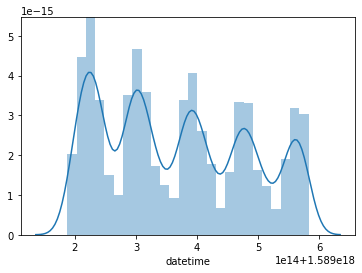

In [28]:
# quick visual of cyclical tweet volume
sns.distplot(df1.index)

In [31]:
# save our tweets for pickle checkpoint
with open("tsla_week1_tweets_df.pkl", 'wb') as f:
    pickle.dump(df1, f)

In [3]:
# save our tweets for pickle checkpoint
with open("tsla_week1_tweets_df.pkl", 'rb') as f:
    temp = pickle.load(f)
with open("tsla_week1_tweets.pkl", 'wb') as f:
    pickle.dump(temp, f)